In [1]:
# Importando as bibliotecas

import pandas as pd
%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import math
from pandas.tools import plotting
from scipy import stats
plt.style.use("ggplot")
import warnings
warnings.filterwarnings("ignore")
from scipy import stats

In [2]:
# Carregando o arquivo
df = pd.read_csv('data.csv')

df.shape

(569, 33)

In [3]:
df.sample(10)

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
144,869254,B,10.75,14.97,68.26,355.3,0.07793,0.05139,0.022510,0.007875,...,20.72,77.79,441.2,0.1076,0.1223,0.097550,0.03413,0.2300,0.06769,NaN
17,84862001,M,16.13,20.68,108.10,798.8,0.11700,0.20220,0.172200,0.102800,...,31.48,136.80,1315.0,0.1789,0.4233,0.478400,0.20730,0.3706,0.11420,NaN
427,90745,B,10.80,21.98,68.79,359.9,0.08801,0.05743,0.036140,0.014040,...,32.04,83.69,489.5,0.1303,0.1696,0.192700,0.07485,0.2965,0.07662,NaN
426,907409,B,10.48,14.98,67.49,333.6,0.09816,0.10130,0.063350,0.022180,...,21.57,81.41,440.4,0.1327,0.2996,0.293900,0.09310,0.3020,0.09646,NaN
89,861598,B,14.64,15.24,95.77,651.9,0.11320,0.13390,0.099660,0.070640,...,18.24,109.40,803.6,0.1277,0.3089,0.260400,0.13970,0.3151,0.08473,NaN
258,887181,M,15.66,23.20,110.20,773.5,0.11090,0.31140,0.317600,0.137700,...,31.64,143.70,1226.0,0.1504,0.5172,0.618100,0.24620,0.3277,0.10190,NaN
410,905502,B,11.36,17.57,72.49,399.8,0.08858,0.05313,0.027830,0.021000,...,36.32,85.07,521.3,0.1453,0.1622,0.181100,0.08698,0.2973,0.07745,NaN
554,924632,B,12.88,28.92,82.50,514.3,0.08123,0.05824,0.061950,0.023430,...,35.74,88.84,595.7,0.1227,0.1620,0.243900,0.06493,0.2372,0.07242,NaN
323,895100,M,20.34,21.51,135.90,1264.0,0.11700,0.18750,0.256500,0.150400,...,31.86,171.10,1938.0,0.1592,0.4492,0.534400,0.26850,0.5558,0.10240,NaN
327,895299,B,12.03,17.93,76.09,446.0,0.07683,0.03892,0.001546,0.005592,...,22.25,82.74,523.4,0.1013,0.0739,0.007732,0.02796,0.2171,0.07037,NaN


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 33 columns):
id                         569 non-null int64
diagnosis                  569 non-null object
radius_mean                569 non-null float64
texture_mean               569 non-null float64
perimeter_mean             569 non-null float64
area_mean                  569 non-null float64
smoothness_mean            569 non-null float64
compactness_mean           569 non-null float64
concavity_mean             569 non-null float64
concave points_mean        569 non-null float64
symmetry_mean              569 non-null float64
fractal_dimension_mean     569 non-null float64
radius_se                  569 non-null float64
texture_se                 569 non-null float64
perimeter_se               569 non-null float64
area_se                    569 non-null float64
smoothness_se              569 non-null float64
compactness_se             569 non-null float64
concavity_se               569 non

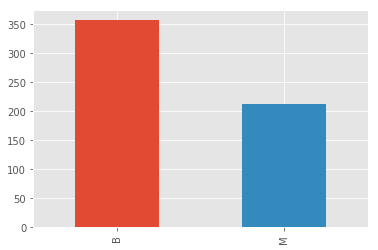

In [5]:
# Quantitativo por Diagnóstico
df['diagnosis'].value_counts().plot.bar()

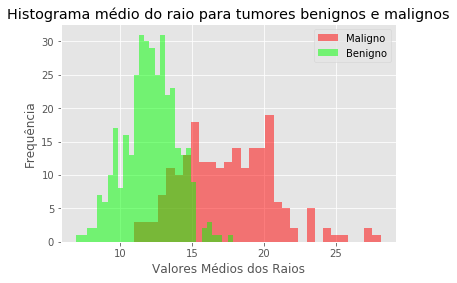

Média do raio maligno mais frequente:  20.101999999999997


In [6]:
#Histograma médio do raio para tumores benignos e malignos

m = plt.hist(df[df["diagnosis"] == "M"].radius_mean,bins=30,fc = (1,0,0,0.5),label = "Maligno")
b = plt.hist(df[df["diagnosis"] == "B"].radius_mean,bins=30,fc = (0,1,0,0.5),label = "Benigno")
plt.legend()
plt.xlabel("Valores Médios dos Raios")
plt.ylabel("Frequência")
plt.title("Histograma médio do raio para tumores benignos e malignos")
plt.show()
frequent_malignant_radius_mean = m[0].max()
index_frequent_malignant_radius_mean = list(m[0]).index(frequent_malignant_radius_mean)
most_frequent_malignant_radius_mean = m[1][index_frequent_malignant_radius_mean]
print("Média do raio maligno mais frequente: ",most_frequent_malignant_radius_mean)

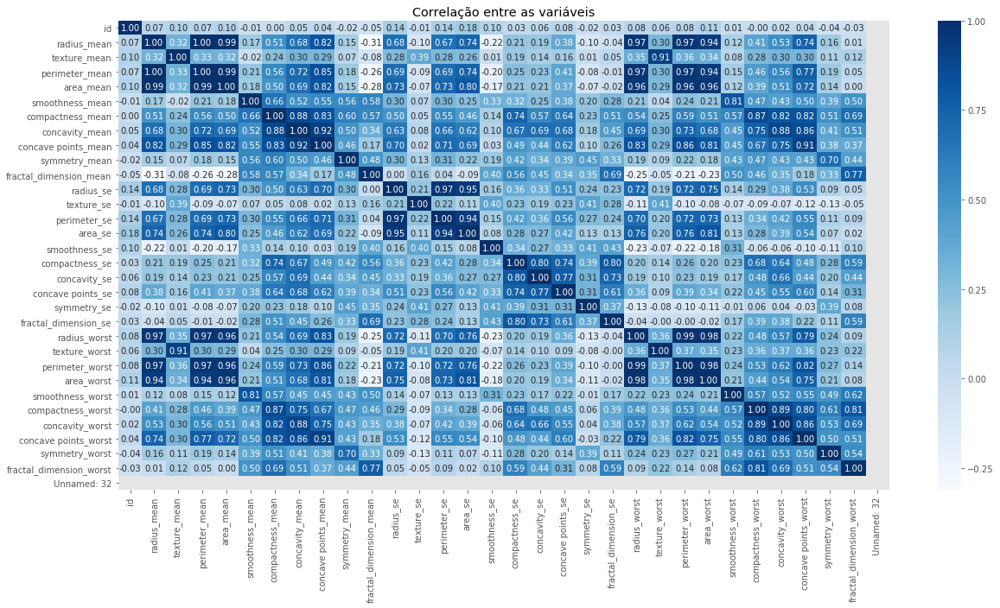

In [7]:
plt.figure(figsize=(20, 10))
sns.heatmap(df.corr(),
            annot = True,
            fmt = '.2f',
            cmap='Blues')
plt.title('Correlação entre as variáveis')
plt.show()

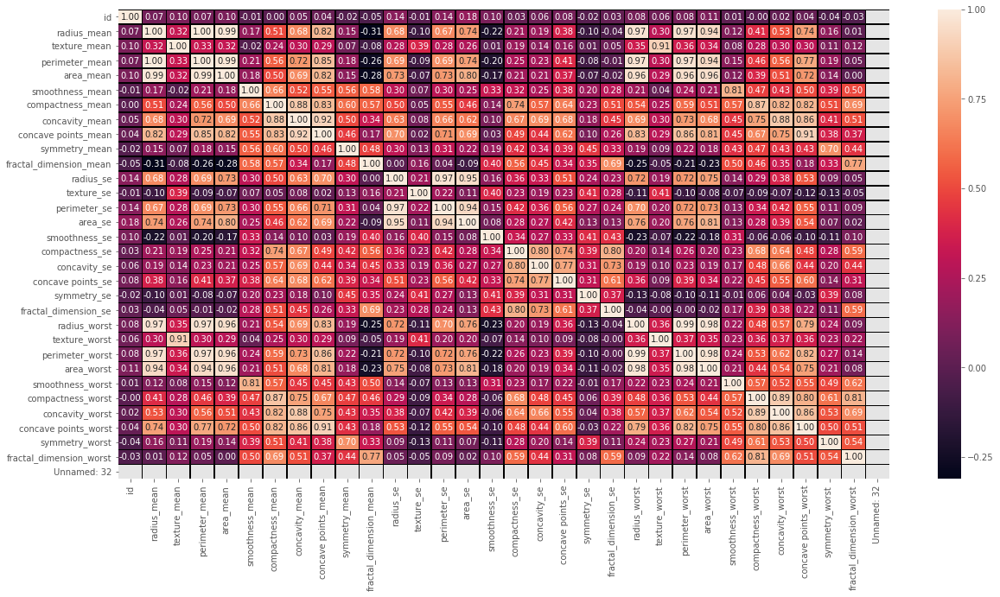

In [8]:
f, ax = plt.subplots(figsize=(20,10))
sns.heatmap(df.corr(), annot=True, fmt='.2f', linecolor='black', ax=ax, lw=.7)

In [9]:
d = {'M':1,'B':0}
df = df.replace(d) #replace M=1 or B=0 

In [10]:
df['diagnosis'].value_counts()

0    357
1    212
Name: diagnosis, dtype: int64

In [11]:
previsores=df.iloc[:,2:32].values
previsores

array([[1.799e+01, 1.038e+01, 1.228e+02, ..., 2.654e-01, 4.601e-01,
        1.189e-01],
       [2.057e+01, 1.777e+01, 1.329e+02, ..., 1.860e-01, 2.750e-01,
        8.902e-02],
       [1.969e+01, 2.125e+01, 1.300e+02, ..., 2.430e-01, 3.613e-01,
        8.758e-02],
       ...,
       [1.660e+01, 2.808e+01, 1.083e+02, ..., 1.418e-01, 2.218e-01,
        7.820e-02],
       [2.060e+01, 2.933e+01, 1.401e+02, ..., 2.650e-01, 4.087e-01,
        1.240e-01],
       [7.760e+00, 2.454e+01, 4.792e+01, ..., 0.000e+00, 2.871e-01,
        7.039e-02]])

In [12]:
classe=df.iloc[:,1].values
classe

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0, 1, 0, 1, 1,
       0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1,
       0, 0, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 0, 1,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0,
       0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 1, 1,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1,

In [13]:
from sklearn.model_selection import train_test_split

previsores_train,previsores_test,classe_train,classe_test=train_test_split(previsores, classe, test_size=0.3, random_state=42)

In [14]:
previsores_train.shape

(398, 30)

In [15]:
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout

Using TensorFlow backend.


In [16]:
classificador = Sequential()
classificador.add(Dense(units = 16, activation = 'relu', kernel_initializer = 'random_uniform', input_dim = 30))
# Adicionando mais uma camada
classificador.add(Dense(units = 16, activation = 'relu', kernel_initializer = 'random_uniform'))
classificador.add(Dense(units = 1, activation = 'sigmoid'))
otimizador = keras.optimizers.Adam(lr = 0.001, decay = 0.0001, clipvalue = 0.5)
classificador.compile(optimizer = otimizador, loss = 'binary_crossentropy',metrics = ['binary_accuracy'])
#classificador.compile(optimizer = "adam", loss = 'binary_crossentropy', metrics = ['binary_accuracy'])

In [17]:
classificador.fit(previsores_train, classe_train, batch_size = 10, epochs = 100)

Epoch 1/100
398/398 [==============================] - 0s 704us/step - loss: 0.6713 - binary_accuracy: 0.5578
Epoch 2/100
398/398 [==============================] - 0s 115us/step - loss: 0.5735 - binary_accuracy: 0.6834
Epoch 3/100
398/398 [==============================] - 0s 103us/step - loss: 0.4500 - binary_accuracy: 0.8442
Epoch 4/100
398/398 [==============================] - 0s 113us/step - loss: 0.3554 - binary_accuracy: 0.8844
Epoch 5/100
398/398 [==============================] - 0s 149us/step - loss: 0.3433 - binary_accuracy: 0.8719
Epoch 6/100
398/398 [==============================] - 0s 135us/step - loss: 0.3150 - binary_accuracy: 0.8719
Epoch 7/100
398/398 [==============================] - 0s 90us/step - loss: 0.3066 - binary_accuracy: 0.8920
Epoch 8/100
398/398 [==============================] - 0s 105us/step - loss: 0.2784 - binary_accuracy: 0.8945
Epoch 9/100
398/398 [==============================] - 0s 85us/step - loss: 0.2906 - binary_accuracy: 0.8719
Epoch 10/100

398/398 [==============================] - 0s 73us/step - loss: 0.2607 - binary_accuracy: 0.9095
Epoch 76/100
398/398 [==============================] - 0s 78us/step - loss: 0.3037 - binary_accuracy: 0.9020
Epoch 77/100
398/398 [==============================] - 0s 70us/step - loss: 0.2552 - binary_accuracy: 0.8945
Epoch 78/100
398/398 [==============================] - 0s 70us/step - loss: 0.2135 - binary_accuracy: 0.9221
Epoch 79/100
398/398 [==============================] - 0s 68us/step - loss: 0.1871 - binary_accuracy: 0.9246
Epoch 80/100
398/398 [==============================] - 0s 70us/step - loss: 0.2301 - binary_accuracy: 0.9095
Epoch 81/100
398/398 [==============================] - 0s 68us/step - loss: 0.1892 - binary_accuracy: 0.9171
Epoch 82/100
398/398 [==============================] - 0s 70us/step - loss: 0.2010 - binary_accuracy: 0.9196
Epoch 83/100
398/398 [==============================] - 0s 78us/step - loss: 0.3024 - binary_accuracy: 0.8970
Epoch 84/100
398/398 [=

In [18]:
# Visualização dos pesos

In [19]:
pesos0 = classificador.layers[0].get_weights()
#print(pesos0)
print(len(pesos0))

2


In [20]:
pesos1 = classificador.layers[1].get_weights()
print(pesos1)

[array([[ 1.22261432e-03,  5.40013565e-03, -1.31671329e-03,
        -3.11346427e-02, -1.21416533e-02, -4.34742942e-02,
        -2.22509839e-02,  6.64733872e-02,  4.43358198e-02,
         2.96502076e-02,  7.57085234e-02, -2.62206211e-03,
         5.10688797e-02,  2.27951519e-02, -4.41630743e-02,
        -2.16715466e-02],
       [ 4.63194512e-02,  4.36290018e-02, -3.43608856e-02,
         4.13342826e-02,  3.89090069e-02, -4.88303602e-04,
         3.10274400e-02, -5.57211787e-03, -1.04016885e-02,
         4.51604277e-03,  3.88685130e-02,  2.21558325e-02,
         6.88071176e-03,  3.14311273e-02, -2.63341516e-03,
        -2.60959025e-02],
       [ 1.51090510e-02, -1.53992772e-02, -2.86709666e-02,
        -4.66884486e-02,  3.92874330e-03,  4.83069755e-02,
        -1.85942426e-02, -4.97504137e-02, -4.07706574e-03,
        -3.64014506e-02,  4.88024615e-02,  1.56226046e-02,
         2.94021256e-02,  1.00816488e-02,  1.52871273e-02,
         3.15129198e-02],
       [-2.43554115e-02, -6.84815645

In [21]:
pesos2 = classificador.layers[2].get_weights()
print(pesos2)

[array([[ 0.15927842],
       [-0.16940132],
       [ 0.3161439 ],
       [-0.10528069],
       [-0.10041868],
       [-0.07953633],
       [-0.10593094],
       [ 0.55251443],
       [ 0.48627374],
       [ 0.6352681 ],
       [ 0.5100984 ],
       [-0.06182804],
       [-0.28109214],
       [ 0.5521298 ],
       [ 0.45153475],
       [ 0.08315337]], dtype=float32), array([-0.20331766], dtype=float32)]


In [22]:
# Usando sklearn
previsoes = classificador.predict(previsores_test)
previsoes = (previsoes > 0.7)

In [23]:
from sklearn.metrics import confusion_matrix, accuracy_score

In [24]:
precisao = accuracy_score(classe_test, previsoes)
precisao

0.9532163742690059

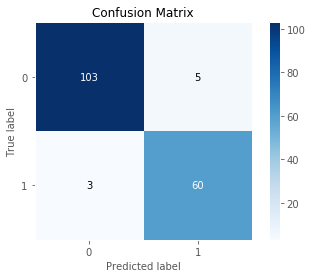

In [25]:
#matriz = confusion_matrix(classe_test, previsoes)
#matriz

import scikitplot as skplt

skplt.metrics.plot_confusion_matrix(classe_test, previsoes)

In [26]:
# usando o keras
resultado = classificador.evaluate(previsores_test, classe_test)

171/171 [==============================] - 0s 105us/step


In [27]:
# Validação Cruzada

In [28]:
from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV

In [29]:
def criarRede():
    classificador = Sequential()
    classificador.add(Dense(units = 16, activation = 'relu', kernel_initializer = 'random_uniform', input_dim = 30))
    classificador.add(Dropout(0.2))
    # Adicionando mais uma camada
    classificador.add(Dense(units = 16, activation = 'relu', kernel_initializer = 'random_uniform'))
    classificador.add(Dropout(0.2))
    classificador.add(Dense(units = 1, activation = 'sigmoid'))
    otimizador = keras.optimizers.Adam(lr = 0.001, decay = 0.0001, clipvalue = 0.5)
    classificador.compile(optimizer = otimizador, loss = 'binary_crossentropy',metrics = ['binary_accuracy'])
    return classificador

In [30]:
classificador = KerasClassifier(build_fn = criarRede, epochs = 100, batch_size = 10)

In [31]:
resultados = cross_val_score(estimator = classificador, X = previsores, y = classe, cv = 10, scoring = 'accuracy')

Epoch 1/100
512/512 [==============================] - 0s 462us/step - loss: 0.6088 - binary_accuracy: 0.6934
Epoch 2/100
512/512 [==============================] - 0s 99us/step - loss: 0.4475 - binary_accuracy: 0.8223
Epoch 3/100
512/512 [==============================] - 0s 90us/step - loss: 0.3360 - binary_accuracy: 0.8496
Epoch 4/100
512/512 [==============================] - 0s 91us/step - loss: 0.3384 - binary_accuracy: 0.8691
Epoch 5/100
512/512 [==============================] - ETA: 0s - loss: 0.1261 - binary_accuracy: 0.900 - 0s 89us/step - loss: 0.3290 - binary_accuracy: 0.8887
Epoch 6/100
512/512 [==============================] - 0s 107us/step - loss: 0.3287 - binary_accuracy: 0.8809
Epoch 7/100
512/512 [==============================] - 0s 88us/step - loss: 0.2873 - binary_accuracy: 0.9180
Epoch 8/100
512/512 [==============================] - 0s 127us/step - loss: 0.3002 - binary_accuracy: 0.8926
Epoch 9/100
512/512 [==============================] - 0s 105us/step - loss

512/512 [==============================] - 0s 76us/step - loss: 0.2557 - binary_accuracy: 0.9160
Epoch 75/100
512/512 [==============================] - 0s 82us/step - loss: 0.2621 - binary_accuracy: 0.9297
Epoch 76/100
512/512 [==============================] - 0s 99us/step - loss: 0.2626 - binary_accuracy: 0.9238
Epoch 77/100
512/512 [==============================] - 0s 85us/step - loss: 0.2461 - binary_accuracy: 0.9355
Epoch 78/100
512/512 [==============================] - ETA: 0s - loss: 0.0463 - binary_accuracy: 1.000 - 0s 90us/step - loss: 0.2868 - binary_accuracy: 0.9219
Epoch 79/100
512/512 [==============================] - 0s 109us/step - loss: 0.3025 - binary_accuracy: 0.9141
Epoch 80/100
512/512 [==============================] - 0s 131us/step - loss: 0.3046 - binary_accuracy: 0.9043
Epoch 81/100
512/512 [==============================] - 0s 123us/step - loss: 0.2702 - binary_accuracy: 0.9258
Epoch 82/100
512/512 [==============================] - 0s 169us/step - loss: 0.

512/512 [==============================] - 0s 133us/step - loss: 0.2954 - binary_accuracy: 0.9180
Epoch 48/100
512/512 [==============================] - 0s 144us/step - loss: 0.3256 - binary_accuracy: 0.8984
Epoch 49/100
512/512 [==============================] - 0s 174us/step - loss: 0.3081 - binary_accuracy: 0.9121
Epoch 50/100
512/512 [==============================] - 0s 114us/step - loss: 0.3088 - binary_accuracy: 0.9121
Epoch 51/100
512/512 [==============================] - 0s 94us/step - loss: 0.3229 - binary_accuracy: 0.9062
Epoch 52/100
512/512 [==============================] - 0s 86us/step - loss: 0.4270 - binary_accuracy: 0.8809
Epoch 53/100
512/512 [==============================] - 0s 85us/step - loss: 0.3474 - binary_accuracy: 0.8984
Epoch 54/100
512/512 [==============================] - 0s 90us/step - loss: 0.3104 - binary_accuracy: 0.9062
Epoch 55/100
512/512 [==============================] - 0s 90us/step - loss: 0.2896 - binary_accuracy: 0.9121
Epoch 56/100
512/51

Epoch 21/100
512/512 [==============================] - 0s 76us/step - loss: 0.3724 - binary_accuracy: 0.8828
Epoch 22/100
512/512 [==============================] - 0s 74us/step - loss: 0.3063 - binary_accuracy: 0.9004
Epoch 23/100
512/512 [==============================] - 0s 68us/step - loss: 0.3358 - binary_accuracy: 0.8965
Epoch 24/100
512/512 [==============================] - 0s 78us/step - loss: 0.3483 - binary_accuracy: 0.8867
Epoch 25/100
512/512 [==============================] - 0s 103us/step - loss: 0.3620 - binary_accuracy: 0.8789
Epoch 26/100
512/512 [==============================] - 0s 78us/step - loss: 0.2843 - binary_accuracy: 0.9082
Epoch 27/100
512/512 [==============================] - 0s 78us/step - loss: 0.3279 - binary_accuracy: 0.9043
Epoch 28/100
512/512 [==============================] - 0s 78us/step - loss: 0.3180 - binary_accuracy: 0.9004
Epoch 29/100
512/512 [==============================] - 0s 80us/step - loss: 0.3147 - binary_accuracy: 0.9023
Epoch 30/

512/512 [==============================] - 0s 93us/step - loss: 0.3572 - binary_accuracy: 0.9082
Epoch 96/100
512/512 [==============================] - 0s 92us/step - loss: 0.2906 - binary_accuracy: 0.8984
Epoch 97/100
512/512 [==============================] - 0s 92us/step - loss: 0.2976 - binary_accuracy: 0.9062
Epoch 98/100
512/512 [==============================] - 0s 115us/step - loss: 0.2540 - binary_accuracy: 0.9258
Epoch 99/100
512/512 [==============================] - 0s 86us/step - loss: 0.2702 - binary_accuracy: 0.9102
Epoch 100/100
512/512 [==============================] - 0s 128us/step - loss: 0.2683 - binary_accuracy: 0.9141
Epoch 1/100
512/512 [==============================] - 0s 317us/step - loss: 0.7202 - binary_accuracy: 0.5996
Epoch 2/100
512/512 [==============================] - 0s 77us/step - loss: 0.4610 - binary_accuracy: 0.8438
Epoch 3/100
512/512 [==============================] - 0s 78us/step - loss: 0.4334 - binary_accuracy: 0.8418
Epoch 4/100
512/512 [=

512/512 [==============================] - 0s 85us/step - loss: 0.3469 - binary_accuracy: 0.8828
Epoch 69/100
512/512 [==============================] - 0s 75us/step - loss: 0.2764 - binary_accuracy: 0.9277
Epoch 70/100
512/512 [==============================] - 0s 82us/step - loss: 0.3210 - binary_accuracy: 0.9004
Epoch 71/100
512/512 [==============================] - 0s 82us/step - loss: 0.3722 - binary_accuracy: 0.8906
Epoch 72/100
512/512 [==============================] - 0s 75us/step - loss: 0.3467 - binary_accuracy: 0.9082
Epoch 73/100
512/512 [==============================] - 0s 86us/step - loss: 0.3271 - binary_accuracy: 0.9004
Epoch 74/100
512/512 [==============================] - 0s 75us/step - loss: 0.3121 - binary_accuracy: 0.9121
Epoch 75/100
512/512 [==============================] - 0s 78us/step - loss: 0.2876 - binary_accuracy: 0.9180
Epoch 76/100
512/512 [==============================] - 0s 88us/step - loss: 0.2759 - binary_accuracy: 0.9199
Epoch 77/100
512/512 [=

512/512 [==============================] - 0s 80us/step - loss: 0.3231 - binary_accuracy: 0.8809
Epoch 42/100
512/512 [==============================] - 0s 84us/step - loss: 0.2914 - binary_accuracy: 0.8926
Epoch 43/100
512/512 [==============================] - 0s 84us/step - loss: 0.3138 - binary_accuracy: 0.8906
Epoch 44/100
512/512 [==============================] - 0s 77us/step - loss: 0.3383 - binary_accuracy: 0.8984
Epoch 45/100
512/512 [==============================] - 0s 84us/step - loss: 0.3046 - binary_accuracy: 0.9004
Epoch 46/100
512/512 [==============================] - 0s 78us/step - loss: 0.3030 - binary_accuracy: 0.9043
Epoch 47/100
512/512 [==============================] - 0s 83us/step - loss: 0.3046 - binary_accuracy: 0.9062
Epoch 48/100
512/512 [==============================] - 0s 77us/step - loss: 0.3454 - binary_accuracy: 0.8984
Epoch 49/100
512/512 [==============================] - 0s 82us/step - loss: 0.2982 - binary_accuracy: 0.9102
Epoch 50/100
512/512 [=

512/512 [==============================] - 0s 80us/step - loss: 0.3366 - binary_accuracy: 0.8789
Epoch 16/100
512/512 [==============================] - 0s 84us/step - loss: 0.2784 - binary_accuracy: 0.9121
Epoch 17/100
512/512 [==============================] - 0s 84us/step - loss: 0.3013 - binary_accuracy: 0.8984
Epoch 18/100
512/512 [==============================] - 0s 78us/step - loss: 0.3252 - binary_accuracy: 0.8945
Epoch 19/100
512/512 [==============================] - 0s 80us/step - loss: 0.3104 - binary_accuracy: 0.8887
Epoch 20/100
512/512 [==============================] - 0s 80us/step - loss: 0.3233 - binary_accuracy: 0.8906
Epoch 21/100
512/512 [==============================] - 0s 85us/step - loss: 0.2795 - binary_accuracy: 0.9062
Epoch 22/100
512/512 [==============================] - 0s 81us/step - loss: 0.3329 - binary_accuracy: 0.8906
Epoch 23/100
512/512 [==============================] - 0s 88us/step - loss: 0.3519 - binary_accuracy: 0.8848
Epoch 24/100
512/512 [=

512/512 [==============================] - 0s 83us/step - loss: 0.2718 - binary_accuracy: 0.9277
Epoch 90/100
512/512 [==============================] - 0s 111us/step - loss: 0.3667 - binary_accuracy: 0.8867
Epoch 91/100
512/512 [==============================] - 0s 83us/step - loss: 0.2759 - binary_accuracy: 0.9199
Epoch 92/100
512/512 [==============================] - ETA: 0s - loss: 0.1123 - binary_accuracy: 1.000 - 0s 84us/step - loss: 0.2889 - binary_accuracy: 0.9141
Epoch 93/100
512/512 [==============================] - 0s 77us/step - loss: 0.2858 - binary_accuracy: 0.9219
Epoch 94/100
512/512 [==============================] - 0s 77us/step - loss: 0.3123 - binary_accuracy: 0.9160
Epoch 95/100
512/512 [==============================] - 0s 81us/step - loss: 0.2392 - binary_accuracy: 0.9277
Epoch 96/100
512/512 [==============================] - 0s 76us/step - loss: 0.2562 - binary_accuracy: 0.9199
Epoch 97/100
512/512 [==============================] - 0s 78us/step - loss: 0.277

512/512 [==============================] - 0s 79us/step - loss: 0.3252 - binary_accuracy: 0.9121
Epoch 63/100
512/512 [==============================] - 0s 78us/step - loss: 0.2606 - binary_accuracy: 0.9180
Epoch 64/100
512/512 [==============================] - 0s 84us/step - loss: 0.2611 - binary_accuracy: 0.9121
Epoch 65/100
512/512 [==============================] - 0s 74us/step - loss: 0.2919 - binary_accuracy: 0.9199
Epoch 66/100
512/512 [==============================] - 0s 76us/step - loss: 0.2490 - binary_accuracy: 0.9238
Epoch 67/100
512/512 [==============================] - 0s 79us/step - loss: 0.2992 - binary_accuracy: 0.9199
Epoch 68/100
512/512 [==============================] - 0s 76us/step - loss: 0.3285 - binary_accuracy: 0.9043
Epoch 69/100
512/512 [==============================] - 0s 78us/step - loss: 0.2666 - binary_accuracy: 0.9219
Epoch 70/100
512/512 [==============================] - 0s 77us/step - loss: 0.3029 - binary_accuracy: 0.9102
Epoch 71/100
512/512 [=

512/512 [==============================] - 0s 76us/step - loss: 0.4046 - binary_accuracy: 0.8633
Epoch 37/100
512/512 [==============================] - 0s 81us/step - loss: 0.3050 - binary_accuracy: 0.9023
Epoch 38/100
512/512 [==============================] - 0s 123us/step - loss: 0.3390 - binary_accuracy: 0.8984
Epoch 39/100
512/512 [==============================] - 0s 78us/step - loss: 0.3327 - binary_accuracy: 0.8848
Epoch 40/100
512/512 [==============================] - 0s 80us/step - loss: 0.3075 - binary_accuracy: 0.8984
Epoch 41/100
512/512 [==============================] - 0s 78us/step - loss: 0.3376 - binary_accuracy: 0.9004
Epoch 42/100
512/512 [==============================] - 0s 79us/step - loss: 0.3268 - binary_accuracy: 0.8867
Epoch 43/100
512/512 [==============================] - 0s 81us/step - loss: 0.3550 - binary_accuracy: 0.8965
Epoch 44/100
512/512 [==============================] - 0s 77us/step - loss: 0.2845 - binary_accuracy: 0.9121
Epoch 45/100
512/512 [

512/512 [==============================] - 0s 90us/step - loss: 0.3024 - binary_accuracy: 0.9004
Epoch 11/100
512/512 [==============================] - 0s 88us/step - loss: 0.2556 - binary_accuracy: 0.9141
Epoch 12/100
512/512 [==============================] - 0s 85us/step - loss: 0.2911 - binary_accuracy: 0.9082
Epoch 13/100
512/512 [==============================] - 0s 79us/step - loss: 0.3045 - binary_accuracy: 0.9004
Epoch 14/100
512/512 [==============================] - 0s 80us/step - loss: 0.3119 - binary_accuracy: 0.8906
Epoch 15/100
512/512 [==============================] - ETA: 0s - loss: 0.3304 - binary_accuracy: 0.876 - 0s 122us/step - loss: 0.3238 - binary_accuracy: 0.8789
Epoch 16/100
512/512 [==============================] - 0s 119us/step - loss: 0.2993 - binary_accuracy: 0.9082
Epoch 17/100
512/512 [==============================] - 0s 113us/step - loss: 0.2813 - binary_accuracy: 0.8965
Epoch 18/100
512/512 [==============================] - 0s 93us/step - loss: 0.2

512/512 [==============================] - 0s 81us/step - loss: 0.2643 - binary_accuracy: 0.9102
Epoch 85/100
512/512 [==============================] - 0s 80us/step - loss: 0.2858 - binary_accuracy: 0.9121
Epoch 86/100
512/512 [==============================] - 0s 91us/step - loss: 0.2852 - binary_accuracy: 0.9160
Epoch 87/100
512/512 [==============================] - 0s 90us/step - loss: 0.2883 - binary_accuracy: 0.9082
Epoch 88/100
512/512 [==============================] - 0s 85us/step - loss: 0.2444 - binary_accuracy: 0.9219
Epoch 89/100
512/512 [==============================] - 0s 90us/step - loss: 0.2818 - binary_accuracy: 0.9199
Epoch 90/100
512/512 [==============================] - 0s 90us/step - loss: 0.2343 - binary_accuracy: 0.9258
Epoch 91/100
512/512 [==============================] - 0s 85us/step - loss: 0.2879 - binary_accuracy: 0.9160
Epoch 92/100
512/512 [==============================] - 0s 92us/step - loss: 0.2905 - binary_accuracy: 0.9141
Epoch 93/100
512/512 [=

513/513 [==============================] - 0s 87us/step - loss: 0.2824 - binary_accuracy: 0.9045
Epoch 59/100
513/513 [==============================] - 0s 87us/step - loss: 0.2981 - binary_accuracy: 0.9006
Epoch 60/100
513/513 [==============================] - 0s 81us/step - loss: 0.2727 - binary_accuracy: 0.8947
Epoch 61/100
513/513 [==============================] - 0s 86us/step - loss: 0.2621 - binary_accuracy: 0.9045
Epoch 62/100
513/513 [==============================] - 0s 80us/step - loss: 0.2754 - binary_accuracy: 0.9103
Epoch 63/100
513/513 [==============================] - 0s 92us/step - loss: 0.3222 - binary_accuracy: 0.8947
Epoch 64/100
513/513 [==============================] - 0s 89us/step - loss: 0.3543 - binary_accuracy: 0.8967
Epoch 65/100
513/513 [==============================] - 0s 87us/step - loss: 0.2596 - binary_accuracy: 0.9025
Epoch 66/100
513/513 [==============================] - 0s 94us/step - loss: 0.2913 - binary_accuracy: 0.9006
Epoch 67/100
513/513 [=

In [32]:
resultados

array([0.85964912, 0.94736842, 0.94736842, 0.85964912, 0.98245614,
       0.92982456, 0.9122807 , 0.94736842, 0.89473684, 0.875     ])

In [33]:
media = resultados.mean()
media

0.9155701754385964

In [34]:
desvio = resultados.std()
desvio

0.040069216237328696

In [35]:
# Ajuste dos parâmetros

In [36]:
def criarRede2(optimizer, loos, kernel_initializer, activation, neurons):
    classificador = Sequential()
    classificador.add(Dense(units = neurons, activation = activation, kernel_initializer = kernel_initializer, input_dim = 30))
    classificador.add(Dropout(0.2))
    # Adicionando mais uma camada
    classificador.add(Dense(units = neurons, activation = activation, kernel_initializer = kernel_initializer))
    classificador.add(Dropout(0.2))
    classificador.add(Dense(units = 1, activation = 'sigmoid'))
    classificador.compile(optimizer = optimizer, loss = loos, metrics = ['binary_accuracy'])
    return classificador

In [37]:
classificador2 = KerasClassifier(build_fn = criarRede2)
parametros = {'batch_size': [10, 30],
              'epochs': [100, 300],
              'optimizer': ['adam', 'sgd'],
              'loos': ['binary_crossentropy', 'hinge'],
              'kernel_initializer': ['random_uniform', 'normal'],
              'activation': ['relu', 'tanh'],
              'neurons': [16, 8]}

In [38]:
grid_search = GridSearchCV(estimator = classificador2,
                           param_grid = parametros,
                           scoring = 'accuracy',
                           cv = 3)
grid_search = grid_search.fit(previsores, classe)

Epoch 1/100
379/379 [==============================] - 0s 431us/step - loss: 0.8321 - binary_accuracy: 0.5066
Epoch 2/100
379/379 [==============================] - 0s 82us/step - loss: 0.6079 - binary_accuracy: 0.7203
Epoch 3/100
379/379 [==============================] - 0s 95us/step - loss: 0.5019 - binary_accuracy: 0.8391
Epoch 4/100
379/379 [==============================] - 0s 128us/step - loss: 0.4480 - binary_accuracy: 0.8628
Epoch 5/100
379/379 [==============================] - 0s 172us/step - loss: 0.4105 - binary_accuracy: 0.8734
Epoch 6/100
379/379 [==============================] - 0s 142us/step - loss: 0.3815 - binary_accuracy: 0.8786
Epoch 7/100
379/379 [==============================] - 0s 115us/step - loss: 0.3469 - binary_accuracy: 0.8945
Epoch 8/100
379/379 [==============================] - 0s 110us/step - loss: 0.3242 - binary_accuracy: 0.8892
Epoch 9/100
379/379 [==============================] - 0s 96us/step - loss: 0.2945 - binary_accuracy: 0.9050
Epoch 10/100


379/379 [==============================] - 0s 115us/step - loss: 0.1638 - binary_accuracy: 0.9367
Epoch 76/100
379/379 [==============================] - 0s 110us/step - loss: 0.1667 - binary_accuracy: 0.9314
Epoch 77/100
379/379 [==============================] - 0s 90us/step - loss: 0.2027 - binary_accuracy: 0.9340
Epoch 78/100
379/379 [==============================] - 0s 84us/step - loss: 0.1703 - binary_accuracy: 0.9472
Epoch 79/100
379/379 [==============================] - ETA: 0s - loss: 0.3470 - binary_accuracy: 0.800 - 0s 87us/step - loss: 0.2067 - binary_accuracy: 0.9261
Epoch 80/100
379/379 [==============================] - 0s 88us/step - loss: 0.1789 - binary_accuracy: 0.9340
Epoch 81/100
379/379 [==============================] - 0s 84us/step - loss: 0.1970 - binary_accuracy: 0.9235
Epoch 82/100
379/379 [==============================] - 0s 123us/step - loss: 0.1653 - binary_accuracy: 0.9340
Epoch 83/100
379/379 [==============================] - 0s 95us/step - loss: 0.1

379/379 [==============================] - 0s 100us/step - loss: 0.2528 - binary_accuracy: 0.9103
Epoch 49/100
379/379 [==============================] - ETA: 0s - loss: 0.3412 - binary_accuracy: 0.800 - 0s 97us/step - loss: 0.2187 - binary_accuracy: 0.9235
Epoch 50/100
379/379 [==============================] - 0s 93us/step - loss: 0.2188 - binary_accuracy: 0.9077
Epoch 51/100
379/379 [==============================] - 0s 98us/step - loss: 0.2234 - binary_accuracy: 0.9129
Epoch 52/100
379/379 [==============================] - 0s 242us/step - loss: 0.2314 - binary_accuracy: 0.9103
Epoch 53/100
379/379 [==============================] - 0s 152us/step - loss: 0.2438 - binary_accuracy: 0.8997
Epoch 54/100
379/379 [==============================] - 0s 115us/step - loss: 0.2163 - binary_accuracy: 0.9077
Epoch 55/100
379/379 [==============================] - 0s 115us/step - loss: 0.2228 - binary_accuracy: 0.9156
Epoch 56/100
379/379 [==============================] - 0s 125us/step - loss: 

380/380 [==============================] - 0s 85us/step - loss: 0.2290 - binary_accuracy: 0.9184
Epoch 22/100
380/380 [==============================] - 0s 89us/step - loss: 0.2114 - binary_accuracy: 0.9237
Epoch 23/100
380/380 [==============================] - 0s 94us/step - loss: 0.2287 - binary_accuracy: 0.9184
Epoch 24/100
380/380 [==============================] - 0s 93us/step - loss: 0.2328 - binary_accuracy: 0.9105
Epoch 25/100
380/380 [==============================] - 0s 91us/step - loss: 0.2412 - binary_accuracy: 0.9079
Epoch 26/100
380/380 [==============================] - 0s 89us/step - loss: 0.2611 - binary_accuracy: 0.9053
Epoch 27/100
380/380 [==============================] - 0s 91us/step - loss: 0.2444 - binary_accuracy: 0.8974
Epoch 28/100
380/380 [==============================] - 0s 87us/step - loss: 0.2156 - binary_accuracy: 0.9237
Epoch 29/100
380/380 [==============================] - 0s 102us/step - loss: 0.2405 - binary_accuracy: 0.9053
Epoch 30/100
380/380 [

380/380 [==============================] - 0s 92us/step - loss: 0.2032 - binary_accuracy: 0.9263
Epoch 95/100
380/380 [==============================] - 0s 91us/step - loss: 0.1901 - binary_accuracy: 0.9184
Epoch 96/100
380/380 [==============================] - 0s 84us/step - loss: 0.1806 - binary_accuracy: 0.9289
Epoch 97/100
380/380 [==============================] - 0s 88us/step - loss: 0.1815 - binary_accuracy: 0.9184
Epoch 98/100
380/380 [==============================] - 0s 84us/step - loss: 0.1846 - binary_accuracy: 0.9342
Epoch 99/100
380/380 [==============================] - 0s 89us/step - loss: 0.2006 - binary_accuracy: 0.9132
Epoch 100/100
380/380 [==============================] - 0s 90us/step - loss: 0.1919 - binary_accuracy: 0.9316
Epoch 1/100
379/379 [==============================] - 0s 289us/step - loss: 1.4103 - binary_accuracy: 0.6834
Epoch 2/100
379/379 [==============================] - 0s 68us/step - loss: 0.6703 - binary_accuracy: 0.6966
Epoch 3/100
379/379 [==

379/379 [==============================] - 0s 82us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 69/100
379/379 [==============================] - 0s 81us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 70/100
379/379 [==============================] - 0s 79us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 71/100
379/379 [==============================] - 0s 78us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 72/100
379/379 [==============================] - 0s 79us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 73/100
379/379 [==============================] - 0s 71us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 74/100
379/379 [==============================] - 0s 79us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 75/100
379/379 [==============================] - 0s 91us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 76/100
379/379 [==============================] - 0s 80us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 77/100
379/379 [=

379/379 [==============================] - 0s 82us/step - loss: 0.6567 - binary_accuracy: 0.6306
Epoch 43/100
379/379 [==============================] - 0s 83us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 44/100
379/379 [==============================] - 0s 77us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 45/100
379/379 [==============================] - 0s 74us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 46/100
379/379 [==============================] - 0s 76us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 47/100
379/379 [==============================] - 0s 78us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 48/100
379/379 [==============================] - 0s 86us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 49/100
379/379 [==============================] - 0s 82us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 50/100
379/379 [==============================] - 0s 79us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 51/100
379/379 [=

380/380 [==============================] - 0s 79us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 17/100
380/380 [==============================] - 0s 82us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 18/100
380/380 [==============================] - 0s 81us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 19/100
380/380 [==============================] - 0s 73us/step - loss: 0.6891 - binary_accuracy: 0.5553
Epoch 20/100
380/380 [==============================] - 0s 84us/step - loss: 0.6860 - binary_accuracy: 0.5553
Epoch 21/100
380/380 [==============================] - 0s 79us/step - loss: 0.6865 - binary_accuracy: 0.5553
Epoch 22/100
380/380 [==============================] - 0s 79us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 23/100
380/380 [==============================] - 0s 82us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 24/100
380/380 [==============================] - ETA: 0s - loss: 0.7185 - binary_accuracy: 0.400 - 0s 77us/step - loss: 0.6872

Epoch 88/100
380/380 [==============================] - 0s 77us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 89/100
380/380 [==============================] - 0s 77us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 90/100
380/380 [==============================] - 0s 81us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 91/100
380/380 [==============================] - 0s 76us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 92/100
380/380 [==============================] - 0s 81us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 93/100
380/380 [==============================] - 0s 87us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 94/100
380/380 [==============================] - 0s 118us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 95/100
380/380 [==============================] - 0s 81us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 96/100
380/380 [==============================] - 0s 80us/step - loss: 0.6859 - binary_accuracy: 0.5553
Epoch 97/

379/379 [==============================] - 0s 81us/step - loss: 0.2208 - binary_accuracy: 0.9208
Epoch 63/100
379/379 [==============================] - 0s 86us/step - loss: 0.2566 - binary_accuracy: 0.9156
Epoch 64/100
379/379 [==============================] - 0s 84us/step - loss: 0.2037 - binary_accuracy: 0.9393
Epoch 65/100
379/379 [==============================] - 0s 85us/step - loss: 0.2566 - binary_accuracy: 0.9156
Epoch 66/100
379/379 [==============================] - 0s 84us/step - loss: 0.2206 - binary_accuracy: 0.9288
Epoch 67/100
379/379 [==============================] - 0s 88us/step - loss: 0.2365 - binary_accuracy: 0.9235
Epoch 68/100
379/379 [==============================] - 0s 84us/step - loss: 0.2565 - binary_accuracy: 0.9129
Epoch 69/100
379/379 [==============================] - 0s 81us/step - loss: 0.1925 - binary_accuracy: 0.9420
Epoch 70/100
379/379 [==============================] - 0s 84us/step - loss: 0.2341 - binary_accuracy: 0.9182
Epoch 71/100
379/379 [=

379/379 [==============================] - 0s 89us/step - loss: 0.2434 - binary_accuracy: 0.9103
Epoch 37/100
379/379 [==============================] - 0s 91us/step - loss: 0.2727 - binary_accuracy: 0.9103
Epoch 38/100
379/379 [==============================] - 0s 86us/step - loss: 0.2923 - binary_accuracy: 0.8918
Epoch 39/100
379/379 [==============================] - 0s 85us/step - loss: 0.2336 - binary_accuracy: 0.9288
Epoch 40/100
379/379 [==============================] - 0s 81us/step - loss: 0.3027 - binary_accuracy: 0.8918
Epoch 41/100
379/379 [==============================] - 0s 83us/step - loss: 0.2420 - binary_accuracy: 0.9208
Epoch 42/100
379/379 [==============================] - 0s 83us/step - loss: 0.3075 - binary_accuracy: 0.8839
Epoch 43/100
379/379 [==============================] - 0s 82us/step - loss: 0.2539 - binary_accuracy: 0.9077
Epoch 44/100
379/379 [==============================] - 0s 83us/step - loss: 0.2596 - binary_accuracy: 0.9208
Epoch 45/100
379/379 [=

380/380 [==============================] - 0s 82us/step - loss: 0.4082 - binary_accuracy: 0.8632
Epoch 11/100
380/380 [==============================] - 0s 81us/step - loss: 0.3883 - binary_accuracy: 0.8684
Epoch 12/100
380/380 [==============================] - 0s 81us/step - loss: 0.3806 - binary_accuracy: 0.8711
Epoch 13/100
380/380 [==============================] - 0s 84us/step - loss: 0.3524 - binary_accuracy: 0.8842
Epoch 14/100
380/380 [==============================] - 0s 85us/step - loss: 0.3504 - binary_accuracy: 0.8816
Epoch 15/100
380/380 [==============================] - 0s 81us/step - loss: 0.3545 - binary_accuracy: 0.8789
Epoch 16/100
380/380 [==============================] - ETA: 0s - loss: 0.3009 - binary_accuracy: 0.900 - 0s 85us/step - loss: 0.3721 - binary_accuracy: 0.8474
Epoch 17/100
380/380 [==============================] - 0s 84us/step - loss: 0.3350 - binary_accuracy: 0.8842
Epoch 18/100
380/380 [==============================] - 0s 88us/step - loss: 0.3311

380/380 [==============================] - 0s 107us/step - loss: 0.2283 - binary_accuracy: 0.9000
Epoch 84/100
380/380 [==============================] - 0s 110us/step - loss: 0.2336 - binary_accuracy: 0.8921
Epoch 85/100
380/380 [==============================] - 0s 105us/step - loss: 0.2729 - binary_accuracy: 0.8921
Epoch 86/100
380/380 [==============================] - 0s 110us/step - loss: 0.2615 - binary_accuracy: 0.9079
Epoch 87/100
380/380 [==============================] - 0s 107us/step - loss: 0.3286 - binary_accuracy: 0.8632
Epoch 88/100
380/380 [==============================] - 0s 100us/step - loss: 0.2720 - binary_accuracy: 0.8842
Epoch 89/100
380/380 [==============================] - 0s 101us/step - loss: 0.2194 - binary_accuracy: 0.9132
Epoch 90/100
380/380 [==============================] - 0s 93us/step - loss: 0.2308 - binary_accuracy: 0.9158
Epoch 91/100
380/380 [==============================] - 0s 92us/step - loss: 0.2381 - binary_accuracy: 0.8974
Epoch 92/100
380

379/379 [==============================] - 0s 90us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 58/100
379/379 [==============================] - 0s 97us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 59/100
379/379 [==============================] - 0s 97us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 60/100
379/379 [==============================] - 0s 104us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [==============================] - 0s 122us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 62/100
379/379 [==============================] - 0s 101us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 63/100
379/379 [==============================] - 0s 85us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 64/100
379/379 [==============================] - 0s 92us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 65/100
379/379 [==============================] - 0s 82us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 66/100
379/379

379/379 [==============================] - 0s 86us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 31/100
379/379 [==============================] - 0s 81us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 32/100
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 33/100
379/379 [==============================] - 0s 86us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 34/100
379/379 [==============================] - 0s 82us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 35/100
379/379 [==============================] - 0s 80us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 36/100
379/379 [==============================] - 0s 81us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 37/100
379/379 [==============================] - 0s 76us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 38/100
379/379 [==============================] - 0s 80us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 39/100
379/379 [=

380/380 [==============================] - 0s 70us/step - loss: 0.6903 - binary_accuracy: 0.5553
Epoch 5/100
380/380 [==============================] - 0s 66us/step - loss: 0.6897 - binary_accuracy: 0.5553
Epoch 6/100
380/380 [==============================] - 0s 71us/step - loss: 0.6893 - binary_accuracy: 0.5553
Epoch 7/100
380/380 [==============================] - 0s 72us/step - loss: 0.6889 - binary_accuracy: 0.5553
Epoch 8/100
380/380 [==============================] - 0s 68us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 9/100
380/380 [==============================] - 0s 84us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 10/100
380/380 [==============================] - 0s 77us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 11/100
380/380 [==============================] - 0s 77us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 12/100
380/380 [==============================] - 0s 78us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 13/100
380/380 [======

380/380 [==============================] - 0s 79us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 79/100
380/380 [==============================] - 0s 83us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 80/100
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 81/100
380/380 [==============================] - 0s 77us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 82/100
380/380 [==============================] - 0s 73us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 83/100
380/380 [==============================] - 0s 76us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 84/100
380/380 [==============================] - 0s 73us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 85/100
380/380 [==============================] - 0s 79us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 86/100
380/380 [==============================] - 0s 76us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 87/100
380/380 [=

379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 53/100
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 54/100
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 55/100
379/379 [==============================] - 0s 86us/step - loss: 0.9990 - binary_accuracy: 0.6966
Epoch 56/100
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 57/100
379/379 [==============================] - 0s 85us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 58/100
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 59/100
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 60/100
379/379 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [=

379/379 [==============================] - 0s 91us/step - loss: 0.7361 - binary_accuracy: 0.8971
Epoch 27/100
379/379 [==============================] - 0s 90us/step - loss: 0.8031 - binary_accuracy: 0.8285
Epoch 28/100
379/379 [==============================] - 0s 91us/step - loss: 0.7589 - binary_accuracy: 0.8707
Epoch 29/100
379/379 [==============================] - 0s 90us/step - loss: 0.7333 - binary_accuracy: 0.9050
Epoch 30/100
379/379 [==============================] - 0s 92us/step - loss: 0.7248 - binary_accuracy: 0.9129
Epoch 31/100
379/379 [==============================] - 0s 89us/step - loss: 0.7286 - binary_accuracy: 0.9103
Epoch 32/100
379/379 [==============================] - 0s 95us/step - loss: 0.7563 - binary_accuracy: 0.8760
Epoch 33/100
379/379 [==============================] - 0s 94us/step - loss: 0.7233 - binary_accuracy: 0.9156
Epoch 34/100
379/379 [==============================] - 0s 93us/step - loss: 0.7115 - binary_accuracy: 0.9208
Epoch 35/100
379/379 [=

379/379 [==============================] - 0s 94us/step - loss: 0.7196 - binary_accuracy: 0.9129
Epoch 100/100
379/379 [==============================] - 0s 107us/step - loss: 0.7101 - binary_accuracy: 0.9156
Epoch 1/100
380/380 [==============================] - 0s 388us/step - loss: 1.0241 - binary_accuracy: 0.4737
Epoch 2/100
380/380 [==============================] - 0s 79us/step - loss: 1.0125 - binary_accuracy: 0.4474
Epoch 3/100
380/380 [==============================] - 0s 81us/step - loss: 0.9896 - binary_accuracy: 0.4816
Epoch 4/100
380/380 [==============================] - 0s 74us/step - loss: 0.9330 - binary_accuracy: 0.7132
Epoch 5/100
380/380 [==============================] - 0s 87us/step - loss: 0.8779 - binary_accuracy: 0.7684
Epoch 6/100
380/380 [==============================] - 0s 85us/step - loss: 0.7961 - binary_accuracy: 0.8211
Epoch 7/100
380/380 [==============================] - 0s 82us/step - loss: 0.7517 - binary_accuracy: 0.8763
Epoch 8/100
380/380 [======

380/380 [==============================] - 0s 134us/step - loss: 0.6424 - binary_accuracy: 0.9184
Epoch 74/100
380/380 [==============================] - 0s 92us/step - loss: 0.6490 - binary_accuracy: 0.9184
Epoch 75/100
380/380 [==============================] - 0s 96us/step - loss: 0.6554 - binary_accuracy: 0.9026
Epoch 76/100
380/380 [==============================] - 0s 109us/step - loss: 0.6525 - binary_accuracy: 0.9026
Epoch 77/100
380/380 [==============================] - 0s 105us/step - loss: 0.6493 - binary_accuracy: 0.9132
Epoch 78/100
380/380 [==============================] - 0s 101us/step - loss: 0.6542 - binary_accuracy: 0.9000
Epoch 79/100
380/380 [==============================] - 0s 93us/step - loss: 0.6521 - binary_accuracy: 0.9079
Epoch 80/100
380/380 [==============================] - 0s 100us/step - loss: 0.6524 - binary_accuracy: 0.9053
Epoch 81/100
380/380 [==============================] - 0s 100us/step - loss: 0.6625 - binary_accuracy: 0.8947
Epoch 82/100
380/

379/379 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 48/100
379/379 [==============================] - 0s 81us/step - loss: 0.9987 - binary_accuracy: 0.6966
Epoch 49/100
379/379 [==============================] - 0s 73us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 50/100
379/379 [==============================] - 0s 80us/step - loss: 1.0008 - binary_accuracy: 0.6939
Epoch 51/100
379/379 [==============================] - 0s 83us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 52/100
379/379 [==============================] - 0s 77us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 53/100
379/379 [==============================] - 0s 74us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 54/100
379/379 [==============================] - 0s 76us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 55/100
379/379 [==============================] - 0s 71us/step - loss: 0.9987 - binary_accuracy: 0.6966
Epoch 56/100
379/379 [=

379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 22/100
379/379 [==============================] - 0s 86us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 23/100
379/379 [==============================] - 0s 84us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 24/100
379/379 [==============================] - 0s 83us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 25/100
379/379 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 26/100
379/379 [==============================] - 0s 80us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 27/100
379/379 [==============================] - 0s 76us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 28/100
379/379 [==============================] - 0s 80us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 29/100
379/379 [==============================] - 0s 95us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 30/100
379/379 [=

379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 95/100
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 96/100
379/379 [==============================] - 0s 81us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 97/100
379/379 [==============================] - 0s 77us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 98/100
379/379 [==============================] - 0s 74us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 99/100
379/379 [==============================] - 0s 78us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 100/100
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 1/100
380/380 [==============================] - 0s 281us/step - loss: 1.1108 - binary_accuracy: 0.4421
Epoch 2/100
380/380 [==============================] - 0s 73us/step - loss: 1.0909 - binary_accuracy: 0.4421
Epoch 3/100
380/380 [==

380/380 [==============================] - 0s 81us/step - loss: 0.9878 - binary_accuracy: 0.5947
Epoch 68/100
380/380 [==============================] - 0s 81us/step - loss: 0.9892 - binary_accuracy: 0.5974
Epoch 69/100
380/380 [==============================] - 0s 86us/step - loss: 0.9834 - binary_accuracy: 0.5974
Epoch 70/100
380/380 [==============================] - 0s 81us/step - loss: 0.9871 - binary_accuracy: 0.5947
Epoch 71/100
380/380 [==============================] - 0s 80us/step - loss: 0.9910 - binary_accuracy: 0.5947
Epoch 72/100
380/380 [==============================] - 0s 79us/step - loss: 1.0182 - binary_accuracy: 0.5474
Epoch 73/100
380/380 [==============================] - 0s 79us/step - loss: 0.9865 - binary_accuracy: 0.6105
Epoch 74/100
380/380 [==============================] - 0s 71us/step - loss: 0.9697 - binary_accuracy: 0.6026
Epoch 75/100
380/380 [==============================] - 0s 82us/step - loss: 0.9790 - binary_accuracy: 0.5842
Epoch 76/100
380/380 [=

379/379 [==============================] - 0s 88us/step - loss: 0.9898 - binary_accuracy: 0.7124
Epoch 42/100
379/379 [==============================] - 0s 89us/step - loss: 0.9972 - binary_accuracy: 0.7071
Epoch 43/100
379/379 [==============================] - 0s 83us/step - loss: 0.9992 - binary_accuracy: 0.6992
Epoch 44/100
379/379 [==============================] - 0s 79us/step - loss: 0.9991 - binary_accuracy: 0.6992
Epoch 45/100
379/379 [==============================] - 0s 85us/step - loss: 0.9947 - binary_accuracy: 0.7045
Epoch 46/100
379/379 [==============================] - 0s 84us/step - loss: 0.9777 - binary_accuracy: 0.7203
Epoch 47/100
379/379 [==============================] - 0s 84us/step - loss: 0.9967 - binary_accuracy: 0.7045
Epoch 48/100
379/379 [==============================] - 0s 87us/step - loss: 1.0036 - binary_accuracy: 0.6939
Epoch 49/100
379/379 [==============================] - 0s 85us/step - loss: 0.9969 - binary_accuracy: 0.7018
Epoch 50/100
379/379 [=

379/379 [==============================] - 0s 89us/step - loss: 0.8966 - binary_accuracy: 0.8707
Epoch 16/100
379/379 [==============================] - 0s 90us/step - loss: 0.8914 - binary_accuracy: 0.8734
Epoch 17/100
379/379 [==============================] - 0s 89us/step - loss: 0.8834 - binary_accuracy: 0.8865
Epoch 18/100
379/379 [==============================] - 0s 87us/step - loss: 0.8707 - binary_accuracy: 0.8813
Epoch 19/100
379/379 [==============================] - 0s 89us/step - loss: 0.8613 - binary_accuracy: 0.8813
Epoch 20/100
379/379 [==============================] - 0s 84us/step - loss: 0.8604 - binary_accuracy: 0.8786
Epoch 21/100
379/379 [==============================] - 0s 108us/step - loss: 0.8340 - binary_accuracy: 0.8971
Epoch 22/100
379/379 [==============================] - 0s 86us/step - loss: 0.8371 - binary_accuracy: 0.8892
Epoch 23/100
379/379 [==============================] - 0s 93us/step - loss: 0.8371 - binary_accuracy: 0.8681
Epoch 24/100
379/379 [

379/379 [==============================] - 0s 85us/step - loss: 0.7404 - binary_accuracy: 0.9077
Epoch 90/100
379/379 [==============================] - 0s 87us/step - loss: 0.7511 - binary_accuracy: 0.8918
Epoch 91/100
379/379 [==============================] - 0s 84us/step - loss: 0.7834 - binary_accuracy: 0.8681
Epoch 92/100
379/379 [==============================] - 0s 86us/step - loss: 0.7466 - binary_accuracy: 0.8997
Epoch 93/100
379/379 [==============================] - 0s 82us/step - loss: 0.7531 - binary_accuracy: 0.8971
Epoch 94/100
379/379 [==============================] - 0s 83us/step - loss: 0.7553 - binary_accuracy: 0.8945
Epoch 95/100
379/379 [==============================] - 0s 81us/step - loss: 0.7456 - binary_accuracy: 0.8997
Epoch 96/100
379/379 [==============================] - 0s 84us/step - loss: 0.7499 - binary_accuracy: 0.8892
Epoch 97/100
379/379 [==============================] - 0s 84us/step - loss: 0.7569 - binary_accuracy: 0.8918
Epoch 98/100
379/379 [=

380/380 [==============================] - 0s 82us/step - loss: 0.6639 - binary_accuracy: 0.9026
Epoch 64/100
380/380 [==============================] - 0s 83us/step - loss: 0.6515 - binary_accuracy: 0.9105
Epoch 65/100
380/380 [==============================] - 0s 82us/step - loss: 0.6584 - binary_accuracy: 0.9053
Epoch 66/100
380/380 [==============================] - 0s 81us/step - loss: 0.6497 - binary_accuracy: 0.9211
Epoch 67/100
380/380 [==============================] - 0s 85us/step - loss: 0.6627 - binary_accuracy: 0.8947
Epoch 68/100
380/380 [==============================] - 0s 83us/step - loss: 0.6503 - binary_accuracy: 0.9132
Epoch 69/100
380/380 [==============================] - 0s 84us/step - loss: 0.6602 - binary_accuracy: 0.9026
Epoch 70/100
380/380 [==============================] - 0s 85us/step - loss: 0.6656 - binary_accuracy: 0.9000
Epoch 71/100
380/380 [==============================] - 0s 84us/step - loss: 0.6460 - binary_accuracy: 0.9237
Epoch 72/100
380/380 [=

379/379 [==============================] - 0s 85us/step - loss: 1.0090 - binary_accuracy: 0.6966
Epoch 37/100
379/379 [==============================] - 0s 83us/step - loss: 0.9975 - binary_accuracy: 0.6966
Epoch 38/100
379/379 [==============================] - 0s 82us/step - loss: 1.0039 - binary_accuracy: 0.6966
Epoch 39/100
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 40/100
379/379 [==============================] - 0s 74us/step - loss: 1.0153 - binary_accuracy: 0.6966
Epoch 41/100
379/379 [==============================] - 0s 76us/step - loss: 1.0052 - binary_accuracy: 0.6966
Epoch 42/100
379/379 [==============================] - 0s 92us/step - loss: 1.0077 - binary_accuracy: 0.6939
Epoch 43/100
379/379 [==============================] - 0s 82us/step - loss: 1.0102 - binary_accuracy: 0.6966
Epoch 44/100
379/379 [==============================] - 0s 79us/step - loss: 1.0101 - binary_accuracy: 0.6992
Epoch 45/100
379/379 [=

379/379 [==============================] - 0s 78us/step - loss: 1.0351 - binary_accuracy: 0.6306
Epoch 11/100
379/379 [==============================] - 0s 76us/step - loss: 1.0550 - binary_accuracy: 0.6306
Epoch 12/100
379/379 [==============================] - 0s 76us/step - loss: 1.0434 - binary_accuracy: 0.6306
Epoch 13/100
379/379 [==============================] - 0s 75us/step - loss: 1.0508 - binary_accuracy: 0.6306
Epoch 14/100
379/379 [==============================] - 0s 82us/step - loss: 1.0344 - binary_accuracy: 0.6306
Epoch 15/100
379/379 [==============================] - 0s 80us/step - loss: 1.0524 - binary_accuracy: 0.6306
Epoch 16/100
379/379 [==============================] - 0s 76us/step - loss: 1.0327 - binary_accuracy: 0.6306
Epoch 17/100
379/379 [==============================] - 0s 79us/step - loss: 1.0445 - binary_accuracy: 0.6306
Epoch 18/100
379/379 [==============================] - 0s 76us/step - loss: 1.0419 - binary_accuracy: 0.6306
Epoch 19/100
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 1.0229 - binary_accuracy: 0.6306
Epoch 85/100
379/379 [==============================] - 0s 80us/step - loss: 1.0326 - binary_accuracy: 0.6306
Epoch 86/100
379/379 [==============================] - 0s 81us/step - loss: 1.0390 - binary_accuracy: 0.6306
Epoch 87/100
379/379 [==============================] - 0s 78us/step - loss: 1.0321 - binary_accuracy: 0.6306
Epoch 88/100
379/379 [==============================] - 0s 88us/step - loss: 1.0317 - binary_accuracy: 0.6306
Epoch 89/100
379/379 [==============================] - 0s 78us/step - loss: 1.0294 - binary_accuracy: 0.6306
Epoch 90/100
379/379 [==============================] - 0s 80us/step - loss: 1.0239 - binary_accuracy: 0.6306
Epoch 91/100
379/379 [==============================] - 0s 74us/step - loss: 1.0191 - binary_accuracy: 0.6306
Epoch 92/100
379/379 [==============================] - 0s 79us/step - loss: 1.0331 - binary_accuracy: 0.6306
Epoch 93/100
379/379 [=

380/380 [==============================] - 0s 72us/step - loss: 1.0360 - binary_accuracy: 0.5553
Epoch 58/100
380/380 [==============================] - 0s 75us/step - loss: 1.0338 - binary_accuracy: 0.5553
Epoch 59/100
380/380 [==============================] - 0s 76us/step - loss: 1.0338 - binary_accuracy: 0.5553
Epoch 60/100
380/380 [==============================] - 0s 73us/step - loss: 1.0323 - binary_accuracy: 0.5553
Epoch 61/100
380/380 [==============================] - 0s 78us/step - loss: 1.0328 - binary_accuracy: 0.5553
Epoch 62/100
380/380 [==============================] - 0s 79us/step - loss: 1.0339 - binary_accuracy: 0.5553
Epoch 63/100
380/380 [==============================] - ETA: 0s - loss: 1.0682 - binary_accuracy: 0.600 - 0s 80us/step - loss: 1.0333 - binary_accuracy: 0.5553
Epoch 64/100
380/380 [==============================] - 0s 81us/step - loss: 1.0330 - binary_accuracy: 0.5553
Epoch 65/100
380/380 [==============================] - 0s 77us/step - loss: 1.0306

379/379 [==============================] - 0s 87us/step - loss: 0.2094 - binary_accuracy: 0.9367
Epoch 32/100
379/379 [==============================] - 0s 86us/step - loss: 0.2162 - binary_accuracy: 0.9314
Epoch 33/100
379/379 [==============================] - 0s 85us/step - loss: 0.2112 - binary_accuracy: 0.9182
Epoch 34/100
379/379 [==============================] - 0s 87us/step - loss: 0.2405 - binary_accuracy: 0.9129
Epoch 35/100
379/379 [==============================] - 0s 86us/step - loss: 0.2195 - binary_accuracy: 0.9288
Epoch 36/100
379/379 [==============================] - 0s 83us/step - loss: 0.2434 - binary_accuracy: 0.9077
Epoch 37/100
379/379 [==============================] - 0s 87us/step - loss: 0.2063 - binary_accuracy: 0.9340
Epoch 38/100
379/379 [==============================] - 0s 85us/step - loss: 0.2075 - binary_accuracy: 0.9314
Epoch 39/100
379/379 [==============================] - 0s 81us/step - loss: 0.1994 - binary_accuracy: 0.9288
Epoch 40/100
379/379 [=

379/379 [==============================] - 0s 80us/step - loss: 0.3775 - binary_accuracy: 0.8496
Epoch 6/100
379/379 [==============================] - 0s 83us/step - loss: 0.3413 - binary_accuracy: 0.8681
Epoch 7/100
379/379 [==============================] - 0s 83us/step - loss: 0.3238 - binary_accuracy: 0.8760
Epoch 8/100
379/379 [==============================] - 0s 78us/step - loss: 0.3053 - binary_accuracy: 0.8707
Epoch 9/100
379/379 [==============================] - 0s 80us/step - loss: 0.3064 - binary_accuracy: 0.8839
Epoch 10/100
379/379 [==============================] - 0s 83us/step - loss: 0.3323 - binary_accuracy: 0.8786
Epoch 11/100
379/379 [==============================] - 0s 80us/step - loss: 0.2627 - binary_accuracy: 0.8945
Epoch 12/100
379/379 [==============================] - 0s 85us/step - loss: 0.2721 - binary_accuracy: 0.9050
Epoch 13/100
379/379 [==============================] - 0s 82us/step - loss: 0.2923 - binary_accuracy: 0.8918
Epoch 14/100
379/379 [=====

379/379 [==============================] - 0s 87us/step - loss: 0.1971 - binary_accuracy: 0.9288
Epoch 80/100
379/379 [==============================] - 0s 85us/step - loss: 0.1873 - binary_accuracy: 0.9261
Epoch 81/100
379/379 [==============================] - 0s 84us/step - loss: 0.2164 - binary_accuracy: 0.9050
Epoch 82/100
379/379 [==============================] - 0s 86us/step - loss: 0.1839 - binary_accuracy: 0.9208
Epoch 83/100
379/379 [==============================] - 0s 84us/step - loss: 0.1969 - binary_accuracy: 0.9235
Epoch 84/100
379/379 [==============================] - 0s 87us/step - loss: 0.1910 - binary_accuracy: 0.9261
Epoch 85/100
379/379 [==============================] - 0s 81us/step - loss: 0.1824 - binary_accuracy: 0.9446
Epoch 86/100
379/379 [==============================] - 0s 82us/step - loss: 0.1936 - binary_accuracy: 0.9129
Epoch 87/100
379/379 [==============================] - 0s 84us/step - loss: 0.1870 - binary_accuracy: 0.9367
Epoch 88/100
379/379 [=

380/380 [==============================] - 0s 90us/step - loss: 0.2510 - binary_accuracy: 0.9000
Epoch 54/100
380/380 [==============================] - 0s 89us/step - loss: 0.2164 - binary_accuracy: 0.9158
Epoch 55/100
380/380 [==============================] - 0s 86us/step - loss: 0.2104 - binary_accuracy: 0.9158
Epoch 56/100
380/380 [==============================] - 0s 91us/step - loss: 0.2093 - binary_accuracy: 0.9158
Epoch 57/100
380/380 [==============================] - 0s 91us/step - loss: 0.2115 - binary_accuracy: 0.9211
Epoch 58/100
380/380 [==============================] - 0s 87us/step - loss: 0.2009 - binary_accuracy: 0.9184
Epoch 59/100
380/380 [==============================] - 0s 86us/step - loss: 0.1894 - binary_accuracy: 0.9342
Epoch 60/100
380/380 [==============================] - 0s 86us/step - loss: 0.2310 - binary_accuracy: 0.9000
Epoch 61/100
380/380 [==============================] - 0s 87us/step - loss: 0.2036 - binary_accuracy: 0.9211
Epoch 62/100
380/380 [=

379/379 [==============================] - 0s 79us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 78us/step - loss: 0.6110 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [==============================] - 0s 76us/step - loss: 0.6201 - binary_accuracy: 0.6966
Epoch 29/100
379/379 [==============================] - 0s 78us/step - loss: 0.6208 - binary_accuracy: 0.6966
Epoch 30/100
379/379 [==============================] - 0s 80us/step - loss: 0.6196 - binary_accuracy: 0.6966
Epoch 31/100
379/379 [==============================] - 0s 82us/step - loss: 0.6208 - binary_accuracy: 0.6966
Epoch 32/100
379/379 [==============================] - 0s 77us/step - loss: 0.6169 - binary_accuracy: 0.6966
Epoch 33/100
379/379 [==============================] - 0s 80us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 34/100
379/379 [==============================] - 0s 73us/step - loss: 0.6199 - binary_accuracy: 0.6966
Epoch 35/100
379/379 [=

379/379 [==============================] - 0s 79us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 99/100
379/379 [==============================] - 0s 82us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 82us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 1/100
379/379 [==============================] - 0s 289us/step - loss: 2.9551 - binary_accuracy: 0.5989
Epoch 2/100
379/379 [==============================] - 0s 65us/step - loss: 0.6840 - binary_accuracy: 0.6306
Epoch 3/100
379/379 [==============================] - 0s 64us/step - loss: 0.6795 - binary_accuracy: 0.6306
Epoch 4/100
379/379 [==============================] - 0s 69us/step - loss: 0.6760 - binary_accuracy: 0.6306
Epoch 5/100
379/379 [==============================] - 0s 68us/step - loss: 0.6726 - binary_accuracy: 0.6306
Epoch 6/100
379/379 [==============================] - 0s 73us/step - loss: 0.6702 - binary_accuracy: 0.6306
Epoch 7/100
379/379 [======

379/379 [==============================] - 0s 81us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 72/100
379/379 [==============================] - 0s 76us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 73/100
379/379 [==============================] - 0s 82us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 74/100
379/379 [==============================] - 0s 89us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 75/100
379/379 [==============================] - 0s 85us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 76/100
379/379 [==============================] - 0s 81us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 77/100
379/379 [==============================] - 0s 80us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 78/100
379/379 [==============================] - 0s 85us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 79/100
379/379 [==============================] - 0s 81us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 80/100
379/379 [=

380/380 [==============================] - 0s 78us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 46/100
380/380 [==============================] - 0s 77us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 47/100
380/380 [==============================] - 0s 78us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 48/100
380/380 [==============================] - 0s 80us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 49/100
380/380 [==============================] - 0s 79us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 50/100
380/380 [==============================] - 0s 78us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 51/100
380/380 [==============================] - 0s 80us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 52/100
380/380 [==============================] - 0s 76us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 53/100
380/380 [==============================] - 0s 77us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 54/100
380/380 [=

379/379 [==============================] - 0s 89us/step - loss: 0.3160 - binary_accuracy: 0.8918
Epoch 18/100
379/379 [==============================] - 0s 83us/step - loss: 0.3109 - binary_accuracy: 0.8918
Epoch 19/100
379/379 [==============================] - 0s 82us/step - loss: 0.2903 - binary_accuracy: 0.8813
Epoch 20/100
379/379 [==============================] - 0s 91us/step - loss: 0.2971 - binary_accuracy: 0.9077
Epoch 21/100
379/379 [==============================] - 0s 89us/step - loss: 0.2920 - binary_accuracy: 0.8997
Epoch 22/100
379/379 [==============================] - 0s 87us/step - loss: 0.2780 - binary_accuracy: 0.9050
Epoch 23/100
379/379 [==============================] - 0s 84us/step - loss: 0.2807 - binary_accuracy: 0.8997
Epoch 24/100
379/379 [==============================] - 0s 84us/step - loss: 0.2695 - binary_accuracy: 0.9235
Epoch 25/100
379/379 [==============================] - 0s 85us/step - loss: 0.2621 - binary_accuracy: 0.9129
Epoch 26/100
379/379 [=

379/379 [==============================] - 0s 84us/step - loss: 0.1866 - binary_accuracy: 0.9288
Epoch 92/100
379/379 [==============================] - 0s 89us/step - loss: 0.1945 - binary_accuracy: 0.9340
Epoch 93/100
379/379 [==============================] - 0s 84us/step - loss: 0.1938 - binary_accuracy: 0.9367
Epoch 94/100
379/379 [==============================] - 0s 85us/step - loss: 0.1889 - binary_accuracy: 0.9261
Epoch 95/100
379/379 [==============================] - 0s 84us/step - loss: 0.2182 - binary_accuracy: 0.9182
Epoch 96/100
379/379 [==============================] - 0s 84us/step - loss: 0.2075 - binary_accuracy: 0.9129
Epoch 97/100
379/379 [==============================] - 0s 86us/step - loss: 0.1991 - binary_accuracy: 0.9314
Epoch 98/100
379/379 [==============================] - 0s 85us/step - loss: 0.1957 - binary_accuracy: 0.9208
Epoch 99/100
379/379 [==============================] - 0s 86us/step - loss: 0.1988 - binary_accuracy: 0.9367
Epoch 100/100
379/379 [

379/379 [==============================] - 0s 89us/step - loss: 0.2598 - binary_accuracy: 0.9156
Epoch 66/100
379/379 [==============================] - 0s 89us/step - loss: 0.2650 - binary_accuracy: 0.9129
Epoch 67/100
379/379 [==============================] - 0s 86us/step - loss: 0.2642 - binary_accuracy: 0.9050
Epoch 68/100
379/379 [==============================] - 0s 86us/step - loss: 0.2414 - binary_accuracy: 0.9208
Epoch 69/100
379/379 [==============================] - 0s 83us/step - loss: 0.2775 - binary_accuracy: 0.9103
Epoch 70/100
379/379 [==============================] - 0s 86us/step - loss: 0.2534 - binary_accuracy: 0.9077
Epoch 71/100
379/379 [==============================] - 0s 87us/step - loss: 0.2666 - binary_accuracy: 0.8892
Epoch 72/100
379/379 [==============================] - 0s 85us/step - loss: 0.2441 - binary_accuracy: 0.9156
Epoch 73/100
379/379 [==============================] - 0s 83us/step - loss: 0.2999 - binary_accuracy: 0.8945
Epoch 74/100
379/379 [=

380/380 [==============================] - 0s 88us/step - loss: 0.3018 - binary_accuracy: 0.9026
Epoch 40/100
380/380 [==============================] - 0s 89us/step - loss: 0.2948 - binary_accuracy: 0.8895
Epoch 41/100
380/380 [==============================] - 0s 87us/step - loss: 0.2910 - binary_accuracy: 0.8816
Epoch 42/100
380/380 [==============================] - 0s 83us/step - loss: 0.2796 - binary_accuracy: 0.8763
Epoch 43/100
380/380 [==============================] - 0s 86us/step - loss: 0.2775 - binary_accuracy: 0.8947
Epoch 44/100
380/380 [==============================] - 0s 85us/step - loss: 0.2657 - binary_accuracy: 0.9000
Epoch 45/100
380/380 [==============================] - 0s 89us/step - loss: 0.3118 - binary_accuracy: 0.8895
Epoch 46/100
380/380 [==============================] - 0s 85us/step - loss: 0.2531 - binary_accuracy: 0.9053
Epoch 47/100
380/380 [==============================] - 0s 85us/step - loss: 0.2681 - binary_accuracy: 0.8974
Epoch 48/100
380/380 [=

379/379 [==============================] - 0s 77us/step - loss: 0.6191 - binary_accuracy: 0.6966
Epoch 14/100
379/379 [==============================] - 0s 80us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 15/100
379/379 [==============================] - 0s 78us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 16/100
379/379 [==============================] - 0s 78us/step - loss: 0.6176 - binary_accuracy: 0.6966
Epoch 17/100
379/379 [==============================] - 0s 76us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 18/100
379/379 [==============================] - 0s 78us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 19/100
379/379 [==============================] - 0s 76us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 20/100
379/379 [==============================] - 0s 79us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 21/100
379/379 [==============================] - 0s 75us/step - loss: 0.6116 - binary_accuracy: 0.6966
Epoch 22/100
379/379 [=

Epoch 84/100
379/379 [==============================] - 0s 79us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 85/100
379/379 [==============================] - 0s 84us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 86/100
379/379 [==============================] - 0s 80us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 87/100
379/379 [==============================] - 0s 79us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 88/100
379/379 [==============================] - 0s 82us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 89/100
379/379 [==============================] - 0s 82us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 90/100
379/379 [==============================] - 0s 77us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 91/100
379/379 [==============================] - 0s 79us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 92/100
379/379 [==============================] - 0s 79us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 93/1

379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 58/100
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 59/100
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 60/100
379/379 [==============================] - 0s 78us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 61/100
379/379 [==============================] - 0s 78us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 62/100
379/379 [==============================] - 0s 79us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 63/100
379/379 [==============================] - 0s 80us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 64/100
379/379 [==============================] - 0s 81us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 65/100
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 66/100
379/379 [=

380/380 [==============================] - 0s 76us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 30/100
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 31/100
380/380 [==============================] - 0s 76us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 32/100
380/380 [==============================] - 0s 97us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 33/100
380/380 [==============================] - 0s 78us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 34/100
380/380 [==============================] - 0s 80us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 35/100
380/380 [==============================] - 0s 78us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 36/100
380/380 [==============================] - 0s 74us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 37/100
380/380 [==============================] - 0s 78us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 38/100
380/380 [=

379/379 [==============================] - 0s 347us/step - loss: 1.0104 - binary_accuracy: 0.6887
Epoch 2/100
379/379 [==============================] - 0s 75us/step - loss: 1.0077 - binary_accuracy: 0.6913
Epoch 3/100
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.600 - 0s 74us/step - loss: 0.9991 - binary_accuracy: 0.6966
Epoch 4/100
379/379 [==============================] - 0s 81us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 5/100
379/379 [==============================] - 0s 78us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 6/100
379/379 [==============================] - 0s 81us/step - loss: 1.0018 - binary_accuracy: 0.6939
Epoch 7/100
379/379 [==============================] - 0s 79us/step - loss: 1.0023 - binary_accuracy: 0.6939
Epoch 8/100
379/379 [==============================] - 0s 81us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 9/100
379/379 [==============================] - 0s 82us/step - loss: 1.0001 - bina

379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 76/100
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 77/100
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 78/100
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 79/100
379/379 [==============================] - 0s 94us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 80/100
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 81/100
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 82/100
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 83/100
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 84/100
379/379 [=

379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 50/100
379/379 [==============================] - 0s 85us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 51/100
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 52/100
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 53/100
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 54/100
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 55/100
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 56/100
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 57/100
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 58/100
379/379 [=

380/380 [==============================] - 0s 87us/step - loss: 0.6716 - binary_accuracy: 0.9026
Epoch 24/100
380/380 [==============================] - 0s 90us/step - loss: 0.6748 - binary_accuracy: 0.8868
Epoch 25/100
380/380 [==============================] - 0s 91us/step - loss: 0.6816 - binary_accuracy: 0.8789
Epoch 26/100
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.8737
Epoch 27/100
380/380 [==============================] - 0s 82us/step - loss: 0.6726 - binary_accuracy: 0.8974
Epoch 28/100
380/380 [==============================] - 0s 85us/step - loss: 0.6712 - binary_accuracy: 0.8974
Epoch 29/100
380/380 [==============================] - 0s 87us/step - loss: 0.6718 - binary_accuracy: 0.8947
Epoch 30/100
380/380 [==============================] - 0s 82us/step - loss: 0.6744 - binary_accuracy: 0.8895
Epoch 31/100
380/380 [==============================] - 0s 86us/step - loss: 0.6566 - binary_accuracy: 0.9026
Epoch 32/100
380/380 [=

380/380 [==============================] - 0s 87us/step - loss: 0.6501 - binary_accuracy: 0.9105
Epoch 98/100
380/380 [==============================] - 0s 88us/step - loss: 0.6486 - binary_accuracy: 0.9079
Epoch 99/100
380/380 [==============================] - 0s 88us/step - loss: 0.6658 - binary_accuracy: 0.8868
Epoch 100/100
380/380 [==============================] - 0s 87us/step - loss: 0.6542 - binary_accuracy: 0.9079
Epoch 1/100
379/379 [==============================] - 0s 274us/step - loss: 1.0070 - binary_accuracy: 0.6913
Epoch 2/100
379/379 [==============================] - 0s 70us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 3/100
379/379 [==============================] - 0s 70us/step - loss: 0.9999 - binary_accuracy: 0.6966
Epoch 4/100
379/379 [==============================] - 0s 75us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 5/100
379/379 [==============================] - 0s 68us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 6/100
379/379 [=====

379/379 [==============================] - 0s 87us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 72/100
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 73/100
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 74/100
379/379 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 75/100
379/379 [==============================] - 0s 81us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 76/100
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 81us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 77/100
379/379 [==============================] - 0s 81us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 78/100
379/379 [==============================] - 0s 78us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 79/100
379/379 [==============================] - 0s 79us/step - loss: 1.0001

379/379 [==============================] - 0s 86us/step - loss: 1.0192 - binary_accuracy: 0.6306
Epoch 44/100
379/379 [==============================] - 0s 81us/step - loss: 1.0327 - binary_accuracy: 0.6306
Epoch 45/100
379/379 [==============================] - 0s 84us/step - loss: 1.0127 - binary_accuracy: 0.6306
Epoch 46/100
379/379 [==============================] - 0s 84us/step - loss: 1.0140 - binary_accuracy: 0.6306
Epoch 47/100
379/379 [==============================] - 0s 81us/step - loss: 1.0294 - binary_accuracy: 0.6306
Epoch 48/100
379/379 [==============================] - 0s 76us/step - loss: 1.0196 - binary_accuracy: 0.6306
Epoch 49/100
379/379 [==============================] - 0s 80us/step - loss: 1.0133 - binary_accuracy: 0.6306
Epoch 50/100
379/379 [==============================] - 0s 79us/step - loss: 1.0206 - binary_accuracy: 0.6306
Epoch 51/100
379/379 [==============================] - 0s 81us/step - loss: 1.0175 - binary_accuracy: 0.6306
Epoch 52/100
379/379 [=

380/380 [==============================] - 0s 84us/step - loss: 1.0032 - binary_accuracy: 0.5526
Epoch 18/100
380/380 [==============================] - 0s 77us/step - loss: 1.0069 - binary_accuracy: 0.5474
Epoch 19/100
380/380 [==============================] - 0s 81us/step - loss: 1.0111 - binary_accuracy: 0.5447
Epoch 20/100
380/380 [==============================] - 0s 80us/step - loss: 0.9961 - binary_accuracy: 0.5579
Epoch 21/100
380/380 [==============================] - 0s 85us/step - loss: 1.0056 - binary_accuracy: 0.5474
Epoch 22/100
380/380 [==============================] - 0s 80us/step - loss: 1.0092 - binary_accuracy: 0.5474
Epoch 23/100
380/380 [==============================] - 0s 81us/step - loss: 0.9963 - binary_accuracy: 0.5553
Epoch 24/100
380/380 [==============================] - 0s 80us/step - loss: 0.9900 - binary_accuracy: 0.5632
Epoch 25/100
380/380 [==============================] - 0s 79us/step - loss: 1.0186 - binary_accuracy: 0.5342
Epoch 26/100
380/380 [=

380/380 [==============================] - 0s 84us/step - loss: 0.9963 - binary_accuracy: 0.5605
Epoch 92/100
380/380 [==============================] - 0s 86us/step - loss: 0.9958 - binary_accuracy: 0.5605
Epoch 93/100
380/380 [==============================] - 0s 86us/step - loss: 1.0029 - binary_accuracy: 0.5526
Epoch 94/100
380/380 [==============================] - 0s 81us/step - loss: 0.9978 - binary_accuracy: 0.5579
Epoch 95/100
380/380 [==============================] - 0s 79us/step - loss: 1.0002 - binary_accuracy: 0.5579
Epoch 96/100
380/380 [==============================] - 0s 83us/step - loss: 0.9975 - binary_accuracy: 0.5579
Epoch 97/100
380/380 [==============================] - 0s 80us/step - loss: 0.9993 - binary_accuracy: 0.5553
Epoch 98/100
380/380 [==============================] - 0s 79us/step - loss: 1.0040 - binary_accuracy: 0.5526
Epoch 99/100
380/380 [==============================] - 0s 79us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 100/100
380/380 [

379/379 [==============================] - 0s 86us/step - loss: 1.0044 - binary_accuracy: 0.6966
Epoch 66/100
379/379 [==============================] - 0s 84us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 67/100
379/379 [==============================] - 0s 84us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 68/100
379/379 [==============================] - 0s 87us/step - loss: 1.0044 - binary_accuracy: 0.6939
Epoch 69/100
379/379 [==============================] - 0s 88us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 70/100
379/379 [==============================] - 0s 84us/step - loss: 0.9990 - binary_accuracy: 0.6966
Epoch 71/100
379/379 [==============================] - 0s 87us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 72/100
379/379 [==============================] - 0s 82us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 73/100
379/379 [==============================] - 0s 84us/step - loss: 1.0044 - binary_accuracy: 0.6966
Epoch 74/100
379/379 [=

379/379 [==============================] - 0s 89us/step - loss: 0.7341 - binary_accuracy: 0.8997
Epoch 40/100
379/379 [==============================] - 0s 87us/step - loss: 0.7401 - binary_accuracy: 0.8997
Epoch 41/100
379/379 [==============================] - 0s 84us/step - loss: 0.7322 - binary_accuracy: 0.9050
Epoch 42/100
379/379 [==============================] - 0s 84us/step - loss: 0.7429 - binary_accuracy: 0.8918
Epoch 43/100
379/379 [==============================] - 0s 89us/step - loss: 0.7404 - binary_accuracy: 0.9024
Epoch 44/100
379/379 [==============================] - 0s 87us/step - loss: 0.7280 - binary_accuracy: 0.9077
Epoch 45/100
379/379 [==============================] - 0s 86us/step - loss: 0.7277 - binary_accuracy: 0.9077
Epoch 46/100
379/379 [==============================] - 0s 91us/step - loss: 0.7358 - binary_accuracy: 0.8945
Epoch 47/100
379/379 [==============================] - 0s 87us/step - loss: 0.7420 - binary_accuracy: 0.8918
Epoch 48/100
379/379 [=

380/380 [==============================] - 0s 85us/step - loss: 0.7614 - binary_accuracy: 0.8500
Epoch 13/100
380/380 [==============================] - 0s 84us/step - loss: 0.7344 - binary_accuracy: 0.8921
Epoch 14/100
380/380 [==============================] - 0s 82us/step - loss: 0.7176 - binary_accuracy: 0.8895
Epoch 15/100
380/380 [==============================] - 0s 84us/step - loss: 0.7285 - binary_accuracy: 0.8842
Epoch 16/100
380/380 [==============================] - 0s 85us/step - loss: 0.7350 - binary_accuracy: 0.8763
Epoch 17/100
380/380 [==============================] - 0s 86us/step - loss: 0.7163 - binary_accuracy: 0.8789
Epoch 18/100
380/380 [==============================] - 0s 86us/step - loss: 0.7254 - binary_accuracy: 0.8868
Epoch 19/100
380/380 [==============================] - 0s 87us/step - loss: 0.7253 - binary_accuracy: 0.8763
Epoch 20/100
380/380 [==============================] - 0s 88us/step - loss: 0.6951 - binary_accuracy: 0.9026
Epoch 21/100
380/380 [=

380/380 [==============================] - 0s 95us/step - loss: 0.6465 - binary_accuracy: 0.9158
Epoch 87/100
380/380 [==============================] - 0s 88us/step - loss: 0.6496 - binary_accuracy: 0.9079
Epoch 88/100
380/380 [==============================] - 0s 86us/step - loss: 0.6485 - binary_accuracy: 0.9211
Epoch 89/100
380/380 [==============================] - 0s 87us/step - loss: 0.6639 - binary_accuracy: 0.8947
Epoch 90/100
380/380 [==============================] - 0s 84us/step - loss: 0.6461 - binary_accuracy: 0.9237
Epoch 91/100
380/380 [==============================] - 0s 85us/step - loss: 0.6368 - binary_accuracy: 0.9289
Epoch 92/100
380/380 [==============================] - 0s 88us/step - loss: 0.6615 - binary_accuracy: 0.9000
Epoch 93/100
380/380 [==============================] - 0s 88us/step - loss: 0.6510 - binary_accuracy: 0.9053
Epoch 94/100
380/380 [==============================] - 0s 88us/step - loss: 0.6457 - binary_accuracy: 0.9237
Epoch 95/100
380/380 [=

379/379 [==============================] - 0s 83us/step - loss: 1.0094 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [==============================] - 0s 81us/step - loss: 1.0047 - binary_accuracy: 0.6966
Epoch 62/100
379/379 [==============================] - 0s 79us/step - loss: 1.0140 - binary_accuracy: 0.6966
Epoch 63/100
379/379 [==============================] - 0s 81us/step - loss: 1.0142 - binary_accuracy: 0.6966
Epoch 64/100
379/379 [==============================] - 0s 79us/step - loss: 1.0071 - binary_accuracy: 0.6966
Epoch 65/100
379/379 [==============================] - 0s 76us/step - loss: 1.0070 - binary_accuracy: 0.6966
Epoch 66/100
379/379 [==============================] - 0s 91us/step - loss: 1.0071 - binary_accuracy: 0.6966
Epoch 67/100
379/379 [==============================] - 0s 96us/step - loss: 1.0116 - binary_accuracy: 0.6966
Epoch 68/100
379/379 [==============================] - 0s 134us/step - loss: 1.0024 - binary_accuracy: 0.6966
Epoch 69/100
379/379 [

379/379 [==============================] - 0s 87us/step - loss: 1.0117 - binary_accuracy: 0.6306
Epoch 34/100
379/379 [==============================] - 0s 88us/step - loss: 1.0171 - binary_accuracy: 0.6306
Epoch 35/100
379/379 [==============================] - 0s 84us/step - loss: 1.0203 - binary_accuracy: 0.6306
Epoch 36/100
379/379 [==============================] - 0s 82us/step - loss: 1.0171 - binary_accuracy: 0.6306
Epoch 37/100
379/379 [==============================] - 0s 83us/step - loss: 1.0105 - binary_accuracy: 0.6306
Epoch 38/100
379/379 [==============================] - 0s 83us/step - loss: 1.0117 - binary_accuracy: 0.6306
Epoch 39/100
379/379 [==============================] - 0s 83us/step - loss: 1.0167 - binary_accuracy: 0.6306
Epoch 40/100
379/379 [==============================] - 0s 83us/step - loss: 1.0202 - binary_accuracy: 0.6306
Epoch 41/100
379/379 [==============================] - 0s 83us/step - loss: 1.0086 - binary_accuracy: 0.6306
Epoch 42/100
379/379 [=

380/380 [==============================] - 0s 71us/step - loss: 0.9849 - binary_accuracy: 0.5553
Epoch 8/100
380/380 [==============================] - 0s 73us/step - loss: 1.0062 - binary_accuracy: 0.5553
Epoch 9/100
380/380 [==============================] - 0s 72us/step - loss: 0.9902 - binary_accuracy: 0.5553
Epoch 10/100
380/380 [==============================] - 0s 75us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 11/100
380/380 [==============================] - 0s 75us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 12/100
380/380 [==============================] - 0s 78us/step - loss: 0.9975 - binary_accuracy: 0.5553
Epoch 13/100
380/380 [==============================] - 0s 77us/step - loss: 1.0082 - binary_accuracy: 0.5553
Epoch 14/100
380/380 [==============================] - 0s 76us/step - loss: 0.9951 - binary_accuracy: 0.5553
Epoch 15/100
380/380 [==============================] - 0s 81us/step - loss: 1.0049 - binary_accuracy: 0.5553
Epoch 16/100
380/380 [===

380/380 [==============================] - 0s 84us/step - loss: 1.0051 - binary_accuracy: 0.5553
Epoch 81/100
380/380 [==============================] - 0s 85us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 82/100
380/380 [==============================] - 0s 77us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 83/100
380/380 [==============================] - 0s 76us/step - loss: 0.9964 - binary_accuracy: 0.5553
Epoch 84/100
380/380 [==============================] - 0s 75us/step - loss: 1.0062 - binary_accuracy: 0.5553
Epoch 85/100
380/380 [==============================] - 0s 80us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 86/100
380/380 [==============================] - 0s 79us/step - loss: 1.0090 - binary_accuracy: 0.5553
Epoch 87/100
380/380 [==============================] - 0s 82us/step - loss: 0.9962 - binary_accuracy: 0.5553
Epoch 88/100
380/380 [==============================] - 0s 81us/step - loss: 0.9963 - binary_accuracy: 0.5553
Epoch 89/100
380/380 [=

379/379 [==============================] - 0s 89us/step - loss: 0.1798 - binary_accuracy: 0.9314
Epoch 55/300
379/379 [==============================] - 0s 92us/step - loss: 0.2275 - binary_accuracy: 0.9156
Epoch 56/300
379/379 [==============================] - 0s 94us/step - loss: 0.1993 - binary_accuracy: 0.9367
Epoch 57/300
379/379 [==============================] - 0s 90us/step - loss: 0.1938 - binary_accuracy: 0.9182
Epoch 58/300
379/379 [==============================] - 0s 88us/step - loss: 0.2127 - binary_accuracy: 0.9129
Epoch 59/300
379/379 [==============================] - 0s 89us/step - loss: 0.1878 - binary_accuracy: 0.9261
Epoch 60/300
379/379 [==============================] - 0s 105us/step - loss: 0.1860 - binary_accuracy: 0.9235
Epoch 61/300
379/379 [==============================] - 0s 107us/step - loss: 0.2080 - binary_accuracy: 0.8865
Epoch 62/300
379/379 [==============================] - 0s 98us/step - loss: 0.1978 - binary_accuracy: 0.9208
Epoch 63/300
379/379 

379/379 [==============================] - 0s 92us/step - loss: 0.1620 - binary_accuracy: 0.9340
Epoch 129/300
379/379 [==============================] - 0s 89us/step - loss: 0.1648 - binary_accuracy: 0.9340
Epoch 130/300
379/379 [==============================] - 0s 92us/step - loss: 0.1664 - binary_accuracy: 0.9288
Epoch 131/300
379/379 [==============================] - 0s 91us/step - loss: 0.2115 - binary_accuracy: 0.9340
Epoch 132/300
379/379 [==============================] - 0s 91us/step - loss: 0.1690 - binary_accuracy: 0.9393
Epoch 133/300
379/379 [==============================] - 0s 90us/step - loss: 0.1815 - binary_accuracy: 0.9367
Epoch 134/300
379/379 [==============================] - 0s 89us/step - loss: 0.1712 - binary_accuracy: 0.9208
Epoch 135/300
379/379 [==============================] - 0s 86us/step - loss: 0.1625 - binary_accuracy: 0.9472
Epoch 136/300
379/379 [==============================] - 0s 88us/step - loss: 0.1508 - binary_accuracy: 0.9472
Epoch 137/300
3

379/379 [==============================] - 0s 87us/step - loss: 0.1567 - binary_accuracy: 0.9393
Epoch 202/300
379/379 [==============================] - 0s 85us/step - loss: 0.1477 - binary_accuracy: 0.9393
Epoch 203/300
379/379 [==============================] - 0s 83us/step - loss: 0.1376 - binary_accuracy: 0.9367
Epoch 204/300
379/379 [==============================] - 0s 87us/step - loss: 0.1429 - binary_accuracy: 0.9472
Epoch 205/300
379/379 [==============================] - 0s 85us/step - loss: 0.1292 - binary_accuracy: 0.9551
Epoch 206/300
379/379 [==============================] - 0s 86us/step - loss: 0.1367 - binary_accuracy: 0.9525
Epoch 207/300
379/379 [==============================] - 0s 83us/step - loss: 0.1372 - binary_accuracy: 0.9525
Epoch 208/300
379/379 [==============================] - 0s 102us/step - loss: 0.1364 - binary_accuracy: 0.9578
Epoch 209/300
379/379 [==============================] - 0s 89us/step - loss: 0.1376 - binary_accuracy: 0.9499
Epoch 210/300


379/379 [==============================] - 0s 96us/step - loss: 0.1439 - binary_accuracy: 0.9446
Epoch 275/300
379/379 [==============================] - 0s 93us/step - loss: 0.1351 - binary_accuracy: 0.9446
Epoch 276/300
379/379 [==============================] - 0s 92us/step - loss: 0.1459 - binary_accuracy: 0.9472
Epoch 277/300
379/379 [==============================] - 0s 89us/step - loss: 0.1204 - binary_accuracy: 0.9551
Epoch 278/300
379/379 [==============================] - 0s 89us/step - loss: 0.1677 - binary_accuracy: 0.9367
Epoch 279/300
379/379 [==============================] - 0s 87us/step - loss: 0.1330 - binary_accuracy: 0.9446
Epoch 280/300
379/379 [==============================] - 0s 86us/step - loss: 0.1075 - binary_accuracy: 0.9525
Epoch 281/300
379/379 [==============================] - 0s 87us/step - loss: 0.1525 - binary_accuracy: 0.9314
Epoch 282/300
379/379 [==============================] - 0s 82us/step - loss: 0.1291 - binary_accuracy: 0.9604
Epoch 283/300
3

Epoch 48/300
379/379 [==============================] - 0s 89us/step - loss: 0.2321 - binary_accuracy: 0.9129
Epoch 49/300
379/379 [==============================] - 0s 92us/step - loss: 0.2124 - binary_accuracy: 0.9235
Epoch 50/300
379/379 [==============================] - 0s 91us/step - loss: 0.2111 - binary_accuracy: 0.9261
Epoch 51/300
379/379 [==============================] - 0s 88us/step - loss: 0.2097 - binary_accuracy: 0.9156
Epoch 52/300
379/379 [==============================] - 0s 88us/step - loss: 0.2096 - binary_accuracy: 0.9261
Epoch 53/300
379/379 [==============================] - 0s 82us/step - loss: 0.1902 - binary_accuracy: 0.9340
Epoch 54/300
379/379 [==============================] - 0s 87us/step - loss: 0.2284 - binary_accuracy: 0.8971
Epoch 55/300
379/379 [==============================] - 0s 89us/step - loss: 0.1799 - binary_accuracy: 0.9288
Epoch 56/300
379/379 [==============================] - 0s 84us/step - loss: 0.2207 - binary_accuracy: 0.9182
Epoch 57/3

379/379 [==============================] - 0s 90us/step - loss: 0.1814 - binary_accuracy: 0.9261
Epoch 123/300
379/379 [==============================] - 0s 89us/step - loss: 0.1741 - binary_accuracy: 0.9367
Epoch 124/300
379/379 [==============================] - 0s 92us/step - loss: 0.2064 - binary_accuracy: 0.9208
Epoch 125/300
379/379 [==============================] - 0s 104us/step - loss: 0.2226 - binary_accuracy: 0.9129
Epoch 126/300
379/379 [==============================] - 0s 93us/step - loss: 0.1883 - binary_accuracy: 0.9261
Epoch 127/300
379/379 [==============================] - 0s 89us/step - loss: 0.1833 - binary_accuracy: 0.9340
Epoch 128/300
379/379 [==============================] - 0s 92us/step - loss: 0.1725 - binary_accuracy: 0.9314
Epoch 129/300
379/379 [==============================] - 0s 92us/step - loss: 0.2013 - binary_accuracy: 0.9182
Epoch 130/300
379/379 [==============================] - 0s 87us/step - loss: 0.1642 - binary_accuracy: 0.9340
Epoch 131/300


Epoch 195/300
379/379 [==============================] - 0s 96us/step - loss: 0.1471 - binary_accuracy: 0.9446
Epoch 196/300
379/379 [==============================] - 0s 93us/step - loss: 0.1534 - binary_accuracy: 0.9340
Epoch 197/300
379/379 [==============================] - 0s 97us/step - loss: 0.1516 - binary_accuracy: 0.9288
Epoch 198/300
379/379 [==============================] - 0s 92us/step - loss: 0.1600 - binary_accuracy: 0.9261
Epoch 199/300
379/379 [==============================] - 0s 94us/step - loss: 0.1667 - binary_accuracy: 0.9288
Epoch 200/300
379/379 [==============================] - 0s 94us/step - loss: 0.1729 - binary_accuracy: 0.9314
Epoch 201/300
379/379 [==============================] - 0s 93us/step - loss: 0.1816 - binary_accuracy: 0.9314
Epoch 202/300
379/379 [==============================] - 0s 93us/step - loss: 0.1607 - binary_accuracy: 0.9393
Epoch 203/300
379/379 [==============================] - 0s 92us/step - loss: 0.1668 - binary_accuracy: 0.9314
E

379/379 [==============================] - 0s 99us/step - loss: 0.1374 - binary_accuracy: 0.9367
Epoch 268/300
379/379 [==============================] - 0s 92us/step - loss: 0.1533 - binary_accuracy: 0.9235
Epoch 269/300
379/379 [==============================] - 0s 88us/step - loss: 0.1429 - binary_accuracy: 0.9499
Epoch 270/300
379/379 [==============================] - 0s 91us/step - loss: 0.1513 - binary_accuracy: 0.9446
Epoch 271/300
379/379 [==============================] - 0s 86us/step - loss: 0.1792 - binary_accuracy: 0.9393
Epoch 272/300
379/379 [==============================] - 0s 94us/step - loss: 0.1543 - binary_accuracy: 0.9446
Epoch 273/300
379/379 [==============================] - 0s 91us/step - loss: 0.1968 - binary_accuracy: 0.9367
Epoch 274/300
379/379 [==============================] - 0s 90us/step - loss: 0.1396 - binary_accuracy: 0.9367
Epoch 275/300
379/379 [==============================] - 0s 85us/step - loss: 0.1844 - binary_accuracy: 0.9235
Epoch 276/300
3

380/380 [==============================] - 0s 88us/step - loss: 0.2154 - binary_accuracy: 0.8947
Epoch 41/300
380/380 [==============================] - 0s 91us/step - loss: 0.2098 - binary_accuracy: 0.9184
Epoch 42/300
380/380 [==============================] - 0s 88us/step - loss: 0.2106 - binary_accuracy: 0.9132
Epoch 43/300
380/380 [==============================] - 0s 88us/step - loss: 0.2416 - binary_accuracy: 0.9053
Epoch 44/300
380/380 [==============================] - 0s 87us/step - loss: 0.2262 - binary_accuracy: 0.9237
Epoch 45/300
380/380 [==============================] - 0s 87us/step - loss: 0.2345 - binary_accuracy: 0.9053
Epoch 46/300
380/380 [==============================] - 0s 89us/step - loss: 0.2475 - binary_accuracy: 0.9105
Epoch 47/300
380/380 [==============================] - 0s 91us/step - loss: 0.2002 - binary_accuracy: 0.9263
Epoch 48/300
380/380 [==============================] - 0s 92us/step - loss: 0.2322 - binary_accuracy: 0.9158
Epoch 49/300
380/380 [=

380/380 [==============================] - 0s 87us/step - loss: 0.1732 - binary_accuracy: 0.9395
Epoch 115/300
380/380 [==============================] - 0s 90us/step - loss: 0.1542 - binary_accuracy: 0.9316
Epoch 116/300
380/380 [==============================] - 0s 84us/step - loss: 0.1642 - binary_accuracy: 0.9316
Epoch 117/300
380/380 [==============================] - 0s 87us/step - loss: 0.1701 - binary_accuracy: 0.9316
Epoch 118/300
380/380 [==============================] - 0s 84us/step - loss: 0.1646 - binary_accuracy: 0.9263
Epoch 119/300
380/380 [==============================] - 0s 84us/step - loss: 0.1480 - binary_accuracy: 0.9263
Epoch 120/300
380/380 [==============================] - 0s 94us/step - loss: 0.1633 - binary_accuracy: 0.9263
Epoch 121/300
380/380 [==============================] - 0s 105us/step - loss: 0.1782 - binary_accuracy: 0.9395
Epoch 122/300
380/380 [==============================] - 0s 87us/step - loss: 0.1468 - binary_accuracy: 0.9342
Epoch 123/300


380/380 [==============================] - 0s 86us/step - loss: 0.1714 - binary_accuracy: 0.9368
Epoch 188/300
380/380 [==============================] - 0s 86us/step - loss: 0.1545 - binary_accuracy: 0.9316
Epoch 189/300
380/380 [==============================] - 0s 86us/step - loss: 0.1617 - binary_accuracy: 0.9289
Epoch 190/300
380/380 [==============================] - 0s 86us/step - loss: 0.1592 - binary_accuracy: 0.9316
Epoch 191/300
380/380 [==============================] - 0s 84us/step - loss: 0.1841 - binary_accuracy: 0.9447
Epoch 192/300
380/380 [==============================] - 0s 95us/step - loss: 0.1434 - binary_accuracy: 0.9553
Epoch 193/300
380/380 [==============================] - 0s 107us/step - loss: 0.1812 - binary_accuracy: 0.9316
Epoch 194/300
380/380 [==============================] - 0s 123us/step - loss: 0.1717 - binary_accuracy: 0.9368
Epoch 195/300
380/380 [==============================] - 0s 102us/step - loss: 0.1563 - binary_accuracy: 0.9395
Epoch 196/30

380/380 [==============================] - 0s 85us/step - loss: 0.1540 - binary_accuracy: 0.9368
Epoch 261/300
380/380 [==============================] - 0s 90us/step - loss: 0.1268 - binary_accuracy: 0.9395
Epoch 262/300
380/380 [==============================] - 0s 91us/step - loss: 0.1633 - binary_accuracy: 0.9368
Epoch 263/300
380/380 [==============================] - 0s 89us/step - loss: 0.1577 - binary_accuracy: 0.9421
Epoch 264/300
380/380 [==============================] - 0s 88us/step - loss: 0.1113 - binary_accuracy: 0.9632
Epoch 265/300
380/380 [==============================] - 0s 90us/step - loss: 0.1685 - binary_accuracy: 0.9184
Epoch 266/300
380/380 [==============================] - 0s 87us/step - loss: 0.1304 - binary_accuracy: 0.9421
Epoch 267/300
380/380 [==============================] - 0s 90us/step - loss: 0.1217 - binary_accuracy: 0.9500
Epoch 268/300
380/380 [==============================] - 0s 90us/step - loss: 0.1179 - binary_accuracy: 0.9447
Epoch 269/300
3

379/379 [==============================] - 0s 83us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 33/300
379/379 [==============================] - 0s 85us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 34/300
379/379 [==============================] - 0s 82us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 35/300
379/379 [==============================] - 0s 81us/step - loss: 0.6136 - binary_accuracy: 0.6966
Epoch 36/300
379/379 [==============================] - 0s 84us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 37/300
379/379 [==============================] - 0s 84us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 38/300
379/379 [==============================] - 0s 83us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 82us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 88us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [=

379/379 [==============================] - 0s 80us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 106/300
379/379 [==============================] - 0s 90us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 107/300
379/379 [==============================] - 0s 80us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 108/300
379/379 [==============================] - 0s 82us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 109/300
379/379 [==============================] - 0s 86us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 110/300
379/379 [==============================] - 0s 84us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 86us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 84us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 85us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 114/300
3

379/379 [==============================] - 0s 87us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 87us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 178/300
379/379 [==============================] - 0s 84us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 179/300
379/379 [==============================] - 0s 87us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 180/300
379/379 [==============================] - 0s 86us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 181/300
379/379 [==============================] - 0s 88us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - ETA: 0s - loss: 0.6130 - binary_accuracy: 0.700 - 0s 81us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 183/300
379/379 [==============================] - 0s 84us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 78us/step - loss

379/379 [==============================] - 0s 87us/step - loss: 0.6132 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 84us/step - loss: 0.6122 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 81us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 82us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 251/300
379/379 [==============================] - 0s 82us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 252/300
379/379 [==============================] - 0s 103us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 253/300
379/379 [==============================] - 0s 90us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 85us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 84us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 256/300


379/379 [==============================] - 0s 83us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 21/300
379/379 [==============================] - 0s 86us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 79us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [==============================] - 0s 79us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 24/300
379/379 [==============================] - 0s 80us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 25/300
379/379 [==============================] - 0s 84us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 26/300
379/379 [==============================] - 0s 84us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 27/300
379/379 [==============================] - 0s 86us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 85us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 29/300
379/379 [=

379/379 [==============================] - 0s 86us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 92/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 93/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 94/300
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 95/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 96/300
379/379 [==============================] - 0s 86us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 97/300
379/379 [==============================] - 0s 81us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 98/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 99/300
379/379 [==============================] - 0s 83us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 100/300
379/379 [

Epoch 165/300
379/379 [==============================] - 0s 79us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 166/300
379/379 [==============================] - 0s 85us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 167/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 168/300
379/379 [==============================] - 0s 83us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 169/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 170/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 171/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 172/300
379/379 [==============================] - 0s 82us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 173/300
379/379 [==============================] - 0s 78us/step - loss: 0.6588 - binary_accuracy: 0.6306
E

379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 239/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 240/300
379/379 [==============================] - 0s 81us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 241/300
379/379 [==============================] - 0s 82us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 242/300
379/379 [==============================] - 0s 95us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 243/300
379/379 [==============================] - 0s 85us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 244/300
379/379 [==============================] - 0s 85us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 245/300
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 246/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 247/300
3

380/380 [==============================] - 0s 80us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 12/300
380/380 [==============================] - 0s 77us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 13/300
380/380 [==============================] - 0s 86us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 14/300
380/380 [==============================] - 0s 81us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 15/300
380/380 [==============================] - 0s 86us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 16/300
380/380 [==============================] - ETA: 0s - loss: 0.6967 - binary_accuracy: 0.500 - 0s 84us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 17/300
380/380 [==============================] - 0s 85us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 18/300
380/380 [==============================] - 0s 80us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 19/300
380/380 [==============================] - ETA: 0s - loss: 0.6609 - bi

380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 84/300
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 85/300
380/380 [==============================] - 0s 79us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 86/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 87/300
380/380 [==============================] - 0s 82us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 88/300
380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 89/300
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 90/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 91/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 92/300
380/380 [=

380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 156/300
380/380 [==============================] - 0s 87us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 157/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 158/300
380/380 [==============================] - 0s 83us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 159/300
380/380 [==============================] - 0s 82us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 160/300
380/380 [==============================] - 0s 79us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 161/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 162/300
380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 163/300
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 164/300
3

380/380 [==============================] - 0s 87us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 228/300
380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 229/300
380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 230/300
380/380 [==============================] - 0s 87us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 231/300
380/380 [==============================] - 0s 82us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 232/300
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 233/300
380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 234/300
380/380 [==============================] - 0s 81us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 235/300
380/380 [==============================] - 0s 79us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 236/300
3

380/380 [==============================] - 0s 92us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 300/300
380/380 [==============================] - 0s 97us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 1/300
379/379 [==============================] - 0s 410us/step - loss: 0.6716 - binary_accuracy: 0.6016
Epoch 2/300
379/379 [==============================] - 0s 80us/step - loss: 0.6232 - binary_accuracy: 0.7889
Epoch 3/300
379/379 [==============================] - 0s 83us/step - loss: 0.5972 - binary_accuracy: 0.8127
Epoch 4/300
379/379 [==============================] - 0s 84us/step - loss: 0.5708 - binary_accuracy: 0.8364
Epoch 5/300
379/379 [==============================] - 0s 87us/step - loss: 0.5396 - binary_accuracy: 0.8654
Epoch 6/300
379/379 [==============================] - 0s 116us/step - loss: 0.5317 - binary_accuracy: 0.8602
Epoch 7/300
379/379 [==============================] - 0s 105us/step - loss: 0.5348 - binary_accuracy: 0.8285
Epoch 8/300
379/379 [=====

Epoch 72/300
379/379 [==============================] - ETA: 0s - loss: 0.1181 - binary_accuracy: 1.000 - 0s 95us/step - loss: 0.3576 - binary_accuracy: 0.8734
Epoch 73/300
379/379 [==============================] - 0s 95us/step - loss: 0.3393 - binary_accuracy: 0.8734
Epoch 74/300
379/379 [==============================] - 0s 93us/step - loss: 0.3551 - binary_accuracy: 0.8760
Epoch 75/300
379/379 [==============================] - 0s 89us/step - loss: 0.3076 - binary_accuracy: 0.8971
Epoch 76/300
379/379 [==============================] - 0s 90us/step - loss: 0.3301 - binary_accuracy: 0.8839
Epoch 77/300
379/379 [==============================] - 0s 90us/step - loss: 0.3629 - binary_accuracy: 0.8707
Epoch 78/300
379/379 [==============================] - 0s 91us/step - loss: 0.3712 - binary_accuracy: 0.8734
Epoch 79/300
379/379 [==============================] - 0s 90us/step - loss: 0.3377 - binary_accuracy: 0.8654
Epoch 80/300
379/379 [==============================] - 0s 86us/step -

379/379 [==============================] - 0s 95us/step - loss: 0.3327 - binary_accuracy: 0.8786
Epoch 146/300
379/379 [==============================] - 0s 93us/step - loss: 0.3043 - binary_accuracy: 0.9024
Epoch 147/300
379/379 [==============================] - 0s 92us/step - loss: 0.3545 - binary_accuracy: 0.8786
Epoch 148/300
379/379 [==============================] - 0s 95us/step - loss: 0.3161 - binary_accuracy: 0.8971
Epoch 149/300
379/379 [==============================] - 0s 95us/step - loss: 0.3106 - binary_accuracy: 0.8945
Epoch 150/300
379/379 [==============================] - 0s 101us/step - loss: 0.2975 - binary_accuracy: 0.9024
Epoch 151/300
379/379 [==============================] - 0s 92us/step - loss: 0.2942 - binary_accuracy: 0.8971
Epoch 152/300
379/379 [==============================] - 0s 90us/step - loss: 0.3362 - binary_accuracy: 0.8839
Epoch 153/300
379/379 [==============================] - 0s 89us/step - loss: 0.2972 - binary_accuracy: 0.9024
Epoch 154/300


379/379 [==============================] - 0s 100us/step - loss: 0.3446 - binary_accuracy: 0.8786
Epoch 218/300
379/379 [==============================] - 0s 91us/step - loss: 0.2824 - binary_accuracy: 0.9077
Epoch 219/300
379/379 [==============================] - 0s 90us/step - loss: 0.2697 - binary_accuracy: 0.9129
Epoch 220/300
379/379 [==============================] - 0s 91us/step - loss: 0.2952 - binary_accuracy: 0.9050
Epoch 221/300
379/379 [==============================] - 0s 105us/step - loss: 0.3023 - binary_accuracy: 0.8945
Epoch 222/300
379/379 [==============================] - 0s 100us/step - loss: 0.2965 - binary_accuracy: 0.8997
Epoch 223/300
379/379 [==============================] - 0s 90us/step - loss: 0.3264 - binary_accuracy: 0.8813
Epoch 224/300
379/379 [==============================] - 0s 91us/step - loss: 0.3257 - binary_accuracy: 0.8839
Epoch 225/300
379/379 [==============================] - ETA: 0s - loss: 0.0980 - binary_accuracy: 1.000 - 0s 95us/step - l

379/379 [==============================] - 0s 94us/step - loss: 0.3147 - binary_accuracy: 0.8945
Epoch 290/300
379/379 [==============================] - 0s 94us/step - loss: 0.2975 - binary_accuracy: 0.8971
Epoch 291/300
379/379 [==============================] - 0s 94us/step - loss: 0.3108 - binary_accuracy: 0.8918
Epoch 292/300
379/379 [==============================] - 0s 91us/step - loss: 0.2990 - binary_accuracy: 0.8918
Epoch 293/300
379/379 [==============================] - 0s 85us/step - loss: 0.2650 - binary_accuracy: 0.9182
Epoch 294/300
379/379 [==============================] - 0s 86us/step - loss: 0.2529 - binary_accuracy: 0.9235
Epoch 295/300
379/379 [==============================] - 0s 87us/step - loss: 0.3046 - binary_accuracy: 0.8945
Epoch 296/300
379/379 [==============================] - 0s 89us/step - loss: 0.3198 - binary_accuracy: 0.8839
Epoch 297/300
379/379 [==============================] - 0s 87us/step - loss: 0.3032 - binary_accuracy: 0.8892
Epoch 298/300
3

Epoch 63/300
379/379 [==============================] - 0s 90us/step - loss: 0.2191 - binary_accuracy: 0.9129
Epoch 64/300
379/379 [==============================] - 0s 100us/step - loss: 0.2027 - binary_accuracy: 0.9208
Epoch 65/300
379/379 [==============================] - 0s 93us/step - loss: 0.2238 - binary_accuracy: 0.9156
Epoch 66/300
379/379 [==============================] - 0s 89us/step - loss: 0.2165 - binary_accuracy: 0.9208
Epoch 67/300
379/379 [==============================] - 0s 91us/step - loss: 0.2115 - binary_accuracy: 0.9156
Epoch 68/300
379/379 [==============================] - 0s 112us/step - loss: 0.2111 - binary_accuracy: 0.9288
Epoch 69/300
379/379 [==============================] - 0s 93us/step - loss: 0.1922 - binary_accuracy: 0.9182
Epoch 70/300
379/379 [==============================] - 0s 89us/step - loss: 0.2094 - binary_accuracy: 0.9182
Epoch 71/300
379/379 [==============================] - 0s 90us/step - loss: 0.2340 - binary_accuracy: 0.9103
Epoch 72

379/379 [==============================] - 0s 95us/step - loss: 0.2037 - binary_accuracy: 0.9129
Epoch 136/300
379/379 [==============================] - 0s 89us/step - loss: 0.2186 - binary_accuracy: 0.9288
Epoch 137/300
379/379 [==============================] - ETA: 0s - loss: 0.2635 - binary_accuracy: 0.900 - 0s 87us/step - loss: 0.2091 - binary_accuracy: 0.9208
Epoch 138/300
379/379 [==============================] - 0s 92us/step - loss: 0.1807 - binary_accuracy: 0.9156
Epoch 139/300
379/379 [==============================] - 0s 88us/step - loss: 0.1878 - binary_accuracy: 0.9393
Epoch 140/300
379/379 [==============================] - 0s 90us/step - loss: 0.2143 - binary_accuracy: 0.9156
Epoch 141/300
379/379 [==============================] - 0s 92us/step - loss: 0.1978 - binary_accuracy: 0.9182
Epoch 142/300
379/379 [==============================] - 0s 93us/step - loss: 0.1896 - binary_accuracy: 0.9314
Epoch 143/300
379/379 [==============================] - 0s 86us/step - loss

Epoch 208/300
379/379 [==============================] - 0s 105us/step - loss: 0.1693 - binary_accuracy: 0.9156
Epoch 209/300
379/379 [==============================] - 0s 95us/step - loss: 0.1901 - binary_accuracy: 0.9182
Epoch 210/300
379/379 [==============================] - 0s 90us/step - loss: 0.1539 - binary_accuracy: 0.9314
Epoch 211/300
379/379 [==============================] - ETA: 0s - loss: 0.0811 - binary_accuracy: 1.000 - 0s 87us/step - loss: 0.2013 - binary_accuracy: 0.9077
Epoch 212/300
379/379 [==============================] - 0s 90us/step - loss: 0.1768 - binary_accuracy: 0.9499
Epoch 213/300
379/379 [==============================] - 0s 92us/step - loss: 0.2305 - binary_accuracy: 0.9103
Epoch 214/300
379/379 [==============================] - 0s 91us/step - loss: 0.1509 - binary_accuracy: 0.9340
Epoch 215/300
379/379 [==============================] - 0s 89us/step - loss: 0.1860 - binary_accuracy: 0.9182
Epoch 216/300
379/379 [==============================] - 0s 8

379/379 [==============================] - 0s 92us/step - loss: 0.1749 - binary_accuracy: 0.9340
Epoch 282/300
379/379 [==============================] - 0s 92us/step - loss: 0.1424 - binary_accuracy: 0.9367
Epoch 283/300
379/379 [==============================] - 0s 90us/step - loss: 0.1446 - binary_accuracy: 0.9420
Epoch 284/300
379/379 [==============================] - 0s 89us/step - loss: 0.1664 - binary_accuracy: 0.9314
Epoch 285/300
379/379 [==============================] - 0s 91us/step - loss: 0.1724 - binary_accuracy: 0.9314
Epoch 286/300
379/379 [==============================] - ETA: 0s - loss: 0.1253 - binary_accuracy: 1.000 - 0s 89us/step - loss: 0.1678 - binary_accuracy: 0.9288
Epoch 287/300
379/379 [==============================] - 0s 94us/step - loss: 0.1935 - binary_accuracy: 0.9129
Epoch 288/300
379/379 [==============================] - 0s 92us/step - loss: 0.1765 - binary_accuracy: 0.9340
Epoch 289/300
379/379 [==============================] - 0s 92us/step - loss

380/380 [==============================] - 0s 91us/step - loss: 0.2143 - binary_accuracy: 0.9237
Epoch 55/300
380/380 [==============================] - 0s 92us/step - loss: 0.2058 - binary_accuracy: 0.9211
Epoch 56/300
380/380 [==============================] - 0s 93us/step - loss: 0.1897 - binary_accuracy: 0.9158
Epoch 57/300
380/380 [==============================] - 0s 91us/step - loss: 0.2276 - binary_accuracy: 0.9132
Epoch 58/300
380/380 [==============================] - 0s 86us/step - loss: 0.1763 - binary_accuracy: 0.9237
Epoch 59/300
380/380 [==============================] - 0s 89us/step - loss: 0.2988 - binary_accuracy: 0.8763
Epoch 60/300
380/380 [==============================] - 0s 90us/step - loss: 0.1994 - binary_accuracy: 0.9211
Epoch 61/300
380/380 [==============================] - 0s 88us/step - loss: 0.1892 - binary_accuracy: 0.9263
Epoch 62/300
380/380 [==============================] - 0s 121us/step - loss: 0.1962 - binary_accuracy: 0.9211
Epoch 63/300
380/380 [

380/380 [==============================] - 0s 94us/step - loss: 0.1976 - binary_accuracy: 0.9237
Epoch 128/300
380/380 [==============================] - 0s 91us/step - loss: 0.1917 - binary_accuracy: 0.9263
Epoch 129/300
380/380 [==============================] - 0s 92us/step - loss: 0.1867 - binary_accuracy: 0.9316
Epoch 130/300
380/380 [==============================] - 0s 92us/step - loss: 0.1874 - binary_accuracy: 0.9184
Epoch 131/300
380/380 [==============================] - 0s 86us/step - loss: 0.2077 - binary_accuracy: 0.9368
Epoch 132/300
380/380 [==============================] - 0s 93us/step - loss: 0.2114 - binary_accuracy: 0.9184
Epoch 133/300
380/380 [==============================] - 0s 91us/step - loss: 0.2083 - binary_accuracy: 0.9263
Epoch 134/300
380/380 [==============================] - 0s 93us/step - loss: 0.1917 - binary_accuracy: 0.9263
Epoch 135/300
380/380 [==============================] - 0s 93us/step - loss: 0.1933 - binary_accuracy: 0.9105
Epoch 136/300
3

Epoch 200/300
380/380 [==============================] - 0s 90us/step - loss: 0.2643 - binary_accuracy: 0.9026
Epoch 201/300
380/380 [==============================] - 0s 102us/step - loss: 0.2033 - binary_accuracy: 0.9342
Epoch 202/300
380/380 [==============================] - 0s 95us/step - loss: 0.1842 - binary_accuracy: 0.9316
Epoch 203/300
380/380 [==============================] - 0s 92us/step - loss: 0.1779 - binary_accuracy: 0.9289
Epoch 204/300
380/380 [==============================] - 0s 104us/step - loss: 0.1738 - binary_accuracy: 0.9105
Epoch 205/300
380/380 [==============================] - 0s 90us/step - loss: 0.1533 - binary_accuracy: 0.9395
Epoch 206/300
380/380 [==============================] - 0s 91us/step - loss: 0.1666 - binary_accuracy: 0.9368
Epoch 207/300
380/380 [==============================] - 0s 86us/step - loss: 0.1829 - binary_accuracy: 0.9316
Epoch 208/300
380/380 [==============================] - 0s 89us/step - loss: 0.1381 - binary_accuracy: 0.9500

380/380 [==============================] - 0s 96us/step - loss: 0.1931 - binary_accuracy: 0.9237
Epoch 274/300
380/380 [==============================] - 0s 91us/step - loss: 0.1994 - binary_accuracy: 0.9263
Epoch 275/300
380/380 [==============================] - 0s 92us/step - loss: 0.1645 - binary_accuracy: 0.9395
Epoch 276/300
380/380 [==============================] - 0s 93us/step - loss: 0.2102 - binary_accuracy: 0.9237
Epoch 277/300
380/380 [==============================] - 0s 92us/step - loss: 0.1577 - binary_accuracy: 0.9474
Epoch 278/300
380/380 [==============================] - 0s 93us/step - loss: 0.1538 - binary_accuracy: 0.9342
Epoch 279/300
380/380 [==============================] - 0s 90us/step - loss: 0.1815 - binary_accuracy: 0.9421
Epoch 280/300
380/380 [==============================] - ETA: 0s - loss: 0.0981 - binary_accuracy: 1.000 - 0s 92us/step - loss: 0.1676 - binary_accuracy: 0.9316
Epoch 281/300
380/380 [==============================] - 0s 93us/step - loss

Epoch 46/300
379/379 [==============================] - 0s 84us/step - loss: 0.6190 - binary_accuracy: 0.6966
Epoch 47/300
379/379 [==============================] - 0s 82us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 48/300
379/379 [==============================] - 0s 80us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 49/300
379/379 [==============================] - 0s 80us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 50/300
379/379 [==============================] - 0s 85us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 51/300
379/379 [==============================] - 0s 81us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [==============================] - 0s 86us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 53/300
379/379 [==============================] - 0s 84us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 54/300
379/379 [==============================] - 0s 81us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 55/3

379/379 [==============================] - 0s 81us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 120/300
379/379 [==============================] - 0s 88us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 121/300
379/379 [==============================] - 0s 86us/step - loss: 0.6118 - binary_accuracy: 0.6966
Epoch 122/300
379/379 [==============================] - 0s 86us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 123/300
379/379 [==============================] - 0s 92us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 124/300
379/379 [==============================] - 0s 83us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 125/300
379/379 [==============================] - 0s 84us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 126/300
379/379 [==============================] - 0s 87us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 127/300
379/379 [==============================] - 0s 85us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 128/300
3

379/379 [==============================] - 0s 84us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 192/300
379/379 [==============================] - 0s 112us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 193/300
379/379 [==============================] - 0s 86us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 194/300
379/379 [==============================] - 0s 78us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 195/300
379/379 [==============================] - ETA: 0s - loss: 0.6961 - binary_accuracy: 0.600 - 0s 82us/step - loss: 0.6150 - binary_accuracy: 0.6966
Epoch 196/300
379/379 [==============================] - ETA: 0s - loss: 0.6147 - binary_accuracy: 0.700 - 0s 82us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 197/300
379/379 [==============================] - 0s 85us/step - loss: 0.6136 - binary_accuracy: 0.6966
Epoch 198/300
379/379 [==============================] - 0s 84us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 199/300
379/379 [==

379/379 [==============================] - 0s 95us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 87us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 265/300
379/379 [==============================] - 0s 83us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 266/300
379/379 [==============================] - 0s 84us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 267/300
379/379 [==============================] - 0s 83us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 268/300
379/379 [==============================] - 0s 86us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 269/300
379/379 [==============================] - 0s 84us/step - loss: 0.6127 - binary_accuracy: 0.6966
Epoch 270/300
379/379 [==============================] - 0s 83us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 271/300
379/379 [==============================] - 0s 81us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 272/300
3

379/379 [==============================] - 0s 93us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 38/300
379/379 [==============================] - 0s 83us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 39/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 40/300
379/379 [==============================] - 0s 89us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 41/300
379/379 [==============================] - 0s 85us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 42/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 43/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 44/300
379/379 [==============================] - 0s 88us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 45/300
379/379 [==============================] - 0s 83us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 46/300
379/379 [=

379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 112/300
379/379 [==============================] - 0s 102us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 113/300
379/379 [==============================] - 0s 83us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 114/300
379/379 [==============================] - 0s 82us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 115/300
379/379 [==============================] - 0s 88us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 116/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 117/300
379/379 [==============================] - 0s 86us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 118/300
379/379 [==============================] - 0s 79us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 119/300
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 120/300


379/379 [==============================] - 0s 92us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 185/300
379/379 [==============================] - 0s 82us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 186/300
379/379 [==============================] - ETA: 0s - loss: 0.7283 - binary_accuracy: 0.500 - 0s 82us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 187/300
379/379 [==============================] - 0s 88us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 188/300
379/379 [==============================] - ETA: 0s - loss: 0.6750 - binary_accuracy: 0.600 - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 189/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 190/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 191/300
379/379 [==============================] - 0s 80us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 192/300
379/379 [===

379/379 [==============================] - 0s 86us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 257/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 258/300
379/379 [==============================] - 0s 78us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 259/300
379/379 [==============================] - 0s 83us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 260/300
379/379 [==============================] - 0s 79us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 261/300
379/379 [==============================] - 0s 80us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 262/300
379/379 [==============================] - 0s 87us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 263/300
379/379 [==============================] - 0s 81us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 264/300
379/379 [==============================] - 0s 82us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 265/300
3

380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 31/300
380/380 [==============================] - 0s 89us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 32/300
380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 33/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 34/300
380/380 [==============================] - 0s 80us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 35/300
380/380 [==============================] - 0s 79us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 36/300
380/380 [==============================] - 0s 82us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 37/300
380/380 [==============================] - 0s 78us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 38/300
380/380 [==============================] - 0s 89us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 39/300
380/380 [=

380/380 [==============================] - 0s 108us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 104/300
380/380 [==============================] - 0s 102us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 105/300
380/380 [==============================] - 0s 87us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 106/300
380/380 [==============================] - 0s 100us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 107/300
380/380 [==============================] - 0s 97us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 108/300
380/380 [==============================] - 0s 96us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 109/300
380/380 [==============================] - 0s 87us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 110/300
380/380 [==============================] - 0s 89us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 111/300
380/380 [==============================] - 0s 92us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 112/30

380/380 [==============================] - 0s 77us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 177/300
380/380 [==============================] - 0s 82us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 178/300
380/380 [==============================] - 0s 79us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 179/300
380/380 [==============================] - 0s 83us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 180/300
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 181/300
380/380 [==============================] - 0s 86us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 182/300
380/380 [==============================] - 0s 82us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 183/300
380/380 [==============================] - 0s 81us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 184/300
380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 185/300
3

380/380 [==============================] - 0s 85us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 87us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 97us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 121us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 250/300
380/380 [==============================] - 0s 121us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 251/300
380/380 [==============================] - 0s 107us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 252/300
380/380 [==============================] - 0s 95us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 253/300
380/380 [==============================] - 0s 91us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 254/300
380/380 [==============================] - 0s 89us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 255/30

379/379 [==============================] - 0s 105us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 19/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 20/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 21/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 22/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 23/300
379/379 [==============================] - 0s 94us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.800 - 0s 99us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 94us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 85us/step - loss: 1.000

379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 92/300
379/379 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 93/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 94/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 95/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 96/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 97/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 99/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 100/300
379/379 [

379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 165/300
379/379 [==============================] - 0s 96us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 166/300
379/379 [==============================] - 0s 94us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 167/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 168/300
379/379 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 169/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 170/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 171/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 172/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 173/300
3

379/379 [==============================] - 0s 98us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 238/300
379/379 [==============================] - 0s 110us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 239/300
379/379 [==============================] - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 240/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 241/300
379/379 [==============================] - 0s 96us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 242/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 243/300
379/379 [==============================] - 0s 124us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 244/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 245/300
379/379 [==============================] - 0s 101us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 246/

379/379 [==============================] - 0s 90us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 11/300
379/379 [==============================] - 0s 91us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 12/300
379/379 [==============================] - 0s 89us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 13/300
379/379 [==============================] - 0s 89us/step - loss: 1.0022 - binary_accuracy: 0.6306
Epoch 14/300
379/379 [==============================] - 0s 91us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 15/300
379/379 [==============================] - 0s 92us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 16/300
379/379 [==============================] - 0s 94us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 17/300
379/379 [==============================] - 0s 91us/step - loss: 0.9993 - binary_accuracy: 0.6306
Epoch 18/300
379/379 [==============================] - 0s 98us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 19/300
379/379 [=

379/379 [==============================] - 0s 98us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 84/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 85/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 86/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 87/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.400 - 0s 111us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 88/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 89/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 102us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 90/300
379/379 [==============================] - 0s 94us/step - loss: 1.0017 - binar

379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 156/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.800 - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 157/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 158/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 159/300
379/379 [==============================] - 0s 88us/step - loss: 0.9988 - binary_accuracy: 0.6306
Epoch 160/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 161/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 162/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 163/300
379/379 [==============================] - 0s 92us/step - loss

Epoch 228/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 229/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 230/300
379/379 [==============================] - 0s 96us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 231/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 232/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 233/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 234/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 235/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 236/300
379/379 [==============================] - 0s 96us/step - loss: 0.9988 - binary_accuracy: 0.6306
E

379/379 [==============================] - 0s 95us/step - loss: 0.9988 - binary_accuracy: 0.6306
Epoch 1/300
380/380 [==============================] - 0s 371us/step - loss: 1.0824 - binary_accuracy: 0.4447
Epoch 2/300
380/380 [==============================] - 0s 79us/step - loss: 0.9841 - binary_accuracy: 0.5842
Epoch 3/300
380/380 [==============================] - 0s 79us/step - loss: 0.8956 - binary_accuracy: 0.7026
Epoch 4/300
380/380 [==============================] - 0s 84us/step - loss: 0.8683 - binary_accuracy: 0.7211
Epoch 5/300
380/380 [==============================] - 0s 80us/step - loss: 0.7849 - binary_accuracy: 0.8026
Epoch 6/300
380/380 [==============================] - 0s 84us/step - loss: 0.7288 - binary_accuracy: 0.8605
Epoch 7/300
380/380 [==============================] - 0s 86us/step - loss: 0.7228 - binary_accuracy: 0.8605
Epoch 8/300
380/380 [==============================] - 0s 84us/step - loss: 0.6968 - binary_accuracy: 0.8816
Epoch 9/300
380/380 [=========

380/380 [==============================] - 0s 87us/step - loss: 0.6671 - binary_accuracy: 0.8868
Epoch 75/300
380/380 [==============================] - 0s 88us/step - loss: 0.6711 - binary_accuracy: 0.8842
Epoch 76/300
380/380 [==============================] - 0s 90us/step - loss: 0.6520 - binary_accuracy: 0.9053
Epoch 77/300
380/380 [==============================] - 0s 91us/step - loss: 0.6525 - binary_accuracy: 0.9026
Epoch 78/300
380/380 [==============================] - 0s 102us/step - loss: 0.6504 - binary_accuracy: 0.9105
Epoch 79/300
380/380 [==============================] - 0s 92us/step - loss: 0.6421 - binary_accuracy: 0.9132
Epoch 80/300
380/380 [==============================] - 0s 89us/step - loss: 0.6759 - binary_accuracy: 0.8816
Epoch 81/300
380/380 [==============================] - 0s 94us/step - loss: 0.6323 - binary_accuracy: 0.9237
Epoch 82/300
380/380 [==============================] - 0s 92us/step - loss: 0.6502 - binary_accuracy: 0.9079
Epoch 83/300
380/380 [

380/380 [==============================] - 0s 94us/step - loss: 0.6916 - binary_accuracy: 0.8632
Epoch 148/300
380/380 [==============================] - 0s 89us/step - loss: 0.7296 - binary_accuracy: 0.8263
Epoch 149/300
380/380 [==============================] - 0s 92us/step - loss: 0.7007 - binary_accuracy: 0.8553
Epoch 150/300
380/380 [==============================] - 0s 91us/step - loss: 0.6485 - binary_accuracy: 0.9105
Epoch 151/300
380/380 [==============================] - 0s 87us/step - loss: 0.6544 - binary_accuracy: 0.9000
Epoch 152/300
380/380 [==============================] - 0s 98us/step - loss: 0.6396 - binary_accuracy: 0.9184
Epoch 153/300
380/380 [==============================] - 0s 93us/step - loss: 0.6303 - binary_accuracy: 0.9289
Epoch 154/300
380/380 [==============================] - 0s 94us/step - loss: 0.6631 - binary_accuracy: 0.8895
Epoch 155/300
380/380 [==============================] - 0s 89us/step - loss: 0.6374 - binary_accuracy: 0.9184
Epoch 156/300
3

380/380 [==============================] - 0s 116us/step - loss: 0.6841 - binary_accuracy: 0.8737
Epoch 219/300
380/380 [==============================] - 0s 163us/step - loss: 0.6562 - binary_accuracy: 0.9000
Epoch 220/300
380/380 [==============================] - 0s 96us/step - loss: 0.6439 - binary_accuracy: 0.9105
Epoch 221/300
380/380 [==============================] - 0s 97us/step - loss: 0.6524 - binary_accuracy: 0.9000
Epoch 222/300
380/380 [==============================] - 0s 100us/step - loss: 0.6580 - binary_accuracy: 0.9000
Epoch 223/300
380/380 [==============================] - 0s 101us/step - loss: 0.6352 - binary_accuracy: 0.9211
Epoch 224/300
380/380 [==============================] - 0s 99us/step - loss: 0.6488 - binary_accuracy: 0.9026
Epoch 225/300
380/380 [==============================] - 0s 93us/step - loss: 0.6625 - binary_accuracy: 0.8947
Epoch 226/300
380/380 [==============================] - ETA: 0s - loss: 0.5269 - binary_accuracy: 0.900 - 0s 97us/step - 

380/380 [==============================] - 0s 92us/step - loss: 0.6370 - binary_accuracy: 0.9211
Epoch 291/300
380/380 [==============================] - 0s 93us/step - loss: 0.6518 - binary_accuracy: 0.9026
Epoch 292/300
380/380 [==============================] - 0s 96us/step - loss: 0.6591 - binary_accuracy: 0.8947
Epoch 293/300
380/380 [==============================] - 0s 95us/step - loss: 0.6710 - binary_accuracy: 0.8842
Epoch 294/300
380/380 [==============================] - 0s 89us/step - loss: 0.6616 - binary_accuracy: 0.8921
Epoch 295/300
380/380 [==============================] - 0s 93us/step - loss: 0.6246 - binary_accuracy: 0.9316
Epoch 296/300
380/380 [==============================] - 0s 91us/step - loss: 0.6467 - binary_accuracy: 0.9079
Epoch 297/300
380/380 [==============================] - 0s 93us/step - loss: 0.6593 - binary_accuracy: 0.8974
Epoch 298/300
380/380 [==============================] - 0s 104us/step - loss: 0.6826 - binary_accuracy: 0.8737
Epoch 299/300


379/379 [==============================] - 0s 87us/step - loss: 1.0014 - binary_accuracy: 0.6939
Epoch 65/300
379/379 [==============================] - 0s 89us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 66/300
379/379 [==============================] - 0s 84us/step - loss: 0.9982 - binary_accuracy: 0.6992
Epoch 67/300
379/379 [==============================] - 0s 85us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 68/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 69/300
379/379 [==============================] - 0s 88us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 70/300
379/379 [==============================] - 0s 83us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 71/300
379/379 [==============================] - 0s 82us/step - loss: 1.0016 - binary_accuracy: 0.6939
Epoch 72/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 73/300
379/379 [=

379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 137/300
379/379 [==============================] - 0s 91us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 138/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 139/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 140/300
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 141/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 142/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 143/300
379/379 [==============================] - 0s 105us/step - loss: 0.9994 - binary_accuracy: 0.6966
Epoch 144/300
379/379 [==============================] - 0s 87us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 145/300

379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 209/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 210/300
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 211/300
379/379 [==============================] - 0s 86us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 212/300
379/379 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 213/300
379/379 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 214/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 215/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 216/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 217/300
3

379/379 [==============================] - 0s 132us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 282/300
379/379 [==============================] - 0s 137us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 283/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.800 - 0s 134us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 284/300
379/379 [==============================] - 0s 121us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 285/300
379/379 [==============================] - 0s 108us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 286/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 287/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 288/300
379/379 [==============================] - 0s 100us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 289/300
379/379 [==============================] - 0s 129us/step

379/379 [==============================] - 0s 105us/step - loss: 1.0223 - binary_accuracy: 0.6306
Epoch 55/300
379/379 [==============================] - 0s 104us/step - loss: 1.0168 - binary_accuracy: 0.6306
Epoch 56/300
379/379 [==============================] - 0s 94us/step - loss: 1.0158 - binary_accuracy: 0.6306
Epoch 57/300
379/379 [==============================] - 0s 92us/step - loss: 1.0157 - binary_accuracy: 0.6306
Epoch 58/300
379/379 [==============================] - 0s 86us/step - loss: 1.0180 - binary_accuracy: 0.6306
Epoch 59/300
379/379 [==============================] - 0s 91us/step - loss: 1.0197 - binary_accuracy: 0.6306
Epoch 60/300
379/379 [==============================] - 0s 89us/step - loss: 1.0174 - binary_accuracy: 0.6306
Epoch 61/300
379/379 [==============================] - 0s 88us/step - loss: 1.0101 - binary_accuracy: 0.6306
Epoch 62/300
379/379 [==============================] - 0s 86us/step - loss: 1.0325 - binary_accuracy: 0.6306
Epoch 63/300
379/379 

379/379 [==============================] - 0s 87us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 128/300
379/379 [==============================] - 0s 87us/step - loss: 1.0129 - binary_accuracy: 0.6306
Epoch 129/300
379/379 [==============================] - 0s 86us/step - loss: 1.0087 - binary_accuracy: 0.6306
Epoch 130/300
379/379 [==============================] - 0s 90us/step - loss: 1.0071 - binary_accuracy: 0.6306
Epoch 131/300
379/379 [==============================] - 0s 82us/step - loss: 1.0095 - binary_accuracy: 0.6306
Epoch 132/300
379/379 [==============================] - 0s 81us/step - loss: 1.0074 - binary_accuracy: 0.6306
Epoch 133/300
379/379 [==============================] - 0s 82us/step - loss: 1.0110 - binary_accuracy: 0.6306
Epoch 134/300
379/379 [==============================] - 0s 84us/step - loss: 1.0172 - binary_accuracy: 0.6306
Epoch 135/300
379/379 [==============================] - 0s 87us/step - loss: 1.0136 - binary_accuracy: 0.6306
Epoch 136/300
3

379/379 [==============================] - 0s 90us/step - loss: 1.0049 - binary_accuracy: 0.6306
Epoch 201/300
379/379 [==============================] - 0s 91us/step - loss: 1.0058 - binary_accuracy: 0.6306
Epoch 202/300
379/379 [==============================] - 0s 89us/step - loss: 1.0055 - binary_accuracy: 0.6306
Epoch 203/300
379/379 [==============================] - 0s 89us/step - loss: 1.0099 - binary_accuracy: 0.6306
Epoch 204/300
379/379 [==============================] - 0s 87us/step - loss: 1.0062 - binary_accuracy: 0.6306
Epoch 205/300
379/379 [==============================] - 0s 86us/step - loss: 1.0079 - binary_accuracy: 0.6306
Epoch 206/300
379/379 [==============================] - 0s 82us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 207/300
379/379 [==============================] - 0s 87us/step - loss: 1.0102 - binary_accuracy: 0.6306
Epoch 208/300
379/379 [==============================] - 0s 84us/step - loss: 1.0032 - binary_accuracy: 0.6306
Epoch 209/300
3

379/379 [==============================] - 0s 92us/step - loss: 1.0066 - binary_accuracy: 0.6306
Epoch 273/300
379/379 [==============================] - 0s 88us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 274/300
379/379 [==============================] - 0s 115us/step - loss: 1.0049 - binary_accuracy: 0.6306
Epoch 275/300
379/379 [==============================] - ETA: 0s - loss: 1.0069 - binary_accuracy: 0.600 - 0s 85us/step - loss: 1.0052 - binary_accuracy: 0.6306
Epoch 276/300
379/379 [==============================] - 0s 95us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 277/300
379/379 [==============================] - 0s 85us/step - loss: 1.0045 - binary_accuracy: 0.6306
Epoch 278/300
379/379 [==============================] - 0s 90us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 279/300
379/379 [==============================] - 0s 92us/step - loss: 1.0017 - binary_accuracy: 0.6306
Epoch 280/300
379/379 [==============================] - 0s 90us/step - los

380/380 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 46/300
380/380 [==============================] - 0s 89us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 47/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 48/300
380/380 [==============================] - 0s 83us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 49/300
380/380 [==============================] - 0s 86us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 50/300
380/380 [==============================] - 0s 85us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 51/300
380/380 [==============================] - 0s 81us/step - loss: 1.0004 - binary_accuracy: 0.5553
Epoch 52/300
380/380 [==============================] - 0s 84us/step - loss: 1.0003 - binary_accuracy: 0.5553
Epoch 53/300
380/380 [==============================] - 0s 87us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 54/300
380/380 [=

380/380 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 120/300
380/380 [==============================] - 0s 88us/step - loss: 1.0018 - binary_accuracy: 0.5526
Epoch 121/300
380/380 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 122/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 123/300
380/380 [==============================] - 0s 87us/step - loss: 1.0005 - binary_accuracy: 0.5553
Epoch 124/300
380/380 [==============================] - 0s 84us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 125/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 126/300
380/380 [==============================] - 0s 102us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 127/300
380/380 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.500 - 0s 94us/step - los

380/380 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 192/300
380/380 [==============================] - 0s 85us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 193/300
380/380 [==============================] - 0s 88us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 194/300
380/380 [==============================] - 0s 88us/step - loss: 0.9993 - binary_accuracy: 0.5553
Epoch 195/300
380/380 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 196/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 197/300
380/380 [==============================] - 0s 83us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 198/300
380/380 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 199/300
380/380 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 200/300
3

380/380 [==============================] - 0s 108us/step - loss: 1.0005 - binary_accuracy: 0.5553
Epoch 264/300
380/380 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 265/300
380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 266/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 267/300
380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 268/300
380/380 [==============================] - 0s 86us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 269/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 270/300
380/380 [==============================] - 0s 86us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 271/300
380/380 [==============================] - 0s 85us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 272/300


379/379 [==============================] - 0s 97us/step - loss: 0.7912 - binary_accuracy: 0.9077
Epoch 37/300
379/379 [==============================] - 0s 93us/step - loss: 0.7915 - binary_accuracy: 0.9050
Epoch 38/300
379/379 [==============================] - 0s 92us/step - loss: 0.7818 - binary_accuracy: 0.9208
Epoch 39/300
379/379 [==============================] - 0s 92us/step - loss: 0.8088 - binary_accuracy: 0.8865
Epoch 40/300
379/379 [==============================] - 0s 99us/step - loss: 0.8085 - binary_accuracy: 0.8865
Epoch 41/300
379/379 [==============================] - 0s 92us/step - loss: 0.8026 - binary_accuracy: 0.8918
Epoch 42/300
379/379 [==============================] - 0s 89us/step - loss: 0.7782 - binary_accuracy: 0.9235
Epoch 43/300
379/379 [==============================] - 0s 95us/step - loss: 0.8006 - binary_accuracy: 0.8918
Epoch 44/300
379/379 [==============================] - 0s 93us/step - loss: 0.8239 - binary_accuracy: 0.8707
Epoch 45/300
379/379 [=

379/379 [==============================] - 0s 94us/step - loss: 0.7885 - binary_accuracy: 0.9024
Epoch 109/300
379/379 [==============================] - ETA: 0s - loss: 0.6485 - binary_accuracy: 0.800 - 0s 89us/step - loss: 0.8143 - binary_accuracy: 0.8839
Epoch 110/300
379/379 [==============================] - 0s 91us/step - loss: 0.7859 - binary_accuracy: 0.9103
Epoch 111/300
379/379 [==============================] - 0s 91us/step - loss: 0.7717 - binary_accuracy: 0.9235
Epoch 112/300
379/379 [==============================] - 0s 87us/step - loss: 0.7753 - binary_accuracy: 0.9235
Epoch 113/300
379/379 [==============================] - 0s 91us/step - loss: 0.7824 - binary_accuracy: 0.9129
Epoch 114/300
379/379 [==============================] - 0s 89us/step - loss: 0.7770 - binary_accuracy: 0.9156
Epoch 115/300
379/379 [==============================] - 0s 90us/step - loss: 0.7825 - binary_accuracy: 0.9103
Epoch 116/300
379/379 [==============================] - 0s 90us/step - loss

379/379 [==============================] - 0s 90us/step - loss: 0.7733 - binary_accuracy: 0.9156
Epoch 181/300
379/379 [==============================] - 0s 97us/step - loss: 0.7821 - binary_accuracy: 0.9077
Epoch 182/300
379/379 [==============================] - 0s 93us/step - loss: 0.7933 - binary_accuracy: 0.8997
Epoch 183/300
379/379 [==============================] - 0s 91us/step - loss: 0.7962 - binary_accuracy: 0.9024
Epoch 184/300
379/379 [==============================] - 0s 90us/step - loss: 0.7716 - binary_accuracy: 0.9261
Epoch 185/300
379/379 [==============================] - 0s 92us/step - loss: 0.7876 - binary_accuracy: 0.9103
Epoch 186/300
379/379 [==============================] - 0s 91us/step - loss: 0.7837 - binary_accuracy: 0.9103
Epoch 187/300
379/379 [==============================] - 0s 100us/step - loss: 0.7691 - binary_accuracy: 0.9235
Epoch 188/300
379/379 [==============================] - ETA: 0s - loss: 0.5000 - binary_accuracy: 1.000 - 0s 97us/step - los

379/379 [==============================] - 0s 93us/step - loss: 0.7873 - binary_accuracy: 0.9182
Epoch 254/300
379/379 [==============================] - 0s 105us/step - loss: 0.7660 - binary_accuracy: 0.9367
Epoch 255/300
379/379 [==============================] - 0s 100us/step - loss: 0.7626 - binary_accuracy: 0.9393
Epoch 256/300
379/379 [==============================] - 0s 96us/step - loss: 0.7639 - binary_accuracy: 0.9340
Epoch 257/300
379/379 [==============================] - 0s 94us/step - loss: 0.7675 - binary_accuracy: 0.9340
Epoch 258/300
379/379 [==============================] - 0s 94us/step - loss: 0.7708 - binary_accuracy: 0.9288
Epoch 259/300
379/379 [==============================] - 0s 93us/step - loss: 0.7681 - binary_accuracy: 0.9314
Epoch 260/300
379/379 [==============================] - 0s 92us/step - loss: 0.7917 - binary_accuracy: 0.9077
Epoch 261/300
379/379 [==============================] - 0s 89us/step - loss: 0.8319 - binary_accuracy: 0.8681
Epoch 262/300

379/379 [==============================] - 0s 95us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 94us/step - loss: 1.0052 - binary_accuracy: 0.6280
Epoch 29/300
379/379 [==============================] - 0s 92us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 30/300
379/379 [==============================] - 0s 96us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.600 - 0s 91us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 90us/step - loss: 1.0027 - binary_accuracy: 0.6280
Epoch 33/300
379/379 [==============================] - 0s 95us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 95us/step - loss: 0.9975 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [===========

379/379 [==============================] - 0s 101us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 100/300
379/379 [==============================] - 0s 108us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 101/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 102/300
379/379 [==============================] - 0s 94us/step - loss: 1.0010 - binary_accuracy: 0.6306
Epoch 103/300
379/379 [==============================] - 0s 90us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 104/300
379/379 [==============================] - 0s 95us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 97us/step - loss: 0.9995 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 109us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 92us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 108/30

379/379 [==============================] - 0s 89us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 172/300
379/379 [==============================] - 0s 95us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 173/300
379/379 [==============================] - 0s 95us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 174/300
379/379 [==============================] - 0s 93us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 175/300
379/379 [==============================] - 0s 91us/step - loss: 0.9990 - binary_accuracy: 0.6306
Epoch 176/300
379/379 [==============================] - 0s 91us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 177/300
379/379 [==============================] - 0s 94us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 89us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 90us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 180/300
3

379/379 [==============================] - 0s 89us/step - loss: 0.9998 - binary_accuracy: 0.6306
Epoch 244/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 245/300
379/379 [==============================] - 0s 88us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 246/300
379/379 [==============================] - 0s 107us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 247/300
379/379 [==============================] - 0s 93us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 248/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 249/300
379/379 [==============================] - 0s 88us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 250/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.800 - 0s 93us/step - los

380/380 [==============================] - 0s 102us/step - loss: 0.8343 - binary_accuracy: 0.7395
Epoch 15/300
380/380 [==============================] - 0s 89us/step - loss: 0.8207 - binary_accuracy: 0.7605
Epoch 16/300
380/380 [==============================] - 0s 91us/step - loss: 0.8103 - binary_accuracy: 0.7816
Epoch 17/300
380/380 [==============================] - 0s 94us/step - loss: 0.8064 - binary_accuracy: 0.7947
Epoch 18/300
380/380 [==============================] - 0s 94us/step - loss: 0.7914 - binary_accuracy: 0.8053
Epoch 19/300
380/380 [==============================] - 0s 93us/step - loss: 0.7959 - binary_accuracy: 0.7868
Epoch 20/300
380/380 [==============================] - ETA: 0s - loss: 1.2121 - binary_accuracy: 0.900 - 0s 93us/step - loss: 0.7888 - binary_accuracy: 0.8079
Epoch 21/300
380/380 [==============================] - 0s 90us/step - loss: 0.7860 - binary_accuracy: 0.8132
Epoch 22/300
380/380 [==============================] - 0s 88us/step - loss: 0.793

380/380 [==============================] - 0s 93us/step - loss: 0.7450 - binary_accuracy: 0.8368
Epoch 88/300
380/380 [==============================] - 0s 95us/step - loss: 0.7459 - binary_accuracy: 0.8184
Epoch 89/300
380/380 [==============================] - 0s 93us/step - loss: 0.7337 - binary_accuracy: 0.8395
Epoch 90/300
380/380 [==============================] - 0s 94us/step - loss: 0.7312 - binary_accuracy: 0.8421
Epoch 91/300
380/380 [==============================] - 0s 89us/step - loss: 0.7436 - binary_accuracy: 0.8263
Epoch 92/300
380/380 [==============================] - 0s 89us/step - loss: 0.7269 - binary_accuracy: 0.8474
Epoch 93/300
380/380 [==============================] - 0s 91us/step - loss: 0.7361 - binary_accuracy: 0.8316
Epoch 94/300
380/380 [==============================] - 0s 89us/step - loss: 0.7340 - binary_accuracy: 0.8421
Epoch 95/300
380/380 [==============================] - 0s 89us/step - loss: 0.7294 - binary_accuracy: 0.8421
Epoch 96/300
380/380 [=

380/380 [==============================] - 0s 92us/step - loss: 0.7140 - binary_accuracy: 0.8474
Epoch 162/300
380/380 [==============================] - 0s 89us/step - loss: 0.7329 - binary_accuracy: 0.8289
Epoch 163/300
380/380 [==============================] - 0s 92us/step - loss: 0.7329 - binary_accuracy: 0.8342
Epoch 164/300
380/380 [==============================] - 0s 93us/step - loss: 0.7153 - binary_accuracy: 0.8474
Epoch 165/300
380/380 [==============================] - 0s 89us/step - loss: 0.7150 - binary_accuracy: 0.8474
Epoch 166/300
380/380 [==============================] - 0s 94us/step - loss: 0.7338 - binary_accuracy: 0.8289
Epoch 167/300
380/380 [==============================] - 0s 92us/step - loss: 0.7047 - binary_accuracy: 0.8632
Epoch 168/300
380/380 [==============================] - 0s 93us/step - loss: 0.7312 - binary_accuracy: 0.8289
Epoch 169/300
380/380 [==============================] - 0s 100us/step - loss: 0.7241 - binary_accuracy: 0.8421
Epoch 170/300


Epoch 234/300
380/380 [==============================] - 0s 94us/step - loss: 0.7259 - binary_accuracy: 0.8342
Epoch 235/300
380/380 [==============================] - 0s 92us/step - loss: 0.7113 - binary_accuracy: 0.8447
Epoch 236/300
380/380 [==============================] - 0s 93us/step - loss: 0.7213 - binary_accuracy: 0.8368
Epoch 237/300
380/380 [==============================] - 0s 96us/step - loss: 0.6995 - binary_accuracy: 0.8632
Epoch 238/300
380/380 [==============================] - 0s 101us/step - loss: 0.7250 - binary_accuracy: 0.8368
Epoch 239/300
380/380 [==============================] - 0s 92us/step - loss: 0.6934 - binary_accuracy: 0.8711
Epoch 240/300
380/380 [==============================] - 0s 88us/step - loss: 0.7291 - binary_accuracy: 0.8263
Epoch 241/300
380/380 [==============================] - 0s 91us/step - loss: 0.7195 - binary_accuracy: 0.8342
Epoch 242/300
380/380 [==============================] - 0s 93us/step - loss: 0.7177 - binary_accuracy: 0.8447


379/379 [==============================] - 0s 76us/step - loss: 1.0476 - binary_accuracy: 0.6807
Epoch 7/300
379/379 [==============================] - 0s 79us/step - loss: 1.0215 - binary_accuracy: 0.6939
Epoch 8/300
379/379 [==============================] - 0s 79us/step - loss: 1.0320 - binary_accuracy: 0.6887
Epoch 9/300
379/379 [==============================] - 0s 79us/step - loss: 1.0616 - binary_accuracy: 0.6834
Epoch 10/300
379/379 [==============================] - 0s 79us/step - loss: 1.0476 - binary_accuracy: 0.6966
Epoch 11/300
379/379 [==============================] - 0s 79us/step - loss: 1.0370 - binary_accuracy: 0.6966
Epoch 12/300
379/379 [==============================] - 0s 82us/step - loss: 1.0249 - binary_accuracy: 0.6966
Epoch 13/300
379/379 [==============================] - 0s 81us/step - loss: 1.0535 - binary_accuracy: 0.6966
Epoch 14/300
379/379 [==============================] - 0s 77us/step - loss: 1.0460 - binary_accuracy: 0.6966
Epoch 15/300
379/379 [====

379/379 [==============================] - 0s 84us/step - loss: 1.0205 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [==============================] - 0s 87us/step - loss: 1.0281 - binary_accuracy: 0.6966
Epoch 82/300
379/379 [==============================] - 0s 86us/step - loss: 1.0163 - binary_accuracy: 0.6966
Epoch 83/300
379/379 [==============================] - 0s 83us/step - loss: 1.0242 - binary_accuracy: 0.6966
Epoch 84/300
379/379 [==============================] - 0s 89us/step - loss: 1.0200 - binary_accuracy: 0.6966
Epoch 85/300
379/379 [==============================] - 0s 87us/step - loss: 1.0216 - binary_accuracy: 0.6966
Epoch 86/300
379/379 [==============================] - 0s 94us/step - loss: 1.0279 - binary_accuracy: 0.6966
Epoch 87/300
379/379 [==============================] - 0s 84us/step - loss: 1.0183 - binary_accuracy: 0.6966
Epoch 88/300
379/379 [==============================] - 0s 81us/step - loss: 1.0300 - binary_accuracy: 0.6966
Epoch 89/300
379/379 [=

379/379 [==============================] - 0s 87us/step - loss: 1.0127 - binary_accuracy: 0.6966
Epoch 155/300
379/379 [==============================] - 0s 84us/step - loss: 1.0158 - binary_accuracy: 0.6966
Epoch 156/300
379/379 [==============================] - 0s 86us/step - loss: 1.0156 - binary_accuracy: 0.6966
Epoch 157/300
379/379 [==============================] - 0s 89us/step - loss: 1.0136 - binary_accuracy: 0.6966
Epoch 158/300
379/379 [==============================] - 0s 87us/step - loss: 1.0176 - binary_accuracy: 0.6966
Epoch 159/300
379/379 [==============================] - 0s 87us/step - loss: 1.0081 - binary_accuracy: 0.6966
Epoch 160/300
379/379 [==============================] - 0s 83us/step - loss: 1.0114 - binary_accuracy: 0.6966
Epoch 161/300
379/379 [==============================] - 0s 84us/step - loss: 1.0216 - binary_accuracy: 0.6966
Epoch 162/300
379/379 [==============================] - 0s 85us/step - loss: 1.0107 - binary_accuracy: 0.6966
Epoch 163/300
3

379/379 [==============================] - 0s 92us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 84us/step - loss: 1.0085 - binary_accuracy: 0.6966
Epoch 228/300
379/379 [==============================] - 0s 87us/step - loss: 1.0105 - binary_accuracy: 0.6966
Epoch 229/300
379/379 [==============================] - 0s 89us/step - loss: 1.0046 - binary_accuracy: 0.6966
Epoch 230/300
379/379 [==============================] - 0s 87us/step - loss: 1.0140 - binary_accuracy: 0.6966
Epoch 231/300
379/379 [==============================] - 0s 87us/step - loss: 1.0092 - binary_accuracy: 0.6966
Epoch 232/300
379/379 [==============================] - 0s 81us/step - loss: 1.0098 - binary_accuracy: 0.6966
Epoch 233/300
379/379 [==============================] - 0s 84us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 234/300
379/379 [==============================] - 0s 97us/step - loss: 1.0132 - binary_accuracy: 0.6966
Epoch 235/300
3

379/379 [==============================] - 0s 89us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 86us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 84us/step - loss: 1.0071 - binary_accuracy: 0.6966
Epoch 1/300
379/379 [==============================] - 0s 283us/step - loss: 1.0296 - binary_accuracy: 0.6016
Epoch 2/300
379/379 [==============================] - 0s 68us/step - loss: 1.0299 - binary_accuracy: 0.6095
Epoch 3/300
379/379 [==============================] - 0s 71us/step - loss: 1.0306 - binary_accuracy: 0.6069
Epoch 4/300
379/379 [==============================] - 0s 70us/step - loss: 1.0411 - binary_accuracy: 0.6174
Epoch 5/300
379/379 [==============================] - 0s 74us/step - loss: 1.0383 - binary_accuracy: 0.6227
Epoch 6/300
379/379 [==============================] - 0s 77us/step - loss: 1.0203 - binary_accuracy: 0.6359
Epoch 7/300
379/379 [=====

379/379 [==============================] - 0s 97us/step - loss: 1.1709 - binary_accuracy: 0.4749
Epoch 72/300
379/379 [==============================] - 0s 87us/step - loss: 1.1550 - binary_accuracy: 0.4828
Epoch 73/300
379/379 [==============================] - 0s 87us/step - loss: 1.1778 - binary_accuracy: 0.4617
Epoch 74/300
379/379 [==============================] - 0s 83us/step - loss: 1.1557 - binary_accuracy: 0.4908
Epoch 75/300
379/379 [==============================] - ETA: 0s - loss: 0.9835 - binary_accuracy: 0.700 - 0s 88us/step - loss: 1.1266 - binary_accuracy: 0.5092
Epoch 76/300
379/379 [==============================] - 0s 84us/step - loss: 1.1590 - binary_accuracy: 0.5145
Epoch 77/300
379/379 [==============================] - 0s 89us/step - loss: 1.1809 - binary_accuracy: 0.4881
Epoch 78/300
379/379 [==============================] - 0s 81us/step - loss: 1.2110 - binary_accuracy: 0.4433
Epoch 79/300
379/379 [==============================] - 0s 84us/step - loss: 1.1914

379/379 [==============================] - 0s 88us/step - loss: 1.1801 - binary_accuracy: 0.4723
Epoch 145/300
379/379 [==============================] - 0s 84us/step - loss: 1.2184 - binary_accuracy: 0.4248
Epoch 146/300
379/379 [==============================] - 0s 85us/step - loss: 1.1577 - binary_accuracy: 0.5013
Epoch 147/300
379/379 [==============================] - 0s 89us/step - loss: 1.1812 - binary_accuracy: 0.4644
Epoch 148/300
379/379 [==============================] - 0s 84us/step - loss: 1.2001 - binary_accuracy: 0.4459
Epoch 149/300
379/379 [==============================] - 0s 85us/step - loss: 1.1912 - binary_accuracy: 0.4591
Epoch 150/300
379/379 [==============================] - 0s 84us/step - loss: 1.1819 - binary_accuracy: 0.4697
Epoch 151/300
379/379 [==============================] - 0s 81us/step - loss: 1.2027 - binary_accuracy: 0.4459
Epoch 152/300
379/379 [==============================] - 0s 82us/step - loss: 1.1583 - binary_accuracy: 0.4960
Epoch 153/300
3

379/379 [==============================] - 0s 88us/step - loss: 1.1810 - binary_accuracy: 0.4644
Epoch 218/300
379/379 [==============================] - 0s 84us/step - loss: 1.1798 - binary_accuracy: 0.4644
Epoch 219/300
379/379 [==============================] - ETA: 0s - loss: 0.7591 - binary_accuracy: 0.900 - 0s 81us/step - loss: 1.1545 - binary_accuracy: 0.4934
Epoch 220/300
379/379 [==============================] - 0s 89us/step - loss: 1.2275 - binary_accuracy: 0.4063
Epoch 221/300
379/379 [==============================] - 0s 81us/step - loss: 1.1830 - binary_accuracy: 0.4617
Epoch 222/300
379/379 [==============================] - 0s 84us/step - loss: 1.1995 - binary_accuracy: 0.4433
Epoch 223/300
379/379 [==============================] - 0s 85us/step - loss: 1.1584 - binary_accuracy: 0.4908
Epoch 224/300
379/379 [==============================] - 0s 91us/step - loss: 1.1562 - binary_accuracy: 0.4934
Epoch 225/300
379/379 [==============================] - ETA: 0s - loss: 1.1

379/379 [==============================] - 0s 83us/step - loss: 1.1931 - binary_accuracy: 0.4433
Epoch 290/300
379/379 [==============================] - 0s 79us/step - loss: 1.1947 - binary_accuracy: 0.4433
Epoch 291/300
379/379 [==============================] - 0s 86us/step - loss: 1.1565 - binary_accuracy: 0.4881
Epoch 292/300
379/379 [==============================] - 0s 90us/step - loss: 1.2228 - binary_accuracy: 0.4116
Epoch 293/300
379/379 [==============================] - 0s 83us/step - loss: 1.1759 - binary_accuracy: 0.4617
Epoch 294/300
379/379 [==============================] - 0s 84us/step - loss: 1.1866 - binary_accuracy: 0.4538
Epoch 295/300
379/379 [==============================] - 0s 103us/step - loss: 1.1779 - binary_accuracy: 0.4644
Epoch 296/300
379/379 [==============================] - 0s 86us/step - loss: 1.2110 - binary_accuracy: 0.4274
Epoch 297/300
379/379 [==============================] - 0s 84us/step - loss: 1.1872 - binary_accuracy: 0.4538
Epoch 298/300


380/380 [==============================] - 0s 83us/step - loss: 1.1025 - binary_accuracy: 0.4579
Epoch 64/300
380/380 [==============================] - 0s 87us/step - loss: 1.0932 - binary_accuracy: 0.4737
Epoch 65/300
380/380 [==============================] - 0s 89us/step - loss: 1.1018 - binary_accuracy: 0.4605
Epoch 66/300
380/380 [==============================] - 0s 79us/step - loss: 1.0880 - binary_accuracy: 0.4842
Epoch 67/300
380/380 [==============================] - 0s 84us/step - loss: 1.0466 - binary_accuracy: 0.5553
Epoch 68/300
380/380 [==============================] - 0s 82us/step - loss: 1.0703 - binary_accuracy: 0.5132
Epoch 69/300
380/380 [==============================] - 0s 83us/step - loss: 1.1091 - binary_accuracy: 0.4474
Epoch 70/300
380/380 [==============================] - 0s 89us/step - loss: 1.0733 - binary_accuracy: 0.5079
Epoch 71/300
380/380 [==============================] - 0s 87us/step - loss: 1.0844 - binary_accuracy: 0.4895
Epoch 72/300
380/380 [=

380/380 [==============================] - 0s 80us/step - loss: 1.0899 - binary_accuracy: 0.4763
Epoch 137/300
380/380 [==============================] - 0s 99us/step - loss: 1.0598 - binary_accuracy: 0.5211
Epoch 138/300
380/380 [==============================] - 0s 89us/step - loss: 1.0558 - binary_accuracy: 0.5263
Epoch 139/300
380/380 [==============================] - 0s 80us/step - loss: 1.0738 - binary_accuracy: 0.5000
Epoch 140/300
380/380 [==============================] - 0s 97us/step - loss: 1.0610 - binary_accuracy: 0.5184
Epoch 141/300
380/380 [==============================] - ETA: 0s - loss: 1.2692 - binary_accuracy: 0.500 - 0s 102us/step - loss: 1.0902 - binary_accuracy: 0.4763
Epoch 142/300
380/380 [==============================] - 0s 89us/step - loss: 1.1011 - binary_accuracy: 0.4605
Epoch 143/300
380/380 [==============================] - 0s 85us/step - loss: 1.0940 - binary_accuracy: 0.4711
Epoch 144/300
380/380 [==============================] - 0s 81us/step - los

380/380 [==============================] - 0s 83us/step - loss: 0.8136 - binary_accuracy: 0.7579
Epoch 210/300
380/380 [==============================] - 0s 84us/step - loss: 0.8246 - binary_accuracy: 0.7421
Epoch 211/300
380/380 [==============================] - 0s 83us/step - loss: 0.8236 - binary_accuracy: 0.7500
Epoch 212/300
380/380 [==============================] - 0s 84us/step - loss: 0.8384 - binary_accuracy: 0.7342
Epoch 213/300
380/380 [==============================] - 0s 81us/step - loss: 0.8035 - binary_accuracy: 0.7789
Epoch 214/300
380/380 [==============================] - 0s 82us/step - loss: 0.8071 - binary_accuracy: 0.7632
Epoch 215/300
380/380 [==============================] - 0s 87us/step - loss: 0.8050 - binary_accuracy: 0.7684
Epoch 216/300
380/380 [==============================] - 0s 81us/step - loss: 0.8102 - binary_accuracy: 0.7632
Epoch 217/300
380/380 [==============================] - 0s 81us/step - loss: 0.8293 - binary_accuracy: 0.7368
Epoch 218/300
3

Epoch 282/300
380/380 [==============================] - 0s 81us/step - loss: 0.9255 - binary_accuracy: 0.5553
Epoch 283/300
380/380 [==============================] - 0s 86us/step - loss: 0.9281 - binary_accuracy: 0.5553
Epoch 284/300
380/380 [==============================] - 0s 86us/step - loss: 0.9192 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 89us/step - loss: 0.9324 - binary_accuracy: 0.5553
Epoch 286/300
380/380 [==============================] - 0s 86us/step - loss: 0.9242 - binary_accuracy: 0.5553
Epoch 287/300
380/380 [==============================] - 0s 106us/step - loss: 0.9253 - binary_accuracy: 0.5553
Epoch 288/300
380/380 [==============================] - 0s 89us/step - loss: 0.9306 - binary_accuracy: 0.5553
Epoch 289/300
380/380 [==============================] - 0s 88us/step - loss: 0.9226 - binary_accuracy: 0.5553
Epoch 290/300
380/380 [==============================] - 0s 89us/step - loss: 0.9203 - binary_accuracy: 0.5553


379/379 [==============================] - 0s 95us/step - loss: 0.1962 - binary_accuracy: 0.9288
Epoch 57/300
379/379 [==============================] - 0s 96us/step - loss: 0.1787 - binary_accuracy: 0.9446
Epoch 58/300
379/379 [==============================] - 0s 95us/step - loss: 0.2074 - binary_accuracy: 0.9288
Epoch 59/300
379/379 [==============================] - 0s 96us/step - loss: 0.1904 - binary_accuracy: 0.9235
Epoch 60/300
379/379 [==============================] - 0s 93us/step - loss: 0.2106 - binary_accuracy: 0.9182
Epoch 61/300
379/379 [==============================] - 0s 94us/step - loss: 0.1710 - binary_accuracy: 0.9288
Epoch 62/300
379/379 [==============================] - 0s 89us/step - loss: 0.1987 - binary_accuracy: 0.9340
Epoch 63/300
379/379 [==============================] - 0s 91us/step - loss: 0.2297 - binary_accuracy: 0.9129
Epoch 64/300
379/379 [==============================] - 0s 97us/step - loss: 0.2059 - binary_accuracy: 0.9208
Epoch 65/300
379/379 [=

379/379 [==============================] - 0s 95us/step - loss: 0.1645 - binary_accuracy: 0.9446
Epoch 130/300
379/379 [==============================] - ETA: 0s - loss: 0.3343 - binary_accuracy: 0.800 - 0s 99us/step - loss: 0.1410 - binary_accuracy: 0.9393
Epoch 131/300
379/379 [==============================] - 0s 94us/step - loss: 0.2268 - binary_accuracy: 0.9129
Epoch 132/300
379/379 [==============================] - ETA: 0s - loss: 0.0283 - binary_accuracy: 1.000 - 0s 96us/step - loss: 0.2029 - binary_accuracy: 0.9261
Epoch 133/300
379/379 [==============================] - 0s 111us/step - loss: 0.1964 - binary_accuracy: 0.9288
Epoch 134/300
379/379 [==============================] - 0s 95us/step - loss: 0.1753 - binary_accuracy: 0.9208
Epoch 135/300
379/379 [==============================] - 0s 120us/step - loss: 0.1425 - binary_accuracy: 0.9446
Epoch 136/300
379/379 [==============================] - 0s 99us/step - loss: 0.1747 - binary_accuracy: 0.9340
Epoch 137/300
379/379 [=

379/379 [==============================] - 0s 98us/step - loss: 0.1370 - binary_accuracy: 0.9420
Epoch 202/300
379/379 [==============================] - 0s 98us/step - loss: 0.1638 - binary_accuracy: 0.9499
Epoch 203/300
379/379 [==============================] - 0s 93us/step - loss: 0.1681 - binary_accuracy: 0.9288
Epoch 204/300
379/379 [==============================] - 0s 97us/step - loss: 0.1410 - binary_accuracy: 0.9551
Epoch 205/300
379/379 [==============================] - 0s 96us/step - loss: 0.1431 - binary_accuracy: 0.9446
Epoch 206/300
379/379 [==============================] - 0s 95us/step - loss: 0.1286 - binary_accuracy: 0.9551
Epoch 207/300
379/379 [==============================] - 0s 95us/step - loss: 0.1429 - binary_accuracy: 0.9525
Epoch 208/300
379/379 [==============================] - 0s 97us/step - loss: 0.1563 - binary_accuracy: 0.9420
Epoch 209/300
379/379 [==============================] - 0s 96us/step - loss: 0.1535 - binary_accuracy: 0.9499
Epoch 210/300
3

379/379 [==============================] - 0s 89us/step - loss: 0.1602 - binary_accuracy: 0.9340
Epoch 274/300
379/379 [==============================] - ETA: 0s - loss: 0.4118 - binary_accuracy: 0.800 - 0s 95us/step - loss: 0.1693 - binary_accuracy: 0.9367
Epoch 275/300
379/379 [==============================] - 0s 99us/step - loss: 0.1186 - binary_accuracy: 0.9551
Epoch 276/300
379/379 [==============================] - 0s 94us/step - loss: 0.1487 - binary_accuracy: 0.9367
Epoch 277/300
379/379 [==============================] - ETA: 0s - loss: 0.0180 - binary_accuracy: 1.000 - 0s 96us/step - loss: 0.1950 - binary_accuracy: 0.9314
Epoch 278/300
379/379 [==============================] - 0s 92us/step - loss: 0.1573 - binary_accuracy: 0.9472
Epoch 279/300
379/379 [==============================] - 0s 92us/step - loss: 0.1411 - binary_accuracy: 0.9551
Epoch 280/300
379/379 [==============================] - 0s 98us/step - loss: 0.1265 - binary_accuracy: 0.9499
Epoch 281/300
379/379 [===

379/379 [==============================] - 0s 92us/step - loss: 0.2314 - binary_accuracy: 0.9208
Epoch 46/300
379/379 [==============================] - 0s 92us/step - loss: 0.2341 - binary_accuracy: 0.9208
Epoch 47/300
379/379 [==============================] - 0s 91us/step - loss: 0.2416 - binary_accuracy: 0.9050
Epoch 48/300
379/379 [==============================] - 0s 87us/step - loss: 0.2068 - binary_accuracy: 0.9182
Epoch 49/300
379/379 [==============================] - 0s 92us/step - loss: 0.2213 - binary_accuracy: 0.9156
Epoch 50/300
379/379 [==============================] - 0s 93us/step - loss: 0.1926 - binary_accuracy: 0.9288
Epoch 51/300
379/379 [==============================] - 0s 89us/step - loss: 0.2040 - binary_accuracy: 0.9261
Epoch 52/300
379/379 [==============================] - 0s 113us/step - loss: 0.1997 - binary_accuracy: 0.9288
Epoch 53/300
379/379 [==============================] - 0s 96us/step - loss: 0.1888 - binary_accuracy: 0.9367
Epoch 54/300
379/379 [

379/379 [==============================] - 0s 98us/step - loss: 0.1797 - binary_accuracy: 0.9446
Epoch 117/300
379/379 [==============================] - 0s 97us/step - loss: 0.1589 - binary_accuracy: 0.9420
Epoch 118/300
379/379 [==============================] - 0s 121us/step - loss: 0.1940 - binary_accuracy: 0.9208
Epoch 119/300
379/379 [==============================] - 0s 92us/step - loss: 0.1731 - binary_accuracy: 0.9314
Epoch 120/300
379/379 [==============================] - 0s 94us/step - loss: 0.1927 - binary_accuracy: 0.9261
Epoch 121/300
379/379 [==============================] - 0s 92us/step - loss: 0.1817 - binary_accuracy: 0.9340
Epoch 122/300
379/379 [==============================] - 0s 96us/step - loss: 0.1765 - binary_accuracy: 0.9261
Epoch 123/300
379/379 [==============================] - 0s 95us/step - loss: 0.1655 - binary_accuracy: 0.9314
Epoch 124/300
379/379 [==============================] - 0s 96us/step - loss: 0.1612 - binary_accuracy: 0.9393
Epoch 125/300


379/379 [==============================] - 0s 94us/step - loss: 0.1752 - binary_accuracy: 0.9367
Epoch 188/300
379/379 [==============================] - 0s 99us/step - loss: 0.2020 - binary_accuracy: 0.9208
Epoch 189/300
379/379 [==============================] - 0s 96us/step - loss: 0.1593 - binary_accuracy: 0.9446
Epoch 190/300
379/379 [==============================] - 0s 98us/step - loss: 0.2018 - binary_accuracy: 0.9235
Epoch 191/300
379/379 [==============================] - 0s 105us/step - loss: 0.1943 - binary_accuracy: 0.9156
Epoch 192/300
379/379 [==============================] - 0s 100us/step - loss: 0.1959 - binary_accuracy: 0.9208
Epoch 193/300
379/379 [==============================] - 0s 101us/step - loss: 0.1720 - binary_accuracy: 0.9261
Epoch 194/300
379/379 [==============================] - 0s 103us/step - loss: 0.2105 - binary_accuracy: 0.9235
Epoch 195/300
379/379 [==============================] - 0s 97us/step - loss: 0.1824 - binary_accuracy: 0.9235
Epoch 196/3

379/379 [==============================] - 0s 92us/step - loss: 0.1442 - binary_accuracy: 0.9367
Epoch 260/300
379/379 [==============================] - 0s 95us/step - loss: 0.1739 - binary_accuracy: 0.9261
Epoch 261/300
379/379 [==============================] - 0s 92us/step - loss: 0.1492 - binary_accuracy: 0.9499
Epoch 262/300
379/379 [==============================] - 0s 95us/step - loss: 0.1779 - binary_accuracy: 0.9340
Epoch 263/300
379/379 [==============================] - 0s 91us/step - loss: 0.1669 - binary_accuracy: 0.9367
Epoch 264/300
379/379 [==============================] - 0s 92us/step - loss: 0.1696 - binary_accuracy: 0.9288
Epoch 265/300
379/379 [==============================] - 0s 97us/step - loss: 0.1436 - binary_accuracy: 0.9420
Epoch 266/300
379/379 [==============================] - 0s 93us/step - loss: 0.1932 - binary_accuracy: 0.9261
Epoch 267/300
379/379 [==============================] - 0s 97us/step - loss: 0.1462 - binary_accuracy: 0.9420
Epoch 268/300
3

380/380 [==============================] - 0s 94us/step - loss: 0.2696 - binary_accuracy: 0.9053
Epoch 32/300
380/380 [==============================] - 0s 94us/step - loss: 0.2275 - binary_accuracy: 0.9184
Epoch 33/300
380/380 [==============================] - 0s 89us/step - loss: 0.2802 - binary_accuracy: 0.8921
Epoch 34/300
380/380 [==============================] - 0s 92us/step - loss: 0.2286 - binary_accuracy: 0.9289
Epoch 35/300
380/380 [==============================] - 0s 98us/step - loss: 0.2531 - binary_accuracy: 0.9079
Epoch 36/300
380/380 [==============================] - 0s 90us/step - loss: 0.2204 - binary_accuracy: 0.9079
Epoch 37/300
380/380 [==============================] - 0s 90us/step - loss: 0.2235 - binary_accuracy: 0.9079
Epoch 38/300
380/380 [==============================] - 0s 90us/step - loss: 0.2145 - binary_accuracy: 0.9237
Epoch 39/300
380/380 [==============================] - 0s 110us/step - loss: 0.2060 - binary_accuracy: 0.9316
Epoch 40/300
380/380 [

380/380 [==============================] - 0s 97us/step - loss: 0.1524 - binary_accuracy: 0.9395
Epoch 106/300
380/380 [==============================] - 0s 97us/step - loss: 0.1677 - binary_accuracy: 0.9395
Epoch 107/300
380/380 [==============================] - 0s 94us/step - loss: 0.1907 - binary_accuracy: 0.9158
Epoch 108/300
380/380 [==============================] - 0s 92us/step - loss: 0.1770 - binary_accuracy: 0.9158
Epoch 109/300
380/380 [==============================] - 0s 92us/step - loss: 0.1973 - binary_accuracy: 0.9158
Epoch 110/300
380/380 [==============================] - 0s 87us/step - loss: 0.1817 - binary_accuracy: 0.9342
Epoch 111/300
380/380 [==============================] - 0s 92us/step - loss: 0.1939 - binary_accuracy: 0.9211
Epoch 112/300
380/380 [==============================] - 0s 93us/step - loss: 0.1688 - binary_accuracy: 0.9211
Epoch 113/300
380/380 [==============================] - 0s 92us/step - loss: 0.1712 - binary_accuracy: 0.9211
Epoch 114/300
3

380/380 [==============================] - 0s 98us/step - loss: 0.1377 - binary_accuracy: 0.9263
Epoch 178/300
380/380 [==============================] - 0s 97us/step - loss: 0.1639 - binary_accuracy: 0.9316
Epoch 179/300
380/380 [==============================] - 0s 94us/step - loss: 0.1853 - binary_accuracy: 0.9263
Epoch 180/300
380/380 [==============================] - 0s 94us/step - loss: 0.2080 - binary_accuracy: 0.8974
Epoch 181/300
380/380 [==============================] - 0s 99us/step - loss: 0.1797 - binary_accuracy: 0.9263
Epoch 182/300
380/380 [==============================] - 0s 92us/step - loss: 0.1581 - binary_accuracy: 0.9368
Epoch 183/300
380/380 [==============================] - 0s 89us/step - loss: 0.1792 - binary_accuracy: 0.9263
Epoch 184/300
380/380 [==============================] - 0s 97us/step - loss: 0.1395 - binary_accuracy: 0.9289
Epoch 185/300
380/380 [==============================] - 0s 95us/step - loss: 0.1522 - binary_accuracy: 0.9395
Epoch 186/300
3

Epoch 250/300
380/380 [==============================] - 0s 99us/step - loss: 0.1161 - binary_accuracy: 0.9421
Epoch 251/300
380/380 [==============================] - 0s 93us/step - loss: 0.1374 - binary_accuracy: 0.9395
Epoch 252/300
380/380 [==============================] - ETA: 0s - loss: 0.1219 - binary_accuracy: 0.900 - 0s 94us/step - loss: 0.1232 - binary_accuracy: 0.9395
Epoch 253/300
380/380 [==============================] - 0s 92us/step - loss: 0.1157 - binary_accuracy: 0.9474
Epoch 254/300
380/380 [==============================] - 0s 89us/step - loss: 0.1432 - binary_accuracy: 0.9474
Epoch 255/300
380/380 [==============================] - 0s 93us/step - loss: 0.1507 - binary_accuracy: 0.9342
Epoch 256/300
380/380 [==============================] - 0s 103us/step - loss: 0.1607 - binary_accuracy: 0.9342
Epoch 257/300
380/380 [==============================] - 0s 95us/step - loss: 0.1598 - binary_accuracy: 0.9395
Epoch 258/300
380/380 [==============================] - 0s 9

379/379 [==============================] - 0s 84us/step - loss: 0.6161 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [==============================] - 0s 84us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 84us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 78us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 27/300
379/379 [==============================] - 0s 81us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 28/300
379/379 [==============================] - 0s 88us/step - loss: 0.6107 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - 0s 99us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 83us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 31/300
379/379 [==============================] - 0s 88us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 32/300
379/379 [=

379/379 [==============================] - 0s 84us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [==============================] - 0s 88us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 99/300
379/379 [==============================] - 0s 87us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 100/300
379/379 [==============================] - 0s 84us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 101/300
379/379 [==============================] - 0s 82us/step - loss: 0.6121 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 86us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 86us/step - loss: 0.6115 - binary_accuracy: 0.6966
Epoch 104/300
379/379 [==============================] - 0s 84us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 105/300
379/379 [==============================] - 0s 87us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 106/300
379

Epoch 171/300
379/379 [==============================] - 0s 82us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 172/300
379/379 [==============================] - 0s 82us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 173/300
379/379 [==============================] - 0s 85us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 174/300
379/379 [==============================] - 0s 84us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 82us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - 0s 108us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 232us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 178/300
379/379 [==============================] - 0s 142us/step - loss: 0.6119 - binary_accuracy: 0.6966
Epoch 179/300
379/379 [==============================] - 0s 89us/step - loss: 0.6154 - binary_accuracy: 0.696

379/379 [==============================] - 0s 87us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 245/300
379/379 [==============================] - 0s 86us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 246/300
379/379 [==============================] - 0s 85us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 247/300
379/379 [==============================] - 0s 87us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 82us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 86us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 85us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 251/300
379/379 [==============================] - 0s 87us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 252/300
379/379 [==============================] - 0s 105us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 253/300


379/379 [==============================] - 0s 89us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 18/300
379/379 [==============================] - 0s 87us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 19/300
379/379 [==============================] - 0s 84us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 20/300
379/379 [==============================] - 0s 84us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 21/300
379/379 [==============================] - 0s 85us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 95us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [==============================] - 0s 89us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 24/300
379/379 [==============================] - 0s 87us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 25/300
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 26/300
379/379 [=

379/379 [==============================] - 0s 103us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 92/300
379/379 [==============================] - 0s 124us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 93/300
379/379 [==============================] - 0s 166us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 94/300
379/379 [==============================] - 0s 147us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 95/300
379/379 [==============================] - 0s 116us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 96/300
379/379 [==============================] - 0s 124us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 97/300
379/379 [==============================] - 0s 147us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 98/300
379/379 [==============================] - 0s 145us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 99/300
379/379 [==============================] - 0s 142us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 100/300


379/379 [==============================] - 0s 100us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 165/300
379/379 [==============================] - 0s 89us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 166/300
379/379 [==============================] - 0s 97us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 167/300
379/379 [==============================] - 0s 89us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 168/300
379/379 [==============================] - 0s 92us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 169/300
379/379 [==============================] - 0s 116us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 170/300
379/379 [==============================] - 0s 105us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 171/300
379/379 [==============================] - 0s 92us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 172/300
379/379 [==============================] - 0s 97us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 173/30

379/379 [==============================] - 0s 89us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 238/300
379/379 [==============================] - 0s 97us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 239/300
379/379 [==============================] - 0s 89us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 240/300
379/379 [==============================] - 0s 87us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 241/300
379/379 [==============================] - 0s 85us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 242/300
379/379 [==============================] - 0s 84us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 243/300
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 244/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 245/300
379/379 [==============================] - 0s 89us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 246/300
3

380/380 [==============================] - 0s 83us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 11/300
380/380 [==============================] - 0s 84us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 12/300
380/380 [==============================] - 0s 87us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 13/300
380/380 [==============================] - 0s 81us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 14/300
380/380 [==============================] - 0s 87us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 15/300
380/380 [==============================] - 0s 83us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 16/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 17/300
380/380 [==============================] - 0s 96us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 18/300
380/380 [==============================] - 0s 89us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 19/300
380/380 [=

380/380 [==============================] - 0s 87us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 85/300
380/380 [==============================] - 0s 92us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 86/300
380/380 [==============================] - 0s 86us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 87/300
380/380 [==============================] - 0s 99us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 88/300
380/380 [==============================] - 0s 121us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 89/300
380/380 [==============================] - 0s 121us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 90/300
380/380 [==============================] - 0s 97us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 91/300
380/380 [==============================] - 0s 96us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 92/300
380/380 [==============================] - 0s 97us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 93/300
380/380 

380/380 [==============================] - 0s 84us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 158/300
380/380 [==============================] - 0s 86us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 159/300
380/380 [==============================] - 0s 86us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 160/300
380/380 [==============================] - 0s 87us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 161/300
380/380 [==============================] - 0s 88us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 162/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 163/300
380/380 [==============================] - 0s 87us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 164/300
380/380 [==============================] - 0s 88us/step - loss: 0.6864 - binary_accuracy: 0.5553
Epoch 165/300
380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 166/300
3

380/380 [==============================] - 0s 83us/step - loss: 0.6867 - binary_accuracy: 0.5553
Epoch 231/300
380/380 [==============================] - 0s 85us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 232/300
380/380 [==============================] - 0s 87us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 233/300
380/380 [==============================] - 0s 105us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 234/300
380/380 [==============================] - 0s 93us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 235/300
380/380 [==============================] - 0s 89us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 236/300
380/380 [==============================] - 0s 84us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 237/300
380/380 [==============================] - 0s 94us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 238/300
380/380 [==============================] - 0s 82us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 239/300


379/379 [==============================] - 0s 87us/step - loss: 0.5764 - binary_accuracy: 0.7414
Epoch 4/300
379/379 [==============================] - 0s 89us/step - loss: 0.5197 - binary_accuracy: 0.7757
Epoch 5/300
379/379 [==============================] - 0s 87us/step - loss: 0.4973 - binary_accuracy: 0.7361
Epoch 6/300
379/379 [==============================] - 0s 89us/step - loss: 0.4170 - binary_accuracy: 0.7995
Epoch 7/300
379/379 [==============================] - 0s 95us/step - loss: 0.3979 - binary_accuracy: 0.7942
Epoch 8/300
379/379 [==============================] - 0s 92us/step - loss: 0.4253 - binary_accuracy: 0.7388
Epoch 9/300
379/379 [==============================] - 0s 92us/step - loss: 0.3996 - binary_accuracy: 0.8232
Epoch 10/300
379/379 [==============================] - 0s 92us/step - loss: 0.3894 - binary_accuracy: 0.7889
Epoch 11/300
379/379 [==============================] - 0s 88us/step - loss: 0.3561 - binary_accuracy: 0.8338
Epoch 12/300
379/379 [=======

379/379 [==============================] - 0s 91us/step - loss: 0.2487 - binary_accuracy: 0.8786
Epoch 77/300
379/379 [==============================] - 0s 98us/step - loss: 0.2204 - binary_accuracy: 0.8786
Epoch 78/300
379/379 [==============================] - 0s 94us/step - loss: 0.2519 - binary_accuracy: 0.8734
Epoch 79/300
379/379 [==============================] - 0s 94us/step - loss: 0.2666 - binary_accuracy: 0.8470
Epoch 80/300
379/379 [==============================] - 0s 106us/step - loss: 0.2478 - binary_accuracy: 0.8865
Epoch 81/300
379/379 [==============================] - 0s 94us/step - loss: 0.2765 - binary_accuracy: 0.8654
Epoch 82/300
379/379 [==============================] - ETA: 0s - loss: 0.1857 - binary_accuracy: 0.900 - 0s 91us/step - loss: 0.2451 - binary_accuracy: 0.8602
Epoch 83/300
379/379 [==============================] - 0s 99us/step - loss: 0.2509 - binary_accuracy: 0.8707
Epoch 84/300
379/379 [==============================] - ETA: 0s - loss: 0.3046 - b

379/379 [==============================] - 0s 102us/step - loss: 0.2347 - binary_accuracy: 0.9288
Epoch 148/300
379/379 [==============================] - 0s 92us/step - loss: 0.2175 - binary_accuracy: 0.9340
Epoch 149/300
379/379 [==============================] - 0s 97us/step - loss: 0.2383 - binary_accuracy: 0.9182
Epoch 150/300
379/379 [==============================] - 0s 97us/step - loss: 0.2407 - binary_accuracy: 0.9288
Epoch 151/300
379/379 [==============================] - 0s 97us/step - loss: 0.2130 - binary_accuracy: 0.9420
Epoch 152/300
379/379 [==============================] - 0s 98us/step - loss: 0.2069 - binary_accuracy: 0.9420
Epoch 153/300
379/379 [==============================] - 0s 95us/step - loss: 0.2595 - binary_accuracy: 0.9077
Epoch 154/300
379/379 [==============================] - 0s 92us/step - loss: 0.2557 - binary_accuracy: 0.9208
Epoch 155/300
379/379 [==============================] - 0s 94us/step - loss: 0.2164 - binary_accuracy: 0.9235
Epoch 156/300


379/379 [==============================] - 0s 91us/step - loss: 0.2495 - binary_accuracy: 0.9182
Epoch 221/300
379/379 [==============================] - 0s 92us/step - loss: 0.2500 - binary_accuracy: 0.9077
Epoch 222/300
379/379 [==============================] - 0s 101us/step - loss: 0.2422 - binary_accuracy: 0.9156
Epoch 223/300
379/379 [==============================] - 0s 92us/step - loss: 0.2535 - binary_accuracy: 0.9314
Epoch 224/300
379/379 [==============================] - 0s 94us/step - loss: 0.2039 - binary_accuracy: 0.9446
Epoch 225/300
379/379 [==============================] - 0s 94us/step - loss: 0.2382 - binary_accuracy: 0.9129
Epoch 226/300
379/379 [==============================] - 0s 96us/step - loss: 0.2103 - binary_accuracy: 0.9261
Epoch 227/300
379/379 [==============================] - 0s 98us/step - loss: 0.2087 - binary_accuracy: 0.9446
Epoch 228/300
379/379 [==============================] - ETA: 0s - loss: 0.5414 - binary_accuracy: 0.700 - 0s 95us/step - los

Epoch 292/300
379/379 [==============================] - 0s 102us/step - loss: 0.2881 - binary_accuracy: 0.8865
Epoch 293/300
379/379 [==============================] - 0s 97us/step - loss: 0.1931 - binary_accuracy: 0.9340
Epoch 294/300
379/379 [==============================] - 0s 94us/step - loss: 0.1680 - binary_accuracy: 0.9499
Epoch 295/300
379/379 [==============================] - 0s 98us/step - loss: 0.2052 - binary_accuracy: 0.9261
Epoch 296/300
379/379 [==============================] - 0s 100us/step - loss: 0.1962 - binary_accuracy: 0.9340
Epoch 297/300
379/379 [==============================] - 0s 93us/step - loss: 0.2032 - binary_accuracy: 0.9367
Epoch 298/300
379/379 [==============================] - 0s 93us/step - loss: 0.1778 - binary_accuracy: 0.9367
Epoch 299/300
379/379 [==============================] - 0s 99us/step - loss: 0.2157 - binary_accuracy: 0.9393
Epoch 300/300
379/379 [==============================] - 0s 93us/step - loss: 0.1936 - binary_accuracy: 0.9393

379/379 [==============================] - 0s 103us/step - loss: 0.2697 - binary_accuracy: 0.9103
Epoch 66/300
379/379 [==============================] - 0s 95us/step - loss: 0.2689 - binary_accuracy: 0.8997
Epoch 67/300
379/379 [==============================] - 0s 88us/step - loss: 0.2948 - binary_accuracy: 0.8839
Epoch 68/300
379/379 [==============================] - 0s 89us/step - loss: 0.2542 - binary_accuracy: 0.9129
Epoch 69/300
379/379 [==============================] - 0s 86us/step - loss: 0.2827 - binary_accuracy: 0.8997
Epoch 70/300
379/379 [==============================] - 0s 95us/step - loss: 0.2515 - binary_accuracy: 0.9024
Epoch 71/300
379/379 [==============================] - 0s 94us/step - loss: 0.2958 - binary_accuracy: 0.8918
Epoch 72/300
379/379 [==============================] - 0s 93us/step - loss: 0.3042 - binary_accuracy: 0.8918
Epoch 73/300
379/379 [==============================] - 0s 90us/step - loss: 0.3256 - binary_accuracy: 0.8760
Epoch 74/300
379/379 [

379/379 [==============================] - 0s 95us/step - loss: 0.2515 - binary_accuracy: 0.9050
Epoch 140/300
379/379 [==============================] - 0s 91us/step - loss: 0.2428 - binary_accuracy: 0.9077
Epoch 141/300
379/379 [==============================] - 0s 94us/step - loss: 0.2880 - binary_accuracy: 0.8997
Epoch 142/300
379/379 [==============================] - 0s 100us/step - loss: 0.2585 - binary_accuracy: 0.9077
Epoch 143/300
379/379 [==============================] - 0s 96us/step - loss: 0.2730 - binary_accuracy: 0.9077
Epoch 144/300
379/379 [==============================] - 0s 95us/step - loss: 0.2605 - binary_accuracy: 0.9077
Epoch 145/300
379/379 [==============================] - 0s 92us/step - loss: 0.2360 - binary_accuracy: 0.9182
Epoch 146/300
379/379 [==============================] - 0s 90us/step - loss: 0.3017 - binary_accuracy: 0.8945
Epoch 147/300
379/379 [==============================] - 0s 100us/step - loss: 0.2920 - binary_accuracy: 0.9050
Epoch 148/300

379/379 [==============================] - 0s 94us/step - loss: 0.2580 - binary_accuracy: 0.9077
Epoch 213/300
379/379 [==============================] - 0s 93us/step - loss: 0.2753 - binary_accuracy: 0.8918
Epoch 214/300
379/379 [==============================] - 0s 94us/step - loss: 0.2642 - binary_accuracy: 0.9024
Epoch 215/300
379/379 [==============================] - 0s 92us/step - loss: 0.2832 - binary_accuracy: 0.8997
Epoch 216/300
379/379 [==============================] - 0s 92us/step - loss: 0.2425 - binary_accuracy: 0.9208
Epoch 217/300
379/379 [==============================] - 0s 91us/step - loss: 0.2959 - binary_accuracy: 0.8865
Epoch 218/300
379/379 [==============================] - 0s 111us/step - loss: 0.2596 - binary_accuracy: 0.8997
Epoch 219/300
379/379 [==============================] - 0s 92us/step - loss: 0.2429 - binary_accuracy: 0.9156
Epoch 220/300
379/379 [==============================] - 0s 94us/step - loss: 0.2234 - binary_accuracy: 0.9129
Epoch 221/300


379/379 [==============================] - 0s 124us/step - loss: 0.2855 - binary_accuracy: 0.8865
Epoch 285/300
379/379 [==============================] - 0s 113us/step - loss: 0.2618 - binary_accuracy: 0.9077
Epoch 286/300
379/379 [==============================] - 0s 197us/step - loss: 0.2623 - binary_accuracy: 0.8997
Epoch 287/300
379/379 [==============================] - 0s 195us/step - loss: 0.2332 - binary_accuracy: 0.9208
Epoch 288/300
379/379 [==============================] - 0s 216us/step - loss: 0.2548 - binary_accuracy: 0.9050
Epoch 289/300
379/379 [==============================] - 0s 210us/step - loss: 0.2688 - binary_accuracy: 0.8945
Epoch 290/300
379/379 [==============================] - 0s 163us/step - loss: 0.2919 - binary_accuracy: 0.8918
Epoch 291/300
379/379 [==============================] - 0s 158us/step - loss: 0.2498 - binary_accuracy: 0.9024
Epoch 292/300
379/379 [==============================] - 0s 118us/step - loss: 0.2382 - binary_accuracy: 0.9156
Epoch 

380/380 [==============================] - 0s 94us/step - loss: 0.2500 - binary_accuracy: 0.9026
Epoch 58/300
380/380 [==============================] - 0s 107us/step - loss: 0.2371 - binary_accuracy: 0.9026
Epoch 59/300
380/380 [==============================] - 0s 97us/step - loss: 0.2435 - binary_accuracy: 0.9132
Epoch 60/300
380/380 [==============================] - 0s 98us/step - loss: 0.2058 - binary_accuracy: 0.9132
Epoch 61/300
380/380 [==============================] - 0s 113us/step - loss: 0.2599 - binary_accuracy: 0.9053
Epoch 62/300
380/380 [==============================] - 0s 99us/step - loss: 0.2315 - binary_accuracy: 0.9053
Epoch 63/300
380/380 [==============================] - 0s 97us/step - loss: 0.2668 - binary_accuracy: 0.8947
Epoch 64/300
380/380 [==============================] - 0s 98us/step - loss: 0.2114 - binary_accuracy: 0.9211
Epoch 65/300
380/380 [==============================] - 0s 90us/step - loss: 0.2114 - binary_accuracy: 0.9237
Epoch 66/300
380/380 

380/380 [==============================] - 0s 97us/step - loss: 0.1993 - binary_accuracy: 0.9158
Epoch 131/300
380/380 [==============================] - 0s 91us/step - loss: 0.1831 - binary_accuracy: 0.9263
Epoch 132/300
380/380 [==============================] - 0s 96us/step - loss: 0.1697 - binary_accuracy: 0.9421
Epoch 133/300
380/380 [==============================] - 0s 94us/step - loss: 0.1848 - binary_accuracy: 0.9263
Epoch 134/300
380/380 [==============================] - 0s 97us/step - loss: 0.2165 - binary_accuracy: 0.9026
Epoch 135/300
380/380 [==============================] - 0s 97us/step - loss: 0.1844 - binary_accuracy: 0.9342
Epoch 136/300
380/380 [==============================] - 0s 99us/step - loss: 0.1651 - binary_accuracy: 0.9263
Epoch 137/300
380/380 [==============================] - 0s 98us/step - loss: 0.1695 - binary_accuracy: 0.9368
Epoch 138/300
380/380 [==============================] - 0s 93us/step - loss: 0.1814 - binary_accuracy: 0.9263
Epoch 139/300
3

380/380 [==============================] - 0s 126us/step - loss: 0.1851 - binary_accuracy: 0.9211
Epoch 203/300
380/380 [==============================] - 0s 106us/step - loss: 0.1563 - binary_accuracy: 0.9395
Epoch 204/300
380/380 [==============================] - 0s 97us/step - loss: 0.1696 - binary_accuracy: 0.9211
Epoch 205/300
380/380 [==============================] - 0s 165us/step - loss: 0.1842 - binary_accuracy: 0.9316
Epoch 206/300
380/380 [==============================] - 0s 210us/step - loss: 0.1588 - binary_accuracy: 0.9342
Epoch 207/300
380/380 [==============================] - 0s 215us/step - loss: 0.1529 - binary_accuracy: 0.9289
Epoch 208/300
380/380 [==============================] - 0s 133us/step - loss: 0.1404 - binary_accuracy: 0.9316
Epoch 209/300
380/380 [==============================] - 0s 118us/step - loss: 0.1986 - binary_accuracy: 0.9211
Epoch 210/300
380/380 [==============================] - 0s 110us/step - loss: 0.1746 - binary_accuracy: 0.9342
Epoch 2

380/380 [==============================] - 0s 101us/step - loss: 0.1559 - binary_accuracy: 0.9447
Epoch 275/300
380/380 [==============================] - 0s 93us/step - loss: 0.1903 - binary_accuracy: 0.9237
Epoch 276/300
380/380 [==============================] - 0s 87us/step - loss: 0.1434 - binary_accuracy: 0.9421
Epoch 277/300
380/380 [==============================] - 0s 97us/step - loss: 0.1653 - binary_accuracy: 0.9342
Epoch 278/300
380/380 [==============================] - 0s 102us/step - loss: 0.1876 - binary_accuracy: 0.9211
Epoch 279/300
380/380 [==============================] - 0s 94us/step - loss: 0.2189 - binary_accuracy: 0.9211
Epoch 280/300
380/380 [==============================] - ETA: 0s - loss: 0.4571 - binary_accuracy: 0.900 - 0s 100us/step - loss: 0.1858 - binary_accuracy: 0.9289
Epoch 281/300
380/380 [==============================] - 0s 95us/step - loss: 0.1801 - binary_accuracy: 0.9289
Epoch 282/300
380/380 [==============================] - 0s 98us/step - l

Epoch 47/300
379/379 [==============================] - 0s 84us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 48/300
379/379 [==============================] - 0s 85us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 49/300
379/379 [==============================] - 0s 92us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 50/300
379/379 [==============================] - 0s 124us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 51/300
379/379 [==============================] - 0s 173us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [==============================] - 0s 134us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 53/300
379/379 [==============================] - 0s 124us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 54/300
379/379 [==============================] - 0s 134us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 55/300
379/379 [==============================] - 0s 116us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoc

379/379 [==============================] - 0s 87us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 122/300
379/379 [==============================] - 0s 84us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 123/300
379/379 [==============================] - 0s 88us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 124/300
379/379 [==============================] - 0s 83us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 125/300
379/379 [==============================] - 0s 88us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 126/300
379/379 [==============================] - 0s 87us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 127/300
379/379 [==============================] - 0s 85us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 128/300
379/379 [==============================] - 0s 84us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 129/300
379/379 [==============================] - 0s 81us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 130/300
3

379/379 [==============================] - 0s 85us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 195/300
379/379 [==============================] - 0s 89us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 196/300
379/379 [==============================] - 0s 96us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 197/300
379/379 [==============================] - 0s 92us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 198/300
379/379 [==============================] - 0s 91us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 199/300
379/379 [==============================] - 0s 88us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 200/300
379/379 [==============================] - 0s 88us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 201/300
379/379 [==============================] - 0s 87us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 202/300
379/379 [==============================] - 0s 83us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 203/300
3

379/379 [==============================] - 0s 95us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 268/300
379/379 [==============================] - 0s 84us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 269/300
379/379 [==============================] - 0s 86us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 270/300
379/379 [==============================] - 0s 82us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 271/300
379/379 [==============================] - 0s 87us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 272/300
379/379 [==============================] - 0s 87us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 273/300
379/379 [==============================] - 0s 82us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 274/300
379/379 [==============================] - 0s 103us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 275/300
379/379 [==============================] - 0s 90us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 276/300


Epoch 41/300
379/379 [==============================] - 0s 95us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 42/300
379/379 [==============================] - 0s 89us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 43/300
379/379 [==============================] - 0s 92us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 44/300
379/379 [==============================] - 0s 96us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 45/300
379/379 [==============================] - 0s 99us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 46/300
379/379 [==============================] - 0s 102us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 47/300
379/379 [==============================] - 0s 97us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 48/300
379/379 [==============================] - 0s 93us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 49/300
379/379 [==============================] - 0s 90us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 50/

379/379 [==============================] - 0s 174us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 114/300
379/379 [==============================] - 0s 97us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 115/300
379/379 [==============================] - 0s 93us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 116/300
379/379 [==============================] - 0s 118us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 117/300
379/379 [==============================] - 0s 108us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 118/300
379/379 [==============================] - 0s 129us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 119/300
379/379 [==============================] - 0s 108us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 120/300
379/379 [==============================] - 0s 92us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 121/300
379/379 [==============================] - 0s 95us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 122/

379/379 [==============================] - 0s 113us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 187/300
379/379 [==============================] - 0s 126us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 188/300
379/379 [==============================] - 0s 134us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 189/300
379/379 [==============================] - 0s 139us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 190/300
379/379 [==============================] - 0s 104us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 191/300
379/379 [==============================] - 0s 105us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 192/300
379/379 [==============================] - 0s 105us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 193/300
379/379 [==============================] - 0s 100us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 194/300
379/379 [==============================] - 0s 111us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 

379/379 [==============================] - 0s 85us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 259/300
379/379 [==============================] - 0s 87us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 260/300
379/379 [==============================] - ETA: 0s - loss: 0.8353 - binary_accuracy: 0.300 - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 261/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 262/300
379/379 [==============================] - ETA: 0s - loss: 0.6750 - binary_accuracy: 0.600 - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 263/300
379/379 [==============================] - 0s 84us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 264/300
379/379 [==============================] - 0s 87us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 265/300
379/379 [==============================] - 0s 84us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 266/300
379/379 [===

380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 32/300
380/380 [==============================] - 0s 92us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 33/300
380/380 [==============================] - 0s 93us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 34/300
380/380 [==============================] - 0s 96us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 35/300
380/380 [==============================] - 0s 87us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 36/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 37/300
380/380 [==============================] - 0s 92us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 38/300
380/380 [==============================] - 0s 82us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 39/300
380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 40/300
380/380 [=

380/380 [==============================] - 0s 94us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 105/300
380/380 [==============================] - 0s 108us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 106/300
380/380 [==============================] - 0s 90us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 107/300
380/380 [==============================] - 0s 96us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 108/300
380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 109/300
380/380 [==============================] - 0s 87us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 110/300
380/380 [==============================] - 0s 92us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 111/300
380/380 [==============================] - 0s 92us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 112/300
380/380 [==============================] - 0s 94us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 113/300


380/380 [==============================] - 0s 91us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 178/300
380/380 [==============================] - 0s 126us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 179/300
380/380 [==============================] - 0s 94us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 180/300
380/380 [==============================] - 0s 102us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 181/300
380/380 [==============================] - 0s 92us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 182/300
380/380 [==============================] - 0s 107us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 183/300
380/380 [==============================] - 0s 89us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 184/300
380/380 [==============================] - 0s 88us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 185/300
380/380 [==============================] - 0s 89us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 186/30

Epoch 250/300
380/380 [==============================] - 0s 108us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 251/300
380/380 [==============================] - 0s 104us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 252/300
380/380 [==============================] - 0s 89us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 253/300
380/380 [==============================] - 0s 85us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 254/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 255/300
380/380 [==============================] - 0s 89us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 256/300
380/380 [==============================] - 0s 89us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 257/300
380/380 [==============================] - 0s 84us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 258/300
380/380 [==============================] - 0s 86us/step - loss: 0.6871 - binary_accuracy: 0.5553

379/379 [==============================] - 0s 98us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 27/300
379/379 [==============================] - 0s 96us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 28/300
379/379 [==============================] - 0s 94us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.800 - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 110us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 31/300
379/379 [==============================] - 0s 98us/step - loss: 1.0

Epoch 96/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 97/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 99/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 100/300
379/379 [==============================] - 0s 96us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 101/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 104/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoc

379/379 [==============================] - 0s 103us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 170/300
379/379 [==============================] - 0s 98us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 171/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 172/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 173/300
379/379 [==============================] - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 174/300
379/379 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.600 - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 96us/step - los

379/379 [==============================] - 0s 116us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 243/300
379/379 [==============================] - 0s 108us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 244/300
379/379 [==============================] - 0s 110us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 245/300
379/379 [==============================] - 0s 101us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 246/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 247/300
379/379 [==============================] - 0s 100us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 104us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 116us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 113us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 

379/379 [==============================] - 0s 100us/step - loss: 0.7413 - binary_accuracy: 0.8945
Epoch 16/300
379/379 [==============================] - 0s 95us/step - loss: 0.7231 - binary_accuracy: 0.9129
Epoch 17/300
379/379 [==============================] - 0s 97us/step - loss: 0.7522 - binary_accuracy: 0.8839
Epoch 18/300
379/379 [==============================] - 0s 98us/step - loss: 0.7593 - binary_accuracy: 0.8734
Epoch 19/300
379/379 [==============================] - 0s 108us/step - loss: 0.7534 - binary_accuracy: 0.8839
Epoch 20/300
379/379 [==============================] - 0s 111us/step - loss: 0.7208 - binary_accuracy: 0.9261
Epoch 21/300
379/379 [==============================] - 0s 114us/step - loss: 0.7267 - binary_accuracy: 0.9077
Epoch 22/300
379/379 [==============================] - 0s 120us/step - loss: 0.7414 - binary_accuracy: 0.8945
Epoch 23/300
379/379 [==============================] - 0s 100us/step - loss: 0.7295 - binary_accuracy: 0.9077
Epoch 24/300
379/

379/379 [==============================] - 0s 116us/step - loss: 0.7586 - binary_accuracy: 0.8734
Epoch 88/300
379/379 [==============================] - 0s 107us/step - loss: 0.7497 - binary_accuracy: 0.8839
Epoch 89/300
379/379 [==============================] - 0s 105us/step - loss: 0.7260 - binary_accuracy: 0.9050
Epoch 90/300
379/379 [==============================] - 0s 102us/step - loss: 0.7279 - binary_accuracy: 0.9077
Epoch 91/300
379/379 [==============================] - 0s 94us/step - loss: 0.7150 - binary_accuracy: 0.9129
Epoch 92/300
379/379 [==============================] - 0s 101us/step - loss: 0.7457 - binary_accuracy: 0.8839
Epoch 93/300
379/379 [==============================] - 0s 95us/step - loss: 0.7457 - binary_accuracy: 0.8813
Epoch 94/300
379/379 [==============================] - 0s 94us/step - loss: 0.7563 - binary_accuracy: 0.8813
Epoch 95/300
379/379 [==============================] - 0s 96us/step - loss: 0.7422 - binary_accuracy: 0.8892
Epoch 96/300
379/3

379/379 [==============================] - 0s 103us/step - loss: 0.7133 - binary_accuracy: 0.9156
Epoch 161/300
379/379 [==============================] - 0s 250us/step - loss: 0.7167 - binary_accuracy: 0.9129
Epoch 162/300
379/379 [==============================] - 0s 134us/step - loss: 0.7247 - binary_accuracy: 0.9050
Epoch 163/300
379/379 [==============================] - 0s 108us/step - loss: 0.7073 - binary_accuracy: 0.9235
Epoch 164/300
379/379 [==============================] - 0s 116us/step - loss: 0.7184 - binary_accuracy: 0.9129
Epoch 165/300
379/379 [==============================] - 0s 103us/step - loss: 0.7610 - binary_accuracy: 0.8707
Epoch 166/300
379/379 [==============================] - 0s 109us/step - loss: 0.7566 - binary_accuracy: 0.8734
Epoch 167/300
379/379 [==============================] - 0s 108us/step - loss: 0.7305 - binary_accuracy: 0.8997
Epoch 168/300
379/379 [==============================] - 0s 103us/step - loss: 0.7128 - binary_accuracy: 0.9182
Epoch 

379/379 [==============================] - 0s 94us/step - loss: 0.7158 - binary_accuracy: 0.9156
Epoch 234/300
379/379 [==============================] - 0s 95us/step - loss: 0.7145 - binary_accuracy: 0.9156
Epoch 235/300
379/379 [==============================] - 0s 115us/step - loss: 0.7082 - binary_accuracy: 0.9208
Epoch 236/300
379/379 [==============================] - 0s 107us/step - loss: 0.7072 - binary_accuracy: 0.9235
Epoch 237/300
379/379 [==============================] - 0s 94us/step - loss: 0.7218 - binary_accuracy: 0.9077
Epoch 238/300
379/379 [==============================] - 0s 90us/step - loss: 0.7303 - binary_accuracy: 0.8997
Epoch 239/300
379/379 [==============================] - 0s 106us/step - loss: 0.7021 - binary_accuracy: 0.9288
Epoch 240/300
379/379 [==============================] - 0s 106us/step - loss: 0.7087 - binary_accuracy: 0.9235
Epoch 241/300
379/379 [==============================] - 0s 102us/step - loss: 0.7130 - binary_accuracy: 0.9182
Epoch 242/

380/380 [==============================] - 0s 87us/step - loss: 1.0098 - binary_accuracy: 0.5474
Epoch 7/300
380/380 [==============================] - 0s 90us/step - loss: 0.9876 - binary_accuracy: 0.5737
Epoch 8/300
380/380 [==============================] - 0s 92us/step - loss: 1.0143 - binary_accuracy: 0.5421
Epoch 9/300
380/380 [==============================] - 0s 89us/step - loss: 0.9925 - binary_accuracy: 0.5632
Epoch 10/300
380/380 [==============================] - 0s 92us/step - loss: 0.9710 - binary_accuracy: 0.5868
Epoch 11/300
380/380 [==============================] - 0s 89us/step - loss: 0.9000 - binary_accuracy: 0.6474
Epoch 12/300
380/380 [==============================] - 0s 94us/step - loss: 0.8450 - binary_accuracy: 0.7079
Epoch 13/300
380/380 [==============================] - 0s 94us/step - loss: 0.8009 - binary_accuracy: 0.7605
Epoch 14/300
380/380 [==============================] - 0s 84us/step - loss: 0.7841 - binary_accuracy: 0.7842
Epoch 15/300
380/380 [====

380/380 [==============================] - 0s 87us/step - loss: 0.6771 - binary_accuracy: 0.8789
Epoch 80/300
380/380 [==============================] - 0s 99us/step - loss: 0.6378 - binary_accuracy: 0.9211
Epoch 81/300
380/380 [==============================] - 0s 101us/step - loss: 0.6554 - binary_accuracy: 0.8974
Epoch 82/300
380/380 [==============================] - 0s 87us/step - loss: 0.6450 - binary_accuracy: 0.9132
Epoch 83/300
380/380 [==============================] - 0s 87us/step - loss: 0.6661 - binary_accuracy: 0.8842
Epoch 84/300
380/380 [==============================] - 0s 84us/step - loss: 0.6681 - binary_accuracy: 0.8789
Epoch 85/300
380/380 [==============================] - 0s 89us/step - loss: 0.6526 - binary_accuracy: 0.9053
Epoch 86/300
380/380 [==============================] - 0s 94us/step - loss: 0.6536 - binary_accuracy: 0.9000
Epoch 87/300
380/380 [==============================] - 0s 92us/step - loss: 0.6495 - binary_accuracy: 0.9132
Epoch 88/300
380/380 [

380/380 [==============================] - 0s 97us/step - loss: 0.6389 - binary_accuracy: 0.9184
Epoch 153/300
380/380 [==============================] - 0s 105us/step - loss: 0.6707 - binary_accuracy: 0.8789
Epoch 154/300
380/380 [==============================] - 0s 105us/step - loss: 0.6592 - binary_accuracy: 0.8947
Epoch 155/300
380/380 [==============================] - 0s 100us/step - loss: 0.6621 - binary_accuracy: 0.8947
Epoch 156/300
380/380 [==============================] - 0s 129us/step - loss: 0.6401 - binary_accuracy: 0.9158
Epoch 157/300
380/380 [==============================] - 0s 113us/step - loss: 0.6458 - binary_accuracy: 0.9053
Epoch 158/300
380/380 [==============================] - 0s 113us/step - loss: 0.6642 - binary_accuracy: 0.8947
Epoch 159/300
380/380 [==============================] - 0s 100us/step - loss: 0.6644 - binary_accuracy: 0.8921
Epoch 160/300
380/380 [==============================] - 0s 100us/step - loss: 0.6691 - binary_accuracy: 0.8842
Epoch 1

380/380 [==============================] - 0s 108us/step - loss: 0.6511 - binary_accuracy: 0.9132
Epoch 226/300
380/380 [==============================] - 0s 97us/step - loss: 0.6392 - binary_accuracy: 0.9237
Epoch 227/300
380/380 [==============================] - 0s 117us/step - loss: 0.6817 - binary_accuracy: 0.8763
Epoch 228/300
380/380 [==============================] - 0s 118us/step - loss: 0.6441 - binary_accuracy: 0.9158
Epoch 229/300
380/380 [==============================] - 0s 136us/step - loss: 0.6519 - binary_accuracy: 0.9079
Epoch 230/300
380/380 [==============================] - 0s 136us/step - loss: 0.6407 - binary_accuracy: 0.9237
Epoch 231/300
380/380 [==============================] - 0s 158us/step - loss: 0.6279 - binary_accuracy: 0.9316
Epoch 232/300
380/380 [==============================] - 0s 194us/step - loss: 0.6366 - binary_accuracy: 0.9263
Epoch 233/300
380/380 [==============================] - 0s 176us/step - loss: 0.6667 - binary_accuracy: 0.9000
Epoch 2

380/380 [==============================] - 0s 158us/step - loss: 0.6427 - binary_accuracy: 0.9158
Epoch 299/300
380/380 [==============================] - 0s 93us/step - loss: 0.6385 - binary_accuracy: 0.9237
Epoch 300/300
380/380 [==============================] - 0s 126us/step - loss: 0.6484 - binary_accuracy: 0.9079
Epoch 1/300
379/379 [==============================] - 0s 474us/step - loss: 1.2701 - binary_accuracy: 0.4195
Epoch 2/300
379/379 [==============================] - 0s 158us/step - loss: 1.0170 - binary_accuracy: 0.7018
Epoch 3/300
379/379 [==============================] - 0s 129us/step - loss: 1.0132 - binary_accuracy: 0.6860
Epoch 4/300
379/379 [==============================] - 0s 123us/step - loss: 1.0081 - binary_accuracy: 0.6913
Epoch 5/300
379/379 [==============================] - 0s 92us/step - loss: 1.0040 - binary_accuracy: 0.6913
Epoch 6/300
379/379 [==============================] - 0s 100us/step - loss: 1.0129 - binary_accuracy: 0.6939
Epoch 7/300
379/379 

379/379 [==============================] - 0s 82us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 73/300
379/379 [==============================] - 0s 85us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 74/300
379/379 [==============================] - 0s 94us/step - loss: 1.0071 - binary_accuracy: 0.6966
Epoch 75/300
379/379 [==============================] - 0s 84us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 76/300
379/379 [==============================] - 0s 108us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 105us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 95us/step - loss: 1.0041 - binary_accuracy: 0.6939
Epoch 79/300
379/379 [==============================] - 0s 116us/step - loss: 0.9971 - binary_accuracy: 0.6992
Epoch 80/300
379/379 [==============================] - 0s 111us/step - loss: 1.0106 - binary_accuracy: 0.6887
Epoch 81/300
379/37

379/379 [==============================] - 0s 129us/step - loss: 1.0028 - binary_accuracy: 0.6966
Epoch 146/300
379/379 [==============================] - 0s 124us/step - loss: 1.0021 - binary_accuracy: 0.6966
Epoch 147/300
379/379 [==============================] - 0s 124us/step - loss: 0.9989 - binary_accuracy: 0.6992
Epoch 148/300
379/379 [==============================] - 0s 84us/step - loss: 1.0036 - binary_accuracy: 0.6966
Epoch 149/300
379/379 [==============================] - 0s 96us/step - loss: 0.9999 - binary_accuracy: 0.6992
Epoch 150/300
379/379 [==============================] - 0s 83us/step - loss: 0.9951 - binary_accuracy: 0.7045
Epoch 151/300
379/379 [==============================] - 0s 90us/step - loss: 1.0047 - binary_accuracy: 0.6913
Epoch 152/300
379/379 [==============================] - 0s 91us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 90us/step - loss: 0.9987 - binary_accuracy: 0.6992
Epoch 154/30

379/379 [==============================] - 0s 79us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 219/300
379/379 [==============================] - 0s 79us/step - loss: 0.9989 - binary_accuracy: 0.6966
Epoch 220/300
379/379 [==============================] - 0s 84us/step - loss: 0.9945 - binary_accuracy: 0.6992
Epoch 221/300
379/379 [==============================] - ETA: 0s - loss: 1.0198 - binary_accuracy: 0.700 - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6992
Epoch 222/300
379/379 [==============================] - 0s 82us/step - loss: 0.9951 - binary_accuracy: 0.7045
Epoch 223/300
379/379 [==============================] - 0s 89us/step - loss: 1.0007 - binary_accuracy: 0.6939
Epoch 224/300
379/379 [==============================] - 0s 97us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 90us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [===

379/379 [==============================] - 0s 82us/step - loss: 0.9985 - binary_accuracy: 0.6992
Epoch 291/300
379/379 [==============================] - 0s 95us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 292/300
379/379 [==============================] - 0s 84us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 293/300
379/379 [==============================] - 0s 84us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 294/300
379/379 [==============================] - 0s 77us/step - loss: 1.0013 - binary_accuracy: 0.6939
Epoch 295/300
379/379 [==============================] - 0s 79us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 166us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 299/300


379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 64/300
379/379 [==============================] - 0s 73us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 65/300
379/379 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 66/300
379/379 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 67/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 68/300
379/379 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 69/300
379/379 [==============================] - 0s 70us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 70/300
379/379 [==============================] - 0s 70us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 71/300
379/379 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [=

379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 137/300
379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 138/300
379/379 [==============================] - 0s 78us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 139/300
379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 140/300
379/379 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 141/300
379/379 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 142/300
379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 143/300
379/379 [==============================] - 0s 76us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 144/300
379/379 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 145/300
3

379/379 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 209/300
379/379 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 210/300
379/379 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 211/300
379/379 [==============================] - 0s 77us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 212/300
379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 213/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 214/300
379/379 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 215/300
379/379 [==============================] - 0s 70us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 216/300
379/379 [==============================] - 0s 69us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 217/300
3

379/379 [==============================] - 0s 74us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 281/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 282/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 283/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 284/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 285/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 286/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 287/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 288/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 289/300
3

380/380 [==============================] - 0s 74us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 54/300
380/380 [==============================] - 0s 75us/step - loss: 1.0005 - binary_accuracy: 0.5553
Epoch 55/300
380/380 [==============================] - 0s 74us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 56/300
380/380 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 57/300
380/380 [==============================] - 0s 73us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 58/300
380/380 [==============================] - 0s 74us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 59/300
380/380 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 60/300
380/380 [==============================] - 0s 70us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 61/300
380/380 [==============================] - 0s 74us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 62/300
380/380 [=

Epoch 126/300
380/380 [==============================] - 0s 73us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 127/300
380/380 [==============================] - 0s 73us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 128/300
380/380 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 129/300
380/380 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 130/300
380/380 [==============================] - 0s 76us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 131/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 132/300
380/380 [==============================] - 0s 84us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 133/300
380/380 [==============================] - 0s 81us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 134/300
380/380 [==============================] - 0s 80us/step - loss: 1.0027 - binary_accuracy: 0.5553
E

380/380 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 200/300
380/380 [==============================] - 0s 81us/step - loss: 0.9989 - binary_accuracy: 0.5553
Epoch 201/300
380/380 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 202/300
380/380 [==============================] - 0s 84us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 203/300
380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 204/300
380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 205/300
380/380 [==============================] - 0s 84us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 206/300
380/380 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 207/300
380/380 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 208/300
3

380/380 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 272/300
380/380 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.600 - 0s 81us/step - loss: 1.0027 - binary_accuracy: 0.5526
Epoch 273/300
380/380 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.400 - 0s 79us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 274/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 275/300
380/380 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 276/300
380/380 [==============================] - 0s 77us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 277/300
380/380 [==============================] - 0s 79us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 278/300
380/380 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 279/300
380/380 [===

379/379 [==============================] - 0s 92us/step - loss: 1.0024 - binary_accuracy: 0.6966
Epoch 45/300
379/379 [==============================] - 0s 86us/step - loss: 1.0006 - binary_accuracy: 0.6966
Epoch 46/300
379/379 [==============================] - 0s 87us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 47/300
379/379 [==============================] - 0s 87us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 48/300
379/379 [==============================] - 0s 86us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 49/300
379/379 [==============================] - 0s 101us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 50/300
379/379 [==============================] - 0s 83us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 51/300
379/379 [==============================] - 0s 88us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [==============================] - 0s 83us/step - loss: 0.9992 - binary_accuracy: 0.6966
Epoch 53/300
379/379 [

379/379 [==============================] - 0s 80us/step - loss: 0.9998 - binary_accuracy: 0.6966
Epoch 118/300
379/379 [==============================] - 0s 78us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 119/300
379/379 [==============================] - 0s 77us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 120/300
379/379 [==============================] - 0s 79us/step - loss: 0.9997 - binary_accuracy: 0.6966
Epoch 121/300
379/379 [==============================] - 0s 80us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 122/300
379/379 [==============================] - 0s 79us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 123/300
379/379 [==============================] - 0s 76us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 124/300
379/379 [==============================] - 0s 79us/step - loss: 1.0003 - binary_accuracy: 0.6966
Epoch 125/300
379/379 [==============================] - 0s 79us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 126/300
3

379/379 [==============================] - 0s 78us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 191/300
379/379 [==============================] - 0s 80us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 192/300
379/379 [==============================] - 0s 77us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 193/300
379/379 [==============================] - 0s 103us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 194/300
379/379 [==============================] - 0s 89us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 195/300
379/379 [==============================] - 0s 92us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 196/300
379/379 [==============================] - 0s 97us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 197/300
379/379 [==============================] - 0s 97us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 198/300
379/379 [==============================] - 0s 97us/step - loss: 0.9994 - binary_accuracy: 0.6966
Epoch 199/300


379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 265/300
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 266/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.900 - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 267/300
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 268/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 269/300
379/379 [==============================] - 0s 77us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 270/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 271/300
379/379 [==============================] - 0s 81us/step - loss

379/379 [==============================] - 0s 79us/step - loss: 0.8092 - binary_accuracy: 0.8364
Epoch 37/300
379/379 [==============================] - 0s 81us/step - loss: 0.7798 - binary_accuracy: 0.8681
Epoch 38/300
379/379 [==============================] - 0s 78us/step - loss: 0.8006 - binary_accuracy: 0.8417
Epoch 39/300
379/379 [==============================] - 0s 80us/step - loss: 0.7999 - binary_accuracy: 0.8391
Epoch 40/300
379/379 [==============================] - 0s 80us/step - loss: 0.7896 - binary_accuracy: 0.8496
Epoch 41/300
379/379 [==============================] - 0s 81us/step - loss: 0.7928 - binary_accuracy: 0.8496
Epoch 42/300
379/379 [==============================] - ETA: 0s - loss: 0.9161 - binary_accuracy: 0.900 - 0s 76us/step - loss: 0.7917 - binary_accuracy: 0.8549
Epoch 43/300
379/379 [==============================] - 0s 77us/step - loss: 0.7760 - binary_accuracy: 0.8681
Epoch 44/300
379/379 [==============================] - 0s 84us/step - loss: 0.7769

379/379 [==============================] - 0s 87us/step - loss: 0.7666 - binary_accuracy: 0.8681
Epoch 110/300
379/379 [==============================] - 0s 79us/step - loss: 0.7730 - binary_accuracy: 0.8549
Epoch 111/300
379/379 [==============================] - 0s 82us/step - loss: 0.7904 - binary_accuracy: 0.8417
Epoch 112/300
379/379 [==============================] - 0s 78us/step - loss: 0.7561 - binary_accuracy: 0.8813
Epoch 113/300
379/379 [==============================] - 0s 79us/step - loss: 0.7838 - binary_accuracy: 0.8549
Epoch 114/300
379/379 [==============================] - 0s 80us/step - loss: 0.7714 - binary_accuracy: 0.8628
Epoch 115/300
379/379 [==============================] - 0s 97us/step - loss: 0.7718 - binary_accuracy: 0.8602
Epoch 116/300
379/379 [==============================] - 0s 113us/step - loss: 0.7751 - binary_accuracy: 0.8575
Epoch 117/300
379/379 [==============================] - 0s 97us/step - loss: 0.7747 - binary_accuracy: 0.8602
Epoch 118/300


379/379 [==============================] - 0s 82us/step - loss: 0.7508 - binary_accuracy: 0.8813
Epoch 183/300
379/379 [==============================] - 0s 82us/step - loss: 0.7820 - binary_accuracy: 0.8470
Epoch 184/300
379/379 [==============================] - 0s 83us/step - loss: 0.7417 - binary_accuracy: 0.8892
Epoch 185/300
379/379 [==============================] - 0s 80us/step - loss: 0.7637 - binary_accuracy: 0.8707
Epoch 186/300
379/379 [==============================] - 0s 79us/step - loss: 0.7579 - binary_accuracy: 0.8707
Epoch 187/300
379/379 [==============================] - 0s 79us/step - loss: 0.7566 - binary_accuracy: 0.8760
Epoch 188/300
379/379 [==============================] - 0s 79us/step - loss: 0.7675 - binary_accuracy: 0.8654
Epoch 189/300
379/379 [==============================] - 0s 95us/step - loss: 0.7561 - binary_accuracy: 0.8760
Epoch 190/300
379/379 [==============================] - 0s 80us/step - loss: 0.7768 - binary_accuracy: 0.8549
Epoch 191/300
3

379/379 [==============================] - 0s 94us/step - loss: 0.7599 - binary_accuracy: 0.8734
Epoch 256/300
379/379 [==============================] - 0s 92us/step - loss: 0.7512 - binary_accuracy: 0.8813
Epoch 257/300
379/379 [==============================] - 0s 92us/step - loss: 0.7549 - binary_accuracy: 0.8760
Epoch 258/300
379/379 [==============================] - 0s 88us/step - loss: 0.7904 - binary_accuracy: 0.8417
Epoch 259/300
379/379 [==============================] - 0s 101us/step - loss: 0.7497 - binary_accuracy: 0.8813
Epoch 260/300
379/379 [==============================] - 0s 97us/step - loss: 0.7697 - binary_accuracy: 0.8628
Epoch 261/300
379/379 [==============================] - 0s 122us/step - loss: 0.7589 - binary_accuracy: 0.8734
Epoch 262/300
379/379 [==============================] - 0s 102us/step - loss: 0.7599 - binary_accuracy: 0.8707
Epoch 263/300
379/379 [==============================] - 0s 87us/step - loss: 0.7431 - binary_accuracy: 0.8865
Epoch 264/30

380/380 [==============================] - 0s 134us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 30/300
380/380 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 31/300
380/380 [==============================] - 0s 85us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 32/300
380/380 [==============================] - 0s 104us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 33/300
380/380 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 34/300
380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 35/300
380/380 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 36/300
380/380 [==============================] - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 37/300
380/380 [==============================] - 0s 123us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 38/300
380/380

380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 104/300
380/380 [==============================] - 0s 99us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 105/300
380/380 [==============================] - 0s 94us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 106/300
380/380 [==============================] - 0s 88us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 107/300
380/380 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 108/300
380/380 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 109/300
380/380 [==============================] - 0s 80us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 110/300
380/380 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 111/300
380/380 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 112/300
3

380/380 [==============================] - 0s 102us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 177/300
380/380 [==============================] - 0s 89us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 178/300
380/380 [==============================] - 0s 85us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 179/300
380/380 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 180/300
380/380 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 181/300
380/380 [==============================] - 0s 95us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 182/300
380/380 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 183/300
380/380 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 184/300
380/380 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 185/300


380/380 [==============================] - 0s 113us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 202us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 250/300
380/380 [==============================] - 0s 99us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 251/300
380/380 [==============================] - 0s 54us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 252/300
380/380 [==============================] - 0s 115us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 253/300
380/380 [==============================] - 0s 123us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 254/300
380/380 [==============================] - 0s 99us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 255/300
380/380 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 256/300
380/380 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 257/3

Epoch 22/300
379/379 [==============================] - 0s 79us/step - loss: 1.0438 - binary_accuracy: 0.6966
Epoch 23/300
379/379 [==============================] - 0s 79us/step - loss: 1.0286 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [==============================] - 0s 76us/step - loss: 1.0302 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 73us/step - loss: 1.0439 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 71us/step - loss: 1.0450 - binary_accuracy: 0.6966
Epoch 27/300
379/379 [==============================] - 0s 73us/step - loss: 1.0439 - binary_accuracy: 0.6966
Epoch 28/300
379/379 [==============================] - 0s 74us/step - loss: 1.0440 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - 0s 80us/step - loss: 1.0246 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 86us/step - loss: 1.0421 - binary_accuracy: 0.6966
Epoch 31/3

379/379 [==============================] - 0s 71us/step - loss: 1.0134 - binary_accuracy: 0.6966
Epoch 96/300
379/379 [==============================] - 0s 76us/step - loss: 1.0301 - binary_accuracy: 0.6966
Epoch 97/300
379/379 [==============================] - 0s 85us/step - loss: 1.0270 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [==============================] - 0s 79us/step - loss: 1.0270 - binary_accuracy: 0.6966
Epoch 99/300
379/379 [==============================] - 0s 79us/step - loss: 1.0167 - binary_accuracy: 0.6966
Epoch 100/300
379/379 [==============================] - 0s 76us/step - loss: 1.0155 - binary_accuracy: 0.6966
Epoch 101/300
379/379 [==============================] - 0s 78us/step - loss: 1.0189 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 71us/step - loss: 1.0262 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 70us/step - loss: 1.0241 - binary_accuracy: 0.6966
Epoch 104/300
379/3

Epoch 169/300
379/379 [==============================] - 0s 73us/step - loss: 1.0103 - binary_accuracy: 0.6966
Epoch 170/300
379/379 [==============================] - 0s 72us/step - loss: 1.0146 - binary_accuracy: 0.6966
Epoch 171/300
379/379 [==============================] - 0s 79us/step - loss: 1.0080 - binary_accuracy: 0.6966
Epoch 172/300
379/379 [==============================] - 0s 76us/step - loss: 1.0118 - binary_accuracy: 0.6966
Epoch 173/300
379/379 [==============================] - 0s 75us/step - loss: 1.0116 - binary_accuracy: 0.6966
Epoch 174/300
379/379 [==============================] - 0s 74us/step - loss: 1.0113 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 75us/step - loss: 1.0133 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - 0s 73us/step - loss: 1.0112 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 71us/step - loss: 1.0115 - binary_accuracy: 0.6966
E

379/379 [==============================] - 0s 73us/step - loss: 1.0071 - binary_accuracy: 0.6966
Epoch 243/300
379/379 [==============================] - 0s 71us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 244/300
379/379 [==============================] - 0s 75us/step - loss: 1.0096 - binary_accuracy: 0.6966
Epoch 245/300
379/379 [==============================] - ETA: 0s - loss: 0.9827 - binary_accuracy: 0.600 - 0s 83us/step - loss: 1.0089 - binary_accuracy: 0.6966
Epoch 246/300
379/379 [==============================] - 0s 78us/step - loss: 1.0066 - binary_accuracy: 0.6966
Epoch 247/300
379/379 [==============================] - 0s 76us/step - loss: 1.0106 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 73us/step - loss: 1.0056 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 77us/step - loss: 1.0084 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 88us/step - loss

379/379 [==============================] - 0s 73us/step - loss: 1.0091 - binary_accuracy: 0.6306
Epoch 16/300
379/379 [==============================] - 0s 70us/step - loss: 1.0065 - binary_accuracy: 0.6306
Epoch 17/300
379/379 [==============================] - 0s 74us/step - loss: 1.0094 - binary_accuracy: 0.6306
Epoch 18/300
379/379 [==============================] - 0s 73us/step - loss: 1.0065 - binary_accuracy: 0.6306
Epoch 19/300
379/379 [==============================] - 0s 74us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 20/300
379/379 [==============================] - 0s 74us/step - loss: 1.0039 - binary_accuracy: 0.6306
Epoch 21/300
379/379 [==============================] - 0s 72us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 84us/step - loss: 1.0091 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [==============================] - 0s 79us/step - loss: 0.9981 - binary_accuracy: 0.6359
Epoch 24/300
379/379 [=

379/379 [==============================] - 0s 71us/step - loss: 1.0061 - binary_accuracy: 0.6253
Epoch 88/300
379/379 [==============================] - 0s 71us/step - loss: 1.0026 - binary_accuracy: 0.6412
Epoch 89/300
379/379 [==============================] - 0s 71us/step - loss: 1.0027 - binary_accuracy: 0.6280
Epoch 90/300
379/379 [==============================] - 0s 73us/step - loss: 1.0068 - binary_accuracy: 0.6306
Epoch 91/300
379/379 [==============================] - 0s 70us/step - loss: 1.0125 - binary_accuracy: 0.6306
Epoch 92/300
379/379 [==============================] - 0s 74us/step - loss: 1.0031 - binary_accuracy: 0.6280
Epoch 93/300
379/379 [==============================] - 0s 71us/step - loss: 1.0120 - binary_accuracy: 0.6253
Epoch 94/300
379/379 [==============================] - ETA: 0s - loss: 1.0440 - binary_accuracy: 0.300 - 0s 73us/step - loss: 1.0023 - binary_accuracy: 0.6359
Epoch 95/300
379/379 [==============================] - 0s 75us/step - loss: 1.0072

379/379 [==============================] - 0s 72us/step - loss: 1.0106 - binary_accuracy: 0.6332
Epoch 161/300
379/379 [==============================] - 0s 75us/step - loss: 1.0049 - binary_accuracy: 0.6359
Epoch 162/300
379/379 [==============================] - 0s 73us/step - loss: 1.0033 - binary_accuracy: 0.6359
Epoch 163/300
379/379 [==============================] - 0s 71us/step - loss: 1.0033 - binary_accuracy: 0.6385
Epoch 164/300
379/379 [==============================] - 0s 72us/step - loss: 0.9979 - binary_accuracy: 0.6332
Epoch 165/300
379/379 [==============================] - 0s 71us/step - loss: 1.0074 - binary_accuracy: 0.6359
Epoch 166/300
379/379 [==============================] - 0s 74us/step - loss: 0.9896 - binary_accuracy: 0.6438
Epoch 167/300
379/379 [==============================] - 0s 77us/step - loss: 1.0098 - binary_accuracy: 0.6253
Epoch 168/300
379/379 [==============================] - 0s 75us/step - loss: 1.0090 - binary_accuracy: 0.6385
Epoch 169/300
3

379/379 [==============================] - 0s 70us/step - loss: 1.0061 - binary_accuracy: 0.6306
Epoch 234/300
379/379 [==============================] - 0s 72us/step - loss: 0.9970 - binary_accuracy: 0.6359
Epoch 235/300
379/379 [==============================] - 0s 74us/step - loss: 0.9956 - binary_accuracy: 0.6332
Epoch 236/300
379/379 [==============================] - 0s 72us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 237/300
379/379 [==============================] - 0s 71us/step - loss: 0.9958 - binary_accuracy: 0.6332
Epoch 238/300
379/379 [==============================] - 0s 71us/step - loss: 1.0046 - binary_accuracy: 0.6280
Epoch 239/300
379/379 [==============================] - 0s 70us/step - loss: 1.0031 - binary_accuracy: 0.6385
Epoch 240/300
379/379 [==============================] - 0s 72us/step - loss: 0.9966 - binary_accuracy: 0.6412
Epoch 241/300
379/379 [==============================] - 0s 72us/step - loss: 1.0005 - binary_accuracy: 0.6359
Epoch 242/300
3

380/380 [==============================] - 0s 71us/step - loss: 1.0003 - binary_accuracy: 0.5553
Epoch 6/300
380/380 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 7/300
380/380 [==============================] - 0s 79us/step - loss: 1.0005 - binary_accuracy: 0.5605
Epoch 8/300
380/380 [==============================] - 0s 72us/step - loss: 0.9994 - binary_accuracy: 0.5579
Epoch 9/300
380/380 [==============================] - 0s 72us/step - loss: 1.0042 - binary_accuracy: 0.5553
Epoch 10/300
380/380 [==============================] - 0s 68us/step - loss: 1.0041 - binary_accuracy: 0.5553
Epoch 11/300
380/380 [==============================] - 0s 71us/step - loss: 1.0024 - binary_accuracy: 0.5526
Epoch 12/300
380/380 [==============================] - 0s 71us/step - loss: 1.0014 - binary_accuracy: 0.5526
Epoch 13/300
380/380 [==============================] - 0s 71us/step - loss: 1.0052 - binary_accuracy: 0.5526
Epoch 14/300
380/380 [=====

380/380 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 79/300
380/380 [==============================] - 0s 73us/step - loss: 0.9974 - binary_accuracy: 0.5553
Epoch 80/300
380/380 [==============================] - 0s 73us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 81/300
380/380 [==============================] - 0s 74us/step - loss: 1.0039 - binary_accuracy: 0.5553
Epoch 82/300
380/380 [==============================] - 0s 72us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 83/300
380/380 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 84/300
380/380 [==============================] - 0s 75us/step - loss: 0.9988 - binary_accuracy: 0.5553
Epoch 85/300
380/380 [==============================] - 0s 74us/step - loss: 1.0039 - binary_accuracy: 0.5553
Epoch 86/300
380/380 [==============================] - 0s 70us/step - loss: 1.0039 - binary_accuracy: 0.5553
Epoch 87/300
380/380 [=

380/380 [==============================] - 0s 71us/step - loss: 1.0040 - binary_accuracy: 0.5553
Epoch 152/300
380/380 [==============================] - 0s 75us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 153/300
380/380 [==============================] - 0s 71us/step - loss: 0.9987 - binary_accuracy: 0.5553
Epoch 154/300
380/380 [==============================] - 0s 70us/step - loss: 0.9985 - binary_accuracy: 0.5553
Epoch 155/300
380/380 [==============================] - 0s 69us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 156/300
380/380 [==============================] - 0s 68us/step - loss: 0.9985 - binary_accuracy: 0.5553
Epoch 157/300
380/380 [==============================] - 0s 71us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 158/300
380/380 [==============================] - 0s 72us/step - loss: 0.9974 - binary_accuracy: 0.5553
Epoch 159/300
380/380 [==============================] - 0s 76us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 160/300
3

380/380 [==============================] - 0s 74us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 225/300
380/380 [==============================] - 0s 72us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 226/300
380/380 [==============================] - 0s 73us/step - loss: 0.9975 - binary_accuracy: 0.5553
Epoch 227/300
380/380 [==============================] - 0s 75us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 228/300
380/380 [==============================] - 0s 75us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 229/300
380/380 [==============================] - 0s 73us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 230/300
380/380 [==============================] - 0s 73us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 231/300
380/380 [==============================] - 0s 76us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 232/300
380/380 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 74us/step - loss

380/380 [==============================] - 0s 72us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 297/300
380/380 [==============================] - 0s 71us/step - loss: 1.0002 - binary_accuracy: 0.5553
Epoch 298/300
380/380 [==============================] - 0s 73us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 299/300
380/380 [==============================] - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 300/300
380/380 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.400 - 0s 72us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 1/100
379/379 [==============================] - 0s 353us/step - loss: 1.2383 - binary_accuracy: 0.5488
Epoch 2/100
379/379 [==============================] - 0s 29us/step - loss: 0.8035 - binary_accuracy: 0.4354
Epoch 3/100
379/379 [==============================] - 0s 30us/step - loss: 0.6888 - binary_accuracy: 0.6121
Epoch 4/100
379/379 [==============================] - 0s 30us/step - loss: 0.656

379/379 [==============================] - 0s 34us/step - loss: 0.2065 - binary_accuracy: 0.9288
Epoch 70/100
379/379 [==============================] - 0s 31us/step - loss: 0.1627 - binary_accuracy: 0.9420
Epoch 71/100
379/379 [==============================] - 0s 33us/step - loss: 0.3176 - binary_accuracy: 0.8707
Epoch 72/100
379/379 [==============================] - 0s 32us/step - loss: 0.2021 - binary_accuracy: 0.9261
Epoch 73/100
379/379 [==============================] - 0s 34us/step - loss: 0.1916 - binary_accuracy: 0.9288
Epoch 74/100
379/379 [==============================] - 0s 35us/step - loss: 0.1997 - binary_accuracy: 0.9314
Epoch 75/100
379/379 [==============================] - 0s 33us/step - loss: 0.1752 - binary_accuracy: 0.9446
Epoch 76/100
379/379 [==============================] - 0s 32us/step - loss: 0.2135 - binary_accuracy: 0.9393
Epoch 77/100
379/379 [==============================] - 0s 33us/step - loss: 0.1898 - binary_accuracy: 0.9446
Epoch 78/100
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.2424 - binary_accuracy: 0.8997
Epoch 44/100
379/379 [==============================] - 0s 32us/step - loss: 0.2358 - binary_accuracy: 0.9182
Epoch 45/100
379/379 [==============================] - 0s 32us/step - loss: 0.2446 - binary_accuracy: 0.9156
Epoch 46/100
379/379 [==============================] - 0s 32us/step - loss: 0.2127 - binary_accuracy: 0.9156
Epoch 47/100
379/379 [==============================] - 0s 32us/step - loss: 0.2524 - binary_accuracy: 0.9208
Epoch 48/100
379/379 [==============================] - 0s 31us/step - loss: 0.2022 - binary_accuracy: 0.9393
Epoch 49/100
379/379 [==============================] - 0s 31us/step - loss: 0.2382 - binary_accuracy: 0.9156
Epoch 50/100
379/379 [==============================] - 0s 34us/step - loss: 0.2348 - binary_accuracy: 0.9129
Epoch 51/100
379/379 [==============================] - 0s 32us/step - loss: 0.2395 - binary_accuracy: 0.9156
Epoch 52/100
379/379 [=

380/380 [==============================] - 0s 29us/step - loss: 0.2748 - binary_accuracy: 0.8974
Epoch 18/100
380/380 [==============================] - 0s 29us/step - loss: 0.2644 - binary_accuracy: 0.9105
Epoch 19/100
380/380 [==============================] - 0s 34us/step - loss: 0.2564 - binary_accuracy: 0.9105
Epoch 20/100
380/380 [==============================] - 0s 31us/step - loss: 0.2654 - binary_accuracy: 0.8974
Epoch 21/100
380/380 [==============================] - 0s 32us/step - loss: 0.2312 - binary_accuracy: 0.9132
Epoch 22/100
380/380 [==============================] - 0s 32us/step - loss: 0.2979 - binary_accuracy: 0.8763
Epoch 23/100
380/380 [==============================] - 0s 38us/step - loss: 0.3117 - binary_accuracy: 0.8816
Epoch 24/100
380/380 [==============================] - 0s 34us/step - loss: 0.2716 - binary_accuracy: 0.9000
Epoch 25/100
380/380 [==============================] - 0s 36us/step - loss: 0.2345 - binary_accuracy: 0.9237
Epoch 26/100
380/380 [=

380/380 [==============================] - 0s 37us/step - loss: 0.2178 - binary_accuracy: 0.9053
Epoch 92/100
380/380 [==============================] - 0s 33us/step - loss: 0.2067 - binary_accuracy: 0.9158
Epoch 93/100
380/380 [==============================] - 0s 32us/step - loss: 0.1913 - binary_accuracy: 0.9263
Epoch 94/100
380/380 [==============================] - 0s 31us/step - loss: 0.1790 - binary_accuracy: 0.9211
Epoch 95/100
380/380 [==============================] - 0s 31us/step - loss: 0.1571 - binary_accuracy: 0.9289
Epoch 96/100
380/380 [==============================] - 0s 34us/step - loss: 0.1764 - binary_accuracy: 0.9263
Epoch 97/100
380/380 [==============================] - 0s 32us/step - loss: 0.1604 - binary_accuracy: 0.9316
Epoch 98/100
380/380 [==============================] - 0s 34us/step - loss: 0.1655 - binary_accuracy: 0.9289
Epoch 99/100
380/380 [==============================] - 0s 34us/step - loss: 0.1981 - binary_accuracy: 0.9316
Epoch 100/100
380/380 [

379/379 [==============================] - 0s 34us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 66/100
379/379 [==============================] - 0s 33us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 67/100
379/379 [==============================] - 0s 38us/step - loss: 0.6187 - binary_accuracy: 0.6966
Epoch 68/100
379/379 [==============================] - 0s 31us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 69/100
379/379 [==============================] - 0s 29us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 70/100
379/379 [==============================] - 0s 87us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 71/100
379/379 [==============================] - 0s 47us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 72/100
379/379 [==============================] - 0s 34us/step - loss: 0.6127 - binary_accuracy: 0.6966
Epoch 73/100
379/379 [==============================] - 0s 33us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 74/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.5632 - binary_accuracy: 0.7335
Epoch 40/100
379/379 [==============================] - 0s 32us/step - loss: 0.5285 - binary_accuracy: 0.8021
Epoch 41/100
379/379 [==============================] - 0s 31us/step - loss: 0.5523 - binary_accuracy: 0.7282
Epoch 42/100
379/379 [==============================] - 0s 29us/step - loss: 0.5587 - binary_accuracy: 0.7256
Epoch 43/100
379/379 [==============================] - 0s 32us/step - loss: 0.5370 - binary_accuracy: 0.7467
Epoch 44/100
379/379 [==============================] - 0s 30us/step - loss: 0.5432 - binary_accuracy: 0.7467
Epoch 45/100
379/379 [==============================] - 0s 30us/step - loss: 0.5822 - binary_accuracy: 0.7071
Epoch 46/100
379/379 [==============================] - 0s 34us/step - loss: 0.5412 - binary_accuracy: 0.7414
Epoch 47/100
379/379 [==============================] - 0s 34us/step - loss: 0.5159 - binary_accuracy: 0.7678
Epoch 48/100
379/379 [=

380/380 [==============================] - 0s 29us/step - loss: 0.5471 - binary_accuracy: 0.7263
Epoch 14/100
380/380 [==============================] - 0s 29us/step - loss: 0.5380 - binary_accuracy: 0.7553
Epoch 15/100
380/380 [==============================] - 0s 26us/step - loss: 0.5718 - binary_accuracy: 0.6921
Epoch 16/100
380/380 [==============================] - 0s 29us/step - loss: 0.5722 - binary_accuracy: 0.7053
Epoch 17/100
380/380 [==============================] - 0s 26us/step - loss: 0.5462 - binary_accuracy: 0.7526
Epoch 18/100
380/380 [==============================] - 0s 29us/step - loss: 0.5228 - binary_accuracy: 0.7421
Epoch 19/100
380/380 [==============================] - 0s 31us/step - loss: 0.6056 - binary_accuracy: 0.6658
Epoch 20/100
380/380 [==============================] - 0s 32us/step - loss: 0.5568 - binary_accuracy: 0.7395
Epoch 21/100
380/380 [==============================] - 0s 33us/step - loss: 0.5946 - binary_accuracy: 0.6579
Epoch 22/100
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.3165 - binary_accuracy: 0.8842
Epoch 88/100
380/380 [==============================] - 0s 30us/step - loss: 0.3242 - binary_accuracy: 0.8763
Epoch 89/100
380/380 [==============================] - 0s 35us/step - loss: 0.3138 - binary_accuracy: 0.8947
Epoch 90/100
380/380 [==============================] - 0s 34us/step - loss: 0.3089 - binary_accuracy: 0.9132
Epoch 91/100
380/380 [==============================] - 0s 31us/step - loss: 0.3157 - binary_accuracy: 0.9053
Epoch 92/100
380/380 [==============================] - 0s 31us/step - loss: 0.3119 - binary_accuracy: 0.8947
Epoch 93/100
380/380 [==============================] - 0s 33us/step - loss: 0.3233 - binary_accuracy: 0.8816
Epoch 94/100
380/380 [==============================] - 0s 30us/step - loss: 0.3305 - binary_accuracy: 0.8711
Epoch 95/100
380/380 [==============================] - 0s 29us/step - loss: 0.2983 - binary_accuracy: 0.9053
Epoch 96/100
380/380 [=

379/379 [==============================] - 0s 34us/step - loss: 0.3099 - binary_accuracy: 0.8681
Epoch 62/100
379/379 [==============================] - 0s 34us/step - loss: 0.2667 - binary_accuracy: 0.8971
Epoch 63/100
379/379 [==============================] - 0s 34us/step - loss: 0.2478 - binary_accuracy: 0.8997
Epoch 64/100
379/379 [==============================] - 0s 34us/step - loss: 0.2956 - binary_accuracy: 0.8813
Epoch 65/100
379/379 [==============================] - 0s 31us/step - loss: 0.2780 - binary_accuracy: 0.8997
Epoch 66/100
379/379 [==============================] - 0s 34us/step - loss: 0.2836 - binary_accuracy: 0.8839
Epoch 67/100
379/379 [==============================] - 0s 32us/step - loss: 0.2734 - binary_accuracy: 0.8865
Epoch 68/100
379/379 [==============================] - 0s 33us/step - loss: 0.2715 - binary_accuracy: 0.8997
Epoch 69/100
379/379 [==============================] - 0s 34us/step - loss: 0.2633 - binary_accuracy: 0.8892
Epoch 70/100
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.3420 - binary_accuracy: 0.8522
Epoch 35/100
379/379 [==============================] - 0s 34us/step - loss: 0.3659 - binary_accuracy: 0.8549
Epoch 36/100
379/379 [==============================] - 0s 31us/step - loss: 0.3385 - binary_accuracy: 0.8575
Epoch 37/100
379/379 [==============================] - 0s 32us/step - loss: 0.3557 - binary_accuracy: 0.8285
Epoch 38/100
379/379 [==============================] - 0s 32us/step - loss: 0.3357 - binary_accuracy: 0.8443
Epoch 39/100
379/379 [==============================] - 0s 35us/step - loss: 0.3227 - binary_accuracy: 0.8522
Epoch 40/100
379/379 [==============================] - 0s 37us/step - loss: 0.3357 - binary_accuracy: 0.8417
Epoch 41/100
379/379 [==============================] - 0s 35us/step - loss: 0.3345 - binary_accuracy: 0.8259
Epoch 42/100
379/379 [==============================] - 0s 33us/step - loss: 0.3661 - binary_accuracy: 0.8443
Epoch 43/100
379/379 [=

380/380 [==============================] - 0s 33us/step - loss: 0.5120 - binary_accuracy: 0.8105
Epoch 9/100
380/380 [==============================] - 0s 31us/step - loss: 0.4786 - binary_accuracy: 0.8974
Epoch 10/100
380/380 [==============================] - 0s 29us/step - loss: 0.4821 - binary_accuracy: 0.8763
Epoch 11/100
380/380 [==============================] - 0s 29us/step - loss: 0.4609 - binary_accuracy: 0.8947
Epoch 12/100
380/380 [==============================] - 0s 31us/step - loss: 0.4601 - binary_accuracy: 0.9000
Epoch 13/100
380/380 [==============================] - 0s 30us/step - loss: 0.4492 - binary_accuracy: 0.9053
Epoch 14/100
380/380 [==============================] - 0s 31us/step - loss: 0.4491 - binary_accuracy: 0.8921
Epoch 15/100
380/380 [==============================] - 0s 30us/step - loss: 0.4388 - binary_accuracy: 0.8711
Epoch 16/100
380/380 [==============================] - 0s 33us/step - loss: 0.4323 - binary_accuracy: 0.9053
Epoch 17/100
380/380 [==

380/380 [==============================] - 0s 32us/step - loss: 0.2065 - binary_accuracy: 0.9342
Epoch 83/100
380/380 [==============================] - 0s 33us/step - loss: 0.2062 - binary_accuracy: 0.9211
Epoch 84/100
380/380 [==============================] - 0s 31us/step - loss: 0.2377 - binary_accuracy: 0.9184
Epoch 85/100
380/380 [==============================] - 0s 30us/step - loss: 0.2020 - binary_accuracy: 0.9184
Epoch 86/100
380/380 [==============================] - 0s 32us/step - loss: 0.2221 - binary_accuracy: 0.9079
Epoch 87/100
380/380 [==============================] - 0s 31us/step - loss: 0.2207 - binary_accuracy: 0.9105
Epoch 88/100
380/380 [==============================] - 0s 36us/step - loss: 0.1845 - binary_accuracy: 0.9395
Epoch 89/100
380/380 [==============================] - 0s 32us/step - loss: 0.2250 - binary_accuracy: 0.9237
Epoch 90/100
380/380 [==============================] - 0s 32us/step - loss: 0.2144 - binary_accuracy: 0.9184
Epoch 91/100
380/380 [=

379/379 [==============================] - 0s 31us/step - loss: 0.4783 - binary_accuracy: 0.8047
Epoch 57/100
379/379 [==============================] - 0s 32us/step - loss: 0.4521 - binary_accuracy: 0.8311
Epoch 58/100
379/379 [==============================] - 0s 32us/step - loss: 0.4441 - binary_accuracy: 0.8417
Epoch 59/100
379/379 [==============================] - 0s 32us/step - loss: 0.4320 - binary_accuracy: 0.8443
Epoch 60/100
379/379 [==============================] - 0s 29us/step - loss: 0.4473 - binary_accuracy: 0.8179
Epoch 61/100
379/379 [==============================] - 0s 29us/step - loss: 0.4564 - binary_accuracy: 0.8100
Epoch 62/100
379/379 [==============================] - 0s 34us/step - loss: 0.5128 - binary_accuracy: 0.7731
Epoch 63/100
379/379 [==============================] - 0s 30us/step - loss: 0.4498 - binary_accuracy: 0.8206
Epoch 64/100
379/379 [==============================] - 0s 29us/step - loss: 0.4104 - binary_accuracy: 0.8522
Epoch 65/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6608 - binary_accuracy: 0.6306
Epoch 31/100
379/379 [==============================] - 0s 31us/step - loss: 0.6609 - binary_accuracy: 0.6306
Epoch 32/100
379/379 [==============================] - 0s 30us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 33/100
379/379 [==============================] - 0s 29us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 34/100
379/379 [==============================] - 0s 28us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 35/100
379/379 [==============================] - 0s 29us/step - loss: 0.6615 - binary_accuracy: 0.6306
Epoch 36/100
379/379 [==============================] - 0s 26us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 37/100
379/379 [==============================] - 0s 29us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 38/100
379/379 [==============================] - 0s 33us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 39/100
379/379 [=

380/380 [==============================] - 0s 25us/step - loss: 0.6917 - binary_accuracy: 0.5553
Epoch 5/100
380/380 [==============================] - 0s 26us/step - loss: 0.6914 - binary_accuracy: 0.5553
Epoch 6/100
380/380 [==============================] - 0s 26us/step - loss: 0.6912 - binary_accuracy: 0.5553
Epoch 7/100
380/380 [==============================] - 0s 26us/step - loss: 0.6909 - binary_accuracy: 0.5553
Epoch 8/100
380/380 [==============================] - 0s 26us/step - loss: 0.6907 - binary_accuracy: 0.5553
Epoch 9/100
380/380 [==============================] - 0s 29us/step - loss: 0.6905 - binary_accuracy: 0.5553
Epoch 10/100
380/380 [==============================] - 0s 26us/step - loss: 0.6903 - binary_accuracy: 0.5553
Epoch 11/100
380/380 [==============================] - 0s 29us/step - loss: 0.6901 - binary_accuracy: 0.5553
Epoch 12/100
380/380 [==============================] - 0s 26us/step - loss: 0.6899 - binary_accuracy: 0.5553
Epoch 13/100
380/380 [======

380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 79/100
380/380 [==============================] - 0s 37us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 80/100
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 81/100
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 82/100
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 83/100
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 84/100
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 85/100
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 86/100
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 87/100
380/380 [=

379/379 [==============================] - 0s 45us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 51/100
379/379 [==============================] - 0s 50us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 52/100
379/379 [==============================] - 0s 36us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 53/100
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 54/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 55/100
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 56/100
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 57/100
379/379 [==============================] - 0s 33us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 58/100
379/379 [==============================] - 0s 39us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 59/100
379/379 [=

379/379 [==============================] - 0s 30us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 25/100
379/379 [==============================] - 0s 35us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 26/100
379/379 [==============================] - 0s 37us/step - loss: 1.0019 - binary_accuracy: 0.6280
Epoch 27/100
379/379 [==============================] - 0s 37us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 28/100
379/379 [==============================] - 0s 42us/step - loss: 0.9999 - binary_accuracy: 0.6332
Epoch 29/100
379/379 [==============================] - 0s 37us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 30/100
379/379 [==============================] - 0s 32us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 31/100
379/379 [==============================] - 0s 33us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 32/100
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.566 - 0s 39us/step - loss: 0.9991

379/379 [==============================] - 0s 35us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 98/100
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 99/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 100/100
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 1/100
380/380 [==============================] - 0s 332us/step - loss: 1.0489 - binary_accuracy: 0.5421
Epoch 2/100
380/380 [==============================] - 0s 33us/step - loss: 1.0141 - binary_accuracy: 0.5658
Epoch 3/100
380/380 [==============================] - 0s 30us/step - loss: 0.9923 - binary_accuracy: 0.5763
Epoch 4/100
380/380 [==============================] - 0s 30us/step - loss: 0.9621 - binary_accuracy: 0.6105
Epoch 5/100
380/380 [==============================] - 0s 29us/step - loss: 0.9438 - binary_accuracy: 0.6237
Epoch 6/100
380/380 [=====

380/380 [==============================] - 0s 34us/step - loss: 0.6468 - binary_accuracy: 0.9184
Epoch 72/100
380/380 [==============================] - 0s 35us/step - loss: 0.6434 - binary_accuracy: 0.9184
Epoch 73/100
380/380 [==============================] - 0s 32us/step - loss: 0.6515 - binary_accuracy: 0.9026
Epoch 74/100
380/380 [==============================] - 0s 34us/step - loss: 0.6527 - binary_accuracy: 0.9079
Epoch 75/100
380/380 [==============================] - 0s 32us/step - loss: 0.6558 - binary_accuracy: 0.9026
Epoch 76/100
380/380 [==============================] - 0s 33us/step - loss: 0.6493 - binary_accuracy: 0.9105
Epoch 77/100
380/380 [==============================] - 0s 32us/step - loss: 0.6506 - binary_accuracy: 0.9132
Epoch 78/100
380/380 [==============================] - 0s 31us/step - loss: 0.6570 - binary_accuracy: 0.9000
Epoch 79/100
380/380 [==============================] - 0s 34us/step - loss: 0.6684 - binary_accuracy: 0.8921
Epoch 80/100
380/380 [=

379/379 [==============================] - 0s 29us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 46/100
379/379 [==============================] - 0s 32us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 47/100
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 48/100
379/379 [==============================] - 0s 31us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 49/100
379/379 [==============================] - 0s 31us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 50/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 51/100
379/379 [==============================] - 0s 32us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 52/100
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 53/100
379/379 [==============================] - 0s 33us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 54/100
379/379 [=

379/379 [==============================] - 0s 28us/step - loss: 1.0102 - binary_accuracy: 0.6227
Epoch 20/100
379/379 [==============================] - 0s 29us/step - loss: 1.0077 - binary_accuracy: 0.6253
Epoch 21/100
379/379 [==============================] - 0s 37us/step - loss: 1.0135 - binary_accuracy: 0.6253
Epoch 22/100
379/379 [==============================] - 0s 37us/step - loss: 0.9989 - binary_accuracy: 0.6306
Epoch 23/100
379/379 [==============================] - 0s 34us/step - loss: 1.0108 - binary_accuracy: 0.6227
Epoch 24/100
379/379 [==============================] - 0s 34us/step - loss: 1.0054 - binary_accuracy: 0.6306
Epoch 25/100
379/379 [==============================] - 0s 32us/step - loss: 1.0073 - binary_accuracy: 0.6280
Epoch 26/100
379/379 [==============================] - 0s 29us/step - loss: 0.9956 - binary_accuracy: 0.6332
Epoch 27/100
379/379 [==============================] - 0s 32us/step - loss: 0.9967 - binary_accuracy: 0.6306
Epoch 28/100
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 1.0070 - binary_accuracy: 0.6306
Epoch 94/100
379/379 [==============================] - 0s 29us/step - loss: 1.0076 - binary_accuracy: 0.6306
Epoch 95/100
379/379 [==============================] - 0s 34us/step - loss: 1.0099 - binary_accuracy: 0.6306
Epoch 96/100
379/379 [==============================] - 0s 33us/step - loss: 0.9988 - binary_accuracy: 0.6412
Epoch 97/100
379/379 [==============================] - 0s 29us/step - loss: 1.0055 - binary_accuracy: 0.6306
Epoch 98/100
379/379 [==============================] - 0s 32us/step - loss: 1.0040 - binary_accuracy: 0.6280
Epoch 99/100
379/379 [==============================] - 0s 32us/step - loss: 1.0050 - binary_accuracy: 0.6306
Epoch 100/100
379/379 [==============================] - 0s 34us/step - loss: 0.9992 - binary_accuracy: 0.6332
Epoch 1/100
380/380 [==============================] - 0s 257us/step - loss: 1.0607 - binary_accuracy: 0.5079
Epoch 2/100
380/380 [=

380/380 [==============================] - 0s 34us/step - loss: 0.9994 - binary_accuracy: 0.5579
Epoch 66/100
380/380 [==============================] - 0s 32us/step - loss: 1.0063 - binary_accuracy: 0.5500
Epoch 67/100
380/380 [==============================] - 0s 31us/step - loss: 0.9971 - binary_accuracy: 0.5579
Epoch 68/100
380/380 [==============================] - 0s 32us/step - loss: 1.0024 - binary_accuracy: 0.5553
Epoch 69/100
380/380 [==============================] - 0s 31us/step - loss: 1.0086 - binary_accuracy: 0.5447
Epoch 70/100
380/380 [==============================] - 0s 31us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 71/100
380/380 [==============================] - 0s 31us/step - loss: 1.0002 - binary_accuracy: 0.5553
Epoch 72/100
380/380 [==============================] - 0s 32us/step - loss: 0.9924 - binary_accuracy: 0.5658
Epoch 73/100
380/380 [==============================] - 0s 31us/step - loss: 0.9997 - binary_accuracy: 0.5579
Epoch 74/100
380/380 [=

379/379 [==============================] - 0s 32us/step - loss: 1.0230 - binary_accuracy: 0.6966
Epoch 40/100
379/379 [==============================] - 0s 32us/step - loss: 1.0263 - binary_accuracy: 0.6966
Epoch 41/100
379/379 [==============================] - 0s 32us/step - loss: 1.0322 - binary_accuracy: 0.6966
Epoch 42/100
379/379 [==============================] - 0s 29us/step - loss: 1.0329 - binary_accuracy: 0.6966
Epoch 43/100
379/379 [==============================] - 0s 31us/step - loss: 1.0403 - binary_accuracy: 0.6966
Epoch 44/100
379/379 [==============================] - 0s 31us/step - loss: 1.0244 - binary_accuracy: 0.6966
Epoch 45/100
379/379 [==============================] - 0s 30us/step - loss: 1.0361 - binary_accuracy: 0.6966
Epoch 46/100
379/379 [==============================] - 0s 32us/step - loss: 1.0281 - binary_accuracy: 0.6966
Epoch 47/100
379/379 [==============================] - 0s 31us/step - loss: 1.0177 - binary_accuracy: 0.6966
Epoch 48/100
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 1.0209 - binary_accuracy: 0.6280
Epoch 14/100
379/379 [==============================] - 0s 34us/step - loss: 1.0071 - binary_accuracy: 0.6253
Epoch 15/100
379/379 [==============================] - 0s 30us/step - loss: 1.0177 - binary_accuracy: 0.6306
Epoch 16/100
379/379 [==============================] - 0s 29us/step - loss: 1.0232 - binary_accuracy: 0.6201
Epoch 17/100
379/379 [==============================] - 0s 30us/step - loss: 1.0212 - binary_accuracy: 0.6253
Epoch 18/100
379/379 [==============================] - 0s 32us/step - loss: 1.0212 - binary_accuracy: 0.6359
Epoch 19/100
379/379 [==============================] - 0s 30us/step - loss: 1.0038 - binary_accuracy: 0.6332
Epoch 20/100
379/379 [==============================] - 0s 29us/step - loss: 1.0163 - binary_accuracy: 0.6280
Epoch 21/100
379/379 [==============================] - 0s 32us/step - loss: 1.0078 - binary_accuracy: 0.6227
Epoch 22/100
379/379 [=

379/379 [==============================] - 0s 33us/step - loss: 1.0109 - binary_accuracy: 0.6280
Epoch 88/100
379/379 [==============================] - 0s 36us/step - loss: 1.0067 - binary_accuracy: 0.6306
Epoch 89/100
379/379 [==============================] - 0s 33us/step - loss: 1.0084 - binary_accuracy: 0.6227
Epoch 90/100
379/379 [==============================] - 0s 31us/step - loss: 1.0054 - binary_accuracy: 0.6306
Epoch 91/100
379/379 [==============================] - 0s 34us/step - loss: 1.0030 - binary_accuracy: 0.6332
Epoch 92/100
379/379 [==============================] - 0s 33us/step - loss: 1.0138 - binary_accuracy: 0.6253
Epoch 93/100
379/379 [==============================] - 0s 31us/step - loss: 1.0085 - binary_accuracy: 0.6332
Epoch 94/100
379/379 [==============================] - 0s 34us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 95/100
379/379 [==============================] - 0s 33us/step - loss: 1.0144 - binary_accuracy: 0.6227
Epoch 96/100
379/379 [=

380/380 [==============================] - 0s 32us/step - loss: 0.6815 - binary_accuracy: 0.8711
Epoch 61/100
380/380 [==============================] - 0s 31us/step - loss: 0.7038 - binary_accuracy: 0.8500
Epoch 62/100
380/380 [==============================] - 0s 29us/step - loss: 0.7038 - binary_accuracy: 0.8526
Epoch 63/100
380/380 [==============================] - 0s 31us/step - loss: 0.6836 - binary_accuracy: 0.8816
Epoch 64/100
380/380 [==============================] - 0s 32us/step - loss: 0.6938 - binary_accuracy: 0.8684
Epoch 65/100
380/380 [==============================] - 0s 31us/step - loss: 0.6817 - binary_accuracy: 0.8842
Epoch 66/100
380/380 [==============================] - 0s 33us/step - loss: 0.6833 - binary_accuracy: 0.8763
Epoch 67/100
380/380 [==============================] - 0s 31us/step - loss: 0.6893 - binary_accuracy: 0.8711
Epoch 68/100
380/380 [==============================] - ETA: 0s - loss: 0.6495 - binary_accuracy: 0.933 - 0s 31us/step - loss: 0.6611

379/379 [==============================] - 0s 29us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 34/100
379/379 [==============================] - 0s 35us/step - loss: 1.0043 - binary_accuracy: 0.6939
Epoch 35/100
379/379 [==============================] - 0s 30us/step - loss: 1.0097 - binary_accuracy: 0.6966
Epoch 36/100
379/379 [==============================] - 0s 32us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 37/100
379/379 [==============================] - 0s 32us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 38/100
379/379 [==============================] - 0s 29us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 39/100
379/379 [==============================] - 0s 32us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 40/100
379/379 [==============================] - 0s 29us/step - loss: 1.0042 - binary_accuracy: 0.6966
Epoch 41/100
379/379 [==============================] - 0s 29us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 42/100
379/379 [=

379/379 [==============================] - 0s 27us/step - loss: 1.0006 - binary_accuracy: 0.6359
Epoch 8/100
379/379 [==============================] - 0s 28us/step - loss: 0.9975 - binary_accuracy: 0.6253
Epoch 9/100
379/379 [==============================] - 0s 27us/step - loss: 1.0062 - binary_accuracy: 0.6227
Epoch 10/100
379/379 [==============================] - 0s 28us/step - loss: 0.9999 - binary_accuracy: 0.6253
Epoch 11/100
379/379 [==============================] - 0s 26us/step - loss: 1.0282 - binary_accuracy: 0.6016
Epoch 12/100
379/379 [==============================] - 0s 29us/step - loss: 1.0045 - binary_accuracy: 0.6280
Epoch 13/100
379/379 [==============================] - 0s 28us/step - loss: 1.0113 - binary_accuracy: 0.6201
Epoch 14/100
379/379 [==============================] - 0s 26us/step - loss: 1.0194 - binary_accuracy: 0.6148
Epoch 15/100
379/379 [==============================] - 0s 26us/step - loss: 1.0254 - binary_accuracy: 0.6306
Epoch 16/100
379/379 [===

379/379 [==============================] - 0s 32us/step - loss: 0.9953 - binary_accuracy: 0.6438
Epoch 82/100
379/379 [==============================] - 0s 32us/step - loss: 1.0172 - binary_accuracy: 0.6227
Epoch 83/100
379/379 [==============================] - 0s 30us/step - loss: 0.9987 - binary_accuracy: 0.6359
Epoch 84/100
379/379 [==============================] - 0s 30us/step - loss: 1.0056 - binary_accuracy: 0.6280
Epoch 85/100
379/379 [==============================] - 0s 35us/step - loss: 1.0149 - binary_accuracy: 0.6306
Epoch 86/100
379/379 [==============================] - 0s 30us/step - loss: 1.0153 - binary_accuracy: 0.6438
Epoch 87/100
379/379 [==============================] - 0s 31us/step - loss: 1.0112 - binary_accuracy: 0.6201
Epoch 88/100
379/379 [==============================] - 0s 32us/step - loss: 1.0089 - binary_accuracy: 0.6332
Epoch 89/100
379/379 [==============================] - 0s 39us/step - loss: 1.0173 - binary_accuracy: 0.6412
Epoch 90/100
379/379 [=

380/380 [==============================] - 0s 29us/step - loss: 0.7670 - binary_accuracy: 0.7737
Epoch 56/100
380/380 [==============================] - 0s 30us/step - loss: 0.7843 - binary_accuracy: 0.7947
Epoch 57/100
380/380 [==============================] - 0s 32us/step - loss: 0.7586 - binary_accuracy: 0.8026
Epoch 58/100
380/380 [==============================] - 0s 29us/step - loss: 0.7769 - binary_accuracy: 0.7684
Epoch 59/100
380/380 [==============================] - 0s 37us/step - loss: 0.7681 - binary_accuracy: 0.7947
Epoch 60/100
380/380 [==============================] - 0s 30us/step - loss: 0.7603 - binary_accuracy: 0.7921
Epoch 61/100
380/380 [==============================] - 0s 28us/step - loss: 0.7594 - binary_accuracy: 0.8079
Epoch 62/100
380/380 [==============================] - 0s 31us/step - loss: 0.7602 - binary_accuracy: 0.8000
Epoch 63/100
380/380 [==============================] - 0s 29us/step - loss: 0.8121 - binary_accuracy: 0.7368
Epoch 64/100
380/380 [=

379/379 [==============================] - 0s 33us/step - loss: 0.2668 - binary_accuracy: 0.9077
Epoch 30/100
379/379 [==============================] - 0s 34us/step - loss: 0.2254 - binary_accuracy: 0.9288
Epoch 31/100
379/379 [==============================] - 0s 37us/step - loss: 0.2453 - binary_accuracy: 0.9208
Epoch 32/100
379/379 [==============================] - 0s 36us/step - loss: 0.2492 - binary_accuracy: 0.9208
Epoch 33/100
379/379 [==============================] - 0s 35us/step - loss: 0.2578 - binary_accuracy: 0.9156
Epoch 34/100
379/379 [==============================] - 0s 35us/step - loss: 0.2230 - binary_accuracy: 0.9261
Epoch 35/100
379/379 [==============================] - 0s 34us/step - loss: 0.2496 - binary_accuracy: 0.9182
Epoch 36/100
379/379 [==============================] - 0s 34us/step - loss: 0.2434 - binary_accuracy: 0.9050
Epoch 37/100
379/379 [==============================] - 0s 35us/step - loss: 0.2187 - binary_accuracy: 0.9261
Epoch 38/100
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 0.6129 - binary_accuracy: 0.6860
Epoch 3/100
379/379 [==============================] - 0s 30us/step - loss: 0.5120 - binary_accuracy: 0.7441
Epoch 4/100
379/379 [==============================] - 0s 26us/step - loss: 0.4496 - binary_accuracy: 0.8074
Epoch 5/100
379/379 [==============================] - 0s 28us/step - loss: 0.4006 - binary_accuracy: 0.8602
Epoch 6/100
379/379 [==============================] - 0s 32us/step - loss: 0.3702 - binary_accuracy: 0.8654
Epoch 7/100
379/379 [==============================] - 0s 28us/step - loss: 0.3647 - binary_accuracy: 0.8760
Epoch 8/100
379/379 [==============================] - 0s 39us/step - loss: 0.3706 - binary_accuracy: 0.8734
Epoch 9/100
379/379 [==============================] - 0s 37us/step - loss: 0.3358 - binary_accuracy: 0.8945
Epoch 10/100
379/379 [==============================] - 0s 32us/step - loss: 0.3260 - binary_accuracy: 0.8575
Epoch 11/100
379/379 [========

379/379 [==============================] - 0s 32us/step - loss: 0.2118 - binary_accuracy: 0.9314
Epoch 76/100
379/379 [==============================] - 0s 33us/step - loss: 0.2041 - binary_accuracy: 0.9261
Epoch 77/100
379/379 [==============================] - 0s 34us/step - loss: 0.2107 - binary_accuracy: 0.9235
Epoch 78/100
379/379 [==============================] - 0s 46us/step - loss: 0.2040 - binary_accuracy: 0.9208
Epoch 79/100
379/379 [==============================] - 0s 34us/step - loss: 0.2022 - binary_accuracy: 0.9235
Epoch 80/100
379/379 [==============================] - 0s 34us/step - loss: 0.2095 - binary_accuracy: 0.9261
Epoch 81/100
379/379 [==============================] - 0s 34us/step - loss: 0.2114 - binary_accuracy: 0.9261
Epoch 82/100
379/379 [==============================] - 0s 35us/step - loss: 0.2146 - binary_accuracy: 0.9208
Epoch 83/100
379/379 [==============================] - 0s 36us/step - loss: 0.2106 - binary_accuracy: 0.9156
Epoch 84/100
379/379 [=

380/380 [==============================] - 0s 34us/step - loss: 0.2486 - binary_accuracy: 0.9000
Epoch 50/100
380/380 [==============================] - 0s 37us/step - loss: 0.2450 - binary_accuracy: 0.8947
Epoch 51/100
380/380 [==============================] - 0s 34us/step - loss: 0.2364 - binary_accuracy: 0.9053
Epoch 52/100
380/380 [==============================] - 0s 31us/step - loss: 0.2636 - binary_accuracy: 0.9000
Epoch 53/100
380/380 [==============================] - 0s 32us/step - loss: 0.2229 - binary_accuracy: 0.9105
Epoch 54/100
380/380 [==============================] - 0s 34us/step - loss: 0.2338 - binary_accuracy: 0.9026
Epoch 55/100
380/380 [==============================] - 0s 31us/step - loss: 0.2398 - binary_accuracy: 0.8921
Epoch 56/100
380/380 [==============================] - 0s 31us/step - loss: 0.2322 - binary_accuracy: 0.9184
Epoch 57/100
380/380 [==============================] - 0s 31us/step - loss: 0.2267 - binary_accuracy: 0.9026
Epoch 58/100
380/380 [=

379/379 [==============================] - 0s 30us/step - loss: 0.6317 - binary_accuracy: 0.6966
Epoch 24/100
379/379 [==============================] - 0s 30us/step - loss: 0.6305 - binary_accuracy: 0.6966
Epoch 25/100
379/379 [==============================] - 0s 33us/step - loss: 0.6290 - binary_accuracy: 0.6966
Epoch 26/100
379/379 [==============================] - 0s 32us/step - loss: 0.6287 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 29us/step - loss: 0.6278 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [==============================] - 0s 32us/step - loss: 0.6264 - binary_accuracy: 0.6966
Epoch 29/100
379/379 [==============================] - 0s 30us/step - loss: 0.6255 - binary_accuracy: 0.6966
Epoch 30/100
379/379 [==============================] - 0s 29us/step - loss: 0.6255 - binary_accuracy: 0.6966
Epoch 31/100
379/379 [==============================] - 0s 47us/step - loss: 0.6247 - binary_accuracy: 0.6966
Epoch 32/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 98/100
379/379 [==============================] - 0s 29us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 99/100
379/379 [==============================] - 0s 32us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 31us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 1/100
379/379 [==============================] - 0s 264us/step - loss: 1.7928 - binary_accuracy: 0.5884
Epoch 2/100
379/379 [==============================] - 0s 26us/step - loss: 0.6888 - binary_accuracy: 0.6306
Epoch 3/100
379/379 [==============================] - 0s 26us/step - loss: 0.6864 - binary_accuracy: 0.6306
Epoch 4/100
379/379 [==============================] - 0s 28us/step - loss: 0.6844 - binary_accuracy: 0.6306
Epoch 5/100
379/379 [==============================] - 0s 27us/step - loss: 0.6818 - binary_accuracy: 0.6306
Epoch 6/100
379/379 [=====

379/379 [==============================] - 0s 31us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 72/100
379/379 [==============================] - 0s 32us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 73/100
379/379 [==============================] - 0s 28us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 74/100
379/379 [==============================] - 0s 32us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 75/100
379/379 [==============================] - 0s 29us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 76/100
379/379 [==============================] - 0s 32us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 77/100
379/379 [==============================] - 0s 28us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 78/100
379/379 [==============================] - 0s 32us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 79/100
379/379 [==============================] - 0s 32us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 80/100
379/379 [=

380/380 [==============================] - 0s 27us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 46/100
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 47/100
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 48/100
380/380 [==============================] - 0s 34us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 49/100
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 50/100
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 51/100
380/380 [==============================] - 0s 37us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 52/100
380/380 [==============================] - 0s 34us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 53/100
380/380 [==============================] - 0s 36us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 54/100
380/380 [=

379/379 [==============================] - 0s 32us/step - loss: 0.5397 - binary_accuracy: 0.8391
Epoch 19/100
379/379 [==============================] - 0s 34us/step - loss: 0.5237 - binary_accuracy: 0.8496
Epoch 20/100
379/379 [==============================] - 0s 31us/step - loss: 0.5195 - binary_accuracy: 0.8681
Epoch 21/100
379/379 [==============================] - 0s 32us/step - loss: 0.5026 - binary_accuracy: 0.8865
Epoch 22/100
379/379 [==============================] - 0s 29us/step - loss: 0.4886 - binary_accuracy: 0.8654
Epoch 23/100
379/379 [==============================] - ETA: 0s - loss: 0.5003 - binary_accuracy: 0.933 - 0s 32us/step - loss: 0.4909 - binary_accuracy: 0.8945
Epoch 24/100
379/379 [==============================] - 0s 31us/step - loss: 0.4822 - binary_accuracy: 0.8786
Epoch 25/100
379/379 [==============================] - 0s 31us/step - loss: 0.5011 - binary_accuracy: 0.8760
Epoch 26/100
379/379 [==============================] - 0s 31us/step - loss: 0.4838

379/379 [==============================] - 0s 32us/step - loss: 0.2337 - binary_accuracy: 0.9182
Epoch 92/100
379/379 [==============================] - 0s 32us/step - loss: 0.2415 - binary_accuracy: 0.9288
Epoch 93/100
379/379 [==============================] - 0s 33us/step - loss: 0.2304 - binary_accuracy: 0.9077
Epoch 94/100
379/379 [==============================] - 0s 32us/step - loss: 0.2254 - binary_accuracy: 0.9235
Epoch 95/100
379/379 [==============================] - 0s 34us/step - loss: 0.2295 - binary_accuracy: 0.9208
Epoch 96/100
379/379 [==============================] - 0s 33us/step - loss: 0.2494 - binary_accuracy: 0.9129
Epoch 97/100
379/379 [==============================] - 0s 32us/step - loss: 0.2392 - binary_accuracy: 0.9156
Epoch 98/100
379/379 [==============================] - 0s 32us/step - loss: 0.2439 - binary_accuracy: 0.9024
Epoch 99/100
379/379 [==============================] - 0s 32us/step - loss: 0.2104 - binary_accuracy: 0.9367
Epoch 100/100
379/379 [

379/379 [==============================] - 0s 35us/step - loss: 0.3988 - binary_accuracy: 0.8971
Epoch 66/100
379/379 [==============================] - 0s 33us/step - loss: 0.3951 - binary_accuracy: 0.9103
Epoch 67/100
379/379 [==============================] - 0s 33us/step - loss: 0.3824 - binary_accuracy: 0.8997
Epoch 68/100
379/379 [==============================] - 0s 34us/step - loss: 0.3861 - binary_accuracy: 0.9077
Epoch 69/100
379/379 [==============================] - 0s 34us/step - loss: 0.3883 - binary_accuracy: 0.8865
Epoch 70/100
379/379 [==============================] - 0s 35us/step - loss: 0.3885 - binary_accuracy: 0.8865
Epoch 71/100
379/379 [==============================] - 0s 34us/step - loss: 0.3918 - binary_accuracy: 0.8945
Epoch 72/100
379/379 [==============================] - 0s 34us/step - loss: 0.4052 - binary_accuracy: 0.8734
Epoch 73/100
379/379 [==============================] - 0s 34us/step - loss: 0.4000 - binary_accuracy: 0.8892
Epoch 74/100
379/379 [=

380/380 [==============================] - 0s 32us/step - loss: 0.2904 - binary_accuracy: 0.9079
Epoch 40/100
380/380 [==============================] - 0s 33us/step - loss: 0.2853 - binary_accuracy: 0.9026
Epoch 41/100
380/380 [==============================] - 0s 31us/step - loss: 0.2789 - binary_accuracy: 0.9079
Epoch 42/100
380/380 [==============================] - 0s 29us/step - loss: 0.2766 - binary_accuracy: 0.8868
Epoch 43/100
380/380 [==============================] - 0s 34us/step - loss: 0.2929 - binary_accuracy: 0.8921
Epoch 44/100
380/380 [==============================] - 0s 36us/step - loss: 0.2784 - binary_accuracy: 0.9026
Epoch 45/100
380/380 [==============================] - 0s 31us/step - loss: 0.2582 - binary_accuracy: 0.9132
Epoch 46/100
380/380 [==============================] - 0s 29us/step - loss: 0.2673 - binary_accuracy: 0.8895
Epoch 47/100
380/380 [==============================] - 0s 31us/step - loss: 0.2598 - binary_accuracy: 0.9079
Epoch 48/100
380/380 [=

379/379 [==============================] - 0s 26us/step - loss: 0.6520 - binary_accuracy: 0.6966
Epoch 13/100
379/379 [==============================] - 0s 33us/step - loss: 0.6506 - binary_accuracy: 0.6966
Epoch 14/100
379/379 [==============================] - 0s 33us/step - loss: 0.6481 - binary_accuracy: 0.6966
Epoch 15/100
379/379 [==============================] - 0s 30us/step - loss: 0.6453 - binary_accuracy: 0.6966
Epoch 16/100
379/379 [==============================] - 0s 29us/step - loss: 0.6431 - binary_accuracy: 0.6966
Epoch 17/100
379/379 [==============================] - 0s 27us/step - loss: 0.6429 - binary_accuracy: 0.6966
Epoch 18/100
379/379 [==============================] - 0s 32us/step - loss: 0.6403 - binary_accuracy: 0.6966
Epoch 19/100
379/379 [==============================] - 0s 26us/step - loss: 0.6387 - binary_accuracy: 0.6966
Epoch 20/100
379/379 [==============================] - 0s 29us/step - loss: 0.6360 - binary_accuracy: 0.6966
Epoch 21/100
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 87/100
379/379 [==============================] - 0s 32us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 88/100
379/379 [==============================] - 0s 35us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 89/100
379/379 [==============================] - 0s 31us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 90/100
379/379 [==============================] - 0s 28us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 91/100
379/379 [==============================] - 0s 31us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 92/100
379/379 [==============================] - 0s 32us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 93/100
379/379 [==============================] - 0s 28us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 94/100
379/379 [==============================] - 0s 31us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 95/100
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 0.4670 - binary_accuracy: 0.7784
Epoch 61/100
379/379 [==============================] - 0s 32us/step - loss: 0.3872 - binary_accuracy: 0.8575
Epoch 62/100
379/379 [==============================] - 0s 29us/step - loss: 0.4506 - binary_accuracy: 0.8179
Epoch 63/100
379/379 [==============================] - 0s 32us/step - loss: 0.4107 - binary_accuracy: 0.8338
Epoch 64/100
379/379 [==============================] - 0s 30us/step - loss: 0.4283 - binary_accuracy: 0.8311
Epoch 65/100
379/379 [==============================] - 0s 32us/step - loss: 0.4082 - binary_accuracy: 0.8259
Epoch 66/100
379/379 [==============================] - 0s 35us/step - loss: 0.4022 - binary_accuracy: 0.8417
Epoch 67/100
379/379 [==============================] - 0s 29us/step - loss: 0.4545 - binary_accuracy: 0.8021
Epoch 68/100
379/379 [==============================] - 0s 29us/step - loss: 0.4244 - binary_accuracy: 0.8206
Epoch 69/100
379/379 [=

380/380 [==============================] - 0s 29us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 35/100
380/380 [==============================] - 0s 29us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 36/100
380/380 [==============================] - 0s 26us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 37/100
380/380 [==============================] - 0s 29us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 38/100
380/380 [==============================] - 0s 30us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 39/100
380/380 [==============================] - 0s 29us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 40/100
380/380 [==============================] - 0s 29us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 41/100
380/380 [==============================] - 0s 29us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 42/100
380/380 [==============================] - 0s 29us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 43/100
380/380 [=

379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 9/100
379/379 [==============================] - 0s 34us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 10/100
379/379 [==============================] - 0s 29us/step - loss: 1.0003 - binary_accuracy: 0.6966
Epoch 11/100
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 12/100
379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 13/100
379/379 [==============================] - 0s 31us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 14/100
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 15/100
379/379 [==============================] - 0s 32us/step - loss: 0.9999 - binary_accuracy: 0.6966
Epoch 16/100
379/379 [==============================] - 0s 34us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 17/100
379/379 [==

379/379 [==============================] - 0s 32us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 83/100
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 84/100
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 85/100
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 86/100
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 87/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 88/100
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.566 - 0s 39us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 89/100
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 90/100
379/379 [==============================] - 0s 32us/step - loss: 1.0011

379/379 [==============================] - 0s 33us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 56/100
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 57/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 58/100
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 59/100
379/379 [==============================] - 0s 32us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 60/100
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 61/100
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 62/100
379/379 [==============================] - 0s 37us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 63/100
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 64/100
379/379 [=

380/380 [==============================] - 0s 34us/step - loss: 0.7741 - binary_accuracy: 0.9079
Epoch 29/100
380/380 [==============================] - 0s 45us/step - loss: 0.7743 - binary_accuracy: 0.9053
Epoch 30/100
380/380 [==============================] - 0s 34us/step - loss: 0.7599 - binary_accuracy: 0.9211
Epoch 31/100
380/380 [==============================] - 0s 37us/step - loss: 0.7506 - binary_accuracy: 0.9237
Epoch 32/100
380/380 [==============================] - 0s 33us/step - loss: 0.7397 - binary_accuracy: 0.9158
Epoch 33/100
380/380 [==============================] - 0s 33us/step - loss: 0.7470 - binary_accuracy: 0.9079
Epoch 34/100
380/380 [==============================] - 0s 35us/step - loss: 0.7335 - binary_accuracy: 0.9079
Epoch 35/100
380/380 [==============================] - 0s 38us/step - loss: 0.7294 - binary_accuracy: 0.9132
Epoch 36/100
380/380 [==============================] - 0s 34us/step - loss: 0.7229 - binary_accuracy: 0.9211
Epoch 37/100
380/380 [=

379/379 [==============================] - 0s 26us/step - loss: 1.3008 - binary_accuracy: 0.3931
Epoch 3/100
379/379 [==============================] - 0s 27us/step - loss: 1.0735 - binary_accuracy: 0.6332
Epoch 4/100
379/379 [==============================] - 0s 26us/step - loss: 1.0196 - binary_accuracy: 0.6807
Epoch 5/100
379/379 [==============================] - 0s 24us/step - loss: 1.0120 - binary_accuracy: 0.6966
Epoch 6/100
379/379 [==============================] - 0s 29us/step - loss: 1.0128 - binary_accuracy: 0.6913
Epoch 7/100
379/379 [==============================] - 0s 29us/step - loss: 1.0081 - binary_accuracy: 0.6939
Epoch 8/100
379/379 [==============================] - 0s 26us/step - loss: 1.0026 - binary_accuracy: 0.6939
Epoch 9/100
379/379 [==============================] - 0s 29us/step - loss: 1.0166 - binary_accuracy: 0.6834
Epoch 10/100
379/379 [==============================] - 0s 29us/step - loss: 1.0114 - binary_accuracy: 0.6939
Epoch 11/100
379/379 [========

379/379 [==============================] - 0s 31us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 77/100
379/379 [==============================] - 0s 31us/step - loss: 0.9987 - binary_accuracy: 0.6966
Epoch 78/100
379/379 [==============================] - 0s 32us/step - loss: 0.9981 - binary_accuracy: 0.6992
Epoch 79/100
379/379 [==============================] - 0s 31us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 80/100
379/379 [==============================] - 0s 30us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 81/100
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 82/100
379/379 [==============================] - 0s 32us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 83/100
379/379 [==============================] - 0s 29us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 84/100
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 85/100
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 51/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 52/100
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 53/100
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 54/100
379/379 [==============================] - 0s 31us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 55/100
379/379 [==============================] - 0s 29us/step - loss: 0.9999 - binary_accuracy: 0.6306
Epoch 56/100
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 57/100
379/379 [==============================] - 0s 32us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 58/100
379/379 [==============================] - 0s 30us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 59/100
379/379 [=

380/380 [==============================] - 0s 29us/step - loss: 0.9381 - binary_accuracy: 0.7421
Epoch 25/100
380/380 [==============================] - 0s 29us/step - loss: 0.9494 - binary_accuracy: 0.7053
Epoch 26/100
380/380 [==============================] - 0s 29us/step - loss: 0.9279 - binary_accuracy: 0.7605
Epoch 27/100
380/380 [==============================] - 0s 35us/step - loss: 0.9020 - binary_accuracy: 0.7947
Epoch 28/100
380/380 [==============================] - 0s 29us/step - loss: 0.9270 - binary_accuracy: 0.7447
Epoch 29/100
380/380 [==============================] - 0s 29us/step - loss: 0.9173 - binary_accuracy: 0.7763
Epoch 30/100
380/380 [==============================] - 0s 31us/step - loss: 0.9596 - binary_accuracy: 0.6868
Epoch 31/100
380/380 [==============================] - 0s 29us/step - loss: 0.9063 - binary_accuracy: 0.7868
Epoch 32/100
380/380 [==============================] - 0s 29us/step - loss: 0.9104 - binary_accuracy: 0.7921
Epoch 33/100
380/380 [=

380/380 [==============================] - 0s 33us/step - loss: 0.8351 - binary_accuracy: 0.8053
Epoch 97/100
380/380 [==============================] - 0s 33us/step - loss: 0.8391 - binary_accuracy: 0.7921
Epoch 98/100
380/380 [==============================] - 0s 31us/step - loss: 0.7989 - binary_accuracy: 0.8553
Epoch 99/100
380/380 [==============================] - 0s 32us/step - loss: 0.8185 - binary_accuracy: 0.8263
Epoch 100/100
380/380 [==============================] - 0s 31us/step - loss: 0.8319 - binary_accuracy: 0.8053
Epoch 1/100
379/379 [==============================] - 0s 321us/step - loss: 1.1686 - binary_accuracy: 0.5831
Epoch 2/100
379/379 [==============================] - 0s 29us/step - loss: 1.0983 - binary_accuracy: 0.6517
Epoch 3/100
379/379 [==============================] - 0s 29us/step - loss: 1.0611 - binary_accuracy: 0.6939
Epoch 4/100
379/379 [==============================] - 0s 31us/step - loss: 1.0273 - binary_accuracy: 0.7203
Epoch 5/100
379/379 [====

379/379 [==============================] - 0s 39us/step - loss: 0.8000 - binary_accuracy: 0.9050
Epoch 71/100
379/379 [==============================] - 0s 37us/step - loss: 0.7840 - binary_accuracy: 0.9261
Epoch 72/100
379/379 [==============================] - 0s 34us/step - loss: 0.7820 - binary_accuracy: 0.9261
Epoch 73/100
379/379 [==============================] - 0s 30us/step - loss: 0.7831 - binary_accuracy: 0.9156
Epoch 74/100
379/379 [==============================] - 0s 34us/step - loss: 0.7812 - binary_accuracy: 0.9208
Epoch 75/100
379/379 [==============================] - 0s 31us/step - loss: 0.7896 - binary_accuracy: 0.9182
Epoch 76/100
379/379 [==============================] - 0s 32us/step - loss: 0.7935 - binary_accuracy: 0.9129
Epoch 77/100
379/379 [==============================] - 0s 32us/step - loss: 0.8109 - binary_accuracy: 0.8945
Epoch 78/100
379/379 [==============================] - 0s 34us/step - loss: 0.8117 - binary_accuracy: 0.8865
Epoch 79/100
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.7629 - binary_accuracy: 0.8918
Epoch 45/100
379/379 [==============================] - ETA: 0s - loss: 0.8927 - binary_accuracy: 0.966 - 0s 31us/step - loss: 0.7521 - binary_accuracy: 0.8997
Epoch 46/100
379/379 [==============================] - 0s 32us/step - loss: 0.7469 - binary_accuracy: 0.9077
Epoch 47/100
379/379 [==============================] - 0s 35us/step - loss: 0.7425 - binary_accuracy: 0.9024
Epoch 48/100
379/379 [==============================] - 0s 34us/step - loss: 0.7501 - binary_accuracy: 0.8971
Epoch 49/100
379/379 [==============================] - 0s 31us/step - loss: 0.7326 - binary_accuracy: 0.9129
Epoch 50/100
379/379 [==============================] - 0s 36us/step - loss: 0.7520 - binary_accuracy: 0.9024
Epoch 51/100
379/379 [==============================] - 0s 32us/step - loss: 0.7392 - binary_accuracy: 0.9208
Epoch 52/100
379/379 [==============================] - 0s 34us/step - loss: 0.7455

380/380 [==============================] - 0s 30us/step - loss: 0.7979 - binary_accuracy: 0.8000
Epoch 19/100
380/380 [==============================] - 0s 31us/step - loss: 0.8093 - binary_accuracy: 0.7737
Epoch 20/100
380/380 [==============================] - 0s 30us/step - loss: 0.8046 - binary_accuracy: 0.7789
Epoch 21/100
380/380 [==============================] - 0s 32us/step - loss: 0.8052 - binary_accuracy: 0.7711
Epoch 22/100
380/380 [==============================] - 0s 28us/step - loss: 0.7907 - binary_accuracy: 0.8211
Epoch 23/100
380/380 [==============================] - 0s 32us/step - loss: 0.7800 - binary_accuracy: 0.8132
Epoch 24/100
380/380 [==============================] - 0s 38us/step - loss: 0.7702 - binary_accuracy: 0.8158
Epoch 25/100
380/380 [==============================] - 0s 29us/step - loss: 0.7773 - binary_accuracy: 0.8132
Epoch 26/100
380/380 [==============================] - 0s 32us/step - loss: 0.7895 - binary_accuracy: 0.8079
Epoch 27/100
380/380 [=

380/380 [==============================] - 0s 33us/step - loss: 0.6876 - binary_accuracy: 0.9026
Epoch 93/100
380/380 [==============================] - 0s 33us/step - loss: 0.7077 - binary_accuracy: 0.8868
Epoch 94/100
380/380 [==============================] - 0s 34us/step - loss: 0.6985 - binary_accuracy: 0.8868
Epoch 95/100
380/380 [==============================] - 0s 31us/step - loss: 0.7094 - binary_accuracy: 0.8947
Epoch 96/100
380/380 [==============================] - 0s 34us/step - loss: 0.6836 - binary_accuracy: 0.9132
Epoch 97/100
380/380 [==============================] - 0s 31us/step - loss: 0.7018 - binary_accuracy: 0.8868
Epoch 98/100
380/380 [==============================] - 0s 37us/step - loss: 0.7016 - binary_accuracy: 0.8868
Epoch 99/100
380/380 [==============================] - 0s 32us/step - loss: 0.6900 - binary_accuracy: 0.9000
Epoch 100/100
380/380 [==============================] - 0s 34us/step - loss: 0.7175 - binary_accuracy: 0.8684
Epoch 1/100
379/379 [=

379/379 [==============================] - 0s 36us/step - loss: 1.0009 - binary_accuracy: 0.7071
Epoch 67/100
379/379 [==============================] - 0s 31us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 68/100
379/379 [==============================] - 0s 32us/step - loss: 0.9974 - binary_accuracy: 0.7071
Epoch 69/100
379/379 [==============================] - 0s 34us/step - loss: 1.0078 - binary_accuracy: 0.6992
Epoch 70/100
379/379 [==============================] - 0s 39us/step - loss: 1.0087 - binary_accuracy: 0.6992
Epoch 71/100
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 34us/step - loss: 1.0167 - binary_accuracy: 0.6887
Epoch 72/100
379/379 [==============================] - 0s 32us/step - loss: 1.0161 - binary_accuracy: 0.6834
Epoch 73/100
379/379 [==============================] - 0s 32us/step - loss: 1.0097 - binary_accuracy: 0.6939
Epoch 74/100
379/379 [==============================] - 0s 33us/step - loss: 1.0069

Epoch 40/100
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.633 - 0s 32us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 41/100
379/379 [==============================] - 0s 32us/step - loss: 1.0042 - binary_accuracy: 0.6306
Epoch 42/100
379/379 [==============================] - 0s 32us/step - loss: 0.9990 - binary_accuracy: 0.6306
Epoch 43/100
379/379 [==============================] - 0s 29us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 44/100
379/379 [==============================] - 0s 31us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 45/100
379/379 [==============================] - 0s 29us/step - loss: 1.0010 - binary_accuracy: 0.6306
Epoch 46/100
379/379 [==============================] - 0s 30us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 47/100
379/379 [==============================] - 0s 32us/step - loss: 1.0022 - binary_accuracy: 0.6306
Epoch 48/100
379/379 [==============================] - 0s 37us/step -

380/380 [==============================] - 0s 26us/step - loss: 0.9528 - binary_accuracy: 0.5974
Epoch 14/100
380/380 [==============================] - 0s 26us/step - loss: 0.9673 - binary_accuracy: 0.5921
Epoch 15/100
380/380 [==============================] - 0s 28us/step - loss: 1.0119 - binary_accuracy: 0.5526
Epoch 16/100
380/380 [==============================] - 0s 26us/step - loss: 0.9672 - binary_accuracy: 0.5947
Epoch 17/100
380/380 [==============================] - 0s 29us/step - loss: 0.9919 - binary_accuracy: 0.5684
Epoch 18/100
380/380 [==============================] - 0s 32us/step - loss: 1.0988 - binary_accuracy: 0.4553
Epoch 19/100
380/380 [==============================] - 0s 29us/step - loss: 1.0970 - binary_accuracy: 0.4632
Epoch 20/100
380/380 [==============================] - 0s 29us/step - loss: 1.0624 - binary_accuracy: 0.5026
Epoch 21/100
380/380 [==============================] - 0s 28us/step - loss: 1.0738 - binary_accuracy: 0.4895
Epoch 22/100
380/380 [=

380/380 [==============================] - 0s 29us/step - loss: 0.7513 - binary_accuracy: 0.8605
Epoch 88/100
380/380 [==============================] - 0s 31us/step - loss: 0.7422 - binary_accuracy: 0.8684
Epoch 89/100
380/380 [==============================] - 0s 28us/step - loss: 1.0763 - binary_accuracy: 0.5000
Epoch 90/100
380/380 [==============================] - 0s 30us/step - loss: 0.9417 - binary_accuracy: 0.7132
Epoch 91/100
380/380 [==============================] - 0s 28us/step - loss: 0.8812 - binary_accuracy: 0.8368
Epoch 92/100
380/380 [==============================] - 0s 31us/step - loss: 0.8840 - binary_accuracy: 0.8158
Epoch 93/100
380/380 [==============================] - 0s 32us/step - loss: 0.9067 - binary_accuracy: 0.7711
Epoch 94/100
380/380 [==============================] - 0s 28us/step - loss: 0.8609 - binary_accuracy: 0.8579
Epoch 95/100
380/380 [==============================] - 0s 29us/step - loss: 0.8483 - binary_accuracy: 0.8684
Epoch 96/100
380/380 [=

379/379 [==============================] - 0s 36us/step - loss: 0.1765 - binary_accuracy: 0.9314
Epoch 62/300
379/379 [==============================] - 0s 39us/step - loss: 0.1948 - binary_accuracy: 0.9235
Epoch 63/300
379/379 [==============================] - 0s 34us/step - loss: 0.1933 - binary_accuracy: 0.9261
Epoch 64/300
379/379 [==============================] - 0s 34us/step - loss: 0.1724 - binary_accuracy: 0.9314
Epoch 65/300
379/379 [==============================] - 0s 33us/step - loss: 0.1906 - binary_accuracy: 0.9393
Epoch 66/300
379/379 [==============================] - 0s 33us/step - loss: 0.2036 - binary_accuracy: 0.9235
Epoch 67/300
379/379 [==============================] - 0s 34us/step - loss: 0.1727 - binary_accuracy: 0.9314
Epoch 68/300
379/379 [==============================] - 0s 34us/step - loss: 0.1864 - binary_accuracy: 0.9420
Epoch 69/300
379/379 [==============================] - 0s 34us/step - loss: 0.1981 - binary_accuracy: 0.9314
Epoch 70/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.1461 - binary_accuracy: 0.9499
Epoch 136/300
379/379 [==============================] - 0s 31us/step - loss: 0.1672 - binary_accuracy: 0.9393
Epoch 137/300
379/379 [==============================] - 0s 34us/step - loss: 0.1883 - binary_accuracy: 0.9314
Epoch 138/300
379/379 [==============================] - ETA: 0s - loss: 0.1158 - binary_accuracy: 1.000 - 0s 38us/step - loss: 0.1471 - binary_accuracy: 0.9551
Epoch 139/300
379/379 [==============================] - 0s 38us/step - loss: 0.1555 - binary_accuracy: 0.9472
Epoch 140/300
379/379 [==============================] - 0s 35us/step - loss: 0.1616 - binary_accuracy: 0.9340
Epoch 141/300
379/379 [==============================] - 0s 31us/step - loss: 0.1697 - binary_accuracy: 0.9420
Epoch 142/300
379/379 [==============================] - 0s 34us/step - loss: 0.1611 - binary_accuracy: 0.9420
Epoch 143/300
379/379 [==============================] - 0s 34us/step - loss

379/379 [==============================] - 0s 34us/step - loss: 0.1616 - binary_accuracy: 0.9525
Epoch 208/300
379/379 [==============================] - 0s 34us/step - loss: 0.1780 - binary_accuracy: 0.9314
Epoch 209/300
379/379 [==============================] - 0s 33us/step - loss: 0.1390 - binary_accuracy: 0.9551
Epoch 210/300
379/379 [==============================] - 0s 31us/step - loss: 0.1449 - binary_accuracy: 0.9525
Epoch 211/300
379/379 [==============================] - 0s 32us/step - loss: 0.1723 - binary_accuracy: 0.9446
Epoch 212/300
379/379 [==============================] - 0s 32us/step - loss: 0.1393 - binary_accuracy: 0.9472
Epoch 213/300
379/379 [==============================] - 0s 34us/step - loss: 0.1762 - binary_accuracy: 0.9472
Epoch 214/300
379/379 [==============================] - 0s 31us/step - loss: 0.1502 - binary_accuracy: 0.9472
Epoch 215/300
379/379 [==============================] - 0s 31us/step - loss: 0.1615 - binary_accuracy: 0.9393
Epoch 216/300
3

379/379 [==============================] - 0s 31us/step - loss: 0.1371 - binary_accuracy: 0.9525
Epoch 281/300
379/379 [==============================] - 0s 34us/step - loss: 0.1377 - binary_accuracy: 0.9499
Epoch 282/300
379/379 [==============================] - 0s 35us/step - loss: 0.1470 - binary_accuracy: 0.9499
Epoch 283/300
379/379 [==============================] - 0s 36us/step - loss: 0.1397 - binary_accuracy: 0.9472
Epoch 284/300
379/379 [==============================] - 0s 33us/step - loss: 0.1365 - binary_accuracy: 0.9420
Epoch 285/300
379/379 [==============================] - ETA: 0s - loss: 0.1812 - binary_accuracy: 0.933 - 0s 32us/step - loss: 0.1314 - binary_accuracy: 0.9578
Epoch 286/300
379/379 [==============================] - 0s 37us/step - loss: 0.1712 - binary_accuracy: 0.9235
Epoch 287/300
379/379 [==============================] - 0s 34us/step - loss: 0.1438 - binary_accuracy: 0.9499
Epoch 288/300
379/379 [==============================] - 0s 33us/step - loss

379/379 [==============================] - 0s 33us/step - loss: 0.2524 - binary_accuracy: 0.9050
Epoch 54/300
379/379 [==============================] - 0s 34us/step - loss: 0.2213 - binary_accuracy: 0.9314
Epoch 55/300
379/379 [==============================] - 0s 32us/step - loss: 0.2159 - binary_accuracy: 0.9235
Epoch 56/300
379/379 [==============================] - 0s 32us/step - loss: 0.2145 - binary_accuracy: 0.9235
Epoch 57/300
379/379 [==============================] - 0s 33us/step - loss: 0.2357 - binary_accuracy: 0.9261
Epoch 58/300
379/379 [==============================] - 0s 32us/step - loss: 0.2136 - binary_accuracy: 0.9156
Epoch 59/300
379/379 [==============================] - 0s 34us/step - loss: 0.1895 - binary_accuracy: 0.9261
Epoch 60/300
379/379 [==============================] - 0s 32us/step - loss: 0.2316 - binary_accuracy: 0.9077
Epoch 61/300
379/379 [==============================] - 0s 34us/step - loss: 0.2178 - binary_accuracy: 0.9288
Epoch 62/300
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 0.1791 - binary_accuracy: 0.9235
Epoch 127/300
379/379 [==============================] - 0s 35us/step - loss: 0.1575 - binary_accuracy: 0.9340
Epoch 128/300
379/379 [==============================] - 0s 33us/step - loss: 0.1736 - binary_accuracy: 0.9340
Epoch 129/300
379/379 [==============================] - 0s 31us/step - loss: 0.1554 - binary_accuracy: 0.9446
Epoch 130/300
379/379 [==============================] - 0s 34us/step - loss: 0.1631 - binary_accuracy: 0.9393
Epoch 131/300
379/379 [==============================] - 0s 34us/step - loss: 0.1736 - binary_accuracy: 0.9340
Epoch 132/300
379/379 [==============================] - 0s 34us/step - loss: 0.1635 - binary_accuracy: 0.9393
Epoch 133/300
379/379 [==============================] - 0s 36us/step - loss: 0.1811 - binary_accuracy: 0.9367
Epoch 134/300
379/379 [==============================] - 0s 33us/step - loss: 0.2365 - binary_accuracy: 0.9077
Epoch 135/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.1443 - binary_accuracy: 0.9393
Epoch 200/300
379/379 [==============================] - 0s 33us/step - loss: 0.1657 - binary_accuracy: 0.9340
Epoch 201/300
379/379 [==============================] - 0s 35us/step - loss: 0.1528 - binary_accuracy: 0.9499
Epoch 202/300
379/379 [==============================] - 0s 32us/step - loss: 0.1876 - binary_accuracy: 0.9208
Epoch 203/300
379/379 [==============================] - 0s 34us/step - loss: 0.1933 - binary_accuracy: 0.9156
Epoch 204/300
379/379 [==============================] - 0s 34us/step - loss: 0.1749 - binary_accuracy: 0.9288
Epoch 205/300
379/379 [==============================] - 0s 33us/step - loss: 0.1733 - binary_accuracy: 0.9261
Epoch 206/300
379/379 [==============================] - 0s 33us/step - loss: 0.1678 - binary_accuracy: 0.9314
Epoch 207/300
379/379 [==============================] - 0s 32us/step - loss: 0.1628 - binary_accuracy: 0.9393
Epoch 208/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.1619 - binary_accuracy: 0.9261
Epoch 272/300
379/379 [==============================] - 0s 34us/step - loss: 0.1353 - binary_accuracy: 0.9472
Epoch 273/300
379/379 [==============================] - 0s 30us/step - loss: 0.1973 - binary_accuracy: 0.9182
Epoch 274/300
379/379 [==============================] - 0s 34us/step - loss: 0.1917 - binary_accuracy: 0.9208
Epoch 275/300
379/379 [==============================] - 0s 34us/step - loss: 0.1521 - binary_accuracy: 0.9367
Epoch 276/300
379/379 [==============================] - 0s 32us/step - loss: 0.1466 - binary_accuracy: 0.9367
Epoch 277/300
379/379 [==============================] - 0s 30us/step - loss: 0.1293 - binary_accuracy: 0.9393
Epoch 278/300
379/379 [==============================] - 0s 35us/step - loss: 0.1365 - binary_accuracy: 0.9472
Epoch 279/300
379/379 [==============================] - 0s 32us/step - loss: 0.1217 - binary_accuracy: 0.9525
Epoch 280/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.2280 - binary_accuracy: 0.9237
Epoch 46/300
380/380 [==============================] - 0s 34us/step - loss: 0.2334 - binary_accuracy: 0.9237
Epoch 47/300
380/380 [==============================] - 0s 31us/step - loss: 0.2345 - binary_accuracy: 0.9105
Epoch 48/300
380/380 [==============================] - 0s 34us/step - loss: 0.2250 - binary_accuracy: 0.9211
Epoch 49/300
380/380 [==============================] - 0s 34us/step - loss: 0.2151 - binary_accuracy: 0.9289
Epoch 50/300
380/380 [==============================] - 0s 33us/step - loss: 0.2068 - binary_accuracy: 0.9263
Epoch 51/300
380/380 [==============================] - 0s 33us/step - loss: 0.2302 - binary_accuracy: 0.9158
Epoch 52/300
380/380 [==============================] - 0s 35us/step - loss: 0.2122 - binary_accuracy: 0.9211
Epoch 53/300
380/380 [==============================] - 0s 34us/step - loss: 0.2393 - binary_accuracy: 0.9132
Epoch 54/300
380/380 [=

380/380 [==============================] - 0s 34us/step - loss: 0.1533 - binary_accuracy: 0.9342
Epoch 119/300
380/380 [==============================] - 0s 35us/step - loss: 0.1850 - binary_accuracy: 0.9395
Epoch 120/300
380/380 [==============================] - 0s 33us/step - loss: 0.1780 - binary_accuracy: 0.9237
Epoch 121/300
380/380 [==============================] - 0s 34us/step - loss: 0.1800 - binary_accuracy: 0.9289
Epoch 122/300
380/380 [==============================] - 0s 37us/step - loss: 0.1866 - binary_accuracy: 0.9158
Epoch 123/300
380/380 [==============================] - 0s 33us/step - loss: 0.1854 - binary_accuracy: 0.9211
Epoch 124/300
380/380 [==============================] - 0s 31us/step - loss: 0.1654 - binary_accuracy: 0.9342
Epoch 125/300
380/380 [==============================] - 0s 35us/step - loss: 0.1753 - binary_accuracy: 0.9184
Epoch 126/300
380/380 [==============================] - 0s 31us/step - loss: 0.1739 - binary_accuracy: 0.9342
Epoch 127/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.1441 - binary_accuracy: 0.9395
Epoch 192/300
380/380 [==============================] - 0s 34us/step - loss: 0.1585 - binary_accuracy: 0.9395
Epoch 193/300
380/380 [==============================] - 0s 33us/step - loss: 0.1344 - binary_accuracy: 0.9500
Epoch 194/300
380/380 [==============================] - 0s 34us/step - loss: 0.1555 - binary_accuracy: 0.9342
Epoch 195/300
380/380 [==============================] - 0s 34us/step - loss: 0.1538 - binary_accuracy: 0.9342
Epoch 196/300
380/380 [==============================] - 0s 34us/step - loss: 0.1424 - binary_accuracy: 0.9263
Epoch 197/300
380/380 [==============================] - 0s 33us/step - loss: 0.1609 - binary_accuracy: 0.9289
Epoch 198/300
380/380 [==============================] - 0s 34us/step - loss: 0.1292 - binary_accuracy: 0.9474
Epoch 199/300
380/380 [==============================] - 0s 34us/step - loss: 0.1446 - binary_accuracy: 0.9289
Epoch 200/300
3

380/380 [==============================] - 0s 35us/step - loss: 0.1517 - binary_accuracy: 0.9342
Epoch 264/300
380/380 [==============================] - 0s 34us/step - loss: 0.1330 - binary_accuracy: 0.9447
Epoch 265/300
380/380 [==============================] - 0s 34us/step - loss: 0.1619 - binary_accuracy: 0.9368
Epoch 266/300
380/380 [==============================] - 0s 33us/step - loss: 0.1213 - binary_accuracy: 0.9421
Epoch 267/300
380/380 [==============================] - 0s 34us/step - loss: 0.1327 - binary_accuracy: 0.9342
Epoch 268/300
380/380 [==============================] - 0s 38us/step - loss: 0.1635 - binary_accuracy: 0.9342
Epoch 269/300
380/380 [==============================] - 0s 36us/step - loss: 0.1355 - binary_accuracy: 0.9421
Epoch 270/300
380/380 [==============================] - 0s 33us/step - loss: 0.1392 - binary_accuracy: 0.9395
Epoch 271/300
380/380 [==============================] - 0s 35us/step - loss: 0.1503 - binary_accuracy: 0.9368
Epoch 272/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6214 - binary_accuracy: 0.6966
Epoch 38/300
379/379 [==============================] - 0s 31us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 32us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - ETA: 0s - loss: 0.5706 - binary_accuracy: 0.766 - 0s 31us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [==============================] - 0s 35us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 42/300
379/379 [==============================] - 0s 34us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 43/300
379/379 [==============================] - 0s 30us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 44/300
379/379 [==============================] - 0s 32us/step - loss: 0.6132 - binary_accuracy: 0.6966
Epoch 45/300
379/379 [==============================] - 0s 32us/step - loss: 0.6136

379/379 [==============================] - 0s 32us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 32us/step - loss: 0.6136 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 30us/step - loss: 0.6150 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 31us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 32us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 29us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 116/300
379/379 [==============================] - 0s 32us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 117/300
379/379 [==============================] - 0s 31us/step - loss: 0.6117 - binary_accuracy: 0.6966
Epoch 118/300
379/379 [==============================] - 0s 30us/step - loss: 0.6187 - binary_accuracy: 0.6966
Epoch 119/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6171 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 32us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 29us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 32us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 32us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - 0s 30us/step - loss: 0.6183 - binary_accuracy: 0.6966
Epoch 189/300
379/379 [==============================] - 0s 29us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 190/300
379/379 [==============================] - 0s 30us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 191/300
379/379 [==============================] - 0s 33us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 192/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 257/300
379/379 [==============================] - 0s 29us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 33us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 29us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 32us/step - loss: 0.6171 - binary_accuracy: 0.6966
Epoch 261/300
379/379 [==============================] - 0s 32us/step - loss: 0.6118 - binary_accuracy: 0.6966
Epoch 262/300
379/379 [==============================] - 0s 31us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 263/300
379/379 [==============================] - 0s 31us/step - loss: 0.6127 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 30us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 265/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6635 - binary_accuracy: 0.6306
Epoch 30/300
379/379 [==============================] - 0s 37us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - 0s 32us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 32us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 29us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - 0s 31us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [==============================] - 0s 29us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 36/300
379/379 [==============================] - 0s 29us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 37/300
379/379 [==============================] - 0s 32us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 38/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 104/300
379/379 [==============================] - 0s 42us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 42us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 39us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 39us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 39us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 109/300
379/379 [==============================] - 0s 45us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 110/300
379/379 [==============================] - 0s 39us/step - loss: 0.6604 - binary_accuracy: 0.6306
Epoch 111/300
379/379 [==============================] - 0s 42us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 112/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 177/300
379/379 [==============================] - 0s 39us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 42us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 45us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 37us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 42us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 182/300
379/379 [==============================] - 0s 50us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 183/300
379/379 [==============================] - 0s 42us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 184/300
379/379 [==============================] - 0s 42us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 185/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 250/300
379/379 [==============================] - 0s 42us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - 0s 39us/step - loss: 0.6575 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 39us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 45us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 42us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 255/300
379/379 [==============================] - 0s 45us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 256/300
379/379 [==============================] - 0s 37us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 257/300
379/379 [==============================] - 0s 37us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 258/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 24/300
380/380 [==============================] - 0s 37us/step - loss: 0.6885 - binary_accuracy: 0.5553
Epoch 25/300
380/380 [==============================] - 0s 34us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 26/300
380/380 [==============================] - 0s 31us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 27/300
380/380 [==============================] - 0s 37us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 28/300
380/380 [==============================] - 0s 37us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 29/300
380/380 [==============================] - 0s 32us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 30/300
380/380 [==============================] - 0s 34us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 31/300
380/380 [==============================] - 0s 34us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 32/300
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 98/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 99/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 100/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 101/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 102/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 103/300
380/380 [==============================] - 0s 33us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 104/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 105/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 106/300
380

Epoch 169/300
380/380 [==============================] - 0s 35us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 170/300
380/380 [==============================] - 0s 30us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 171/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 172/300
380/380 [==============================] - 0s 30us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 173/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 174/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 175/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 176/300
380/380 [==============================] - 0s 28us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 177/300
380/380 [==============================] - 0s 30us/step - loss: 0.6871 - binary_accuracy: 0.5553
E

380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 243/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 244/300
380/380 [==============================] - 0s 30us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 245/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 246/300
380/380 [==============================] - 0s 28us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 30us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 250/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 251/300
3

379/379 [==============================] - 0s 31us/step - loss: 0.4839 - binary_accuracy: 0.8417
Epoch 16/300
379/379 [==============================] - 0s 32us/step - loss: 0.4468 - binary_accuracy: 0.8654
Epoch 17/300
379/379 [==============================] - 0s 29us/step - loss: 0.4564 - binary_accuracy: 0.8417
Epoch 18/300
379/379 [==============================] - 0s 32us/step - loss: 0.4414 - binary_accuracy: 0.8628
Epoch 19/300
379/379 [==============================] - 0s 32us/step - loss: 0.3920 - binary_accuracy: 0.8734
Epoch 20/300
379/379 [==============================] - 0s 32us/step - loss: 0.4174 - binary_accuracy: 0.8496
Epoch 21/300
379/379 [==============================] - 0s 30us/step - loss: 0.3849 - binary_accuracy: 0.8760
Epoch 22/300
379/379 [==============================] - 0s 32us/step - loss: 0.4161 - binary_accuracy: 0.8285
Epoch 23/300
379/379 [==============================] - 0s 30us/step - loss: 0.3774 - binary_accuracy: 0.8892
Epoch 24/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.3029 - binary_accuracy: 0.8813
Epoch 89/300
379/379 [==============================] - 0s 37us/step - loss: 0.2754 - binary_accuracy: 0.8945
Epoch 90/300
379/379 [==============================] - 0s 37us/step - loss: 0.2465 - binary_accuracy: 0.8971
Epoch 91/300
379/379 [==============================] - 0s 34us/step - loss: 0.2935 - binary_accuracy: 0.8734
Epoch 92/300
379/379 [==============================] - 0s 34us/step - loss: 0.2941 - binary_accuracy: 0.8602
Epoch 93/300
379/379 [==============================] - 0s 32us/step - loss: 0.2851 - binary_accuracy: 0.8707
Epoch 94/300
379/379 [==============================] - 0s 32us/step - loss: 0.2897 - binary_accuracy: 0.8892
Epoch 95/300
379/379 [==============================] - 0s 33us/step - loss: 0.2697 - binary_accuracy: 0.8786
Epoch 96/300
379/379 [==============================] - 0s 35us/step - loss: 0.2458 - binary_accuracy: 0.9156
Epoch 97/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.2413 - binary_accuracy: 0.9208
Epoch 162/300
379/379 [==============================] - 0s 32us/step - loss: 0.2641 - binary_accuracy: 0.8813
Epoch 163/300
379/379 [==============================] - 0s 34us/step - loss: 0.2528 - binary_accuracy: 0.8865
Epoch 164/300
379/379 [==============================] - 0s 35us/step - loss: 0.2713 - binary_accuracy: 0.8813
Epoch 165/300
379/379 [==============================] - 0s 31us/step - loss: 0.2788 - binary_accuracy: 0.8628
Epoch 166/300
379/379 [==============================] - 0s 32us/step - loss: 0.2598 - binary_accuracy: 0.8892
Epoch 167/300
379/379 [==============================] - 0s 32us/step - loss: 0.2626 - binary_accuracy: 0.8813
Epoch 168/300
379/379 [==============================] - 0s 34us/step - loss: 0.2373 - binary_accuracy: 0.9077
Epoch 169/300
379/379 [==============================] - 0s 34us/step - loss: 0.2611 - binary_accuracy: 0.8681
Epoch 170/300
3

379/379 [==============================] - 0s 31us/step - loss: 0.2311 - binary_accuracy: 0.9077
Epoch 235/300
379/379 [==============================] - 0s 35us/step - loss: 0.2337 - binary_accuracy: 0.8997
Epoch 236/300
379/379 [==============================] - 0s 34us/step - loss: 0.2259 - binary_accuracy: 0.9024
Epoch 237/300
379/379 [==============================] - 0s 33us/step - loss: 0.2513 - binary_accuracy: 0.8892
Epoch 238/300
379/379 [==============================] - 0s 34us/step - loss: 0.2432 - binary_accuracy: 0.8892
Epoch 239/300
379/379 [==============================] - 0s 31us/step - loss: 0.2694 - binary_accuracy: 0.8760
Epoch 240/300
379/379 [==============================] - 0s 42us/step - loss: 0.2541 - binary_accuracy: 0.8971
Epoch 241/300
379/379 [==============================] - 0s 38us/step - loss: 0.2878 - binary_accuracy: 0.8602
Epoch 242/300
379/379 [==============================] - 0s 40us/step - loss: 0.2283 - binary_accuracy: 0.9050
Epoch 243/300
3

379/379 [==============================] - 0s 29us/step - loss: 0.6853 - binary_accuracy: 0.6306
Epoch 7/300
379/379 [==============================] - 0s 30us/step - loss: 0.6819 - binary_accuracy: 0.6306
Epoch 8/300
379/379 [==============================] - 0s 33us/step - loss: 0.6806 - binary_accuracy: 0.6306
Epoch 9/300
379/379 [==============================] - 0s 33us/step - loss: 0.6775 - binary_accuracy: 0.6306
Epoch 10/300
379/379 [==============================] - 0s 28us/step - loss: 0.6767 - binary_accuracy: 0.6306
Epoch 11/300
379/379 [==============================] - 0s 31us/step - loss: 0.6730 - binary_accuracy: 0.6306
Epoch 12/300
379/379 [==============================] - 0s 29us/step - loss: 0.6723 - binary_accuracy: 0.6306
Epoch 13/300
379/379 [==============================] - 0s 30us/step - loss: 0.6679 - binary_accuracy: 0.6306
Epoch 14/300
379/379 [==============================] - 0s 30us/step - loss: 0.6687 - binary_accuracy: 0.6306
Epoch 15/300
379/379 [====

379/379 [==============================] - 0s 35us/step - loss: 0.6565 - binary_accuracy: 0.6306
Epoch 81/300
379/379 [==============================] - 0s 33us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 82/300
379/379 [==============================] - 0s 34us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 83/300
379/379 [==============================] - 0s 34us/step - loss: 0.6646 - binary_accuracy: 0.6306
Epoch 84/300
379/379 [==============================] - 0s 30us/step - loss: 0.6561 - binary_accuracy: 0.6306
Epoch 85/300
379/379 [==============================] - 0s 39us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 86/300
379/379 [==============================] - 0s 37us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 87/300
379/379 [==============================] - 0s 40us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 88/300
379/379 [==============================] - 0s 36us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 89/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 154/300
379/379 [==============================] - 0s 32us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 155/300
379/379 [==============================] - 0s 36us/step - loss: 0.6624 - binary_accuracy: 0.6306
Epoch 156/300
379/379 [==============================] - 0s 32us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 157/300
379/379 [==============================] - 0s 32us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 158/300
379/379 [==============================] - 0s 34us/step - loss: 0.6546 - binary_accuracy: 0.6306
Epoch 159/300
379/379 [==============================] - 0s 32us/step - loss: 0.6633 - binary_accuracy: 0.6306
Epoch 160/300
379/379 [==============================] - 0s 32us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 161/300
379/379 [==============================] - 0s 31us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 162/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 227/300
379/379 [==============================] - 0s 32us/step - loss: 0.6573 - binary_accuracy: 0.6306
Epoch 228/300
379/379 [==============================] - 0s 32us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 229/300
379/379 [==============================] - 0s 32us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 230/300
379/379 [==============================] - 0s 29us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 231/300
379/379 [==============================] - 0s 33us/step - loss: 0.6556 - binary_accuracy: 0.6306
Epoch 232/300
379/379 [==============================] - 0s 29us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 233/300
379/379 [==============================] - 0s 32us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 234/300
379/379 [==============================] - 0s 33us/step - loss: 0.6604 - binary_accuracy: 0.6306
Epoch 235/300
3

379/379 [==============================] - 0s 30us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 300/300
379/379 [==============================] - 0s 32us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 1/300
380/380 [==============================] - 0s 371us/step - loss: 0.7275 - binary_accuracy: 0.5000
Epoch 2/300
380/380 [==============================] - 0s 47us/step - loss: 0.6372 - binary_accuracy: 0.5579
Epoch 3/300
380/380 [==============================] - 0s 52us/step - loss: 0.6172 - binary_accuracy: 0.5263
Epoch 4/300
380/380 [==============================] - 0s 115us/step - loss: 0.5943 - binary_accuracy: 0.5605
Epoch 5/300
380/380 [==============================] - 0s 113us/step - loss: 0.5818 - binary_accuracy: 0.6526
Epoch 6/300
380/380 [==============================] - 0s 45us/step - loss: 0.5419 - binary_accuracy: 0.7526
Epoch 7/300
380/380 [==============================] - 0s 47us/step - loss: 0.5245 - binary_accuracy: 0.7474
Epoch 8/300
380/380 [=====

380/380 [==============================] - 0s 31us/step - loss: 0.2067 - binary_accuracy: 0.9026
Epoch 74/300
380/380 [==============================] - 0s 34us/step - loss: 0.2056 - binary_accuracy: 0.9211
Epoch 75/300
380/380 [==============================] - 0s 31us/step - loss: 0.2045 - binary_accuracy: 0.9053
Epoch 76/300
380/380 [==============================] - 0s 32us/step - loss: 0.2041 - binary_accuracy: 0.9237
Epoch 77/300
380/380 [==============================] - 0s 31us/step - loss: 0.2076 - binary_accuracy: 0.9053
Epoch 78/300
380/380 [==============================] - 0s 34us/step - loss: 0.1952 - binary_accuracy: 0.9316
Epoch 79/300
380/380 [==============================] - 0s 29us/step - loss: 0.2201 - binary_accuracy: 0.9132
Epoch 80/300
380/380 [==============================] - 0s 31us/step - loss: 0.1920 - binary_accuracy: 0.9105
Epoch 81/300
380/380 [==============================] - 0s 34us/step - loss: 0.1856 - binary_accuracy: 0.9132
Epoch 82/300
380/380 [=

380/380 [==============================] - 0s 32us/step - loss: 0.1677 - binary_accuracy: 0.9263
Epoch 147/300
380/380 [==============================] - 0s 31us/step - loss: 0.1828 - binary_accuracy: 0.9158
Epoch 148/300
380/380 [==============================] - 0s 34us/step - loss: 0.1658 - binary_accuracy: 0.9263
Epoch 149/300
380/380 [==============================] - 0s 31us/step - loss: 0.1453 - binary_accuracy: 0.9289
Epoch 150/300
380/380 [==============================] - 0s 32us/step - loss: 0.1749 - binary_accuracy: 0.9263
Epoch 151/300
380/380 [==============================] - 0s 31us/step - loss: 0.1654 - binary_accuracy: 0.9105
Epoch 152/300
380/380 [==============================] - 0s 31us/step - loss: 0.1495 - binary_accuracy: 0.9395
Epoch 153/300
380/380 [==============================] - 0s 32us/step - loss: 0.1818 - binary_accuracy: 0.9316
Epoch 154/300
380/380 [==============================] - 0s 31us/step - loss: 0.1686 - binary_accuracy: 0.9342
Epoch 155/300
3

380/380 [==============================] - 0s 35us/step - loss: 0.1701 - binary_accuracy: 0.9342
Epoch 220/300
380/380 [==============================] - 0s 37us/step - loss: 0.1719 - binary_accuracy: 0.9342
Epoch 221/300
380/380 [==============================] - 0s 37us/step - loss: 0.1762 - binary_accuracy: 0.9421
Epoch 222/300
380/380 [==============================] - 0s 32us/step - loss: 0.1978 - binary_accuracy: 0.9184
Epoch 223/300
380/380 [==============================] - 0s 34us/step - loss: 0.1904 - binary_accuracy: 0.9237
Epoch 224/300
380/380 [==============================] - 0s 31us/step - loss: 0.1519 - binary_accuracy: 0.9421
Epoch 225/300
380/380 [==============================] - 0s 34us/step - loss: 0.1385 - binary_accuracy: 0.9500
Epoch 226/300
380/380 [==============================] - 0s 32us/step - loss: 0.1636 - binary_accuracy: 0.9368
Epoch 227/300
380/380 [==============================] - 0s 35us/step - loss: 0.2253 - binary_accuracy: 0.9158
Epoch 228/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.1256 - binary_accuracy: 0.9368
Epoch 293/300
380/380 [==============================] - 0s 34us/step - loss: 0.1261 - binary_accuracy: 0.9316
Epoch 294/300
380/380 [==============================] - 0s 30us/step - loss: 0.1368 - binary_accuracy: 0.9500
Epoch 295/300
380/380 [==============================] - 0s 31us/step - loss: 0.1321 - binary_accuracy: 0.9395
Epoch 296/300
380/380 [==============================] - 0s 31us/step - loss: 0.1520 - binary_accuracy: 0.9474
Epoch 297/300
380/380 [==============================] - 0s 29us/step - loss: 0.1512 - binary_accuracy: 0.9289
Epoch 298/300
380/380 [==============================] - 0s 32us/step - loss: 0.1394 - binary_accuracy: 0.9421
Epoch 299/300
380/380 [==============================] - 0s 33us/step - loss: 0.1508 - binary_accuracy: 0.9368
Epoch 300/300
380/380 [==============================] - 0s 29us/step - loss: 0.1190 - binary_accuracy: 0.9395
Epoch 1/300
379

379/379 [==============================] - 0s 30us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 67/300
379/379 [==============================] - 0s 32us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 68/300
379/379 [==============================] - 0s 31us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 69/300
379/379 [==============================] - 0s 29us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 70/300
379/379 [==============================] - 0s 30us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 71/300
379/379 [==============================] - 0s 33us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 72/300
379/379 [==============================] - 0s 34us/step - loss: 0.6136 - binary_accuracy: 0.6966
Epoch 73/300
379/379 [==============================] - 0s 29us/step - loss: 0.6161 - binary_accuracy: 0.6966
Epoch 74/300
379/379 [==============================] - 0s 30us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 75/300
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 140/300
379/379 [==============================] - 0s 29us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 141/300
379/379 [==============================] - 0s 34us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 142/300
379/379 [==============================] - 0s 29us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 143/300
379/379 [==============================] - 0s 30us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 144/300
379/379 [==============================] - 0s 29us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 145/300
379/379 [==============================] - 0s 31us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 146/300
379/379 [==============================] - 0s 30us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 147/300
379/379 [==============================] - 0s 29us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 148/300
3

379/379 [==============================] - 0s 31us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 213/300
379/379 [==============================] - 0s 28us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 214/300
379/379 [==============================] - 0s 29us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 215/300
379/379 [==============================] - 0s 31us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 216/300
379/379 [==============================] - 0s 32us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 217/300
379/379 [==============================] - 0s 29us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 218/300
379/379 [==============================] - 0s 29us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 219/300
379/379 [==============================] - 0s 26us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 220/300
379/379 [==============================] - 0s 32us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 221/300
3

379/379 [==============================] - 0s 79us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 286/300
379/379 [==============================] - 0s 45us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 287/300
379/379 [==============================] - 0s 45us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 288/300
379/379 [==============================] - 0s 42us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 289/300
379/379 [==============================] - 0s 47us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 290/300
379/379 [==============================] - 0s 32us/step - loss: 0.6119 - binary_accuracy: 0.6966
Epoch 291/300
379/379 [==============================] - 0s 32us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 292/300
379/379 [==============================] - 0s 29us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 293/300
379/379 [==============================] - 0s 32us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 294/300
3

379/379 [==============================] - 0s 31us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 60/300
379/379 [==============================] - 0s 29us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 61/300
379/379 [==============================] - 0s 32us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 62/300
379/379 [==============================] - 0s 32us/step - loss: 0.6650 - binary_accuracy: 0.6306
Epoch 63/300
379/379 [==============================] - 0s 31us/step - loss: 0.6608 - binary_accuracy: 0.6306
Epoch 64/300
379/379 [==============================] - 0s 29us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 65/300
379/379 [==============================] - 0s 31us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 66/300
379/379 [==============================] - 0s 31us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 67/300
379/379 [==============================] - 0s 34us/step - loss: 0.6620 - binary_accuracy: 0.6306
Epoch 68/300
379/379 [=

379/379 [==============================] - 0s 30us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 133/300
379/379 [==============================] - 0s 32us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 134/300
379/379 [==============================] - 0s 29us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 135/300
379/379 [==============================] - ETA: 0s - loss: 0.7340 - binary_accuracy: 0.500 - 0s 30us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 136/300
379/379 [==============================] - 0s 32us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 137/300
379/379 [==============================] - 0s 29us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 138/300
379/379 [==============================] - 0s 31us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 139/300
379/379 [==============================] - 0s 30us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 140/300
379/379 [==============================] - 0s 32us/step - loss

379/379 [==============================] - 0s 32us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 206/300
379/379 [==============================] - 0s 29us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 207/300
379/379 [==============================] - 0s 31us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 208/300
379/379 [==============================] - 0s 28us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 209/300
379/379 [==============================] - 0s 31us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 210/300
379/379 [==============================] - 0s 29us/step - loss: 0.6569 - binary_accuracy: 0.6306
Epoch 211/300
379/379 [==============================] - 0s 32us/step - loss: 0.6566 - binary_accuracy: 0.6306
Epoch 212/300
379/379 [==============================] - 0s 29us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 213/300
379/379 [==============================] - 0s 29us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 214/300
3

379/379 [==============================] - 0s 30us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 279/300
379/379 [==============================] - 0s 31us/step - loss: 0.6561 - binary_accuracy: 0.6306
Epoch 280/300
379/379 [==============================] - 0s 29us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 281/300
379/379 [==============================] - 0s 32us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 282/300
379/379 [==============================] - 0s 28us/step - loss: 0.6608 - binary_accuracy: 0.6306
Epoch 283/300
379/379 [==============================] - 0s 30us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 284/300
379/379 [==============================] - 0s 31us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 285/300
379/379 [==============================] - 0s 31us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 286/300
379/379 [==============================] - 0s 29us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 287/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.5340 - binary_accuracy: 0.7368
Epoch 53/300
380/380 [==============================] - 0s 29us/step - loss: 0.5124 - binary_accuracy: 0.7526
Epoch 54/300
380/380 [==============================] - 0s 29us/step - loss: 0.5295 - binary_accuracy: 0.7474
Epoch 55/300
380/380 [==============================] - 0s 30us/step - loss: 0.4997 - binary_accuracy: 0.7763
Epoch 56/300
380/380 [==============================] - 0s 29us/step - loss: 0.5098 - binary_accuracy: 0.7553
Epoch 57/300
380/380 [==============================] - 0s 29us/step - loss: 0.5354 - binary_accuracy: 0.7289
Epoch 58/300
380/380 [==============================] - 0s 32us/step - loss: 0.6248 - binary_accuracy: 0.6395
Epoch 59/300
380/380 [==============================] - 0s 31us/step - loss: 0.5392 - binary_accuracy: 0.7368
Epoch 60/300
380/380 [==============================] - 0s 29us/step - loss: 0.5283 - binary_accuracy: 0.7368
Epoch 61/300
380/380 [=

380/380 [==============================] - 0s 32us/step - loss: 0.5140 - binary_accuracy: 0.7447
Epoch 126/300
380/380 [==============================] - 0s 29us/step - loss: 0.4528 - binary_accuracy: 0.7974
Epoch 127/300
380/380 [==============================] - 0s 30us/step - loss: 0.4843 - binary_accuracy: 0.7737
Epoch 128/300
380/380 [==============================] - 0s 37us/step - loss: 0.4803 - binary_accuracy: 0.7763
Epoch 129/300
380/380 [==============================] - 0s 29us/step - loss: 0.4733 - binary_accuracy: 0.7816
Epoch 130/300
380/380 [==============================] - 0s 37us/step - loss: 0.5105 - binary_accuracy: 0.7553
Epoch 131/300
380/380 [==============================] - 0s 37us/step - loss: 0.4564 - binary_accuracy: 0.7921
Epoch 132/300
380/380 [==============================] - 0s 29us/step - loss: 0.5447 - binary_accuracy: 0.7158
Epoch 133/300
380/380 [==============================] - 0s 31us/step - loss: 0.5103 - binary_accuracy: 0.7447
Epoch 134/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.5088 - binary_accuracy: 0.7500
Epoch 199/300
380/380 [==============================] - 0s 29us/step - loss: 0.4617 - binary_accuracy: 0.7895
Epoch 200/300
380/380 [==============================] - 0s 27us/step - loss: 0.4651 - binary_accuracy: 0.7842
Epoch 201/300
380/380 [==============================] - 0s 28us/step - loss: 0.4373 - binary_accuracy: 0.8132
Epoch 202/300
380/380 [==============================] - 0s 34us/step - loss: 0.4166 - binary_accuracy: 0.8211
Epoch 203/300
380/380 [==============================] - 0s 31us/step - loss: 0.5015 - binary_accuracy: 0.7658
Epoch 204/300
380/380 [==============================] - 0s 30us/step - loss: 0.4671 - binary_accuracy: 0.7895
Epoch 205/300
380/380 [==============================] - 0s 29us/step - loss: 0.4285 - binary_accuracy: 0.8237
Epoch 206/300
380/380 [==============================] - 0s 29us/step - loss: 0.4722 - binary_accuracy: 0.7763
Epoch 207/300
3

380/380 [==============================] - 0s 32us/step - loss: 0.5126 - binary_accuracy: 0.7526
Epoch 272/300
380/380 [==============================] - 0s 32us/step - loss: 0.4734 - binary_accuracy: 0.7868
Epoch 273/300
380/380 [==============================] - 0s 33us/step - loss: 0.4594 - binary_accuracy: 0.7868
Epoch 274/300
380/380 [==============================] - 0s 31us/step - loss: 0.4449 - binary_accuracy: 0.7947
Epoch 275/300
380/380 [==============================] - 0s 31us/step - loss: 0.4569 - binary_accuracy: 0.7842
Epoch 276/300
380/380 [==============================] - ETA: 0s - loss: 0.6063 - binary_accuracy: 0.633 - 0s 32us/step - loss: 0.4773 - binary_accuracy: 0.7763
Epoch 277/300
380/380 [==============================] - 0s 31us/step - loss: 0.4855 - binary_accuracy: 0.7737
Epoch 278/300
380/380 [==============================] - 0s 31us/step - loss: 0.4635 - binary_accuracy: 0.7868
Epoch 279/300
380/380 [==============================] - 0s 32us/step - loss

379/379 [==============================] - 0s 32us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 44/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 45/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 46/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 47/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 48/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 49/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 50/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 51/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [=

379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 117/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 118/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 119/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 120/300
379/379 [==============================] - 0s 45us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 121/300
379/379 [==============================] - 0s 39us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 122/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 123/300
379/379 [==============================] - 0s 36us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 124/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 125/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 190/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 191/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 192/300
379/379 [==============================] - 0s 36us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 193/300
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 194/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 195/300
379/379 [==============================] - 0s 38us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 196/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 197/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 198/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 263/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 265/300
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 266/300
379/379 [==============================] - 0s 42us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 267/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 268/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 269/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 270/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 271/300
3

Epoch 36/300
379/379 [==============================] - 0s 34us/step - loss: 0.7297 - binary_accuracy: 0.8997
Epoch 37/300
379/379 [==============================] - 0s 32us/step - loss: 0.7207 - binary_accuracy: 0.9129
Epoch 38/300
379/379 [==============================] - 0s 32us/step - loss: 0.7380 - binary_accuracy: 0.8945
Epoch 39/300
379/379 [==============================] - 0s 34us/step - loss: 0.7291 - binary_accuracy: 0.9077
Epoch 40/300
379/379 [==============================] - 0s 37us/step - loss: 0.7332 - binary_accuracy: 0.9024
Epoch 41/300
379/379 [==============================] - 0s 31us/step - loss: 0.7241 - binary_accuracy: 0.9129
Epoch 42/300
379/379 [==============================] - 0s 33us/step - loss: 0.7299 - binary_accuracy: 0.9077
Epoch 43/300
379/379 [==============================] - 0s 50us/step - loss: 0.7240 - binary_accuracy: 0.9182
Epoch 44/300
379/379 [==============================] - 0s 50us/step - loss: 0.7246 - binary_accuracy: 0.9103
Epoch 45/3

379/379 [==============================] - 0s 34us/step - loss: 0.7191 - binary_accuracy: 0.9129
Epoch 111/300
379/379 [==============================] - 0s 33us/step - loss: 0.7246 - binary_accuracy: 0.9050
Epoch 112/300
379/379 [==============================] - 0s 35us/step - loss: 0.7728 - binary_accuracy: 0.8628
Epoch 113/300
379/379 [==============================] - 0s 33us/step - loss: 0.7193 - binary_accuracy: 0.9129
Epoch 114/300
379/379 [==============================] - 0s 37us/step - loss: 0.7149 - binary_accuracy: 0.9208
Epoch 115/300
379/379 [==============================] - 0s 32us/step - loss: 0.7083 - binary_accuracy: 0.9288
Epoch 116/300
379/379 [==============================] - 0s 34us/step - loss: 0.7124 - binary_accuracy: 0.9208
Epoch 117/300
379/379 [==============================] - 0s 31us/step - loss: 0.7114 - binary_accuracy: 0.9208
Epoch 118/300
379/379 [==============================] - 0s 34us/step - loss: 0.7123 - binary_accuracy: 0.9182
Epoch 119/300
3

379/379 [==============================] - 0s 37us/step - loss: 0.7106 - binary_accuracy: 0.9235
Epoch 184/300
379/379 [==============================] - 0s 34us/step - loss: 0.7139 - binary_accuracy: 0.9208
Epoch 185/300
379/379 [==============================] - 0s 32us/step - loss: 0.7169 - binary_accuracy: 0.9208
Epoch 186/300
379/379 [==============================] - 0s 35us/step - loss: 0.7147 - binary_accuracy: 0.9182
Epoch 187/300
379/379 [==============================] - 0s 32us/step - loss: 0.7411 - binary_accuracy: 0.8918
Epoch 188/300
379/379 [==============================] - 0s 32us/step - loss: 0.7136 - binary_accuracy: 0.9182
Epoch 189/300
379/379 [==============================] - 0s 37us/step - loss: 0.7217 - binary_accuracy: 0.9050
Epoch 190/300
379/379 [==============================] - 0s 36us/step - loss: 0.7170 - binary_accuracy: 0.9129
Epoch 191/300
379/379 [==============================] - 0s 37us/step - loss: 0.7020 - binary_accuracy: 0.9261
Epoch 192/300
3

379/379 [==============================] - 0s 36us/step - loss: 0.7098 - binary_accuracy: 0.9182
Epoch 257/300
379/379 [==============================] - 0s 35us/step - loss: 0.7080 - binary_accuracy: 0.9235
Epoch 258/300
379/379 [==============================] - 0s 32us/step - loss: 0.7161 - binary_accuracy: 0.9156
Epoch 259/300
379/379 [==============================] - 0s 35us/step - loss: 0.7338 - binary_accuracy: 0.8971
Epoch 260/300
379/379 [==============================] - 0s 36us/step - loss: 0.7112 - binary_accuracy: 0.9182
Epoch 261/300
379/379 [==============================] - 0s 33us/step - loss: 0.7149 - binary_accuracy: 0.9156
Epoch 262/300
379/379 [==============================] - 0s 35us/step - loss: 0.7029 - binary_accuracy: 0.9288
Epoch 263/300
379/379 [==============================] - 0s 36us/step - loss: 0.7217 - binary_accuracy: 0.9103
Epoch 264/300
379/379 [==============================] - 0s 31us/step - loss: 0.7017 - binary_accuracy: 0.9288
Epoch 265/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.6825 - binary_accuracy: 0.8947
Epoch 30/300
380/380 [==============================] - 0s 31us/step - loss: 0.6646 - binary_accuracy: 0.9132
Epoch 31/300
380/380 [==============================] - 0s 34us/step - loss: 0.6815 - binary_accuracy: 0.8921
Epoch 32/300
380/380 [==============================] - 0s 31us/step - loss: 0.6921 - binary_accuracy: 0.8763
Epoch 33/300
380/380 [==============================] - 0s 32us/step - loss: 0.6802 - binary_accuracy: 0.8895
Epoch 34/300
380/380 [==============================] - 0s 34us/step - loss: 0.6958 - binary_accuracy: 0.8684
Epoch 35/300
380/380 [==============================] - 0s 32us/step - loss: 0.6686 - binary_accuracy: 0.9026
Epoch 36/300
380/380 [==============================] - 0s 32us/step - loss: 0.6727 - binary_accuracy: 0.8947
Epoch 37/300
380/380 [==============================] - 0s 31us/step - loss: 0.6605 - binary_accuracy: 0.9026
Epoch 38/300
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 0.6506 - binary_accuracy: 0.9105
Epoch 104/300
380/380 [==============================] - 0s 33us/step - loss: 0.6653 - binary_accuracy: 0.8974
Epoch 105/300
380/380 [==============================] - 0s 31us/step - loss: 0.6500 - binary_accuracy: 0.9079
Epoch 106/300
380/380 [==============================] - 0s 31us/step - loss: 0.6390 - binary_accuracy: 0.9211
Epoch 107/300
380/380 [==============================] - 0s 34us/step - loss: 0.6433 - binary_accuracy: 0.9158
Epoch 108/300
380/380 [==============================] - 0s 34us/step - loss: 0.6741 - binary_accuracy: 0.8895
Epoch 109/300
380/380 [==============================] - 0s 33us/step - loss: 0.6742 - binary_accuracy: 0.8842
Epoch 110/300
380/380 [==============================] - 0s 31us/step - loss: 0.6476 - binary_accuracy: 0.9079
Epoch 111/300
380/380 [==============================] - 0s 31us/step - loss: 0.6445 - binary_accuracy: 0.9158
Epoch 112/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.6546 - binary_accuracy: 0.9000
Epoch 177/300
380/380 [==============================] - 0s 36us/step - loss: 0.6294 - binary_accuracy: 0.9342
Epoch 178/300
380/380 [==============================] - 0s 31us/step - loss: 0.6426 - binary_accuracy: 0.9132
Epoch 179/300
380/380 [==============================] - 0s 33us/step - loss: 0.6472 - binary_accuracy: 0.9053
Epoch 180/300
380/380 [==============================] - 0s 34us/step - loss: 0.6327 - binary_accuracy: 0.9263
Epoch 181/300
380/380 [==============================] - 0s 31us/step - loss: 0.6379 - binary_accuracy: 0.9211
Epoch 182/300
380/380 [==============================] - 0s 33us/step - loss: 0.6388 - binary_accuracy: 0.9184
Epoch 183/300
380/380 [==============================] - 0s 32us/step - loss: 0.6429 - binary_accuracy: 0.9158
Epoch 184/300
380/380 [==============================] - 0s 33us/step - loss: 0.6343 - binary_accuracy: 0.9211
Epoch 185/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.6407 - binary_accuracy: 0.9132
Epoch 250/300
380/380 [==============================] - 0s 32us/step - loss: 0.6411 - binary_accuracy: 0.9132
Epoch 251/300
380/380 [==============================] - 0s 30us/step - loss: 0.6421 - binary_accuracy: 0.9184
Epoch 252/300
380/380 [==============================] - 0s 35us/step - loss: 0.6410 - binary_accuracy: 0.9132
Epoch 253/300
380/380 [==============================] - 0s 34us/step - loss: 0.6327 - binary_accuracy: 0.9237
Epoch 254/300
380/380 [==============================] - 0s 33us/step - loss: 0.6241 - binary_accuracy: 0.9342
Epoch 255/300
380/380 [==============================] - 0s 34us/step - loss: 0.6359 - binary_accuracy: 0.9211
Epoch 256/300
380/380 [==============================] - 0s 34us/step - loss: 0.6384 - binary_accuracy: 0.9184
Epoch 257/300
380/380 [==============================] - 0s 33us/step - loss: 0.6330 - binary_accuracy: 0.9211
Epoch 258/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0003 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [==============================] - 0s 34us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 33us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 35us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 27/300
379/379 [==============================] - 0s 31us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 28/300
379/379 [==============================] - 0s 32us/step - loss: 1.0003 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - 0s 32us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 31/300
379/379 [==============================] - 0s 32us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 32/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 99/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 100/300
379/379 [==============================] - 0s 34us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 101/300
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 31us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 30us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 104/300
379/379 [==============================] - 0s 31us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 105/300
379/379 [==============================] - 0s 29us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 106/300
379

Epoch 171/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 172/300
379/379 [==============================] - 0s 31us/step - loss: 1.0021 - binary_accuracy: 0.6966
Epoch 173/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 174/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 31us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 178/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 179/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.633 - 0s 30

379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 244/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 245/300
379/379 [==============================] - 0s 36us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 246/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 247/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.700 - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 251/300
379/379 [==============================] - 0s 32us/step - loss

379/379 [==============================] - 0s 32us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 16/300
379/379 [==============================] - 0s 28us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 17/300
379/379 [==============================] - 0s 29us/step - loss: 1.0040 - binary_accuracy: 0.6280
Epoch 18/300
379/379 [==============================] - 0s 29us/step - loss: 1.0048 - binary_accuracy: 0.6280
Epoch 19/300
379/379 [==============================] - 0s 27us/step - loss: 1.0029 - binary_accuracy: 0.6306
Epoch 20/300
379/379 [==============================] - 0s 29us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 21/300
379/379 [==============================] - 0s 29us/step - loss: 1.0045 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 29us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [==============================] - 0s 29us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 24/300
379/379 [=

379/379 [==============================] - 0s 33us/step - loss: 0.9996 - binary_accuracy: 0.6306
Epoch 90/300
379/379 [==============================] - 0s 30us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 91/300
379/379 [==============================] - 0s 29us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 92/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 93/300
379/379 [==============================] - 0s 30us/step - loss: 0.9987 - binary_accuracy: 0.6306
Epoch 94/300
379/379 [==============================] - 0s 31us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 95/300
379/379 [==============================] - 0s 31us/step - loss: 1.0017 - binary_accuracy: 0.6306
Epoch 96/300
379/379 [==============================] - 0s 32us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 97/300
379/379 [==============================] - 0s 32us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 98/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.9999 - binary_accuracy: 0.6306
Epoch 164/300
379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 165/300
379/379 [==============================] - 0s 29us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 166/300
379/379 [==============================] - 0s 32us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 167/300
379/379 [==============================] - 0s 32us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 168/300
379/379 [==============================] - 0s 29us/step - loss: 0.9992 - binary_accuracy: 0.6332
Epoch 169/300
379/379 [==============================] - 0s 32us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 170/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 171/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 172/300
3

379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 237/300
379/379 [==============================] - 0s 31us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 238/300
379/379 [==============================] - 0s 28us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 239/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 240/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 241/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 242/300
379/379 [==============================] - 0s 33us/step - loss: 0.9996 - binary_accuracy: 0.6306
Epoch 243/300
379/379 [==============================] - 0s 29us/step - loss: 1.0017 - binary_accuracy: 0.6280
Epoch 244/300
379/379 [==============================] - 0s 32us/step - loss: 0.9997 - binary_accuracy: 0.6306
Epoch 245/300
3

380/380 [==============================] - 0s 39us/step - loss: 1.0092 - binary_accuracy: 0.5421
Epoch 11/300
380/380 [==============================] - 0s 39us/step - loss: 0.9835 - binary_accuracy: 0.5579
Epoch 12/300
380/380 [==============================] - 0s 39us/step - loss: 1.0529 - binary_accuracy: 0.4947
Epoch 13/300
380/380 [==============================] - 0s 31us/step - loss: 1.0816 - binary_accuracy: 0.4842
Epoch 14/300
380/380 [==============================] - 0s 30us/step - loss: 1.0790 - binary_accuracy: 0.4816
Epoch 15/300
380/380 [==============================] - 0s 32us/step - loss: 1.1278 - binary_accuracy: 0.4316
Epoch 16/300
380/380 [==============================] - 0s 33us/step - loss: 1.0761 - binary_accuracy: 0.4816
Epoch 17/300
380/380 [==============================] - 0s 34us/step - loss: 1.0968 - binary_accuracy: 0.4605
Epoch 18/300
380/380 [==============================] - 0s 35us/step - loss: 1.0838 - binary_accuracy: 0.4763
Epoch 19/300
380/380 [=

380/380 [==============================] - 0s 32us/step - loss: 0.8010 - binary_accuracy: 0.8789
Epoch 85/300
380/380 [==============================] - 0s 34us/step - loss: 0.8305 - binary_accuracy: 0.8368
Epoch 86/300
380/380 [==============================] - 0s 30us/step - loss: 0.8595 - binary_accuracy: 0.7763
Epoch 87/300
380/380 [==============================] - 0s 33us/step - loss: 0.8132 - binary_accuracy: 0.8500
Epoch 88/300
380/380 [==============================] - 0s 31us/step - loss: 0.7949 - binary_accuracy: 0.8737
Epoch 89/300
380/380 [==============================] - 0s 29us/step - loss: 0.7896 - binary_accuracy: 0.8842
Epoch 90/300
380/380 [==============================] - 0s 33us/step - loss: 0.8121 - binary_accuracy: 0.8474
Epoch 91/300
380/380 [==============================] - 0s 29us/step - loss: 0.8072 - binary_accuracy: 0.8553
Epoch 92/300
380/380 [==============================] - 0s 30us/step - loss: 0.8119 - binary_accuracy: 0.8447
Epoch 93/300
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 0.7242 - binary_accuracy: 0.8711
Epoch 158/300
380/380 [==============================] - 0s 34us/step - loss: 0.7319 - binary_accuracy: 0.8684
Epoch 159/300
380/380 [==============================] - 0s 31us/step - loss: 0.7082 - binary_accuracy: 0.8947
Epoch 160/300
380/380 [==============================] - 0s 34us/step - loss: 0.7261 - binary_accuracy: 0.8684
Epoch 161/300
380/380 [==============================] - 0s 36us/step - loss: 0.7044 - binary_accuracy: 0.9000
Epoch 162/300
380/380 [==============================] - 0s 31us/step - loss: 0.7151 - binary_accuracy: 0.8789
Epoch 163/300
380/380 [==============================] - 0s 30us/step - loss: 0.7264 - binary_accuracy: 0.8737
Epoch 164/300
380/380 [==============================] - 0s 31us/step - loss: 0.7195 - binary_accuracy: 0.8763
Epoch 165/300
380/380 [==============================] - 0s 31us/step - loss: 0.7257 - binary_accuracy: 0.8711
Epoch 166/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.6971 - binary_accuracy: 0.8816
Epoch 231/300
380/380 [==============================] - 0s 27us/step - loss: 0.7016 - binary_accuracy: 0.8711
Epoch 232/300
380/380 [==============================] - 0s 30us/step - loss: 0.6930 - binary_accuracy: 0.8816
Epoch 233/300
380/380 [==============================] - 0s 32us/step - loss: 0.6983 - binary_accuracy: 0.8763
Epoch 234/300
380/380 [==============================] - 0s 32us/step - loss: 0.7175 - binary_accuracy: 0.8553
Epoch 235/300
380/380 [==============================] - 0s 26us/step - loss: 0.6904 - binary_accuracy: 0.8868
Epoch 236/300
380/380 [==============================] - 0s 89us/step - loss: 0.7019 - binary_accuracy: 0.8763
Epoch 237/300
380/380 [==============================] - ETA: 0s - loss: 0.6585 - binary_accuracy: 0.966 - 0s 41us/step - loss: 0.6912 - binary_accuracy: 0.8895
Epoch 238/300
380/380 [==============================] - 0s 32us/step - loss

379/379 [==============================] - 0s 329us/step - loss: 1.1406 - binary_accuracy: 0.6016
Epoch 2/300
379/379 [==============================] - 0s 28us/step - loss: 1.0778 - binary_accuracy: 0.6675
Epoch 3/300
379/379 [==============================] - 0s 29us/step - loss: 1.0269 - binary_accuracy: 0.6939
Epoch 4/300
379/379 [==============================] - 0s 32us/step - loss: 1.0194 - binary_accuracy: 0.6913
Epoch 5/300
379/379 [==============================] - 0s 29us/step - loss: 1.0173 - binary_accuracy: 0.6966
Epoch 6/300
379/379 [==============================] - 0s 32us/step - loss: 1.0026 - binary_accuracy: 0.6992
Epoch 7/300
379/379 [==============================] - 0s 32us/step - loss: 1.0071 - binary_accuracy: 0.7018
Epoch 8/300
379/379 [==============================] - 0s 31us/step - loss: 1.0123 - binary_accuracy: 0.6834
Epoch 9/300
379/379 [==============================] - 0s 29us/step - loss: 1.0108 - binary_accuracy: 0.6913
Epoch 10/300
379/379 [========

379/379 [==============================] - 0s 33us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 76/300
379/379 [==============================] - 0s 33us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 32us/step - loss: 1.0071 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 40us/step - loss: 1.0121 - binary_accuracy: 0.6966
Epoch 79/300
379/379 [==============================] - 0s 32us/step - loss: 1.0034 - binary_accuracy: 0.6939
Epoch 80/300
379/379 [==============================] - 0s 31us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [==============================] - 0s 32us/step - loss: 1.0077 - binary_accuracy: 0.6939
Epoch 82/300
379/379 [==============================] - 0s 33us/step - loss: 1.0076 - binary_accuracy: 0.6966
Epoch 83/300
379/379 [==============================] - 0s 32us/step - loss: 1.0030 - binary_accuracy: 0.6966
Epoch 84/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 149/300
379/379 [==============================] - 0s 32us/step - loss: 1.0046 - binary_accuracy: 0.6966
Epoch 150/300
379/379 [==============================] - 0s 34us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 151/300
379/379 [==============================] - 0s 34us/step - loss: 1.0025 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 34us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 154/300
379/379 [==============================] - 0s 32us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 155/300
379/379 [==============================] - 0s 34us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 156/300
379/379 [==============================] - 0s 34us/step - loss: 1.0025 - binary_accuracy: 0.6966
Epoch 157/300
3

379/379 [==============================] - 0s 32us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 221/300
379/379 [==============================] - 0s 33us/step - loss: 1.0035 - binary_accuracy: 0.6966
Epoch 222/300
379/379 [==============================] - 0s 34us/step - loss: 1.0024 - binary_accuracy: 0.6966
Epoch 223/300
379/379 [==============================] - 0s 34us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 224/300
379/379 [==============================] - 0s 33us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 34us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [==============================] - 0s 35us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 34us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 228/300
379/379 [==============================] - 0s 33us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 229/300
3

379/379 [==============================] - 0s 33us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 294/300
379/379 [==============================] - 0s 37us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 295/300
379/379 [==============================] - 0s 34us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - 0s 33us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 32us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 36us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 34us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 1/300
379/379 [==============================] - 0s 324us/step - loss: 1.1095 - binary_accuracy: 0.4670
Epoch 2/300
379/

379/379 [==============================] - 0s 33us/step - loss: 0.7223 - binary_accuracy: 0.9156
Epoch 66/300
379/379 [==============================] - 0s 34us/step - loss: 0.7265 - binary_accuracy: 0.9182
Epoch 67/300
379/379 [==============================] - 0s 34us/step - loss: 0.7299 - binary_accuracy: 0.9103
Epoch 68/300
379/379 [==============================] - 0s 30us/step - loss: 0.7249 - binary_accuracy: 0.9129
Epoch 69/300
379/379 [==============================] - 0s 36us/step - loss: 0.7189 - binary_accuracy: 0.9208
Epoch 70/300
379/379 [==============================] - 0s 35us/step - loss: 0.7083 - binary_accuracy: 0.9314
Epoch 71/300
379/379 [==============================] - 0s 34us/step - loss: 0.7163 - binary_accuracy: 0.9235
Epoch 72/300
379/379 [==============================] - 0s 32us/step - loss: 0.7193 - binary_accuracy: 0.9156
Epoch 73/300
379/379 [==============================] - 0s 29us/step - loss: 0.7176 - binary_accuracy: 0.9208
Epoch 74/300
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.7276 - binary_accuracy: 0.9077
Epoch 139/300
379/379 [==============================] - 0s 29us/step - loss: 0.7195 - binary_accuracy: 0.9156
Epoch 140/300
379/379 [==============================] - 0s 34us/step - loss: 0.7098 - binary_accuracy: 0.9261
Epoch 141/300
379/379 [==============================] - 0s 29us/step - loss: 0.7360 - binary_accuracy: 0.8971
Epoch 142/300
379/379 [==============================] - 0s 31us/step - loss: 0.7287 - binary_accuracy: 0.9077
Epoch 143/300
379/379 [==============================] - 0s 31us/step - loss: 0.7151 - binary_accuracy: 0.9156
Epoch 144/300
379/379 [==============================] - 0s 33us/step - loss: 0.7259 - binary_accuracy: 0.9103
Epoch 145/300
379/379 [==============================] - 0s 32us/step - loss: 0.7162 - binary_accuracy: 0.9156
Epoch 146/300
379/379 [==============================] - 0s 32us/step - loss: 0.7030 - binary_accuracy: 0.9314
Epoch 147/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.7214 - binary_accuracy: 0.9103
Epoch 212/300
379/379 [==============================] - 0s 35us/step - loss: 0.7014 - binary_accuracy: 0.9314
Epoch 213/300
379/379 [==============================] - 0s 33us/step - loss: 0.7022 - binary_accuracy: 0.9340
Epoch 214/300
379/379 [==============================] - ETA: 0s - loss: 0.7584 - binary_accuracy: 0.800 - 0s 31us/step - loss: 0.7111 - binary_accuracy: 0.9235
Epoch 215/300
379/379 [==============================] - 0s 33us/step - loss: 0.6963 - binary_accuracy: 0.9367
Epoch 216/300
379/379 [==============================] - 0s 33us/step - loss: 0.7232 - binary_accuracy: 0.9077
Epoch 217/300
379/379 [==============================] - 0s 30us/step - loss: 0.7081 - binary_accuracy: 0.9261
Epoch 218/300
379/379 [==============================] - 0s 32us/step - loss: 0.7053 - binary_accuracy: 0.9288
Epoch 219/300
379/379 [==============================] - 0s 32us/step - loss

379/379 [==============================] - 0s 32us/step - loss: 0.7066 - binary_accuracy: 0.9235
Epoch 285/300
379/379 [==============================] - 0s 34us/step - loss: 0.7066 - binary_accuracy: 0.9235
Epoch 286/300
379/379 [==============================] - 0s 33us/step - loss: 0.7022 - binary_accuracy: 0.9261
Epoch 287/300
379/379 [==============================] - 0s 33us/step - loss: 0.7028 - binary_accuracy: 0.9314
Epoch 288/300
379/379 [==============================] - 0s 34us/step - loss: 0.7043 - binary_accuracy: 0.9288
Epoch 289/300
379/379 [==============================] - 0s 34us/step - loss: 0.7051 - binary_accuracy: 0.9261
Epoch 290/300
379/379 [==============================] - 0s 32us/step - loss: 0.7109 - binary_accuracy: 0.9208
Epoch 291/300
379/379 [==============================] - 0s 38us/step - loss: 0.7003 - binary_accuracy: 0.9340
Epoch 292/300
379/379 [==============================] - 0s 36us/step - loss: 0.7056 - binary_accuracy: 0.9261
Epoch 293/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.7306 - binary_accuracy: 0.9026
Epoch 59/300
380/380 [==============================] - 0s 34us/step - loss: 0.7201 - binary_accuracy: 0.9132
Epoch 60/300
380/380 [==============================] - 0s 31us/step - loss: 0.7312 - binary_accuracy: 0.8895
Epoch 61/300
380/380 [==============================] - 0s 31us/step - loss: 0.7200 - binary_accuracy: 0.9105
Epoch 62/300
380/380 [==============================] - 0s 34us/step - loss: 0.7283 - binary_accuracy: 0.9026
Epoch 63/300
380/380 [==============================] - 0s 33us/step - loss: 0.7280 - binary_accuracy: 0.8974
Epoch 64/300
380/380 [==============================] - 0s 32us/step - loss: 0.7118 - binary_accuracy: 0.9184
Epoch 65/300
380/380 [==============================] - 0s 35us/step - loss: 0.7055 - binary_accuracy: 0.9105
Epoch 66/300
380/380 [==============================] - 0s 31us/step - loss: 0.7102 - binary_accuracy: 0.9211
Epoch 67/300
380/380 [=

380/380 [==============================] - 0s 33us/step - loss: 0.6870 - binary_accuracy: 0.8921
Epoch 132/300
380/380 [==============================] - 0s 31us/step - loss: 0.6581 - binary_accuracy: 0.9237
Epoch 133/300
380/380 [==============================] - 0s 34us/step - loss: 0.6798 - binary_accuracy: 0.9026
Epoch 134/300
380/380 [==============================] - 0s 34us/step - loss: 0.6829 - binary_accuracy: 0.8974
Epoch 135/300
380/380 [==============================] - 0s 31us/step - loss: 0.6881 - binary_accuracy: 0.9026
Epoch 136/300
380/380 [==============================] - 0s 33us/step - loss: 0.6877 - binary_accuracy: 0.8947
Epoch 137/300
380/380 [==============================] - 0s 39us/step - loss: 0.6631 - binary_accuracy: 0.9237
Epoch 138/300
380/380 [==============================] - 0s 34us/step - loss: 0.6876 - binary_accuracy: 0.9000
Epoch 139/300
380/380 [==============================] - 0s 32us/step - loss: 0.6544 - binary_accuracy: 0.9237
Epoch 140/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.6340 - binary_accuracy: 0.9395
Epoch 205/300
380/380 [==============================] - 0s 33us/step - loss: 0.6600 - binary_accuracy: 0.9132
Epoch 206/300
380/380 [==============================] - 0s 34us/step - loss: 0.6670 - binary_accuracy: 0.9079
Epoch 207/300
380/380 [==============================] - 0s 34us/step - loss: 0.6636 - binary_accuracy: 0.9079
Epoch 208/300
380/380 [==============================] - 0s 37us/step - loss: 0.6709 - binary_accuracy: 0.9026
Epoch 209/300
380/380 [==============================] - 0s 37us/step - loss: 0.6616 - binary_accuracy: 0.9158
Epoch 210/300
380/380 [==============================] - 0s 42us/step - loss: 0.6590 - binary_accuracy: 0.9211
Epoch 211/300
380/380 [==============================] - 0s 42us/step - loss: 0.6550 - binary_accuracy: 0.9211
Epoch 212/300
380/380 [==============================] - 0s 37us/step - loss: 0.6633 - binary_accuracy: 0.9132
Epoch 213/300
3

380/380 [==============================] - 0s 33us/step - loss: 0.6754 - binary_accuracy: 0.8947
Epoch 278/300
380/380 [==============================] - 0s 32us/step - loss: 0.6582 - binary_accuracy: 0.9079
Epoch 279/300
380/380 [==============================] - 0s 32us/step - loss: 0.6566 - binary_accuracy: 0.9132
Epoch 280/300
380/380 [==============================] - 0s 33us/step - loss: 0.6540 - binary_accuracy: 0.9105
Epoch 281/300
380/380 [==============================] - 0s 34us/step - loss: 0.6727 - binary_accuracy: 0.8921
Epoch 282/300
380/380 [==============================] - 0s 34us/step - loss: 0.6504 - binary_accuracy: 0.9132
Epoch 283/300
380/380 [==============================] - 0s 32us/step - loss: 0.6423 - binary_accuracy: 0.9263
Epoch 284/300
380/380 [==============================] - 0s 31us/step - loss: 0.6422 - binary_accuracy: 0.9237
Epoch 285/300
380/380 [==============================] - 0s 33us/step - loss: 0.6598 - binary_accuracy: 0.9079
Epoch 286/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0384 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [==============================] - 0s 31us/step - loss: 1.0305 - binary_accuracy: 0.6966
Epoch 53/300
379/379 [==============================] - 0s 30us/step - loss: 1.0387 - binary_accuracy: 0.6966
Epoch 54/300
379/379 [==============================] - 0s 31us/step - loss: 1.0416 - binary_accuracy: 0.6966
Epoch 55/300
379/379 [==============================] - 0s 29us/step - loss: 1.0394 - binary_accuracy: 0.6966
Epoch 56/300
379/379 [==============================] - 0s 32us/step - loss: 1.0309 - binary_accuracy: 0.6966
Epoch 57/300
379/379 [==============================] - 0s 31us/step - loss: 1.0400 - binary_accuracy: 0.6966
Epoch 58/300
379/379 [==============================] - 0s 30us/step - loss: 1.0347 - binary_accuracy: 0.6966
Epoch 59/300
379/379 [==============================] - 0s 32us/step - loss: 1.0190 - binary_accuracy: 0.6966
Epoch 60/300
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 1.0184 - binary_accuracy: 0.6966
Epoch 126/300
379/379 [==============================] - 0s 31us/step - loss: 1.0386 - binary_accuracy: 0.6966
Epoch 127/300
379/379 [==============================] - 0s 32us/step - loss: 1.0151 - binary_accuracy: 0.6966
Epoch 128/300
379/379 [==============================] - 0s 29us/step - loss: 1.0246 - binary_accuracy: 0.6966
Epoch 129/300
379/379 [==============================] - 0s 29us/step - loss: 1.0315 - binary_accuracy: 0.6966
Epoch 130/300
379/379 [==============================] - 0s 32us/step - loss: 1.0284 - binary_accuracy: 0.6966
Epoch 131/300
379/379 [==============================] - 0s 31us/step - loss: 1.0450 - binary_accuracy: 0.6966
Epoch 132/300
379/379 [==============================] - 0s 32us/step - loss: 1.0341 - binary_accuracy: 0.6966
Epoch 133/300
379/379 [==============================] - 0s 33us/step - loss: 1.0344 - binary_accuracy: 0.6966
Epoch 134/300
3

379/379 [==============================] - 0s 31us/step - loss: 1.0127 - binary_accuracy: 0.6966
Epoch 199/300
379/379 [==============================] - 0s 28us/step - loss: 1.0142 - binary_accuracy: 0.6966
Epoch 200/300
379/379 [==============================] - 0s 29us/step - loss: 1.0206 - binary_accuracy: 0.6966
Epoch 201/300
379/379 [==============================] - 0s 31us/step - loss: 1.0189 - binary_accuracy: 0.6966
Epoch 202/300
379/379 [==============================] - 0s 29us/step - loss: 1.0192 - binary_accuracy: 0.6966
Epoch 203/300
379/379 [==============================] - 0s 30us/step - loss: 1.0218 - binary_accuracy: 0.6966
Epoch 204/300
379/379 [==============================] - 0s 27us/step - loss: 1.0185 - binary_accuracy: 0.6966
Epoch 205/300
379/379 [==============================] - 0s 28us/step - loss: 1.0116 - binary_accuracy: 0.6966
Epoch 206/300
379/379 [==============================] - 0s 29us/step - loss: 1.0239 - binary_accuracy: 0.6966
Epoch 207/300
3

379/379 [==============================] - 0s 33us/step - loss: 1.0157 - binary_accuracy: 0.6966
Epoch 271/300
379/379 [==============================] - 0s 34us/step - loss: 1.0181 - binary_accuracy: 0.6966
Epoch 272/300
379/379 [==============================] - 0s 32us/step - loss: 1.0148 - binary_accuracy: 0.6966
Epoch 273/300
379/379 [==============================] - 0s 29us/step - loss: 1.0141 - binary_accuracy: 0.6966
Epoch 274/300
379/379 [==============================] - 0s 30us/step - loss: 1.0224 - binary_accuracy: 0.6966
Epoch 275/300
379/379 [==============================] - 0s 30us/step - loss: 1.0167 - binary_accuracy: 0.6966
Epoch 276/300
379/379 [==============================] - 0s 31us/step - loss: 1.0099 - binary_accuracy: 0.6966
Epoch 277/300
379/379 [==============================] - 0s 32us/step - loss: 1.0175 - binary_accuracy: 0.6966
Epoch 278/300
379/379 [==============================] - 0s 36us/step - loss: 1.0158 - binary_accuracy: 0.6966
Epoch 279/300
3

379/379 [==============================] - 0s 30us/step - loss: 1.0040 - binary_accuracy: 0.6306
Epoch 45/300
379/379 [==============================] - 0s 29us/step - loss: 1.0081 - binary_accuracy: 0.6306
Epoch 46/300
379/379 [==============================] - 0s 28us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 47/300
379/379 [==============================] - 0s 29us/step - loss: 0.9975 - binary_accuracy: 0.6306
Epoch 48/300
379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 49/300
379/379 [==============================] - 0s 29us/step - loss: 1.0027 - binary_accuracy: 0.6280
Epoch 50/300
379/379 [==============================] - 0s 27us/step - loss: 1.0054 - binary_accuracy: 0.6306
Epoch 51/300
379/379 [==============================] - 0s 29us/step - loss: 1.0084 - binary_accuracy: 0.6306
Epoch 52/300
379/379 [==============================] - 0s 29us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 53/300
379/379 [=

379/379 [==============================] - 0s 30us/step - loss: 0.9951 - binary_accuracy: 0.6306
Epoch 118/300
379/379 [==============================] - 0s 29us/step - loss: 1.0150 - binary_accuracy: 0.6306
Epoch 119/300
379/379 [==============================] - 0s 30us/step - loss: 1.0100 - binary_accuracy: 0.6306
Epoch 120/300
379/379 [==============================] - 0s 30us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 121/300
379/379 [==============================] - 0s 29us/step - loss: 1.0024 - binary_accuracy: 0.6332
Epoch 122/300
379/379 [==============================] - 0s 31us/step - loss: 1.0100 - binary_accuracy: 0.6306
Epoch 123/300
379/379 [==============================] - 0s 32us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 124/300
379/379 [==============================] - 0s 32us/step - loss: 1.0075 - binary_accuracy: 0.6306
Epoch 125/300
379/379 [==============================] - 0s 32us/step - loss: 1.0065 - binary_accuracy: 0.6306
Epoch 126/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0098 - binary_accuracy: 0.6306
Epoch 191/300
379/379 [==============================] - 0s 32us/step - loss: 1.0060 - binary_accuracy: 0.6306
Epoch 192/300
379/379 [==============================] - 0s 29us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 193/300
379/379 [==============================] - 0s 28us/step - loss: 1.0158 - binary_accuracy: 0.6280
Epoch 194/300
379/379 [==============================] - 0s 33us/step - loss: 1.0023 - binary_accuracy: 0.6306
Epoch 195/300
379/379 [==============================] - 0s 29us/step - loss: 1.0096 - binary_accuracy: 0.6306
Epoch 196/300
379/379 [==============================] - 0s 29us/step - loss: 1.0060 - binary_accuracy: 0.6306
Epoch 197/300
379/379 [==============================] - 0s 31us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 198/300
379/379 [==============================] - 0s 31us/step - loss: 1.0097 - binary_accuracy: 0.6306
Epoch 199/300
3

379/379 [==============================] - 0s 28us/step - loss: 1.0060 - binary_accuracy: 0.6306
Epoch 264/300
379/379 [==============================] - 0s 31us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 265/300
379/379 [==============================] - 0s 29us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 266/300
379/379 [==============================] - 0s 29us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 267/300
379/379 [==============================] - 0s 32us/step - loss: 1.0093 - binary_accuracy: 0.6306
Epoch 268/300
379/379 [==============================] - 0s 31us/step - loss: 1.0106 - binary_accuracy: 0.6306
Epoch 269/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 270/300
379/379 [==============================] - 0s 30us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 271/300
379/379 [==============================] - 0s 29us/step - loss: 0.9931 - binary_accuracy: 0.6306
Epoch 272/300
3

380/380 [==============================] - 0s 29us/step - loss: 0.8872 - binary_accuracy: 0.8000
Epoch 38/300
380/380 [==============================] - 0s 42us/step - loss: 0.8758 - binary_accuracy: 0.8289
Epoch 39/300
380/380 [==============================] - ETA: 0s - loss: 0.8965 - binary_accuracy: 0.933 - 0s 36us/step - loss: 0.8849 - binary_accuracy: 0.8026
Epoch 40/300
380/380 [==============================] - 0s 30us/step - loss: 0.8802 - binary_accuracy: 0.7895
Epoch 41/300
380/380 [==============================] - 0s 34us/step - loss: 0.8771 - binary_accuracy: 0.8158
Epoch 42/300
380/380 [==============================] - 0s 31us/step - loss: 0.8766 - binary_accuracy: 0.8158
Epoch 43/300
380/380 [==============================] - 0s 29us/step - loss: 0.8669 - binary_accuracy: 0.8000
Epoch 44/300
380/380 [==============================] - 0s 33us/step - loss: 0.8482 - binary_accuracy: 0.8711
Epoch 45/300
380/380 [==============================] - 0s 31us/step - loss: 0.8542

380/380 [==============================] - 0s 31us/step - loss: 0.7628 - binary_accuracy: 0.8684
Epoch 111/300
380/380 [==============================] - 0s 29us/step - loss: 0.7474 - binary_accuracy: 0.8868
Epoch 112/300
380/380 [==============================] - 0s 31us/step - loss: 0.7360 - binary_accuracy: 0.9000
Epoch 113/300
380/380 [==============================] - 0s 29us/step - loss: 0.7606 - binary_accuracy: 0.8658
Epoch 114/300
380/380 [==============================] - 0s 29us/step - loss: 0.7613 - binary_accuracy: 0.8737
Epoch 115/300
380/380 [==============================] - 0s 31us/step - loss: 0.7489 - binary_accuracy: 0.8842
Epoch 116/300
380/380 [==============================] - 0s 34us/step - loss: 0.7426 - binary_accuracy: 0.8895
Epoch 117/300
380/380 [==============================] - 0s 42us/step - loss: 0.7589 - binary_accuracy: 0.8711
Epoch 118/300
380/380 [==============================] - 0s 31us/step - loss: 0.7663 - binary_accuracy: 0.8447
Epoch 119/300
3

380/380 [==============================] - 0s 29us/step - loss: 0.6985 - binary_accuracy: 0.9000
Epoch 184/300
380/380 [==============================] - 0s 30us/step - loss: 0.7144 - binary_accuracy: 0.8711
Epoch 185/300
380/380 [==============================] - 0s 33us/step - loss: 0.7281 - binary_accuracy: 0.8605
Epoch 186/300
380/380 [==============================] - 0s 31us/step - loss: 0.6812 - binary_accuracy: 0.9132
Epoch 187/300
380/380 [==============================] - 0s 30us/step - loss: 0.7081 - binary_accuracy: 0.8816
Epoch 188/300
380/380 [==============================] - 0s 30us/step - loss: 0.7158 - binary_accuracy: 0.8842
Epoch 189/300
380/380 [==============================] - 0s 29us/step - loss: 0.7066 - binary_accuracy: 0.8868
Epoch 190/300
380/380 [==============================] - 0s 27us/step - loss: 0.7202 - binary_accuracy: 0.8658
Epoch 191/300
380/380 [==============================] - 0s 31us/step - loss: 0.7284 - binary_accuracy: 0.8579
Epoch 192/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.7218 - binary_accuracy: 0.8553
Epoch 257/300
380/380 [==============================] - 0s 31us/step - loss: 0.6838 - binary_accuracy: 0.8947
Epoch 258/300
380/380 [==============================] - 0s 29us/step - loss: 0.6913 - binary_accuracy: 0.8921
Epoch 259/300
380/380 [==============================] - 0s 32us/step - loss: 0.7090 - binary_accuracy: 0.8684
Epoch 260/300
380/380 [==============================] - 0s 31us/step - loss: 0.7172 - binary_accuracy: 0.8553
Epoch 261/300
380/380 [==============================] - 0s 29us/step - loss: 0.6941 - binary_accuracy: 0.8868
Epoch 262/300
380/380 [==============================] - 0s 45us/step - loss: 0.6744 - binary_accuracy: 0.9026
Epoch 263/300
380/380 [==============================] - 0s 45us/step - loss: 0.6737 - binary_accuracy: 0.9026
Epoch 264/300
380/380 [==============================] - 0s 39us/step - loss: 0.6836 - binary_accuracy: 0.9000
Epoch 265/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.2781 - binary_accuracy: 0.8945
Epoch 29/300
379/379 [==============================] - 0s 32us/step - loss: 0.2544 - binary_accuracy: 0.9129
Epoch 30/300
379/379 [==============================] - 0s 35us/step - loss: 0.2716 - binary_accuracy: 0.9156
Epoch 31/300
379/379 [==============================] - 0s 32us/step - loss: 0.2595 - binary_accuracy: 0.9288
Epoch 32/300
379/379 [==============================] - 0s 33us/step - loss: 0.2606 - binary_accuracy: 0.9050
Epoch 33/300
379/379 [==============================] - 0s 32us/step - loss: 0.2609 - binary_accuracy: 0.9182
Epoch 34/300
379/379 [==============================] - 0s 34us/step - loss: 0.2723 - binary_accuracy: 0.8945
Epoch 35/300
379/379 [==============================] - 0s 31us/step - loss: 0.2653 - binary_accuracy: 0.9156
Epoch 36/300
379/379 [==============================] - 0s 34us/step - loss: 0.2210 - binary_accuracy: 0.9261
Epoch 37/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.2014 - binary_accuracy: 0.9261
Epoch 103/300
379/379 [==============================] - 0s 31us/step - loss: 0.1983 - binary_accuracy: 0.9261
Epoch 104/300
379/379 [==============================] - 0s 36us/step - loss: 0.2002 - binary_accuracy: 0.9340
Epoch 105/300
379/379 [==============================] - 0s 35us/step - loss: 0.1804 - binary_accuracy: 0.9340
Epoch 106/300
379/379 [==============================] - ETA: 0s - loss: 0.1475 - binary_accuracy: 0.900 - 0s 31us/step - loss: 0.1669 - binary_accuracy: 0.9367
Epoch 107/300
379/379 [==============================] - 0s 37us/step - loss: 0.2295 - binary_accuracy: 0.9288
Epoch 108/300
379/379 [==============================] - 0s 34us/step - loss: 0.2042 - binary_accuracy: 0.9367
Epoch 109/300
379/379 [==============================] - 0s 34us/step - loss: 0.2048 - binary_accuracy: 0.9235
Epoch 110/300
379/379 [==============================] - 0s 34us/step - loss

379/379 [==============================] - 0s 35us/step - loss: 0.1409 - binary_accuracy: 0.9393
Epoch 176/300
379/379 [==============================] - 0s 34us/step - loss: 0.1735 - binary_accuracy: 0.9420
Epoch 177/300
379/379 [==============================] - 0s 37us/step - loss: 0.1702 - binary_accuracy: 0.9525
Epoch 178/300
379/379 [==============================] - 0s 31us/step - loss: 0.1925 - binary_accuracy: 0.9103
Epoch 179/300
379/379 [==============================] - 0s 37us/step - loss: 0.1668 - binary_accuracy: 0.9393
Epoch 180/300
379/379 [==============================] - 0s 35us/step - loss: 0.1653 - binary_accuracy: 0.9340
Epoch 181/300
379/379 [==============================] - 0s 37us/step - loss: 0.1500 - binary_accuracy: 0.9446
Epoch 182/300
379/379 [==============================] - 0s 33us/step - loss: 0.1588 - binary_accuracy: 0.9525
Epoch 183/300
379/379 [==============================] - 0s 34us/step - loss: 0.1838 - binary_accuracy: 0.9340
Epoch 184/300
3

379/379 [==============================] - 0s 36us/step - loss: 0.1793 - binary_accuracy: 0.9288
Epoch 249/300
379/379 [==============================] - 0s 32us/step - loss: 0.1537 - binary_accuracy: 0.9525
Epoch 250/300
379/379 [==============================] - 0s 34us/step - loss: 0.1611 - binary_accuracy: 0.9446
Epoch 251/300
379/379 [==============================] - ETA: 0s - loss: 0.0620 - binary_accuracy: 0.966 - 0s 33us/step - loss: 0.1602 - binary_accuracy: 0.9420
Epoch 252/300
379/379 [==============================] - 0s 33us/step - loss: 0.1789 - binary_accuracy: 0.9314
Epoch 253/300
379/379 [==============================] - 0s 36us/step - loss: 0.1649 - binary_accuracy: 0.9393
Epoch 254/300
379/379 [==============================] - 0s 35us/step - loss: 0.1589 - binary_accuracy: 0.9446
Epoch 255/300
379/379 [==============================] - 0s 34us/step - loss: 0.1613 - binary_accuracy: 0.9446
Epoch 256/300
379/379 [==============================] - 0s 33us/step - loss

379/379 [==============================] - 0s 32us/step - loss: 0.3134 - binary_accuracy: 0.8839
Epoch 22/300
379/379 [==============================] - 0s 35us/step - loss: 0.3937 - binary_accuracy: 0.8575
Epoch 23/300
379/379 [==============================] - 0s 34us/step - loss: 0.3279 - binary_accuracy: 0.8918
Epoch 24/300
379/379 [==============================] - 0s 32us/step - loss: 0.3464 - binary_accuracy: 0.8681
Epoch 25/300
379/379 [==============================] - 0s 32us/step - loss: 0.3287 - binary_accuracy: 0.8918
Epoch 26/300
379/379 [==============================] - 0s 32us/step - loss: 0.3189 - binary_accuracy: 0.8839
Epoch 27/300
379/379 [==============================] - 0s 31us/step - loss: 0.3291 - binary_accuracy: 0.8602
Epoch 28/300
379/379 [==============================] - 0s 34us/step - loss: 0.2937 - binary_accuracy: 0.8813
Epoch 29/300
379/379 [==============================] - 0s 34us/step - loss: 0.2845 - binary_accuracy: 0.9129
Epoch 30/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.2371 - binary_accuracy: 0.9024
Epoch 94/300
379/379 [==============================] - 0s 45us/step - loss: 0.1913 - binary_accuracy: 0.9261
Epoch 95/300
379/379 [==============================] - 0s 37us/step - loss: 0.2279 - binary_accuracy: 0.9208
Epoch 96/300
379/379 [==============================] - 0s 36us/step - loss: 0.2080 - binary_accuracy: 0.9208
Epoch 97/300
379/379 [==============================] - 0s 34us/step - loss: 0.2315 - binary_accuracy: 0.9156
Epoch 98/300
379/379 [==============================] - 0s 35us/step - loss: 0.2037 - binary_accuracy: 0.9261
Epoch 99/300
379/379 [==============================] - 0s 32us/step - loss: 0.1988 - binary_accuracy: 0.9261
Epoch 100/300
379/379 [==============================] - 0s 34us/step - loss: 0.1860 - binary_accuracy: 0.9261
Epoch 101/300
379/379 [==============================] - 0s 37us/step - loss: 0.1962 - binary_accuracy: 0.9314
Epoch 102/300
379/379

379/379 [==============================] - 0s 35us/step - loss: 0.1856 - binary_accuracy: 0.9393
Epoch 167/300
379/379 [==============================] - 0s 37us/step - loss: 0.1971 - binary_accuracy: 0.9340
Epoch 168/300
379/379 [==============================] - 0s 34us/step - loss: 0.1829 - binary_accuracy: 0.9288
Epoch 169/300
379/379 [==============================] - 0s 35us/step - loss: 0.1847 - binary_accuracy: 0.9235
Epoch 170/300
379/379 [==============================] - 0s 33us/step - loss: 0.1695 - binary_accuracy: 0.9420
Epoch 171/300
379/379 [==============================] - 0s 35us/step - loss: 0.1910 - binary_accuracy: 0.9077
Epoch 172/300
379/379 [==============================] - 0s 34us/step - loss: 0.1607 - binary_accuracy: 0.9314
Epoch 173/300
379/379 [==============================] - 0s 35us/step - loss: 0.1735 - binary_accuracy: 0.9393
Epoch 174/300
379/379 [==============================] - 0s 34us/step - loss: 0.1614 - binary_accuracy: 0.9340
Epoch 175/300
3

379/379 [==============================] - 0s 35us/step - loss: 0.1809 - binary_accuracy: 0.9393
Epoch 240/300
379/379 [==============================] - 0s 34us/step - loss: 0.1461 - binary_accuracy: 0.9367
Epoch 241/300
379/379 [==============================] - 0s 34us/step - loss: 0.1800 - binary_accuracy: 0.9314
Epoch 242/300
379/379 [==============================] - 0s 34us/step - loss: 0.1496 - binary_accuracy: 0.9367
Epoch 243/300
379/379 [==============================] - 0s 34us/step - loss: 0.1401 - binary_accuracy: 0.9367
Epoch 244/300
379/379 [==============================] - 0s 34us/step - loss: 0.1513 - binary_accuracy: 0.9499
Epoch 245/300
379/379 [==============================] - 0s 32us/step - loss: 0.1814 - binary_accuracy: 0.9288
Epoch 246/300
379/379 [==============================] - 0s 31us/step - loss: 0.1658 - binary_accuracy: 0.9340
Epoch 247/300
379/379 [==============================] - 0s 34us/step - loss: 0.1821 - binary_accuracy: 0.9314
Epoch 248/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.4758 - binary_accuracy: 0.7921
Epoch 13/300
380/380 [==============================] - 0s 31us/step - loss: 0.4356 - binary_accuracy: 0.8132
Epoch 14/300
380/380 [==============================] - 0s 29us/step - loss: 0.4111 - binary_accuracy: 0.8342
Epoch 15/300
380/380 [==============================] - 0s 34us/step - loss: 0.3956 - binary_accuracy: 0.8474
Epoch 16/300
380/380 [==============================] - 0s 34us/step - loss: 0.3660 - binary_accuracy: 0.8842
Epoch 17/300
380/380 [==============================] - 0s 31us/step - loss: 0.3488 - binary_accuracy: 0.8895
Epoch 18/300
380/380 [==============================] - 0s 31us/step - loss: 0.3512 - binary_accuracy: 0.8763
Epoch 19/300
380/380 [==============================] - 0s 31us/step - loss: 0.3216 - binary_accuracy: 0.8895
Epoch 20/300
380/380 [==============================] - 0s 31us/step - loss: 0.3406 - binary_accuracy: 0.8711
Epoch 21/300
380/380 [=

380/380 [==============================] - 0s 37us/step - loss: 0.1952 - binary_accuracy: 0.9184
Epoch 87/300
380/380 [==============================] - 0s 34us/step - loss: 0.2352 - binary_accuracy: 0.9079
Epoch 88/300
380/380 [==============================] - 0s 31us/step - loss: 0.1984 - binary_accuracy: 0.9342
Epoch 89/300
380/380 [==============================] - 0s 36us/step - loss: 0.1817 - binary_accuracy: 0.9211
Epoch 90/300
380/380 [==============================] - 0s 42us/step - loss: 0.1891 - binary_accuracy: 0.9289
Epoch 91/300
380/380 [==============================] - 0s 34us/step - loss: 0.1780 - binary_accuracy: 0.9289
Epoch 92/300
380/380 [==============================] - 0s 35us/step - loss: 0.1882 - binary_accuracy: 0.9237
Epoch 93/300
380/380 [==============================] - 0s 31us/step - loss: 0.2078 - binary_accuracy: 0.9289
Epoch 94/300
380/380 [==============================] - 0s 33us/step - loss: 0.1849 - binary_accuracy: 0.9368
Epoch 95/300
380/380 [=

380/380 [==============================] - 0s 32us/step - loss: 0.1675 - binary_accuracy: 0.9237
Epoch 160/300
380/380 [==============================] - 0s 34us/step - loss: 0.1786 - binary_accuracy: 0.9316
Epoch 161/300
380/380 [==============================] - 0s 31us/step - loss: 0.1628 - binary_accuracy: 0.9237
Epoch 162/300
380/380 [==============================] - 0s 34us/step - loss: 0.1679 - binary_accuracy: 0.9316
Epoch 163/300
380/380 [==============================] - 0s 34us/step - loss: 0.1583 - binary_accuracy: 0.9158
Epoch 164/300
380/380 [==============================] - 0s 32us/step - loss: 0.1520 - binary_accuracy: 0.9421
Epoch 165/300
380/380 [==============================] - 0s 33us/step - loss: 0.1369 - binary_accuracy: 0.9526
Epoch 166/300
380/380 [==============================] - 0s 31us/step - loss: 0.1588 - binary_accuracy: 0.9342
Epoch 167/300
380/380 [==============================] - 0s 34us/step - loss: 0.1580 - binary_accuracy: 0.9368
Epoch 168/300
3

380/380 [==============================] - 0s 39us/step - loss: 0.1535 - binary_accuracy: 0.9368
Epoch 233/300
380/380 [==============================] - 0s 34us/step - loss: 0.1368 - binary_accuracy: 0.9342
Epoch 234/300
380/380 [==============================] - 0s 32us/step - loss: 0.1301 - binary_accuracy: 0.9395
Epoch 235/300
380/380 [==============================] - 0s 29us/step - loss: 0.1410 - binary_accuracy: 0.9421
Epoch 236/300
380/380 [==============================] - 0s 35us/step - loss: 0.1588 - binary_accuracy: 0.9263
Epoch 237/300
380/380 [==============================] - 0s 34us/step - loss: 0.1443 - binary_accuracy: 0.9342
Epoch 238/300
380/380 [==============================] - 0s 33us/step - loss: 0.1370 - binary_accuracy: 0.9342
Epoch 239/300
380/380 [==============================] - 0s 31us/step - loss: 0.1283 - binary_accuracy: 0.9474
Epoch 240/300
380/380 [==============================] - 0s 37us/step - loss: 0.1236 - binary_accuracy: 0.9579
Epoch 241/300
3

379/379 [==============================] - 0s 29us/step - loss: 0.6720 - binary_accuracy: 0.6966
Epoch 6/300
379/379 [==============================] - 0s 26us/step - loss: 0.6678 - binary_accuracy: 0.6966
Epoch 7/300
379/379 [==============================] - 0s 29us/step - loss: 0.6641 - binary_accuracy: 0.6966
Epoch 8/300
379/379 [==============================] - 0s 30us/step - loss: 0.6611 - binary_accuracy: 0.6966
Epoch 9/300
379/379 [==============================] - 0s 29us/step - loss: 0.6578 - binary_accuracy: 0.6966
Epoch 10/300
379/379 [==============================] - 0s 26us/step - loss: 0.6547 - binary_accuracy: 0.6966
Epoch 11/300
379/379 [==============================] - 0s 29us/step - loss: 0.6517 - binary_accuracy: 0.6966
Epoch 12/300
379/379 [==============================] - 0s 30us/step - loss: 0.6491 - binary_accuracy: 0.6966
Epoch 13/300
379/379 [==============================] - 0s 29us/step - loss: 0.6472 - binary_accuracy: 0.6966
Epoch 14/300
379/379 [=====

379/379 [==============================] - 0s 31us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 80/300
379/379 [==============================] - 0s 29us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [==============================] - 0s 31us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 82/300
379/379 [==============================] - 0s 30us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 83/300
379/379 [==============================] - 0s 32us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 84/300
379/379 [==============================] - 0s 31us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 85/300
379/379 [==============================] - ETA: 0s - loss: 0.7652 - binary_accuracy: 0.500 - 0s 38us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 86/300
379/379 [==============================] - 0s 36us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 87/300
379/379 [==============================] - 0s 34us/step - loss: 0.6138

379/379 [==============================] - 0s 95us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 45us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 37us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 154/300
379/379 [==============================] - 0s 34us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 155/300
379/379 [==============================] - 0s 34us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 156/300
379/379 [==============================] - 0s 36us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 157/300
379/379 [==============================] - 0s 34us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 158/300
379/379 [==============================] - 0s 34us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 159/300
379/379 [==============================] - 0s 34us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 160/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6150 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 29us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [==============================] - 0s 32us/step - loss: 0.6119 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 29us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 228/300
379/379 [==============================] - 0s 29us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 229/300
379/379 [==============================] - 0s 33us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 230/300
379/379 [==============================] - 0s 29us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 231/300
379/379 [==============================] - 0s 33us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 232/300
379/379 [==============================] - 0s 29us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 233/300
3

379/379 [==============================] - 0s 30us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 31us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 30us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 30us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 1/300
379/379 [==============================] - 0s 251us/step - loss: 35.0617 - binary_accuracy: 0.5752
Epoch 2/300
379/379 [==============================] - 0s 29us/step - loss: 0.6897 - binary_accuracy: 0.6306
Epoch 3/300
379/379 [==============================] - 0s 26us/step - loss: 0.6877 - binary_accuracy: 0.6306
Epoch 4/300
379/379 [==============================] - 0s 26us/step - loss: 0.6860 - binary_accuracy: 0.6306
Epoch 5/300
379/379 [==============================] - 0s 26us/step - loss: 0.6843 - binary_accuracy: 0.6306
Epoch 6/300
379/379 [==

379/379 [==============================] - 0s 31us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [==============================] - 0s 32us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 73/300
379/379 [==============================] - 0s 29us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 74/300
379/379 [==============================] - 0s 32us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [==============================] - 0s 30us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 76/300
379/379 [==============================] - 0s 29us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 77/300
379/379 [==============================] - 0s 30us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 78/300
379/379 [==============================] - 0s 29us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 79/300
379/379 [==============================] - 0s 31us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 80/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 145/300
379/379 [==============================] - 0s 29us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 146/300
379/379 [==============================] - 0s 29us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 147/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 148/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 149/300
379/379 [==============================] - 0s 31us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 150/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 151/300
379/379 [==============================] - ETA: 0s - loss: 0.6749 - binary_accuracy: 0.600 - 0s 31us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 152/300
379/379 [==============================] - 0s 31us/step - loss

379/379 [==============================] - 0s 30us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 31us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 33us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 220/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 221/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 222/300
379/379 [==============================] - 0s 31us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 223/300
379/379 [==============================] - 0s 34us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 224/300
379/379 [==============================] - 0s 37us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 225/300
379/379 [==============================] - 0s 34us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 226/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 293/300
379/379 [==============================] - 0s 30us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 294/300
379/379 [==============================] - 0s 33us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 295/300
379/379 [==============================] - 0s 32us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 296/300
379/379 [==============================] - 0s 31us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 297/300
379/379 [==============================] - 0s 31us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 298/300
379/379 [==============================] - 0s 31us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 299/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 65/300
380/380 [==============================] - 0s 37us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 66/300
380/380 [==============================] - 0s 37us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 67/300
380/380 [==============================] - 0s 34us/step - loss: 0.6867 - binary_accuracy: 0.5553
Epoch 68/300
380/380 [==============================] - 0s 31us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 69/300
380/380 [==============================] - 0s 31us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 70/300
380/380 [==============================] - 0s 33us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 71/300
380/380 [==============================] - 0s 32us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 72/300
380/380 [==============================] - 0s 32us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 73/300
380/380 [=

380/380 [==============================] - 0s 34us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 138/300
380/380 [==============================] - 0s 31us/step - loss: 0.6864 - binary_accuracy: 0.5553
Epoch 139/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 140/300
380/380 [==============================] - 0s 33us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 141/300
380/380 [==============================] - 0s 34us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 142/300
380/380 [==============================] - 0s 33us/step - loss: 0.6860 - binary_accuracy: 0.5553
Epoch 143/300
380/380 [==============================] - 0s 29us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 144/300
380/380 [==============================] - 0s 32us/step - loss: 0.6867 - binary_accuracy: 0.5553
Epoch 145/300
380/380 [==============================] - 0s 31us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 146/300
3

380/380 [==============================] - 0s 42us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 210/300
380/380 [==============================] - 0s 32us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 211/300
380/380 [==============================] - 0s 34us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 212/300
380/380 [==============================] - 0s 33us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 213/300
380/380 [==============================] - 0s 33us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 214/300
380/380 [==============================] - 0s 31us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 215/300
380/380 [==============================] - 0s 30us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 216/300
380/380 [==============================] - 0s 31us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 217/300
380/380 [==============================] - 0s 31us/step - loss: 0.6865 - binary_accuracy: 0.5553
Epoch 218/300
3

380/380 [==============================] - 0s 29us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 283/300
380/380 [==============================] - 0s 31us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 284/300
380/380 [==============================] - 0s 33us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 37us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 286/300
380/380 [==============================] - 0s 34us/step - loss: 0.6868 - binary_accuracy: 0.5553
Epoch 287/300
380/380 [==============================] - 0s 33us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 288/300
380/380 [==============================] - 0s 31us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 289/300
380/380 [==============================] - 0s 33us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 290/300
380/380 [==============================] - 0s 33us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 291/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.2234 - binary_accuracy: 0.9367
Epoch 57/300
379/379 [==============================] - 0s 32us/step - loss: 0.1990 - binary_accuracy: 0.9340
Epoch 58/300
379/379 [==============================] - 0s 33us/step - loss: 0.2142 - binary_accuracy: 0.9288
Epoch 59/300
379/379 [==============================] - 0s 34us/step - loss: 0.2563 - binary_accuracy: 0.9129
Epoch 60/300
379/379 [==============================] - 0s 34us/step - loss: 0.2564 - binary_accuracy: 0.9103
Epoch 61/300
379/379 [==============================] - 0s 30us/step - loss: 0.2056 - binary_accuracy: 0.9314
Epoch 62/300
379/379 [==============================] - 0s 33us/step - loss: 0.2623 - binary_accuracy: 0.9208
Epoch 63/300
379/379 [==============================] - 0s 32us/step - loss: 0.2608 - binary_accuracy: 0.9103
Epoch 64/300
379/379 [==============================] - 0s 32us/step - loss: 0.2296 - binary_accuracy: 0.9314
Epoch 65/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.1672 - binary_accuracy: 0.9472
Epoch 131/300
379/379 [==============================] - 0s 31us/step - loss: 0.1826 - binary_accuracy: 0.9314
Epoch 132/300
379/379 [==============================] - 0s 33us/step - loss: 0.1759 - binary_accuracy: 0.9393
Epoch 133/300
379/379 [==============================] - 0s 32us/step - loss: 0.1685 - binary_accuracy: 0.9499
Epoch 134/300
379/379 [==============================] - 0s 32us/step - loss: 0.1567 - binary_accuracy: 0.9499
Epoch 135/300
379/379 [==============================] - 0s 32us/step - loss: 0.1949 - binary_accuracy: 0.9340
Epoch 136/300
379/379 [==============================] - 0s 32us/step - loss: 0.1798 - binary_accuracy: 0.9420
Epoch 137/300
379/379 [==============================] - 0s 32us/step - loss: 0.1760 - binary_accuracy: 0.9314
Epoch 138/300
379/379 [==============================] - 0s 32us/step - loss: 0.1868 - binary_accuracy: 0.9288
Epoch 139/300
3

379/379 [==============================] - 0s 35us/step - loss: 0.1881 - binary_accuracy: 0.9314
Epoch 204/300
379/379 [==============================] - 0s 33us/step - loss: 0.1708 - binary_accuracy: 0.9314
Epoch 205/300
379/379 [==============================] - 0s 34us/step - loss: 0.1604 - binary_accuracy: 0.9472
Epoch 206/300
379/379 [==============================] - 0s 32us/step - loss: 0.1589 - binary_accuracy: 0.9446
Epoch 207/300
379/379 [==============================] - 0s 33us/step - loss: 0.1536 - binary_accuracy: 0.9525
Epoch 208/300
379/379 [==============================] - 0s 34us/step - loss: 0.1522 - binary_accuracy: 0.9393
Epoch 209/300
379/379 [==============================] - 0s 34us/step - loss: 0.1752 - binary_accuracy: 0.9393
Epoch 210/300
379/379 [==============================] - 0s 32us/step - loss: 0.1717 - binary_accuracy: 0.9499
Epoch 211/300
379/379 [==============================] - 0s 34us/step - loss: 0.1513 - binary_accuracy: 0.9446
Epoch 212/300
3

379/379 [==============================] - 0s 33us/step - loss: 0.1448 - binary_accuracy: 0.9420
Epoch 277/300
379/379 [==============================] - ETA: 0s - loss: 0.3685 - binary_accuracy: 0.900 - 0s 34us/step - loss: 0.1617 - binary_accuracy: 0.9393
Epoch 278/300
379/379 [==============================] - 0s 34us/step - loss: 0.1436 - binary_accuracy: 0.9525
Epoch 279/300
379/379 [==============================] - 0s 32us/step - loss: 0.1411 - binary_accuracy: 0.9420
Epoch 280/300
379/379 [==============================] - 0s 33us/step - loss: 0.1776 - binary_accuracy: 0.9314
Epoch 281/300
379/379 [==============================] - 0s 32us/step - loss: 0.1594 - binary_accuracy: 0.9420
Epoch 282/300
379/379 [==============================] - 0s 33us/step - loss: 0.1406 - binary_accuracy: 0.9525
Epoch 283/300
379/379 [==============================] - 0s 32us/step - loss: 0.1450 - binary_accuracy: 0.9472
Epoch 284/300
379/379 [==============================] - 0s 32us/step - loss

Epoch 50/300
379/379 [==============================] - 0s 39us/step - loss: 0.2834 - binary_accuracy: 0.9129
Epoch 51/300
379/379 [==============================] - 0s 39us/step - loss: 0.2705 - binary_accuracy: 0.8971
Epoch 52/300
379/379 [==============================] - 0s 39us/step - loss: 0.2942 - binary_accuracy: 0.8918
Epoch 53/300
379/379 [==============================] - 0s 39us/step - loss: 0.2813 - binary_accuracy: 0.9077
Epoch 54/300
379/379 [==============================] - 0s 37us/step - loss: 0.2788 - binary_accuracy: 0.9050
Epoch 55/300
379/379 [==============================] - 0s 39us/step - loss: 0.2523 - binary_accuracy: 0.9156
Epoch 56/300
379/379 [==============================] - 0s 37us/step - loss: 0.2747 - binary_accuracy: 0.9103
Epoch 57/300
379/379 [==============================] - 0s 39us/step - loss: 0.2615 - binary_accuracy: 0.9103
Epoch 58/300
379/379 [==============================] - 0s 39us/step - loss: 0.2647 - binary_accuracy: 0.9129
Epoch 59/3

379/379 [==============================] - 0s 39us/step - loss: 0.2108 - binary_accuracy: 0.9235
Epoch 125/300
379/379 [==============================] - 0s 37us/step - loss: 0.2072 - binary_accuracy: 0.9261
Epoch 126/300
379/379 [==============================] - 0s 42us/step - loss: 0.1818 - binary_accuracy: 0.9340
Epoch 127/300
379/379 [==============================] - 0s 39us/step - loss: 0.2025 - binary_accuracy: 0.9156
Epoch 128/300
379/379 [==============================] - 0s 37us/step - loss: 0.2230 - binary_accuracy: 0.9208
Epoch 129/300
379/379 [==============================] - 0s 39us/step - loss: 0.1880 - binary_accuracy: 0.9367
Epoch 130/300
379/379 [==============================] - 0s 37us/step - loss: 0.1866 - binary_accuracy: 0.9235
Epoch 131/300
379/379 [==============================] - 0s 42us/step - loss: 0.2031 - binary_accuracy: 0.9208
Epoch 132/300
379/379 [==============================] - 0s 40us/step - loss: 0.1960 - binary_accuracy: 0.9182
Epoch 133/300
3

379/379 [==============================] - 0s 33us/step - loss: 0.1966 - binary_accuracy: 0.9340
Epoch 198/300
379/379 [==============================] - 0s 32us/step - loss: 0.1941 - binary_accuracy: 0.9077
Epoch 199/300
379/379 [==============================] - 0s 32us/step - loss: 0.1907 - binary_accuracy: 0.9367
Epoch 200/300
379/379 [==============================] - 0s 32us/step - loss: 0.1744 - binary_accuracy: 0.9156
Epoch 201/300
379/379 [==============================] - 0s 35us/step - loss: 0.1686 - binary_accuracy: 0.9288
Epoch 202/300
379/379 [==============================] - 0s 34us/step - loss: 0.1830 - binary_accuracy: 0.9208
Epoch 203/300
379/379 [==============================] - 0s 36us/step - loss: 0.1850 - binary_accuracy: 0.9156
Epoch 204/300
379/379 [==============================] - 0s 34us/step - loss: 0.1812 - binary_accuracy: 0.9340
Epoch 205/300
379/379 [==============================] - 0s 34us/step - loss: 0.1722 - binary_accuracy: 0.9393
Epoch 206/300
3

379/379 [==============================] - 0s 36us/step - loss: 0.1579 - binary_accuracy: 0.9340
Epoch 271/300
379/379 [==============================] - 0s 34us/step - loss: 0.1637 - binary_accuracy: 0.9314
Epoch 272/300
379/379 [==============================] - 0s 31us/step - loss: 0.1606 - binary_accuracy: 0.9367
Epoch 273/300
379/379 [==============================] - 0s 29us/step - loss: 0.1572 - binary_accuracy: 0.9340
Epoch 274/300
379/379 [==============================] - 0s 34us/step - loss: 0.1474 - binary_accuracy: 0.9367
Epoch 275/300
379/379 [==============================] - 0s 32us/step - loss: 0.1584 - binary_accuracy: 0.9367
Epoch 276/300
379/379 [==============================] - 0s 32us/step - loss: 0.1703 - binary_accuracy: 0.9288
Epoch 277/300
379/379 [==============================] - 0s 32us/step - loss: 0.1669 - binary_accuracy: 0.9367
Epoch 278/300
379/379 [==============================] - 0s 32us/step - loss: 0.1615 - binary_accuracy: 0.9261
Epoch 279/300
3

380/380 [==============================] - 0s 33us/step - loss: 0.2875 - binary_accuracy: 0.9184
Epoch 44/300
380/380 [==============================] - 0s 34us/step - loss: 0.3108 - binary_accuracy: 0.8974
Epoch 45/300
380/380 [==============================] - 0s 31us/step - loss: 0.3089 - binary_accuracy: 0.8947
Epoch 46/300
380/380 [==============================] - 0s 39us/step - loss: 0.3012 - binary_accuracy: 0.8868
Epoch 47/300
380/380 [==============================] - 0s 34us/step - loss: 0.3278 - binary_accuracy: 0.8921
Epoch 48/300
380/380 [==============================] - 0s 34us/step - loss: 0.3140 - binary_accuracy: 0.8816
Epoch 49/300
380/380 [==============================] - 0s 35us/step - loss: 0.2956 - binary_accuracy: 0.9105
Epoch 50/300
380/380 [==============================] - 0s 31us/step - loss: 0.3010 - binary_accuracy: 0.8921
Epoch 51/300
380/380 [==============================] - 0s 35us/step - loss: 0.2872 - binary_accuracy: 0.9000
Epoch 52/300
380/380 [=

380/380 [==============================] - 0s 33us/step - loss: 0.2459 - binary_accuracy: 0.9053
Epoch 117/300
380/380 [==============================] - 0s 31us/step - loss: 0.2580 - binary_accuracy: 0.9000
Epoch 118/300
380/380 [==============================] - 0s 32us/step - loss: 0.2683 - binary_accuracy: 0.9000
Epoch 119/300
380/380 [==============================] - 0s 34us/step - loss: 0.2335 - binary_accuracy: 0.9158
Epoch 120/300
380/380 [==============================] - 0s 34us/step - loss: 0.2692 - binary_accuracy: 0.9000
Epoch 121/300
380/380 [==============================] - 0s 31us/step - loss: 0.2306 - binary_accuracy: 0.9184
Epoch 122/300
380/380 [==============================] - 0s 31us/step - loss: 0.2355 - binary_accuracy: 0.9132
Epoch 123/300
380/380 [==============================] - 0s 35us/step - loss: 0.2324 - binary_accuracy: 0.9026
Epoch 124/300
380/380 [==============================] - 0s 34us/step - loss: 0.2690 - binary_accuracy: 0.8895
Epoch 125/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.2098 - binary_accuracy: 0.9368
Epoch 190/300
380/380 [==============================] - 0s 33us/step - loss: 0.2212 - binary_accuracy: 0.9079
Epoch 191/300
380/380 [==============================] - 0s 32us/step - loss: 0.2121 - binary_accuracy: 0.9316
Epoch 192/300
380/380 [==============================] - 0s 34us/step - loss: 0.2285 - binary_accuracy: 0.9184
Epoch 193/300
380/380 [==============================] - 0s 33us/step - loss: 0.2517 - binary_accuracy: 0.9132
Epoch 194/300
380/380 [==============================] - 0s 31us/step - loss: 0.2244 - binary_accuracy: 0.9132
Epoch 195/300
380/380 [==============================] - 0s 34us/step - loss: 0.1884 - binary_accuracy: 0.9342
Epoch 196/300
380/380 [==============================] - 0s 32us/step - loss: 0.2306 - binary_accuracy: 0.9289
Epoch 197/300
380/380 [==============================] - 0s 32us/step - loss: 0.2232 - binary_accuracy: 0.9158
Epoch 198/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.2715 - binary_accuracy: 0.8816
Epoch 262/300
380/380 [==============================] - ETA: 0s - loss: 0.3856 - binary_accuracy: 0.800 - 0s 33us/step - loss: 0.2568 - binary_accuracy: 0.9000
Epoch 263/300
380/380 [==============================] - 0s 34us/step - loss: 0.2065 - binary_accuracy: 0.9368
Epoch 264/300
380/380 [==============================] - 0s 31us/step - loss: 0.2283 - binary_accuracy: 0.9158
Epoch 265/300
380/380 [==============================] - 0s 33us/step - loss: 0.1833 - binary_accuracy: 0.9316
Epoch 266/300
380/380 [==============================] - 0s 32us/step - loss: 0.2204 - binary_accuracy: 0.9079
Epoch 267/300
380/380 [==============================] - 0s 34us/step - loss: 0.1989 - binary_accuracy: 0.9316
Epoch 268/300
380/380 [==============================] - ETA: 0s - loss: 0.1138 - binary_accuracy: 0.966 - 0s 31us/step - loss: 0.2181 - binary_accuracy: 0.9132
Epoch 269/300
380/380 [===

379/379 [==============================] - 0s 29us/step - loss: 0.6232 - binary_accuracy: 0.6966
Epoch 35/300
379/379 [==============================] - 0s 29us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 36/300
379/379 [==============================] - 0s 37us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 37/300
379/379 [==============================] - 0s 32us/step - loss: 0.6191 - binary_accuracy: 0.6966
Epoch 38/300
379/379 [==============================] - 0s 32us/step - loss: 0.6169 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 32us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 30us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [==============================] - 0s 30us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 42/300
379/379 [==============================] - 0s 31us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 43/300
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 108/300
379/379 [==============================] - 0s 29us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 109/300
379/379 [==============================] - 0s 29us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 110/300
379/379 [==============================] - 0s 32us/step - loss: 0.6111 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 29us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 31us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 29us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 32us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 32us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 116/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 181/300
379/379 [==============================] - 0s 32us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - 0s 29us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 183/300
379/379 [==============================] - 0s 29us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 32us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 32us/step - loss: 0.6111 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 32us/step - loss: 0.6150 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 31us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - 0s 29us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 189/300
3

379/379 [==============================] - 0s 31us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 30us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 31us/step - loss: 0.6132 - binary_accuracy: 0.6966
Epoch 256/300
379/379 [==============================] - 0s 33us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 257/300
379/379 [==============================] - 0s 31us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 30us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 32us/step - loss: 0.6106 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 30us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 261/300
379/379 [==============================] - 0s 31us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 262/300
3

379/379 [==============================] - 0s 29us/step - loss: 0.6641 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 26us/step - loss: 0.6640 - binary_accuracy: 0.6306
Epoch 29/300
379/379 [==============================] - 0s 29us/step - loss: 0.6630 - binary_accuracy: 0.6306
Epoch 30/300
379/379 [==============================] - 0s 29us/step - loss: 0.6630 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - 0s 26us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 29us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 32us/step - loss: 0.6616 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - 0s 29us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [==============================] - 0s 31us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 36/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 102/300
379/379 [==============================] - ETA: 0s - loss: 0.6953 - binary_accuracy: 0.566 - 0s 32us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 103/300
379/379 [==============================] - 0s 33us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 104/300
379/379 [==============================] - 0s 31us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 30us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 29us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 31us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 29us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 109/300
379/379 [==============================] - 0s 29us/step - loss

379/379 [==============================] - 0s 29us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 175/300
379/379 [==============================] - 0s 47us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 176/300
379/379 [==============================] - 0s 39us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 177/300
379/379 [==============================] - 0s 37us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 40us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 34us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 32us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 32us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 182/300
379/379 [==============================] - 0s 32us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 183/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 247/300
379/379 [==============================] - 0s 36us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 248/300
379/379 [==============================] - 0s 32us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 249/300
379/379 [==============================] - 0s 34us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 250/300
379/379 [==============================] - 0s 30us/step - loss: 0.6566 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - 0s 30us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 32us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 31us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 30us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 255/300
3

380/380 [==============================] - 0s 29us/step - loss: 0.6890 - binary_accuracy: 0.5553
Epoch 20/300
380/380 [==============================] - 0s 30us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 21/300
380/380 [==============================] - 0s 31us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 22/300
380/380 [==============================] - 0s 29us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 23/300
380/380 [==============================] - 0s 27us/step - loss: 0.6885 - binary_accuracy: 0.5553
Epoch 24/300
380/380 [==============================] - 0s 33us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 25/300
380/380 [==============================] - 0s 28us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 26/300
380/380 [==============================] - 0s 29us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 27/300
380/380 [==============================] - 0s 29us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 28/300
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 93/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 94/300
380/380 [==============================] - 0s 30us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 95/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 96/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 97/300
380/380 [==============================] - 0s 28us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 98/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 99/300
380/380 [==============================] - 0s 33us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 100/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 101/300
380/380 

380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 166/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 167/300
380/380 [==============================] - 0s 30us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 168/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 169/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 170/300
380/380 [==============================] - 0s 27us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 171/300
380/380 [==============================] - 0s 30us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 172/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 173/300
380/380 [==============================] - 0s 30us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 174/300
3

380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 237/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 238/300
380/380 [==============================] - 0s 29us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 239/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 240/300
380/380 [==============================] - 0s 32us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 241/300
380/380 [==============================] - 0s 32us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 242/300
380/380 [==============================] - 0s 32us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 243/300
380/380 [==============================] - 0s 28us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 244/300
380/380 [==============================] - 0s 31us/step - loss: 0.6871 - binary_accuracy: 0.5553
Epoch 245/300
3

379/379 [==============================] - 0s 45us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 11/300
379/379 [==============================] - 0s 32us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 12/300
379/379 [==============================] - 0s 32us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 13/300
379/379 [==============================] - 0s 29us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 14/300
379/379 [==============================] - 0s 33us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 15/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 16/300
379/379 [==============================] - 0s 31us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 17/300
379/379 [==============================] - 0s 31us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 18/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 19/300
379/379 [=

379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 85/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 86/300
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 87/300
379/379 [==============================] - 0s 36us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 88/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 89/300
379/379 [==============================] - 0s 36us/step - loss: 1.0006 - binary_accuracy: 0.6966
Epoch 90/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 91/300
379/379 [==============================] - 0s 36us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 92/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 93/300
379/379 [=

379/379 [==============================] - 0s 66us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 158/300
379/379 [==============================] - 0s 55us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 159/300
379/379 [==============================] - 0s 53us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 160/300
379/379 [==============================] - 0s 50us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 161/300
379/379 [==============================] - 0s 42us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 162/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 163/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 164/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 165/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 166/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 231/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 232/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 233/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 234/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 235/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 236/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 237/300
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 238/300
379/379 [==============================] - 0s 35us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 239/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0088 - binary_accuracy: 0.6306
Epoch 4/300
379/379 [==============================] - 0s 30us/step - loss: 1.0009 - binary_accuracy: 0.6385
Epoch 5/300
379/379 [==============================] - 0s 30us/step - loss: 1.0075 - binary_accuracy: 0.6280
Epoch 6/300
379/379 [==============================] - 0s 29us/step - loss: 1.0104 - binary_accuracy: 0.6253
Epoch 7/300
379/379 [==============================] - 0s 28us/step - loss: 1.0099 - binary_accuracy: 0.6306
Epoch 8/300
379/379 [==============================] - 0s 28us/step - loss: 1.0016 - binary_accuracy: 0.6332
Epoch 9/300
379/379 [==============================] - 0s 29us/step - loss: 1.0033 - binary_accuracy: 0.6280
Epoch 10/300
379/379 [==============================] - 0s 29us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 11/300
379/379 [==============================] - 0s 29us/step - loss: 1.0023 - binary_accuracy: 0.6306
Epoch 12/300
379/379 [=======

379/379 [==============================] - 0s 35us/step - loss: 0.7259 - binary_accuracy: 0.9024
Epoch 78/300
379/379 [==============================] - 0s 31us/step - loss: 0.7096 - binary_accuracy: 0.9340
Epoch 79/300
379/379 [==============================] - 0s 34us/step - loss: 0.7366 - binary_accuracy: 0.8997
Epoch 80/300
379/379 [==============================] - 0s 33us/step - loss: 0.7269 - binary_accuracy: 0.9103
Epoch 81/300
379/379 [==============================] - 0s 34us/step - loss: 0.7396 - binary_accuracy: 0.8945
Epoch 82/300
379/379 [==============================] - 0s 32us/step - loss: 0.7239 - binary_accuracy: 0.9103
Epoch 83/300
379/379 [==============================] - 0s 32us/step - loss: 0.7306 - binary_accuracy: 0.8997
Epoch 84/300
379/379 [==============================] - 0s 34us/step - loss: 0.7160 - binary_accuracy: 0.9156
Epoch 85/300
379/379 [==============================] - 0s 34us/step - loss: 0.7257 - binary_accuracy: 0.8997
Epoch 86/300
379/379 [=

379/379 [==============================] - 0s 33us/step - loss: 0.7139 - binary_accuracy: 0.9182
Epoch 150/300
379/379 [==============================] - 0s 33us/step - loss: 0.7058 - binary_accuracy: 0.9288
Epoch 151/300
379/379 [==============================] - 0s 35us/step - loss: 0.7115 - binary_accuracy: 0.9182
Epoch 152/300
379/379 [==============================] - 0s 32us/step - loss: 0.7073 - binary_accuracy: 0.9235
Epoch 153/300
379/379 [==============================] - 0s 34us/step - loss: 0.7148 - binary_accuracy: 0.9156
Epoch 154/300
379/379 [==============================] - 0s 34us/step - loss: 0.7132 - binary_accuracy: 0.9182
Epoch 155/300
379/379 [==============================] - 0s 32us/step - loss: 0.7056 - binary_accuracy: 0.9288
Epoch 156/300
379/379 [==============================] - 0s 34us/step - loss: 0.7115 - binary_accuracy: 0.9235
Epoch 157/300
379/379 [==============================] - 0s 34us/step - loss: 0.7086 - binary_accuracy: 0.9235
Epoch 158/300
3

379/379 [==============================] - 0s 33us/step - loss: 0.7535 - binary_accuracy: 0.8760
Epoch 223/300
379/379 [==============================] - 0s 34us/step - loss: 0.7138 - binary_accuracy: 0.9182
Epoch 224/300
379/379 [==============================] - 0s 32us/step - loss: 0.7113 - binary_accuracy: 0.9182
Epoch 225/300
379/379 [==============================] - 0s 38us/step - loss: 0.7284 - binary_accuracy: 0.9077
Epoch 226/300
379/379 [==============================] - 0s 35us/step - loss: 0.7042 - binary_accuracy: 0.9314
Epoch 227/300
379/379 [==============================] - 0s 35us/step - loss: 0.7207 - binary_accuracy: 0.9103
Epoch 228/300
379/379 [==============================] - 0s 35us/step - loss: 0.7159 - binary_accuracy: 0.9156
Epoch 229/300
379/379 [==============================] - 0s 34us/step - loss: 0.7129 - binary_accuracy: 0.9208
Epoch 230/300
379/379 [==============================] - 0s 33us/step - loss: 0.7122 - binary_accuracy: 0.9156
Epoch 231/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.7048 - binary_accuracy: 0.9235
Epoch 296/300
379/379 [==============================] - 0s 34us/step - loss: 0.7122 - binary_accuracy: 0.9182
Epoch 297/300
379/379 [==============================] - 0s 34us/step - loss: 0.7137 - binary_accuracy: 0.9208
Epoch 298/300
379/379 [==============================] - 0s 34us/step - loss: 0.7468 - binary_accuracy: 0.8839
Epoch 299/300
379/379 [==============================] - 0s 37us/step - loss: 0.6887 - binary_accuracy: 0.9446
Epoch 300/300
379/379 [==============================] - 0s 35us/step - loss: 0.7058 - binary_accuracy: 0.9261
Epoch 1/300
380/380 [==============================] - 0s 316us/step - loss: 1.0332 - binary_accuracy: 0.5237
Epoch 2/300
380/380 [==============================] - 0s 29us/step - loss: 0.9841 - binary_accuracy: 0.5842
Epoch 3/300
380/380 [==============================] - 0s 29us/step - loss: 1.0463 - binary_accuracy: 0.5184
Epoch 4/300
380/380 

380/380 [==============================] - 0s 36us/step - loss: 0.6524 - binary_accuracy: 0.9079
Epoch 69/300
380/380 [==============================] - 0s 33us/step - loss: 0.6601 - binary_accuracy: 0.9026
Epoch 70/300
380/380 [==============================] - 0s 34us/step - loss: 0.6522 - binary_accuracy: 0.9079
Epoch 71/300
380/380 [==============================] - 0s 39us/step - loss: 0.6412 - binary_accuracy: 0.9211
Epoch 72/300
380/380 [==============================] - 0s 34us/step - loss: 0.6512 - binary_accuracy: 0.9132
Epoch 73/300
380/380 [==============================] - 0s 34us/step - loss: 0.6685 - binary_accuracy: 0.8895
Epoch 74/300
380/380 [==============================] - 0s 35us/step - loss: 0.6511 - binary_accuracy: 0.9132
Epoch 75/300
380/380 [==============================] - 0s 31us/step - loss: 0.6510 - binary_accuracy: 0.9053
Epoch 76/300
380/380 [==============================] - 0s 34us/step - loss: 0.6435 - binary_accuracy: 0.9211
Epoch 77/300
380/380 [=

380/380 [==============================] - 0s 35us/step - loss: 0.6423 - binary_accuracy: 0.9184
Epoch 141/300
380/380 [==============================] - 0s 35us/step - loss: 0.6459 - binary_accuracy: 0.9158
Epoch 142/300
380/380 [==============================] - 0s 34us/step - loss: 0.6388 - binary_accuracy: 0.9263
Epoch 143/300
380/380 [==============================] - 0s 33us/step - loss: 0.6369 - binary_accuracy: 0.9263
Epoch 144/300
380/380 [==============================] - 0s 34us/step - loss: 0.6416 - binary_accuracy: 0.9184
Epoch 145/300
380/380 [==============================] - 0s 34us/step - loss: 0.6511 - binary_accuracy: 0.9053
Epoch 146/300
380/380 [==============================] - 0s 33us/step - loss: 0.6398 - binary_accuracy: 0.9184
Epoch 147/300
380/380 [==============================] - 0s 31us/step - loss: 0.6457 - binary_accuracy: 0.9132
Epoch 148/300
380/380 [==============================] - 0s 34us/step - loss: 0.6353 - binary_accuracy: 0.9237
Epoch 149/300
3

380/380 [==============================] - 0s 31us/step - loss: 0.6429 - binary_accuracy: 0.9158
Epoch 214/300
380/380 [==============================] - 0s 31us/step - loss: 0.6368 - binary_accuracy: 0.9211
Epoch 215/300
380/380 [==============================] - 0s 31us/step - loss: 0.6361 - binary_accuracy: 0.9237
Epoch 216/300
380/380 [==============================] - 0s 32us/step - loss: 0.6465 - binary_accuracy: 0.9132
Epoch 217/300
380/380 [==============================] - 0s 37us/step - loss: 0.6577 - binary_accuracy: 0.9000
Epoch 218/300
380/380 [==============================] - 0s 50us/step - loss: 0.6512 - binary_accuracy: 0.9053
Epoch 219/300
380/380 [==============================] - 0s 42us/step - loss: 0.6472 - binary_accuracy: 0.9105
Epoch 220/300
380/380 [==============================] - 0s 45us/step - loss: 0.6387 - binary_accuracy: 0.9132
Epoch 221/300
380/380 [==============================] - 0s 37us/step - loss: 0.6341 - binary_accuracy: 0.9184
Epoch 222/300
3

380/380 [==============================] - 0s 33us/step - loss: 0.6270 - binary_accuracy: 0.9316
Epoch 286/300
380/380 [==============================] - 0s 31us/step - loss: 0.6298 - binary_accuracy: 0.9263
Epoch 287/300
380/380 [==============================] - 0s 34us/step - loss: 0.6483 - binary_accuracy: 0.9079
Epoch 288/300
380/380 [==============================] - 0s 31us/step - loss: 0.6670 - binary_accuracy: 0.8895
Epoch 289/300
380/380 [==============================] - 0s 33us/step - loss: 0.6591 - binary_accuracy: 0.9000
Epoch 290/300
380/380 [==============================] - 0s 34us/step - loss: 0.6309 - binary_accuracy: 0.9237
Epoch 291/300
380/380 [==============================] - 0s 33us/step - loss: 0.6244 - binary_accuracy: 0.9342
Epoch 292/300
380/380 [==============================] - 0s 32us/step - loss: 0.6468 - binary_accuracy: 0.9053
Epoch 293/300
380/380 [==============================] - 0s 35us/step - loss: 0.6521 - binary_accuracy: 0.9053
Epoch 294/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 60/300
379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 61/300
379/379 [==============================] - 0s 40us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 62/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 63/300
379/379 [==============================] - 0s 29us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 64/300
379/379 [==============================] - 0s 29us/step - loss: 1.0018 - binary_accuracy: 0.6939
Epoch 65/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 66/300
379/379 [==============================] - 0s 33us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 67/300
379/379 [==============================] - 0s 32us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 68/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 133/300
379/379 [==============================] - 0s 32us/step - loss: 1.0019 - binary_accuracy: 0.6966
Epoch 134/300
379/379 [==============================] - 0s 32us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 135/300
379/379 [==============================] - 0s 31us/step - loss: 1.0003 - binary_accuracy: 0.6966
Epoch 136/300
379/379 [==============================] - 0s 29us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 137/300
379/379 [==============================] - 0s 32us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 138/300
379/379 [==============================] - 0s 28us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 139/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 140/300
379/379 [==============================] - 0s 31us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 141/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 206/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 207/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 208/300
379/379 [==============================] - 0s 29us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 209/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 210/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 211/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 212/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 213/300
379/379 [==============================] - 0s 33us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 214/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 279/300
379/379 [==============================] - 0s 32us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 280/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 281/300
379/379 [==============================] - 0s 39us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 282/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 283/300
379/379 [==============================] - 0s 39us/step - loss: 1.0014 - binary_accuracy: 0.6939
Epoch 284/300
379/379 [==============================] - 0s 39us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 285/300
379/379 [==============================] - 0s 37us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 286/300
379/379 [==============================] - 0s 39us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 287/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.8469 - binary_accuracy: 0.8206
Epoch 53/300
379/379 [==============================] - 0s 35us/step - loss: 0.8701 - binary_accuracy: 0.7916
Epoch 54/300
379/379 [==============================] - 0s 35us/step - loss: 0.8254 - binary_accuracy: 0.8391
Epoch 55/300
379/379 [==============================] - 0s 32us/step - loss: 0.8117 - binary_accuracy: 0.8549
Epoch 56/300
379/379 [==============================] - 0s 30us/step - loss: 0.8308 - binary_accuracy: 0.8549
Epoch 57/300
379/379 [==============================] - 0s 34us/step - loss: 0.8069 - binary_accuracy: 0.8575
Epoch 58/300
379/379 [==============================] - 0s 37us/step - loss: 0.8148 - binary_accuracy: 0.8707
Epoch 59/300
379/379 [==============================] - 0s 36us/step - loss: 0.8792 - binary_accuracy: 0.7810
Epoch 60/300
379/379 [==============================] - 0s 32us/step - loss: 0.8975 - binary_accuracy: 0.7546
Epoch 61/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.7741 - binary_accuracy: 0.8945
Epoch 126/300
379/379 [==============================] - 0s 41us/step - loss: 0.8356 - binary_accuracy: 0.8206
Epoch 127/300
379/379 [==============================] - 0s 34us/step - loss: 0.7708 - binary_accuracy: 0.8865
Epoch 128/300
379/379 [==============================] - 0s 30us/step - loss: 0.7760 - binary_accuracy: 0.8813
Epoch 129/300
379/379 [==============================] - 0s 32us/step - loss: 0.7864 - binary_accuracy: 0.8839
Epoch 130/300
379/379 [==============================] - 0s 32us/step - loss: 0.7721 - binary_accuracy: 0.9129
Epoch 131/300
379/379 [==============================] - 0s 28us/step - loss: 0.7930 - binary_accuracy: 0.8786
Epoch 132/300
379/379 [==============================] - 0s 33us/step - loss: 0.8002 - binary_accuracy: 0.8522
Epoch 133/300
379/379 [==============================] - 0s 32us/step - loss: 0.8075 - binary_accuracy: 0.8443
Epoch 134/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.7803 - binary_accuracy: 0.8681
Epoch 198/300
379/379 [==============================] - 0s 31us/step - loss: 0.7712 - binary_accuracy: 0.8839
Epoch 199/300
379/379 [==============================] - 0s 31us/step - loss: 0.7624 - binary_accuracy: 0.8997
Epoch 200/300
379/379 [==============================] - 0s 36us/step - loss: 0.7713 - binary_accuracy: 0.8839
Epoch 201/300
379/379 [==============================] - 0s 32us/step - loss: 0.7765 - binary_accuracy: 0.8839
Epoch 202/300
379/379 [==============================] - 0s 34us/step - loss: 0.7690 - binary_accuracy: 0.8813
Epoch 203/300
379/379 [==============================] - 0s 32us/step - loss: 0.7721 - binary_accuracy: 0.8892
Epoch 204/300
379/379 [==============================] - 0s 31us/step - loss: 0.7706 - binary_accuracy: 0.8786
Epoch 205/300
379/379 [==============================] - 0s 31us/step - loss: 0.7728 - binary_accuracy: 0.8760
Epoch 206/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.7531 - binary_accuracy: 0.9024
Epoch 271/300
379/379 [==============================] - 0s 31us/step - loss: 0.7673 - binary_accuracy: 0.8813
Epoch 272/300
379/379 [==============================] - 0s 31us/step - loss: 0.7511 - binary_accuracy: 0.8997
Epoch 273/300
379/379 [==============================] - 0s 29us/step - loss: 0.7561 - binary_accuracy: 0.8997
Epoch 274/300
379/379 [==============================] - 0s 33us/step - loss: 0.7916 - binary_accuracy: 0.8575
Epoch 275/300
379/379 [==============================] - 0s 31us/step - loss: 0.7496 - binary_accuracy: 0.9050
Epoch 276/300
379/379 [==============================] - 0s 32us/step - loss: 0.7568 - binary_accuracy: 0.8839
Epoch 277/300
379/379 [==============================] - 0s 45us/step - loss: 0.7898 - binary_accuracy: 0.8602
Epoch 278/300
379/379 [==============================] - ETA: 0s - loss: 0.7304 - binary_accuracy: 0.833 - 0s 37us/step - loss

380/380 [==============================] - 0s 34us/step - loss: 0.8037 - binary_accuracy: 0.7474
Epoch 44/300
380/380 [==============================] - 0s 31us/step - loss: 0.7570 - binary_accuracy: 0.7974
Epoch 45/300
380/380 [==============================] - 0s 33us/step - loss: 0.7634 - binary_accuracy: 0.7842
Epoch 46/300
380/380 [==============================] - 0s 31us/step - loss: 0.7960 - binary_accuracy: 0.7632
Epoch 47/300
380/380 [==============================] - 0s 34us/step - loss: 0.7423 - binary_accuracy: 0.8211
Epoch 48/300
380/380 [==============================] - 0s 32us/step - loss: 0.7691 - binary_accuracy: 0.7868
Epoch 49/300
380/380 [==============================] - 0s 34us/step - loss: 0.7809 - binary_accuracy: 0.7605
Epoch 50/300
380/380 [==============================] - 0s 31us/step - loss: 0.7746 - binary_accuracy: 0.7763
Epoch 51/300
380/380 [==============================] - 0s 31us/step - loss: 0.7912 - binary_accuracy: 0.7500
Epoch 52/300
380/380 [=

380/380 [==============================] - 0s 32us/step - loss: 0.7372 - binary_accuracy: 0.8053
Epoch 117/300
380/380 [==============================] - 0s 32us/step - loss: 0.7285 - binary_accuracy: 0.8132
Epoch 118/300
380/380 [==============================] - 0s 30us/step - loss: 0.7243 - binary_accuracy: 0.8000
Epoch 119/300
380/380 [==============================] - 0s 33us/step - loss: 0.7229 - binary_accuracy: 0.8211
Epoch 120/300
380/380 [==============================] - 0s 33us/step - loss: 0.7252 - binary_accuracy: 0.8026
Epoch 121/300
380/380 [==============================] - 0s 34us/step - loss: 0.7210 - binary_accuracy: 0.8158
Epoch 122/300
380/380 [==============================] - 0s 31us/step - loss: 0.7479 - binary_accuracy: 0.7816
Epoch 123/300
380/380 [==============================] - 0s 37us/step - loss: 0.6995 - binary_accuracy: 0.8237
Epoch 124/300
380/380 [==============================] - 0s 37us/step - loss: 0.7525 - binary_accuracy: 0.7974
Epoch 125/300
3

380/380 [==============================] - 0s 32us/step - loss: 0.7043 - binary_accuracy: 0.8658
Epoch 190/300
380/380 [==============================] - 0s 34us/step - loss: 0.7314 - binary_accuracy: 0.8500
Epoch 191/300
380/380 [==============================] - 0s 32us/step - loss: 0.7564 - binary_accuracy: 0.8184
Epoch 192/300
380/380 [==============================] - 0s 31us/step - loss: 0.6946 - binary_accuracy: 0.8737
Epoch 193/300
380/380 [==============================] - 0s 31us/step - loss: 0.7163 - binary_accuracy: 0.8579
Epoch 194/300
380/380 [==============================] - 0s 32us/step - loss: 0.7169 - binary_accuracy: 0.8500
Epoch 195/300
380/380 [==============================] - 0s 33us/step - loss: 0.7200 - binary_accuracy: 0.8684
Epoch 196/300
380/380 [==============================] - 0s 31us/step - loss: 0.7220 - binary_accuracy: 0.8658
Epoch 197/300
380/380 [==============================] - 0s 32us/step - loss: 0.7160 - binary_accuracy: 0.8579
Epoch 198/300
3

380/380 [==============================] - 0s 32us/step - loss: 0.7088 - binary_accuracy: 0.8684
Epoch 261/300
380/380 [==============================] - 0s 31us/step - loss: 0.6922 - binary_accuracy: 0.8816
Epoch 262/300
380/380 [==============================] - 0s 36us/step - loss: 0.6974 - binary_accuracy: 0.8763
Epoch 263/300
380/380 [==============================] - 0s 30us/step - loss: 0.7967 - binary_accuracy: 0.7763
Epoch 264/300
380/380 [==============================] - 0s 29us/step - loss: 0.7166 - binary_accuracy: 0.8632
Epoch 265/300
380/380 [==============================] - 0s 33us/step - loss: 0.6966 - binary_accuracy: 0.8763
Epoch 266/300
380/380 [==============================] - 0s 31us/step - loss: 0.7108 - binary_accuracy: 0.8684
Epoch 267/300
380/380 [==============================] - 0s 28us/step - loss: 0.7267 - binary_accuracy: 0.8526
Epoch 268/300
380/380 [==============================] - 0s 31us/step - loss: 0.8034 - binary_accuracy: 0.7342
Epoch 269/300
3

379/379 [==============================] - 0s 32us/step - loss: 1.0075 - binary_accuracy: 0.6913
Epoch 34/300
379/379 [==============================] - 0s 31us/step - loss: 1.0106 - binary_accuracy: 0.6860
Epoch 35/300
379/379 [==============================] - 0s 32us/step - loss: 0.9978 - binary_accuracy: 0.6992
Epoch 36/300
379/379 [==============================] - 0s 31us/step - loss: 0.9993 - binary_accuracy: 0.6992
Epoch 37/300
379/379 [==============================] - 0s 33us/step - loss: 0.9973 - binary_accuracy: 0.6992
Epoch 38/300
379/379 [==============================] - 0s 32us/step - loss: 1.0034 - binary_accuracy: 0.6939
Epoch 39/300
379/379 [==============================] - 0s 34us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 32us/step - loss: 1.0027 - binary_accuracy: 0.6939
Epoch 41/300
379/379 [==============================] - 0s 32us/step - loss: 1.0050 - binary_accuracy: 0.6939
Epoch 42/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0047 - binary_accuracy: 0.6939
Epoch 108/300
379/379 [==============================] - 0s 33us/step - loss: 0.9983 - binary_accuracy: 0.6992
Epoch 109/300
379/379 [==============================] - 0s 34us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 110/300
379/379 [==============================] - 0s 34us/step - loss: 0.9994 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 35us/step - loss: 1.0020 - binary_accuracy: 0.6939
Epoch 113/300
379/379 [==============================] - 0s 32us/step - loss: 0.9998 - binary_accuracy: 0.6992
Epoch 114/300
379/379 [==============================] - 0s 32us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 40us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 116/300
3

379/379 [==============================] - 0s 41us/step - loss: 1.0021 - binary_accuracy: 0.6939
Epoch 181/300
379/379 [==============================] - 0s 38us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - 0s 33us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 183/300
379/379 [==============================] - 0s 32us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 31us/step - loss: 0.9977 - binary_accuracy: 0.6992
Epoch 186/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 33us/step - loss: 1.0003 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.633 - 0s 29us/step - loss

379/379 [==============================] - 0s 31us/step - loss: 1.0026 - binary_accuracy: 0.6939
Epoch 253/300
379/379 [==============================] - 0s 34us/step - loss: 1.0004 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 35us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 33us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 256/300
379/379 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 257/300
379/379 [==============================] - 0s 30us/step - loss: 1.0028 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 32us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 34us/step - loss: 0.9982 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 261/300
3

379/379 [==============================] - 0s 32us/step - loss: 0.8146 - binary_accuracy: 0.8549
Epoch 26/300
379/379 [==============================] - 0s 34us/step - loss: 0.7816 - binary_accuracy: 0.8865
Epoch 27/300
379/379 [==============================] - 0s 33us/step - loss: 0.7819 - binary_accuracy: 0.9024
Epoch 28/300
379/379 [==============================] - 0s 32us/step - loss: 0.7975 - binary_accuracy: 0.8865
Epoch 29/300
379/379 [==============================] - 0s 34us/step - loss: 0.7834 - binary_accuracy: 0.8971
Epoch 30/300
379/379 [==============================] - 0s 34us/step - loss: 0.7900 - binary_accuracy: 0.8839
Epoch 31/300
379/379 [==============================] - 0s 32us/step - loss: 0.7956 - binary_accuracy: 0.8786
Epoch 32/300
379/379 [==============================] - 0s 33us/step - loss: 0.7969 - binary_accuracy: 0.8892
Epoch 33/300
379/379 [==============================] - 0s 33us/step - loss: 0.7856 - binary_accuracy: 0.8865
Epoch 34/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.7230 - binary_accuracy: 0.9156
Epoch 99/300
379/379 [==============================] - 0s 37us/step - loss: 0.7330 - binary_accuracy: 0.9024
Epoch 100/300
379/379 [==============================] - 0s 32us/step - loss: 0.7273 - binary_accuracy: 0.9077
Epoch 101/300
379/379 [==============================] - 0s 34us/step - loss: 0.7393 - binary_accuracy: 0.9077
Epoch 102/300
379/379 [==============================] - 0s 34us/step - loss: 0.7260 - binary_accuracy: 0.9050
Epoch 103/300
379/379 [==============================] - 0s 34us/step - loss: 0.7194 - binary_accuracy: 0.9129
Epoch 104/300
379/379 [==============================] - 0s 32us/step - loss: 0.7348 - binary_accuracy: 0.9024
Epoch 105/300
379/379 [==============================] - ETA: 0s - loss: 0.6596 - binary_accuracy: 0.866 - 0s 39us/step - loss: 0.7207 - binary_accuracy: 0.9156
Epoch 106/300
379/379 [==============================] - 0s 34us/step - loss:

379/379 [==============================] - 0s 41us/step - loss: 0.7114 - binary_accuracy: 0.9182
Epoch 171/300
379/379 [==============================] - 0s 33us/step - loss: 0.7108 - binary_accuracy: 0.9235
Epoch 172/300
379/379 [==============================] - 0s 36us/step - loss: 0.7010 - binary_accuracy: 0.9314
Epoch 173/300
379/379 [==============================] - ETA: 0s - loss: 0.7045 - binary_accuracy: 0.933 - 0s 34us/step - loss: 0.7086 - binary_accuracy: 0.9288
Epoch 174/300
379/379 [==============================] - 0s 37us/step - loss: 0.7069 - binary_accuracy: 0.9235
Epoch 175/300
379/379 [==============================] - 0s 39us/step - loss: 0.7125 - binary_accuracy: 0.9182
Epoch 176/300
379/379 [==============================] - 0s 39us/step - loss: 0.7130 - binary_accuracy: 0.9208
Epoch 177/300
379/379 [==============================] - 0s 33us/step - loss: 0.7235 - binary_accuracy: 0.9077
Epoch 178/300
379/379 [==============================] - 0s 34us/step - loss

379/379 [==============================] - 0s 34us/step - loss: 0.7321 - binary_accuracy: 0.9024
Epoch 244/300
379/379 [==============================] - 0s 33us/step - loss: 0.7085 - binary_accuracy: 0.9288
Epoch 245/300
379/379 [==============================] - 0s 33us/step - loss: 0.7040 - binary_accuracy: 0.9288
Epoch 246/300
379/379 [==============================] - 0s 33us/step - loss: 0.6985 - binary_accuracy: 0.9367
Epoch 247/300
379/379 [==============================] - 0s 34us/step - loss: 0.6996 - binary_accuracy: 0.9314
Epoch 248/300
379/379 [==============================] - 0s 34us/step - loss: 0.7084 - binary_accuracy: 0.9235
Epoch 249/300
379/379 [==============================] - 0s 34us/step - loss: 0.7165 - binary_accuracy: 0.9129
Epoch 250/300
379/379 [==============================] - 0s 34us/step - loss: 0.7083 - binary_accuracy: 0.9235
Epoch 251/300
379/379 [==============================] - 0s 32us/step - loss: 0.7120 - binary_accuracy: 0.9235
Epoch 252/300
3

380/380 [==============================] - 0s 30us/step - loss: 1.0049 - binary_accuracy: 0.5553
Epoch 16/300
380/380 [==============================] - 0s 31us/step - loss: 0.9996 - binary_accuracy: 0.5553
Epoch 17/300
380/380 [==============================] - 0s 32us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 18/300
380/380 [==============================] - 0s 32us/step - loss: 1.0032 - binary_accuracy: 0.5553
Epoch 19/300
380/380 [==============================] - 0s 33us/step - loss: 1.0092 - binary_accuracy: 0.5553
Epoch 20/300
380/380 [==============================] - 0s 32us/step - loss: 1.0046 - binary_accuracy: 0.5553
Epoch 21/300
380/380 [==============================] - 0s 30us/step - loss: 1.0047 - binary_accuracy: 0.5553
Epoch 22/300
380/380 [==============================] - 0s 31us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 23/300
380/380 [==============================] - 0s 29us/step - loss: 1.0002 - binary_accuracy: 0.5553
Epoch 24/300
380/380 [=

380/380 [==============================] - 0s 32us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 90/300
380/380 [==============================] - 0s 34us/step - loss: 1.0022 - binary_accuracy: 0.5553
Epoch 91/300
380/380 [==============================] - 0s 32us/step - loss: 0.9968 - binary_accuracy: 0.5553
Epoch 92/300
380/380 [==============================] - 0s 31us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 93/300
380/380 [==============================] - 0s 37us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 94/300
380/380 [==============================] - 0s 34us/step - loss: 0.9979 - binary_accuracy: 0.5553
Epoch 95/300
380/380 [==============================] - 0s 31us/step - loss: 0.9998 - binary_accuracy: 0.5553
Epoch 96/300
380/380 [==============================] - 0s 33us/step - loss: 1.0033 - binary_accuracy: 0.5553
Epoch 97/300
380/380 [==============================] - 0s 33us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 98/300
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 162/300
380/380 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 163/300
380/380 [==============================] - 0s 35us/step - loss: 0.9980 - binary_accuracy: 0.5553
Epoch 164/300
380/380 [==============================] - 0s 34us/step - loss: 1.0002 - binary_accuracy: 0.5553
Epoch 165/300
380/380 [==============================] - 0s 31us/step - loss: 1.0003 - binary_accuracy: 0.5553
Epoch 166/300
380/380 [==============================] - 0s 31us/step - loss: 0.9990 - binary_accuracy: 0.5553
Epoch 167/300
380/380 [==============================] - 0s 32us/step - loss: 0.9990 - binary_accuracy: 0.5553
Epoch 168/300
380/380 [==============================] - 0s 31us/step - loss: 0.9991 - binary_accuracy: 0.5553
Epoch 169/300
380/380 [==============================] - 0s 34us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 170/300
3

380/380 [==============================] - 0s 33us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 235/300
380/380 [==============================] - 0s 31us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 236/300
380/380 [==============================] - 0s 31us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 237/300
380/380 [==============================] - 0s 29us/step - loss: 0.9951 - binary_accuracy: 0.5553
Epoch 238/300
380/380 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 239/300
380/380 [==============================] - 0s 34us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 240/300
380/380 [==============================] - 0s 29us/step - loss: 0.9978 - binary_accuracy: 0.5553
Epoch 241/300
380/380 [==============================] - 0s 34us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 242/300
380/380 [==============================] - 0s 34us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 243/300
3

379/379 [==============================] - 0s 28us/step - loss: 1.0246 - binary_accuracy: 0.6966
Epoch 9/300
379/379 [==============================] - 0s 29us/step - loss: 1.0366 - binary_accuracy: 0.6966
Epoch 10/300
379/379 [==============================] - 0s 29us/step - loss: 1.0442 - binary_accuracy: 0.6966
Epoch 11/300
379/379 [==============================] - 0s 34us/step - loss: 1.0362 - binary_accuracy: 0.6966
Epoch 12/300
379/379 [==============================] - 0s 34us/step - loss: 1.0401 - binary_accuracy: 0.6966
Epoch 13/300
379/379 [==============================] - 0s 30us/step - loss: 1.0512 - binary_accuracy: 0.6966
Epoch 14/300
379/379 [==============================] - 0s 29us/step - loss: 1.0447 - binary_accuracy: 0.6966
Epoch 15/300
379/379 [==============================] - 0s 28us/step - loss: 1.0541 - binary_accuracy: 0.6966
Epoch 16/300
379/379 [==============================] - 0s 32us/step - loss: 1.0336 - binary_accuracy: 0.6966
Epoch 17/300
379/379 [==

379/379 [==============================] - 0s 29us/step - loss: 1.0295 - binary_accuracy: 0.6966
Epoch 83/300
379/379 [==============================] - 0s 32us/step - loss: 1.0230 - binary_accuracy: 0.6966
Epoch 84/300
379/379 [==============================] - 0s 28us/step - loss: 1.0336 - binary_accuracy: 0.6966
Epoch 85/300
379/379 [==============================] - 0s 29us/step - loss: 1.0386 - binary_accuracy: 0.6966
Epoch 86/300
379/379 [==============================] - 0s 29us/step - loss: 1.0378 - binary_accuracy: 0.6966
Epoch 87/300
379/379 [==============================] - 0s 29us/step - loss: 1.0291 - binary_accuracy: 0.6966
Epoch 88/300
379/379 [==============================] - 0s 31us/step - loss: 1.0406 - binary_accuracy: 0.6966
Epoch 89/300
379/379 [==============================] - 0s 29us/step - loss: 1.0204 - binary_accuracy: 0.6966
Epoch 90/300
379/379 [==============================] - 0s 29us/step - loss: 1.0325 - binary_accuracy: 0.6966
Epoch 91/300
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 1.0322 - binary_accuracy: 0.6966
Epoch 156/300
379/379 [==============================] - 0s 26us/step - loss: 1.0297 - binary_accuracy: 0.6966
Epoch 157/300
379/379 [==============================] - 0s 29us/step - loss: 1.0353 - binary_accuracy: 0.6966
Epoch 158/300
379/379 [==============================] - 0s 30us/step - loss: 1.0340 - binary_accuracy: 0.6966
Epoch 159/300
379/379 [==============================] - 0s 32us/step - loss: 1.0294 - binary_accuracy: 0.6966
Epoch 160/300
379/379 [==============================] - 0s 29us/step - loss: 1.0182 - binary_accuracy: 0.6966
Epoch 161/300
379/379 [==============================] - 0s 29us/step - loss: 1.0344 - binary_accuracy: 0.6966
Epoch 162/300
379/379 [==============================] - 0s 34us/step - loss: 1.0199 - binary_accuracy: 0.6966
Epoch 163/300
379/379 [==============================] - 0s 29us/step - loss: 1.0240 - binary_accuracy: 0.6966
Epoch 164/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0143 - binary_accuracy: 0.6966
Epoch 229/300
379/379 [==============================] - 0s 29us/step - loss: 1.0351 - binary_accuracy: 0.6966
Epoch 230/300
379/379 [==============================] - 0s 29us/step - loss: 1.0267 - binary_accuracy: 0.6966
Epoch 231/300
379/379 [==============================] - 0s 28us/step - loss: 1.0168 - binary_accuracy: 0.6966
Epoch 232/300
379/379 [==============================] - 0s 29us/step - loss: 1.0150 - binary_accuracy: 0.6966
Epoch 233/300
379/379 [==============================] - 0s 29us/step - loss: 1.0212 - binary_accuracy: 0.6966
Epoch 234/300
379/379 [==============================] - 0s 31us/step - loss: 1.0165 - binary_accuracy: 0.6966
Epoch 235/300
379/379 [==============================] - 0s 32us/step - loss: 1.0189 - binary_accuracy: 0.6966
Epoch 236/300
379/379 [==============================] - 0s 29us/step - loss: 1.0171 - binary_accuracy: 0.6966
Epoch 237/300
3

379/379 [==============================] - 0s 245us/step - loss: 1.1336 - binary_accuracy: 0.4485
Epoch 2/300
379/379 [==============================] - 0s 27us/step - loss: 1.1038 - binary_accuracy: 0.5910
Epoch 3/300
379/379 [==============================] - 0s 26us/step - loss: 1.0518 - binary_accuracy: 0.6016
Epoch 4/300
379/379 [==============================] - 0s 26us/step - loss: 1.0456 - binary_accuracy: 0.5858
Epoch 5/300
379/379 [==============================] - 0s 26us/step - loss: 1.0655 - binary_accuracy: 0.5752
Epoch 6/300
379/379 [==============================] - 0s 26us/step - loss: 1.0460 - binary_accuracy: 0.5884
Epoch 7/300
379/379 [==============================] - 0s 28us/step - loss: 1.0571 - binary_accuracy: 0.5910
Epoch 8/300
379/379 [==============================] - 0s 26us/step - loss: 1.0416 - binary_accuracy: 0.5884
Epoch 9/300
379/379 [==============================] - 0s 28us/step - loss: 1.0210 - binary_accuracy: 0.5989
Epoch 10/300
379/379 [========

379/379 [==============================] - 0s 28us/step - loss: 1.0133 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [==============================] - 0s 29us/step - loss: 1.0608 - binary_accuracy: 0.5831
Epoch 76/300
379/379 [==============================] - 0s 30us/step - loss: 1.0526 - binary_accuracy: 0.5937
Epoch 77/300
379/379 [==============================] - 0s 29us/step - loss: 1.0308 - binary_accuracy: 0.6148
Epoch 78/300
379/379 [==============================] - 0s 31us/step - loss: 1.0232 - binary_accuracy: 0.6095
Epoch 79/300
379/379 [==============================] - 0s 34us/step - loss: 1.0414 - binary_accuracy: 0.5963
Epoch 80/300
379/379 [==============================] - 0s 29us/step - loss: 1.0683 - binary_accuracy: 0.5594
Epoch 81/300
379/379 [==============================] - 0s 28us/step - loss: 1.0480 - binary_accuracy: 0.6280
Epoch 82/300
379/379 [==============================] - 0s 32us/step - loss: 1.0523 - binary_accuracy: 0.5910
Epoch 83/300
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 1.0214 - binary_accuracy: 0.6464
Epoch 148/300
379/379 [==============================] - 0s 32us/step - loss: 1.0326 - binary_accuracy: 0.6544
Epoch 149/300
379/379 [==============================] - 0s 29us/step - loss: 1.0234 - binary_accuracy: 0.6253
Epoch 150/300
379/379 [==============================] - 0s 29us/step - loss: 1.0205 - binary_accuracy: 0.6306
Epoch 151/300
379/379 [==============================] - 0s 31us/step - loss: 1.0251 - binary_accuracy: 0.6042
Epoch 152/300
379/379 [==============================] - 0s 29us/step - loss: 1.0298 - binary_accuracy: 0.6385
Epoch 153/300
379/379 [==============================] - 0s 29us/step - loss: 1.0326 - binary_accuracy: 0.6253
Epoch 154/300
379/379 [==============================] - 0s 28us/step - loss: 1.0277 - binary_accuracy: 0.6280
Epoch 155/300
379/379 [==============================] - 0s 29us/step - loss: 1.0273 - binary_accuracy: 0.6544
Epoch 156/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0386 - binary_accuracy: 0.6359
Epoch 221/300
379/379 [==============================] - 0s 29us/step - loss: 1.0148 - binary_accuracy: 0.6623
Epoch 222/300
379/379 [==============================] - 0s 29us/step - loss: 1.0238 - binary_accuracy: 0.6464
Epoch 223/300
379/379 [==============================] - 0s 29us/step - loss: 1.0277 - binary_accuracy: 0.6517
Epoch 224/300
379/379 [==============================] - 0s 30us/step - loss: 0.9922 - binary_accuracy: 0.6807
Epoch 225/300
379/379 [==============================] - 0s 27us/step - loss: 1.0087 - binary_accuracy: 0.6544
Epoch 226/300
379/379 [==============================] - 0s 29us/step - loss: 1.0180 - binary_accuracy: 0.6412
Epoch 227/300
379/379 [==============================] - 0s 29us/step - loss: 1.0118 - binary_accuracy: 0.6491
Epoch 228/300
379/379 [==============================] - 0s 29us/step - loss: 1.0387 - binary_accuracy: 0.6227
Epoch 229/300
3

379/379 [==============================] - 0s 29us/step - loss: 1.0079 - binary_accuracy: 0.6675
Epoch 294/300
379/379 [==============================] - 0s 29us/step - loss: 1.0160 - binary_accuracy: 0.6596
Epoch 295/300
379/379 [==============================] - 0s 30us/step - loss: 1.0094 - binary_accuracy: 0.6623
Epoch 296/300
379/379 [==============================] - 0s 32us/step - loss: 1.0231 - binary_accuracy: 0.6596
Epoch 297/300
379/379 [==============================] - 0s 30us/step - loss: 1.0118 - binary_accuracy: 0.6649
Epoch 298/300
379/379 [==============================] - 0s 31us/step - loss: 0.9958 - binary_accuracy: 0.6570
Epoch 299/300
379/379 [==============================] - 0s 29us/step - loss: 0.9987 - binary_accuracy: 0.6728
Epoch 300/300
379/379 [==============================] - 0s 32us/step - loss: 1.0259 - binary_accuracy: 0.6623
Epoch 1/300
380/380 [==============================] - 0s 241us/step - loss: 1.0273 - binary_accuracy: 0.5211
Epoch 2/300
380/

380/380 [==============================] - 0s 35us/step - loss: 1.0050 - binary_accuracy: 0.5579
Epoch 68/300
380/380 [==============================] - 0s 29us/step - loss: 1.0070 - binary_accuracy: 0.5447
Epoch 69/300
380/380 [==============================] - 0s 31us/step - loss: 1.0121 - binary_accuracy: 0.5447
Epoch 70/300
380/380 [==============================] - 0s 29us/step - loss: 1.0049 - binary_accuracy: 0.5605
Epoch 71/300
380/380 [==============================] - 0s 29us/step - loss: 1.0093 - binary_accuracy: 0.5500
Epoch 72/300
380/380 [==============================] - 0s 31us/step - loss: 1.0038 - binary_accuracy: 0.5605
Epoch 73/300
380/380 [==============================] - 0s 31us/step - loss: 1.0044 - binary_accuracy: 0.5447
Epoch 74/300
380/380 [==============================] - 0s 29us/step - loss: 0.9863 - binary_accuracy: 0.5658
Epoch 75/300
380/380 [==============================] - 0s 29us/step - loss: 0.9976 - binary_accuracy: 0.5553
Epoch 76/300
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 0.9837 - binary_accuracy: 0.5711
Epoch 141/300
380/380 [==============================] - 0s 32us/step - loss: 1.0035 - binary_accuracy: 0.5526
Epoch 142/300
380/380 [==============================] - 0s 32us/step - loss: 1.0090 - binary_accuracy: 0.5474
Epoch 143/300
380/380 [==============================] - 0s 29us/step - loss: 1.0047 - binary_accuracy: 0.5526
Epoch 144/300
380/380 [==============================] - 0s 30us/step - loss: 0.9987 - binary_accuracy: 0.5579
Epoch 145/300
380/380 [==============================] - 0s 29us/step - loss: 0.9943 - binary_accuracy: 0.5632
Epoch 146/300
380/380 [==============================] - 0s 33us/step - loss: 0.9891 - binary_accuracy: 0.5658
Epoch 147/300
380/380 [==============================] - 0s 32us/step - loss: 0.9747 - binary_accuracy: 0.5789
Epoch 148/300
380/380 [==============================] - 0s 31us/step - loss: 0.9971 - binary_accuracy: 0.5605
Epoch 149/300
3

380/380 [==============================] - 0s 34us/step - loss: 1.0008 - binary_accuracy: 0.5579
Epoch 214/300
380/380 [==============================] - 0s 29us/step - loss: 0.9992 - binary_accuracy: 0.5605
Epoch 215/300
380/380 [==============================] - 0s 32us/step - loss: 1.0042 - binary_accuracy: 0.5500
Epoch 216/300
380/380 [==============================] - 0s 31us/step - loss: 1.0066 - binary_accuracy: 0.5500
Epoch 217/300
380/380 [==============================] - 0s 32us/step - loss: 1.0131 - binary_accuracy: 0.5474
Epoch 218/300
380/380 [==============================] - 0s 32us/step - loss: 0.9975 - binary_accuracy: 0.5553
Epoch 219/300
380/380 [==============================] - 0s 36us/step - loss: 1.0099 - binary_accuracy: 0.5553
Epoch 220/300
380/380 [==============================] - 0s 35us/step - loss: 0.9919 - binary_accuracy: 0.5579
Epoch 221/300
380/380 [==============================] - 0s 31us/step - loss: 1.0076 - binary_accuracy: 0.5553
Epoch 222/300
3

380/380 [==============================] - 0s 29us/step - loss: 1.0041 - binary_accuracy: 0.5579
Epoch 287/300
380/380 [==============================] - 0s 33us/step - loss: 1.0136 - binary_accuracy: 0.5421
Epoch 288/300
380/380 [==============================] - 0s 36us/step - loss: 0.9993 - binary_accuracy: 0.5579
Epoch 289/300
380/380 [==============================] - 0s 32us/step - loss: 1.0043 - binary_accuracy: 0.5553
Epoch 290/300
380/380 [==============================] - 0s 34us/step - loss: 1.0069 - binary_accuracy: 0.5526
Epoch 291/300
380/380 [==============================] - 0s 30us/step - loss: 1.0007 - binary_accuracy: 0.5526
Epoch 292/300
380/380 [==============================] - 0s 31us/step - loss: 1.0122 - binary_accuracy: 0.5553
Epoch 293/300
380/380 [==============================] - 0s 29us/step - loss: 1.0035 - binary_accuracy: 0.5579
Epoch 294/300
380/380 [==============================] - 0s 30us/step - loss: 1.0093 - binary_accuracy: 0.5526
Epoch 295/300
3

379/379 [==============================] - 0s 85us/step - loss: 0.2998 - binary_accuracy: 0.9077
Epoch 61/100
379/379 [==============================] - 0s 83us/step - loss: 0.2497 - binary_accuracy: 0.9156
Epoch 62/100
379/379 [==============================] - 0s 83us/step - loss: 0.3242 - binary_accuracy: 0.8945
Epoch 63/100
379/379 [==============================] - 0s 83us/step - loss: 0.2622 - binary_accuracy: 0.9103
Epoch 64/100
379/379 [==============================] - 0s 81us/step - loss: 0.2819 - binary_accuracy: 0.8892
Epoch 65/100
379/379 [==============================] - 0s 83us/step - loss: 0.2821 - binary_accuracy: 0.9103
Epoch 66/100
379/379 [==============================] - 0s 82us/step - loss: 0.2671 - binary_accuracy: 0.8734
Epoch 67/100
379/379 [==============================] - 0s 80us/step - loss: 0.3046 - binary_accuracy: 0.8813
Epoch 68/100
379/379 [==============================] - 0s 83us/step - loss: 0.3011 - binary_accuracy: 0.9077
Epoch 69/100
379/379 [=

379/379 [==============================] - 0s 82us/step - loss: 0.3196 - binary_accuracy: 0.8945
Epoch 35/100
379/379 [==============================] - 0s 88us/step - loss: 0.3390 - binary_accuracy: 0.8839
Epoch 36/100
379/379 [==============================] - 0s 79us/step - loss: 0.2817 - binary_accuracy: 0.8971
Epoch 37/100
379/379 [==============================] - 0s 79us/step - loss: 0.3291 - binary_accuracy: 0.8892
Epoch 38/100
379/379 [==============================] - 0s 82us/step - loss: 0.3140 - binary_accuracy: 0.8892
Epoch 39/100
379/379 [==============================] - 0s 82us/step - loss: 0.3059 - binary_accuracy: 0.8707
Epoch 40/100
379/379 [==============================] - 0s 82us/step - loss: 0.3348 - binary_accuracy: 0.8945
Epoch 41/100
379/379 [==============================] - 0s 81us/step - loss: 0.2691 - binary_accuracy: 0.9077
Epoch 42/100
379/379 [==============================] - 0s 80us/step - loss: 0.2824 - binary_accuracy: 0.9024
Epoch 43/100
379/379 [=

380/380 [==============================] - 0s 78us/step - loss: 0.2864 - binary_accuracy: 0.8947
Epoch 8/100
380/380 [==============================] - 0s 79us/step - loss: 0.3387 - binary_accuracy: 0.8553
Epoch 9/100
380/380 [==============================] - 0s 78us/step - loss: 0.2885 - binary_accuracy: 0.8842
Epoch 10/100
380/380 [==============================] - 0s 83us/step - loss: 0.3361 - binary_accuracy: 0.8737
Epoch 11/100
380/380 [==============================] - 0s 82us/step - loss: 0.3094 - binary_accuracy: 0.8737
Epoch 12/100
380/380 [==============================] - 0s 89us/step - loss: 0.3059 - binary_accuracy: 0.8895
Epoch 13/100
380/380 [==============================] - 0s 84us/step - loss: 0.3295 - binary_accuracy: 0.8684
Epoch 14/100
380/380 [==============================] - 0s 87us/step - loss: 0.3002 - binary_accuracy: 0.8553
Epoch 15/100
380/380 [==============================] - 0s 81us/step - loss: 0.2973 - binary_accuracy: 0.8921
Epoch 16/100
380/380 [===

380/380 [==============================] - 0s 81us/step - loss: 0.2440 - binary_accuracy: 0.9079
Epoch 82/100
380/380 [==============================] - 0s 80us/step - loss: 0.2983 - binary_accuracy: 0.8868
Epoch 83/100
380/380 [==============================] - 0s 84us/step - loss: 0.2380 - binary_accuracy: 0.9026
Epoch 84/100
380/380 [==============================] - 0s 80us/step - loss: 0.2609 - binary_accuracy: 0.8974
Epoch 85/100
380/380 [==============================] - 0s 83us/step - loss: 0.2541 - binary_accuracy: 0.8974
Epoch 86/100
380/380 [==============================] - 0s 80us/step - loss: 0.2562 - binary_accuracy: 0.9053
Epoch 87/100
380/380 [==============================] - 0s 83us/step - loss: 0.2207 - binary_accuracy: 0.9158
Epoch 88/100
380/380 [==============================] - 0s 84us/step - loss: 0.2839 - binary_accuracy: 0.8921
Epoch 89/100
380/380 [==============================] - 0s 83us/step - loss: 0.2275 - binary_accuracy: 0.9158
Epoch 90/100
380/380 [=

379/379 [==============================] - 0s 74us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 56/100
379/379 [==============================] - 0s 72us/step - loss: 0.6209 - binary_accuracy: 0.6966
Epoch 57/100
379/379 [==============================] - 0s 74us/step - loss: 0.6176 - binary_accuracy: 0.6966
Epoch 58/100
379/379 [==============================] - 0s 83us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 59/100
379/379 [==============================] - 0s 77us/step - loss: 0.6201 - binary_accuracy: 0.6966
Epoch 60/100
379/379 [==============================] - ETA: 0s - loss: 0.7132 - binary_accuracy: 0.600 - 0s 77us/step - loss: 0.6228 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [==============================] - 0s 75us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 62/100
379/379 [==============================] - 0s 75us/step - loss: 0.6204 - binary_accuracy: 0.6966
Epoch 63/100
379/379 [==============================] - 0s 75us/step - loss: 0.6169

379/379 [==============================] - 0s 76us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 30/100
379/379 [==============================] - 0s 77us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 31/100
379/379 [==============================] - 0s 79us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 32/100
379/379 [==============================] - ETA: 0s - loss: 0.6905 - binary_accuracy: 0.600 - 0s 87us/step - loss: 0.6689 - binary_accuracy: 0.6306
Epoch 33/100
379/379 [==============================] - 0s 87us/step - loss: 0.6643 - binary_accuracy: 0.6253
Epoch 34/100
379/379 [==============================] - 0s 77us/step - loss: 0.6695 - binary_accuracy: 0.6306
Epoch 35/100
379/379 [==============================] - 0s 77us/step - loss: 0.6694 - binary_accuracy: 0.6306
Epoch 36/100
379/379 [==============================] - 0s 74us/step - loss: 0.6636 - binary_accuracy: 0.6306
Epoch 37/100
379/379 [==============================] - 0s 74us/step - loss: 0.6653

380/380 [==============================] - 0s 71us/step - loss: 0.6849 - binary_accuracy: 0.5447
Epoch 3/100
380/380 [==============================] - 0s 70us/step - loss: 0.6966 - binary_accuracy: 0.5289
Epoch 4/100
380/380 [==============================] - 0s 80us/step - loss: 0.6817 - binary_accuracy: 0.5579
Epoch 5/100
380/380 [==============================] - 0s 72us/step - loss: 0.6937 - binary_accuracy: 0.5421
Epoch 6/100
380/380 [==============================] - 0s 72us/step - loss: 0.6895 - binary_accuracy: 0.5500
Epoch 7/100
380/380 [==============================] - 0s 70us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 8/100
380/380 [==============================] - 0s 76us/step - loss: 0.6968 - binary_accuracy: 0.5053
Epoch 9/100
380/380 [==============================] - 0s 72us/step - loss: 0.6926 - binary_accuracy: 0.5342
Epoch 10/100
380/380 [==============================] - 0s 81us/step - loss: 0.6904 - binary_accuracy: 0.5395
Epoch 11/100
380/380 [========

380/380 [==============================] - 0s 80us/step - loss: 0.6925 - binary_accuracy: 0.5368
Epoch 76/100
380/380 [==============================] - 0s 77us/step - loss: 0.6916 - binary_accuracy: 0.5526
Epoch 77/100
380/380 [==============================] - 0s 87us/step - loss: 0.6896 - binary_accuracy: 0.5447
Epoch 78/100
380/380 [==============================] - 0s 74us/step - loss: 0.6925 - binary_accuracy: 0.5526
Epoch 79/100
380/380 [==============================] - 0s 77us/step - loss: 0.6909 - binary_accuracy: 0.5632
Epoch 80/100
380/380 [==============================] - 0s 73us/step - loss: 0.6860 - binary_accuracy: 0.5526
Epoch 81/100
380/380 [==============================] - 0s 72us/step - loss: 0.6925 - binary_accuracy: 0.5421
Epoch 82/100
380/380 [==============================] - 0s 74us/step - loss: 0.6935 - binary_accuracy: 0.5579
Epoch 83/100
380/380 [==============================] - 0s 74us/step - loss: 0.6936 - binary_accuracy: 0.5447
Epoch 84/100
380/380 [=

379/379 [==============================] - 0s 78us/step - loss: 0.3239 - binary_accuracy: 0.8786
Epoch 49/100
379/379 [==============================] - 0s 81us/step - loss: 0.3035 - binary_accuracy: 0.8628
Epoch 50/100
379/379 [==============================] - 0s 82us/step - loss: 0.2767 - binary_accuracy: 0.8760
Epoch 51/100
379/379 [==============================] - 0s 81us/step - loss: 0.3442 - binary_accuracy: 0.8918
Epoch 52/100
379/379 [==============================] - 0s 92us/step - loss: 0.2795 - binary_accuracy: 0.9024
Epoch 53/100
379/379 [==============================] - 0s 81us/step - loss: 0.3178 - binary_accuracy: 0.8760
Epoch 54/100
379/379 [==============================] - 0s 82us/step - loss: 0.2830 - binary_accuracy: 0.9103
Epoch 55/100
379/379 [==============================] - 0s 83us/step - loss: 0.2834 - binary_accuracy: 0.9103
Epoch 56/100
379/379 [==============================] - 0s 92us/step - loss: 0.2629 - binary_accuracy: 0.9103
Epoch 57/100
379/379 [=

379/379 [==============================] - 0s 113us/step - loss: 0.3577 - binary_accuracy: 0.8575
Epoch 22/100
379/379 [==============================] - 0s 103us/step - loss: 0.3621 - binary_accuracy: 0.8575
Epoch 23/100
379/379 [==============================] - 0s 95us/step - loss: 0.3615 - binary_accuracy: 0.8522
Epoch 24/100
379/379 [==============================] - 0s 87us/step - loss: 0.3506 - binary_accuracy: 0.8602
Epoch 25/100
379/379 [==============================] - 0s 103us/step - loss: 0.3660 - binary_accuracy: 0.8575
Epoch 26/100
379/379 [==============================] - 0s 95us/step - loss: 0.3230 - binary_accuracy: 0.8707
Epoch 27/100
379/379 [==============================] - 0s 95us/step - loss: 0.3478 - binary_accuracy: 0.8786
Epoch 28/100
379/379 [==============================] - 0s 103us/step - loss: 0.3238 - binary_accuracy: 0.8786
Epoch 29/100
379/379 [==============================] - 0s 100us/step - loss: 0.3415 - binary_accuracy: 0.8364
Epoch 30/100
379/3

379/379 [==============================] - 0s 79us/step - loss: 0.3455 - binary_accuracy: 0.8681
Epoch 96/100
379/379 [==============================] - 0s 87us/step - loss: 0.3651 - binary_accuracy: 0.8549
Epoch 97/100
379/379 [==============================] - 0s 85us/step - loss: 0.3479 - binary_accuracy: 0.8391
Epoch 98/100
379/379 [==============================] - 0s 81us/step - loss: 0.3489 - binary_accuracy: 0.8496
Epoch 99/100
379/379 [==============================] - 0s 78us/step - loss: 0.5272 - binary_accuracy: 0.7836
Epoch 100/100
379/379 [==============================] - 0s 80us/step - loss: 0.3736 - binary_accuracy: 0.8443
Epoch 1/100
380/380 [==============================] - 0s 431us/step - loss: 0.6496 - binary_accuracy: 0.6395
Epoch 2/100
380/380 [==============================] - 0s 71us/step - loss: 0.6131 - binary_accuracy: 0.7895
Epoch 3/100
380/380 [==============================] - 0s 71us/step - loss: 0.5773 - binary_accuracy: 0.7921
Epoch 4/100
380/380 [===

380/380 [==============================] - 0s 80us/step - loss: 0.2884 - binary_accuracy: 0.8737
Epoch 70/100
380/380 [==============================] - 0s 81us/step - loss: 0.2809 - binary_accuracy: 0.8947
Epoch 71/100
380/380 [==============================] - 0s 81us/step - loss: 0.2768 - binary_accuracy: 0.9079
Epoch 72/100
380/380 [==============================] - 0s 79us/step - loss: 0.3009 - binary_accuracy: 0.8868
Epoch 73/100
380/380 [==============================] - 0s 83us/step - loss: 0.3297 - binary_accuracy: 0.9000
Epoch 74/100
380/380 [==============================] - 0s 79us/step - loss: 0.2955 - binary_accuracy: 0.8711
Epoch 75/100
380/380 [==============================] - 0s 79us/step - loss: 0.2796 - binary_accuracy: 0.9000
Epoch 76/100
380/380 [==============================] - 0s 80us/step - loss: 0.2670 - binary_accuracy: 0.8895
Epoch 77/100
380/380 [==============================] - 0s 80us/step - loss: 0.2550 - binary_accuracy: 0.9289
Epoch 78/100
380/380 [=

379/379 [==============================] - 0s 73us/step - loss: 0.6231 - binary_accuracy: 0.6966
Epoch 44/100
379/379 [==============================] - ETA: 0s - loss: 0.7223 - binary_accuracy: 0.600 - 0s 79us/step - loss: 0.6237 - binary_accuracy: 0.6966
Epoch 45/100
379/379 [==============================] - 0s 76us/step - loss: 0.6231 - binary_accuracy: 0.6966
Epoch 46/100
379/379 [==============================] - 0s 74us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 47/100
379/379 [==============================] - 0s 74us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 48/100
379/379 [==============================] - 0s 75us/step - loss: 0.6191 - binary_accuracy: 0.6966
Epoch 49/100
379/379 [==============================] - 0s 72us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 50/100
379/379 [==============================] - 0s 74us/step - loss: 0.6097 - binary_accuracy: 0.6966
Epoch 51/100
379/379 [==============================] - 0s 75us/step - loss: 0.6152

379/379 [==============================] - 0s 74us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 17/100
379/379 [==============================] - 0s 71us/step - loss: 0.6660 - binary_accuracy: 0.6306
Epoch 18/100
379/379 [==============================] - 0s 71us/step - loss: 0.6639 - binary_accuracy: 0.6306
Epoch 19/100
379/379 [==============================] - 0s 70us/step - loss: 0.6604 - binary_accuracy: 0.6306
Epoch 20/100
379/379 [==============================] - 0s 73us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 21/100
379/379 [==============================] - 0s 74us/step - loss: 0.6659 - binary_accuracy: 0.6306
Epoch 22/100
379/379 [==============================] - 0s 71us/step - loss: 0.6691 - binary_accuracy: 0.6306
Epoch 23/100
379/379 [==============================] - 0s 72us/step - loss: 0.6659 - binary_accuracy: 0.6306
Epoch 24/100
379/379 [==============================] - 0s 73us/step - loss: 0.6540 - binary_accuracy: 0.6306
Epoch 25/100
379/379 [=

379/379 [==============================] - 0s 71us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 91/100
379/379 [==============================] - 0s 78us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 92/100
379/379 [==============================] - 0s 76us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 93/100
379/379 [==============================] - 0s 73us/step - loss: 0.6609 - binary_accuracy: 0.6306
Epoch 94/100
379/379 [==============================] - 0s 75us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 95/100
379/379 [==============================] - 0s 72us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 96/100
379/379 [==============================] - 0s 71us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 97/100
379/379 [==============================] - 0s 84us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 98/100
379/379 [==============================] - 0s 78us/step - loss: 0.6615 - binary_accuracy: 0.6306
Epoch 99/100
379/379 [=

380/380 [==============================] - 0s 76us/step - loss: 0.6899 - binary_accuracy: 0.5553
Epoch 65/100
380/380 [==============================] - 0s 73us/step - loss: 0.6896 - binary_accuracy: 0.5526
Epoch 66/100
380/380 [==============================] - 0s 72us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 67/100
380/380 [==============================] - 0s 71us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 68/100
380/380 [==============================] - 0s 71us/step - loss: 0.6896 - binary_accuracy: 0.5553
Epoch 69/100
380/380 [==============================] - 0s 71us/step - loss: 0.6904 - binary_accuracy: 0.5553
Epoch 70/100
380/380 [==============================] - 0s 71us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 71/100
380/380 [==============================] - 0s 69us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 72/100
380/380 [==============================] - 0s 77us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 73/100
380/380 [=

379/379 [==============================] - 0s 85us/step - loss: 0.8066 - binary_accuracy: 0.8892
Epoch 39/100
379/379 [==============================] - 0s 84us/step - loss: 0.8049 - binary_accuracy: 0.8892
Epoch 40/100
379/379 [==============================] - 0s 91us/step - loss: 0.8233 - binary_accuracy: 0.8813
Epoch 41/100
379/379 [==============================] - 0s 86us/step - loss: 0.8559 - binary_accuracy: 0.8443
Epoch 42/100
379/379 [==============================] - 0s 84us/step - loss: 0.8150 - binary_accuracy: 0.8865
Epoch 43/100
379/379 [==============================] - 0s 82us/step - loss: 0.7952 - binary_accuracy: 0.9103
Epoch 44/100
379/379 [==============================] - 0s 81us/step - loss: 0.7940 - binary_accuracy: 0.9103
Epoch 45/100
379/379 [==============================] - 0s 84us/step - loss: 0.8170 - binary_accuracy: 0.8839
Epoch 46/100
379/379 [==============================] - 0s 81us/step - loss: 0.8348 - binary_accuracy: 0.8681
Epoch 47/100
379/379 [=

379/379 [==============================] - 0s 89us/step - loss: 0.7806 - binary_accuracy: 0.8707
Epoch 12/100
379/379 [==============================] - 0s 83us/step - loss: 0.8020 - binary_accuracy: 0.8470
Epoch 13/100
379/379 [==============================] - 0s 84us/step - loss: 0.7695 - binary_accuracy: 0.8786
Epoch 14/100
379/379 [==============================] - 0s 83us/step - loss: 0.7460 - binary_accuracy: 0.9050
Epoch 15/100
379/379 [==============================] - 0s 84us/step - loss: 0.7737 - binary_accuracy: 0.8628
Epoch 16/100
379/379 [==============================] - 0s 82us/step - loss: 0.7588 - binary_accuracy: 0.8865
Epoch 17/100
379/379 [==============================] - 0s 81us/step - loss: 0.7741 - binary_accuracy: 0.8760
Epoch 18/100
379/379 [==============================] - 0s 84us/step - loss: 0.7354 - binary_accuracy: 0.9077
Epoch 19/100
379/379 [==============================] - 0s 81us/step - loss: 0.7500 - binary_accuracy: 0.8945
Epoch 20/100
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 0.8478 - binary_accuracy: 0.7836
Epoch 84/100
379/379 [==============================] - 0s 90us/step - loss: 0.8166 - binary_accuracy: 0.8153
Epoch 85/100
379/379 [==============================] - 0s 81us/step - loss: 0.7800 - binary_accuracy: 0.8549
Epoch 86/100
379/379 [==============================] - 0s 81us/step - loss: 0.7377 - binary_accuracy: 0.8971
Epoch 87/100
379/379 [==============================] - 0s 84us/step - loss: 0.7260 - binary_accuracy: 0.9077
Epoch 88/100
379/379 [==============================] - 0s 84us/step - loss: 0.7398 - binary_accuracy: 0.8918
Epoch 89/100
379/379 [==============================] - 0s 81us/step - loss: 0.7593 - binary_accuracy: 0.8734
Epoch 90/100
379/379 [==============================] - 0s 82us/step - loss: 0.7606 - binary_accuracy: 0.8707
Epoch 91/100
379/379 [==============================] - 0s 81us/step - loss: 0.7845 - binary_accuracy: 0.8443
Epoch 92/100
379/379 [=

380/380 [==============================] - 0s 82us/step - loss: 0.6474 - binary_accuracy: 0.9105
Epoch 57/100
380/380 [==============================] - 0s 81us/step - loss: 0.6734 - binary_accuracy: 0.8763
Epoch 58/100
380/380 [==============================] - 0s 88us/step - loss: 0.6966 - binary_accuracy: 0.8632
Epoch 59/100
380/380 [==============================] - 0s 81us/step - loss: 0.6837 - binary_accuracy: 0.8789
Epoch 60/100
380/380 [==============================] - 0s 89us/step - loss: 0.6649 - binary_accuracy: 0.9000
Epoch 61/100
380/380 [==============================] - 0s 110us/step - loss: 0.7005 - binary_accuracy: 0.8447
Epoch 62/100
380/380 [==============================] - 0s 100us/step - loss: 0.6559 - binary_accuracy: 0.9026
Epoch 63/100
380/380 [==============================] - 0s 102us/step - loss: 0.6735 - binary_accuracy: 0.8816
Epoch 64/100
380/380 [==============================] - 0s 89us/step - loss: 0.6681 - binary_accuracy: 0.8842
Epoch 65/100
380/380

379/379 [==============================] - 0s 74us/step - loss: 1.0052 - binary_accuracy: 0.6966
Epoch 31/100
379/379 [==============================] - 0s 74us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 32/100
379/379 [==============================] - 0s 72us/step - loss: 1.0050 - binary_accuracy: 0.6966
Epoch 33/100
379/379 [==============================] - 0s 77us/step - loss: 1.0042 - binary_accuracy: 0.6966
Epoch 34/100
379/379 [==============================] - 0s 76us/step - loss: 1.0044 - binary_accuracy: 0.6966
Epoch 35/100
379/379 [==============================] - 0s 79us/step - loss: 1.0045 - binary_accuracy: 0.6966
Epoch 36/100
379/379 [==============================] - 0s 79us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 37/100
379/379 [==============================] - 0s 73us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 38/100
379/379 [==============================] - 0s 76us/step - loss: 1.0037 - binary_accuracy: 0.6966
Epoch 39/100
379/379 [=

379/379 [==============================] - 0s 72us/step - loss: 1.0476 - binary_accuracy: 0.6306
Epoch 5/100
379/379 [==============================] - 0s 80us/step - loss: 1.0452 - binary_accuracy: 0.6306
Epoch 6/100
379/379 [==============================] - 0s 69us/step - loss: 1.0324 - binary_accuracy: 0.6306
Epoch 7/100
379/379 [==============================] - 0s 72us/step - loss: 1.0297 - binary_accuracy: 0.6306
Epoch 8/100
379/379 [==============================] - 0s 71us/step - loss: 1.0280 - binary_accuracy: 0.6306
Epoch 9/100
379/379 [==============================] - 0s 70us/step - loss: 1.0219 - binary_accuracy: 0.6306
Epoch 10/100
379/379 [==============================] - 0s 70us/step - loss: 1.0183 - binary_accuracy: 0.6306
Epoch 11/100
379/379 [==============================] - 0s 70us/step - loss: 1.0181 - binary_accuracy: 0.6306
Epoch 12/100
379/379 [==============================] - 0s 70us/step - loss: 1.0189 - binary_accuracy: 0.6306
Epoch 13/100
379/379 [======

379/379 [==============================] - 0s 78us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 79/100
379/379 [==============================] - 0s 74us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 80/100
379/379 [==============================] - 0s 75us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 81/100
379/379 [==============================] - 0s 76us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 82/100
379/379 [==============================] - 0s 78us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 83/100
379/379 [==============================] - 0s 74us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 84/100
379/379 [==============================] - 0s 77us/step - loss: 1.0023 - binary_accuracy: 0.6306
Epoch 85/100
379/379 [==============================] - 0s 74us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 86/100
379/379 [==============================] - 0s 79us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 87/100
379/379 [=

380/380 [==============================] - 0s 74us/step - loss: 1.0040 - binary_accuracy: 0.5553
Epoch 53/100
380/380 [==============================] - 0s 77us/step - loss: 1.0044 - binary_accuracy: 0.5553
Epoch 54/100
380/380 [==============================] - 0s 75us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 55/100
380/380 [==============================] - 0s 72us/step - loss: 1.0029 - binary_accuracy: 0.5553
Epoch 56/100
380/380 [==============================] - 0s 73us/step - loss: 1.0034 - binary_accuracy: 0.5553
Epoch 57/100
380/380 [==============================] - 0s 71us/step - loss: 1.0043 - binary_accuracy: 0.5553
Epoch 58/100
380/380 [==============================] - 0s 73us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 59/100
380/380 [==============================] - 0s 83us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 60/100
380/380 [==============================] - 0s 78us/step - loss: 1.0029 - binary_accuracy: 0.5553
Epoch 61/100
380/380 [=

379/379 [==============================] - 0s 82us/step - loss: 1.0037 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 83us/step - loss: 1.0037 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [==============================] - 0s 85us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 29/100
379/379 [==============================] - 0s 90us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 30/100
379/379 [==============================] - ETA: 0s - loss: 0.9990 - binary_accuracy: 0.600 - 0s 86us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 31/100
379/379 [==============================] - 0s 85us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 32/100
379/379 [==============================] - 0s 84us/step - loss: 1.0025 - binary_accuracy: 0.6966
Epoch 33/100
379/379 [==============================] - 0s 84us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 34/100
379/379 [==============================] - 0s 83us/step - loss: 1.0017

379/379 [==============================] - 0s 92us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 85us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 1/100
379/379 [==============================] - 0s 367us/step - loss: 1.1122 - binary_accuracy: 0.5989
Epoch 2/100
379/379 [==============================] - 0s 74us/step - loss: 1.0563 - binary_accuracy: 0.6306
Epoch 3/100
379/379 [==============================] - 0s 75us/step - loss: 1.0178 - binary_accuracy: 0.6306
Epoch 4/100
379/379 [==============================] - 0s 79us/step - loss: 0.9714 - binary_accuracy: 0.6728
Epoch 5/100
379/379 [==============================] - 0s 77us/step - loss: 0.8969 - binary_accuracy: 0.8522
Epoch 6/100
379/379 [==============================] - 0s 78us/step - loss: 0.8400 - binary_accuracy: 0.8707
Epoch 7/100
379/379 [==============================] - 0s 77us/step - loss: 0.8032 - binary_accuracy: 0.9024
Epoch 8/100
379/379 [=======

379/379 [==============================] - 0s 92us/step - loss: 0.7883 - binary_accuracy: 0.8391
Epoch 74/100
379/379 [==============================] - 0s 81us/step - loss: 0.7778 - binary_accuracy: 0.8522
Epoch 75/100
379/379 [==============================] - 0s 83us/step - loss: 0.7319 - binary_accuracy: 0.9024
Epoch 76/100
379/379 [==============================] - 0s 80us/step - loss: 0.7610 - binary_accuracy: 0.8707
Epoch 77/100
379/379 [==============================] - 0s 83us/step - loss: 0.7811 - binary_accuracy: 0.8470
Epoch 78/100
379/379 [==============================] - 0s 82us/step - loss: 0.7635 - binary_accuracy: 0.8654
Epoch 79/100
379/379 [==============================] - 0s 85us/step - loss: 0.7415 - binary_accuracy: 0.8918
Epoch 80/100
379/379 [==============================] - 0s 83us/step - loss: 0.7611 - binary_accuracy: 0.8707
Epoch 81/100
379/379 [==============================] - 0s 81us/step - loss: 0.7582 - binary_accuracy: 0.8760
Epoch 82/100
379/379 [=

380/380 [==============================] - 0s 79us/step - loss: 0.7490 - binary_accuracy: 0.8132
Epoch 48/100
380/380 [==============================] - 0s 90us/step - loss: 0.7500 - binary_accuracy: 0.8132
Epoch 49/100
380/380 [==============================] - 0s 87us/step - loss: 0.8020 - binary_accuracy: 0.7553
Epoch 50/100
380/380 [==============================] - 0s 81us/step - loss: 0.7534 - binary_accuracy: 0.8053
Epoch 51/100
380/380 [==============================] - ETA: 0s - loss: 0.7928 - binary_accuracy: 0.800 - 0s 82us/step - loss: 0.7551 - binary_accuracy: 0.8000
Epoch 52/100
380/380 [==============================] - 0s 81us/step - loss: 0.7224 - binary_accuracy: 0.8342
Epoch 53/100
380/380 [==============================] - 0s 88us/step - loss: 0.7094 - binary_accuracy: 0.8526
Epoch 54/100
380/380 [==============================] - 0s 83us/step - loss: 0.7127 - binary_accuracy: 0.8500
Epoch 55/100
380/380 [==============================] - 0s 83us/step - loss: 0.7773

379/379 [==============================] - 0s 74us/step - loss: 1.0159 - binary_accuracy: 0.6966
Epoch 21/100
379/379 [==============================] - 0s 82us/step - loss: 1.0193 - binary_accuracy: 0.6966
Epoch 22/100
379/379 [==============================] - 0s 77us/step - loss: 1.0136 - binary_accuracy: 0.6966
Epoch 23/100
379/379 [==============================] - 0s 72us/step - loss: 1.0169 - binary_accuracy: 0.6966
Epoch 24/100
379/379 [==============================] - 0s 77us/step - loss: 1.0146 - binary_accuracy: 0.6966
Epoch 25/100
379/379 [==============================] - 0s 70us/step - loss: 1.0143 - binary_accuracy: 0.6966
Epoch 26/100
379/379 [==============================] - 0s 70us/step - loss: 1.0156 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 75us/step - loss: 1.0107 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [==============================] - 0s 74us/step - loss: 1.0151 - binary_accuracy: 0.6966
Epoch 29/100
379/379 [=

379/379 [==============================] - 0s 73us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 93/100
379/379 [==============================] - 0s 75us/step - loss: 1.0057 - binary_accuracy: 0.6966
Epoch 94/100
379/379 [==============================] - 0s 73us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 95/100
379/379 [==============================] - 0s 93us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 96/100
379/379 [==============================] - 0s 81us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 97/100
379/379 [==============================] - 0s 73us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 98/100
379/379 [==============================] - ETA: 0s - loss: 1.0066 - binary_accuracy: 0.600 - 0s 72us/step - loss: 1.0055 - binary_accuracy: 0.6966
Epoch 99/100
379/379 [==============================] - 0s 74us/step - loss: 1.0062 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 75us/step - loss: 1.006

379/379 [==============================] - 0s 71us/step - loss: 1.0080 - binary_accuracy: 0.6306
Epoch 66/100
379/379 [==============================] - 0s 72us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 67/100
379/379 [==============================] - 0s 76us/step - loss: 1.0061 - binary_accuracy: 0.6306
Epoch 68/100
379/379 [==============================] - 0s 73us/step - loss: 1.0059 - binary_accuracy: 0.6306
Epoch 69/100
379/379 [==============================] - 0s 73us/step - loss: 1.0074 - binary_accuracy: 0.6306
Epoch 70/100
379/379 [==============================] - 0s 72us/step - loss: 1.0063 - binary_accuracy: 0.6306
Epoch 71/100
379/379 [==============================] - 0s 78us/step - loss: 1.0050 - binary_accuracy: 0.6306
Epoch 72/100
379/379 [==============================] - 0s 76us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 73/100
379/379 [==============================] - 0s 76us/step - loss: 1.0076 - binary_accuracy: 0.6306
Epoch 74/100
379/379 [=

380/380 [==============================] - 0s 79us/step - loss: 1.0056 - binary_accuracy: 0.5553
Epoch 39/100
380/380 [==============================] - 0s 87us/step - loss: 1.0086 - binary_accuracy: 0.5553
Epoch 40/100
380/380 [==============================] - 0s 79us/step - loss: 1.0057 - binary_accuracy: 0.5553
Epoch 41/100
380/380 [==============================] - 0s 78us/step - loss: 1.0096 - binary_accuracy: 0.5553
Epoch 42/100
380/380 [==============================] - 0s 77us/step - loss: 1.0090 - binary_accuracy: 0.5553
Epoch 43/100
380/380 [==============================] - 0s 79us/step - loss: 1.0072 - binary_accuracy: 0.5553
Epoch 44/100
380/380 [==============================] - 0s 74us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 45/100
380/380 [==============================] - 0s 76us/step - loss: 1.0067 - binary_accuracy: 0.5553
Epoch 46/100
380/380 [==============================] - 0s 78us/step - loss: 1.0104 - binary_accuracy: 0.5553
Epoch 47/100
380/380 [=

379/379 [==============================] - 0s 81us/step - loss: 0.4632 - binary_accuracy: 0.8021
Epoch 12/100
379/379 [==============================] - 0s 79us/step - loss: 0.3644 - binary_accuracy: 0.8839
Epoch 13/100
379/379 [==============================] - 0s 83us/step - loss: 0.3464 - binary_accuracy: 0.8707
Epoch 14/100
379/379 [==============================] - 0s 84us/step - loss: 0.3518 - binary_accuracy: 0.8813
Epoch 15/100
379/379 [==============================] - 0s 80us/step - loss: 0.3348 - binary_accuracy: 0.8971
Epoch 16/100
379/379 [==============================] - 0s 86us/step - loss: 0.3672 - binary_accuracy: 0.8549
Epoch 17/100
379/379 [==============================] - 0s 92us/step - loss: 0.3302 - binary_accuracy: 0.8734
Epoch 18/100
379/379 [==============================] - 0s 87us/step - loss: 0.3232 - binary_accuracy: 0.8839
Epoch 19/100
379/379 [==============================] - 0s 83us/step - loss: 0.5046 - binary_accuracy: 0.8206
Epoch 20/100
379/379 [=

379/379 [==============================] - 0s 84us/step - loss: 0.3276 - binary_accuracy: 0.8813
Epoch 85/100
379/379 [==============================] - 0s 82us/step - loss: 0.3289 - binary_accuracy: 0.8707
Epoch 86/100
379/379 [==============================] - ETA: 0s - loss: 0.2492 - binary_accuracy: 0.900 - 0s 82us/step - loss: 0.3069 - binary_accuracy: 0.8839
Epoch 87/100
379/379 [==============================] - 0s 81us/step - loss: 0.2641 - binary_accuracy: 0.8997
Epoch 88/100
379/379 [==============================] - 0s 81us/step - loss: 0.2656 - binary_accuracy: 0.9050
Epoch 89/100
379/379 [==============================] - 0s 81us/step - loss: 0.2947 - binary_accuracy: 0.8839
Epoch 90/100
379/379 [==============================] - 0s 82us/step - loss: 0.2718 - binary_accuracy: 0.8997
Epoch 91/100
379/379 [==============================] - 0s 86us/step - loss: 0.3390 - binary_accuracy: 0.8681
Epoch 92/100
379/379 [==============================] - 0s 86us/step - loss: 0.3285

379/379 [==============================] - 0s 81us/step - loss: 0.3591 - binary_accuracy: 0.8259
Epoch 58/100
379/379 [==============================] - 0s 87us/step - loss: 0.3651 - binary_accuracy: 0.8338
Epoch 59/100
379/379 [==============================] - 0s 82us/step - loss: 0.3486 - binary_accuracy: 0.8575
Epoch 60/100
379/379 [==============================] - 0s 81us/step - loss: 0.3395 - binary_accuracy: 0.8496
Epoch 61/100
379/379 [==============================] - 0s 82us/step - loss: 0.3575 - binary_accuracy: 0.8470
Epoch 62/100
379/379 [==============================] - 0s 82us/step - loss: 0.3465 - binary_accuracy: 0.8338
Epoch 63/100
379/379 [==============================] - 0s 81us/step - loss: 0.3412 - binary_accuracy: 0.8707
Epoch 64/100
379/379 [==============================] - 0s 79us/step - loss: 0.4160 - binary_accuracy: 0.8100
Epoch 65/100
379/379 [==============================] - 0s 81us/step - loss: 0.3702 - binary_accuracy: 0.8549
Epoch 66/100
379/379 [=

380/380 [==============================] - 0s 87us/step - loss: 0.3772 - binary_accuracy: 0.8316
Epoch 31/100
380/380 [==============================] - 0s 83us/step - loss: 0.2665 - binary_accuracy: 0.8974
Epoch 32/100
380/380 [==============================] - 0s 85us/step - loss: 0.3293 - binary_accuracy: 0.8711
Epoch 33/100
380/380 [==============================] - 0s 85us/step - loss: 0.2803 - binary_accuracy: 0.8816
Epoch 34/100
380/380 [==============================] - 0s 82us/step - loss: 0.2986 - binary_accuracy: 0.8921
Epoch 35/100
380/380 [==============================] - 0s 84us/step - loss: 0.3290 - binary_accuracy: 0.8658
Epoch 36/100
380/380 [==============================] - 0s 89us/step - loss: 0.3470 - binary_accuracy: 0.8711
Epoch 37/100
380/380 [==============================] - 0s 81us/step - loss: 0.2949 - binary_accuracy: 0.8868
Epoch 38/100
380/380 [==============================] - 0s 82us/step - loss: 0.3348 - binary_accuracy: 0.8816
Epoch 39/100
380/380 [=

379/379 [==============================] - 0s 82us/step - loss: 0.6261 - binary_accuracy: 0.6966
Epoch 5/100
379/379 [==============================] - 0s 82us/step - loss: 0.6211 - binary_accuracy: 0.6966
Epoch 6/100
379/379 [==============================] - 0s 76us/step - loss: 0.6107 - binary_accuracy: 0.6966
Epoch 7/100
379/379 [==============================] - 0s 79us/step - loss: 0.6226 - binary_accuracy: 0.6966
Epoch 8/100
379/379 [==============================] - 0s 79us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 9/100
379/379 [==============================] - 0s 74us/step - loss: 0.6297 - binary_accuracy: 0.6966
Epoch 10/100
379/379 [==============================] - 0s 82us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 11/100
379/379 [==============================] - 0s 84us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 12/100
379/379 [==============================] - 0s 89us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 13/100
379/379 [======

379/379 [==============================] - 0s 80us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 79/100
379/379 [==============================] - 0s 75us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 80/100
379/379 [==============================] - 0s 73us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 81/100
379/379 [==============================] - 0s 76us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 82/100
379/379 [==============================] - 0s 74us/step - loss: 0.6178 - binary_accuracy: 0.6966
Epoch 83/100
379/379 [==============================] - 0s 74us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 84/100
379/379 [==============================] - 0s 74us/step - loss: 0.6196 - binary_accuracy: 0.6966
Epoch 85/100
379/379 [==============================] - 0s 70us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 86/100
379/379 [==============================] - 0s 74us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 87/100
379/379 [=

379/379 [==============================] - 0s 78us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 53/100
379/379 [==============================] - 0s 77us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 54/100
379/379 [==============================] - 0s 75us/step - loss: 0.6616 - binary_accuracy: 0.6306
Epoch 55/100
379/379 [==============================] - 0s 77us/step - loss: 0.6630 - binary_accuracy: 0.6306
Epoch 56/100
379/379 [==============================] - 0s 75us/step - loss: 0.6644 - binary_accuracy: 0.6306
Epoch 57/100
379/379 [==============================] - 0s 75us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 58/100
379/379 [==============================] - 0s 74us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 59/100
379/379 [==============================] - 0s 72us/step - loss: 0.6653 - binary_accuracy: 0.6306
Epoch 60/100
379/379 [==============================] - 0s 71us/step - loss: 0.6664 - binary_accuracy: 0.6306
Epoch 61/100
379/379 [=

380/380 [==============================] - 0s 74us/step - loss: 0.6941 - binary_accuracy: 0.5368
Epoch 27/100
380/380 [==============================] - 0s 77us/step - loss: 0.6946 - binary_accuracy: 0.5474
Epoch 28/100
380/380 [==============================] - 0s 75us/step - loss: 0.6931 - binary_accuracy: 0.5500
Epoch 29/100
380/380 [==============================] - 0s 75us/step - loss: 0.6918 - binary_accuracy: 0.5395
Epoch 30/100
380/380 [==============================] - 0s 76us/step - loss: 0.6876 - binary_accuracy: 0.5632
Epoch 31/100
380/380 [==============================] - 0s 78us/step - loss: 0.6912 - binary_accuracy: 0.5500
Epoch 32/100
380/380 [==============================] - 0s 74us/step - loss: 0.6858 - binary_accuracy: 0.5553
Epoch 33/100
380/380 [==============================] - 0s 75us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 34/100
380/380 [==============================] - 0s 71us/step - loss: 0.6938 - binary_accuracy: 0.5368
Epoch 35/100
380/380 [=

380/380 [==============================] - 0s 78us/step - loss: 0.6901 - binary_accuracy: 0.5579
Epoch 1/100
379/379 [==============================] - 0s 421us/step - loss: 0.6119 - binary_accuracy: 0.6834
Epoch 2/100
379/379 [==============================] - 0s 74us/step - loss: 0.5576 - binary_accuracy: 0.6992
Epoch 3/100
379/379 [==============================] - 0s 77us/step - loss: 0.5511 - binary_accuracy: 0.7203
Epoch 4/100
379/379 [==============================] - 0s 78us/step - loss: 0.5079 - binary_accuracy: 0.7309
Epoch 5/100
379/379 [==============================] - 0s 82us/step - loss: 0.4779 - binary_accuracy: 0.7889
Epoch 6/100
379/379 [==============================] - 0s 80us/step - loss: 0.4767 - binary_accuracy: 0.8259
Epoch 7/100
379/379 [==============================] - 0s 77us/step - loss: 0.4291 - binary_accuracy: 0.8654
Epoch 8/100
379/379 [==============================] - 0s 85us/step - loss: 0.4324 - binary_accuracy: 0.8575
Epoch 9/100
379/379 [=========

379/379 [==============================] - 0s 85us/step - loss: 0.4023 - binary_accuracy: 0.8470
Epoch 74/100
379/379 [==============================] - 0s 79us/step - loss: 0.3217 - binary_accuracy: 0.8760
Epoch 75/100
379/379 [==============================] - 0s 81us/step - loss: 0.3110 - binary_accuracy: 0.8760
Epoch 76/100
379/379 [==============================] - 0s 83us/step - loss: 0.3487 - binary_accuracy: 0.8654
Epoch 77/100
379/379 [==============================] - 0s 79us/step - loss: 0.3716 - binary_accuracy: 0.8628
Epoch 78/100
379/379 [==============================] - 0s 90us/step - loss: 0.3885 - binary_accuracy: 0.8549
Epoch 79/100
379/379 [==============================] - 0s 82us/step - loss: 0.3364 - binary_accuracy: 0.8839
Epoch 80/100
379/379 [==============================] - 0s 80us/step - loss: 0.3418 - binary_accuracy: 0.8602
Epoch 81/100
379/379 [==============================] - 0s 81us/step - loss: 0.3325 - binary_accuracy: 0.8813
Epoch 82/100
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 0.3537 - binary_accuracy: 0.8575
Epoch 46/100
379/379 [==============================] - 0s 82us/step - loss: 0.3025 - binary_accuracy: 0.8760
Epoch 47/100
379/379 [==============================] - 0s 81us/step - loss: 0.4256 - binary_accuracy: 0.8259
Epoch 48/100
379/379 [==============================] - 0s 80us/step - loss: 0.3813 - binary_accuracy: 0.8522
Epoch 49/100
379/379 [==============================] - 0s 82us/step - loss: 0.3417 - binary_accuracy: 0.8760
Epoch 50/100
379/379 [==============================] - 0s 81us/step - loss: 0.3535 - binary_accuracy: 0.8681
Epoch 51/100
379/379 [==============================] - 0s 80us/step - loss: 0.3388 - binary_accuracy: 0.8654
Epoch 52/100
379/379 [==============================] - 0s 82us/step - loss: 0.3457 - binary_accuracy: 0.8496
Epoch 53/100
379/379 [==============================] - 0s 90us/step - loss: 0.3550 - binary_accuracy: 0.8285
Epoch 54/100
379/379 [=

380/380 [==============================] - 0s 90us/step - loss: 0.3977 - binary_accuracy: 0.8237
Epoch 19/100
380/380 [==============================] - 0s 80us/step - loss: 0.3502 - binary_accuracy: 0.8711
Epoch 20/100
380/380 [==============================] - 0s 80us/step - loss: 0.3159 - binary_accuracy: 0.8658
Epoch 21/100
380/380 [==============================] - 0s 81us/step - loss: 0.3299 - binary_accuracy: 0.8789
Epoch 22/100
380/380 [==============================] - 0s 78us/step - loss: 0.3237 - binary_accuracy: 0.8842
Epoch 23/100
380/380 [==============================] - 0s 78us/step - loss: 0.3399 - binary_accuracy: 0.8658
Epoch 24/100
380/380 [==============================] - 0s 78us/step - loss: 0.3093 - binary_accuracy: 0.8868
Epoch 25/100
380/380 [==============================] - 0s 81us/step - loss: 0.3753 - binary_accuracy: 0.8421
Epoch 26/100
380/380 [==============================] - 0s 79us/step - loss: 0.3484 - binary_accuracy: 0.8737
Epoch 27/100
380/380 [=

380/380 [==============================] - 0s 87us/step - loss: 0.3451 - binary_accuracy: 0.8684
Epoch 93/100
380/380 [==============================] - 0s 81us/step - loss: 0.3099 - binary_accuracy: 0.9000
Epoch 94/100
380/380 [==============================] - 0s 79us/step - loss: 0.2954 - binary_accuracy: 0.8842
Epoch 95/100
380/380 [==============================] - 0s 79us/step - loss: 0.2901 - binary_accuracy: 0.9000
Epoch 96/100
380/380 [==============================] - 0s 80us/step - loss: 0.3148 - binary_accuracy: 0.8737
Epoch 97/100
380/380 [==============================] - 0s 78us/step - loss: 0.2825 - binary_accuracy: 0.9079
Epoch 98/100
380/380 [==============================] - 0s 76us/step - loss: 0.3150 - binary_accuracy: 0.8737
Epoch 99/100
380/380 [==============================] - 0s 82us/step - loss: 0.2387 - binary_accuracy: 0.9079
Epoch 100/100
380/380 [==============================] - 0s 82us/step - loss: 0.2940 - binary_accuracy: 0.8947
Epoch 1/100
379/379 [=

379/379 [==============================] - 0s 72us/step - loss: 0.6208 - binary_accuracy: 0.6966
Epoch 66/100
379/379 [==============================] - 0s 74us/step - loss: 0.6197 - binary_accuracy: 0.6966
Epoch 67/100
379/379 [==============================] - 0s 75us/step - loss: 0.6222 - binary_accuracy: 0.6966
Epoch 68/100
379/379 [==============================] - 0s 74us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 69/100
379/379 [==============================] - 0s 73us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 70/100
379/379 [==============================] - 0s 73us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 71/100
379/379 [==============================] - 0s 74us/step - loss: 0.6182 - binary_accuracy: 0.6966
Epoch 72/100
379/379 [==============================] - 0s 77us/step - loss: 0.6254 - binary_accuracy: 0.6966
Epoch 73/100
379/379 [==============================] - 0s 75us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 74/100
379/379 [=

379/379 [==============================] - 0s 92us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 40/100
379/379 [==============================] - 0s 89us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 41/100
379/379 [==============================] - 0s 87us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 42/100
379/379 [==============================] - 0s 89us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 43/100
379/379 [==============================] - 0s 91us/step - loss: 0.6659 - binary_accuracy: 0.6306
Epoch 44/100
379/379 [==============================] - 0s 82us/step - loss: 0.6662 - binary_accuracy: 0.6306
Epoch 45/100
379/379 [==============================] - 0s 80us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 46/100
379/379 [==============================] - 0s 82us/step - loss: 0.6629 - binary_accuracy: 0.6306
Epoch 47/100
379/379 [==============================] - 0s 79us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 48/100
379/379 [=

380/380 [==============================] - 0s 79us/step - loss: 0.6913 - binary_accuracy: 0.5526
Epoch 13/100
380/380 [==============================] - 0s 81us/step - loss: 0.6939 - binary_accuracy: 0.5368
Epoch 14/100
380/380 [==============================] - 0s 81us/step - loss: 0.6940 - binary_accuracy: 0.5368
Epoch 15/100
380/380 [==============================] - 0s 77us/step - loss: 0.6907 - binary_accuracy: 0.5605
Epoch 16/100
380/380 [==============================] - 0s 90us/step - loss: 0.6895 - binary_accuracy: 0.5368
Epoch 17/100
380/380 [==============================] - 0s 77us/step - loss: 0.6920 - binary_accuracy: 0.5447
Epoch 18/100
380/380 [==============================] - 0s 87us/step - loss: 0.6909 - binary_accuracy: 0.5553
Epoch 19/100
380/380 [==============================] - 0s 80us/step - loss: 0.6917 - binary_accuracy: 0.5526
Epoch 20/100
380/380 [==============================] - 0s 78us/step - loss: 0.6898 - binary_accuracy: 0.5500
Epoch 21/100
380/380 [=

380/380 [==============================] - 0s 77us/step - loss: 0.6867 - binary_accuracy: 0.5500
Epoch 86/100
380/380 [==============================] - 0s 79us/step - loss: 0.6883 - binary_accuracy: 0.5579
Epoch 87/100
380/380 [==============================] - 0s 77us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 88/100
380/380 [==============================] - 0s 78us/step - loss: 0.6863 - binary_accuracy: 0.5658
Epoch 89/100
380/380 [==============================] - 0s 79us/step - loss: 0.6922 - binary_accuracy: 0.5500
Epoch 90/100
380/380 [==============================] - 0s 80us/step - loss: 0.6904 - binary_accuracy: 0.5447
Epoch 91/100
380/380 [==============================] - 0s 78us/step - loss: 0.6896 - binary_accuracy: 0.5579
Epoch 92/100
380/380 [==============================] - 0s 87us/step - loss: 0.6901 - binary_accuracy: 0.5684
Epoch 93/100
380/380 [==============================] - 0s 87us/step - loss: 0.6902 - binary_accuracy: 0.5526
Epoch 94/100
380/380 [=

379/379 [==============================] - 0s 105us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 60/100
379/379 [==============================] - 0s 100us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [==============================] - 0s 100us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 62/100
379/379 [==============================] - 0s 103us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 63/100
379/379 [==============================] - 0s 111us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 64/100
379/379 [==============================] - 0s 108us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 65/100
379/379 [==============================] - 0s 111us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 66/100
379/379 [==============================] - 0s 103us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 67/100
379/379 [==============================] - 0s 108us/step - loss: 1.0002 - binary_accuracy: 0.6966
Epoch 68/100
3

379/379 [==============================] - 0s 108us/step - loss: 0.7635 - binary_accuracy: 0.8734
Epoch 34/100
379/379 [==============================] - 0s 105us/step - loss: 0.7843 - binary_accuracy: 0.8522
Epoch 35/100
379/379 [==============================] - 0s 103us/step - loss: 0.7556 - binary_accuracy: 0.8813
Epoch 36/100
379/379 [==============================] - 0s 105us/step - loss: 0.7849 - binary_accuracy: 0.8549
Epoch 37/100
379/379 [==============================] - 0s 116us/step - loss: 0.7697 - binary_accuracy: 0.8628
Epoch 38/100
379/379 [==============================] - 0s 129us/step - loss: 0.8289 - binary_accuracy: 0.8047
Epoch 39/100
379/379 [==============================] - 0s 116us/step - loss: 0.7944 - binary_accuracy: 0.8391
Epoch 40/100
379/379 [==============================] - 0s 105us/step - loss: 0.7688 - binary_accuracy: 0.8628
Epoch 41/100
379/379 [==============================] - 0s 100us/step - loss: 0.7698 - binary_accuracy: 0.8654
Epoch 42/100
3

380/380 [==============================] - 0s 115us/step - loss: 0.7351 - binary_accuracy: 0.8711
Epoch 8/100
380/380 [==============================] - 0s 100us/step - loss: 0.7058 - binary_accuracy: 0.8895
Epoch 9/100
380/380 [==============================] - 0s 102us/step - loss: 0.7357 - binary_accuracy: 0.8553
Epoch 10/100
380/380 [==============================] - 0s 102us/step - loss: 0.7368 - binary_accuracy: 0.8500
Epoch 11/100
380/380 [==============================] - 0s 121us/step - loss: 0.6945 - binary_accuracy: 0.8868
Epoch 12/100
380/380 [==============================] - 0s 97us/step - loss: 0.6956 - binary_accuracy: 0.8789
Epoch 13/100
380/380 [==============================] - 0s 102us/step - loss: 0.6891 - binary_accuracy: 0.8816
Epoch 14/100
380/380 [==============================] - 0s 97us/step - loss: 0.6831 - binary_accuracy: 0.8842
Epoch 15/100
380/380 [==============================] - 0s 100us/step - loss: 0.6955 - binary_accuracy: 0.8789
Epoch 16/100
380/3

380/380 [==============================] - 0s 78us/step - loss: 0.6534 - binary_accuracy: 0.9079
Epoch 82/100
380/380 [==============================] - 0s 88us/step - loss: 0.6558 - binary_accuracy: 0.9026
Epoch 83/100
380/380 [==============================] - 0s 83us/step - loss: 0.6801 - binary_accuracy: 0.8737
Epoch 84/100
380/380 [==============================] - 0s 80us/step - loss: 0.6647 - binary_accuracy: 0.8921
Epoch 85/100
380/380 [==============================] - 0s 83us/step - loss: 0.6610 - binary_accuracy: 0.8974
Epoch 86/100
380/380 [==============================] - 0s 81us/step - loss: 0.6622 - binary_accuracy: 0.8895
Epoch 87/100
380/380 [==============================] - 0s 84us/step - loss: 0.7179 - binary_accuracy: 0.8395
Epoch 88/100
380/380 [==============================] - 0s 82us/step - loss: 0.6621 - binary_accuracy: 0.8974
Epoch 89/100
380/380 [==============================] - 0s 92us/step - loss: 0.6747 - binary_accuracy: 0.8789
Epoch 90/100
380/380 [=

379/379 [==============================] - 0s 78us/step - loss: 1.0046 - binary_accuracy: 0.6966
Epoch 56/100
379/379 [==============================] - 0s 76us/step - loss: 1.0037 - binary_accuracy: 0.6966
Epoch 57/100
379/379 [==============================] - 0s 74us/step - loss: 1.0040 - binary_accuracy: 0.6966
Epoch 58/100
379/379 [==============================] - 0s 76us/step - loss: 1.0040 - binary_accuracy: 0.6966
Epoch 59/100
379/379 [==============================] - 0s 71us/step - loss: 1.0037 - binary_accuracy: 0.6966
Epoch 60/100
379/379 [==============================] - 0s 74us/step - loss: 1.0044 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [==============================] - 0s 74us/step - loss: 1.0041 - binary_accuracy: 0.6966
Epoch 62/100
379/379 [==============================] - 0s 73us/step - loss: 1.0035 - binary_accuracy: 0.6966
Epoch 63/100
379/379 [==============================] - 0s 76us/step - loss: 1.0040 - binary_accuracy: 0.6966
Epoch 64/100
379/379 [=

379/379 [==============================] - 0s 75us/step - loss: 1.0034 - binary_accuracy: 0.6306
Epoch 30/100
379/379 [==============================] - 0s 81us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 31/100
379/379 [==============================] - 0s 74us/step - loss: 1.0044 - binary_accuracy: 0.6306
Epoch 32/100
379/379 [==============================] - 0s 74us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 33/100
379/379 [==============================] - 0s 76us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 34/100
379/379 [==============================] - 0s 77us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 35/100
379/379 [==============================] - 0s 71us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 36/100
379/379 [==============================] - 0s 74us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 37/100
379/379 [==============================] - 0s 73us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 38/100
379/379 [=

380/380 [==============================] - 0s 70us/step - loss: 1.0337 - binary_accuracy: 0.5553
Epoch 4/100
380/380 [==============================] - 0s 72us/step - loss: 1.0314 - binary_accuracy: 0.5553
Epoch 5/100
380/380 [==============================] - 0s 73us/step - loss: 1.0211 - binary_accuracy: 0.5553
Epoch 6/100
380/380 [==============================] - 0s 73us/step - loss: 1.0247 - binary_accuracy: 0.5553
Epoch 7/100
380/380 [==============================] - 0s 70us/step - loss: 1.0255 - binary_accuracy: 0.5553
Epoch 8/100
380/380 [==============================] - 0s 77us/step - loss: 1.0170 - binary_accuracy: 0.5553
Epoch 9/100
380/380 [==============================] - 0s 73us/step - loss: 1.0138 - binary_accuracy: 0.5553
Epoch 10/100
380/380 [==============================] - 0s 71us/step - loss: 1.0112 - binary_accuracy: 0.5553
Epoch 11/100
380/380 [==============================] - 0s 73us/step - loss: 1.0144 - binary_accuracy: 0.5553
Epoch 12/100
380/380 [=======

380/380 [==============================] - 0s 74us/step - loss: 1.0033 - binary_accuracy: 0.5553
Epoch 77/100
380/380 [==============================] - 0s 80us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 78/100
380/380 [==============================] - 0s 77us/step - loss: 1.0024 - binary_accuracy: 0.5553
Epoch 79/100
380/380 [==============================] - 0s 78us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 80/100
380/380 [==============================] - 0s 74us/step - loss: 1.0025 - binary_accuracy: 0.5553
Epoch 81/100
380/380 [==============================] - 0s 75us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 82/100
380/380 [==============================] - 0s 89us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 83/100
380/380 [==============================] - 0s 82us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 84/100
380/380 [==============================] - 0s 78us/step - loss: 1.0027 - binary_accuracy: 0.5553
Epoch 85/100
380/380 [=

379/379 [==============================] - 0s 81us/step - loss: 0.8104 - binary_accuracy: 0.8918
Epoch 50/100
379/379 [==============================] - 0s 80us/step - loss: 0.8707 - binary_accuracy: 0.8285
Epoch 51/100
379/379 [==============================] - 0s 81us/step - loss: 0.8598 - binary_accuracy: 0.8417
Epoch 52/100
379/379 [==============================] - 0s 80us/step - loss: 0.8780 - binary_accuracy: 0.8232
Epoch 53/100
379/379 [==============================] - 0s 86us/step - loss: 0.8577 - binary_accuracy: 0.8443
Epoch 54/100
379/379 [==============================] - 0s 85us/step - loss: 0.9347 - binary_accuracy: 0.7625
Epoch 55/100
379/379 [==============================] - 0s 79us/step - loss: 0.8928 - binary_accuracy: 0.8074
Epoch 56/100
379/379 [==============================] - 0s 83us/step - loss: 0.8357 - binary_accuracy: 0.8654
Epoch 57/100
379/379 [==============================] - 0s 89us/step - loss: 0.8359 - binary_accuracy: 0.8628
Epoch 58/100
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 0.7544 - binary_accuracy: 0.8971
Epoch 24/100
379/379 [==============================] - 0s 86us/step - loss: 0.7395 - binary_accuracy: 0.9103
Epoch 25/100
379/379 [==============================] - 0s 85us/step - loss: 0.7333 - binary_accuracy: 0.9156
Epoch 26/100
379/379 [==============================] - 0s 83us/step - loss: 0.7529 - binary_accuracy: 0.8892
Epoch 27/100
379/379 [==============================] - 0s 83us/step - loss: 0.7499 - binary_accuracy: 0.8918
Epoch 28/100
379/379 [==============================] - 0s 79us/step - loss: 0.7325 - binary_accuracy: 0.9050
Epoch 29/100
379/379 [==============================] - 0s 82us/step - loss: 0.7495 - binary_accuracy: 0.8971
Epoch 30/100
379/379 [==============================] - 0s 81us/step - loss: 0.7322 - binary_accuracy: 0.9129
Epoch 31/100
379/379 [==============================] - 0s 78us/step - loss: 0.7633 - binary_accuracy: 0.8786
Epoch 32/100
379/379 [=

379/379 [==============================] - 0s 82us/step - loss: 0.7969 - binary_accuracy: 0.8338
Epoch 98/100
379/379 [==============================] - 0s 81us/step - loss: 0.7501 - binary_accuracy: 0.8839
Epoch 99/100
379/379 [==============================] - 0s 77us/step - loss: 0.7332 - binary_accuracy: 0.8971
Epoch 100/100
379/379 [==============================] - 0s 92us/step - loss: 0.7390 - binary_accuracy: 0.8945
Epoch 1/100
380/380 [==============================] - 0s 372us/step - loss: 1.0531 - binary_accuracy: 0.5316
Epoch 2/100
380/380 [==============================] - 0s 74us/step - loss: 1.0468 - binary_accuracy: 0.5553
Epoch 3/100
380/380 [==============================] - 0s 69us/step - loss: 1.0350 - binary_accuracy: 0.5553
Epoch 4/100
380/380 [==============================] - 0s 69us/step - loss: 1.0321 - binary_accuracy: 0.5553
Epoch 5/100
380/380 [==============================] - 0s 81us/step - loss: 1.0272 - binary_accuracy: 0.5553
Epoch 6/100
380/380 [=====

380/380 [==============================] - 0s 89us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 72/100
380/380 [==============================] - 0s 84us/step - loss: 0.9996 - binary_accuracy: 0.5553
Epoch 73/100
380/380 [==============================] - 0s 85us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 74/100
380/380 [==============================] - 0s 82us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 75/100
380/380 [==============================] - 0s 83us/step - loss: 0.9996 - binary_accuracy: 0.5553
Epoch 76/100
380/380 [==============================] - 0s 81us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 77/100
380/380 [==============================] - 0s 82us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 78/100
380/380 [==============================] - 0s 80us/step - loss: 1.0004 - binary_accuracy: 0.5553
Epoch 79/100
380/380 [==============================] - 0s 79us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 80/100
380/380 [=

379/379 [==============================] - 0s 76us/step - loss: 1.0084 - binary_accuracy: 0.6966
Epoch 46/100
379/379 [==============================] - 0s 77us/step - loss: 1.0101 - binary_accuracy: 0.6966
Epoch 47/100
379/379 [==============================] - 0s 80us/step - loss: 1.0086 - binary_accuracy: 0.6966
Epoch 48/100
379/379 [==============================] - 0s 76us/step - loss: 1.0106 - binary_accuracy: 0.6966
Epoch 49/100
379/379 [==============================] - 0s 76us/step - loss: 1.0080 - binary_accuracy: 0.6966
Epoch 50/100
379/379 [==============================] - 0s 79us/step - loss: 1.0102 - binary_accuracy: 0.6966
Epoch 51/100
379/379 [==============================] - 0s 75us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 52/100
379/379 [==============================] - 0s 72us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 53/100
379/379 [==============================] - 0s 74us/step - loss: 1.0081 - binary_accuracy: 0.6966
Epoch 54/100
379/379 [=

379/379 [==============================] - 0s 78us/step - loss: 1.0176 - binary_accuracy: 0.6306
Epoch 19/100
379/379 [==============================] - 0s 76us/step - loss: 1.0138 - binary_accuracy: 0.6306
Epoch 20/100
379/379 [==============================] - 0s 74us/step - loss: 1.0104 - binary_accuracy: 0.6306
Epoch 21/100
379/379 [==============================] - 0s 72us/step - loss: 1.0130 - binary_accuracy: 0.6306
Epoch 22/100
379/379 [==============================] - 0s 76us/step - loss: 1.0151 - binary_accuracy: 0.6306
Epoch 23/100
379/379 [==============================] - 0s 76us/step - loss: 1.0134 - binary_accuracy: 0.6306
Epoch 24/100
379/379 [==============================] - 0s 71us/step - loss: 1.0127 - binary_accuracy: 0.6306
Epoch 25/100
379/379 [==============================] - 0s 72us/step - loss: 1.0137 - binary_accuracy: 0.6306
Epoch 26/100
379/379 [==============================] - 0s 73us/step - loss: 1.0126 - binary_accuracy: 0.6306
Epoch 27/100
379/379 [=

379/379 [==============================] - 0s 74us/step - loss: 1.0046 - binary_accuracy: 0.6306
Epoch 93/100
379/379 [==============================] - 0s 70us/step - loss: 1.0029 - binary_accuracy: 0.6306
Epoch 94/100
379/379 [==============================] - 0s 71us/step - loss: 1.0038 - binary_accuracy: 0.6306
Epoch 95/100
379/379 [==============================] - 0s 75us/step - loss: 1.0055 - binary_accuracy: 0.6306
Epoch 96/100
379/379 [==============================] - 0s 76us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 97/100
379/379 [==============================] - 0s 75us/step - loss: 1.0038 - binary_accuracy: 0.6306
Epoch 98/100
379/379 [==============================] - 0s 74us/step - loss: 1.0050 - binary_accuracy: 0.6306
Epoch 99/100
379/379 [==============================] - 0s 74us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 100/100
379/379 [==============================] - 0s 71us/step - loss: 1.0039 - binary_accuracy: 0.6306
Epoch 1/100
380/380 [=

380/380 [==============================] - 0s 73us/step - loss: 1.0087 - binary_accuracy: 0.5553
Epoch 65/100
380/380 [==============================] - ETA: 0s - loss: 1.0130 - binary_accuracy: 0.600 - 0s 76us/step - loss: 1.0112 - binary_accuracy: 0.5553
Epoch 66/100
380/380 [==============================] - 0s 77us/step - loss: 1.0080 - binary_accuracy: 0.5553
Epoch 67/100
380/380 [==============================] - 0s 73us/step - loss: 1.0119 - binary_accuracy: 0.5553
Epoch 68/100
380/380 [==============================] - 0s 73us/step - loss: 1.0097 - binary_accuracy: 0.5553
Epoch 69/100
380/380 [==============================] - 0s 70us/step - loss: 1.0121 - binary_accuracy: 0.5553
Epoch 70/100
380/380 [==============================] - 0s 87us/step - loss: 1.0075 - binary_accuracy: 0.5553
Epoch 71/100
380/380 [==============================] - 0s 74us/step - loss: 1.0070 - binary_accuracy: 0.5553
Epoch 72/100
380/380 [==============================] - 0s 73us/step - loss: 1.0085

379/379 [==============================] - 0s 91us/step - loss: 0.2615 - binary_accuracy: 0.8839
Epoch 37/300
379/379 [==============================] - 0s 95us/step - loss: 0.2841 - binary_accuracy: 0.9050
Epoch 38/300
379/379 [==============================] - 0s 82us/step - loss: 0.2772 - binary_accuracy: 0.8945
Epoch 39/300
379/379 [==============================] - 0s 79us/step - loss: 0.2977 - binary_accuracy: 0.8813
Epoch 40/300
379/379 [==============================] - 0s 84us/step - loss: 0.3434 - binary_accuracy: 0.8575
Epoch 41/300
379/379 [==============================] - 0s 81us/step - loss: 0.2496 - binary_accuracy: 0.9024
Epoch 42/300
379/379 [==============================] - 0s 79us/step - loss: 0.3825 - binary_accuracy: 0.8285
Epoch 43/300
379/379 [==============================] - 0s 80us/step - loss: 0.4086 - binary_accuracy: 0.8443
Epoch 44/300
379/379 [==============================] - 0s 82us/step - loss: 0.3506 - binary_accuracy: 0.8760
Epoch 45/300
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 0.3251 - binary_accuracy: 0.8945
Epoch 111/300
379/379 [==============================] - 0s 85us/step - loss: 0.3246 - binary_accuracy: 0.8707
Epoch 112/300
379/379 [==============================] - 0s 88us/step - loss: 0.2528 - binary_accuracy: 0.8971
Epoch 113/300
379/379 [==============================] - 0s 84us/step - loss: 0.2882 - binary_accuracy: 0.9024
Epoch 114/300
379/379 [==============================] - 0s 80us/step - loss: 0.2567 - binary_accuracy: 0.9129
Epoch 115/300
379/379 [==============================] - 0s 81us/step - loss: 0.2621 - binary_accuracy: 0.9156
Epoch 116/300
379/379 [==============================] - 0s 80us/step - loss: 0.2504 - binary_accuracy: 0.9077
Epoch 117/300
379/379 [==============================] - ETA: 0s - loss: 0.6139 - binary_accuracy: 0.700 - 0s 78us/step - loss: 0.2511 - binary_accuracy: 0.8997
Epoch 118/300
379/379 [==============================] - 0s 85us/step - loss

379/379 [==============================] - 0s 81us/step - loss: 0.2113 - binary_accuracy: 0.9156
Epoch 183/300
379/379 [==============================] - 0s 80us/step - loss: 0.2153 - binary_accuracy: 0.9208
Epoch 184/300
379/379 [==============================] - 0s 83us/step - loss: 0.2392 - binary_accuracy: 0.9156
Epoch 185/300
379/379 [==============================] - 0s 83us/step - loss: 0.2787 - binary_accuracy: 0.8681
Epoch 186/300
379/379 [==============================] - 0s 84us/step - loss: 0.2441 - binary_accuracy: 0.9182
Epoch 187/300
379/379 [==============================] - 0s 82us/step - loss: 0.3150 - binary_accuracy: 0.8813
Epoch 188/300
379/379 [==============================] - 0s 81us/step - loss: 0.3018 - binary_accuracy: 0.8760
Epoch 189/300
379/379 [==============================] - 0s 81us/step - loss: 0.2830 - binary_accuracy: 0.9050
Epoch 190/300
379/379 [==============================] - 0s 83us/step - loss: 0.3088 - binary_accuracy: 0.8707
Epoch 191/300
3

379/379 [==============================] - 0s 97us/step - loss: 0.2232 - binary_accuracy: 0.9156
Epoch 256/300
379/379 [==============================] - 0s 86us/step - loss: 0.2307 - binary_accuracy: 0.9261
Epoch 257/300
379/379 [==============================] - 0s 83us/step - loss: 0.2437 - binary_accuracy: 0.9156
Epoch 258/300
379/379 [==============================] - 0s 83us/step - loss: 0.2261 - binary_accuracy: 0.9393
Epoch 259/300
379/379 [==============================] - 0s 85us/step - loss: 0.2332 - binary_accuracy: 0.9182
Epoch 260/300
379/379 [==============================] - 0s 83us/step - loss: 0.2109 - binary_accuracy: 0.9367
Epoch 261/300
379/379 [==============================] - 0s 87us/step - loss: 0.2365 - binary_accuracy: 0.9261
Epoch 262/300
379/379 [==============================] - 0s 81us/step - loss: 0.2427 - binary_accuracy: 0.9156
Epoch 263/300
379/379 [==============================] - 0s 80us/step - loss: 0.2964 - binary_accuracy: 0.8707
Epoch 264/300
3

379/379 [==============================] - 0s 94us/step - loss: 0.2846 - binary_accuracy: 0.8945
Epoch 29/300
379/379 [==============================] - 0s 157us/step - loss: 0.3009 - binary_accuracy: 0.8997 0s - loss: 0.2878 - binary_accuracy: 0.912
Epoch 30/300
379/379 [==============================] - 0s 89us/step - loss: 0.2937 - binary_accuracy: 0.8865
Epoch 31/300
379/379 [==============================] - 0s 90us/step - loss: 0.2955 - binary_accuracy: 0.8918
Epoch 32/300
379/379 [==============================] - 0s 84us/step - loss: 0.3126 - binary_accuracy: 0.8602
Epoch 33/300
379/379 [==============================] - 0s 85us/step - loss: 0.3340 - binary_accuracy: 0.8734
Epoch 34/300
379/379 [==============================] - 0s 84us/step - loss: 0.2713 - binary_accuracy: 0.9208
Epoch 35/300
379/379 [==============================] - 0s 84us/step - loss: 0.2686 - binary_accuracy: 0.8945
Epoch 36/300
379/379 [==============================] - 0s 85us/step - loss: 0.2765 - bin

379/379 [==============================] - 0s 84us/step - loss: 0.2528 - binary_accuracy: 0.9024
Epoch 103/300
379/379 [==============================] - 0s 84us/step - loss: 0.2428 - binary_accuracy: 0.9077
Epoch 104/300
379/379 [==============================] - 0s 86us/step - loss: 0.2918 - binary_accuracy: 0.8786
Epoch 105/300
379/379 [==============================] - 0s 84us/step - loss: 0.2442 - binary_accuracy: 0.9182
Epoch 106/300
379/379 [==============================] - 0s 84us/step - loss: 0.2342 - binary_accuracy: 0.9156
Epoch 107/300
379/379 [==============================] - 0s 81us/step - loss: 0.2780 - binary_accuracy: 0.8945
Epoch 108/300
379/379 [==============================] - 0s 82us/step - loss: 0.2781 - binary_accuracy: 0.8997
Epoch 109/300
379/379 [==============================] - 0s 78us/step - loss: 0.2695 - binary_accuracy: 0.9235
Epoch 110/300
379/379 [==============================] - 0s 79us/step - loss: 0.2771 - binary_accuracy: 0.8760
Epoch 111/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.2529 - binary_accuracy: 0.9024
Epoch 176/300
379/379 [==============================] - 0s 82us/step - loss: 0.2402 - binary_accuracy: 0.9050
Epoch 177/300
379/379 [==============================] - 0s 97us/step - loss: 0.2586 - binary_accuracy: 0.9103
Epoch 178/300
379/379 [==============================] - 0s 83us/step - loss: 0.2701 - binary_accuracy: 0.8892
Epoch 179/300
379/379 [==============================] - 0s 91us/step - loss: 0.2664 - binary_accuracy: 0.9103
Epoch 180/300
379/379 [==============================] - 0s 95us/step - loss: 0.2415 - binary_accuracy: 0.9103
Epoch 181/300
379/379 [==============================] - 0s 84us/step - loss: 0.2823 - binary_accuracy: 0.8839
Epoch 182/300
379/379 [==============================] - 0s 81us/step - loss: 0.2127 - binary_accuracy: 0.9156
Epoch 183/300
379/379 [==============================] - 0s 83us/step - loss: 0.2589 - binary_accuracy: 0.8918
Epoch 184/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.3130 - binary_accuracy: 0.8654
Epoch 249/300
379/379 [==============================] - 0s 76us/step - loss: 0.2390 - binary_accuracy: 0.9156
Epoch 250/300
379/379 [==============================] - 0s 84us/step - loss: 0.2993 - binary_accuracy: 0.8786
Epoch 251/300
379/379 [==============================] - 0s 81us/step - loss: 0.2364 - binary_accuracy: 0.9129
Epoch 252/300
379/379 [==============================] - 0s 79us/step - loss: 0.2460 - binary_accuracy: 0.9103
Epoch 253/300
379/379 [==============================] - 0s 82us/step - loss: 0.3036 - binary_accuracy: 0.8496
Epoch 254/300
379/379 [==============================] - 0s 79us/step - loss: 0.2458 - binary_accuracy: 0.9156
Epoch 255/300
379/379 [==============================] - 0s 83us/step - loss: 0.2386 - binary_accuracy: 0.9103
Epoch 256/300
379/379 [==============================] - 0s 79us/step - loss: 0.2494 - binary_accuracy: 0.9103
Epoch 257/300
3

380/380 [==============================] - 0s 85us/step - loss: 0.3539 - binary_accuracy: 0.8632
Epoch 23/300
380/380 [==============================] - 0s 80us/step - loss: 0.2888 - binary_accuracy: 0.8737
Epoch 24/300
380/380 [==============================] - 0s 82us/step - loss: 0.2856 - binary_accuracy: 0.8842
Epoch 25/300
380/380 [==============================] - 0s 81us/step - loss: 0.3208 - binary_accuracy: 0.8816
Epoch 26/300
380/380 [==============================] - 0s 81us/step - loss: 0.3180 - binary_accuracy: 0.8816
Epoch 27/300
380/380 [==============================] - 0s 80us/step - loss: 0.3377 - binary_accuracy: 0.8711
Epoch 28/300
380/380 [==============================] - 0s 93us/step - loss: 0.2961 - binary_accuracy: 0.8789
Epoch 29/300
380/380 [==============================] - 0s 83us/step - loss: 0.3262 - binary_accuracy: 0.8816
Epoch 30/300
380/380 [==============================] - 0s 83us/step - loss: 0.4147 - binary_accuracy: 0.8026
Epoch 31/300
380/380 [=

380/380 [==============================] - 0s 80us/step - loss: 0.2716 - binary_accuracy: 0.8658
Epoch 96/300
380/380 [==============================] - 0s 82us/step - loss: 0.2930 - binary_accuracy: 0.8711
Epoch 97/300
380/380 [==============================] - 0s 82us/step - loss: 0.2363 - binary_accuracy: 0.9000
Epoch 98/300
380/380 [==============================] - 0s 79us/step - loss: 0.3071 - binary_accuracy: 0.8868
Epoch 99/300
380/380 [==============================] - 0s 78us/step - loss: 0.2584 - binary_accuracy: 0.9026
Epoch 100/300
380/380 [==============================] - 0s 77us/step - loss: 0.2386 - binary_accuracy: 0.9079
Epoch 101/300
380/380 [==============================] - 0s 78us/step - loss: 0.2623 - binary_accuracy: 0.8895
Epoch 102/300
380/380 [==============================] - 0s 82us/step - loss: 0.2416 - binary_accuracy: 0.9026
Epoch 103/300
380/380 [==============================] - 0s 78us/step - loss: 0.2487 - binary_accuracy: 0.9105
Epoch 104/300
380/3

380/380 [==============================] - 0s 81us/step - loss: 0.3019 - binary_accuracy: 0.8947
Epoch 169/300
380/380 [==============================] - 0s 81us/step - loss: 0.3129 - binary_accuracy: 0.8711
Epoch 170/300
380/380 [==============================] - 0s 100us/step - loss: 0.2400 - binary_accuracy: 0.9158
Epoch 171/300
380/380 [==============================] - 0s 84us/step - loss: 0.2245 - binary_accuracy: 0.9000
Epoch 172/300
380/380 [==============================] - 0s 84us/step - loss: 0.2512 - binary_accuracy: 0.8921
Epoch 173/300
380/380 [==============================] - 0s 81us/step - loss: 0.2474 - binary_accuracy: 0.9237
Epoch 174/300
380/380 [==============================] - 0s 81us/step - loss: 0.2257 - binary_accuracy: 0.9079
Epoch 175/300
380/380 [==============================] - 0s 87us/step - loss: 0.2754 - binary_accuracy: 0.8763
Epoch 176/300
380/380 [==============================] - 0s 81us/step - loss: 0.2821 - binary_accuracy: 0.8974
Epoch 177/300


380/380 [==============================] - 0s 85us/step - loss: 0.2506 - binary_accuracy: 0.9026
Epoch 242/300
380/380 [==============================] - 0s 83us/step - loss: 0.2439 - binary_accuracy: 0.9053
Epoch 243/300
380/380 [==============================] - 0s 79us/step - loss: 0.2165 - binary_accuracy: 0.9158
Epoch 244/300
380/380 [==============================] - 0s 83us/step - loss: 0.2217 - binary_accuracy: 0.9053
Epoch 245/300
380/380 [==============================] - 0s 83us/step - loss: 0.2320 - binary_accuracy: 0.9211
Epoch 246/300
380/380 [==============================] - 0s 81us/step - loss: 0.2498 - binary_accuracy: 0.8921
Epoch 247/300
380/380 [==============================] - 0s 81us/step - loss: 0.2573 - binary_accuracy: 0.9105
Epoch 248/300
380/380 [==============================] - 0s 81us/step - loss: 0.2344 - binary_accuracy: 0.9158
Epoch 249/300
380/380 [==============================] - 0s 80us/step - loss: 0.2120 - binary_accuracy: 0.9237
Epoch 250/300
3

379/379 [==============================] - 0s 77us/step - loss: 0.6210 - binary_accuracy: 0.6966
Epoch 15/300
379/379 [==============================] - 0s 76us/step - loss: 0.6261 - binary_accuracy: 0.6966
Epoch 16/300
379/379 [==============================] - 0s 72us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 17/300
379/379 [==============================] - 0s 72us/step - loss: 0.6233 - binary_accuracy: 0.6966
Epoch 18/300
379/379 [==============================] - 0s 71us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 19/300
379/379 [==============================] - 0s 70us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 20/300
379/379 [==============================] - 0s 72us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 21/300
379/379 [==============================] - 0s 75us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 22/300
379/379 [==============================] - 0s 72us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 23/300
379/379 [=

379/379 [==============================] - 0s 75us/step - loss: 0.6178 - binary_accuracy: 0.6966
Epoch 89/300
379/379 [==============================] - 0s 77us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 90/300
379/379 [==============================] - 0s 75us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 91/300
379/379 [==============================] - 0s 71us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 92/300
379/379 [==============================] - 0s 78us/step - loss: 0.6283 - binary_accuracy: 0.6966
Epoch 93/300
379/379 [==============================] - 0s 75us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 94/300
379/379 [==============================] - 0s 73us/step - loss: 0.6192 - binary_accuracy: 0.6966
Epoch 95/300
379/379 [==============================] - 0s 79us/step - loss: 0.6219 - binary_accuracy: 0.6966
Epoch 96/300
379/379 [==============================] - 0s 72us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 97/300
379/379 [=

379/379 [==============================] - 0s 76us/step - loss: 0.6234 - binary_accuracy: 0.6966
Epoch 163/300
379/379 [==============================] - 0s 75us/step - loss: 0.6210 - binary_accuracy: 0.6966
Epoch 164/300
379/379 [==============================] - 0s 73us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 165/300
379/379 [==============================] - 0s 75us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 166/300
379/379 [==============================] - 0s 74us/step - loss: 0.6207 - binary_accuracy: 0.6966
Epoch 167/300
379/379 [==============================] - 0s 73us/step - loss: 0.6178 - binary_accuracy: 0.6966
Epoch 168/300
379/379 [==============================] - 0s 78us/step - loss: 0.6108 - binary_accuracy: 0.6966
Epoch 169/300
379/379 [==============================] - 0s 76us/step - loss: 0.6108 - binary_accuracy: 0.6966
Epoch 170/300
379/379 [==============================] - 0s 73us/step - loss: 0.6136 - binary_accuracy: 0.6966
Epoch 171/300
3

379/379 [==============================] - 0s 72us/step - loss: 0.6215 - binary_accuracy: 0.6966
Epoch 236/300
379/379 [==============================] - 0s 74us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 237/300
379/379 [==============================] - 0s 73us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 238/300
379/379 [==============================] - 0s 71us/step - loss: 0.6198 - binary_accuracy: 0.6966
Epoch 239/300
379/379 [==============================] - 0s 75us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 240/300
379/379 [==============================] - 0s 76us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 241/300
379/379 [==============================] - 0s 79us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 242/300
379/379 [==============================] - 0s 79us/step - loss: 0.6177 - binary_accuracy: 0.6966
Epoch 243/300
379/379 [==============================] - 0s 84us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 244/300
3

379/379 [==============================] - 0s 66us/step - loss: 0.6662 - binary_accuracy: 0.6306
Epoch 8/300
379/379 [==============================] - 0s 65us/step - loss: 0.6655 - binary_accuracy: 0.6306
Epoch 9/300
379/379 [==============================] - 0s 66us/step - loss: 0.6666 - binary_accuracy: 0.6306
Epoch 10/300
379/379 [==============================] - 0s 64us/step - loss: 0.6635 - binary_accuracy: 0.6306
Epoch 11/300
379/379 [==============================] - 0s 67us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 12/300
379/379 [==============================] - 0s 69us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 13/300
379/379 [==============================] - 0s 77us/step - loss: 0.6656 - binary_accuracy: 0.6359
Epoch 14/300
379/379 [==============================] - 0s 72us/step - loss: 0.6649 - binary_accuracy: 0.6306
Epoch 15/300
379/379 [==============================] - 0s 71us/step - loss: 0.6655 - binary_accuracy: 0.6306
Epoch 16/300
379/379 [===

379/379 [==============================] - 0s 79us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 82/300
379/379 [==============================] - 0s 78us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 83/300
379/379 [==============================] - 0s 78us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 84/300
379/379 [==============================] - 0s 76us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 85/300
379/379 [==============================] - 0s 87us/step - loss: 0.6660 - binary_accuracy: 0.6306
Epoch 86/300
379/379 [==============================] - 0s 76us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 87/300
379/379 [==============================] - 0s 77us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 88/300
379/379 [==============================] - 0s 75us/step - loss: 0.6632 - binary_accuracy: 0.6306
Epoch 89/300
379/379 [==============================] - 0s 77us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 90/300
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 154/300
379/379 [==============================] - 0s 86us/step - loss: 0.6653 - binary_accuracy: 0.6306
Epoch 155/300
379/379 [==============================] - 0s 83us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 156/300
379/379 [==============================] - 0s 79us/step - loss: 0.6648 - binary_accuracy: 0.6306
Epoch 157/300
379/379 [==============================] - 0s 79us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 158/300
379/379 [==============================] - ETA: 0s - loss: 0.5571 - binary_accuracy: 0.800 - 0s 81us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 159/300
379/379 [==============================] - 0s 78us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 160/300
379/379 [==============================] - 0s 82us/step - loss: 0.6575 - binary_accuracy: 0.6306
Epoch 161/300
379/379 [==============================] - 0s 76us/step - loss

379/379 [==============================] - 0s 73us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 226/300
379/379 [==============================] - 0s 72us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 227/300
379/379 [==============================] - 0s 81us/step - loss: 0.6665 - binary_accuracy: 0.6306
Epoch 228/300
379/379 [==============================] - 0s 79us/step - loss: 0.6561 - binary_accuracy: 0.6306
Epoch 229/300
379/379 [==============================] - 0s 74us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 230/300
379/379 [==============================] - 0s 75us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 231/300
379/379 [==============================] - 0s 73us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 232/300
379/379 [==============================] - 0s 75us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 233/300
379/379 [==============================] - 0s 76us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 234/300
3

379/379 [==============================] - 0s 77us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 299/300
379/379 [==============================] - 0s 77us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 300/300
379/379 [==============================] - 0s 77us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 1/300
380/380 [==============================] - 0s 321us/step - loss: 0.6873 - binary_accuracy: 0.5500
Epoch 2/300
380/380 [==============================] - 0s 69us/step - loss: 0.6877 - binary_accuracy: 0.5526
Epoch 3/300
380/380 [==============================] - 0s 75us/step - loss: 0.6895 - binary_accuracy: 0.5368
Epoch 4/300
380/380 [==============================] - 0s 72us/step - loss: 0.6902 - binary_accuracy: 0.5632
Epoch 5/300
380/380 [==============================] - 0s 73us/step - loss: 0.6906 - binary_accuracy: 0.5553
Epoch 6/300
380/380 [==============================] - 0s 77us/step - loss: 0.6903 - binary_accuracy: 0.5500
Epoch 7/300
380/380 [=====

Epoch 72/300
380/380 [==============================] - 0s 77us/step - loss: 0.6901 - binary_accuracy: 0.5526
Epoch 73/300
380/380 [==============================] - 0s 80us/step - loss: 0.6902 - binary_accuracy: 0.5474
Epoch 74/300
380/380 [==============================] - 0s 81us/step - loss: 0.6881 - binary_accuracy: 0.5579
Epoch 75/300
380/380 [==============================] - 0s 78us/step - loss: 0.6856 - binary_accuracy: 0.5474
Epoch 76/300
380/380 [==============================] - 0s 76us/step - loss: 0.6887 - binary_accuracy: 0.5605
Epoch 77/300
380/380 [==============================] - 0s 77us/step - loss: 0.6890 - binary_accuracy: 0.5579
Epoch 78/300
380/380 [==============================] - 0s 79us/step - loss: 0.6914 - binary_accuracy: 0.5579
Epoch 79/300
380/380 [==============================] - 0s 78us/step - loss: 0.6897 - binary_accuracy: 0.5526
Epoch 80/300
380/380 [==============================] - 0s 81us/step - loss: 0.6901 - binary_accuracy: 0.5474
Epoch 81/3

380/380 [==============================] - 0s 70us/step - loss: 0.6888 - binary_accuracy: 0.5579
Epoch 146/300
380/380 [==============================] - 0s 73us/step - loss: 0.6918 - binary_accuracy: 0.5500
Epoch 147/300
380/380 [==============================] - 0s 83us/step - loss: 0.6923 - binary_accuracy: 0.5474
Epoch 148/300
380/380 [==============================] - 0s 74us/step - loss: 0.6903 - binary_accuracy: 0.5500
Epoch 149/300
380/380 [==============================] - 0s 74us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 150/300
380/380 [==============================] - 0s 87us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 151/300
380/380 [==============================] - 0s 81us/step - loss: 0.6896 - binary_accuracy: 0.5553
Epoch 152/300
380/380 [==============================] - 0s 77us/step - loss: 0.6919 - binary_accuracy: 0.5500
Epoch 153/300
380/380 [==============================] - 0s 75us/step - loss: 0.6899 - binary_accuracy: 0.5447
Epoch 154/300
3

380/380 [==============================] - 0s 89us/step - loss: 0.6846 - binary_accuracy: 0.5553
Epoch 218/300
380/380 [==============================] - 0s 82us/step - loss: 0.6895 - binary_accuracy: 0.5553
Epoch 219/300
380/380 [==============================] - 0s 81us/step - loss: 0.6899 - binary_accuracy: 0.5500
Epoch 220/300
380/380 [==============================] - 0s 77us/step - loss: 0.6899 - binary_accuracy: 0.5579
Epoch 221/300
380/380 [==============================] - 0s 75us/step - loss: 0.6864 - binary_accuracy: 0.5553
Epoch 222/300
380/380 [==============================] - 0s 74us/step - loss: 0.6889 - binary_accuracy: 0.5526
Epoch 223/300
380/380 [==============================] - 0s 76us/step - loss: 0.6903 - binary_accuracy: 0.5526
Epoch 224/300
380/380 [==============================] - 0s 77us/step - loss: 0.6905 - binary_accuracy: 0.5553
Epoch 225/300
380/380 [==============================] - 0s 77us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 226/300
3

380/380 [==============================] - 0s 86us/step - loss: 0.6893 - binary_accuracy: 0.5474
Epoch 290/300
380/380 [==============================] - 0s 79us/step - loss: 0.6882 - binary_accuracy: 0.5579
Epoch 291/300
380/380 [==============================] - 0s 81us/step - loss: 0.6912 - binary_accuracy: 0.5632
Epoch 292/300
380/380 [==============================] - ETA: 0s - loss: 0.6632 - binary_accuracy: 0.700 - 0s 78us/step - loss: 0.6899 - binary_accuracy: 0.5553
Epoch 293/300
380/380 [==============================] - 0s 82us/step - loss: 0.6878 - binary_accuracy: 0.5579
Epoch 294/300
380/380 [==============================] - 0s 78us/step - loss: 0.6865 - binary_accuracy: 0.5553
Epoch 295/300
380/380 [==============================] - 0s 77us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 296/300
380/380 [==============================] - 0s 78us/step - loss: 0.6906 - binary_accuracy: 0.5553
Epoch 297/300
380/380 [==============================] - 0s 80us/step - loss

379/379 [==============================] - 0s 81us/step - loss: 0.6235 - binary_accuracy: 0.6966
Epoch 63/300
379/379 [==============================] - 0s 83us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 64/300
379/379 [==============================] - 0s 83us/step - loss: 0.6204 - binary_accuracy: 0.6966
Epoch 65/300
379/379 [==============================] - 0s 81us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 66/300
379/379 [==============================] - 0s 92us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 67/300
379/379 [==============================] - 0s 83us/step - loss: 0.6116 - binary_accuracy: 0.6966
Epoch 68/300
379/379 [==============================] - 0s 83us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 69/300
379/379 [==============================] - 0s 82us/step - loss: 0.6217 - binary_accuracy: 0.6966
Epoch 70/300
379/379 [==============================] - 0s 86us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 71/300
379/379 [=

379/379 [==============================] - 0s 82us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 136/300
379/379 [==============================] - 0s 85us/step - loss: 0.6196 - binary_accuracy: 0.6966
Epoch 137/300
379/379 [==============================] - 0s 81us/step - loss: 0.6240 - binary_accuracy: 0.6966
Epoch 138/300
379/379 [==============================] - 0s 83us/step - loss: 0.6106 - binary_accuracy: 0.6966
Epoch 139/300
379/379 [==============================] - 0s 84us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 140/300
379/379 [==============================] - 0s 83us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 141/300
379/379 [==============================] - 0s 81us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 142/300
379/379 [==============================] - 0s 80us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 143/300
379/379 [==============================] - 0s 84us/step - loss: 0.6191 - binary_accuracy: 0.6966
Epoch 144/300
3

379/379 [==============================] - 0s 89us/step - loss: 0.6118 - binary_accuracy: 0.6966
Epoch 209/300
379/379 [==============================] - 0s 81us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 210/300
379/379 [==============================] - 0s 92us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 211/300
379/379 [==============================] - ETA: 0s - loss: 0.5110 - binary_accuracy: 0.800 - 0s 86us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 212/300
379/379 [==============================] - 0s 85us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 213/300
379/379 [==============================] - 0s 86us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 214/300
379/379 [==============================] - 0s 88us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 215/300
379/379 [==============================] - 0s 83us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 216/300
379/379 [==============================] - 0s 86us/step - loss

379/379 [==============================] - 0s 87us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 282/300
379/379 [==============================] - 0s 87us/step - loss: 0.6178 - binary_accuracy: 0.6966
Epoch 283/300
379/379 [==============================] - 0s 84us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 284/300
379/379 [==============================] - 0s 83us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 285/300
379/379 [==============================] - 0s 86us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 286/300
379/379 [==============================] - 0s 84us/step - loss: 0.6131 - binary_accuracy: 0.6966
Epoch 287/300
379/379 [==============================] - 0s 93us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 288/300
379/379 [==============================] - 0s 84us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 289/300
379/379 [==============================] - 0s 83us/step - loss: 0.6120 - binary_accuracy: 0.6966
Epoch 290/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.3503 - binary_accuracy: 0.8602
Epoch 56/300
379/379 [==============================] - 0s 80us/step - loss: 0.3608 - binary_accuracy: 0.8575
Epoch 57/300
379/379 [==============================] - 0s 81us/step - loss: 0.3394 - binary_accuracy: 0.8602
Epoch 58/300
379/379 [==============================] - 0s 78us/step - loss: 0.3982 - binary_accuracy: 0.8417
Epoch 59/300
379/379 [==============================] - 0s 80us/step - loss: 0.4018 - binary_accuracy: 0.8470
Epoch 60/300
379/379 [==============================] - 0s 80us/step - loss: 0.3324 - binary_accuracy: 0.8734
Epoch 61/300
379/379 [==============================] - 0s 84us/step - loss: 0.3456 - binary_accuracy: 0.8628
Epoch 62/300
379/379 [==============================] - 0s 83us/step - loss: 0.3622 - binary_accuracy: 0.8470
Epoch 63/300
379/379 [==============================] - 0s 81us/step - loss: 0.3681 - binary_accuracy: 0.8522
Epoch 64/300
379/379 [=

379/379 [==============================] - 0s 77us/step - loss: 0.3530 - binary_accuracy: 0.8575
Epoch 129/300
379/379 [==============================] - 0s 81us/step - loss: 0.3866 - binary_accuracy: 0.8522
Epoch 130/300
379/379 [==============================] - 0s 79us/step - loss: 0.4480 - binary_accuracy: 0.8206
Epoch 131/300
379/379 [==============================] - 0s 84us/step - loss: 0.3727 - binary_accuracy: 0.8602
Epoch 132/300
379/379 [==============================] - 0s 84us/step - loss: 0.3188 - binary_accuracy: 0.8734
Epoch 133/300
379/379 [==============================] - 0s 83us/step - loss: 0.3225 - binary_accuracy: 0.8760
Epoch 134/300
379/379 [==============================] - 0s 80us/step - loss: 0.3288 - binary_accuracy: 0.8654
Epoch 135/300
379/379 [==============================] - 0s 98us/step - loss: 0.3443 - binary_accuracy: 0.8654
Epoch 136/300
379/379 [==============================] - 0s 83us/step - loss: 0.3547 - binary_accuracy: 0.8628
Epoch 137/300
3

379/379 [==============================] - 0s 92us/step - loss: 0.3403 - binary_accuracy: 0.8760
Epoch 202/300
379/379 [==============================] - 0s 116us/step - loss: 0.3280 - binary_accuracy: 0.8707
Epoch 203/300
379/379 [==============================] - 0s 102us/step - loss: 0.3500 - binary_accuracy: 0.8602
Epoch 204/300
379/379 [==============================] - 0s 93us/step - loss: 0.3208 - binary_accuracy: 0.8734
Epoch 205/300
379/379 [==============================] - 0s 90us/step - loss: 0.3280 - binary_accuracy: 0.8760
Epoch 206/300
379/379 [==============================] - 0s 92us/step - loss: 0.3143 - binary_accuracy: 0.8892
Epoch 207/300
379/379 [==============================] - 0s 89us/step - loss: 0.3321 - binary_accuracy: 0.8681
Epoch 208/300
379/379 [==============================] - 0s 89us/step - loss: 0.3458 - binary_accuracy: 0.8760
Epoch 209/300
379/379 [==============================] - 0s 88us/step - loss: 0.3463 - binary_accuracy: 0.8734
Epoch 210/300

379/379 [==============================] - 0s 82us/step - loss: 0.4068 - binary_accuracy: 0.8259
Epoch 275/300
379/379 [==============================] - 0s 87us/step - loss: 0.3535 - binary_accuracy: 0.8496
Epoch 276/300
379/379 [==============================] - 0s 79us/step - loss: 0.3581 - binary_accuracy: 0.8496
Epoch 277/300
379/379 [==============================] - 0s 82us/step - loss: 0.3753 - binary_accuracy: 0.8364
Epoch 278/300
379/379 [==============================] - 0s 81us/step - loss: 0.3242 - binary_accuracy: 0.8681
Epoch 279/300
379/379 [==============================] - 0s 79us/step - loss: 0.4036 - binary_accuracy: 0.8285
Epoch 280/300
379/379 [==============================] - 0s 76us/step - loss: 0.3586 - binary_accuracy: 0.8602
Epoch 281/300
379/379 [==============================] - 0s 79us/step - loss: 0.3243 - binary_accuracy: 0.8575
Epoch 282/300
379/379 [==============================] - 0s 79us/step - loss: 0.3507 - binary_accuracy: 0.8575
Epoch 283/300
3

380/380 [==============================] - 0s 85us/step - loss: 0.3651 - binary_accuracy: 0.8289
Epoch 49/300
380/380 [==============================] - 0s 82us/step - loss: 0.3376 - binary_accuracy: 0.8263
Epoch 50/300
380/380 [==============================] - 0s 85us/step - loss: 0.3616 - binary_accuracy: 0.8711
Epoch 51/300
380/380 [==============================] - ETA: 0s - loss: 0.2765 - binary_accuracy: 0.800 - 0s 84us/step - loss: 0.4195 - binary_accuracy: 0.8211
Epoch 52/300
380/380 [==============================] - 0s 84us/step - loss: 0.3970 - binary_accuracy: 0.8158
Epoch 53/300
380/380 [==============================] - 0s 89us/step - loss: 0.3665 - binary_accuracy: 0.8105
Epoch 54/300
380/380 [==============================] - 0s 88us/step - loss: 0.4041 - binary_accuracy: 0.8026
Epoch 55/300
380/380 [==============================] - 0s 82us/step - loss: 0.3906 - binary_accuracy: 0.8237
Epoch 56/300
380/380 [==============================] - 0s 83us/step - loss: 0.3704

380/380 [==============================] - 0s 86us/step - loss: 0.3311 - binary_accuracy: 0.8447
Epoch 122/300
380/380 [==============================] - 0s 81us/step - loss: 0.3645 - binary_accuracy: 0.8342
Epoch 123/300
380/380 [==============================] - ETA: 0s - loss: 0.3368 - binary_accuracy: 0.900 - 0s 84us/step - loss: 0.3465 - binary_accuracy: 0.8447
Epoch 124/300
380/380 [==============================] - 0s 92us/step - loss: 0.3245 - binary_accuracy: 0.8421
Epoch 125/300
380/380 [==============================] - 0s 85us/step - loss: 0.3315 - binary_accuracy: 0.8421
Epoch 126/300
380/380 [==============================] - 0s 84us/step - loss: 0.3649 - binary_accuracy: 0.8368
Epoch 127/300
380/380 [==============================] - 0s 84us/step - loss: 0.4001 - binary_accuracy: 0.7974
Epoch 128/300
380/380 [==============================] - 0s 84us/step - loss: 0.3593 - binary_accuracy: 0.8395
Epoch 129/300
380/380 [==============================] - 0s 85us/step - loss

Epoch 194/300
380/380 [==============================] - 0s 81us/step - loss: 0.3215 - binary_accuracy: 0.8395
Epoch 195/300
380/380 [==============================] - 0s 84us/step - loss: 0.3286 - binary_accuracy: 0.8447
Epoch 196/300
380/380 [==============================] - 0s 86us/step - loss: 0.3040 - binary_accuracy: 0.8447
Epoch 197/300
380/380 [==============================] - 0s 86us/step - loss: 0.3537 - binary_accuracy: 0.8316
Epoch 198/300
380/380 [==============================] - 0s 84us/step - loss: 0.2938 - binary_accuracy: 0.8579
Epoch 199/300
380/380 [==============================] - ETA: 0s - loss: 0.6587 - binary_accuracy: 0.700 - 0s 81us/step - loss: 0.3609 - binary_accuracy: 0.8237
Epoch 200/300
380/380 [==============================] - 0s 81us/step - loss: 0.3808 - binary_accuracy: 0.8263
Epoch 201/300
380/380 [==============================] - 0s 83us/step - loss: 0.3592 - binary_accuracy: 0.8368
Epoch 202/300
380/380 [==============================] - 0s 81

380/380 [==============================] - 0s 89us/step - loss: 0.3382 - binary_accuracy: 0.8316
Epoch 267/300
380/380 [==============================] - 0s 83us/step - loss: 0.3290 - binary_accuracy: 0.8553
Epoch 268/300
380/380 [==============================] - 0s 89us/step - loss: 0.2825 - binary_accuracy: 0.8789
Epoch 269/300
380/380 [==============================] - 0s 86us/step - loss: 0.2778 - binary_accuracy: 0.8658
Epoch 270/300
380/380 [==============================] - 0s 84us/step - loss: 0.3266 - binary_accuracy: 0.8421
Epoch 271/300
380/380 [==============================] - ETA: 0s - loss: 0.3104 - binary_accuracy: 0.800 - 0s 84us/step - loss: 0.3522 - binary_accuracy: 0.8395
Epoch 272/300
380/380 [==============================] - 0s 85us/step - loss: 0.3058 - binary_accuracy: 0.8658
Epoch 273/300
380/380 [==============================] - 0s 87us/step - loss: 0.3337 - binary_accuracy: 0.8421
Epoch 274/300
380/380 [==============================] - 0s 83us/step - loss

379/379 [==============================] - 0s 72us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 74us/step - loss: 0.6208 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [==============================] - 0s 71us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 42/300
379/379 [==============================] - 0s 73us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 43/300
379/379 [==============================] - 0s 72us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 44/300
379/379 [==============================] - 0s 74us/step - loss: 0.6224 - binary_accuracy: 0.6966
Epoch 45/300
379/379 [==============================] - 0s 73us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 46/300
379/379 [==============================] - 0s 73us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 47/300
379/379 [==============================] - 0s 74us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 48/300
379/379 [=

379/379 [==============================] - 0s 144us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 78us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 82us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 77us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 116/300
379/379 [==============================] - 0s 75us/step - loss: 0.6122 - binary_accuracy: 0.6966
Epoch 117/300
379/379 [==============================] - 0s 75us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 118/300
379/379 [==============================] - 0s 90us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 119/300
379/379 [==============================] - 0s 78us/step - loss: 0.6123 - binary_accuracy: 0.6966
Epoch 120/300
379/379 [==============================] - 0s 76us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 121/300


379/379 [==============================] - 0s 84us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 76us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 81us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 81us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - 0s 74us/step - loss: 0.6112 - binary_accuracy: 0.6966
Epoch 189/300
379/379 [==============================] - 0s 75us/step - loss: 0.6190 - binary_accuracy: 0.6966
Epoch 190/300
379/379 [==============================] - 0s 73us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 191/300
379/379 [==============================] - 0s 74us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 192/300
379/379 [==============================] - 0s 71us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 193/300
3

379/379 [==============================] - 0s 76us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 73us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 74us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 74us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 261/300
379/379 [==============================] - 0s 75us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 262/300
379/379 [==============================] - 0s 74us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 263/300
379/379 [==============================] - 0s 74us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 74us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 265/300
379/379 [==============================] - 0s 73us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 266/300
3

379/379 [==============================] - 0s 79us/step - loss: 0.6634 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - 0s 74us/step - loss: 0.6641 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 80us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 78us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - ETA: 0s - loss: 0.6754 - binary_accuracy: 0.600 - 0s 72us/step - loss: 0.6638 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [==============================] - 0s 71us/step - loss: 0.6640 - binary_accuracy: 0.6306
Epoch 36/300
379/379 [==============================] - 0s 70us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 37/300
379/379 [==============================] - 0s 73us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 38/300
379/379 [==============================] - 0s 72us/step - loss: 0.6612

379/379 [==============================] - 0s 74us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 104/300
379/379 [==============================] - 0s 74us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 73us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 73us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 71us/step - loss: 0.6609 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 72us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 109/300
379/379 [==============================] - 0s 76us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 110/300
379/379 [==============================] - 0s 90us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 111/300
379/379 [==============================] - 0s 80us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 112/300
3

379/379 [==============================] - 0s 71us/step - loss: 0.6635 - binary_accuracy: 0.6306
Epoch 177/300
379/379 [==============================] - 0s 77us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 80us/step - loss: 0.6615 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 78us/step - loss: 0.6604 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 80us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 75us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 182/300
379/379 [==============================] - 0s 73us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 183/300
379/379 [==============================] - 0s 73us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 184/300
379/379 [==============================] - 0s 76us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 185/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 249/300
379/379 [==============================] - ETA: 0s - loss: 0.6798 - binary_accuracy: 0.600 - 0s 79us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 250/300
379/379 [==============================] - 0s 77us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - 0s 76us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 74us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 76us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 77us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 255/300
379/379 [==============================] - 0s 74us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 256/300
379/379 [==============================] - 0s 75us/step - loss

380/380 [==============================] - 0s 79us/step - loss: 0.6891 - binary_accuracy: 0.5579
Epoch 22/300
380/380 [==============================] - 0s 73us/step - loss: 0.6897 - binary_accuracy: 0.5553
Epoch 23/300
380/380 [==============================] - 0s 72us/step - loss: 0.6879 - binary_accuracy: 0.5500
Epoch 24/300
380/380 [==============================] - 0s 73us/step - loss: 0.6883 - binary_accuracy: 0.5579
Epoch 25/300
380/380 [==============================] - 0s 74us/step - loss: 0.6889 - binary_accuracy: 0.5500
Epoch 26/300
380/380 [==============================] - 0s 77us/step - loss: 0.6876 - binary_accuracy: 0.5579
Epoch 27/300
380/380 [==============================] - 0s 73us/step - loss: 0.6905 - binary_accuracy: 0.5553
Epoch 28/300
380/380 [==============================] - 0s 73us/step - loss: 0.6828 - binary_accuracy: 0.5500
Epoch 29/300
380/380 [==============================] - 0s 75us/step - loss: 0.6870 - binary_accuracy: 0.5579
Epoch 30/300
380/380 [=

380/380 [==============================] - 0s 76us/step - loss: 0.6883 - binary_accuracy: 0.5500
Epoch 96/300
380/380 [==============================] - 0s 75us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 97/300
380/380 [==============================] - 0s 75us/step - loss: 0.6895 - binary_accuracy: 0.5553
Epoch 98/300
380/380 [==============================] - 0s 76us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 99/300
380/380 [==============================] - 0s 91us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 100/300
380/380 [==============================] - 0s 77us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 101/300
380/380 [==============================] - 0s 75us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 102/300
380/380 [==============================] - 0s 79us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 103/300
380/380 [==============================] - 0s 74us/step - loss: 0.6861 - binary_accuracy: 0.5526
Epoch 104/300
380/3

Epoch 169/300
380/380 [==============================] - 0s 76us/step - loss: 0.6885 - binary_accuracy: 0.5289
Epoch 170/300
380/380 [==============================] - 0s 74us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 171/300
380/380 [==============================] - 0s 72us/step - loss: 0.6877 - binary_accuracy: 0.5579
Epoch 172/300
380/380 [==============================] - ETA: 0s - loss: 0.6672 - binary_accuracy: 0.700 - 0s 75us/step - loss: 0.6874 - binary_accuracy: 0.5500
Epoch 173/300
380/380 [==============================] - 0s 76us/step - loss: 0.6882 - binary_accuracy: 0.5579
Epoch 174/300
380/380 [==============================] - 0s 73us/step - loss: 0.6883 - binary_accuracy: 0.5605
Epoch 175/300
380/380 [==============================] - 0s 73us/step - loss: 0.6878 - binary_accuracy: 0.5579
Epoch 176/300
380/380 [==============================] - 0s 79us/step - loss: 0.6898 - binary_accuracy: 0.5526
Epoch 177/300
380/380 [==============================] - 0s 77

380/380 [==============================] - 0s 73us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 243/300
380/380 [==============================] - 0s 74us/step - loss: 0.6871 - binary_accuracy: 0.5526
Epoch 244/300
380/380 [==============================] - 0s 73us/step - loss: 0.6866 - binary_accuracy: 0.5579
Epoch 245/300
380/380 [==============================] - 0s 73us/step - loss: 0.6899 - binary_accuracy: 0.5500
Epoch 246/300
380/380 [==============================] - 0s 76us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 73us/step - loss: 0.6864 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 73us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 76us/step - loss: 0.6896 - binary_accuracy: 0.5553
Epoch 250/300
380/380 [==============================] - ETA: 0s - loss: 0.6937 - binary_accuracy: 0.500 - 0s 77us/step - loss

379/379 [==============================] - 0s 79us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 16/300
379/379 [==============================] - 0s 94us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 17/300
379/379 [==============================] - 0s 87us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 18/300
379/379 [==============================] - 0s 88us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 19/300
379/379 [==============================] - 0s 85us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 20/300
379/379 [==============================] - 0s 86us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 21/300
379/379 [==============================] - 0s 85us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 22/300
379/379 [==============================] - 0s 86us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 23/300
379/379 [==============================] - 0s 87us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [=

379/379 [==============================] - 0s 84us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 90/300
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 91/300
379/379 [==============================] - 0s 87us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 92/300
379/379 [==============================] - 0s 84us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 93/300
379/379 [==============================] - 0s 157us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 94/300
379/379 [==============================] - 0s 88us/step - loss: 1.0001 - binary_accuracy: 0.6966
Epoch 95/300
379/379 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 96/300
379/379 [==============================] - 0s 87us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 97/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [

379/379 [==============================] - 0s 90us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 163/300
379/379 [==============================] - 0s 80us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 164/300
379/379 [==============================] - 0s 80us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 165/300
379/379 [==============================] - 0s 81us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 166/300
379/379 [==============================] - 0s 80us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 167/300
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 168/300
379/379 [==============================] - 0s 93us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 169/300
379/379 [==============================] - 0s 78us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 170/300
379/379 [==============================] - 0s 91us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 171/300
3

379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 235/300
379/379 [==============================] - 0s 88us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 236/300
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 237/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 238/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 239/300
379/379 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 240/300
379/379 [==============================] - 0s 83us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 241/300
379/379 [==============================] - ETA: 0s - loss: 1.0000 - binary_accuracy: 0.800 - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6966
Epoch 242/300
379/379 [==============================] - 0s 81us/step - loss

379/379 [==============================] - 0s 79us/step - loss: 0.9157 - binary_accuracy: 0.8285
Epoch 7/300
379/379 [==============================] - 0s 79us/step - loss: 0.8906 - binary_accuracy: 0.8206
Epoch 8/300
379/379 [==============================] - 0s 80us/step - loss: 0.9085 - binary_accuracy: 0.7757
Epoch 9/300
379/379 [==============================] - 0s 79us/step - loss: 0.8788 - binary_accuracy: 0.7916
Epoch 10/300
379/379 [==============================] - 0s 81us/step - loss: 0.8339 - binary_accuracy: 0.8417
Epoch 11/300
379/379 [==============================] - 0s 78us/step - loss: 0.8271 - binary_accuracy: 0.8311
Epoch 12/300
379/379 [==============================] - 0s 83us/step - loss: 0.8455 - binary_accuracy: 0.8100
Epoch 13/300
379/379 [==============================] - 0s 84us/step - loss: 0.8046 - binary_accuracy: 0.8602
Epoch 14/300
379/379 [==============================] - 0s 82us/step - loss: 0.8276 - binary_accuracy: 0.8259
Epoch 15/300
379/379 [====

379/379 [==============================] - 0s 84us/step - loss: 0.7637 - binary_accuracy: 0.8681
Epoch 81/300
379/379 [==============================] - 0s 84us/step - loss: 0.7938 - binary_accuracy: 0.8391
Epoch 82/300
379/379 [==============================] - 0s 81us/step - loss: 0.8729 - binary_accuracy: 0.7573
Epoch 83/300
379/379 [==============================] - 0s 83us/step - loss: 0.7784 - binary_accuracy: 0.8522
Epoch 84/300
379/379 [==============================] - 0s 82us/step - loss: 0.7866 - binary_accuracy: 0.8443
Epoch 85/300
379/379 [==============================] - 0s 82us/step - loss: 0.7978 - binary_accuracy: 0.8311
Epoch 86/300
379/379 [==============================] - 0s 82us/step - loss: 0.7925 - binary_accuracy: 0.8391
Epoch 87/300
379/379 [==============================] - 0s 80us/step - loss: 0.7871 - binary_accuracy: 0.8443
Epoch 88/300
379/379 [==============================] - 0s 81us/step - loss: 0.7933 - binary_accuracy: 0.8391
Epoch 89/300
379/379 [=

379/379 [==============================] - 0s 80us/step - loss: 0.7731 - binary_accuracy: 0.8575
Epoch 154/300
379/379 [==============================] - 0s 83us/step - loss: 0.8015 - binary_accuracy: 0.8285
Epoch 155/300
379/379 [==============================] - 0s 82us/step - loss: 0.7987 - binary_accuracy: 0.8311
Epoch 156/300
379/379 [==============================] - 0s 83us/step - loss: 0.7736 - binary_accuracy: 0.8575
Epoch 157/300
379/379 [==============================] - 0s 80us/step - loss: 0.7547 - binary_accuracy: 0.8760
Epoch 158/300
379/379 [==============================] - 0s 81us/step - loss: 0.7936 - binary_accuracy: 0.8364
Epoch 159/300
379/379 [==============================] - 0s 92us/step - loss: 0.7864 - binary_accuracy: 0.8443
Epoch 160/300
379/379 [==============================] - 0s 84us/step - loss: 0.7747 - binary_accuracy: 0.8602
Epoch 161/300
379/379 [==============================] - 0s 85us/step - loss: 0.8120 - binary_accuracy: 0.8179
Epoch 162/300
3

379/379 [==============================] - 0s 85us/step - loss: 0.7573 - binary_accuracy: 0.8734
Epoch 226/300
379/379 [==============================] - 0s 85us/step - loss: 0.7784 - binary_accuracy: 0.8522
Epoch 227/300
379/379 [==============================] - 0s 86us/step - loss: 0.7810 - binary_accuracy: 0.8496
Epoch 228/300
379/379 [==============================] - 0s 82us/step - loss: 0.7652 - binary_accuracy: 0.8654
Epoch 229/300
379/379 [==============================] - 0s 80us/step - loss: 0.7652 - binary_accuracy: 0.8654
Epoch 230/300
379/379 [==============================] - 0s 82us/step - loss: 0.7811 - binary_accuracy: 0.8496
Epoch 231/300
379/379 [==============================] - 0s 82us/step - loss: 0.7573 - binary_accuracy: 0.8734
Epoch 232/300
379/379 [==============================] - 0s 81us/step - loss: 0.7573 - binary_accuracy: 0.8734
Epoch 233/300
379/379 [==============================] - 0s 89us/step - loss: 0.7863 - binary_accuracy: 0.8443
Epoch 234/300
3

379/379 [==============================] - 0s 79us/step - loss: 0.7521 - binary_accuracy: 0.8786
Epoch 299/300
379/379 [==============================] - 0s 83us/step - loss: 0.7730 - binary_accuracy: 0.8575
Epoch 300/300
379/379 [==============================] - 0s 82us/step - loss: 0.7548 - binary_accuracy: 0.8760
Epoch 1/300
380/380 [==============================] - 0s 381us/step - loss: 1.0221 - binary_accuracy: 0.5711
Epoch 2/300
380/380 [==============================] - 0s 73us/step - loss: 0.9617 - binary_accuracy: 0.6474
Epoch 3/300
380/380 [==============================] - 0s 75us/step - loss: 0.8814 - binary_accuracy: 0.8289
Epoch 4/300
380/380 [==============================] - 0s 81us/step - loss: 0.8290 - binary_accuracy: 0.8474
Epoch 5/300
380/380 [==============================] - 0s 85us/step - loss: 0.7693 - binary_accuracy: 0.8711
Epoch 6/300
380/380 [==============================] - 0s 80us/step - loss: 0.7487 - binary_accuracy: 0.8526
Epoch 7/300
380/380 [=====

380/380 [==============================] - 0s 81us/step - loss: 0.6492 - binary_accuracy: 0.9105
Epoch 73/300
380/380 [==============================] - 0s 78us/step - loss: 0.6614 - binary_accuracy: 0.8921
Epoch 74/300
380/380 [==============================] - 0s 82us/step - loss: 0.6584 - binary_accuracy: 0.9000
Epoch 75/300
380/380 [==============================] - 0s 88us/step - loss: 0.6916 - binary_accuracy: 0.8605
Epoch 76/300
380/380 [==============================] - 0s 81us/step - loss: 0.6679 - binary_accuracy: 0.8921
Epoch 77/300
380/380 [==============================] - 0s 84us/step - loss: 0.6683 - binary_accuracy: 0.8868
Epoch 78/300
380/380 [==============================] - 0s 83us/step - loss: 0.6931 - binary_accuracy: 0.8658
Epoch 79/300
380/380 [==============================] - 0s 81us/step - loss: 0.6746 - binary_accuracy: 0.8816
Epoch 80/300
380/380 [==============================] - 0s 81us/step - loss: 0.6790 - binary_accuracy: 0.8816
Epoch 81/300
380/380 [=

380/380 [==============================] - 0s 81us/step - loss: 0.6700 - binary_accuracy: 0.8895
Epoch 146/300
380/380 [==============================] - 0s 94us/step - loss: 0.6712 - binary_accuracy: 0.8842
Epoch 147/300
380/380 [==============================] - 0s 86us/step - loss: 0.6629 - binary_accuracy: 0.8947
Epoch 148/300
380/380 [==============================] - 0s 81us/step - loss: 0.7482 - binary_accuracy: 0.8079
Epoch 149/300
380/380 [==============================] - 0s 83us/step - loss: 0.7286 - binary_accuracy: 0.8263
Epoch 150/300
380/380 [==============================] - 0s 82us/step - loss: 0.6916 - binary_accuracy: 0.8658
Epoch 151/300
380/380 [==============================] - 0s 83us/step - loss: 0.7100 - binary_accuracy: 0.8474
Epoch 152/300
380/380 [==============================] - 0s 83us/step - loss: 0.7203 - binary_accuracy: 0.8342
Epoch 153/300
380/380 [==============================] - 0s 84us/step - loss: 0.7032 - binary_accuracy: 0.8526
Epoch 154/300
3

380/380 [==============================] - 0s 81us/step - loss: 0.6731 - binary_accuracy: 0.8763
Epoch 219/300
380/380 [==============================] - 0s 85us/step - loss: 0.6928 - binary_accuracy: 0.8579
Epoch 220/300
380/380 [==============================] - 0s 82us/step - loss: 0.6487 - binary_accuracy: 0.9105
Epoch 221/300
380/380 [==============================] - 0s 84us/step - loss: 0.6664 - binary_accuracy: 0.8921
Epoch 222/300
380/380 [==============================] - 0s 81us/step - loss: 0.7202 - binary_accuracy: 0.8395
Epoch 223/300
380/380 [==============================] - 0s 84us/step - loss: 0.7855 - binary_accuracy: 0.7711
Epoch 224/300
380/380 [==============================] - 0s 83us/step - loss: 0.7670 - binary_accuracy: 0.7895
Epoch 225/300
380/380 [==============================] - 0s 84us/step - loss: 0.6750 - binary_accuracy: 0.8816
Epoch 226/300
380/380 [==============================] - 0s 81us/step - loss: 0.6751 - binary_accuracy: 0.8789
Epoch 227/300
3

380/380 [==============================] - 0s 84us/step - loss: 0.6598 - binary_accuracy: 0.8974
Epoch 292/300
380/380 [==============================] - 0s 85us/step - loss: 0.6540 - binary_accuracy: 0.9000
Epoch 293/300
380/380 [==============================] - 0s 82us/step - loss: 0.6504 - binary_accuracy: 0.9026
Epoch 294/300
380/380 [==============================] - 0s 82us/step - loss: 0.6547 - binary_accuracy: 0.9000
Epoch 295/300
380/380 [==============================] - 0s 81us/step - loss: 0.6573 - binary_accuracy: 0.9000
Epoch 296/300
380/380 [==============================] - 0s 80us/step - loss: 0.6821 - binary_accuracy: 0.8737
Epoch 297/300
380/380 [==============================] - 0s 86us/step - loss: 0.6971 - binary_accuracy: 0.8579
Epoch 298/300
380/380 [==============================] - 0s 85us/step - loss: 0.6690 - binary_accuracy: 0.8895
Epoch 299/300
380/380 [==============================] - 0s 78us/step - loss: 0.7478 - binary_accuracy: 0.8079
Epoch 300/300
3

379/379 [==============================] - 0s 78us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 66/300
379/379 [==============================] - 0s 74us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 67/300
379/379 [==============================] - 0s 76us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 68/300
379/379 [==============================] - 0s 76us/step - loss: 1.0028 - binary_accuracy: 0.6966
Epoch 69/300
379/379 [==============================] - 0s 74us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 70/300
379/379 [==============================] - 0s 75us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 71/300
379/379 [==============================] - 0s 74us/step - loss: 1.0025 - binary_accuracy: 0.6966
Epoch 72/300
379/379 [==============================] - 0s 75us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 73/300
379/379 [==============================] - 0s 76us/step - loss: 1.0028 - binary_accuracy: 0.6966
Epoch 74/300
379/379 [=

379/379 [==============================] - 0s 73us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 140/300
379/379 [==============================] - 0s 76us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 141/300
379/379 [==============================] - 0s 71us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 142/300
379/379 [==============================] - 0s 77us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 143/300
379/379 [==============================] - 0s 71us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 144/300
379/379 [==============================] - 0s 75us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 145/300
379/379 [==============================] - 0s 75us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 146/300
379/379 [==============================] - 0s 73us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 147/300
379/379 [==============================] - 0s 76us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 148/300
3

379/379 [==============================] - 0s 75us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 213/300
379/379 [==============================] - 0s 77us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 214/300
379/379 [==============================] - 0s 75us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 215/300
379/379 [==============================] - 0s 73us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 216/300
379/379 [==============================] - 0s 73us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 217/300
379/379 [==============================] - 0s 76us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 218/300
379/379 [==============================] - 0s 72us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 219/300
379/379 [==============================] - 0s 93us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 220/300
379/379 [==============================] - 0s 77us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 221/300
3

379/379 [==============================] - 0s 76us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 285/300
379/379 [==============================] - 0s 80us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 286/300
379/379 [==============================] - 0s 77us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 287/300
379/379 [==============================] - 0s 77us/step - loss: 1.0009 - binary_accuracy: 0.6966
Epoch 288/300
379/379 [==============================] - 0s 80us/step - loss: 1.0006 - binary_accuracy: 0.6966
Epoch 289/300
379/379 [==============================] - 0s 80us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 290/300
379/379 [==============================] - 0s 75us/step - loss: 1.0005 - binary_accuracy: 0.6966
Epoch 291/300
379/379 [==============================] - 0s 73us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 292/300
379/379 [==============================] - 0s 78us/step - loss: 1.0006 - binary_accuracy: 0.6966
Epoch 293/300
3

379/379 [==============================] - 0s 92us/step - loss: 1.0022 - binary_accuracy: 0.6306
Epoch 59/300
379/379 [==============================] - 0s 92us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 60/300
379/379 [==============================] - 0s 86us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 61/300
379/379 [==============================] - 0s 120us/step - loss: 1.0032 - binary_accuracy: 0.6306
Epoch 62/300
379/379 [==============================] - 0s 98us/step - loss: 1.0043 - binary_accuracy: 0.6306
Epoch 63/300
379/379 [==============================] - ETA: 0s - loss: 0.9989 - binary_accuracy: 0.500 - 0s 93us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 64/300
379/379 [==============================] - 0s 103us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 65/300
379/379 [==============================] - 0s 98us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 66/300
379/379 [==============================] - 0s 85us/step - loss: 1.00

379/379 [==============================] - 0s 75us/step - loss: 1.0018 - binary_accuracy: 0.6306
Epoch 132/300
379/379 [==============================] - 0s 74us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 133/300
379/379 [==============================] - 0s 76us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 134/300
379/379 [==============================] - 0s 75us/step - loss: 1.0017 - binary_accuracy: 0.6306
Epoch 135/300
379/379 [==============================] - 0s 72us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 136/300
379/379 [==============================] - 0s 76us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 137/300
379/379 [==============================] - 0s 78us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 138/300
379/379 [==============================] - 0s 83us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 139/300
379/379 [==============================] - 0s 77us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 140/300
3

379/379 [==============================] - 0s 78us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 205/300
379/379 [==============================] - 0s 75us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 206/300
379/379 [==============================] - 0s 78us/step - loss: 1.0010 - binary_accuracy: 0.6306
Epoch 207/300
379/379 [==============================] - 0s 76us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 208/300
379/379 [==============================] - 0s 82us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 209/300
379/379 [==============================] - 0s 80us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 210/300
379/379 [==============================] - 0s 76us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 211/300
379/379 [==============================] - 0s 76us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 212/300
379/379 [==============================] - 0s 74us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 213/300
3

379/379 [==============================] - 0s 82us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 278/300
379/379 [==============================] - 0s 81us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 279/300
379/379 [==============================] - 0s 75us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 280/300
379/379 [==============================] - 0s 78us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 281/300
379/379 [==============================] - 0s 77us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 282/300
379/379 [==============================] - 0s 77us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 283/300
379/379 [==============================] - 0s 76us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 284/300
379/379 [==============================] - 0s 76us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 285/300
379/379 [==============================] - 0s 74us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 286/300
3

380/380 [==============================] - 0s 78us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 52/300
380/380 [==============================] - 0s 75us/step - loss: 1.0034 - binary_accuracy: 0.5553
Epoch 53/300
380/380 [==============================] - 0s 75us/step - loss: 1.0021 - binary_accuracy: 0.5553
Epoch 54/300
380/380 [==============================] - 0s 79us/step - loss: 1.0032 - binary_accuracy: 0.5553
Epoch 55/300
380/380 [==============================] - 0s 81us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 56/300
380/380 [==============================] - 0s 81us/step - loss: 1.0021 - binary_accuracy: 0.5553
Epoch 57/300
380/380 [==============================] - 0s 78us/step - loss: 1.0031 - binary_accuracy: 0.5553
Epoch 58/300
380/380 [==============================] - 0s 80us/step - loss: 1.0020 - binary_accuracy: 0.5553
Epoch 59/300
380/380 [==============================] - 0s 79us/step - loss: 1.0019 - binary_accuracy: 0.5553
Epoch 60/300
380/380 [=

380/380 [==============================] - 0s 77us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 126/300
380/380 [==============================] - 0s 79us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 127/300
380/380 [==============================] - 0s 76us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 128/300
380/380 [==============================] - 0s 79us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 129/300
380/380 [==============================] - 0s 77us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 130/300
380/380 [==============================] - 0s 74us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 131/300
380/380 [==============================] - 0s 77us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 132/300
380/380 [==============================] - 0s 77us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 133/300
380/380 [==============================] - 0s 77us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 134/300
3

380/380 [==============================] - 0s 78us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 199/300
380/380 [==============================] - 0s 74us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 200/300
380/380 [==============================] - 0s 79us/step - loss: 1.0002 - binary_accuracy: 0.5553
Epoch 201/300
380/380 [==============================] - 0s 77us/step - loss: 1.0007 - binary_accuracy: 0.5553
Epoch 202/300
380/380 [==============================] - 0s 76us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 203/300
380/380 [==============================] - 0s 78us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 204/300
380/380 [==============================] - 0s 76us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 205/300
380/380 [==============================] - 0s 80us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 206/300
380/380 [==============================] - 0s 89us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 207/300
3

380/380 [==============================] - 0s 84us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 272/300
380/380 [==============================] - 0s 80us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 273/300
380/380 [==============================] - 0s 86us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 274/300
380/380 [==============================] - 0s 78us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 275/300
380/380 [==============================] - 0s 80us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 276/300
380/380 [==============================] - 0s 78us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 277/300
380/380 [==============================] - 0s 78us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 278/300
380/380 [==============================] - ETA: 0s - loss: 1.0008 - binary_accuracy: 0.500 - 0s 78us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 279/300
380/380 [==============================] - 0s 80us/step - loss

379/379 [==============================] - 0s 85us/step - loss: 0.8671 - binary_accuracy: 0.8364
Epoch 45/300
379/379 [==============================] - 0s 81us/step - loss: 0.8461 - binary_accuracy: 0.8575
Epoch 46/300
379/379 [==============================] - 0s 83us/step - loss: 0.8345 - binary_accuracy: 0.8681
Epoch 47/300
379/379 [==============================] - 0s 81us/step - loss: 0.8099 - binary_accuracy: 0.8945
Epoch 48/300
379/379 [==============================] - 0s 83us/step - loss: 0.8732 - binary_accuracy: 0.8259
Epoch 49/300
379/379 [==============================] - ETA: 0s - loss: 1.0011 - binary_accuracy: 0.800 - 0s 79us/step - loss: 0.8302 - binary_accuracy: 0.8707
Epoch 50/300
379/379 [==============================] - 0s 82us/step - loss: 0.8757 - binary_accuracy: 0.8259
Epoch 51/300
379/379 [==============================] - 0s 80us/step - loss: 0.8320 - binary_accuracy: 0.8681
Epoch 52/300
379/379 [==============================] - 0s 79us/step - loss: 0.8454

379/379 [==============================] - 0s 84us/step - loss: 0.8240 - binary_accuracy: 0.8734
Epoch 118/300
379/379 [==============================] - 0s 79us/step - loss: 0.8003 - binary_accuracy: 0.8971
Epoch 119/300
379/379 [==============================] - 0s 80us/step - loss: 0.8046 - binary_accuracy: 0.8918
Epoch 120/300
379/379 [==============================] - 0s 79us/step - loss: 0.8365 - binary_accuracy: 0.8602
Epoch 121/300
379/379 [==============================] - 0s 83us/step - loss: 0.8109 - binary_accuracy: 0.8865
Epoch 122/300
379/379 [==============================] - 0s 81us/step - loss: 0.8244 - binary_accuracy: 0.8734
Epoch 123/300
379/379 [==============================] - 0s 84us/step - loss: 0.8498 - binary_accuracy: 0.8470
Epoch 124/300
379/379 [==============================] - 0s 81us/step - loss: 0.8723 - binary_accuracy: 0.8259
Epoch 125/300
379/379 [==============================] - 0s 80us/step - loss: 0.8374 - binary_accuracy: 0.8575
Epoch 126/300
3

379/379 [==============================] - 0s 77us/step - loss: 0.8898 - binary_accuracy: 0.8074
Epoch 191/300
379/379 [==============================] - 0s 91us/step - loss: 0.8814 - binary_accuracy: 0.8153
Epoch 192/300
379/379 [==============================] - 0s 80us/step - loss: 0.8762 - binary_accuracy: 0.8206
Epoch 193/300
379/379 [==============================] - 0s 80us/step - loss: 0.8789 - binary_accuracy: 0.8179
Epoch 194/300
379/379 [==============================] - 0s 84us/step - loss: 0.8896 - binary_accuracy: 0.8074
Epoch 195/300
379/379 [==============================] - 0s 82us/step - loss: 0.8840 - binary_accuracy: 0.8127
Epoch 196/300
379/379 [==============================] - 0s 81us/step - loss: 0.8842 - binary_accuracy: 0.8127
Epoch 197/300
379/379 [==============================] - 0s 92us/step - loss: 0.8682 - binary_accuracy: 0.8285
Epoch 198/300
379/379 [==============================] - 0s 91us/step - loss: 0.8735 - binary_accuracy: 0.8232
Epoch 199/300
3

379/379 [==============================] - 0s 87us/step - loss: 0.8708 - binary_accuracy: 0.8259
Epoch 264/300
379/379 [==============================] - 0s 83us/step - loss: 0.8762 - binary_accuracy: 0.8206
Epoch 265/300
379/379 [==============================] - 0s 82us/step - loss: 0.8840 - binary_accuracy: 0.8127
Epoch 266/300
379/379 [==============================] - 0s 78us/step - loss: 0.8734 - binary_accuracy: 0.8232
Epoch 267/300
379/379 [==============================] - 0s 80us/step - loss: 0.8787 - binary_accuracy: 0.8179
Epoch 268/300
379/379 [==============================] - 0s 83us/step - loss: 0.8734 - binary_accuracy: 0.8232
Epoch 269/300
379/379 [==============================] - 0s 88us/step - loss: 0.8656 - binary_accuracy: 0.8311
Epoch 270/300
379/379 [==============================] - 0s 80us/step - loss: 0.8892 - binary_accuracy: 0.8074
Epoch 271/300
379/379 [==============================] - 0s 82us/step - loss: 0.8866 - binary_accuracy: 0.8100
Epoch 272/300
3

379/379 [==============================] - 0s 81us/step - loss: 0.7796 - binary_accuracy: 0.8602
Epoch 38/300
379/379 [==============================] - 0s 80us/step - loss: 0.8201 - binary_accuracy: 0.8153
Epoch 39/300
379/379 [==============================] - 0s 82us/step - loss: 0.8197 - binary_accuracy: 0.8179
Epoch 40/300
379/379 [==============================] - 0s 78us/step - loss: 0.8337 - binary_accuracy: 0.8021
Epoch 41/300
379/379 [==============================] - 0s 85us/step - loss: 0.8092 - binary_accuracy: 0.8285
Epoch 42/300
379/379 [==============================] - 0s 84us/step - loss: 0.9227 - binary_accuracy: 0.7150
Epoch 43/300
379/379 [==============================] - 0s 82us/step - loss: 0.7731 - binary_accuracy: 0.8654
Epoch 44/300
379/379 [==============================] - 0s 79us/step - loss: 0.7863 - binary_accuracy: 0.8522
Epoch 45/300
379/379 [==============================] - 0s 81us/step - loss: 0.8277 - binary_accuracy: 0.8127
Epoch 46/300
379/379 [=

379/379 [==============================] - 0s 78us/step - loss: 0.7835 - binary_accuracy: 0.8443
Epoch 112/300
379/379 [==============================] - 0s 85us/step - loss: 0.7846 - binary_accuracy: 0.8470
Epoch 113/300
379/379 [==============================] - 0s 87us/step - loss: 0.8110 - binary_accuracy: 0.8206
Epoch 114/300
379/379 [==============================] - 0s 87us/step - loss: 0.7984 - binary_accuracy: 0.8338
Epoch 115/300
379/379 [==============================] - 0s 89us/step - loss: 0.8318 - binary_accuracy: 0.7968
Epoch 116/300
379/379 [==============================] - 0s 86us/step - loss: 0.8115 - binary_accuracy: 0.8206
Epoch 117/300
379/379 [==============================] - 0s 84us/step - loss: 0.7617 - binary_accuracy: 0.8707
Epoch 118/300
379/379 [==============================] - 0s 83us/step - loss: 0.7938 - binary_accuracy: 0.8364
Epoch 119/300
379/379 [==============================] - 0s 85us/step - loss: 0.7863 - binary_accuracy: 0.8443
Epoch 120/300
3

379/379 [==============================] - 0s 87us/step - loss: 0.8364 - binary_accuracy: 0.7942
Epoch 185/300
379/379 [==============================] - 0s 82us/step - loss: 0.7818 - binary_accuracy: 0.8496
Epoch 186/300
379/379 [==============================] - 0s 82us/step - loss: 0.8021 - binary_accuracy: 0.8285
Epoch 187/300
379/379 [==============================] - 0s 81us/step - loss: 0.7929 - binary_accuracy: 0.8364
Epoch 188/300
379/379 [==============================] - 0s 78us/step - loss: 0.7799 - binary_accuracy: 0.8496
Epoch 189/300
379/379 [==============================] - 0s 82us/step - loss: 0.7526 - binary_accuracy: 0.8786
Epoch 190/300
379/379 [==============================] - 0s 82us/step - loss: 0.8129 - binary_accuracy: 0.8179
Epoch 191/300
379/379 [==============================] - 0s 80us/step - loss: 0.8022 - binary_accuracy: 0.8285
Epoch 192/300
379/379 [==============================] - 0s 79us/step - loss: 0.7764 - binary_accuracy: 0.8549
Epoch 193/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.7889 - binary_accuracy: 0.8417
Epoch 258/300
379/379 [==============================] - 0s 79us/step - loss: 0.7993 - binary_accuracy: 0.8311
Epoch 259/300
379/379 [==============================] - 0s 81us/step - loss: 0.7679 - binary_accuracy: 0.8628
Epoch 260/300
379/379 [==============================] - 0s 79us/step - loss: 0.7785 - binary_accuracy: 0.8522
Epoch 261/300
379/379 [==============================] - 0s 79us/step - loss: 0.7891 - binary_accuracy: 0.8417
Epoch 262/300
379/379 [==============================] - 0s 76us/step - loss: 0.7785 - binary_accuracy: 0.8522
Epoch 263/300
379/379 [==============================] - 0s 77us/step - loss: 0.7917 - binary_accuracy: 0.8391
Epoch 264/300
379/379 [==============================] - 0s 79us/step - loss: 0.7785 - binary_accuracy: 0.8522
Epoch 265/300
379/379 [==============================] - 0s 79us/step - loss: 0.7863 - binary_accuracy: 0.8443
Epoch 266/300
3

380/380 [==============================] - 0s 82us/step - loss: 0.9978 - binary_accuracy: 0.5632
Epoch 31/300
380/380 [==============================] - 0s 80us/step - loss: 0.9980 - binary_accuracy: 0.5605
Epoch 32/300
380/380 [==============================] - 0s 81us/step - loss: 0.9992 - binary_accuracy: 0.5605
Epoch 33/300
380/380 [==============================] - 0s 79us/step - loss: 0.9957 - binary_accuracy: 0.5632
Epoch 34/300
380/380 [==============================] - 0s 83us/step - loss: 1.0001 - binary_accuracy: 0.5579
Epoch 35/300
380/380 [==============================] - 0s 93us/step - loss: 0.9787 - binary_accuracy: 0.5816
Epoch 36/300
380/380 [==============================] - 0s 102us/step - loss: 0.7820 - binary_accuracy: 0.7974
Epoch 37/300
380/380 [==============================] - 0s 87us/step - loss: 1.0748 - binary_accuracy: 0.4868
Epoch 38/300
380/380 [==============================] - 0s 86us/step - loss: 1.0376 - binary_accuracy: 0.5158
Epoch 39/300
380/380 [

380/380 [==============================] - 0s 78us/step - loss: 0.7632 - binary_accuracy: 0.7947
Epoch 105/300
380/380 [==============================] - 0s 80us/step - loss: 0.7944 - binary_accuracy: 0.7579
Epoch 106/300
380/380 [==============================] - 0s 78us/step - loss: 0.7030 - binary_accuracy: 0.8553
Epoch 107/300
380/380 [==============================] - 0s 80us/step - loss: 0.7146 - binary_accuracy: 0.8421
Epoch 108/300
380/380 [==============================] - 0s 79us/step - loss: 0.7362 - binary_accuracy: 0.8184
Epoch 109/300
380/380 [==============================] - 0s 78us/step - loss: 0.7424 - binary_accuracy: 0.8132
Epoch 110/300
380/380 [==============================] - 0s 79us/step - loss: 0.7470 - binary_accuracy: 0.8079
Epoch 111/300
380/380 [==============================] - 0s 80us/step - loss: 0.7397 - binary_accuracy: 0.8158
Epoch 112/300
380/380 [==============================] - 0s 79us/step - loss: 0.7846 - binary_accuracy: 0.7737
Epoch 113/300
3

380/380 [==============================] - 0s 93us/step - loss: 0.7074 - binary_accuracy: 0.8500
Epoch 178/300
380/380 [==============================] - 0s 84us/step - loss: 0.7680 - binary_accuracy: 0.7868
Epoch 179/300
380/380 [==============================] - 0s 84us/step - loss: 0.9188 - binary_accuracy: 0.6368
Epoch 180/300
380/380 [==============================] - 0s 80us/step - loss: 0.8103 - binary_accuracy: 0.7447
Epoch 181/300
380/380 [==============================] - 0s 79us/step - loss: 0.7227 - binary_accuracy: 0.8342
Epoch 182/300
380/380 [==============================] - 0s 86us/step - loss: 0.7080 - binary_accuracy: 0.8474
Epoch 183/300
380/380 [==============================] - 0s 85us/step - loss: 0.7449 - binary_accuracy: 0.8105
Epoch 184/300
380/380 [==============================] - 0s 88us/step - loss: 0.7144 - binary_accuracy: 0.8421
Epoch 185/300
380/380 [==============================] - 0s 81us/step - loss: 0.7292 - binary_accuracy: 0.8263
Epoch 186/300
3

380/380 [==============================] - 0s 83us/step - loss: 0.7152 - binary_accuracy: 0.8395
Epoch 251/300
380/380 [==============================] - 0s 80us/step - loss: 0.7166 - binary_accuracy: 0.8395
Epoch 252/300
380/380 [==============================] - 0s 78us/step - loss: 0.7330 - binary_accuracy: 0.8237
Epoch 253/300
380/380 [==============================] - 0s 81us/step - loss: 0.7518 - binary_accuracy: 0.8026
Epoch 254/300
380/380 [==============================] - 0s 79us/step - loss: 0.7240 - binary_accuracy: 0.8316
Epoch 255/300
380/380 [==============================] - 0s 85us/step - loss: 0.8267 - binary_accuracy: 0.7289
Epoch 256/300
380/380 [==============================] - 0s 81us/step - loss: 0.7592 - binary_accuracy: 0.7974
Epoch 257/300
380/380 [==============================] - 0s 81us/step - loss: 0.7434 - binary_accuracy: 0.8105
Epoch 258/300
380/380 [==============================] - 0s 87us/step - loss: 0.7493 - binary_accuracy: 0.8053
Epoch 259/300
3

379/379 [==============================] - 0s 71us/step - loss: 1.0122 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 72us/step - loss: 1.0112 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 71us/step - loss: 1.0111 - binary_accuracy: 0.6966
Epoch 27/300
379/379 [==============================] - 0s 76us/step - loss: 1.0113 - binary_accuracy: 0.6966
Epoch 28/300
379/379 [==============================] - 0s 79us/step - loss: 1.0110 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - 0s 71us/step - loss: 1.0126 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 72us/step - loss: 1.0107 - binary_accuracy: 0.6966
Epoch 31/300
379/379 [==============================] - 0s 75us/step - loss: 1.0125 - binary_accuracy: 0.6966
Epoch 32/300
379/379 [==============================] - 0s 74us/step - loss: 1.0109 - binary_accuracy: 0.6966
Epoch 33/300
379/379 [=

379/379 [==============================] - 0s 74us/step - loss: 1.0039 - binary_accuracy: 0.6966
Epoch 98/300
379/379 [==============================] - 0s 74us/step - loss: 1.0032 - binary_accuracy: 0.6966
Epoch 99/300
379/379 [==============================] - 0s 71us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 100/300
379/379 [==============================] - ETA: 0s - loss: 1.0035 - binary_accuracy: 0.800 - 0s 72us/step - loss: 1.0035 - binary_accuracy: 0.6966
Epoch 101/300
379/379 [==============================] - 0s 77us/step - loss: 1.0036 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 76us/step - loss: 1.0038 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 75us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 104/300
379/379 [==============================] - 0s 78us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 105/300
379/379 [==============================] - ETA: 0s - loss: 1.009

379/379 [==============================] - 0s 72us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 170/300
379/379 [==============================] - 0s 71us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 171/300
379/379 [==============================] - 0s 71us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 172/300
379/379 [==============================] - 0s 68us/step - loss: 1.0024 - binary_accuracy: 0.6966
Epoch 173/300
379/379 [==============================] - 0s 71us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 174/300
379/379 [==============================] - 0s 69us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 72us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - 0s 75us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 89us/step - loss: 1.0028 - binary_accuracy: 0.6966
Epoch 178/300
3

379/379 [==============================] - 0s 84us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 242/300
379/379 [==============================] - 0s 74us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 243/300
379/379 [==============================] - 0s 75us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 244/300
379/379 [==============================] - ETA: 0s - loss: 1.0014 - binary_accuracy: 0.800 - 0s 76us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 245/300
379/379 [==============================] - 0s 77us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 246/300
379/379 [==============================] - 0s 74us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 247/300
379/379 [==============================] - 0s 75us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 69us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 79us/step - loss

379/379 [==============================] - 0s 78us/step - loss: 1.0114 - binary_accuracy: 0.6306
Epoch 15/300
379/379 [==============================] - 0s 72us/step - loss: 1.0141 - binary_accuracy: 0.6306
Epoch 16/300
379/379 [==============================] - 0s 79us/step - loss: 1.0170 - binary_accuracy: 0.6306
Epoch 17/300
379/379 [==============================] - 0s 78us/step - loss: 1.0170 - binary_accuracy: 0.6306
Epoch 18/300
379/379 [==============================] - 0s 73us/step - loss: 1.0180 - binary_accuracy: 0.6306
Epoch 19/300
379/379 [==============================] - 0s 74us/step - loss: 1.0117 - binary_accuracy: 0.6306
Epoch 20/300
379/379 [==============================] - 0s 74us/step - loss: 1.0124 - binary_accuracy: 0.6306
Epoch 21/300
379/379 [==============================] - 0s 71us/step - loss: 1.0142 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 76us/step - loss: 1.0132 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [=

379/379 [==============================] - 0s 71us/step - loss: 1.0046 - binary_accuracy: 0.6306
Epoch 89/300
379/379 [==============================] - 0s 76us/step - loss: 1.0034 - binary_accuracy: 0.6306
Epoch 90/300
379/379 [==============================] - 0s 71us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 91/300
379/379 [==============================] - 0s 75us/step - loss: 1.0044 - binary_accuracy: 0.6306
Epoch 92/300
379/379 [==============================] - 0s 71us/step - loss: 1.0053 - binary_accuracy: 0.6306
Epoch 93/300
379/379 [==============================] - 0s 69us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 94/300
379/379 [==============================] - 0s 76us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 95/300
379/379 [==============================] - 0s 71us/step - loss: 1.0046 - binary_accuracy: 0.6306
Epoch 96/300
379/379 [==============================] - 0s 74us/step - loss: 1.0032 - binary_accuracy: 0.6306
Epoch 97/300
379/379 [=

379/379 [==============================] - 0s 72us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 163/300
379/379 [==============================] - 0s 74us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 164/300
379/379 [==============================] - 0s 74us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 165/300
379/379 [==============================] - 0s 81us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 166/300
379/379 [==============================] - 0s 77us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 167/300
379/379 [==============================] - 0s 75us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 168/300
379/379 [==============================] - 0s 72us/step - loss: 1.0032 - binary_accuracy: 0.6306
Epoch 169/300
379/379 [==============================] - 0s 71us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 170/300
379/379 [==============================] - 0s 72us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 171/300
3

379/379 [==============================] - 0s 74us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 236/300
379/379 [==============================] - 0s 75us/step - loss: 1.0017 - binary_accuracy: 0.6306
Epoch 237/300
379/379 [==============================] - 0s 72us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 238/300
379/379 [==============================] - 0s 73us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 239/300
379/379 [==============================] - 0s 72us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 240/300
379/379 [==============================] - 0s 71us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 241/300
379/379 [==============================] - 0s 73us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 242/300
379/379 [==============================] - 0s 69us/step - loss: 1.0022 - binary_accuracy: 0.6306
Epoch 243/300
379/379 [==============================] - 0s 73us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 244/300
3

380/380 [==============================] - 0s 67us/step - loss: 1.0281 - binary_accuracy: 0.5553
Epoch 8/300
380/380 [==============================] - 0s 74us/step - loss: 1.0314 - binary_accuracy: 0.5553
Epoch 9/300
380/380 [==============================] - 0s 74us/step - loss: 1.0258 - binary_accuracy: 0.5553
Epoch 10/300
380/380 [==============================] - 0s 77us/step - loss: 1.0268 - binary_accuracy: 0.5553
Epoch 11/300
380/380 [==============================] - 0s 74us/step - loss: 1.0231 - binary_accuracy: 0.5553
Epoch 12/300
380/380 [==============================] - 0s 72us/step - loss: 1.0149 - binary_accuracy: 0.5553
Epoch 13/300
380/380 [==============================] - 0s 71us/step - loss: 1.0200 - binary_accuracy: 0.5553
Epoch 14/300
380/380 [==============================] - 0s 73us/step - loss: 1.0185 - binary_accuracy: 0.5553
Epoch 15/300
380/380 [==============================] - 0s 70us/step - loss: 1.0213 - binary_accuracy: 0.5553
Epoch 16/300
380/380 [===

380/380 [==============================] - 0s 75us/step - loss: 1.0052 - binary_accuracy: 0.5553
Epoch 82/300
380/380 [==============================] - 0s 79us/step - loss: 1.0059 - binary_accuracy: 0.5553
Epoch 83/300
380/380 [==============================] - 0s 74us/step - loss: 1.0031 - binary_accuracy: 0.5553
Epoch 84/300
380/380 [==============================] - 0s 74us/step - loss: 1.0029 - binary_accuracy: 0.5553
Epoch 85/300
380/380 [==============================] - 0s 77us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 86/300
380/380 [==============================] - 0s 74us/step - loss: 1.0047 - binary_accuracy: 0.5553
Epoch 87/300
380/380 [==============================] - 0s 75us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 88/300
380/380 [==============================] - 0s 76us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 89/300
380/380 [==============================] - 0s 81us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 90/300
380/380 [=

380/380 [==============================] - 0s 79us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 154/300
380/380 [==============================] - 0s 78us/step - loss: 1.0003 - binary_accuracy: 0.5553
Epoch 155/300
380/380 [==============================] - 0s 77us/step - loss: 1.0017 - binary_accuracy: 0.5553
Epoch 156/300
380/380 [==============================] - 0s 75us/step - loss: 1.0022 - binary_accuracy: 0.5553
Epoch 157/300
380/380 [==============================] - 0s 71us/step - loss: 1.0020 - binary_accuracy: 0.5553
Epoch 158/300
380/380 [==============================] - 0s 72us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 159/300
380/380 [==============================] - 0s 74us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 160/300
380/380 [==============================] - 0s 75us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 161/300
380/380 [==============================] - 0s 81us/step - loss: 1.0025 - binary_accuracy: 0.5553
Epoch 162/300
3

380/380 [==============================] - 0s 71us/step - loss: 1.0021 - binary_accuracy: 0.5553
Epoch 227/300
380/380 [==============================] - ETA: 0s - loss: 1.0055 - binary_accuracy: 0.700 - 0s 72us/step - loss: 1.0027 - binary_accuracy: 0.5553
Epoch 228/300
380/380 [==============================] - 0s 76us/step - loss: 1.0021 - binary_accuracy: 0.5553
Epoch 229/300
380/380 [==============================] - 0s 71us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 230/300
380/380 [==============================] - 0s 73us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 231/300
380/380 [==============================] - 0s 71us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 232/300
380/380 [==============================] - 0s 72us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 233/300
380/380 [==============================] - 0s 72us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 234/300
380/380 [==============================] - 0s 76us/step - loss

380/380 [==============================] - 0s 72us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 299/300
380/380 [==============================] - 0s 74us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 300/300
380/380 [==============================] - 0s 74us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 1/300
379/379 [==============================] - 0s 387us/step - loss: 0.6189 - binary_accuracy: 0.6887
Epoch 2/300
379/379 [==============================] - 0s 75us/step - loss: 0.5754 - binary_accuracy: 0.7018
Epoch 3/300
379/379 [==============================] - 0s 70us/step - loss: 0.5130 - binary_accuracy: 0.7098
Epoch 4/300
379/379 [==============================] - 0s 78us/step - loss: 0.4936 - binary_accuracy: 0.7625
Epoch 5/300
379/379 [==============================] - 0s 89us/step - loss: 0.4527 - binary_accuracy: 0.8417
Epoch 6/300
379/379 [==============================] - 0s 83us/step - loss: 0.4454 - binary_accuracy: 0.8522
Epoch 7/300
379/379 [=====

379/379 [==============================] - 0s 82us/step - loss: 0.3464 - binary_accuracy: 0.8575
Epoch 73/300
379/379 [==============================] - 0s 81us/step - loss: 0.3612 - binary_accuracy: 0.8813
Epoch 74/300
379/379 [==============================] - 0s 77us/step - loss: 0.3662 - binary_accuracy: 0.8839
Epoch 75/300
379/379 [==============================] - 0s 82us/step - loss: 0.3405 - binary_accuracy: 0.8839
Epoch 76/300
379/379 [==============================] - 0s 79us/step - loss: 0.3597 - binary_accuracy: 0.8443
Epoch 77/300
379/379 [==============================] - 0s 82us/step - loss: 0.3498 - binary_accuracy: 0.8760
Epoch 78/300
379/379 [==============================] - 0s 78us/step - loss: 0.3302 - binary_accuracy: 0.8760
Epoch 79/300
379/379 [==============================] - 0s 94us/step - loss: 0.3453 - binary_accuracy: 0.8760
Epoch 80/300
379/379 [==============================] - 0s 83us/step - loss: 0.3243 - binary_accuracy: 0.8997
Epoch 81/300
379/379 [=

379/379 [==============================] - 0s 84us/step - loss: 0.2933 - binary_accuracy: 0.8892
Epoch 146/300
379/379 [==============================] - 0s 83us/step - loss: 0.3186 - binary_accuracy: 0.8707
Epoch 147/300
379/379 [==============================] - 0s 81us/step - loss: 0.3423 - binary_accuracy: 0.8628
Epoch 148/300
379/379 [==============================] - 0s 82us/step - loss: 0.3443 - binary_accuracy: 0.8786
Epoch 149/300
379/379 [==============================] - 0s 83us/step - loss: 0.3505 - binary_accuracy: 0.8602
Epoch 150/300
379/379 [==============================] - 0s 83us/step - loss: 0.3054 - binary_accuracy: 0.8892
Epoch 151/300
379/379 [==============================] - 0s 80us/step - loss: 0.3096 - binary_accuracy: 0.8839
Epoch 152/300
379/379 [==============================] - 0s 88us/step - loss: 0.3322 - binary_accuracy: 0.8681
Epoch 153/300
379/379 [==============================] - 0s 81us/step - loss: 0.3427 - binary_accuracy: 0.8760
Epoch 154/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.3104 - binary_accuracy: 0.8971
Epoch 219/300
379/379 [==============================] - 0s 84us/step - loss: 0.2934 - binary_accuracy: 0.8945
Epoch 220/300
379/379 [==============================] - 0s 83us/step - loss: 0.3016 - binary_accuracy: 0.8997
Epoch 221/300
379/379 [==============================] - 0s 82us/step - loss: 0.2659 - binary_accuracy: 0.9103
Epoch 222/300
379/379 [==============================] - 0s 90us/step - loss: 0.3087 - binary_accuracy: 0.8813
Epoch 223/300
379/379 [==============================] - 0s 82us/step - loss: 0.2677 - binary_accuracy: 0.9050
Epoch 224/300
379/379 [==============================] - 0s 79us/step - loss: 0.3037 - binary_accuracy: 0.8945
Epoch 225/300
379/379 [==============================] - 0s 82us/step - loss: 0.3583 - binary_accuracy: 0.8654
Epoch 226/300
379/379 [==============================] - 0s 80us/step - loss: 0.3372 - binary_accuracy: 0.8707
Epoch 227/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.3183 - binary_accuracy: 0.8865
Epoch 292/300
379/379 [==============================] - 0s 80us/step - loss: 0.3605 - binary_accuracy: 0.8654
Epoch 293/300
379/379 [==============================] - ETA: 0s - loss: 0.1588 - binary_accuracy: 1.000 - 0s 83us/step - loss: 0.3313 - binary_accuracy: 0.8760
Epoch 294/300
379/379 [==============================] - 0s 85us/step - loss: 0.2847 - binary_accuracy: 0.9024
Epoch 295/300
379/379 [==============================] - 0s 93us/step - loss: 0.2310 - binary_accuracy: 0.9156
Epoch 296/300
379/379 [==============================] - 0s 84us/step - loss: 0.3017 - binary_accuracy: 0.8892
Epoch 297/300
379/379 [==============================] - 0s 82us/step - loss: 0.2697 - binary_accuracy: 0.9024
Epoch 298/300
379/379 [==============================] - 0s 81us/step - loss: 0.3716 - binary_accuracy: 0.8549
Epoch 299/300
379/379 [==============================] - 0s 88us/step - loss

379/379 [==============================] - 0s 84us/step - loss: 0.3503 - binary_accuracy: 0.8602
Epoch 65/300
379/379 [==============================] - 0s 92us/step - loss: 0.3639 - binary_accuracy: 0.8311
Epoch 66/300
379/379 [==============================] - 0s 84us/step - loss: 0.4122 - binary_accuracy: 0.8391
Epoch 67/300
379/379 [==============================] - 0s 91us/step - loss: 0.3805 - binary_accuracy: 0.8311
Epoch 68/300
379/379 [==============================] - 0s 84us/step - loss: 0.3114 - binary_accuracy: 0.8786
Epoch 69/300
379/379 [==============================] - 0s 83us/step - loss: 0.3268 - binary_accuracy: 0.8522
Epoch 70/300
379/379 [==============================] - 0s 84us/step - loss: 0.4285 - binary_accuracy: 0.7968
Epoch 71/300
379/379 [==============================] - 0s 84us/step - loss: 0.4051 - binary_accuracy: 0.8153
Epoch 72/300
379/379 [==============================] - 0s 85us/step - loss: 0.3866 - binary_accuracy: 0.8285
Epoch 73/300
379/379 [=

379/379 [==============================] - 0s 95us/step - loss: 0.3466 - binary_accuracy: 0.8549
Epoch 139/300
379/379 [==============================] - 0s 95us/step - loss: 0.3813 - binary_accuracy: 0.8338
Epoch 140/300
379/379 [==============================] - 0s 95us/step - loss: 0.3598 - binary_accuracy: 0.8443
Epoch 141/300
379/379 [==============================] - 0s 95us/step - loss: 0.4143 - binary_accuracy: 0.8417
Epoch 142/300
379/379 [==============================] - 0s 89us/step - loss: 0.3618 - binary_accuracy: 0.8496
Epoch 143/300
379/379 [==============================] - 0s 87us/step - loss: 0.3096 - binary_accuracy: 0.8628
Epoch 144/300
379/379 [==============================] - 0s 89us/step - loss: 0.3329 - binary_accuracy: 0.8575
Epoch 145/300
379/379 [==============================] - 0s 100us/step - loss: 0.3433 - binary_accuracy: 0.8575
Epoch 146/300
379/379 [==============================] - 0s 92us/step - loss: 0.3363 - binary_accuracy: 0.8575
Epoch 147/300


379/379 [==============================] - 0s 113us/step - loss: 0.3383 - binary_accuracy: 0.8417
Epoch 212/300
379/379 [==============================] - 0s 97us/step - loss: 0.3134 - binary_accuracy: 0.8839
Epoch 213/300
379/379 [==============================] - 0s 95us/step - loss: 0.2942 - binary_accuracy: 0.8760
Epoch 214/300
379/379 [==============================] - 0s 97us/step - loss: 0.2943 - binary_accuracy: 0.8918
Epoch 215/300
379/379 [==============================] - 0s 100us/step - loss: 0.4243 - binary_accuracy: 0.8153
Epoch 216/300
379/379 [==============================] - 0s 100us/step - loss: 0.3802 - binary_accuracy: 0.8391
Epoch 217/300
379/379 [==============================] - 0s 100us/step - loss: 0.3535 - binary_accuracy: 0.8417
Epoch 218/300
379/379 [==============================] - 0s 95us/step - loss: 0.3067 - binary_accuracy: 0.8628
Epoch 219/300
379/379 [==============================] - 0s 95us/step - loss: 0.3403 - binary_accuracy: 0.8654
Epoch 220/3

379/379 [==============================] - 0s 95us/step - loss: 0.3150 - binary_accuracy: 0.8760
Epoch 284/300
379/379 [==============================] - 0s 105us/step - loss: 0.3415 - binary_accuracy: 0.8549
Epoch 285/300
379/379 [==============================] - 0s 103us/step - loss: 0.3443 - binary_accuracy: 0.8707
Epoch 286/300
379/379 [==============================] - 0s 97us/step - loss: 0.3103 - binary_accuracy: 0.8654
Epoch 287/300
379/379 [==============================] - 0s 92us/step - loss: 0.3311 - binary_accuracy: 0.8786
Epoch 288/300
379/379 [==============================] - 0s 89us/step - loss: 0.3322 - binary_accuracy: 0.8681
Epoch 289/300
379/379 [==============================] - 0s 89us/step - loss: 0.3415 - binary_accuracy: 0.8391
Epoch 290/300
379/379 [==============================] - 0s 87us/step - loss: 0.3187 - binary_accuracy: 0.8839
Epoch 291/300
379/379 [==============================] - 0s 105us/step - loss: 0.3159 - binary_accuracy: 0.8760
Epoch 292/30

380/380 [==============================] - 0s 84us/step - loss: 0.2253 - binary_accuracy: 0.9237
Epoch 58/300
380/380 [==============================] - 0s 92us/step - loss: 0.2488 - binary_accuracy: 0.9000
Epoch 59/300
380/380 [==============================] - 0s 89us/step - loss: 0.2539 - binary_accuracy: 0.9053
Epoch 60/300
380/380 [==============================] - 0s 97us/step - loss: 0.2890 - binary_accuracy: 0.8868
Epoch 61/300
380/380 [==============================] - 0s 92us/step - loss: 0.2818 - binary_accuracy: 0.8921
Epoch 62/300
380/380 [==============================] - 0s 92us/step - loss: 0.2967 - binary_accuracy: 0.8789
Epoch 63/300
380/380 [==============================] - 0s 87us/step - loss: 0.2769 - binary_accuracy: 0.9079
Epoch 64/300
380/380 [==============================] - 0s 97us/step - loss: 0.3133 - binary_accuracy: 0.8658
Epoch 65/300
380/380 [==============================] - 0s 89us/step - loss: 0.3000 - binary_accuracy: 0.8816
Epoch 66/300
380/380 [=

380/380 [==============================] - 0s 89us/step - loss: 0.2760 - binary_accuracy: 0.9053
Epoch 132/300
380/380 [==============================] - 0s 118us/step - loss: 0.2588 - binary_accuracy: 0.9053
Epoch 133/300
380/380 [==============================] - 0s 100us/step - loss: 0.2406 - binary_accuracy: 0.9184
Epoch 134/300
380/380 [==============================] - 0s 94us/step - loss: 0.2788 - binary_accuracy: 0.9026
Epoch 135/300
380/380 [==============================] - 0s 94us/step - loss: 0.2336 - binary_accuracy: 0.9026
Epoch 136/300
380/380 [==============================] - 0s 97us/step - loss: 0.2701 - binary_accuracy: 0.9000
Epoch 137/300
380/380 [==============================] - 0s 89us/step - loss: 0.2940 - binary_accuracy: 0.8974
Epoch 138/300
380/380 [==============================] - 0s 89us/step - loss: 0.2631 - binary_accuracy: 0.8895
Epoch 139/300
380/380 [==============================] - 0s 94us/step - loss: 0.2461 - binary_accuracy: 0.8895
Epoch 140/300

380/380 [==============================] - 0s 94us/step - loss: 0.2034 - binary_accuracy: 0.9132
Epoch 205/300
380/380 [==============================] - 0s 94us/step - loss: 0.2253 - binary_accuracy: 0.9158
Epoch 206/300
380/380 [==============================] - 0s 102us/step - loss: 0.2239 - binary_accuracy: 0.9105
Epoch 207/300
380/380 [==============================] - ETA: 0s - loss: 0.2021 - binary_accuracy: 0.900 - 0s 110us/step - loss: 0.2623 - binary_accuracy: 0.9105
Epoch 208/300
380/380 [==============================] - 0s 92us/step - loss: 0.2565 - binary_accuracy: 0.9079
Epoch 209/300
380/380 [==============================] - 0s 92us/step - loss: 0.2510 - binary_accuracy: 0.9000
Epoch 210/300
380/380 [==============================] - 0s 89us/step - loss: 0.2283 - binary_accuracy: 0.9132
Epoch 211/300
380/380 [==============================] - 0s 89us/step - loss: 0.2651 - binary_accuracy: 0.8921
Epoch 212/300
380/380 [==============================] - 0s 105us/step - l

380/380 [==============================] - 0s 89us/step - loss: 0.2193 - binary_accuracy: 0.9105
Epoch 278/300
380/380 [==============================] - 0s 94us/step - loss: 0.2481 - binary_accuracy: 0.8947
Epoch 279/300
380/380 [==============================] - 0s 100us/step - loss: 0.2624 - binary_accuracy: 0.9132
Epoch 280/300
380/380 [==============================] - 0s 89us/step - loss: 0.2267 - binary_accuracy: 0.8947
Epoch 281/300
380/380 [==============================] - 0s 89us/step - loss: 0.2496 - binary_accuracy: 0.9158
Epoch 282/300
380/380 [==============================] - 0s 87us/step - loss: 0.2660 - binary_accuracy: 0.8974
Epoch 283/300
380/380 [==============================] - 0s 89us/step - loss: 0.2421 - binary_accuracy: 0.9053
Epoch 284/300
380/380 [==============================] - 0s 87us/step - loss: 0.2563 - binary_accuracy: 0.9026
Epoch 285/300
380/380 [==============================] - 0s 92us/step - loss: 0.2459 - binary_accuracy: 0.9026
Epoch 286/300


379/379 [==============================] - 0s 87us/step - loss: 0.6215 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [==============================] - 0s 87us/step - loss: 0.6212 - binary_accuracy: 0.6966
Epoch 53/300
379/379 [==============================] - 0s 89us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 54/300
379/379 [==============================] - 0s 84us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 55/300
379/379 [==============================] - 0s 89us/step - loss: 0.6192 - binary_accuracy: 0.6966
Epoch 56/300
379/379 [==============================] - 0s 87us/step - loss: 0.6132 - binary_accuracy: 0.6966
Epoch 57/300
379/379 [==============================] - 0s 82us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 58/300
379/379 [==============================] - ETA: 0s - loss: 0.5147 - binary_accuracy: 0.800 - 0s 82us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 59/300
379/379 [==============================] - 0s 87us/step - loss: 0.6187

379/379 [==============================] - 0s 87us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 125/300
379/379 [==============================] - 0s 97us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 126/300
379/379 [==============================] - 0s 89us/step - loss: 0.6182 - binary_accuracy: 0.6966
Epoch 127/300
379/379 [==============================] - 0s 89us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 128/300
379/379 [==============================] - 0s 87us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 129/300
379/379 [==============================] - 0s 87us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 130/300
379/379 [==============================] - 0s 87us/step - loss: 0.6122 - binary_accuracy: 0.6966
Epoch 131/300
379/379 [==============================] - 0s 89us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 132/300
379/379 [==============================] - 0s 84us/step - loss: 0.6105 - binary_accuracy: 0.6966
Epoch 133/300
3

379/379 [==============================] - 0s 79us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 198/300
379/379 [==============================] - 0s 80us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 199/300
379/379 [==============================] - 0s 72us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 200/300
379/379 [==============================] - 0s 75us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 201/300
379/379 [==============================] - 0s 75us/step - loss: 0.6113 - binary_accuracy: 0.6966
Epoch 202/300
379/379 [==============================] - 0s 76us/step - loss: 0.6213 - binary_accuracy: 0.6966
Epoch 203/300
379/379 [==============================] - 0s 74us/step - loss: 0.6202 - binary_accuracy: 0.6966
Epoch 204/300
379/379 [==============================] - ETA: 0s - loss: 0.5235 - binary_accuracy: 0.800 - 0s 72us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 205/300
379/379 [==============================] - 0s 76us/step - loss

379/379 [==============================] - 0s 72us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 271/300
379/379 [==============================] - 0s 70us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 272/300
379/379 [==============================] - 0s 71us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 273/300
379/379 [==============================] - 0s 75us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 274/300
379/379 [==============================] - 0s 75us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 275/300
379/379 [==============================] - 0s 71us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 276/300
379/379 [==============================] - 0s 74us/step - loss: 0.6145 - binary_accuracy: 0.6966
Epoch 277/300
379/379 [==============================] - 0s 71us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 278/300
379/379 [==============================] - 0s 72us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 279/300
3

379/379 [==============================] - 0s 70us/step - loss: 0.6700 - binary_accuracy: 0.6306
Epoch 44/300
379/379 [==============================] - 0s 82us/step - loss: 0.6672 - binary_accuracy: 0.6306
Epoch 45/300
379/379 [==============================] - 0s 72us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 46/300
379/379 [==============================] - 0s 72us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 47/300
379/379 [==============================] - 0s 74us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 48/300
379/379 [==============================] - 0s 73us/step - loss: 0.6675 - binary_accuracy: 0.6332
Epoch 49/300
379/379 [==============================] - 0s 73us/step - loss: 0.6643 - binary_accuracy: 0.6280
Epoch 50/300
379/379 [==============================] - 0s 73us/step - loss: 0.6676 - binary_accuracy: 0.6280
Epoch 51/300
379/379 [==============================] - 0s 74us/step - loss: 0.6651 - binary_accuracy: 0.6253
Epoch 52/300
379/379 [=

Epoch 117/300
379/379 [==============================] - 0s 71us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 118/300
379/379 [==============================] - 0s 73us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 119/300
379/379 [==============================] - 0s 76us/step - loss: 0.6692 - binary_accuracy: 0.6306
Epoch 120/300
379/379 [==============================] - 0s 76us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 121/300
379/379 [==============================] - 0s 70us/step - loss: 0.6628 - binary_accuracy: 0.6306
Epoch 122/300
379/379 [==============================] - 0s 73us/step - loss: 0.6664 - binary_accuracy: 0.6306
Epoch 123/300
379/379 [==============================] - 0s 73us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 124/300
379/379 [==============================] - 0s 70us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 125/300
379/379 [==============================] - 0s 75us/step - loss: 0.6629 - binary_accuracy: 0.6306
E

379/379 [==============================] - 0s 69us/step - loss: 0.6659 - binary_accuracy: 0.6306
Epoch 191/300
379/379 [==============================] - 0s 72us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 192/300
379/379 [==============================] - 0s 72us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 193/300
379/379 [==============================] - 0s 72us/step - loss: 0.6661 - binary_accuracy: 0.6306
Epoch 194/300
379/379 [==============================] - 0s 81us/step - loss: 0.6641 - binary_accuracy: 0.6306
Epoch 195/300
379/379 [==============================] - 0s 77us/step - loss: 0.6634 - binary_accuracy: 0.6306
Epoch 196/300
379/379 [==============================] - 0s 78us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 197/300
379/379 [==============================] - 0s 79us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 198/300
379/379 [==============================] - 0s 85us/step - loss: 0.6674 - binary_accuracy: 0.6306
Epoch 199/300
3

379/379 [==============================] - 0s 76us/step - loss: 0.6642 - binary_accuracy: 0.6306
Epoch 264/300
379/379 [==============================] - 0s 71us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 265/300
379/379 [==============================] - 0s 76us/step - loss: 0.6628 - binary_accuracy: 0.6306
Epoch 266/300
379/379 [==============================] - ETA: 0s - loss: 0.7314 - binary_accuracy: 0.500 - 0s 84us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 267/300
379/379 [==============================] - 0s 77us/step - loss: 0.6560 - binary_accuracy: 0.6306
Epoch 268/300
379/379 [==============================] - 0s 74us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 269/300
379/379 [==============================] - 0s 75us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 270/300
379/379 [==============================] - 0s 76us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 271/300
379/379 [==============================] - 0s 75us/step - loss

380/380 [==============================] - 0s 78us/step - loss: 0.6885 - binary_accuracy: 0.5447
Epoch 37/300
380/380 [==============================] - 0s 74us/step - loss: 0.6857 - binary_accuracy: 0.5553
Epoch 38/300
380/380 [==============================] - 0s 75us/step - loss: 0.6923 - binary_accuracy: 0.5579
Epoch 39/300
380/380 [==============================] - 0s 71us/step - loss: 0.6890 - binary_accuracy: 0.5553
Epoch 40/300
380/380 [==============================] - 0s 73us/step - loss: 0.6910 - binary_accuracy: 0.5447
Epoch 41/300
380/380 [==============================] - 0s 73us/step - loss: 0.6885 - binary_accuracy: 0.5579
Epoch 42/300
380/380 [==============================] - 0s 74us/step - loss: 0.6885 - binary_accuracy: 0.5605
Epoch 43/300
380/380 [==============================] - 0s 73us/step - loss: 0.6896 - binary_accuracy: 0.5500
Epoch 44/300
380/380 [==============================] - 0s 76us/step - loss: 0.6889 - binary_accuracy: 0.5553
Epoch 45/300
380/380 [=

Epoch 110/300
380/380 [==============================] - 0s 71us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 111/300
380/380 [==============================] - 0s 75us/step - loss: 0.6877 - binary_accuracy: 0.5553
Epoch 112/300
380/380 [==============================] - 0s 71us/step - loss: 0.6906 - binary_accuracy: 0.5553
Epoch 113/300
380/380 [==============================] - 0s 73us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 114/300
380/380 [==============================] - 0s 71us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 115/300
380/380 [==============================] - 0s 76us/step - loss: 0.6912 - binary_accuracy: 0.5579
Epoch 116/300
380/380 [==============================] - 0s 76us/step - loss: 0.6881 - binary_accuracy: 0.5526
Epoch 117/300
380/380 [==============================] - 0s 73us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 118/300
380/380 [==============================] - 0s 85us/step - loss: 0.6882 - binary_accuracy: 0.5553
E

380/380 [==============================] - 0s 81us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 184/300
380/380 [==============================] - 0s 81us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 185/300
380/380 [==============================] - 0s 79us/step - loss: 0.6893 - binary_accuracy: 0.5553
Epoch 186/300
380/380 [==============================] - 0s 75us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 187/300
380/380 [==============================] - 0s 71us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 188/300
380/380 [==============================] - 0s 87us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 189/300
380/380 [==============================] - 0s 71us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 190/300
380/380 [==============================] - 0s 68us/step - loss: 0.6896 - binary_accuracy: 0.5553
Epoch 191/300
380/380 [==============================] - 0s 71us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 192/300
3

380/380 [==============================] - 0s 71us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 257/300
380/380 [==============================] - 0s 69us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 258/300
380/380 [==============================] - 0s 70us/step - loss: 0.6908 - binary_accuracy: 0.5553
Epoch 259/300
380/380 [==============================] - 0s 66us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 260/300
380/380 [==============================] - 0s 87us/step - loss: 0.6864 - binary_accuracy: 0.5553
Epoch 261/300
380/380 [==============================] - 0s 71us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 262/300
380/380 [==============================] - 0s 74us/step - loss: 0.6898 - binary_accuracy: 0.5553
Epoch 263/300
380/380 [==============================] - 0s 71us/step - loss: 0.6891 - binary_accuracy: 0.5553
Epoch 264/300
380/380 [==============================] - 0s 73us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 265/300
3

379/379 [==============================] - 0s 81us/step - loss: 0.6239 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - 0s 84us/step - loss: 0.6210 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 81us/step - loss: 0.6229 - binary_accuracy: 0.6966
Epoch 31/300
379/379 [==============================] - 0s 82us/step - loss: 0.6127 - binary_accuracy: 0.6966
Epoch 32/300
379/379 [==============================] - 0s 80us/step - loss: 0.6219 - binary_accuracy: 0.6966
Epoch 33/300
379/379 [==============================] - 0s 84us/step - loss: 0.6232 - binary_accuracy: 0.6966
Epoch 34/300
379/379 [==============================] - 0s 82us/step - loss: 0.6254 - binary_accuracy: 0.6966
Epoch 35/300
379/379 [==============================] - 0s 80us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 36/300
379/379 [==============================] - 0s 88us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 37/300
379/379 [=

379/379 [==============================] - 0s 82us/step - loss: 0.6208 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 81us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 82us/step - loss: 0.6212 - binary_accuracy: 0.6966
Epoch 104/300
379/379 [==============================] - 0s 85us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 105/300
379/379 [==============================] - 0s 82us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 106/300
379/379 [==============================] - 0s 80us/step - loss: 0.6220 - binary_accuracy: 0.6966
Epoch 107/300
379/379 [==============================] - 0s 80us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 108/300
379/379 [==============================] - 0s 81us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 109/300
379/379 [==============================] - 0s 83us/step - loss: 0.6161 - binary_accuracy: 0.6966
Epoch 110/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 82us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - 0s 85us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 85us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 178/300
379/379 [==============================] - 0s 84us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 179/300
379/379 [==============================] - 0s 79us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 180/300
379/379 [==============================] - 0s 81us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 181/300
379/379 [==============================] - 0s 79us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - 0s 79us/step - loss: 0.6199 - binary_accuracy: 0.6966
Epoch 183/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 85us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 85us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 86us/step - loss: 0.6161 - binary_accuracy: 0.6966
Epoch 251/300
379/379 [==============================] - 0s 85us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 252/300
379/379 [==============================] - 0s 82us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 253/300
379/379 [==============================] - 0s 102us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 85us/step - loss: 0.6116 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 87us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 256/300


379/379 [==============================] - 0s 80us/step - loss: 0.6668 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 84us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [==============================] - 0s 81us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 24/300
379/379 [==============================] - 0s 85us/step - loss: 0.6580 - binary_accuracy: 0.6306
Epoch 25/300
379/379 [==============================] - 0s 82us/step - loss: 0.6629 - binary_accuracy: 0.6332
Epoch 26/300
379/379 [==============================] - 0s 80us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 27/300
379/379 [==============================] - 0s 79us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 89us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 29/300
379/379 [==============================] - 0s 82us/step - loss: 0.6609 - binary_accuracy: 0.6306
Epoch 30/300
379/379 [=

379/379 [==============================] - 0s 81us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 96/300
379/379 [==============================] - 0s 82us/step - loss: 0.6620 - binary_accuracy: 0.6306
Epoch 97/300
379/379 [==============================] - 0s 85us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 98/300
379/379 [==============================] - 0s 80us/step - loss: 0.6616 - binary_accuracy: 0.6306
Epoch 99/300
379/379 [==============================] - 0s 81us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 100/300
379/379 [==============================] - 0s 82us/step - loss: 0.6608 - binary_accuracy: 0.6306
Epoch 101/300
379/379 [==============================] - 0s 82us/step - loss: 0.6637 - binary_accuracy: 0.6306
Epoch 102/300
379/379 [==============================] - 0s 82us/step - loss: 0.6608 - binary_accuracy: 0.6306
Epoch 103/300
379/379 [==============================] - 0s 81us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 104/300
379/3

379/379 [==============================] - 0s 82us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 169/300
379/379 [==============================] - 0s 87us/step - loss: 0.6562 - binary_accuracy: 0.6306
Epoch 170/300
379/379 [==============================] - 0s 84us/step - loss: 0.6570 - binary_accuracy: 0.6306
Epoch 171/300
379/379 [==============================] - 0s 85us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 172/300
379/379 [==============================] - 0s 85us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 173/300
379/379 [==============================] - 0s 80us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 174/300
379/379 [==============================] - 0s 83us/step - loss: 0.6575 - binary_accuracy: 0.6306
Epoch 175/300
379/379 [==============================] - 0s 81us/step - loss: 0.6593 - binary_accuracy: 0.6306
Epoch 176/300
379/379 [==============================] - 0s 81us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 177/300
3

379/379 [==============================] - 0s 82us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 241/300
379/379 [==============================] - 0s 93us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 242/300
379/379 [==============================] - 0s 85us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 243/300
379/379 [==============================] - 0s 84us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 244/300
379/379 [==============================] - 0s 85us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 245/300
379/379 [==============================] - 0s 81us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 246/300
379/379 [==============================] - 0s 83us/step - loss: 0.6609 - binary_accuracy: 0.6306
Epoch 247/300
379/379 [==============================] - 0s 81us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 248/300
379/379 [==============================] - 0s 81us/step - loss: 0.6576 - binary_accuracy: 0.6306
Epoch 249/300
3

380/380 [==============================] - 0s 87us/step - loss: 0.3316 - binary_accuracy: 0.8763
Epoch 14/300
380/380 [==============================] - 0s 77us/step - loss: 0.3841 - binary_accuracy: 0.8368
Epoch 15/300
380/380 [==============================] - 0s 98us/step - loss: 0.3493 - binary_accuracy: 0.8737
Epoch 16/300
380/380 [==============================] - 0s 99us/step - loss: 0.3438 - binary_accuracy: 0.8632
Epoch 17/300
380/380 [==============================] - 0s 88us/step - loss: 0.3162 - binary_accuracy: 0.8711
Epoch 18/300
380/380 [==============================] - 0s 83us/step - loss: 0.3357 - binary_accuracy: 0.8526
Epoch 19/300
380/380 [==============================] - 0s 83us/step - loss: 0.3757 - binary_accuracy: 0.8368
Epoch 20/300
380/380 [==============================] - 0s 84us/step - loss: 0.3068 - binary_accuracy: 0.8737
Epoch 21/300
380/380 [==============================] - 0s 85us/step - loss: 0.2848 - binary_accuracy: 0.8921
Epoch 22/300
380/380 [=

380/380 [==============================] - 0s 82us/step - loss: 0.2641 - binary_accuracy: 0.8816
Epoch 86/300
380/380 [==============================] - 0s 77us/step - loss: 0.3176 - binary_accuracy: 0.8711
Epoch 87/300
380/380 [==============================] - 0s 96us/step - loss: 0.2586 - binary_accuracy: 0.8895
Epoch 88/300
380/380 [==============================] - 0s 84us/step - loss: 0.3012 - binary_accuracy: 0.8658
Epoch 89/300
380/380 [==============================] - 0s 82us/step - loss: 0.3218 - binary_accuracy: 0.8921
Epoch 90/300
380/380 [==============================] - 0s 78us/step - loss: 0.2298 - binary_accuracy: 0.9105
Epoch 91/300
380/380 [==============================] - 0s 87us/step - loss: 0.2719 - binary_accuracy: 0.8789
Epoch 92/300
380/380 [==============================] - 0s 81us/step - loss: 0.2264 - binary_accuracy: 0.9105
Epoch 93/300
380/380 [==============================] - 0s 83us/step - loss: 0.3043 - binary_accuracy: 0.8763
Epoch 94/300
380/380 [=

380/380 [==============================] - 0s 84us/step - loss: 0.2363 - binary_accuracy: 0.9237
Epoch 159/300
380/380 [==============================] - ETA: 0s - loss: 0.1209 - binary_accuracy: 0.900 - 0s 83us/step - loss: 0.2316 - binary_accuracy: 0.9105
Epoch 160/300
380/380 [==============================] - 0s 83us/step - loss: 0.2539 - binary_accuracy: 0.9026
Epoch 161/300
380/380 [==============================] - 0s 82us/step - loss: 0.2421 - binary_accuracy: 0.9000
Epoch 162/300
380/380 [==============================] - 0s 84us/step - loss: 0.2383 - binary_accuracy: 0.9184
Epoch 163/300
380/380 [==============================] - 0s 95us/step - loss: 0.2556 - binary_accuracy: 0.8921
Epoch 164/300
380/380 [==============================] - 0s 84us/step - loss: 0.2021 - binary_accuracy: 0.9211
Epoch 165/300
380/380 [==============================] - 0s 86us/step - loss: 0.3185 - binary_accuracy: 0.8474
Epoch 166/300
380/380 [==============================] - 0s 96us/step - loss

380/380 [==============================] - 0s 85us/step - loss: 0.2732 - binary_accuracy: 0.8947
Epoch 231/300
380/380 [==============================] - 0s 82us/step - loss: 0.2350 - binary_accuracy: 0.9132
Epoch 232/300
380/380 [==============================] - 0s 84us/step - loss: 0.2601 - binary_accuracy: 0.8974
Epoch 233/300
380/380 [==============================] - 0s 85us/step - loss: 0.2489 - binary_accuracy: 0.9079
Epoch 234/300
380/380 [==============================] - 0s 82us/step - loss: 0.2471 - binary_accuracy: 0.9079
Epoch 235/300
380/380 [==============================] - 0s 79us/step - loss: 0.2437 - binary_accuracy: 0.9079
Epoch 236/300
380/380 [==============================] - 0s 78us/step - loss: 0.2108 - binary_accuracy: 0.9211
Epoch 237/300
380/380 [==============================] - 0s 78us/step - loss: 0.2194 - binary_accuracy: 0.9105
Epoch 238/300
380/380 [==============================] - 0s 81us/step - loss: 0.2259 - binary_accuracy: 0.9211
Epoch 239/300
3

379/379 [==============================] - 0s 68us/step - loss: 0.6282 - binary_accuracy: 0.6966
Epoch 4/300
379/379 [==============================] - 0s 68us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 5/300
379/379 [==============================] - 0s 68us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 6/300
379/379 [==============================] - 0s 76us/step - loss: 0.6222 - binary_accuracy: 0.6966
Epoch 7/300
379/379 [==============================] - 0s 71us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 8/300
379/379 [==============================] - 0s 70us/step - loss: 0.6250 - binary_accuracy: 0.6966
Epoch 9/300
379/379 [==============================] - 0s 71us/step - loss: 0.6268 - binary_accuracy: 0.6966
Epoch 10/300
379/379 [==============================] - 0s 70us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 11/300
379/379 [==============================] - 0s 66us/step - loss: 0.6206 - binary_accuracy: 0.6966
Epoch 12/300
379/379 [=======

379/379 [==============================] - 0s 74us/step - loss: 0.6155 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 74us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 82us/step - loss: 0.6197 - binary_accuracy: 0.6966
Epoch 79/300
379/379 [==============================] - 0s 73us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 80/300
379/379 [==============================] - 0s 74us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [==============================] - 0s 74us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 82/300
379/379 [==============================] - 0s 71us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 83/300
379/379 [==============================] - 0s 74us/step - loss: 0.6199 - binary_accuracy: 0.6966
Epoch 84/300
379/379 [==============================] - 0s 74us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 85/300
379/379 [=

379/379 [==============================] - 0s 74us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 150/300
379/379 [==============================] - 0s 74us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 151/300
379/379 [==============================] - 0s 152us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 79us/step - loss: 0.6060 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 80us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 154/300
379/379 [==============================] - 0s 79us/step - loss: 0.6214 - binary_accuracy: 0.6966
Epoch 155/300
379/379 [==============================] - ETA: 0s - loss: 0.6542 - binary_accuracy: 0.600 - 0s 79us/step - loss: 0.6116 - binary_accuracy: 0.6966
Epoch 156/300
379/379 [==============================] - 0s 88us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 157/300
379/379 [==============================] - 0s 83us/step - los

379/379 [==============================] - 0s 78us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 223/300
379/379 [==============================] - 0s 76us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 224/300
379/379 [==============================] - 0s 83us/step - loss: 0.6180 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 76us/step - loss: 0.6224 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [==============================] - 0s 74us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 74us/step - loss: 0.6150 - binary_accuracy: 0.6966
Epoch 228/300
379/379 [==============================] - 0s 75us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 229/300
379/379 [==============================] - 0s 71us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 230/300
379/379 [==============================] - 0s 74us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 231/300
3

379/379 [==============================] - 0s 74us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - 0s 76us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 72us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 74us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 73us/step - loss: 0.6176 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 74us/step - loss: 0.6132 - binary_accuracy: 0.6966
Epoch 1/300
379/379 [==============================] - 0s 299us/step - loss: 0.6836 - binary_accuracy: 0.5594
Epoch 2/300
379/379 [==============================] - 0s 66us/step - loss: 0.6748 - binary_accuracy: 0.6306
Epoch 3/300
379/379 [==============================] - 0s 63us/step - loss: 0.6640 - binary_accuracy: 0.6280
Epoch 4/300
379/379 

379/379 [==============================] - 0s 71us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 69/300
379/379 [==============================] - 0s 76us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 70/300
379/379 [==============================] - 0s 73us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 71/300
379/379 [==============================] - 0s 73us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [==============================] - 0s 74us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 73/300
379/379 [==============================] - 0s 73us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 74/300
379/379 [==============================] - 0s 74us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [==============================] - 0s 73us/step - loss: 0.6616 - binary_accuracy: 0.6306
Epoch 76/300
379/379 [==============================] - 0s 75us/step - loss: 0.6638 - binary_accuracy: 0.6306
Epoch 77/300
379/379 [=

379/379 [==============================] - 0s 74us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 142/300
379/379 [==============================] - 0s 71us/step - loss: 0.6615 - binary_accuracy: 0.6306
Epoch 143/300
379/379 [==============================] - 0s 70us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 144/300
379/379 [==============================] - 0s 73us/step - loss: 0.6646 - binary_accuracy: 0.6306
Epoch 145/300
379/379 [==============================] - 0s 84us/step - loss: 0.6634 - binary_accuracy: 0.6306
Epoch 146/300
379/379 [==============================] - 0s 84us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 147/300
379/379 [==============================] - 0s 73us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 148/300
379/379 [==============================] - 0s 78us/step - loss: 0.6623 - binary_accuracy: 0.6306
Epoch 149/300
379/379 [==============================] - 0s 75us/step - loss: 0.6608 - binary_accuracy: 0.6306
Epoch 150/300
3

379/379 [==============================] - 0s 76us/step - loss: 0.6624 - binary_accuracy: 0.6306
Epoch 215/300
379/379 [==============================] - 0s 80us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 216/300
379/379 [==============================] - 0s 75us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 217/300
379/379 [==============================] - 0s 75us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 75us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 73us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 220/300
379/379 [==============================] - 0s 73us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 221/300
379/379 [==============================] - 0s 71us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 222/300
379/379 [==============================] - 0s 73us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 223/300
3

379/379 [==============================] - 0s 75us/step - loss: 0.6570 - binary_accuracy: 0.6306
Epoch 288/300
379/379 [==============================] - 0s 76us/step - loss: 0.6635 - binary_accuracy: 0.6306
Epoch 289/300
379/379 [==============================] - ETA: 0s - loss: 0.7509 - binary_accuracy: 0.500 - 0s 76us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 290/300
379/379 [==============================] - ETA: 0s - loss: 0.6589 - binary_accuracy: 0.600 - 0s 73us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 71us/step - loss: 0.6558 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 74us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 293/300
379/379 [==============================] - 0s 74us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 294/300
379/379 [==============================] - 0s 81us/step - loss: 0.6615 - binary_accuracy: 0.6306
Epoch 295/300
379/379 [===

380/380 [==============================] - 0s 76us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 61/300
380/380 [==============================] - 0s 75us/step - loss: 0.6858 - binary_accuracy: 0.5553
Epoch 62/300
380/380 [==============================] - 0s 70us/step - loss: 0.6919 - binary_accuracy: 0.5526
Epoch 63/300
380/380 [==============================] - 0s 75us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 64/300
380/380 [==============================] - 0s 72us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 65/300
380/380 [==============================] - 0s 74us/step - loss: 0.6867 - binary_accuracy: 0.5553
Epoch 66/300
380/380 [==============================] - 0s 74us/step - loss: 0.6897 - binary_accuracy: 0.5553
Epoch 67/300
380/380 [==============================] - 0s 75us/step - loss: 0.6905 - binary_accuracy: 0.5553
Epoch 68/300
380/380 [==============================] - 0s 86us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 69/300
380/380 [=

380/380 [==============================] - 0s 66us/step - loss: 0.6899 - binary_accuracy: 0.5553
Epoch 134/300
380/380 [==============================] - 0s 66us/step - loss: 0.6898 - binary_accuracy: 0.5553
Epoch 135/300
380/380 [==============================] - 0s 69us/step - loss: 0.6895 - binary_accuracy: 0.5553
Epoch 136/300
380/380 [==============================] - 0s 68us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 137/300
380/380 [==============================] - 0s 81us/step - loss: 0.6899 - binary_accuracy: 0.5553
Epoch 138/300
380/380 [==============================] - 0s 72us/step - loss: 0.6895 - binary_accuracy: 0.5553
Epoch 139/300
380/380 [==============================] - 0s 68us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 140/300
380/380 [==============================] - 0s 68us/step - loss: 0.6910 - binary_accuracy: 0.5553
Epoch 141/300
380/380 [==============================] - ETA: 0s - loss: 0.7027 - binary_accuracy: 0.500 - 0s 68us/step - loss

380/380 [==============================] - 0s 67us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 206/300
380/380 [==============================] - 0s 71us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 207/300
380/380 [==============================] - 0s 92us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 208/300
380/380 [==============================] - 0s 76us/step - loss: 0.6902 - binary_accuracy: 0.5553
Epoch 209/300
380/380 [==============================] - 0s 73us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 210/300
380/380 [==============================] - 0s 71us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 211/300
380/380 [==============================] - 0s 71us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 212/300
380/380 [==============================] - 0s 72us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 213/300
380/380 [==============================] - 0s 69us/step - loss: 0.6890 - binary_accuracy: 0.5553
Epoch 214/300
3

380/380 [==============================] - 0s 84us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 279/300
380/380 [==============================] - 0s 73us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 280/300
380/380 [==============================] - 0s 72us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 281/300
380/380 [==============================] - 0s 71us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 282/300
380/380 [==============================] - 0s 75us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 283/300
380/380 [==============================] - 0s 79us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 284/300
380/380 [==============================] - 0s 76us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 79us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 286/300
380/380 [==============================] - 0s 73us/step - loss: 0.6893 - binary_accuracy: 0.5553
Epoch 287/300
3

379/379 [==============================] - 0s 81us/step - loss: 0.8105 - binary_accuracy: 0.8892
Epoch 53/300
379/379 [==============================] - 0s 95us/step - loss: 0.8881 - binary_accuracy: 0.8127
Epoch 54/300
379/379 [==============================] - 0s 82us/step - loss: 0.8664 - binary_accuracy: 0.8364
Epoch 55/300
379/379 [==============================] - 0s 84us/step - loss: 0.7898 - binary_accuracy: 0.9103
Epoch 56/300
379/379 [==============================] - 0s 84us/step - loss: 0.8361 - binary_accuracy: 0.8602
Epoch 57/300
379/379 [==============================] - 0s 86us/step - loss: 0.8425 - binary_accuracy: 0.8522
Epoch 58/300
379/379 [==============================] - 0s 95us/step - loss: 0.8130 - binary_accuracy: 0.8918
Epoch 59/300
379/379 [==============================] - 0s 83us/step - loss: 0.8053 - binary_accuracy: 0.8918
Epoch 60/300
379/379 [==============================] - 0s 81us/step - loss: 0.8407 - binary_accuracy: 0.8575
Epoch 61/300
379/379 [=

379/379 [==============================] - 0s 80us/step - loss: 0.8627 - binary_accuracy: 0.8364
Epoch 126/300
379/379 [==============================] - 0s 81us/step - loss: 0.8582 - binary_accuracy: 0.8391
Epoch 127/300
379/379 [==============================] - 0s 93us/step - loss: 0.8202 - binary_accuracy: 0.8760
Epoch 128/300
379/379 [==============================] - 0s 86us/step - loss: 0.8081 - binary_accuracy: 0.8918
Epoch 129/300
379/379 [==============================] - 0s 84us/step - loss: 0.8922 - binary_accuracy: 0.8047
Epoch 130/300
379/379 [==============================] - 0s 84us/step - loss: 0.8034 - binary_accuracy: 0.8945
Epoch 131/300
379/379 [==============================] - 0s 87us/step - loss: 0.8266 - binary_accuracy: 0.8681
Epoch 132/300
379/379 [==============================] - 0s 86us/step - loss: 0.8203 - binary_accuracy: 0.8786
Epoch 133/300
379/379 [==============================] - 0s 82us/step - loss: 0.7928 - binary_accuracy: 0.9024
Epoch 134/300
3

379/379 [==============================] - 0s 85us/step - loss: 0.8266 - binary_accuracy: 0.8707
Epoch 199/300
379/379 [==============================] - 0s 81us/step - loss: 0.8869 - binary_accuracy: 0.8100
Epoch 200/300
379/379 [==============================] - 0s 82us/step - loss: 0.8834 - binary_accuracy: 0.8153
Epoch 201/300
379/379 [==============================] - 0s 84us/step - loss: 0.8132 - binary_accuracy: 0.8839
Epoch 202/300
379/379 [==============================] - 0s 81us/step - loss: 0.8135 - binary_accuracy: 0.8813
Epoch 203/300
379/379 [==============================] - 0s 80us/step - loss: 0.8452 - binary_accuracy: 0.8522
Epoch 204/300
379/379 [==============================] - 0s 82us/step - loss: 0.8421 - binary_accuracy: 0.8549
Epoch 205/300
379/379 [==============================] - 0s 92us/step - loss: 0.8261 - binary_accuracy: 0.8707
Epoch 206/300
379/379 [==============================] - 0s 86us/step - loss: 0.8207 - binary_accuracy: 0.8760
Epoch 207/300
3

379/379 [==============================] - 0s 81us/step - loss: 0.8467 - binary_accuracy: 0.8496
Epoch 271/300
379/379 [==============================] - 0s 80us/step - loss: 0.8037 - binary_accuracy: 0.8918
Epoch 272/300
379/379 [==============================] - 0s 87us/step - loss: 0.8344 - binary_accuracy: 0.8628
Epoch 273/300
379/379 [==============================] - 0s 82us/step - loss: 0.8558 - binary_accuracy: 0.8417
Epoch 274/300
379/379 [==============================] - ETA: 0s - loss: 0.8003 - binary_accuracy: 0.900 - 0s 82us/step - loss: 0.8407 - binary_accuracy: 0.8549
Epoch 275/300
379/379 [==============================] - 0s 82us/step - loss: 0.8247 - binary_accuracy: 0.8707
Epoch 276/300
379/379 [==============================] - 0s 80us/step - loss: 0.8027 - binary_accuracy: 0.8945
Epoch 277/300
379/379 [==============================] - 0s 81us/step - loss: 0.7873 - binary_accuracy: 0.9103
Epoch 278/300
379/379 [==============================] - 0s 83us/step - loss

379/379 [==============================] - 0s 83us/step - loss: 0.7579 - binary_accuracy: 0.8760
Epoch 44/300
379/379 [==============================] - ETA: 0s - loss: 0.7001 - binary_accuracy: 0.900 - 0s 81us/step - loss: 0.7246 - binary_accuracy: 0.9077
Epoch 45/300
379/379 [==============================] - 0s 82us/step - loss: 0.7303 - binary_accuracy: 0.9024
Epoch 46/300
379/379 [==============================] - 0s 84us/step - loss: 0.8082 - binary_accuracy: 0.8206
Epoch 47/300
379/379 [==============================] - 0s 86us/step - loss: 0.7763 - binary_accuracy: 0.8549
Epoch 48/300
379/379 [==============================] - 0s 81us/step - loss: 0.7878 - binary_accuracy: 0.8417
Epoch 49/300
379/379 [==============================] - ETA: 0s - loss: 0.7082 - binary_accuracy: 1.000 - 0s 79us/step - loss: 0.7352 - binary_accuracy: 0.8971
Epoch 50/300
379/379 [==============================] - 0s 80us/step - loss: 0.7442 - binary_accuracy: 0.8997
Epoch 51/300
379/379 [===========

379/379 [==============================] - 0s 168us/step - loss: 0.7316 - binary_accuracy: 0.9024
Epoch 117/300
379/379 [==============================] - 0s 85us/step - loss: 0.7349 - binary_accuracy: 0.8971
Epoch 118/300
379/379 [==============================] - 0s 89us/step - loss: 0.7456 - binary_accuracy: 0.8813
Epoch 119/300
379/379 [==============================] - 0s 85us/step - loss: 0.7358 - binary_accuracy: 0.8945
Epoch 120/300
379/379 [==============================] - 0s 85us/step - loss: 0.7490 - binary_accuracy: 0.8839
Epoch 121/300
379/379 [==============================] - 0s 84us/step - loss: 0.7327 - binary_accuracy: 0.8971
Epoch 122/300
379/379 [==============================] - 0s 92us/step - loss: 0.7183 - binary_accuracy: 0.9156
Epoch 123/300
379/379 [==============================] - 0s 82us/step - loss: 0.7575 - binary_accuracy: 0.8786
Epoch 124/300
379/379 [==============================] - 0s 81us/step - loss: 0.7351 - binary_accuracy: 0.8971
Epoch 125/300


379/379 [==============================] - 0s 82us/step - loss: 0.7520 - binary_accuracy: 0.8786
Epoch 190/300
379/379 [==============================] - 0s 81us/step - loss: 0.7731 - binary_accuracy: 0.8549
Epoch 191/300
379/379 [==============================] - 0s 81us/step - loss: 0.7549 - binary_accuracy: 0.8760
Epoch 192/300
379/379 [==============================] - 0s 95us/step - loss: 0.7374 - binary_accuracy: 0.8918
Epoch 193/300
379/379 [==============================] - 0s 86us/step - loss: 0.7774 - binary_accuracy: 0.8522
Epoch 194/300
379/379 [==============================] - 0s 84us/step - loss: 0.7560 - binary_accuracy: 0.8760
Epoch 195/300
379/379 [==============================] - 0s 82us/step - loss: 0.7421 - binary_accuracy: 0.8892
Epoch 196/300
379/379 [==============================] - 0s 84us/step - loss: 0.8242 - binary_accuracy: 0.8074
Epoch 197/300
379/379 [==============================] - 0s 91us/step - loss: 0.8420 - binary_accuracy: 0.7889
Epoch 198/300
3

379/379 [==============================] - 0s 89us/step - loss: 0.7635 - binary_accuracy: 0.8681
Epoch 263/300
379/379 [==============================] - 0s 83us/step - loss: 0.8967 - binary_accuracy: 0.7335
Epoch 264/300
379/379 [==============================] - 0s 84us/step - loss: 0.9105 - binary_accuracy: 0.7203
Epoch 265/300
379/379 [==============================] - 0s 84us/step - loss: 0.9104 - binary_accuracy: 0.7203
Epoch 266/300
379/379 [==============================] - 0s 91us/step - loss: 0.9235 - binary_accuracy: 0.7071
Epoch 267/300
379/379 [==============================] - 0s 83us/step - loss: 0.9183 - binary_accuracy: 0.7124
Epoch 268/300
379/379 [==============================] - 0s 82us/step - loss: 0.9288 - binary_accuracy: 0.7018
Epoch 269/300
379/379 [==============================] - 0s 81us/step - loss: 0.9130 - binary_accuracy: 0.7177
Epoch 270/300
379/379 [==============================] - 0s 83us/step - loss: 0.9367 - binary_accuracy: 0.6939
Epoch 271/300
3

380/380 [==============================] - 0s 83us/step - loss: 0.6742 - binary_accuracy: 0.8868
Epoch 36/300
380/380 [==============================] - 0s 84us/step - loss: 0.6751 - binary_accuracy: 0.8895
Epoch 37/300
380/380 [==============================] - 0s 83us/step - loss: 0.7358 - binary_accuracy: 0.8395
Epoch 38/300
380/380 [==============================] - 0s 81us/step - loss: 0.6867 - binary_accuracy: 0.8842
Epoch 39/300
380/380 [==============================] - 0s 89us/step - loss: 0.6720 - binary_accuracy: 0.8868
Epoch 40/300
380/380 [==============================] - 0s 84us/step - loss: 0.6631 - binary_accuracy: 0.8947
Epoch 41/300
380/380 [==============================] - 0s 84us/step - loss: 0.7153 - binary_accuracy: 0.8447
Epoch 42/300
380/380 [==============================] - 0s 83us/step - loss: 0.6747 - binary_accuracy: 0.8763
Epoch 43/300
380/380 [==============================] - ETA: 0s - loss: 0.7480 - binary_accuracy: 0.900 - 0s 82us/step - loss: 0.6683

380/380 [==============================] - 0s 85us/step - loss: 0.6961 - binary_accuracy: 0.8579
Epoch 109/300
380/380 [==============================] - 0s 81us/step - loss: 0.7185 - binary_accuracy: 0.8342
Epoch 110/300
380/380 [==============================] - 0s 80us/step - loss: 0.7123 - binary_accuracy: 0.8421
Epoch 111/300
380/380 [==============================] - 0s 81us/step - loss: 0.7821 - binary_accuracy: 0.7789
Epoch 112/300
380/380 [==============================] - 0s 83us/step - loss: 0.7453 - binary_accuracy: 0.8132
Epoch 113/300
380/380 [==============================] - 0s 81us/step - loss: 0.6774 - binary_accuracy: 0.8789
Epoch 114/300
380/380 [==============================] - 0s 81us/step - loss: 0.6870 - binary_accuracy: 0.8684
Epoch 115/300
380/380 [==============================] - 0s 80us/step - loss: 0.6647 - binary_accuracy: 0.8868
Epoch 116/300
380/380 [==============================] - 0s 90us/step - loss: 0.6558 - binary_accuracy: 0.9000
Epoch 117/300
3

380/380 [==============================] - 0s 89us/step - loss: 0.6662 - binary_accuracy: 0.8895
Epoch 182/300
380/380 [==============================] - 0s 87us/step - loss: 0.6771 - binary_accuracy: 0.8789
Epoch 183/300
380/380 [==============================] - 0s 84us/step - loss: 0.6897 - binary_accuracy: 0.8658
Epoch 184/300
380/380 [==============================] - 0s 82us/step - loss: 0.6738 - binary_accuracy: 0.8816
Epoch 185/300
380/380 [==============================] - 0s 84us/step - loss: 0.6881 - binary_accuracy: 0.8711
Epoch 186/300
380/380 [==============================] - 0s 83us/step - loss: 0.6777 - binary_accuracy: 0.8816
Epoch 187/300
380/380 [==============================] - 0s 84us/step - loss: 0.6610 - binary_accuracy: 0.8974
Epoch 188/300
380/380 [==============================] - 0s 83us/step - loss: 0.7031 - binary_accuracy: 0.8500
Epoch 189/300
380/380 [==============================] - 0s 86us/step - loss: 0.7120 - binary_accuracy: 0.8474
Epoch 190/300
3

380/380 [==============================] - 0s 84us/step - loss: 0.6725 - binary_accuracy: 0.8868
Epoch 254/300
380/380 [==============================] - 0s 80us/step - loss: 0.6795 - binary_accuracy: 0.8763
Epoch 255/300
380/380 [==============================] - 0s 80us/step - loss: 0.7207 - binary_accuracy: 0.8368
Epoch 256/300
380/380 [==============================] - 0s 84us/step - loss: 0.6700 - binary_accuracy: 0.8868
Epoch 257/300
380/380 [==============================] - 0s 82us/step - loss: 0.6667 - binary_accuracy: 0.8868
Epoch 258/300
380/380 [==============================] - 0s 84us/step - loss: 0.7107 - binary_accuracy: 0.8447
Epoch 259/300
380/380 [==============================] - 0s 97us/step - loss: 0.6765 - binary_accuracy: 0.8816
Epoch 260/300
380/380 [==============================] - 0s 88us/step - loss: 0.6713 - binary_accuracy: 0.8842
Epoch 261/300
380/380 [==============================] - 0s 85us/step - loss: 0.7366 - binary_accuracy: 0.8184
Epoch 262/300
3

379/379 [==============================] - 0s 83us/step - loss: 1.0065 - binary_accuracy: 0.6966
Epoch 28/300
379/379 [==============================] - 0s 78us/step - loss: 1.0050 - binary_accuracy: 0.6966
Epoch 29/300
379/379 [==============================] - 0s 78us/step - loss: 1.0061 - binary_accuracy: 0.6966
Epoch 30/300
379/379 [==============================] - 0s 75us/step - loss: 1.0057 - binary_accuracy: 0.6966
Epoch 31/300
379/379 [==============================] - 0s 81us/step - loss: 1.0049 - binary_accuracy: 0.6966
Epoch 32/300
379/379 [==============================] - 0s 76us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 33/300
379/379 [==============================] - 0s 81us/step - loss: 1.0056 - binary_accuracy: 0.6966
Epoch 34/300
379/379 [==============================] - 0s 77us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 35/300
379/379 [==============================] - 0s 73us/step - loss: 1.0052 - binary_accuracy: 0.6966
Epoch 36/300
379/379 [=

379/379 [==============================] - 0s 78us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 102/300
379/379 [==============================] - 0s 80us/step - loss: 1.0021 - binary_accuracy: 0.6966
Epoch 103/300
379/379 [==============================] - 0s 75us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 104/300
379/379 [==============================] - 0s 78us/step - loss: 1.0024 - binary_accuracy: 0.6966
Epoch 105/300
379/379 [==============================] - 0s 83us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 106/300
379/379 [==============================] - 0s 85us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 107/300
379/379 [==============================] - ETA: 0s - loss: 0.9992 - binary_accuracy: 0.500 - 0s 81us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 108/300
379/379 [==============================] - 0s 78us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 109/300
379/379 [==============================] - 0s 81us/step - loss

379/379 [==============================] - 0s 77us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 175/300
379/379 [==============================] - 0s 73us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 176/300
379/379 [==============================] - 0s 77us/step - loss: 1.0013 - binary_accuracy: 0.6966
Epoch 177/300
379/379 [==============================] - 0s 76us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 178/300
379/379 [==============================] - 0s 78us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 179/300
379/379 [==============================] - 0s 79us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 180/300
379/379 [==============================] - 0s 78us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 181/300
379/379 [==============================] - 0s 79us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - 0s 80us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 183/300
3

379/379 [==============================] - 0s 74us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 248/300
379/379 [==============================] - 0s 74us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 249/300
379/379 [==============================] - 0s 76us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 250/300
379/379 [==============================] - 0s 72us/step - loss: 1.0006 - binary_accuracy: 0.6966
Epoch 251/300
379/379 [==============================] - 0s 72us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 252/300
379/379 [==============================] - 0s 74us/step - loss: 1.0008 - binary_accuracy: 0.6966
Epoch 253/300
379/379 [==============================] - 0s 74us/step - loss: 1.0010 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 76us/step - loss: 1.0007 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 75us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 256/300
3

379/379 [==============================] - 0s 95us/step - loss: 1.0058 - binary_accuracy: 0.6306
Epoch 21/300
379/379 [==============================] - 0s 89us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 22/300
379/379 [==============================] - 0s 91us/step - loss: 1.0050 - binary_accuracy: 0.6306
Epoch 23/300
379/379 [==============================] - 0s 88us/step - loss: 1.0077 - binary_accuracy: 0.6306
Epoch 24/300
379/379 [==============================] - 0s 91us/step - loss: 1.0061 - binary_accuracy: 0.6306
Epoch 25/300
379/379 [==============================] - 0s 89us/step - loss: 1.0067 - binary_accuracy: 0.6306
Epoch 26/300
379/379 [==============================] - 0s 89us/step - loss: 1.0058 - binary_accuracy: 0.6306
Epoch 27/300
379/379 [==============================] - 0s 85us/step - loss: 1.0069 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 96us/step - loss: 1.0056 - binary_accuracy: 0.6306
Epoch 29/300
379/379 [=

379/379 [==============================] - 0s 74us/step - loss: 1.0017 - binary_accuracy: 0.6306
Epoch 94/300
379/379 [==============================] - 0s 81us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 95/300
379/379 [==============================] - 0s 81us/step - loss: 1.0017 - binary_accuracy: 0.6306
Epoch 96/300
379/379 [==============================] - 0s 78us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 97/300
379/379 [==============================] - 0s 78us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 98/300
379/379 [==============================] - 0s 77us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 99/300
379/379 [==============================] - 0s 79us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 100/300
379/379 [==============================] - 0s 77us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 101/300
379/379 [==============================] - 0s 76us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 102/300
379/379

379/379 [==============================] - 0s 76us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 167/300
379/379 [==============================] - 0s 77us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 168/300
379/379 [==============================] - 0s 80us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 169/300
379/379 [==============================] - 0s 74us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 170/300
379/379 [==============================] - 0s 78us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 171/300
379/379 [==============================] - 0s 79us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 172/300
379/379 [==============================] - 0s 75us/step - loss: 1.0010 - binary_accuracy: 0.6306
Epoch 173/300
379/379 [==============================] - 0s 80us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 174/300
379/379 [==============================] - 0s 80us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 175/300
3

379/379 [==============================] - 0s 80us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 240/300
379/379 [==============================] - 0s 85us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 241/300
379/379 [==============================] - 0s 83us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 242/300
379/379 [==============================] - 0s 75us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 243/300
379/379 [==============================] - 0s 76us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 244/300
379/379 [==============================] - 0s 85us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 245/300
379/379 [==============================] - 0s 75us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 246/300
379/379 [==============================] - 0s 74us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 247/300
379/379 [==============================] - 0s 79us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 248/300
3

380/380 [==============================] - 0s 74us/step - loss: 1.0121 - binary_accuracy: 0.5553
Epoch 14/300
380/380 [==============================] - 0s 79us/step - loss: 1.0156 - binary_accuracy: 0.5553
Epoch 15/300
380/380 [==============================] - 0s 75us/step - loss: 1.0090 - binary_accuracy: 0.5553
Epoch 16/300
380/380 [==============================] - 0s 73us/step - loss: 1.0086 - binary_accuracy: 0.5553
Epoch 17/300
380/380 [==============================] - 0s 76us/step - loss: 1.0077 - binary_accuracy: 0.5553
Epoch 18/300
380/380 [==============================] - 0s 73us/step - loss: 1.0097 - binary_accuracy: 0.5553
Epoch 19/300
380/380 [==============================] - 0s 77us/step - loss: 1.0077 - binary_accuracy: 0.5553
Epoch 20/300
380/380 [==============================] - 0s 75us/step - loss: 1.0024 - binary_accuracy: 0.5553
Epoch 21/300
380/380 [==============================] - 0s 78us/step - loss: 1.0092 - binary_accuracy: 0.5553
Epoch 22/300
380/380 [=

380/380 [==============================] - 0s 92us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 87/300
380/380 [==============================] - 0s 82us/step - loss: 1.0023 - binary_accuracy: 0.5553
Epoch 88/300
380/380 [==============================] - 0s 81us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 89/300
380/380 [==============================] - 0s 79us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 90/300
380/380 [==============================] - 0s 79us/step - loss: 1.0019 - binary_accuracy: 0.5553
Epoch 91/300
380/380 [==============================] - 0s 78us/step - loss: 1.0037 - binary_accuracy: 0.5553
Epoch 92/300
380/380 [==============================] - 0s 95us/step - loss: 1.0027 - binary_accuracy: 0.5553
Epoch 93/300
380/380 [==============================] - 0s 79us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 94/300
380/380 [==============================] - 0s 80us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 95/300
380/380 [=

380/380 [==============================] - 0s 73us/step - loss: 1.0022 - binary_accuracy: 0.5553
Epoch 160/300
380/380 [==============================] - 0s 76us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 161/300
380/380 [==============================] - 0s 73us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 162/300
380/380 [==============================] - 0s 74us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 163/300
380/380 [==============================] - 0s 74us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 164/300
380/380 [==============================] - 0s 76us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 165/300
380/380 [==============================] - 0s 75us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 166/300
380/380 [==============================] - 0s 74us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 167/300
380/380 [==============================] - 0s 77us/step - loss: 1.0019 - binary_accuracy: 0.5553
Epoch 168/300
3

380/380 [==============================] - 0s 72us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 233/300
380/380 [==============================] - 0s 72us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 234/300
380/380 [==============================] - 0s 71us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 235/300
380/380 [==============================] - 0s 71us/step - loss: 1.0000 - binary_accuracy: 0.5553
Epoch 236/300
380/380 [==============================] - 0s 77us/step - loss: 1.0008 - binary_accuracy: 0.5553
Epoch 237/300
380/380 [==============================] - 0s 76us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 238/300
380/380 [==============================] - 0s 75us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 239/300
380/380 [==============================] - 0s 76us/step - loss: 1.0004 - binary_accuracy: 0.5553
Epoch 240/300
380/380 [==============================] - 0s 76us/step - loss: 1.0017 - binary_accuracy: 0.5553
Epoch 241/300
3

379/379 [==============================] - 0s 74us/step - loss: 1.0083 - binary_accuracy: 0.6966
Epoch 7/300
379/379 [==============================] - 0s 79us/step - loss: 1.0040 - binary_accuracy: 0.6966
Epoch 8/300
379/379 [==============================] - 0s 81us/step - loss: 1.0050 - binary_accuracy: 0.6966
Epoch 9/300
379/379 [==============================] - 0s 76us/step - loss: 0.9902 - binary_accuracy: 0.6966
Epoch 10/300
379/379 [==============================] - 0s 82us/step - loss: 0.9780 - binary_accuracy: 0.7071
Epoch 11/300
379/379 [==============================] - ETA: 0s - loss: 0.9540 - binary_accuracy: 0.700 - 0s 79us/step - loss: 1.0017 - binary_accuracy: 0.7124
Epoch 12/300
379/379 [==============================] - 0s 82us/step - loss: 1.0011 - binary_accuracy: 0.7071
Epoch 13/300
379/379 [==============================] - 0s 79us/step - loss: 0.9703 - binary_accuracy: 0.7361
Epoch 14/300
379/379 [==============================] - 0s 78us/step - loss: 0.9196 - 

379/379 [==============================] - 0s 109us/step - loss: 0.8468 - binary_accuracy: 0.8522
Epoch 81/300
379/379 [==============================] - 0s 109us/step - loss: 0.8493 - binary_accuracy: 0.8496
Epoch 82/300
379/379 [==============================] - 0s 105us/step - loss: 0.8240 - binary_accuracy: 0.8734
Epoch 83/300
379/379 [==============================] - 0s 94us/step - loss: 0.8307 - binary_accuracy: 0.8681
Epoch 84/300
379/379 [==============================] - 0s 89us/step - loss: 0.8601 - binary_accuracy: 0.8364
Epoch 85/300
379/379 [==============================] - 0s 89us/step - loss: 0.8568 - binary_accuracy: 0.8391
Epoch 86/300
379/379 [==============================] - 0s 89us/step - loss: 0.8327 - binary_accuracy: 0.8654
Epoch 87/300
379/379 [==============================] - 0s 88us/step - loss: 0.8290 - binary_accuracy: 0.8707
Epoch 88/300
379/379 [==============================] - 0s 87us/step - loss: 0.8162 - binary_accuracy: 0.8839
Epoch 89/300
379/379

379/379 [==============================] - 0s 147us/step - loss: 0.8665 - binary_accuracy: 0.8311
Epoch 154/300
379/379 [==============================] - 0s 133us/step - loss: 0.8685 - binary_accuracy: 0.8285
Epoch 155/300
379/379 [==============================] - 0s 132us/step - loss: 0.8712 - binary_accuracy: 0.8259
Epoch 156/300
379/379 [==============================] - 0s 134us/step - loss: 0.8687 - binary_accuracy: 0.8285
Epoch 157/300
379/379 [==============================] - 0s 108us/step - loss: 0.8525 - binary_accuracy: 0.8443
Epoch 158/300
379/379 [==============================] - 0s 100us/step - loss: 0.8734 - binary_accuracy: 0.8232
Epoch 159/300
379/379 [==============================] - 0s 106us/step - loss: 0.8736 - binary_accuracy: 0.8232
Epoch 160/300
379/379 [==============================] - 0s 100us/step - loss: 0.8500 - binary_accuracy: 0.8470
Epoch 161/300
379/379 [==============================] - 0s 139us/step - loss: 0.8735 - binary_accuracy: 0.8232
Epoch 

379/379 [==============================] - 0s 107us/step - loss: 0.8603 - binary_accuracy: 0.8364
Epoch 227/300
379/379 [==============================] - 0s 111us/step - loss: 0.8681 - binary_accuracy: 0.8285
Epoch 228/300
379/379 [==============================] - 0s 113us/step - loss: 0.8522 - binary_accuracy: 0.8443
Epoch 229/300
379/379 [==============================] - 0s 105us/step - loss: 0.8630 - binary_accuracy: 0.8338
Epoch 230/300
379/379 [==============================] - 0s 104us/step - loss: 0.8630 - binary_accuracy: 0.8338
Epoch 231/300
379/379 [==============================] - 0s 103us/step - loss: 0.8734 - binary_accuracy: 0.8232
Epoch 232/300
379/379 [==============================] - 0s 103us/step - loss: 0.8523 - binary_accuracy: 0.8443
Epoch 233/300
379/379 [==============================] - 0s 98us/step - loss: 0.8523 - binary_accuracy: 0.8443
Epoch 234/300
379/379 [==============================] - 0s 100us/step - loss: 0.8734 - binary_accuracy: 0.8232
Epoch 2

379/379 [==============================] - 0s 87us/step - loss: 0.9605 - binary_accuracy: 0.7361
Epoch 300/300
379/379 [==============================] - 0s 87us/step - loss: 0.9556 - binary_accuracy: 0.7414
Epoch 1/300
379/379 [==============================] - 0s 375us/step - loss: 1.1131 - binary_accuracy: 0.5699
Epoch 2/300
379/379 [==============================] - 0s 90us/step - loss: 1.0780 - binary_accuracy: 0.6306
Epoch 3/300
379/379 [==============================] - 0s 76us/step - loss: 1.0502 - binary_accuracy: 0.6306
Epoch 4/300
379/379 [==============================] - 0s 78us/step - loss: 1.0314 - binary_accuracy: 0.6306
Epoch 5/300
379/379 [==============================] - 0s 82us/step - loss: 1.0204 - binary_accuracy: 0.6306
Epoch 6/300
379/379 [==============================] - 0s 79us/step - loss: 1.0145 - binary_accuracy: 0.6306
Epoch 7/300
379/379 [==============================] - 0s 82us/step - loss: 1.0139 - binary_accuracy: 0.6306
Epoch 8/300
379/379 [=======

379/379 [==============================] - 0s 83us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 74/300
379/379 [==============================] - 0s 82us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [==============================] - 0s 84us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 76/300
379/379 [==============================] - 0s 79us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 77/300
379/379 [==============================] - 0s 84us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 78/300
379/379 [==============================] - 0s 82us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 79/300
379/379 [==============================] - 0s 84us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 80/300
379/379 [==============================] - 0s 80us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 81/300
379/379 [==============================] - 0s 81us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 82/300
379/379 [=

379/379 [==============================] - 0s 83us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 147/300
379/379 [==============================] - 0s 82us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 148/300
379/379 [==============================] - ETA: 0s - loss: 1.0001 - binary_accuracy: 0.600 - 0s 121us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 149/300
379/379 [==============================] - 0s 100us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 150/300
379/379 [==============================] - 0s 92us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 151/300
379/379 [==============================] - 0s 90us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 152/300
379/379 [==============================] - 0s 92us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 153/300
379/379 [==============================] - 0s 89us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 154/300
379/379 [==============================] - 0s 93us/step - lo

Epoch 217/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 82us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 220/300
379/379 [==============================] - 0s 79us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 221/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 222/300
379/379 [==============================] - 0s 84us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 223/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 224/300
379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 225/300
379/379 [==============================] - 0s 77us/step - loss: 1.0000 - binary_accuracy: 0.6306
E

379/379 [==============================] - 0s 76us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 290/300
379/379 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 86us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 82us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 293/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 294/300
379/379 [==============================] - 0s 79us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 295/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 296/300
379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 297/300
379/379 [==============================] - 0s 78us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 298/300
3

380/380 [==============================] - 0s 134us/step - loss: 0.6633 - binary_accuracy: 0.8974
Epoch 63/300
380/380 [==============================] - 0s 129us/step - loss: 0.6692 - binary_accuracy: 0.8895
Epoch 64/300
380/380 [==============================] - 0s 129us/step - loss: 0.6723 - binary_accuracy: 0.8868
Epoch 65/300
380/380 [==============================] - 0s 118us/step - loss: 0.6659 - binary_accuracy: 0.8947
Epoch 66/300
380/380 [==============================] - 0s 89us/step - loss: 0.6716 - binary_accuracy: 0.8868
Epoch 67/300
380/380 [==============================] - 0s 92us/step - loss: 0.7302 - binary_accuracy: 0.8184
Epoch 68/300
380/380 [==============================] - 0s 94us/step - loss: 0.6614 - binary_accuracy: 0.9000
Epoch 69/300
380/380 [==============================] - 0s 89us/step - loss: 0.6724 - binary_accuracy: 0.8895
Epoch 70/300
380/380 [==============================] - 0s 87us/step - loss: 0.6527 - binary_accuracy: 0.9079
Epoch 71/300
380/38

380/380 [==============================] - 0s 98us/step - loss: 0.6595 - binary_accuracy: 0.8974
Epoch 136/300
380/380 [==============================] - 0s 100us/step - loss: 0.6641 - binary_accuracy: 0.8921
Epoch 137/300
380/380 [==============================] - 0s 94us/step - loss: 0.6915 - binary_accuracy: 0.8711
Epoch 138/300
380/380 [==============================] - 0s 96us/step - loss: 0.7300 - binary_accuracy: 0.8237
Epoch 139/300
380/380 [==============================] - 0s 94us/step - loss: 0.6567 - binary_accuracy: 0.9000
Epoch 140/300
380/380 [==============================] - 0s 96us/step - loss: 0.6514 - binary_accuracy: 0.9105
Epoch 141/300
380/380 [==============================] - 0s 92us/step - loss: 0.7178 - binary_accuracy: 0.8395
Epoch 142/300
380/380 [==============================] - 0s 90us/step - loss: 0.7231 - binary_accuracy: 0.8289
Epoch 143/300
380/380 [==============================] - 0s 84us/step - loss: 0.6746 - binary_accuracy: 0.8816
Epoch 144/300


380/380 [==============================] - 0s 118us/step - loss: 0.6836 - binary_accuracy: 0.8737
Epoch 209/300
380/380 [==============================] - 0s 108us/step - loss: 0.6763 - binary_accuracy: 0.8789
Epoch 210/300
380/380 [==============================] - 0s 105us/step - loss: 0.6935 - binary_accuracy: 0.8632
Epoch 211/300
380/380 [==============================] - 0s 100us/step - loss: 0.6707 - binary_accuracy: 0.8842
Epoch 212/300
380/380 [==============================] - 0s 100us/step - loss: 0.6585 - binary_accuracy: 0.8974
Epoch 213/300
380/380 [==============================] - 0s 92us/step - loss: 0.6790 - binary_accuracy: 0.8763
Epoch 214/300
380/380 [==============================] - 0s 100us/step - loss: 0.6870 - binary_accuracy: 0.8658
Epoch 215/300
380/380 [==============================] - 0s 105us/step - loss: 0.6721 - binary_accuracy: 0.8842
Epoch 216/300
380/380 [==============================] - 0s 100us/step - loss: 0.6696 - binary_accuracy: 0.8868
Epoch 2

380/380 [==============================] - 0s 110us/step - loss: 0.7884 - binary_accuracy: 0.7658
Epoch 282/300
380/380 [==============================] - 0s 108us/step - loss: 0.7122 - binary_accuracy: 0.8421
Epoch 283/300
380/380 [==============================] - 0s 115us/step - loss: 0.7034 - binary_accuracy: 0.8526
Epoch 284/300
380/380 [==============================] - 0s 113us/step - loss: 0.7620 - binary_accuracy: 0.7921
Epoch 285/300
380/380 [==============================] - 0s 118us/step - loss: 0.6671 - binary_accuracy: 0.8868
Epoch 286/300
380/380 [==============================] - 0s 110us/step - loss: 0.6435 - binary_accuracy: 0.9132
Epoch 287/300
380/380 [==============================] - 0s 123us/step - loss: 0.6661 - binary_accuracy: 0.8868
Epoch 288/300
380/380 [==============================] - 0s 126us/step - loss: 0.6709 - binary_accuracy: 0.8816
Epoch 289/300
380/380 [==============================] - 0s 118us/step - loss: 0.6839 - binary_accuracy: 0.8737
Epoch 

379/379 [==============================] - 0s 80us/step - loss: 1.0059 - binary_accuracy: 0.6966
Epoch 56/300
379/379 [==============================] - 0s 84us/step - loss: 1.0040 - binary_accuracy: 0.6966
Epoch 57/300
379/379 [==============================] - 0s 103us/step - loss: 1.0046 - binary_accuracy: 0.6966
Epoch 58/300
379/379 [==============================] - 0s 98us/step - loss: 1.0055 - binary_accuracy: 0.6966
Epoch 59/300
379/379 [==============================] - 0s 114us/step - loss: 1.0070 - binary_accuracy: 0.6966
Epoch 60/300
379/379 [==============================] - 0s 111us/step - loss: 1.0058 - binary_accuracy: 0.6966
Epoch 61/300
379/379 [==============================] - 0s 95us/step - loss: 1.0054 - binary_accuracy: 0.6966
Epoch 62/300
379/379 [==============================] - 0s 79us/step - loss: 1.0047 - binary_accuracy: 0.6966
Epoch 63/300
379/379 [==============================] - 0s 81us/step - loss: 1.0064 - binary_accuracy: 0.6966
Epoch 64/300
379/379

379/379 [==============================] - 0s 92us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 129/300
379/379 [==============================] - 0s 104us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 130/300
379/379 [==============================] - 0s 82us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 131/300
379/379 [==============================] - 0s 76us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 132/300
379/379 [==============================] - 0s 77us/step - loss: 1.0019 - binary_accuracy: 0.6966
Epoch 133/300
379/379 [==============================] - 0s 75us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 134/300
379/379 [==============================] - 0s 79us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 135/300
379/379 [==============================] - 0s 76us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 136/300
379/379 [==============================] - 0s 76us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 137/300


379/379 [==============================] - 0s 81us/step - loss: 1.0024 - binary_accuracy: 0.6966
Epoch 202/300
379/379 [==============================] - 0s 85us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 203/300
379/379 [==============================] - 0s 76us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 204/300
379/379 [==============================] - 0s 78us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 205/300
379/379 [==============================] - 0s 74us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 206/300
379/379 [==============================] - 0s 79us/step - loss: 1.0019 - binary_accuracy: 0.6966
Epoch 207/300
379/379 [==============================] - 0s 78us/step - loss: 1.0021 - binary_accuracy: 0.6966
Epoch 208/300
379/379 [==============================] - 0s 80us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 209/300
379/379 [==============================] - 0s 79us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 210/300
3

379/379 [==============================] - 0s 74us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 275/300
379/379 [==============================] - 0s 77us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 276/300
379/379 [==============================] - 0s 79us/step - loss: 1.0011 - binary_accuracy: 0.6966
Epoch 277/300
379/379 [==============================] - 0s 75us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 278/300
379/379 [==============================] - 0s 76us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 279/300
379/379 [==============================] - 0s 78us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 280/300
379/379 [==============================] - 0s 81us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 281/300
379/379 [==============================] - 0s 81us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 282/300
379/379 [==============================] - 0s 73us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 283/300
3

379/379 [==============================] - 0s 93us/step - loss: 1.0115 - binary_accuracy: 0.6306
Epoch 48/300
379/379 [==============================] - 0s 95us/step - loss: 1.0126 - binary_accuracy: 0.6306
Epoch 49/300
379/379 [==============================] - 0s 95us/step - loss: 1.0095 - binary_accuracy: 0.6306
Epoch 50/300
379/379 [==============================] - 0s 85us/step - loss: 1.0111 - binary_accuracy: 0.6306
Epoch 51/300
379/379 [==============================] - 0s 77us/step - loss: 1.0111 - binary_accuracy: 0.6306
Epoch 52/300
379/379 [==============================] - 0s 79us/step - loss: 1.0118 - binary_accuracy: 0.6306
Epoch 53/300
379/379 [==============================] - 0s 76us/step - loss: 1.0103 - binary_accuracy: 0.6306
Epoch 54/300
379/379 [==============================] - 0s 76us/step - loss: 1.0088 - binary_accuracy: 0.6306
Epoch 55/300
379/379 [==============================] - 0s 76us/step - loss: 1.0119 - binary_accuracy: 0.6306
Epoch 56/300
379/379 [=

379/379 [==============================] - 0s 69us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 121/300
379/379 [==============================] - 0s 74us/step - loss: 1.0041 - binary_accuracy: 0.6306
Epoch 122/300
379/379 [==============================] - 0s 72us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 123/300
379/379 [==============================] - 0s 73us/step - loss: 1.0038 - binary_accuracy: 0.6306
Epoch 124/300
379/379 [==============================] - 0s 81us/step - loss: 1.0037 - binary_accuracy: 0.6306
Epoch 125/300
379/379 [==============================] - 0s 82us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 126/300
379/379 [==============================] - 0s 82us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 127/300
379/379 [==============================] - ETA: 0s - loss: 1.0173 - binary_accuracy: 0.900 - 0s 81us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 128/300
379/379 [==============================] - 0s 87us/step - loss

379/379 [==============================] - 0s 73us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 194/300
379/379 [==============================] - 0s 71us/step - loss: 1.0034 - binary_accuracy: 0.6306
Epoch 195/300
379/379 [==============================] - 0s 89us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 196/300
379/379 [==============================] - 0s 80us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 197/300
379/379 [==============================] - 0s 75us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 198/300
379/379 [==============================] - 0s 74us/step - loss: 1.0038 - binary_accuracy: 0.6306
Epoch 199/300
379/379 [==============================] - 0s 77us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 200/300
379/379 [==============================] - 0s 76us/step - loss: 1.0022 - binary_accuracy: 0.6306
Epoch 201/300
379/379 [==============================] - 0s 80us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 202/300
3

379/379 [==============================] - 0s 77us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 267/300
379/379 [==============================] - 0s 79us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 268/300
379/379 [==============================] - 0s 78us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 269/300
379/379 [==============================] - 0s 77us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 270/300
379/379 [==============================] - 0s 74us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 271/300
379/379 [==============================] - 0s 77us/step - loss: 1.0010 - binary_accuracy: 0.6306
Epoch 272/300
379/379 [==============================] - 0s 71us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 273/300
379/379 [==============================] - 0s 72us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 274/300
379/379 [==============================] - ETA: 0s - loss: 1.0081 - binary_accuracy: 1.000 - 0s 74us/step - loss

380/380 [==============================] - 0s 72us/step - loss: 1.0115 - binary_accuracy: 0.5553
Epoch 40/300
380/380 [==============================] - 0s 78us/step - loss: 1.0095 - binary_accuracy: 0.5553
Epoch 41/300
380/380 [==============================] - ETA: 0s - loss: 0.9850 - binary_accuracy: 0.500 - 0s 77us/step - loss: 1.0104 - binary_accuracy: 0.5553
Epoch 42/300
380/380 [==============================] - 0s 76us/step - loss: 1.0085 - binary_accuracy: 0.5553
Epoch 43/300
380/380 [==============================] - 0s 73us/step - loss: 1.0085 - binary_accuracy: 0.5553
Epoch 44/300
380/380 [==============================] - 0s 75us/step - loss: 1.0105 - binary_accuracy: 0.5553
Epoch 45/300
380/380 [==============================] - 0s 75us/step - loss: 1.0066 - binary_accuracy: 0.5553
Epoch 46/300
380/380 [==============================] - 0s 88us/step - loss: 1.0120 - binary_accuracy: 0.5553
Epoch 47/300
380/380 [==============================] - 0s 80us/step - loss: 1.0110

380/380 [==============================] - 0s 82us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 113/300
380/380 [==============================] - 0s 81us/step - loss: 1.0063 - binary_accuracy: 0.5553
Epoch 114/300
380/380 [==============================] - 0s 79us/step - loss: 1.0017 - binary_accuracy: 0.5553
Epoch 115/300
380/380 [==============================] - 0s 81us/step - loss: 1.0035 - binary_accuracy: 0.5553
Epoch 116/300
380/380 [==============================] - 0s 81us/step - loss: 1.0036 - binary_accuracy: 0.5553
Epoch 117/300
380/380 [==============================] - 0s 81us/step - loss: 1.0078 - binary_accuracy: 0.5553
Epoch 118/300
380/380 [==============================] - 0s 77us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 119/300
380/380 [==============================] - 0s 81us/step - loss: 1.0039 - binary_accuracy: 0.5553
Epoch 120/300
380/380 [==============================] - 0s 79us/step - loss: 1.0053 - binary_accuracy: 0.5553
Epoch 121/300
3

380/380 [==============================] - 0s 74us/step - loss: 1.0055 - binary_accuracy: 0.5553
Epoch 186/300
380/380 [==============================] - 0s 74us/step - loss: 1.0037 - binary_accuracy: 0.5553
Epoch 187/300
380/380 [==============================] - 0s 73us/step - loss: 1.0036 - binary_accuracy: 0.5553
Epoch 188/300
380/380 [==============================] - 0s 74us/step - loss: 1.0053 - binary_accuracy: 0.5553
Epoch 189/300
380/380 [==============================] - 0s 75us/step - loss: 1.0024 - binary_accuracy: 0.5553
Epoch 190/300
380/380 [==============================] - 0s 71us/step - loss: 1.0052 - binary_accuracy: 0.5553
Epoch 191/300
380/380 [==============================] - 0s 76us/step - loss: 1.0023 - binary_accuracy: 0.5553
Epoch 192/300
380/380 [==============================] - 0s 79us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 193/300
380/380 [==============================] - 0s 84us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 194/300
3

380/380 [==============================] - 0s 70us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 259/300
380/380 [==============================] - 0s 72us/step - loss: 1.0027 - binary_accuracy: 0.5553
Epoch 260/300
380/380 [==============================] - 0s 73us/step - loss: 1.0017 - binary_accuracy: 0.5553
Epoch 261/300
380/380 [==============================] - 0s 75us/step - loss: 1.0019 - binary_accuracy: 0.5553
Epoch 262/300
380/380 [==============================] - 0s 68us/step - loss: 1.0033 - binary_accuracy: 0.5553
Epoch 263/300
380/380 [==============================] - 0s 77us/step - loss: 1.0034 - binary_accuracy: 0.5553
Epoch 264/300
380/380 [==============================] - 0s 76us/step - loss: 1.0017 - binary_accuracy: 0.5553
Epoch 265/300
380/380 [==============================] - 0s 75us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 266/300
380/380 [==============================] - 0s 73us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 267/300
3

379/379 [==============================] - 0s 35us/step - loss: 0.3357 - binary_accuracy: 0.8496
Epoch 33/100
379/379 [==============================] - 0s 34us/step - loss: 0.2732 - binary_accuracy: 0.9050
Epoch 34/100
379/379 [==============================] - 0s 32us/step - loss: 0.3243 - binary_accuracy: 0.8654
Epoch 35/100
379/379 [==============================] - 0s 34us/step - loss: 0.2582 - binary_accuracy: 0.8997
Epoch 36/100
379/379 [==============================] - 0s 37us/step - loss: 0.2415 - binary_accuracy: 0.9182
Epoch 37/100
379/379 [==============================] - 0s 32us/step - loss: 0.2596 - binary_accuracy: 0.9050
Epoch 38/100
379/379 [==============================] - ETA: 0s - loss: 0.1404 - binary_accuracy: 0.966 - 0s 37us/step - loss: 0.2800 - binary_accuracy: 0.9024
Epoch 39/100
379/379 [==============================] - 0s 37us/step - loss: 0.2352 - binary_accuracy: 0.9077
Epoch 40/100
379/379 [==============================] - 0s 34us/step - loss: 0.2430

379/379 [==============================] - 0s 39us/step - loss: 0.3965 - binary_accuracy: 0.8865
Epoch 6/100
379/379 [==============================] - 0s 39us/step - loss: 0.3422 - binary_accuracy: 0.9050
Epoch 7/100
379/379 [==============================] - 0s 40us/step - loss: 0.3146 - binary_accuracy: 0.9129
Epoch 8/100
379/379 [==============================] - 0s 46us/step - loss: 0.3117 - binary_accuracy: 0.8945
Epoch 9/100
379/379 [==============================] - 0s 40us/step - loss: 0.3165 - binary_accuracy: 0.8892
Epoch 10/100
379/379 [==============================] - 0s 39us/step - loss: 0.3085 - binary_accuracy: 0.8997
Epoch 11/100
379/379 [==============================] - 0s 36us/step - loss: 0.3755 - binary_accuracy: 0.8707
Epoch 12/100
379/379 [==============================] - 0s 32us/step - loss: 0.2844 - binary_accuracy: 0.9156
Epoch 13/100
379/379 [==============================] - 0s 35us/step - loss: 0.2784 - binary_accuracy: 0.9050
Epoch 14/100
379/379 [=====

379/379 [==============================] - 0s 34us/step - loss: 0.2385 - binary_accuracy: 0.9235
Epoch 79/100
379/379 [==============================] - 0s 34us/step - loss: 0.2663 - binary_accuracy: 0.8918
Epoch 80/100
379/379 [==============================] - 0s 34us/step - loss: 0.2418 - binary_accuracy: 0.9182
Epoch 81/100
379/379 [==============================] - 0s 36us/step - loss: 0.2290 - binary_accuracy: 0.9156
Epoch 82/100
379/379 [==============================] - 0s 34us/step - loss: 0.2514 - binary_accuracy: 0.9208
Epoch 83/100
379/379 [==============================] - 0s 34us/step - loss: 0.2618 - binary_accuracy: 0.8997
Epoch 84/100
379/379 [==============================] - 0s 35us/step - loss: 0.2420 - binary_accuracy: 0.9156
Epoch 85/100
379/379 [==============================] - 0s 34us/step - loss: 0.2604 - binary_accuracy: 0.8892
Epoch 86/100
379/379 [==============================] - 0s 34us/step - loss: 0.2601 - binary_accuracy: 0.9050
Epoch 87/100
379/379 [=

380/380 [==============================] - 0s 34us/step - loss: 0.2316 - binary_accuracy: 0.9053
Epoch 52/100
380/380 [==============================] - 0s 31us/step - loss: 0.2187 - binary_accuracy: 0.9184
Epoch 53/100
380/380 [==============================] - 0s 34us/step - loss: 0.2397 - binary_accuracy: 0.8974
Epoch 54/100
380/380 [==============================] - 0s 31us/step - loss: 0.2384 - binary_accuracy: 0.9105
Epoch 55/100
380/380 [==============================] - 0s 34us/step - loss: 0.2363 - binary_accuracy: 0.9000
Epoch 56/100
380/380 [==============================] - 0s 34us/step - loss: 0.2254 - binary_accuracy: 0.9105
Epoch 57/100
380/380 [==============================] - 0s 36us/step - loss: 0.2681 - binary_accuracy: 0.8842
Epoch 58/100
380/380 [==============================] - 0s 33us/step - loss: 0.2616 - binary_accuracy: 0.8895
Epoch 59/100
380/380 [==============================] - 0s 35us/step - loss: 0.2317 - binary_accuracy: 0.9026
Epoch 60/100
380/380 [=

379/379 [==============================] - 0s 32us/step - loss: 0.6218 - binary_accuracy: 0.6966
Epoch 26/100
379/379 [==============================] - 0s 30us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 29us/step - loss: 0.6199 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [==============================] - 0s 32us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 29/100
379/379 [==============================] - 0s 31us/step - loss: 0.6183 - binary_accuracy: 0.6966
Epoch 30/100
379/379 [==============================] - 0s 30us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 31/100
379/379 [==============================] - 0s 34us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 32/100
379/379 [==============================] - 0s 29us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 33/100
379/379 [==============================] - 0s 32us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 34/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6119 - binary_accuracy: 0.6966
Epoch 99/100
379/379 [==============================] - 0s 33us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 32us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 1/100
379/379 [==============================] - 0s 271us/step - loss: 0.6613 - binary_accuracy: 0.6385
Epoch 2/100
379/379 [==============================] - 0s 27us/step - loss: 0.6568 - binary_accuracy: 0.6306
Epoch 3/100
379/379 [==============================] - 0s 27us/step - loss: 0.6683 - binary_accuracy: 0.6306
Epoch 4/100
379/379 [==============================] - 0s 26us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 5/100
379/379 [==============================] - 0s 29us/step - loss: 0.6658 - binary_accuracy: 0.6306
Epoch 6/100
379/379 [==============================] - 0s 28us/step - loss: 0.6657 - binary_accuracy: 0.6280
Epoch 7/100
379/379 [======

379/379 [==============================] - 0s 31us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 73/100
379/379 [==============================] - 0s 32us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 74/100
379/379 [==============================] - 0s 33us/step - loss: 0.6623 - binary_accuracy: 0.6306
Epoch 75/100
379/379 [==============================] - 0s 31us/step - loss: 0.6539 - binary_accuracy: 0.6306
Epoch 76/100
379/379 [==============================] - 0s 31us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 77/100
379/379 [==============================] - 0s 31us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 78/100
379/379 [==============================] - 0s 31us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 79/100
379/379 [==============================] - 0s 34us/step - loss: 0.6656 - binary_accuracy: 0.6306
Epoch 80/100
379/379 [==============================] - 0s 32us/step - loss: 0.6655 - binary_accuracy: 0.6306
Epoch 81/100
379/379 [=

380/380 [==============================] - 0s 30us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 47/100
380/380 [==============================] - 0s 34us/step - loss: 0.6847 - binary_accuracy: 0.5526
Epoch 48/100
380/380 [==============================] - 0s 34us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 49/100
380/380 [==============================] - 0s 32us/step - loss: 0.6933 - binary_accuracy: 0.5474
Epoch 50/100
380/380 [==============================] - 0s 31us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 51/100
380/380 [==============================] - 0s 31us/step - loss: 0.6841 - binary_accuracy: 0.5579
Epoch 52/100
380/380 [==============================] - 0s 32us/step - loss: 0.6884 - binary_accuracy: 0.5500
Epoch 53/100
380/380 [==============================] - 0s 32us/step - loss: 0.6886 - binary_accuracy: 0.5500
Epoch 54/100
380/380 [==============================] - 0s 31us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 55/100
380/380 [=

379/379 [==============================] - 0s 34us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 20/100
379/379 [==============================] - 0s 32us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 21/100
379/379 [==============================] - 0s 34us/step - loss: 0.6102 - binary_accuracy: 0.6966
Epoch 22/100
379/379 [==============================] - 0s 34us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 23/100
379/379 [==============================] - 0s 32us/step - loss: 0.6128 - binary_accuracy: 0.6966
Epoch 24/100
379/379 [==============================] - 0s 35us/step - loss: 0.6171 - binary_accuracy: 0.6966
Epoch 25/100
379/379 [==============================] - 0s 37us/step - loss: 0.6127 - binary_accuracy: 0.6966
Epoch 26/100
379/379 [==============================] - 0s 45us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 45us/step - loss: 0.6197 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.6114 - binary_accuracy: 0.6966
Epoch 93/100
379/379 [==============================] - 0s 33us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 94/100
379/379 [==============================] - 0s 32us/step - loss: 0.6100 - binary_accuracy: 0.6966
Epoch 95/100
379/379 [==============================] - 0s 34us/step - loss: 0.6209 - binary_accuracy: 0.6966
Epoch 96/100
379/379 [==============================] - 0s 32us/step - loss: 0.6210 - binary_accuracy: 0.6966
Epoch 97/100
379/379 [==============================] - 0s 31us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 98/100
379/379 [==============================] - 0s 32us/step - loss: 0.6214 - binary_accuracy: 0.6966
Epoch 99/100
379/379 [==============================] - 0s 32us/step - loss: 0.6139 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 34us/step - loss: 0.6201 - binary_accuracy: 0.6966
Epoch 1/100
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 66/100
379/379 [==============================] - 0s 32us/step - loss: 0.6637 - binary_accuracy: 0.6306
Epoch 67/100
379/379 [==============================] - 0s 34us/step - loss: 0.6568 - binary_accuracy: 0.6306
Epoch 68/100
379/379 [==============================] - 0s 33us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 69/100
379/379 [==============================] - 0s 36us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 70/100
379/379 [==============================] - 0s 39us/step - loss: 0.6628 - binary_accuracy: 0.6306
Epoch 71/100
379/379 [==============================] - 0s 32us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 72/100
379/379 [==============================] - 0s 34us/step - loss: 0.6633 - binary_accuracy: 0.6306
Epoch 73/100
379/379 [==============================] - 0s 32us/step - loss: 0.6571 - binary_accuracy: 0.6306
Epoch 74/100
379/379 [=

380/380 [==============================] - 0s 32us/step - loss: 0.6865 - binary_accuracy: 0.5553
Epoch 40/100
380/380 [==============================] - 0s 32us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 41/100
380/380 [==============================] - 0s 33us/step - loss: 0.6918 - binary_accuracy: 0.5553
Epoch 42/100
380/380 [==============================] - 0s 32us/step - loss: 0.6906 - binary_accuracy: 0.5553
Epoch 43/100
380/380 [==============================] - 0s 32us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 44/100
380/380 [==============================] - 0s 31us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 45/100
380/380 [==============================] - 0s 32us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 46/100
380/380 [==============================] - 0s 33us/step - loss: 0.6860 - binary_accuracy: 0.5553
Epoch 47/100
380/380 [==============================] - 0s 34us/step - loss: 0.6896 - binary_accuracy: 0.5553
Epoch 48/100
380/380 [=

379/379 [==============================] - 0s 26us/step - loss: 0.6201 - binary_accuracy: 0.6966
Epoch 14/100
379/379 [==============================] - 0s 29us/step - loss: 0.6283 - binary_accuracy: 0.6966
Epoch 15/100
379/379 [==============================] - 0s 26us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 16/100
379/379 [==============================] - 0s 25us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 17/100
379/379 [==============================] - 0s 26us/step - loss: 0.6182 - binary_accuracy: 0.6966
Epoch 18/100
379/379 [==============================] - 0s 26us/step - loss: 0.6113 - binary_accuracy: 0.6966
Epoch 19/100
379/379 [==============================] - 0s 26us/step - loss: 0.6230 - binary_accuracy: 0.6966
Epoch 20/100
379/379 [==============================] - 0s 26us/step - loss: 0.6278 - binary_accuracy: 0.6966
Epoch 21/100
379/379 [==============================] - 0s 71us/step - loss: 0.6178 - binary_accuracy: 0.6966
Epoch 22/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 88/100
379/379 [==============================] - 0s 32us/step - loss: 0.6122 - binary_accuracy: 0.6966
Epoch 89/100
379/379 [==============================] - 0s 29us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 90/100
379/379 [==============================] - 0s 29us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 91/100
379/379 [==============================] - 0s 29us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 92/100
379/379 [==============================] - 0s 32us/step - loss: 0.6190 - binary_accuracy: 0.6966
Epoch 93/100
379/379 [==============================] - 0s 29us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 94/100
379/379 [==============================] - 0s 29us/step - loss: 0.6101 - binary_accuracy: 0.6966
Epoch 95/100
379/379 [==============================] - 0s 34us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 96/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 62/100
379/379 [==============================] - 0s 32us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 63/100
379/379 [==============================] - 0s 29us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 64/100
379/379 [==============================] - 0s 32us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 65/100
379/379 [==============================] - 0s 29us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 66/100
379/379 [==============================] - 0s 31us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 67/100
379/379 [==============================] - 0s 32us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 68/100
379/379 [==============================] - 0s 30us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 69/100
379/379 [==============================] - 0s 29us/step - loss: 0.6556 - binary_accuracy: 0.6306
Epoch 70/100
379/379 [=

380/380 [==============================] - 0s 32us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 36/100
380/380 [==============================] - 0s 31us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 37/100
380/380 [==============================] - 0s 29us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 38/100
380/380 [==============================] - 0s 32us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 39/100
380/380 [==============================] - 0s 30us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 40/100
380/380 [==============================] - 0s 31us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 41/100
380/380 [==============================] - 0s 33us/step - loss: 0.6857 - binary_accuracy: 0.5526
Epoch 42/100
380/380 [==============================] - 0s 29us/step - loss: 0.6891 - binary_accuracy: 0.5553
Epoch 43/100
380/380 [==============================] - 0s 31us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 44/100
380/380 [=

379/379 [==============================] - 0s 29us/step - loss: 0.9975 - binary_accuracy: 0.6966
Epoch 10/100
379/379 [==============================] - 0s 32us/step - loss: 0.9902 - binary_accuracy: 0.6966
Epoch 11/100
379/379 [==============================] - 0s 32us/step - loss: 0.9664 - binary_accuracy: 0.6966
Epoch 12/100
379/379 [==============================] - 0s 29us/step - loss: 0.9383 - binary_accuracy: 0.7757
Epoch 13/100
379/379 [==============================] - 0s 33us/step - loss: 0.9125 - binary_accuracy: 0.8786
Epoch 14/100
379/379 [==============================] - 0s 31us/step - loss: 0.8957 - binary_accuracy: 0.8839
Epoch 15/100
379/379 [==============================] - 0s 29us/step - loss: 0.8772 - binary_accuracy: 0.8918
Epoch 16/100
379/379 [==============================] - 0s 33us/step - loss: 0.8778 - binary_accuracy: 0.8945
Epoch 17/100
379/379 [==============================] - 0s 32us/step - loss: 0.8902 - binary_accuracy: 0.8496
Epoch 18/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.8270 - binary_accuracy: 0.8707
Epoch 84/100
379/379 [==============================] - 0s 34us/step - loss: 0.8360 - binary_accuracy: 0.8602
Epoch 85/100
379/379 [==============================] - 0s 34us/step - loss: 0.7819 - binary_accuracy: 0.9156
Epoch 86/100
379/379 [==============================] - 0s 34us/step - loss: 0.8284 - binary_accuracy: 0.8760
Epoch 87/100
379/379 [==============================] - 0s 35us/step - loss: 0.7832 - binary_accuracy: 0.9156
Epoch 88/100
379/379 [==============================] - 0s 47us/step - loss: 0.8072 - binary_accuracy: 0.8945
Epoch 89/100
379/379 [==============================] - 0s 37us/step - loss: 0.8171 - binary_accuracy: 0.8786
Epoch 90/100
379/379 [==============================] - 0s 34us/step - loss: 0.7977 - binary_accuracy: 0.9024
Epoch 91/100
379/379 [==============================] - 0s 34us/step - loss: 0.7963 - binary_accuracy: 0.9024
Epoch 92/100
379/379 [=

379/379 [==============================] - 0s 35us/step - loss: 0.7790 - binary_accuracy: 0.8654
Epoch 58/100
379/379 [==============================] - 0s 34us/step - loss: 0.7712 - binary_accuracy: 0.8654
Epoch 59/100
379/379 [==============================] - 0s 34us/step - loss: 0.7995 - binary_accuracy: 0.8417
Epoch 60/100
379/379 [==============================] - 0s 34us/step - loss: 0.7771 - binary_accuracy: 0.8575
Epoch 61/100
379/379 [==============================] - 0s 35us/step - loss: 0.7877 - binary_accuracy: 0.8522
Epoch 62/100
379/379 [==============================] - 0s 34us/step - loss: 0.7985 - binary_accuracy: 0.8391
Epoch 63/100
379/379 [==============================] - 0s 34us/step - loss: 0.7773 - binary_accuracy: 0.8681
Epoch 64/100
379/379 [==============================] - 0s 34us/step - loss: 0.7783 - binary_accuracy: 0.8575
Epoch 65/100
379/379 [==============================] - 0s 34us/step - loss: 0.7910 - binary_accuracy: 0.8470
Epoch 66/100
379/379 [=

380/380 [==============================] - 0s 33us/step - loss: 0.6856 - binary_accuracy: 0.8895
Epoch 32/100
380/380 [==============================] - 0s 34us/step - loss: 0.6854 - binary_accuracy: 0.8895
Epoch 33/100
380/380 [==============================] - 0s 34us/step - loss: 0.6807 - binary_accuracy: 0.9000
Epoch 34/100
380/380 [==============================] - 0s 37us/step - loss: 0.6974 - binary_accuracy: 0.8711
Epoch 35/100
380/380 [==============================] - 0s 34us/step - loss: 0.6875 - binary_accuracy: 0.8842
Epoch 36/100
380/380 [==============================] - 0s 37us/step - loss: 0.6937 - binary_accuracy: 0.8921
Epoch 37/100
380/380 [==============================] - 0s 34us/step - loss: 0.6793 - binary_accuracy: 0.8868
Epoch 38/100
380/380 [==============================] - 0s 34us/step - loss: 0.6877 - binary_accuracy: 0.8816
Epoch 39/100
380/380 [==============================] - 0s 37us/step - loss: 0.6702 - binary_accuracy: 0.9053
Epoch 40/100
380/380 [=

379/379 [==============================] - 0s 32us/step - loss: 1.0838 - binary_accuracy: 0.6966
Epoch 5/100
379/379 [==============================] - 0s 30us/step - loss: 1.0712 - binary_accuracy: 0.6966
Epoch 6/100
379/379 [==============================] - 0s 32us/step - loss: 1.0651 - binary_accuracy: 0.6966
Epoch 7/100
379/379 [==============================] - 0s 33us/step - loss: 1.0549 - binary_accuracy: 0.6966
Epoch 8/100
379/379 [==============================] - 0s 49us/step - loss: 1.0449 - binary_accuracy: 0.6966
Epoch 9/100
379/379 [==============================] - 0s 34us/step - loss: 1.0437 - binary_accuracy: 0.6966
Epoch 10/100
379/379 [==============================] - 0s 32us/step - loss: 1.0392 - binary_accuracy: 0.6966
Epoch 11/100
379/379 [==============================] - 0s 37us/step - loss: 1.0392 - binary_accuracy: 0.6966
Epoch 12/100
379/379 [==============================] - 0s 53us/step - loss: 1.0373 - binary_accuracy: 0.6966
Epoch 13/100
379/379 [======

379/379 [==============================] - 0s 37us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 79/100
379/379 [==============================] - 0s 34us/step - loss: 1.0073 - binary_accuracy: 0.6966
Epoch 80/100
379/379 [==============================] - 0s 34us/step - loss: 1.0064 - binary_accuracy: 0.6966
Epoch 81/100
379/379 [==============================] - 0s 34us/step - loss: 1.0056 - binary_accuracy: 0.6966
Epoch 82/100
379/379 [==============================] - 0s 34us/step - loss: 1.0064 - binary_accuracy: 0.6966
Epoch 83/100
379/379 [==============================] - 0s 32us/step - loss: 1.0074 - binary_accuracy: 0.6966
Epoch 84/100
379/379 [==============================] - 0s 32us/step - loss: 1.0067 - binary_accuracy: 0.6966
Epoch 85/100
379/379 [==============================] - 0s 32us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 86/100
379/379 [==============================] - 0s 31us/step - loss: 1.0076 - binary_accuracy: 0.6966
Epoch 87/100
379/379 [=

379/379 [==============================] - 0s 54us/step - loss: 1.0119 - binary_accuracy: 0.6306
Epoch 53/100
379/379 [==============================] - 0s 41us/step - loss: 1.0129 - binary_accuracy: 0.6306
Epoch 54/100
379/379 [==============================] - 0s 37us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 55/100
379/379 [==============================] - 0s 34us/step - loss: 1.0120 - binary_accuracy: 0.6306
Epoch 56/100
379/379 [==============================] - 0s 34us/step - loss: 1.0099 - binary_accuracy: 0.6306
Epoch 57/100
379/379 [==============================] - 0s 34us/step - loss: 1.0091 - binary_accuracy: 0.6306
Epoch 58/100
379/379 [==============================] - 0s 34us/step - loss: 1.0092 - binary_accuracy: 0.6306
Epoch 59/100
379/379 [==============================] - 0s 34us/step - loss: 1.0101 - binary_accuracy: 0.6306
Epoch 60/100
379/379 [==============================] - 0s 36us/step - loss: 1.0105 - binary_accuracy: 0.6306
Epoch 61/100
379/379 [=

380/380 [==============================] - 0s 39us/step - loss: 1.0132 - binary_accuracy: 0.5553
Epoch 27/100
380/380 [==============================] - 0s 39us/step - loss: 1.0112 - binary_accuracy: 0.5553
Epoch 28/100
380/380 [==============================] - 0s 47us/step - loss: 1.0174 - binary_accuracy: 0.5553
Epoch 29/100
380/380 [==============================] - 0s 45us/step - loss: 1.0100 - binary_accuracy: 0.5553
Epoch 30/100
380/380 [==============================] - 0s 34us/step - loss: 1.0092 - binary_accuracy: 0.5553
Epoch 31/100
380/380 [==============================] - 0s 32us/step - loss: 1.0081 - binary_accuracy: 0.5553
Epoch 32/100
380/380 [==============================] - 0s 31us/step - loss: 1.0126 - binary_accuracy: 0.5553
Epoch 33/100
380/380 [==============================] - 0s 32us/step - loss: 1.0123 - binary_accuracy: 0.5553
Epoch 34/100
380/380 [==============================] - 0s 32us/step - loss: 1.0088 - binary_accuracy: 0.5553
Epoch 35/100
380/380 [=

380/380 [==============================] - 0s 40us/step - loss: 1.0061 - binary_accuracy: 0.5553
Epoch 99/100
380/380 [==============================] - 0s 39us/step - loss: 1.0050 - binary_accuracy: 0.5553
Epoch 100/100
380/380 [==============================] - 0s 39us/step - loss: 1.0044 - binary_accuracy: 0.5553
Epoch 1/100
379/379 [==============================] - 0s 328us/step - loss: 1.1836 - binary_accuracy: 0.6095
Epoch 2/100
379/379 [==============================] - 0s 28us/step - loss: 1.1590 - binary_accuracy: 0.6966
Epoch 3/100
379/379 [==============================] - 0s 30us/step - loss: 1.1347 - binary_accuracy: 0.6966
Epoch 4/100
379/379 [==============================] - 0s 32us/step - loss: 1.1087 - binary_accuracy: 0.6966
Epoch 5/100
379/379 [==============================] - 0s 32us/step - loss: 1.0911 - binary_accuracy: 0.6966
Epoch 6/100
379/379 [==============================] - 0s 34us/step - loss: 1.0709 - binary_accuracy: 0.6966
Epoch 7/100
379/379 [======

379/379 [==============================] - 0s 39us/step - loss: 0.8138 - binary_accuracy: 0.9050
Epoch 72/100
379/379 [==============================] - 0s 34us/step - loss: 0.8557 - binary_accuracy: 0.8522
Epoch 73/100
379/379 [==============================] - 0s 34us/step - loss: 0.8833 - binary_accuracy: 0.8259
Epoch 74/100
379/379 [==============================] - 0s 36us/step - loss: 0.8605 - binary_accuracy: 0.8496
Epoch 75/100
379/379 [==============================] - 0s 31us/step - loss: 0.8308 - binary_accuracy: 0.8786
Epoch 76/100
379/379 [==============================] - 0s 35us/step - loss: 0.8199 - binary_accuracy: 0.8918
Epoch 77/100
379/379 [==============================] - 0s 33us/step - loss: 0.8232 - binary_accuracy: 0.8839
Epoch 78/100
379/379 [==============================] - 0s 34us/step - loss: 0.8546 - binary_accuracy: 0.8549
Epoch 79/100
379/379 [==============================] - 0s 35us/step - loss: 0.8416 - binary_accuracy: 0.8654
Epoch 80/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0044 - binary_accuracy: 0.6306
Epoch 46/100
379/379 [==============================] - 0s 34us/step - loss: 1.0038 - binary_accuracy: 0.6306
Epoch 47/100
379/379 [==============================] - 0s 40us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 48/100
379/379 [==============================] - 0s 34us/step - loss: 1.0043 - binary_accuracy: 0.6306
Epoch 49/100
379/379 [==============================] - 0s 35us/step - loss: 1.0042 - binary_accuracy: 0.6306
Epoch 50/100
379/379 [==============================] - 0s 34us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 51/100
379/379 [==============================] - 0s 34us/step - loss: 1.0041 - binary_accuracy: 0.6306
Epoch 52/100
379/379 [==============================] - 0s 40us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 53/100
379/379 [==============================] - 0s 34us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 54/100
379/379 [=

380/380 [==============================] - 0s 31us/step - loss: 1.0092 - binary_accuracy: 0.5553
Epoch 19/100
380/380 [==============================] - 0s 34us/step - loss: 1.0097 - binary_accuracy: 0.5553
Epoch 20/100
380/380 [==============================] - 0s 31us/step - loss: 1.0108 - binary_accuracy: 0.5553
Epoch 21/100
380/380 [==============================] - 0s 34us/step - loss: 1.0069 - binary_accuracy: 0.5553
Epoch 22/100
380/380 [==============================] - 0s 31us/step - loss: 1.0051 - binary_accuracy: 0.5553
Epoch 23/100
380/380 [==============================] - 0s 29us/step - loss: 1.0035 - binary_accuracy: 0.5553
Epoch 24/100
380/380 [==============================] - 0s 31us/step - loss: 1.0034 - binary_accuracy: 0.5553
Epoch 25/100
380/380 [==============================] - 0s 29us/step - loss: 1.0040 - binary_accuracy: 0.5553
Epoch 26/100
380/380 [==============================] - 0s 31us/step - loss: 1.0048 - binary_accuracy: 0.5553
Epoch 27/100
380/380 [=

380/380 [==============================] - 0s 42us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 93/100
380/380 [==============================] - 0s 39us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 94/100
380/380 [==============================] - ETA: 0s - loss: 0.9943 - binary_accuracy: 0.400 - 0s 42us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 95/100
380/380 [==============================] - 0s 39us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 96/100
380/380 [==============================] - 0s 34us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 97/100
380/380 [==============================] - 0s 45us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 98/100
380/380 [==============================] - ETA: 0s - loss: 1.0017 - binary_accuracy: 0.566 - 0s 34us/step - loss: 1.0011 - binary_accuracy: 0.5553
Epoch 99/100
380/380 [==============================] - 0s 37us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 100/100
380/380 [==========

379/379 [==============================] - 0s 32us/step - loss: 1.0142 - binary_accuracy: 0.6966
Epoch 65/100
379/379 [==============================] - 0s 35us/step - loss: 1.0172 - binary_accuracy: 0.6966
Epoch 66/100
379/379 [==============================] - 0s 31us/step - loss: 1.0142 - binary_accuracy: 0.6966
Epoch 67/100
379/379 [==============================] - 0s 31us/step - loss: 1.0146 - binary_accuracy: 0.6966
Epoch 68/100
379/379 [==============================] - 0s 32us/step - loss: 1.0140 - binary_accuracy: 0.6966
Epoch 69/100
379/379 [==============================] - 0s 28us/step - loss: 1.0122 - binary_accuracy: 0.6966
Epoch 70/100
379/379 [==============================] - 0s 29us/step - loss: 1.0118 - binary_accuracy: 0.6966
Epoch 71/100
379/379 [==============================] - 0s 31us/step - loss: 1.0135 - binary_accuracy: 0.6966
Epoch 72/100
379/379 [==============================] - 0s 34us/step - loss: 1.0098 - binary_accuracy: 0.6966
Epoch 73/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0184 - binary_accuracy: 0.6306
Epoch 39/100
379/379 [==============================] - 0s 45us/step - loss: 1.0155 - binary_accuracy: 0.6306
Epoch 40/100
379/379 [==============================] - 0s 41us/step - loss: 1.0146 - binary_accuracy: 0.6306
Epoch 41/100
379/379 [==============================] - 0s 37us/step - loss: 1.0163 - binary_accuracy: 0.6306
Epoch 42/100
379/379 [==============================] - 0s 37us/step - loss: 1.0150 - binary_accuracy: 0.6306
Epoch 43/100
379/379 [==============================] - 0s 37us/step - loss: 1.0116 - binary_accuracy: 0.6306
Epoch 44/100
379/379 [==============================] - 0s 39us/step - loss: 1.0130 - binary_accuracy: 0.6306
Epoch 45/100
379/379 [==============================] - 0s 37us/step - loss: 1.0152 - binary_accuracy: 0.6306
Epoch 46/100
379/379 [==============================] - 0s 37us/step - loss: 1.0187 - binary_accuracy: 0.6306
Epoch 47/100
379/379 [=

380/380 [==============================] - 0s 34us/step - loss: 1.0300 - binary_accuracy: 0.5553
Epoch 13/100
380/380 [==============================] - 0s 31us/step - loss: 1.0315 - binary_accuracy: 0.5553
Epoch 14/100
380/380 [==============================] - 0s 30us/step - loss: 1.0295 - binary_accuracy: 0.5553
Epoch 15/100
380/380 [==============================] - 0s 26us/step - loss: 1.0277 - binary_accuracy: 0.5553
Epoch 16/100
380/380 [==============================] - 0s 31us/step - loss: 1.0252 - binary_accuracy: 0.5553
Epoch 17/100
380/380 [==============================] - 0s 29us/step - loss: 1.0280 - binary_accuracy: 0.5553
Epoch 18/100
380/380 [==============================] - 0s 29us/step - loss: 1.0296 - binary_accuracy: 0.5553
Epoch 19/100
380/380 [==============================] - 0s 31us/step - loss: 1.0247 - binary_accuracy: 0.5553
Epoch 20/100
380/380 [==============================] - 0s 32us/step - loss: 1.0204 - binary_accuracy: 0.5553
Epoch 21/100
380/380 [=

380/380 [==============================] - 0s 33us/step - loss: 1.0081 - binary_accuracy: 0.5553
Epoch 86/100
380/380 [==============================] - 0s 30us/step - loss: 1.0083 - binary_accuracy: 0.5553
Epoch 87/100
380/380 [==============================] - 0s 31us/step - loss: 1.0111 - binary_accuracy: 0.5553
Epoch 88/100
380/380 [==============================] - 0s 32us/step - loss: 1.0080 - binary_accuracy: 0.5553
Epoch 89/100
380/380 [==============================] - 0s 29us/step - loss: 1.0112 - binary_accuracy: 0.5553
Epoch 90/100
380/380 [==============================] - 0s 31us/step - loss: 1.0088 - binary_accuracy: 0.5553
Epoch 91/100
380/380 [==============================] - 0s 31us/step - loss: 1.0151 - binary_accuracy: 0.5553
Epoch 92/100
380/380 [==============================] - 0s 32us/step - loss: 1.0111 - binary_accuracy: 0.5553
Epoch 93/100
380/380 [==============================] - ETA: 0s - loss: 1.0279 - binary_accuracy: 0.633 - 0s 29us/step - loss: 1.0092

379/379 [==============================] - 0s 34us/step - loss: 0.2563 - binary_accuracy: 0.9182
Epoch 60/100
379/379 [==============================] - 0s 32us/step - loss: 0.2482 - binary_accuracy: 0.9340
Epoch 61/100
379/379 [==============================] - 0s 34us/step - loss: 0.2555 - binary_accuracy: 0.9129
Epoch 62/100
379/379 [==============================] - 0s 37us/step - loss: 0.2833 - binary_accuracy: 0.9024
Epoch 63/100
379/379 [==============================] - 0s 34us/step - loss: 0.2755 - binary_accuracy: 0.8892
Epoch 64/100
379/379 [==============================] - 0s 37us/step - loss: 0.2851 - binary_accuracy: 0.8813
Epoch 65/100
379/379 [==============================] - 0s 34us/step - loss: 0.2965 - binary_accuracy: 0.9024
Epoch 66/100
379/379 [==============================] - 0s 35us/step - loss: 0.2431 - binary_accuracy: 0.9261
Epoch 67/100
379/379 [==============================] - 0s 32us/step - loss: 0.2364 - binary_accuracy: 0.9208
Epoch 68/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.2764 - binary_accuracy: 0.8945
Epoch 33/100
379/379 [==============================] - 0s 34us/step - loss: 0.2686 - binary_accuracy: 0.8865
Epoch 34/100
379/379 [==============================] - 0s 34us/step - loss: 0.2877 - binary_accuracy: 0.8945
Epoch 35/100
379/379 [==============================] - 0s 35us/step - loss: 0.2969 - binary_accuracy: 0.8760
Epoch 36/100
379/379 [==============================] - 0s 34us/step - loss: 0.2567 - binary_accuracy: 0.9024
Epoch 37/100
379/379 [==============================] - 0s 34us/step - loss: 0.3014 - binary_accuracy: 0.8813
Epoch 38/100
379/379 [==============================] - 0s 36us/step - loss: 0.3027 - binary_accuracy: 0.8892
Epoch 39/100
379/379 [==============================] - 0s 37us/step - loss: 0.3165 - binary_accuracy: 0.8839
Epoch 40/100
379/379 [==============================] - 0s 50us/step - loss: 0.3004 - binary_accuracy: 0.9103
Epoch 41/100
379/379 [=

380/380 [==============================] - 0s 27us/step - loss: 0.4397 - binary_accuracy: 0.8921
Epoch 6/100
380/380 [==============================] - 0s 30us/step - loss: 0.4163 - binary_accuracy: 0.8921
Epoch 7/100
380/380 [==============================] - 0s 29us/step - loss: 0.3689 - binary_accuracy: 0.8895
Epoch 8/100
380/380 [==============================] - 0s 29us/step - loss: 0.3459 - binary_accuracy: 0.9026
Epoch 9/100
380/380 [==============================] - 0s 29us/step - loss: 0.3252 - binary_accuracy: 0.8974
Epoch 10/100
380/380 [==============================] - 0s 29us/step - loss: 0.3361 - binary_accuracy: 0.8842
Epoch 11/100
380/380 [==============================] - 0s 31us/step - loss: 0.3207 - binary_accuracy: 0.9105
Epoch 12/100
380/380 [==============================] - 0s 35us/step - loss: 0.3091 - binary_accuracy: 0.8974
Epoch 13/100
380/380 [==============================] - 0s 29us/step - loss: 0.3019 - binary_accuracy: 0.8842
Epoch 14/100
380/380 [=====

380/380 [==============================] - 0s 32us/step - loss: 0.2695 - binary_accuracy: 0.8921
Epoch 80/100
380/380 [==============================] - 0s 33us/step - loss: 0.2209 - binary_accuracy: 0.9105
Epoch 81/100
380/380 [==============================] - 0s 39us/step - loss: 0.2523 - binary_accuracy: 0.9105
Epoch 82/100
380/380 [==============================] - 0s 37us/step - loss: 0.2278 - binary_accuracy: 0.9132
Epoch 83/100
380/380 [==============================] - 0s 35us/step - loss: 0.2022 - binary_accuracy: 0.9263
Epoch 84/100
380/380 [==============================] - 0s 36us/step - loss: 0.2040 - binary_accuracy: 0.9184
Epoch 85/100
380/380 [==============================] - 0s 40us/step - loss: 0.2319 - binary_accuracy: 0.9132
Epoch 86/100
380/380 [==============================] - 0s 38us/step - loss: 0.2136 - binary_accuracy: 0.9184
Epoch 87/100
380/380 [==============================] - ETA: 0s - loss: 0.1998 - binary_accuracy: 0.900 - 0s 34us/step - loss: 0.2451

379/379 [==============================] - 0s 37us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 54/100
379/379 [==============================] - 0s 35us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 55/100
379/379 [==============================] - 0s 30us/step - loss: 0.6210 - binary_accuracy: 0.6966
Epoch 56/100
379/379 [==============================] - 0s 29us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 57/100
379/379 [==============================] - 0s 29us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 58/100
379/379 [==============================] - 0s 30us/step - loss: 0.6169 - binary_accuracy: 0.6966
Epoch 59/100
379/379 [==============================] - 0s 32us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 60/100
379/379 [==============================] - 0s 32us/step - loss: 0.6218 - binary_accuracy: 0.6966
Epoch 61/100
379/379 [==============================] - 0s 33us/step - loss: 0.6220 - binary_accuracy: 0.6966
Epoch 62/100
379/379 [=

379/379 [==============================] - 0s 30us/step - loss: 0.6628 - binary_accuracy: 0.6306
Epoch 28/100
379/379 [==============================] - 0s 31us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 29/100
379/379 [==============================] - 0s 29us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 30/100
379/379 [==============================] - 0s 31us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 31/100
379/379 [==============================] - 0s 32us/step - loss: 0.6529 - binary_accuracy: 0.6306
Epoch 32/100
379/379 [==============================] - 0s 32us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 33/100
379/379 [==============================] - 0s 32us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 34/100
379/379 [==============================] - 0s 34us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 35/100
379/379 [==============================] - 0s 31us/step - loss: 0.6578 - binary_accuracy: 0.6306
Epoch 36/100
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.6595 - binary_accuracy: 0.6306
Epoch 1/100
380/380 [==============================] - 0s 278us/step - loss: 0.6926 - binary_accuracy: 0.5316
Epoch 2/100
380/380 [==============================] - 0s 30us/step - loss: 0.6904 - binary_accuracy: 0.5316
Epoch 3/100
380/380 [==============================] - 0s 29us/step - loss: 0.6948 - binary_accuracy: 0.5368
Epoch 4/100
380/380 [==============================] - 0s 29us/step - loss: 0.6891 - binary_accuracy: 0.5474
Epoch 5/100
380/380 [==============================] - 0s 29us/step - loss: 0.6891 - binary_accuracy: 0.5763
Epoch 6/100
380/380 [==============================] - 0s 29us/step - loss: 0.6789 - binary_accuracy: 0.5842
Epoch 7/100
380/380 [==============================] - 0s 31us/step - loss: 0.7034 - binary_accuracy: 0.4974
Epoch 8/100
380/380 [==============================] - 0s 26us/step - loss: 0.6875 - binary_accuracy: 0.5658
Epoch 9/100
380/380 [=========

380/380 [==============================] - 0s 31us/step - loss: 0.6851 - binary_accuracy: 0.5579
Epoch 75/100
380/380 [==============================] - 0s 34us/step - loss: 0.6904 - binary_accuracy: 0.5553
Epoch 76/100
380/380 [==============================] - 0s 31us/step - loss: 0.6887 - binary_accuracy: 0.5526
Epoch 77/100
380/380 [==============================] - 0s 30us/step - loss: 0.6889 - binary_accuracy: 0.5632
Epoch 78/100
380/380 [==============================] - 0s 31us/step - loss: 0.6914 - binary_accuracy: 0.5474
Epoch 79/100
380/380 [==============================] - 0s 31us/step - loss: 0.6909 - binary_accuracy: 0.5395
Epoch 80/100
380/380 [==============================] - 0s 31us/step - loss: 0.6887 - binary_accuracy: 0.5500
Epoch 81/100
380/380 [==============================] - 0s 31us/step - loss: 0.6881 - binary_accuracy: 0.5474
Epoch 82/100
380/380 [==============================] - 0s 32us/step - loss: 0.6930 - binary_accuracy: 0.5421
Epoch 83/100
380/380 [=

379/379 [==============================] - 0s 43us/step - loss: 0.3367 - binary_accuracy: 0.8681
Epoch 49/100
379/379 [==============================] - 0s 40us/step - loss: 0.3263 - binary_accuracy: 0.8918
Epoch 50/100
379/379 [==============================] - 0s 41us/step - loss: 0.3263 - binary_accuracy: 0.8892
Epoch 51/100
379/379 [==============================] - 0s 40us/step - loss: 0.3252 - binary_accuracy: 0.8786
Epoch 52/100
379/379 [==============================] - 0s 37us/step - loss: 0.3541 - binary_accuracy: 0.8707
Epoch 53/100
379/379 [==============================] - 0s 42us/step - loss: 0.3228 - binary_accuracy: 0.8707
Epoch 54/100
379/379 [==============================] - 0s 38us/step - loss: 0.3419 - binary_accuracy: 0.8654
Epoch 55/100
379/379 [==============================] - 0s 39us/step - loss: 0.3812 - binary_accuracy: 0.8522
Epoch 56/100
379/379 [==============================] - 0s 36us/step - loss: 0.3218 - binary_accuracy: 0.8865
Epoch 57/100
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 0.3862 - binary_accuracy: 0.8707
Epoch 23/100
379/379 [==============================] - 0s 40us/step - loss: 0.3902 - binary_accuracy: 0.8549
Epoch 24/100
379/379 [==============================] - 0s 39us/step - loss: 0.3802 - binary_accuracy: 0.8443
Epoch 25/100
379/379 [==============================] - 0s 45us/step - loss: 0.3808 - binary_accuracy: 0.8470
Epoch 26/100
379/379 [==============================] - 0s 42us/step - loss: 0.3813 - binary_accuracy: 0.8628
Epoch 27/100
379/379 [==============================] - 0s 42us/step - loss: 0.4038 - binary_accuracy: 0.8443
Epoch 28/100
379/379 [==============================] - 0s 47us/step - loss: 0.3941 - binary_accuracy: 0.8259
Epoch 29/100
379/379 [==============================] - 0s 37us/step - loss: 0.4005 - binary_accuracy: 0.8338
Epoch 30/100
379/379 [==============================] - 0s 53us/step - loss: 0.4237 - binary_accuracy: 0.8364
Epoch 31/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.3335 - binary_accuracy: 0.8786
Epoch 97/100
379/379 [==============================] - 0s 34us/step - loss: 0.3397 - binary_accuracy: 0.8364
Epoch 98/100
379/379 [==============================] - 0s 34us/step - loss: 0.4113 - binary_accuracy: 0.8127
Epoch 99/100
379/379 [==============================] - 0s 34us/step - loss: 0.3554 - binary_accuracy: 0.8338
Epoch 100/100
379/379 [==============================] - 0s 39us/step - loss: 0.3357 - binary_accuracy: 0.8734
Epoch 1/100
380/380 [==============================] - 0s 446us/step - loss: 0.7058 - binary_accuracy: 0.4711
Epoch 2/100
380/380 [==============================] - 0s 37us/step - loss: 0.6881 - binary_accuracy: 0.5289
Epoch 3/100
380/380 [==============================] - 0s 31us/step - loss: 0.6864 - binary_accuracy: 0.5711
Epoch 4/100
380/380 [==============================] - 0s 34us/step - loss: 0.6877 - binary_accuracy: 0.5500
Epoch 5/100
380/380 [====

380/380 [==============================] - 0s 39us/step - loss: 0.6885 - binary_accuracy: 0.5526
Epoch 71/100
380/380 [==============================] - 0s 37us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 72/100
380/380 [==============================] - 0s 37us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 73/100
380/380 [==============================] - 0s 37us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 74/100
380/380 [==============================] - 0s 42us/step - loss: 0.6889 - binary_accuracy: 0.5526
Epoch 75/100
380/380 [==============================] - 0s 39us/step - loss: 0.6894 - binary_accuracy: 0.5526
Epoch 76/100
380/380 [==============================] - 0s 39us/step - loss: 0.6890 - binary_accuracy: 0.5553
Epoch 77/100
380/380 [==============================] - 0s 39us/step - loss: 0.6853 - binary_accuracy: 0.5553
Epoch 78/100
380/380 [==============================] - 0s 37us/step - loss: 0.6884 - binary_accuracy: 0.5526
Epoch 79/100
380/380 [=

379/379 [==============================] - 0s 34us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 45/100
379/379 [==============================] - 0s 37us/step - loss: 0.6219 - binary_accuracy: 0.6966
Epoch 46/100
379/379 [==============================] - 0s 47us/step - loss: 0.6198 - binary_accuracy: 0.6966
Epoch 47/100
379/379 [==============================] - 0s 39us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 48/100
379/379 [==============================] - 0s 39us/step - loss: 0.6230 - binary_accuracy: 0.6966
Epoch 49/100
379/379 [==============================] - 0s 37us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 50/100
379/379 [==============================] - 0s 39us/step - loss: 0.6207 - binary_accuracy: 0.6966
Epoch 51/100
379/379 [==============================] - 0s 37us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 52/100
379/379 [==============================] - 0s 34us/step - loss: 0.6207 - binary_accuracy: 0.6966
Epoch 53/100
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 19/100
379/379 [==============================] - 0s 42us/step - loss: 0.6558 - binary_accuracy: 0.6306
Epoch 20/100
379/379 [==============================] - 0s 47us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 21/100
379/379 [==============================] - 0s 42us/step - loss: 0.6642 - binary_accuracy: 0.6306
Epoch 22/100
379/379 [==============================] - 0s 42us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 23/100
379/379 [==============================] - 0s 50us/step - loss: 0.6624 - binary_accuracy: 0.6306
Epoch 24/100
379/379 [==============================] - 0s 42us/step - loss: 0.6648 - binary_accuracy: 0.6306
Epoch 25/100
379/379 [==============================] - 0s 42us/step - loss: 0.6629 - binary_accuracy: 0.6306
Epoch 26/100
379/379 [==============================] - 0s 42us/step - loss: 0.6599 - binary_accuracy: 0.6280
Epoch 27/100
379/379 [=

379/379 [==============================] - 0s 33us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 93/100
379/379 [==============================] - 0s 11us/step - loss: 0.6630 - binary_accuracy: 0.6306
Epoch 94/100
379/379 [==============================] - 0s 57us/step - loss: 0.6620 - binary_accuracy: 0.6306
Epoch 95/100
379/379 [==============================] - 0s 31us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 96/100
379/379 [==============================] - 0s 32us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 97/100
379/379 [==============================] - 0s 33us/step - loss: 0.6569 - binary_accuracy: 0.6306
Epoch 98/100
379/379 [==============================] - 0s 35us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 99/100
379/379 [==============================] - 0s 34us/step - loss: 0.6558 - binary_accuracy: 0.6306
Epoch 100/100
379/379 [==============================] - 0s 32us/step - loss: 0.6543 - binary_accuracy: 0.6306
Epoch 1/100
380/380 [=

380/380 [==============================] - 0s 31us/step - loss: 0.6874 - binary_accuracy: 0.5579
Epoch 67/100
380/380 [==============================] - ETA: 0s - loss: 0.6911 - binary_accuracy: 0.533 - 0s 32us/step - loss: 0.6896 - binary_accuracy: 0.5500
Epoch 68/100
380/380 [==============================] - 0s 34us/step - loss: 0.6903 - binary_accuracy: 0.5553
Epoch 69/100
380/380 [==============================] - 0s 37us/step - loss: 0.6862 - binary_accuracy: 0.5605
Epoch 70/100
380/380 [==============================] - 0s 37us/step - loss: 0.6899 - binary_accuracy: 0.5526
Epoch 71/100
380/380 [==============================] - 0s 42us/step - loss: 0.6868 - binary_accuracy: 0.5632
Epoch 72/100
380/380 [==============================] - 0s 39us/step - loss: 0.6879 - binary_accuracy: 0.5500
Epoch 73/100
380/380 [==============================] - 0s 37us/step - loss: 0.6877 - binary_accuracy: 0.5526
Epoch 74/100
380/380 [==============================] - 0s 37us/step - loss: 0.6919

379/379 [==============================] - 0s 34us/step - loss: 0.8322 - binary_accuracy: 0.8813
Epoch 40/100
379/379 [==============================] - 0s 39us/step - loss: 0.8118 - binary_accuracy: 0.8971
Epoch 41/100
379/379 [==============================] - 0s 37us/step - loss: 0.8083 - binary_accuracy: 0.8971
Epoch 42/100
379/379 [==============================] - 0s 38us/step - loss: 0.8129 - binary_accuracy: 0.8997
Epoch 43/100
379/379 [==============================] - 0s 34us/step - loss: 0.8096 - binary_accuracy: 0.8971
Epoch 44/100
379/379 [==============================] - 0s 34us/step - loss: 0.8193 - binary_accuracy: 0.8865
Epoch 45/100
379/379 [==============================] - 0s 39us/step - loss: 0.8238 - binary_accuracy: 0.8918
Epoch 46/100
379/379 [==============================] - 0s 42us/step - loss: 0.8113 - binary_accuracy: 0.8945
Epoch 47/100
379/379 [==============================] - 0s 42us/step - loss: 0.8295 - binary_accuracy: 0.8734
Epoch 48/100
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 14/100
379/379 [==============================] - 0s 36us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 15/100
379/379 [==============================] - 0s 34us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 16/100
379/379 [==============================] - 0s 34us/step - loss: 0.9984 - binary_accuracy: 0.6306
Epoch 17/100
379/379 [==============================] - 0s 32us/step - loss: 0.9976 - binary_accuracy: 0.6306
Epoch 18/100
379/379 [==============================] - 0s 32us/step - loss: 0.9958 - binary_accuracy: 0.6306
Epoch 19/100
379/379 [==============================] - 0s 34us/step - loss: 0.9933 - binary_accuracy: 0.6306
Epoch 20/100
379/379 [==============================] - 0s 36us/step - loss: 0.9865 - binary_accuracy: 0.6306
Epoch 21/100
379/379 [==============================] - 0s 35us/step - loss: 0.9781 - binary_accuracy: 0.6306
Epoch 22/100
379/379 [=

379/379 [==============================] - 0s 41us/step - loss: 0.7916 - binary_accuracy: 0.8417
Epoch 87/100
379/379 [==============================] - 0s 39us/step - loss: 0.8174 - binary_accuracy: 0.8179
Epoch 88/100
379/379 [==============================] - 0s 39us/step - loss: 0.7564 - binary_accuracy: 0.8813
Epoch 89/100
379/379 [==============================] - 0s 39us/step - loss: 0.7628 - binary_accuracy: 0.8734
Epoch 90/100
379/379 [==============================] - 0s 37us/step - loss: 0.7954 - binary_accuracy: 0.8364
Epoch 91/100
379/379 [==============================] - 0s 34us/step - loss: 0.7757 - binary_accuracy: 0.8602
Epoch 92/100
379/379 [==============================] - 0s 37us/step - loss: 0.7696 - binary_accuracy: 0.8681
Epoch 93/100
379/379 [==============================] - 0s 34us/step - loss: 0.8106 - binary_accuracy: 0.8232
Epoch 94/100
379/379 [==============================] - 0s 33us/step - loss: 0.7851 - binary_accuracy: 0.8496
Epoch 95/100
379/379 [=

380/380 [==============================] - 0s 36us/step - loss: 1.0009 - binary_accuracy: 0.5553
Epoch 60/100
380/380 [==============================] - 0s 37us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 61/100
380/380 [==============================] - 0s 35us/step - loss: 1.0005 - binary_accuracy: 0.5553
Epoch 62/100
380/380 [==============================] - 0s 39us/step - loss: 1.0004 - binary_accuracy: 0.5553
Epoch 63/100
380/380 [==============================] - 0s 36us/step - loss: 1.0006 - binary_accuracy: 0.5553
Epoch 64/100
380/380 [==============================] - 0s 34us/step - loss: 1.0004 - binary_accuracy: 0.5553
Epoch 65/100
380/380 [==============================] - 0s 34us/step - loss: 1.0001 - binary_accuracy: 0.5553
Epoch 66/100
380/380 [==============================] - 0s 37us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 67/100
380/380 [==============================] - 0s 39us/step - loss: 1.0003 - binary_accuracy: 0.5553
Epoch 68/100
380/380 [=

379/379 [==============================] - 0s 38us/step - loss: 1.0154 - binary_accuracy: 0.6966
Epoch 34/100
379/379 [==============================] - 0s 38us/step - loss: 1.0160 - binary_accuracy: 0.6966
Epoch 35/100
379/379 [==============================] - 0s 42us/step - loss: 1.0148 - binary_accuracy: 0.6966
Epoch 36/100
379/379 [==============================] - 0s 41us/step - loss: 1.0131 - binary_accuracy: 0.6966
Epoch 37/100
379/379 [==============================] - 0s 38us/step - loss: 1.0119 - binary_accuracy: 0.6966
Epoch 38/100
379/379 [==============================] - 0s 45us/step - loss: 1.0150 - binary_accuracy: 0.6966
Epoch 39/100
379/379 [==============================] - 0s 34us/step - loss: 1.0138 - binary_accuracy: 0.6966
Epoch 40/100
379/379 [==============================] - 0s 32us/step - loss: 1.0126 - binary_accuracy: 0.6966
Epoch 41/100
379/379 [==============================] - 0s 34us/step - loss: 1.0125 - binary_accuracy: 0.6966
Epoch 42/100
379/379 [=

379/379 [==============================] - 0s 29us/step - loss: 1.0528 - binary_accuracy: 0.6306
Epoch 8/100
379/379 [==============================] - 0s 29us/step - loss: 1.0462 - binary_accuracy: 0.6306
Epoch 9/100
379/379 [==============================] - 0s 29us/step - loss: 1.0441 - binary_accuracy: 0.6306
Epoch 10/100
379/379 [==============================] - 0s 32us/step - loss: 1.0455 - binary_accuracy: 0.6306
Epoch 11/100
379/379 [==============================] - 0s 28us/step - loss: 1.0374 - binary_accuracy: 0.6306
Epoch 12/100
379/379 [==============================] - 0s 29us/step - loss: 1.0387 - binary_accuracy: 0.6306
Epoch 13/100
379/379 [==============================] - 0s 30us/step - loss: 1.0324 - binary_accuracy: 0.6306
Epoch 14/100
379/379 [==============================] - 0s 34us/step - loss: 1.0316 - binary_accuracy: 0.6306
Epoch 15/100
379/379 [==============================] - 0s 31us/step - loss: 1.0291 - binary_accuracy: 0.6306
Epoch 16/100
379/379 [===

379/379 [==============================] - 0s 33us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 82/100
379/379 [==============================] - 0s 33us/step - loss: 1.0065 - binary_accuracy: 0.6306
Epoch 83/100
379/379 [==============================] - 0s 30us/step - loss: 1.0049 - binary_accuracy: 0.6306
Epoch 84/100
379/379 [==============================] - 0s 31us/step - loss: 1.0068 - binary_accuracy: 0.6306
Epoch 85/100
379/379 [==============================] - 0s 29us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 86/100
379/379 [==============================] - 0s 34us/step - loss: 1.0037 - binary_accuracy: 0.6306
Epoch 87/100
379/379 [==============================] - 0s 33us/step - loss: 1.0055 - binary_accuracy: 0.6306
Epoch 88/100
379/379 [==============================] - 0s 34us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 89/100
379/379 [==============================] - 0s 34us/step - loss: 1.0042 - binary_accuracy: 0.6306
Epoch 90/100
379/379 [=

380/380 [==============================] - 0s 34us/step - loss: 1.0118 - binary_accuracy: 0.5553
Epoch 56/100
380/380 [==============================] - 0s 34us/step - loss: 1.0082 - binary_accuracy: 0.5553
Epoch 57/100
380/380 [==============================] - 0s 47us/step - loss: 1.0071 - binary_accuracy: 0.5553
Epoch 58/100
380/380 [==============================] - 0s 45us/step - loss: 1.0087 - binary_accuracy: 0.5553
Epoch 59/100
380/380 [==============================] - 0s 37us/step - loss: 1.0047 - binary_accuracy: 0.5553
Epoch 60/100
380/380 [==============================] - 0s 38us/step - loss: 1.0090 - binary_accuracy: 0.5553
Epoch 61/100
380/380 [==============================] - 0s 31us/step - loss: 1.0053 - binary_accuracy: 0.5553
Epoch 62/100
380/380 [==============================] - 0s 32us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 63/100
380/380 [==============================] - 0s 34us/step - loss: 1.0044 - binary_accuracy: 0.5553
Epoch 64/100
380/380 [=

379/379 [==============================] - 0s 32us/step - loss: 0.9676 - binary_accuracy: 0.7177
Epoch 30/100
379/379 [==============================] - 0s 33us/step - loss: 0.9488 - binary_accuracy: 0.7863
Epoch 31/100
379/379 [==============================] - 0s 32us/step - loss: 0.9427 - binary_accuracy: 0.8681
Epoch 32/100
379/379 [==============================] - 0s 32us/step - loss: 0.9576 - binary_accuracy: 0.8206
Epoch 33/100
379/379 [==============================] - 0s 32us/step - loss: 0.9211 - binary_accuracy: 0.8707
Epoch 34/100
379/379 [==============================] - 0s 32us/step - loss: 0.9089 - binary_accuracy: 0.8839
Epoch 35/100
379/379 [==============================] - 0s 35us/step - loss: 0.9080 - binary_accuracy: 0.8628
Epoch 36/100
379/379 [==============================] - 0s 32us/step - loss: 0.9443 - binary_accuracy: 0.8100
Epoch 37/100
379/379 [==============================] - 0s 32us/step - loss: 0.9221 - binary_accuracy: 0.8259
Epoch 38/100
379/379 [=

379/379 [==============================] - 0s 33us/step - loss: 1.0531 - binary_accuracy: 0.6306
Epoch 4/100
379/379 [==============================] - 0s 31us/step - loss: 1.0291 - binary_accuracy: 0.6306
Epoch 5/100
379/379 [==============================] - 0s 34us/step - loss: 1.0143 - binary_accuracy: 0.6306
Epoch 6/100
379/379 [==============================] - 0s 34us/step - loss: 0.9996 - binary_accuracy: 0.6306
Epoch 7/100
379/379 [==============================] - 0s 29us/step - loss: 0.9885 - binary_accuracy: 0.6332
Epoch 8/100
379/379 [==============================] - 0s 29us/step - loss: 0.9775 - binary_accuracy: 0.6385
Epoch 9/100
379/379 [==============================] - 0s 31us/step - loss: 0.9623 - binary_accuracy: 0.6464
Epoch 10/100
379/379 [==============================] - 0s 30us/step - loss: 0.9440 - binary_accuracy: 0.6860
Epoch 11/100
379/379 [==============================] - 0s 31us/step - loss: 0.9208 - binary_accuracy: 0.7863
Epoch 12/100
379/379 [=======

379/379 [==============================] - 0s 34us/step - loss: 0.7439 - binary_accuracy: 0.8918
Epoch 78/100
379/379 [==============================] - 0s 34us/step - loss: 0.7354 - binary_accuracy: 0.9103
Epoch 79/100
379/379 [==============================] - 0s 36us/step - loss: 0.7343 - binary_accuracy: 0.9050
Epoch 80/100
379/379 [==============================] - 0s 40us/step - loss: 0.7346 - binary_accuracy: 0.9024
Epoch 81/100
379/379 [==============================] - 0s 37us/step - loss: 0.7444 - binary_accuracy: 0.8892
Epoch 82/100
379/379 [==============================] - 0s 43us/step - loss: 0.7281 - binary_accuracy: 0.9103
Epoch 83/100
379/379 [==============================] - 0s 34us/step - loss: 0.7315 - binary_accuracy: 0.9156
Epoch 84/100
379/379 [==============================] - 0s 32us/step - loss: 0.7434 - binary_accuracy: 0.8997
Epoch 85/100
379/379 [==============================] - 0s 32us/step - loss: 0.7248 - binary_accuracy: 0.9156
Epoch 86/100
379/379 [=

380/380 [==============================] - 0s 31us/step - loss: 0.7015 - binary_accuracy: 0.8711
Epoch 52/100
380/380 [==============================] - ETA: 0s - loss: 0.7036 - binary_accuracy: 0.866 - 0s 34us/step - loss: 0.6724 - binary_accuracy: 0.8947
Epoch 53/100
380/380 [==============================] - ETA: 0s - loss: 0.6262 - binary_accuracy: 0.933 - 0s 45us/step - loss: 0.6831 - binary_accuracy: 0.9000
Epoch 54/100
380/380 [==============================] - 0s 34us/step - loss: 0.6726 - binary_accuracy: 0.9053
Epoch 55/100
380/380 [==============================] - ETA: 0s - loss: 0.7788 - binary_accuracy: 0.933 - 0s 39us/step - loss: 0.6692 - binary_accuracy: 0.8974
Epoch 56/100
380/380 [==============================] - 0s 34us/step - loss: 0.6828 - binary_accuracy: 0.8789
Epoch 57/100
380/380 [==============================] - 0s 31us/step - loss: 0.6727 - binary_accuracy: 0.9000
Epoch 58/100
380/380 [==============================] - 0s 34us/step - loss: 0.6719 - binary_

379/379 [==============================] - 0s 32us/step - loss: 1.0500 - binary_accuracy: 0.6966
Epoch 25/100
379/379 [==============================] - 0s 32us/step - loss: 1.0496 - binary_accuracy: 0.6966
Epoch 26/100
379/379 [==============================] - 0s 29us/step - loss: 1.0487 - binary_accuracy: 0.6966
Epoch 27/100
379/379 [==============================] - 0s 29us/step - loss: 1.0476 - binary_accuracy: 0.6966
Epoch 28/100
379/379 [==============================] - 0s 32us/step - loss: 1.0442 - binary_accuracy: 0.6966
Epoch 29/100
379/379 [==============================] - 0s 30us/step - loss: 1.0411 - binary_accuracy: 0.6966
Epoch 30/100
379/379 [==============================] - 0s 31us/step - loss: 1.0397 - binary_accuracy: 0.6966
Epoch 31/100
379/379 [==============================] - 0s 29us/step - loss: 1.0362 - binary_accuracy: 0.6966
Epoch 32/100
379/379 [==============================] - 0s 28us/step - loss: 1.0350 - binary_accuracy: 0.6966
Epoch 33/100
379/379 [=

379/379 [==============================] - 0s 31us/step - loss: 1.0143 - binary_accuracy: 0.6966
Epoch 99/100
379/379 [==============================] - 0s 31us/step - loss: 1.0137 - binary_accuracy: 0.6966
Epoch 100/100
379/379 [==============================] - 0s 31us/step - loss: 1.0117 - binary_accuracy: 0.6966
Epoch 1/100
379/379 [==============================] - 0s 329us/step - loss: 1.1134 - binary_accuracy: 0.6174
Epoch 2/100
379/379 [==============================] - 0s 37us/step - loss: 1.1139 - binary_accuracy: 0.6227
Epoch 3/100
379/379 [==============================] - 0s 37us/step - loss: 1.1047 - binary_accuracy: 0.6253
Epoch 4/100
379/379 [==============================] - 0s 32us/step - loss: 1.1027 - binary_accuracy: 0.6280
Epoch 5/100
379/379 [==============================] - 0s 30us/step - loss: 1.0998 - binary_accuracy: 0.6306
Epoch 6/100
379/379 [==============================] - 0s 55us/step - loss: 1.1002 - binary_accuracy: 0.6306
Epoch 7/100
379/379 [======

379/379 [==============================] - 0s 34us/step - loss: 1.0222 - binary_accuracy: 0.6306
Epoch 72/100
379/379 [==============================] - 0s 39us/step - loss: 1.0202 - binary_accuracy: 0.6306
Epoch 73/100
379/379 [==============================] - 0s 37us/step - loss: 1.0208 - binary_accuracy: 0.6306
Epoch 74/100
379/379 [==============================] - 0s 42us/step - loss: 1.0233 - binary_accuracy: 0.6306
Epoch 75/100
379/379 [==============================] - 0s 37us/step - loss: 1.0196 - binary_accuracy: 0.6306
Epoch 76/100
379/379 [==============================] - 0s 39us/step - loss: 1.0226 - binary_accuracy: 0.6306
Epoch 77/100
379/379 [==============================] - 0s 37us/step - loss: 1.0187 - binary_accuracy: 0.6306
Epoch 78/100
379/379 [==============================] - 0s 39us/step - loss: 1.0206 - binary_accuracy: 0.6306
Epoch 79/100
379/379 [==============================] - 0s 42us/step - loss: 1.0235 - binary_accuracy: 0.6306
Epoch 80/100
379/379 [=

380/380 [==============================] - 0s 37us/step - loss: 1.0132 - binary_accuracy: 0.5553
Epoch 46/100
380/380 [==============================] - 0s 41us/step - loss: 1.0150 - binary_accuracy: 0.5553
Epoch 47/100
380/380 [==============================] - 0s 34us/step - loss: 1.0195 - binary_accuracy: 0.5553
Epoch 48/100
380/380 [==============================] - 0s 35us/step - loss: 1.0152 - binary_accuracy: 0.5553
Epoch 49/100
380/380 [==============================] - 0s 39us/step - loss: 1.0111 - binary_accuracy: 0.5553
Epoch 50/100
380/380 [==============================] - 0s 44us/step - loss: 1.0125 - binary_accuracy: 0.5553
Epoch 51/100
380/380 [==============================] - 0s 37us/step - loss: 1.0156 - binary_accuracy: 0.5553
Epoch 52/100
380/380 [==============================] - 0s 41us/step - loss: 1.0128 - binary_accuracy: 0.5553
Epoch 53/100
380/380 [==============================] - 0s 39us/step - loss: 1.0149 - binary_accuracy: 0.5553
Epoch 54/100
380/380 [=

379/379 [==============================] - 0s 34us/step - loss: 0.2726 - binary_accuracy: 0.9050
Epoch 20/300
379/379 [==============================] - 0s 34us/step - loss: 0.2835 - binary_accuracy: 0.8892
Epoch 21/300
379/379 [==============================] - 0s 32us/step - loss: 0.2472 - binary_accuracy: 0.9182
Epoch 22/300
379/379 [==============================] - 0s 37us/step - loss: 0.2316 - binary_accuracy: 0.9050
Epoch 23/300
379/379 [==============================] - 0s 32us/step - loss: 0.2591 - binary_accuracy: 0.8918
Epoch 24/300
379/379 [==============================] - 0s 30us/step - loss: 0.2742 - binary_accuracy: 0.8971
Epoch 25/300
379/379 [==============================] - 0s 32us/step - loss: 0.2391 - binary_accuracy: 0.9208
Epoch 26/300
379/379 [==============================] - 0s 34us/step - loss: 0.2476 - binary_accuracy: 0.9024
Epoch 27/300
379/379 [==============================] - 0s 35us/step - loss: 0.2193 - binary_accuracy: 0.9235
Epoch 28/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.2377 - binary_accuracy: 0.9103
Epoch 93/300
379/379 [==============================] - 0s 35us/step - loss: 0.2030 - binary_accuracy: 0.9235
Epoch 94/300
379/379 [==============================] - 0s 34us/step - loss: 0.1887 - binary_accuracy: 0.9235
Epoch 95/300
379/379 [==============================] - 0s 36us/step - loss: 0.2264 - binary_accuracy: 0.9156
Epoch 96/300
379/379 [==============================] - 0s 34us/step - loss: 0.2003 - binary_accuracy: 0.9367
Epoch 97/300
379/379 [==============================] - 0s 34us/step - loss: 0.2088 - binary_accuracy: 0.9156
Epoch 98/300
379/379 [==============================] - 0s 32us/step - loss: 0.2190 - binary_accuracy: 0.9261
Epoch 99/300
379/379 [==============================] - 0s 35us/step - loss: 0.2094 - binary_accuracy: 0.9182
Epoch 100/300
379/379 [==============================] - 0s 33us/step - loss: 0.2098 - binary_accuracy: 0.9314
Epoch 101/300
379/379 

379/379 [==============================] - 0s 45us/step - loss: 0.1505 - binary_accuracy: 0.9420
Epoch 166/300
379/379 [==============================] - 0s 42us/step - loss: 0.1948 - binary_accuracy: 0.9446
Epoch 167/300
379/379 [==============================] - 0s 41us/step - loss: 0.2586 - binary_accuracy: 0.8997
Epoch 168/300
379/379 [==============================] - 0s 40us/step - loss: 0.2091 - binary_accuracy: 0.9156
Epoch 169/300
379/379 [==============================] - 0s 45us/step - loss: 0.2295 - binary_accuracy: 0.9156
Epoch 170/300
379/379 [==============================] - 0s 44us/step - loss: 0.2007 - binary_accuracy: 0.9235
Epoch 171/300
379/379 [==============================] - 0s 44us/step - loss: 0.1873 - binary_accuracy: 0.9367
Epoch 172/300
379/379 [==============================] - 0s 46us/step - loss: 0.1901 - binary_accuracy: 0.9261
Epoch 173/300
379/379 [==============================] - 0s 50us/step - loss: 0.1765 - binary_accuracy: 0.9420
Epoch 174/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.1525 - binary_accuracy: 0.9446
Epoch 239/300
379/379 [==============================] - 0s 37us/step - loss: 0.1467 - binary_accuracy: 0.9604
Epoch 240/300
379/379 [==============================] - 0s 38us/step - loss: 0.1650 - binary_accuracy: 0.9367
Epoch 241/300
379/379 [==============================] - 0s 39us/step - loss: 0.1597 - binary_accuracy: 0.9420
Epoch 242/300
379/379 [==============================] - 0s 37us/step - loss: 0.1692 - binary_accuracy: 0.9367
Epoch 243/300
379/379 [==============================] - 0s 82us/step - loss: 0.1951 - binary_accuracy: 0.9420
Epoch 244/300
379/379 [==============================] - 0s 87us/step - loss: 0.1844 - binary_accuracy: 0.9340
Epoch 245/300
379/379 [==============================] - 0s 63us/step - loss: 0.1755 - binary_accuracy: 0.9261
Epoch 246/300
379/379 [==============================] - 0s 58us/step - loss: 0.1675 - binary_accuracy: 0.9420
Epoch 247/300
3

379/379 [==============================] - 0s 58us/step - loss: 0.3216 - binary_accuracy: 0.8918
Epoch 13/300
379/379 [==============================] - 0s 53us/step - loss: 0.3236 - binary_accuracy: 0.9050
Epoch 14/300
379/379 [==============================] - 0s 47us/step - loss: 0.3592 - binary_accuracy: 0.8760
Epoch 15/300
379/379 [==============================] - 0s 42us/step - loss: 0.3257 - binary_accuracy: 0.8786
Epoch 16/300
379/379 [==============================] - 0s 42us/step - loss: 0.3507 - binary_accuracy: 0.8628
Epoch 17/300
379/379 [==============================] - 0s 40us/step - loss: 0.2916 - binary_accuracy: 0.8997
Epoch 18/300
379/379 [==============================] - 0s 37us/step - loss: 0.3102 - binary_accuracy: 0.8892
Epoch 19/300
379/379 [==============================] - 0s 34us/step - loss: 0.3491 - binary_accuracy: 0.8602
Epoch 20/300
379/379 [==============================] - 0s 34us/step - loss: 0.3266 - binary_accuracy: 0.8786
Epoch 21/300
379/379 [=

379/379 [==============================] - 0s 51us/step - loss: 0.2478 - binary_accuracy: 0.8945
Epoch 85/300
379/379 [==============================] - 0s 39us/step - loss: 0.3248 - binary_accuracy: 0.8813
Epoch 86/300
379/379 [==============================] - 0s 40us/step - loss: 0.3018 - binary_accuracy: 0.8681
Epoch 87/300
379/379 [==============================] - 0s 37us/step - loss: 0.2487 - binary_accuracy: 0.8971
Epoch 88/300
379/379 [==============================] - 0s 37us/step - loss: 0.2481 - binary_accuracy: 0.9156
Epoch 89/300
379/379 [==============================] - 0s 37us/step - loss: 0.2607 - binary_accuracy: 0.9208
Epoch 90/300
379/379 [==============================] - 0s 37us/step - loss: 0.2513 - binary_accuracy: 0.9156
Epoch 91/300
379/379 [==============================] - 0s 35us/step - loss: 0.2369 - binary_accuracy: 0.9103
Epoch 92/300
379/379 [==============================] - 0s 37us/step - loss: 0.2682 - binary_accuracy: 0.9103
Epoch 93/300
379/379 [=

379/379 [==============================] - 0s 32us/step - loss: 0.2330 - binary_accuracy: 0.9156
Epoch 158/300
379/379 [==============================] - 0s 34us/step - loss: 0.2469 - binary_accuracy: 0.9129
Epoch 159/300
379/379 [==============================] - 0s 39us/step - loss: 0.2573 - binary_accuracy: 0.9156
Epoch 160/300
379/379 [==============================] - 0s 34us/step - loss: 0.2829 - binary_accuracy: 0.9103
Epoch 161/300
379/379 [==============================] - 0s 36us/step - loss: 0.2798 - binary_accuracy: 0.8892
Epoch 162/300
379/379 [==============================] - 0s 34us/step - loss: 0.2448 - binary_accuracy: 0.9208
Epoch 163/300
379/379 [==============================] - 0s 32us/step - loss: 0.2204 - binary_accuracy: 0.9208
Epoch 164/300
379/379 [==============================] - 0s 37us/step - loss: 0.2395 - binary_accuracy: 0.9182
Epoch 165/300
379/379 [==============================] - 0s 34us/step - loss: 0.2857 - binary_accuracy: 0.8681
Epoch 166/300
3

379/379 [==============================] - 0s 45us/step - loss: 0.2120 - binary_accuracy: 0.9235
Epoch 231/300
379/379 [==============================] - 0s 37us/step - loss: 0.2465 - binary_accuracy: 0.8971
Epoch 232/300
379/379 [==============================] - 0s 37us/step - loss: 0.2281 - binary_accuracy: 0.9182
Epoch 233/300
379/379 [==============================] - 0s 45us/step - loss: 0.2366 - binary_accuracy: 0.9077
Epoch 234/300
379/379 [==============================] - 0s 47us/step - loss: 0.2267 - binary_accuracy: 0.9235
Epoch 235/300
379/379 [==============================] - 0s 45us/step - loss: 0.2271 - binary_accuracy: 0.9182
Epoch 236/300
379/379 [==============================] - 0s 42us/step - loss: 0.2163 - binary_accuracy: 0.8971
Epoch 237/300
379/379 [==============================] - 0s 42us/step - loss: 0.2404 - binary_accuracy: 0.9050
Epoch 238/300
379/379 [==============================] - 0s 42us/step - loss: 0.2237 - binary_accuracy: 0.9288
Epoch 239/300
3

Epoch 4/300
380/380 [==============================] - 0s 34us/step - loss: 0.5370 - binary_accuracy: 0.8658
Epoch 5/300
380/380 [==============================] - 0s 31us/step - loss: 0.5052 - binary_accuracy: 0.8474
Epoch 6/300
380/380 [==============================] - 0s 34us/step - loss: 0.4376 - binary_accuracy: 0.8895
Epoch 7/300
380/380 [==============================] - 0s 34us/step - loss: 0.4219 - binary_accuracy: 0.8632
Epoch 8/300
380/380 [==============================] - 0s 39us/step - loss: 0.4054 - binary_accuracy: 0.8947
Epoch 9/300
380/380 [==============================] - 0s 37us/step - loss: 0.3746 - binary_accuracy: 0.8763
Epoch 10/300
380/380 [==============================] - 0s 37us/step - loss: 0.3409 - binary_accuracy: 0.8868
Epoch 11/300
380/380 [==============================] - 0s 44us/step - loss: 0.3295 - binary_accuracy: 0.8868
Epoch 12/300
380/380 [==============================] - 0s 45us/step - loss: 0.3298 - binary_accuracy: 0.9053
Epoch 13/300
380

380/380 [==============================] - 0s 34us/step - loss: 0.2071 - binary_accuracy: 0.9263
Epoch 78/300
380/380 [==============================] - 0s 37us/step - loss: 0.2388 - binary_accuracy: 0.8974
Epoch 79/300
380/380 [==============================] - 0s 37us/step - loss: 0.2446 - binary_accuracy: 0.9000
Epoch 80/300
380/380 [==============================] - 0s 34us/step - loss: 0.2521 - binary_accuracy: 0.8868
Epoch 81/300
380/380 [==============================] - 0s 31us/step - loss: 0.2229 - binary_accuracy: 0.9079
Epoch 82/300
380/380 [==============================] - 0s 34us/step - loss: 0.2780 - binary_accuracy: 0.8974
Epoch 83/300
380/380 [==============================] - 0s 33us/step - loss: 0.2609 - binary_accuracy: 0.9132
Epoch 84/300
380/380 [==============================] - 0s 34us/step - loss: 0.2529 - binary_accuracy: 0.9026
Epoch 85/300
380/380 [==============================] - 0s 37us/step - loss: 0.2039 - binary_accuracy: 0.9184
Epoch 86/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.1919 - binary_accuracy: 0.9237
Epoch 151/300
380/380 [==============================] - 0s 37us/step - loss: 0.2329 - binary_accuracy: 0.9026
Epoch 152/300
380/380 [==============================] - 0s 37us/step - loss: 0.2066 - binary_accuracy: 0.9079
Epoch 153/300
380/380 [==============================] - 0s 39us/step - loss: 0.2062 - binary_accuracy: 0.9263
Epoch 154/300
380/380 [==============================] - 0s 39us/step - loss: 0.2290 - binary_accuracy: 0.9026
Epoch 155/300
380/380 [==============================] - 0s 50us/step - loss: 0.1951 - binary_accuracy: 0.9184
Epoch 156/300
380/380 [==============================] - 0s 34us/step - loss: 0.1879 - binary_accuracy: 0.9395
Epoch 157/300
380/380 [==============================] - 0s 42us/step - loss: 0.2082 - binary_accuracy: 0.9105
Epoch 158/300
380/380 [==============================] - 0s 73us/step - loss: 0.1965 - binary_accuracy: 0.9237
Epoch 159/300
3

380/380 [==============================] - 0s 45us/step - loss: 0.1664 - binary_accuracy: 0.9342
Epoch 224/300
380/380 [==============================] - 0s 52us/step - loss: 0.2013 - binary_accuracy: 0.9132
Epoch 225/300
380/380 [==============================] - 0s 42us/step - loss: 0.1707 - binary_accuracy: 0.9342
Epoch 226/300
380/380 [==============================] - 0s 47us/step - loss: 0.1894 - binary_accuracy: 0.9263
Epoch 227/300
380/380 [==============================] - 0s 50us/step - loss: 0.2161 - binary_accuracy: 0.9289
Epoch 228/300
380/380 [==============================] - 0s 52us/step - loss: 0.2547 - binary_accuracy: 0.9237
Epoch 229/300
380/380 [==============================] - 0s 42us/step - loss: 0.1876 - binary_accuracy: 0.9184
Epoch 230/300
380/380 [==============================] - 0s 52us/step - loss: 0.1733 - binary_accuracy: 0.9316
Epoch 231/300
380/380 [==============================] - 0s 39us/step - loss: 0.1706 - binary_accuracy: 0.9316
Epoch 232/300
3

380/380 [==============================] - 0s 45us/step - loss: 0.1796 - binary_accuracy: 0.9368
Epoch 297/300
380/380 [==============================] - 0s 47us/step - loss: 0.1553 - binary_accuracy: 0.9500
Epoch 298/300
380/380 [==============================] - 0s 45us/step - loss: 0.1986 - binary_accuracy: 0.9237
Epoch 299/300
380/380 [==============================] - 0s 47us/step - loss: 0.1921 - binary_accuracy: 0.9132
Epoch 300/300
380/380 [==============================] - 0s 42us/step - loss: 0.1731 - binary_accuracy: 0.9316
Epoch 1/300
379/379 [==============================] - 0s 329us/step - loss: 0.6443 - binary_accuracy: 0.6728
Epoch 2/300
379/379 [==============================] - 0s 37us/step - loss: 0.6229 - binary_accuracy: 0.6966
Epoch 3/300
379/379 [==============================] - 0s 37us/step - loss: 0.6176 - binary_accuracy: 0.6966
Epoch 4/300
379/379 [==============================] - 0s 42us/step - loss: 0.6199 - binary_accuracy: 0.6966
Epoch 5/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 71/300
379/379 [==============================] - 0s 53us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 72/300
379/379 [==============================] - 0s 39us/step - loss: 0.6102 - binary_accuracy: 0.6966
Epoch 73/300
379/379 [==============================] - 0s 39us/step - loss: 0.6235 - binary_accuracy: 0.6966
Epoch 74/300
379/379 [==============================] - 0s 37us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 75/300
379/379 [==============================] - 0s 37us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 76/300
379/379 [==============================] - 0s 45us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 34us/step - loss: 0.6235 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 50us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 79/300
379/379 [=

379/379 [==============================] - 0s 42us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 145/300
379/379 [==============================] - 0s 37us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 146/300
379/379 [==============================] - 0s 50us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 147/300
379/379 [==============================] - 0s 42us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 148/300
379/379 [==============================] - 0s 39us/step - loss: 0.6109 - binary_accuracy: 0.6966
Epoch 149/300
379/379 [==============================] - 0s 39us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 150/300
379/379 [==============================] - 0s 37us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 151/300
379/379 [==============================] - 0s 42us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 37us/step - loss: 0.6121 - binary_accuracy: 0.6966
Epoch 153/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6129 - binary_accuracy: 0.6966
Epoch 218/300
379/379 [==============================] - 0s 45us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 219/300
379/379 [==============================] - 0s 47us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 220/300
379/379 [==============================] - 0s 50us/step - loss: 0.6182 - binary_accuracy: 0.6966
Epoch 221/300
379/379 [==============================] - 0s 45us/step - loss: 0.6107 - binary_accuracy: 0.6966
Epoch 222/300
379/379 [==============================] - 0s 45us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 223/300
379/379 [==============================] - 0s 53us/step - loss: 0.6116 - binary_accuracy: 0.6966
Epoch 224/300
379/379 [==============================] - 0s 53us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 47us/step - loss: 0.6207 - binary_accuracy: 0.6966
Epoch 226/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 291/300
379/379 [==============================] - 0s 37us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 292/300
379/379 [==============================] - 0s 37us/step - loss: 0.6219 - binary_accuracy: 0.6966
Epoch 293/300
379/379 [==============================] - 0s 42us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 294/300
379/379 [==============================] - 0s 45us/step - loss: 0.6170 - binary_accuracy: 0.6966
Epoch 295/300
379/379 [==============================] - 0s 47us/step - loss: 0.6187 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - 0s 45us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 50us/step - loss: 0.6117 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 53us/step - loss: 0.6135 - binary_accuracy: 0.6966
Epoch 299/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 65/300
379/379 [==============================] - 0s 39us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 66/300
379/379 [==============================] - 0s 47us/step - loss: 0.6638 - binary_accuracy: 0.6306
Epoch 67/300
379/379 [==============================] - 0s 45us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 68/300
379/379 [==============================] - 0s 47us/step - loss: 0.6576 - binary_accuracy: 0.6306
Epoch 69/300
379/379 [==============================] - 0s 47us/step - loss: 0.6649 - binary_accuracy: 0.6306
Epoch 70/300
379/379 [==============================] - 0s 53us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 71/300
379/379 [==============================] - 0s 47us/step - loss: 0.6653 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [==============================] - 0s 50us/step - loss: 0.6656 - binary_accuracy: 0.6306
Epoch 73/300
379/379 [=

379/379 [==============================] - 0s 47us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 139/300
379/379 [==============================] - 0s 53us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 140/300
379/379 [==============================] - 0s 47us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 141/300
379/379 [==============================] - 0s 47us/step - loss: 0.6636 - binary_accuracy: 0.6306
Epoch 142/300
379/379 [==============================] - 0s 39us/step - loss: 0.6624 - binary_accuracy: 0.6306
Epoch 143/300
379/379 [==============================] - 0s 40us/step - loss: 0.6634 - binary_accuracy: 0.6306
Epoch 144/300
379/379 [==============================] - 0s 39us/step - loss: 0.6621 - binary_accuracy: 0.6306
Epoch 145/300
379/379 [==============================] - 0s 39us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 146/300
379/379 [==============================] - 0s 39us/step - loss: 0.6633 - binary_accuracy: 0.6306
Epoch 147/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 212/300
379/379 [==============================] - 0s 39us/step - loss: 0.6657 - binary_accuracy: 0.6306
Epoch 213/300
379/379 [==============================] - 0s 37us/step - loss: 0.6639 - binary_accuracy: 0.6306
Epoch 214/300
379/379 [==============================] - 0s 37us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 215/300
379/379 [==============================] - 0s 39us/step - loss: 0.6563 - binary_accuracy: 0.6306
Epoch 216/300
379/379 [==============================] - 0s 39us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 217/300
379/379 [==============================] - 0s 42us/step - loss: 0.6646 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 42us/step - loss: 0.6670 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 47us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 220/300
3

379/379 [==============================] - 0s 37us/step - loss: 0.6520 - binary_accuracy: 0.6306
Epoch 285/300
379/379 [==============================] - 0s 39us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 286/300
379/379 [==============================] - 0s 40us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 287/300
379/379 [==============================] - 0s 39us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 288/300
379/379 [==============================] - 0s 45us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 289/300
379/379 [==============================] - 0s 37us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 290/300
379/379 [==============================] - 0s 37us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 47us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 47us/step - loss: 0.6571 - binary_accuracy: 0.6306
Epoch 293/300
3

380/380 [==============================] - 0s 42us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 59/300
380/380 [==============================] - 0s 39us/step - loss: 0.6884 - binary_accuracy: 0.5474
Epoch 60/300
380/380 [==============================] - 0s 45us/step - loss: 0.6890 - binary_accuracy: 0.5579
Epoch 61/300
380/380 [==============================] - 0s 39us/step - loss: 0.6887 - binary_accuracy: 0.5526
Epoch 62/300
380/380 [==============================] - 0s 42us/step - loss: 0.6881 - binary_accuracy: 0.5579
Epoch 63/300
380/380 [==============================] - 0s 42us/step - loss: 0.6907 - binary_accuracy: 0.5263
Epoch 64/300
380/380 [==============================] - 0s 45us/step - loss: 0.6893 - binary_accuracy: 0.5605
Epoch 65/300
380/380 [==============================] - 0s 42us/step - loss: 0.6840 - binary_accuracy: 0.5500
Epoch 66/300
380/380 [==============================] - 0s 39us/step - loss: 0.6902 - binary_accuracy: 0.5553
Epoch 67/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.6913 - binary_accuracy: 0.5500
Epoch 132/300
380/380 [==============================] - 0s 34us/step - loss: 0.6873 - binary_accuracy: 0.5474
Epoch 133/300
380/380 [==============================] - 0s 34us/step - loss: 0.6866 - binary_accuracy: 0.5684
Epoch 134/300
380/380 [==============================] - 0s 39us/step - loss: 0.6889 - binary_accuracy: 0.5553
Epoch 135/300
380/380 [==============================] - 0s 37us/step - loss: 0.6873 - binary_accuracy: 0.5500
Epoch 136/300
380/380 [==============================] - 0s 42us/step - loss: 0.6907 - binary_accuracy: 0.5553
Epoch 137/300
380/380 [==============================] - 0s 37us/step - loss: 0.6859 - binary_accuracy: 0.5553
Epoch 138/300
380/380 [==============================] - 0s 39us/step - loss: 0.6911 - binary_accuracy: 0.5553
Epoch 139/300
380/380 [==============================] - 0s 37us/step - loss: 0.6919 - binary_accuracy: 0.5500
Epoch 140/300
3

380/380 [==============================] - 0s 39us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 205/300
380/380 [==============================] - 0s 39us/step - loss: 0.6879 - binary_accuracy: 0.5526
Epoch 206/300
380/380 [==============================] - 0s 37us/step - loss: 0.6835 - binary_accuracy: 0.5553
Epoch 207/300
380/380 [==============================] - 0s 39us/step - loss: 0.6869 - binary_accuracy: 0.5579
Epoch 208/300
380/380 [==============================] - 0s 34us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 209/300
380/380 [==============================] - 0s 39us/step - loss: 0.6903 - binary_accuracy: 0.5526
Epoch 210/300
380/380 [==============================] - 0s 37us/step - loss: 0.6907 - binary_accuracy: 0.5553
Epoch 211/300
380/380 [==============================] - 0s 45us/step - loss: 0.6867 - binary_accuracy: 0.5553
Epoch 212/300
380/380 [==============================] - ETA: 0s - loss: 0.6746 - binary_accuracy: 0.600 - 0s 50us/step - loss

380/380 [==============================] - 0s 47us/step - loss: 0.6884 - binary_accuracy: 0.5526
Epoch 278/300
380/380 [==============================] - 0s 42us/step - loss: 0.6902 - binary_accuracy: 0.5526
Epoch 279/300
380/380 [==============================] - 0s 39us/step - loss: 0.6888 - binary_accuracy: 0.5526
Epoch 280/300
380/380 [==============================] - 0s 39us/step - loss: 0.6914 - binary_accuracy: 0.5553
Epoch 281/300
380/380 [==============================] - 0s 39us/step - loss: 0.6902 - binary_accuracy: 0.5553
Epoch 282/300
380/380 [==============================] - 0s 39us/step - loss: 0.6903 - binary_accuracy: 0.5553
Epoch 283/300
380/380 [==============================] - 0s 42us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 284/300
380/380 [==============================] - 0s 50us/step - loss: 0.6901 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 68us/step - loss: 0.6881 - binary_accuracy: 0.5526
Epoch 286/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6237 - binary_accuracy: 0.6966
Epoch 52/300
379/379 [==============================] - 0s 39us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 53/300
379/379 [==============================] - 0s 42us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 54/300
379/379 [==============================] - 0s 39us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 55/300
379/379 [==============================] - 0s 42us/step - loss: 0.6140 - binary_accuracy: 0.6966
Epoch 56/300
379/379 [==============================] - 0s 42us/step - loss: 0.6187 - binary_accuracy: 0.6966
Epoch 57/300
379/379 [==============================] - 0s 45us/step - loss: 0.6137 - binary_accuracy: 0.6966
Epoch 58/300
379/379 [==============================] - 0s 42us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 59/300
379/379 [==============================] - 0s 42us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 60/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 0.6100 - binary_accuracy: 0.6966
Epoch 126/300
379/379 [==============================] - 0s 39us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 127/300
379/379 [==============================] - 0s 39us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 128/300
379/379 [==============================] - 0s 39us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 129/300
379/379 [==============================] - 0s 37us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 130/300
379/379 [==============================] - 0s 42us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 131/300
379/379 [==============================] - 0s 39us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 132/300
379/379 [==============================] - 0s 42us/step - loss: 0.6165 - binary_accuracy: 0.6966
Epoch 133/300
379/379 [==============================] - 0s 42us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 134/300
3

379/379 [==============================] - 0s 37us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 199/300
379/379 [==============================] - 0s 39us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 200/300
379/379 [==============================] - 0s 45us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 201/300
379/379 [==============================] - 0s 37us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 202/300
379/379 [==============================] - 0s 45us/step - loss: 0.6190 - binary_accuracy: 0.6966
Epoch 203/300
379/379 [==============================] - 0s 39us/step - loss: 0.6108 - binary_accuracy: 0.6966
Epoch 204/300
379/379 [==============================] - 0s 45us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 205/300
379/379 [==============================] - 0s 39us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 206/300
379/379 [==============================] - 0s 42us/step - loss: 0.6169 - binary_accuracy: 0.6966
Epoch 207/300
3

379/379 [==============================] - 0s 50us/step - loss: 0.6177 - binary_accuracy: 0.6966
Epoch 272/300
379/379 [==============================] - 0s 53us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 273/300
379/379 [==============================] - 0s 42us/step - loss: 0.6161 - binary_accuracy: 0.6966
Epoch 274/300
379/379 [==============================] - 0s 45us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 275/300
379/379 [==============================] - 0s 39us/step - loss: 0.6167 - binary_accuracy: 0.6966
Epoch 276/300
379/379 [==============================] - 0s 39us/step - loss: 0.6126 - binary_accuracy: 0.6966
Epoch 277/300
379/379 [==============================] - 0s 39us/step - loss: 0.6106 - binary_accuracy: 0.6966
Epoch 278/300
379/379 [==============================] - 0s 42us/step - loss: 0.6219 - binary_accuracy: 0.6966
Epoch 279/300
379/379 [==============================] - 0s 39us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 280/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 45/300
379/379 [==============================] - 0s 37us/step - loss: 0.6634 - binary_accuracy: 0.6306
Epoch 46/300
379/379 [==============================] - 0s 42us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 47/300
379/379 [==============================] - 0s 37us/step - loss: 0.6640 - binary_accuracy: 0.6306
Epoch 48/300
379/379 [==============================] - 0s 39us/step - loss: 0.6599 - binary_accuracy: 0.6306
Epoch 49/300
379/379 [==============================] - 0s 39us/step - loss: 0.6620 - binary_accuracy: 0.6306
Epoch 50/300
379/379 [==============================] - 0s 39us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 51/300
379/379 [==============================] - 0s 84us/step - loss: 0.6660 - binary_accuracy: 0.6306
Epoch 52/300
379/379 [==============================] - 0s 39us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 53/300
379/379 [=

Epoch 118/300
379/379 [==============================] - 0s 39us/step - loss: 0.6576 - binary_accuracy: 0.6306
Epoch 119/300
379/379 [==============================] - 0s 45us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 120/300
379/379 [==============================] - 0s 39us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 121/300
379/379 [==============================] - 0s 45us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 122/300
379/379 [==============================] - 0s 45us/step - loss: 0.6619 - binary_accuracy: 0.6306
Epoch 123/300
379/379 [==============================] - 0s 40us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 124/300
379/379 [==============================] - 0s 39us/step - loss: 0.6632 - binary_accuracy: 0.6306
Epoch 125/300
379/379 [==============================] - 0s 39us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 126/300
379/379 [==============================] - 0s 45us/step - loss: 0.6543 - binary_accuracy: 0.6306
E

379/379 [==============================] - 0s 39us/step - loss: 0.6563 - binary_accuracy: 0.6306
Epoch 192/300
379/379 [==============================] - 0s 45us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 193/300
379/379 [==============================] - 0s 39us/step - loss: 0.6636 - binary_accuracy: 0.6306
Epoch 194/300
379/379 [==============================] - 0s 37us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 195/300
379/379 [==============================] - 0s 42us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 196/300
379/379 [==============================] - 0s 39us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 197/300
379/379 [==============================] - 0s 42us/step - loss: 0.6581 - binary_accuracy: 0.6306
Epoch 198/300
379/379 [==============================] - 0s 37us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 199/300
379/379 [==============================] - 0s 42us/step - loss: 0.6577 - binary_accuracy: 0.6306
Epoch 200/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6606 - binary_accuracy: 0.6306
Epoch 265/300
379/379 [==============================] - 0s 37us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 266/300
379/379 [==============================] - 0s 37us/step - loss: 0.6557 - binary_accuracy: 0.6306
Epoch 267/300
379/379 [==============================] - 0s 42us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 268/300
379/379 [==============================] - 0s 39us/step - loss: 0.6584 - binary_accuracy: 0.6306
Epoch 269/300
379/379 [==============================] - 0s 39us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 270/300
379/379 [==============================] - 0s 39us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 271/300
379/379 [==============================] - 0s 45us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 272/300
379/379 [==============================] - 0s 37us/step - loss: 0.6564 - binary_accuracy: 0.6306
Epoch 273/300
3

380/380 [==============================] - 0s 42us/step - loss: 0.2942 - binary_accuracy: 0.8842
Epoch 39/300
380/380 [==============================] - 0s 39us/step - loss: 0.3170 - binary_accuracy: 0.8816
Epoch 40/300
380/380 [==============================] - 0s 47us/step - loss: 0.2346 - binary_accuracy: 0.9211
Epoch 41/300
380/380 [==============================] - 0s 39us/step - loss: 0.2645 - binary_accuracy: 0.8868
Epoch 42/300
380/380 [==============================] - 0s 39us/step - loss: 0.2682 - binary_accuracy: 0.8842
Epoch 43/300
380/380 [==============================] - 0s 39us/step - loss: 0.3052 - binary_accuracy: 0.8947
Epoch 44/300
380/380 [==============================] - 0s 39us/step - loss: 0.2748 - binary_accuracy: 0.8921
Epoch 45/300
380/380 [==============================] - 0s 45us/step - loss: 0.2383 - binary_accuracy: 0.9158
Epoch 46/300
380/380 [==============================] - 0s 42us/step - loss: 0.2988 - binary_accuracy: 0.8921
Epoch 47/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.2287 - binary_accuracy: 0.9211
Epoch 113/300
380/380 [==============================] - 0s 45us/step - loss: 0.2126 - binary_accuracy: 0.9184
Epoch 114/300
380/380 [==============================] - 0s 47us/step - loss: 0.2342 - binary_accuracy: 0.9026
Epoch 115/300
380/380 [==============================] - 0s 39us/step - loss: 0.2231 - binary_accuracy: 0.9289
Epoch 116/300
380/380 [==============================] - 0s 47us/step - loss: 0.2376 - binary_accuracy: 0.9158
Epoch 117/300
380/380 [==============================] - 0s 39us/step - loss: 0.2559 - binary_accuracy: 0.9053
Epoch 118/300
380/380 [==============================] - 0s 37us/step - loss: 0.3176 - binary_accuracy: 0.9053
Epoch 119/300
380/380 [==============================] - 0s 47us/step - loss: 0.3140 - binary_accuracy: 0.8658
Epoch 120/300
380/380 [==============================] - 0s 42us/step - loss: 0.2261 - binary_accuracy: 0.9263
Epoch 121/300
3

380/380 [==============================] - 0s 55us/step - loss: 0.1850 - binary_accuracy: 0.9316
Epoch 186/300
380/380 [==============================] - 0s 42us/step - loss: 0.2102 - binary_accuracy: 0.9184
Epoch 187/300
380/380 [==============================] - 0s 45us/step - loss: 0.2103 - binary_accuracy: 0.9289
Epoch 188/300
380/380 [==============================] - 0s 42us/step - loss: 0.2574 - binary_accuracy: 0.9000
Epoch 189/300
380/380 [==============================] - 0s 45us/step - loss: 0.1872 - binary_accuracy: 0.9263
Epoch 190/300
380/380 [==============================] - 0s 42us/step - loss: 0.2038 - binary_accuracy: 0.9289
Epoch 191/300
380/380 [==============================] - 0s 47us/step - loss: 0.2276 - binary_accuracy: 0.9079
Epoch 192/300
380/380 [==============================] - 0s 42us/step - loss: 0.2055 - binary_accuracy: 0.9211
Epoch 193/300
380/380 [==============================] - 0s 47us/step - loss: 0.2219 - binary_accuracy: 0.9079
Epoch 194/300
3

380/380 [==============================] - 0s 47us/step - loss: 0.1955 - binary_accuracy: 0.9316
Epoch 259/300
380/380 [==============================] - 0s 55us/step - loss: 0.1800 - binary_accuracy: 0.9316
Epoch 260/300
380/380 [==============================] - 0s 47us/step - loss: 0.2086 - binary_accuracy: 0.9342
Epoch 261/300
380/380 [==============================] - 0s 52us/step - loss: 0.1653 - binary_accuracy: 0.9395
Epoch 262/300
380/380 [==============================] - 0s 45us/step - loss: 0.1887 - binary_accuracy: 0.9316
Epoch 263/300
380/380 [==============================] - 0s 42us/step - loss: 0.2308 - binary_accuracy: 0.9289
Epoch 264/300
380/380 [==============================] - 0s 47us/step - loss: 0.2250 - binary_accuracy: 0.9237
Epoch 265/300
380/380 [==============================] - 0s 42us/step - loss: 0.2675 - binary_accuracy: 0.8868
Epoch 266/300
380/380 [==============================] - 0s 45us/step - loss: 0.2293 - binary_accuracy: 0.9342
Epoch 267/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6206 - binary_accuracy: 0.6966
Epoch 33/300
379/379 [==============================] - 0s 42us/step - loss: 0.6174 - binary_accuracy: 0.6966
Epoch 34/300
379/379 [==============================] - 0s 47us/step - loss: 0.6187 - binary_accuracy: 0.6966
Epoch 35/300
379/379 [==============================] - 0s 45us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 36/300
379/379 [==============================] - 0s 34us/step - loss: 0.6108 - binary_accuracy: 0.6966
Epoch 37/300
379/379 [==============================] - 0s 37us/step - loss: 0.6264 - binary_accuracy: 0.6966
Epoch 38/300
379/379 [==============================] - 0s 42us/step - loss: 0.6198 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 34us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 39us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.6212 - binary_accuracy: 0.6966
Epoch 107/300
379/379 [==============================] - 0s 39us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 108/300
379/379 [==============================] - 0s 34us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 109/300
379/379 [==============================] - 0s 31us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 110/300
379/379 [==============================] - 0s 34us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 34us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 42us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 45us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 55us/step - loss: 0.6209 - binary_accuracy: 0.6966
Epoch 115/300
3

379/379 [==============================] - 0s 55us/step - loss: 0.6132 - binary_accuracy: 0.6966
Epoch 180/300
379/379 [==============================] - 0s 58us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 181/300
379/379 [==============================] - 0s 45us/step - loss: 0.6211 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - 0s 37us/step - loss: 0.6208 - binary_accuracy: 0.6966
Epoch 183/300
379/379 [==============================] - 0s 37us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 34us/step - loss: 0.6116 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 42us/step - loss: 0.6159 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 47us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 50us/step - loss: 0.6138 - binary_accuracy: 0.6966
Epoch 188/300
3

379/379 [==============================] - 0s 37us/step - loss: 0.6185 - binary_accuracy: 0.6966
Epoch 253/300
379/379 [==============================] - 0s 34us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 39us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 34us/step - loss: 0.6158 - binary_accuracy: 0.6966
Epoch 256/300
379/379 [==============================] - 0s 37us/step - loss: 0.6192 - binary_accuracy: 0.6966
Epoch 257/300
379/379 [==============================] - 0s 42us/step - loss: 0.6204 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 34us/step - loss: 0.6190 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 39us/step - loss: 0.6097 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 34us/step - loss: 0.6163 - binary_accuracy: 0.6966
Epoch 261/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 27/300
379/379 [==============================] - 0s 37us/step - loss: 0.6548 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 34us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 29/300
379/379 [==============================] - 0s 39us/step - loss: 0.6600 - binary_accuracy: 0.6306
Epoch 30/300
379/379 [==============================] - 0s 37us/step - loss: 0.6532 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - 0s 34us/step - loss: 0.6561 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 39us/step - loss: 0.6568 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 37us/step - loss: 0.6555 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - 0s 39us/step - loss: 0.6625 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [=

379/379 [==============================] - 0s 42us/step - loss: 0.6589 - binary_accuracy: 0.6306
Epoch 101/300
379/379 [==============================] - 0s 34us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 102/300
379/379 [==============================] - 0s 39us/step - loss: 0.6568 - binary_accuracy: 0.6306
Epoch 103/300
379/379 [==============================] - 0s 37us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 104/300
379/379 [==============================] - 0s 34us/step - loss: 0.6573 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 37us/step - loss: 0.6637 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 34us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 42us/step - loss: 0.6583 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 37us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 109/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6601 - binary_accuracy: 0.6306
Epoch 174/300
379/379 [==============================] - 0s 37us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 175/300
379/379 [==============================] - 0s 42us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 176/300
379/379 [==============================] - 0s 37us/step - loss: 0.6644 - binary_accuracy: 0.6306
Epoch 177/300
379/379 [==============================] - 0s 37us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 34us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 39us/step - loss: 0.6567 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 39us/step - loss: 0.6568 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 42us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 182/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6576 - binary_accuracy: 0.6306
Epoch 247/300
379/379 [==============================] - 0s 40us/step - loss: 0.6616 - binary_accuracy: 0.6306
Epoch 248/300
379/379 [==============================] - 0s 37us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 249/300
379/379 [==============================] - 0s 39us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 250/300
379/379 [==============================] - 0s 34us/step - loss: 0.6616 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - 0s 37us/step - loss: 0.6607 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 37us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 37us/step - loss: 0.6610 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 37us/step - loss: 0.6609 - binary_accuracy: 0.6306
Epoch 255/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.6920 - binary_accuracy: 0.5553
Epoch 21/300
380/380 [==============================] - 0s 31us/step - loss: 0.6855 - binary_accuracy: 0.5553
Epoch 22/300
380/380 [==============================] - 0s 39us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 23/300
380/380 [==============================] - 0s 34us/step - loss: 0.6887 - binary_accuracy: 0.5553
Epoch 24/300
380/380 [==============================] - 0s 34us/step - loss: 0.6885 - binary_accuracy: 0.5553
Epoch 25/300
380/380 [==============================] - 0s 34us/step - loss: 0.6884 - binary_accuracy: 0.5579
Epoch 26/300
380/380 [==============================] - 0s 31us/step - loss: 0.6857 - binary_accuracy: 0.5500
Epoch 27/300
380/380 [==============================] - 0s 34us/step - loss: 0.6910 - binary_accuracy: 0.5553
Epoch 28/300
380/380 [==============================] - 0s 31us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 29/300
380/380 [=

380/380 [==============================] - 0s 37us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 95/300
380/380 [==============================] - 0s 34us/step - loss: 0.6899 - binary_accuracy: 0.5553
Epoch 96/300
380/380 [==============================] - 0s 37us/step - loss: 0.6893 - binary_accuracy: 0.5553
Epoch 97/300
380/380 [==============================] - 0s 39us/step - loss: 0.6881 - binary_accuracy: 0.5553
Epoch 98/300
380/380 [==============================] - 0s 34us/step - loss: 0.6878 - binary_accuracy: 0.5579
Epoch 99/300
380/380 [==============================] - 0s 39us/step - loss: 0.6883 - binary_accuracy: 0.5526
Epoch 100/300
380/380 [==============================] - 0s 34us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 101/300
380/380 [==============================] - 0s 42us/step - loss: 0.6903 - binary_accuracy: 0.5553
Epoch 102/300
380/380 [==============================] - 0s 42us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 103/300
380/38

Epoch 168/300
380/380 [==============================] - 0s 37us/step - loss: 0.6895 - binary_accuracy: 0.5553
Epoch 169/300
380/380 [==============================] - 0s 39us/step - loss: 0.6892 - binary_accuracy: 0.5553
Epoch 170/300
380/380 [==============================] - 0s 37us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 171/300
380/380 [==============================] - 0s 37us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 172/300
380/380 [==============================] - 0s 37us/step - loss: 0.6873 - binary_accuracy: 0.5553
Epoch 173/300
380/380 [==============================] - 0s 34us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 174/300
380/380 [==============================] - 0s 39us/step - loss: 0.6855 - binary_accuracy: 0.5553
Epoch 175/300
380/380 [==============================] - 0s 39us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 176/300
380/380 [==============================] - 0s 37us/step - loss: 0.6881 - binary_accuracy: 0.5553
E

380/380 [==============================] - 0s 39us/step - loss: 0.6840 - binary_accuracy: 0.5553
Epoch 242/300
380/380 [==============================] - 0s 42us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 243/300
380/380 [==============================] - 0s 42us/step - loss: 0.6883 - binary_accuracy: 0.5553
Epoch 244/300
380/380 [==============================] - 0s 39us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 245/300
380/380 [==============================] - 0s 42us/step - loss: 0.6878 - binary_accuracy: 0.5553
Epoch 246/300
380/380 [==============================] - 0s 34us/step - loss: 0.6866 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 37us/step - loss: 0.6874 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 37us/step - loss: 0.6888 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 37us/step - loss: 0.6880 - binary_accuracy: 0.5553
Epoch 250/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.8265 - binary_accuracy: 0.9103
Epoch 16/300
379/379 [==============================] - 0s 39us/step - loss: 0.8035 - binary_accuracy: 0.9288
Epoch 17/300
379/379 [==============================] - 0s 34us/step - loss: 0.8410 - binary_accuracy: 0.8813
Epoch 18/300
379/379 [==============================] - 0s 45us/step - loss: 0.8248 - binary_accuracy: 0.8997
Epoch 19/300
379/379 [==============================] - 0s 39us/step - loss: 0.8049 - binary_accuracy: 0.9208
Epoch 20/300
379/379 [==============================] - 0s 37us/step - loss: 0.8003 - binary_accuracy: 0.9208
Epoch 21/300
379/379 [==============================] - 0s 42us/step - loss: 0.8080 - binary_accuracy: 0.9103
Epoch 22/300
379/379 [==============================] - 0s 39us/step - loss: 0.8299 - binary_accuracy: 0.8945
Epoch 23/300
379/379 [==============================] - 0s 42us/step - loss: 0.8259 - binary_accuracy: 0.9077
Epoch 24/300
379/379 [=

379/379 [==============================] - 0s 42us/step - loss: 0.7696 - binary_accuracy: 0.9314
Epoch 90/300
379/379 [==============================] - 0s 42us/step - loss: 0.7702 - binary_accuracy: 0.9288
Epoch 91/300
379/379 [==============================] - 0s 39us/step - loss: 0.7757 - binary_accuracy: 0.9235
Epoch 92/300
379/379 [==============================] - 0s 45us/step - loss: 0.7870 - binary_accuracy: 0.9077
Epoch 93/300
379/379 [==============================] - 0s 39us/step - loss: 0.7780 - binary_accuracy: 0.9182
Epoch 94/300
379/379 [==============================] - 0s 45us/step - loss: 0.7693 - binary_accuracy: 0.9367
Epoch 95/300
379/379 [==============================] - 0s 42us/step - loss: 0.8250 - binary_accuracy: 0.8786
Epoch 96/300
379/379 [==============================] - 0s 47us/step - loss: 0.8000 - binary_accuracy: 0.8997
Epoch 97/300
379/379 [==============================] - 0s 39us/step - loss: 0.8398 - binary_accuracy: 0.8602
Epoch 98/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 0.7882 - binary_accuracy: 0.9156
Epoch 163/300
379/379 [==============================] - 0s 50us/step - loss: 0.8024 - binary_accuracy: 0.8945
Epoch 164/300
379/379 [==============================] - 0s 39us/step - loss: 0.7595 - binary_accuracy: 0.9420
Epoch 165/300
379/379 [==============================] - 0s 39us/step - loss: 0.8050 - binary_accuracy: 0.8945
Epoch 166/300
379/379 [==============================] - 0s 39us/step - loss: 0.7912 - binary_accuracy: 0.9050
Epoch 167/300
379/379 [==============================] - 0s 42us/step - loss: 0.7721 - binary_accuracy: 0.9235
Epoch 168/300
379/379 [==============================] - 0s 47us/step - loss: 0.8039 - binary_accuracy: 0.8971
Epoch 169/300
379/379 [==============================] - 0s 45us/step - loss: 0.7754 - binary_accuracy: 0.9261
Epoch 170/300
379/379 [==============================] - 0s 42us/step - loss: 0.7871 - binary_accuracy: 0.9156
Epoch 171/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.7721 - binary_accuracy: 0.9288
Epoch 236/300
379/379 [==============================] - 0s 39us/step - loss: 0.8109 - binary_accuracy: 0.8918
Epoch 237/300
379/379 [==============================] - 0s 50us/step - loss: 0.8146 - binary_accuracy: 0.8813
Epoch 238/300
379/379 [==============================] - 0s 45us/step - loss: 0.8411 - binary_accuracy: 0.8549
Epoch 239/300
379/379 [==============================] - 0s 39us/step - loss: 0.8433 - binary_accuracy: 0.8549
Epoch 240/300
379/379 [==============================] - 0s 50us/step - loss: 0.8515 - binary_accuracy: 0.8443
Epoch 241/300
379/379 [==============================] - 0s 53us/step - loss: 0.8164 - binary_accuracy: 0.8813
Epoch 242/300
379/379 [==============================] - 0s 50us/step - loss: 0.7804 - binary_accuracy: 0.9156
Epoch 243/300
379/379 [==============================] - 0s 47us/step - loss: 0.7722 - binary_accuracy: 0.9235
Epoch 244/300
3

379/379 [==============================] - 0s 39us/step - loss: 1.0073 - binary_accuracy: 0.6306
Epoch 10/300
379/379 [==============================] - 0s 39us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 11/300
379/379 [==============================] - 0s 37us/step - loss: 1.0045 - binary_accuracy: 0.6306
Epoch 12/300
379/379 [==============================] - 0s 39us/step - loss: 1.0042 - binary_accuracy: 0.6306
Epoch 13/300
379/379 [==============================] - 0s 37us/step - loss: 1.0041 - binary_accuracy: 0.6306
Epoch 14/300
379/379 [==============================] - 0s 39us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 15/300
379/379 [==============================] - 0s 39us/step - loss: 1.0038 - binary_accuracy: 0.6306
Epoch 16/300
379/379 [==============================] - 0s 37us/step - loss: 1.0032 - binary_accuracy: 0.6306
Epoch 17/300
379/379 [==============================] - 0s 37us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 18/300
379/379 [=

379/379 [==============================] - 0s 45us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 84/300
379/379 [==============================] - 0s 40us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 85/300
379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 86/300
379/379 [==============================] - 0s 39us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 87/300
379/379 [==============================] - 0s 39us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 88/300
379/379 [==============================] - 0s 45us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 89/300
379/379 [==============================] - 0s 47us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 90/300
379/379 [==============================] - 0s 53us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 91/300
379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 92/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 158/300
379/379 [==============================] - 0s 45us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 159/300
379/379 [==============================] - 0s 39us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 160/300
379/379 [==============================] - 0s 42us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 161/300
379/379 [==============================] - 0s 42us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 162/300
379/379 [==============================] - 0s 42us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 163/300
379/379 [==============================] - 0s 45us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 164/300
379/379 [==============================] - 0s 39us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 165/300
379/379 [==============================] - 0s 42us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 166/300
3

379/379 [==============================] - 0s 84us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 231/300
379/379 [==============================] - 0s 63us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 232/300
379/379 [==============================] - 0s 50us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 233/300
379/379 [==============================] - 0s 58us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 234/300
379/379 [==============================] - 0s 79us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 235/300
379/379 [==============================] - 0s 58us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 236/300
379/379 [==============================] - 0s 97us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 237/300
379/379 [==============================] - 0s 79us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 238/300
379/379 [==============================] - 0s 68us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 239/300
3

Epoch 4/300
380/380 [==============================] - 0s 37us/step - loss: 0.9848 - binary_accuracy: 0.5579
Epoch 5/300
380/380 [==============================] - 0s 47us/step - loss: 0.9471 - binary_accuracy: 0.6211
Epoch 6/300
380/380 [==============================] - 0s 39us/step - loss: 0.9158 - binary_accuracy: 0.7447
Epoch 7/300
380/380 [==============================] - 0s 39us/step - loss: 0.8826 - binary_accuracy: 0.8526
Epoch 8/300
380/380 [==============================] - 0s 39us/step - loss: 0.8431 - binary_accuracy: 0.9000
Epoch 9/300
380/380 [==============================] - 0s 37us/step - loss: 0.8281 - binary_accuracy: 0.8737
Epoch 10/300
380/380 [==============================] - 0s 39us/step - loss: 0.7964 - binary_accuracy: 0.8816
Epoch 11/300
380/380 [==============================] - 0s 37us/step - loss: 0.7703 - binary_accuracy: 0.8763
Epoch 12/300
380/380 [==============================] - 0s 42us/step - loss: 0.7468 - binary_accuracy: 0.9053
Epoch 13/300
380

380/380 [==============================] - 0s 37us/step - loss: 0.6645 - binary_accuracy: 0.8947
Epoch 79/300
380/380 [==============================] - 0s 45us/step - loss: 0.6509 - binary_accuracy: 0.9105
Epoch 80/300
380/380 [==============================] - 0s 37us/step - loss: 0.6569 - binary_accuracy: 0.9053
Epoch 81/300
380/380 [==============================] - 0s 39us/step - loss: 0.6487 - binary_accuracy: 0.9053
Epoch 82/300
380/380 [==============================] - 0s 39us/step - loss: 0.6564 - binary_accuracy: 0.9026
Epoch 83/300
380/380 [==============================] - 0s 37us/step - loss: 0.6386 - binary_accuracy: 0.9158
Epoch 84/300
380/380 [==============================] - 0s 42us/step - loss: 0.6315 - binary_accuracy: 0.9342
Epoch 85/300
380/380 [==============================] - 0s 37us/step - loss: 0.6521 - binary_accuracy: 0.9053
Epoch 86/300
380/380 [==============================] - 0s 39us/step - loss: 0.6485 - binary_accuracy: 0.9132
Epoch 87/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.6319 - binary_accuracy: 0.9263
Epoch 153/300
380/380 [==============================] - 0s 39us/step - loss: 0.6398 - binary_accuracy: 0.9158
Epoch 154/300
380/380 [==============================] - 0s 39us/step - loss: 0.6432 - binary_accuracy: 0.9184
Epoch 155/300
380/380 [==============================] - 0s 37us/step - loss: 0.6458 - binary_accuracy: 0.9079
Epoch 156/300
380/380 [==============================] - 0s 42us/step - loss: 0.6578 - binary_accuracy: 0.8974
Epoch 157/300
380/380 [==============================] - 0s 37us/step - loss: 0.6722 - binary_accuracy: 0.8763
Epoch 158/300
380/380 [==============================] - 0s 42us/step - loss: 0.6565 - binary_accuracy: 0.8974
Epoch 159/300
380/380 [==============================] - 0s 37us/step - loss: 0.6558 - binary_accuracy: 0.8974
Epoch 160/300
380/380 [==============================] - 0s 45us/step - loss: 0.6539 - binary_accuracy: 0.9000
Epoch 161/300
3

380/380 [==============================] - 0s 39us/step - loss: 0.6393 - binary_accuracy: 0.9184
Epoch 226/300
380/380 [==============================] - 0s 50us/step - loss: 0.6277 - binary_accuracy: 0.9342
Epoch 227/300
380/380 [==============================] - 0s 42us/step - loss: 0.6363 - binary_accuracy: 0.9184
Epoch 228/300
380/380 [==============================] - 0s 47us/step - loss: 0.6548 - binary_accuracy: 0.9026
Epoch 229/300
380/380 [==============================] - 0s 45us/step - loss: 0.6378 - binary_accuracy: 0.9211
Epoch 230/300
380/380 [==============================] - 0s 45us/step - loss: 0.6498 - binary_accuracy: 0.9105
Epoch 231/300
380/380 [==============================] - 0s 42us/step - loss: 0.6434 - binary_accuracy: 0.9132
Epoch 232/300
380/380 [==============================] - 0s 42us/step - loss: 0.6363 - binary_accuracy: 0.9184
Epoch 233/300
380/380 [==============================] - 0s 45us/step - loss: 0.6463 - binary_accuracy: 0.9105
Epoch 234/300
3

380/380 [==============================] - 0s 42us/step - loss: 0.6598 - binary_accuracy: 0.8974
Epoch 299/300
380/380 [==============================] - 0s 42us/step - loss: 0.6402 - binary_accuracy: 0.9184
Epoch 300/300
380/380 [==============================] - 0s 45us/step - loss: 0.6522 - binary_accuracy: 0.9053
Epoch 1/300
379/379 [==============================] - 0s 295us/step - loss: 1.1701 - binary_accuracy: 0.6755
Epoch 2/300
379/379 [==============================] - 0s 32us/step - loss: 1.1262 - binary_accuracy: 0.6966
Epoch 3/300
379/379 [==============================] - 0s 34us/step - loss: 1.0969 - binary_accuracy: 0.6966
Epoch 4/300
379/379 [==============================] - 0s 39us/step - loss: 1.0793 - binary_accuracy: 0.6966
Epoch 5/300
379/379 [==============================] - 0s 34us/step - loss: 1.0655 - binary_accuracy: 0.6966
Epoch 6/300
379/379 [==============================] - 0s 37us/step - loss: 1.0545 - binary_accuracy: 0.6966
Epoch 7/300
379/379 [=====

379/379 [==============================] - 0s 39us/step - loss: 1.0067 - binary_accuracy: 0.6966
Epoch 73/300
379/379 [==============================] - 0s 42us/step - loss: 1.0045 - binary_accuracy: 0.6966
Epoch 74/300
379/379 [==============================] - 0s 37us/step - loss: 1.0057 - binary_accuracy: 0.6966
Epoch 75/300
379/379 [==============================] - 0s 53us/step - loss: 1.0059 - binary_accuracy: 0.6966
Epoch 76/300
379/379 [==============================] - 0s 45us/step - loss: 1.0062 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 40us/step - loss: 1.0055 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 40us/step - loss: 1.0052 - binary_accuracy: 0.6966
Epoch 79/300
379/379 [==============================] - 0s 47us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 80/300
379/379 [==============================] - 0s 45us/step - loss: 1.0055 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0036 - binary_accuracy: 0.6966
Epoch 147/300
379/379 [==============================] - 0s 42us/step - loss: 1.0036 - binary_accuracy: 0.6966
Epoch 148/300
379/379 [==============================] - 0s 37us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 149/300
379/379 [==============================] - 0s 37us/step - loss: 1.0032 - binary_accuracy: 0.6966
Epoch 150/300
379/379 [==============================] - 0s 42us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 151/300
379/379 [==============================] - 0s 39us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 34us/step - loss: 1.0035 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 39us/step - loss: 1.0032 - binary_accuracy: 0.6966
Epoch 154/300
379/379 [==============================] - 0s 39us/step - loss: 1.0036 - binary_accuracy: 0.6966
Epoch 155/300
3

379/379 [==============================] - 0s 39us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 220/300
379/379 [==============================] - 0s 39us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 221/300
379/379 [==============================] - 0s 42us/step - loss: 1.0021 - binary_accuracy: 0.6966
Epoch 222/300
379/379 [==============================] - 0s 39us/step - loss: 1.0021 - binary_accuracy: 0.6966
Epoch 223/300
379/379 [==============================] - 0s 39us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 224/300
379/379 [==============================] - 0s 45us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 39us/step - loss: 1.0030 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [==============================] - 0s 42us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 42us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 228/300
3

379/379 [==============================] - 0s 39us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 293/300
379/379 [==============================] - 0s 45us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 294/300
379/379 [==============================] - 0s 39us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 295/300
379/379 [==============================] - 0s 39us/step - loss: 1.0015 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - 0s 39us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 42us/step - loss: 1.0019 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 37us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 42us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 37us/step - loss: 1.0019 - binary_accuracy: 0.6966
Epoch 1/300
379

379/379 [==============================] - 0s 47us/step - loss: 1.0060 - binary_accuracy: 0.6306
Epoch 67/300
379/379 [==============================] - 0s 42us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 68/300
379/379 [==============================] - 0s 42us/step - loss: 1.0083 - binary_accuracy: 0.6306
Epoch 69/300
379/379 [==============================] - 0s 42us/step - loss: 1.0071 - binary_accuracy: 0.6306
Epoch 70/300
379/379 [==============================] - 0s 39us/step - loss: 1.0071 - binary_accuracy: 0.6306
Epoch 71/300
379/379 [==============================] - 0s 37us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [==============================] - 0s 50us/step - loss: 1.0053 - binary_accuracy: 0.6306
Epoch 73/300
379/379 [==============================] - 0s 47us/step - loss: 1.0065 - binary_accuracy: 0.6306
Epoch 74/300
379/379 [==============================] - 0s 39us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 141/300
379/379 [==============================] - 0s 37us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 142/300
379/379 [==============================] - 0s 45us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 143/300
379/379 [==============================] - 0s 45us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 144/300
379/379 [==============================] - 0s 42us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 145/300
379/379 [==============================] - 0s 42us/step - loss: 1.0029 - binary_accuracy: 0.6306
Epoch 146/300
379/379 [==============================] - 0s 39us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 147/300
379/379 [==============================] - 0s 39us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 148/300
379/379 [==============================] - 0s 42us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 149/300
3

379/379 [==============================] - 0s 42us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 214/300
379/379 [==============================] - 0s 42us/step - loss: 1.0018 - binary_accuracy: 0.6306
Epoch 215/300
379/379 [==============================] - 0s 37us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 216/300
379/379 [==============================] - 0s 45us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 217/300
379/379 [==============================] - 0s 39us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 42us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 47us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 220/300
379/379 [==============================] - 0s 47us/step - loss: 1.0034 - binary_accuracy: 0.6306
Epoch 221/300
379/379 [==============================] - 0s 45us/step - loss: 1.0023 - binary_accuracy: 0.6306
Epoch 222/300
3

379/379 [==============================] - 0s 53us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 287/300
379/379 [==============================] - 0s 50us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 288/300
379/379 [==============================] - 0s 47us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 289/300
379/379 [==============================] - 0s 42us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 290/300
379/379 [==============================] - 0s 39us/step - loss: 1.0018 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 34us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 34us/step - loss: 1.0019 - binary_accuracy: 0.6306
Epoch 293/300
379/379 [==============================] - 0s 34us/step - loss: 1.0020 - binary_accuracy: 0.6306
Epoch 294/300
379/379 [==============================] - 0s 37us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 295/300
3

380/380 [==============================] - 0s 34us/step - loss: 1.0060 - binary_accuracy: 0.5553
Epoch 61/300
380/380 [==============================] - 0s 34us/step - loss: 1.0051 - binary_accuracy: 0.5553
Epoch 62/300
380/380 [==============================] - 0s 37us/step - loss: 1.0054 - binary_accuracy: 0.5553
Epoch 63/300
380/380 [==============================] - 0s 34us/step - loss: 1.0044 - binary_accuracy: 0.5553
Epoch 64/300
380/380 [==============================] - 0s 37us/step - loss: 1.0072 - binary_accuracy: 0.5553
Epoch 65/300
380/380 [==============================] - 0s 34us/step - loss: 1.0051 - binary_accuracy: 0.5553
Epoch 66/300
380/380 [==============================] - 0s 37us/step - loss: 1.0062 - binary_accuracy: 0.5553
Epoch 67/300
380/380 [==============================] - 0s 37us/step - loss: 1.0062 - binary_accuracy: 0.5553
Epoch 68/300
380/380 [==============================] - 0s 50us/step - loss: 1.0054 - binary_accuracy: 0.5553
Epoch 69/300
380/380 [=

380/380 [==============================] - 0s 37us/step - loss: 1.0022 - binary_accuracy: 0.5553
Epoch 135/300
380/380 [==============================] - 0s 37us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 136/300
380/380 [==============================] - 0s 37us/step - loss: 1.0024 - binary_accuracy: 0.5553
Epoch 137/300
380/380 [==============================] - 0s 34us/step - loss: 1.0019 - binary_accuracy: 0.5553
Epoch 138/300
380/380 [==============================] - 0s 37us/step - loss: 1.0021 - binary_accuracy: 0.5553
Epoch 139/300
380/380 [==============================] - 0s 37us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 140/300
380/380 [==============================] - 0s 37us/step - loss: 1.0033 - binary_accuracy: 0.5553
Epoch 141/300
380/380 [==============================] - 0s 42us/step - loss: 1.0025 - binary_accuracy: 0.5553
Epoch 142/300
380/380 [==============================] - 0s 34us/step - loss: 1.0023 - binary_accuracy: 0.5553
Epoch 143/300
3

380/380 [==============================] - 0s 42us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 208/300
380/380 [==============================] - 0s 37us/step - loss: 1.0027 - binary_accuracy: 0.5553
Epoch 209/300
380/380 [==============================] - 0s 34us/step - loss: 1.0043 - binary_accuracy: 0.5553
Epoch 210/300
380/380 [==============================] - 0s 34us/step - loss: 1.0020 - binary_accuracy: 0.5553
Epoch 211/300
380/380 [==============================] - 0s 34us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 212/300
380/380 [==============================] - 0s 32us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 213/300
380/380 [==============================] - 0s 34us/step - loss: 1.0019 - binary_accuracy: 0.5553
Epoch 214/300
380/380 [==============================] - 0s 34us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 215/300
380/380 [==============================] - 0s 34us/step - loss: 1.0022 - binary_accuracy: 0.5553
Epoch 216/300
3

380/380 [==============================] - 0s 47us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 280/300
380/380 [==============================] - 0s 50us/step - loss: 1.0020 - binary_accuracy: 0.5553
Epoch 281/300
380/380 [==============================] - 0s 50us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 282/300
380/380 [==============================] - 0s 45us/step - loss: 1.0014 - binary_accuracy: 0.5553
Epoch 283/300
380/380 [==============================] - 0s 45us/step - loss: 1.0033 - binary_accuracy: 0.5553
Epoch 284/300
380/380 [==============================] - 0s 42us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 45us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 286/300
380/380 [==============================] - 0s 47us/step - loss: 1.0015 - binary_accuracy: 0.5553
Epoch 287/300
380/380 [==============================] - 0s 45us/step - loss: 1.0030 - binary_accuracy: 0.5553
Epoch 288/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.7896 - binary_accuracy: 0.9261
Epoch 54/300
379/379 [==============================] - 0s 37us/step - loss: 0.7855 - binary_accuracy: 0.9288
Epoch 55/300
379/379 [==============================] - 0s 39us/step - loss: 0.7943 - binary_accuracy: 0.9261
Epoch 56/300
379/379 [==============================] - 0s 37us/step - loss: 0.8036 - binary_accuracy: 0.9024
Epoch 57/300
379/379 [==============================] - 0s 39us/step - loss: 0.7893 - binary_accuracy: 0.9182
Epoch 58/300
379/379 [==============================] - 0s 37us/step - loss: 0.7823 - binary_accuracy: 0.9288
Epoch 59/300
379/379 [==============================] - 0s 39us/step - loss: 0.7887 - binary_accuracy: 0.9182
Epoch 60/300
379/379 [==============================] - 0s 40us/step - loss: 0.7984 - binary_accuracy: 0.9129
Epoch 61/300
379/379 [==============================] - 0s 37us/step - loss: 0.7868 - binary_accuracy: 0.9288
Epoch 62/300
379/379 [=

379/379 [==============================] - 0s 45us/step - loss: 0.7847 - binary_accuracy: 0.9156
Epoch 128/300
379/379 [==============================] - 0s 53us/step - loss: 0.7905 - binary_accuracy: 0.9129
Epoch 129/300
379/379 [==============================] - 0s 53us/step - loss: 0.7880 - binary_accuracy: 0.9077
Epoch 130/300
379/379 [==============================] - 0s 50us/step - loss: 0.7996 - binary_accuracy: 0.8971
Epoch 131/300
379/379 [==============================] - 0s 45us/step - loss: 0.7689 - binary_accuracy: 0.9340
Epoch 132/300
379/379 [==============================] - 0s 39us/step - loss: 0.7694 - binary_accuracy: 0.9314
Epoch 133/300
379/379 [==============================] - 0s 39us/step - loss: 0.7752 - binary_accuracy: 0.9261
Epoch 134/300
379/379 [==============================] - 0s 37us/step - loss: 0.7885 - binary_accuracy: 0.9050
Epoch 135/300
379/379 [==============================] - 0s 42us/step - loss: 0.7725 - binary_accuracy: 0.9288
Epoch 136/300
3

379/379 [==============================] - 0s 37us/step - loss: 0.7825 - binary_accuracy: 0.9182
Epoch 201/300
379/379 [==============================] - 0s 37us/step - loss: 0.7969 - binary_accuracy: 0.9077
Epoch 202/300
379/379 [==============================] - 0s 34us/step - loss: 0.8267 - binary_accuracy: 0.8892
Epoch 203/300
379/379 [==============================] - 0s 39us/step - loss: 0.8250 - binary_accuracy: 0.8734
Epoch 204/300
379/379 [==============================] - 0s 42us/step - loss: 0.7829 - binary_accuracy: 0.9156
Epoch 205/300
379/379 [==============================] - 0s 37us/step - loss: 0.7772 - binary_accuracy: 0.9235
Epoch 206/300
379/379 [==============================] - 0s 34us/step - loss: 0.7942 - binary_accuracy: 0.9024
Epoch 207/300
379/379 [==============================] - 0s 34us/step - loss: 0.8119 - binary_accuracy: 0.8813
Epoch 208/300
379/379 [==============================] - 0s 39us/step - loss: 0.7832 - binary_accuracy: 0.9156
Epoch 209/300
3

379/379 [==============================] - 0s 40us/step - loss: 0.7894 - binary_accuracy: 0.9077
Epoch 274/300
379/379 [==============================] - 0s 39us/step - loss: 0.7997 - binary_accuracy: 0.9024
Epoch 275/300
379/379 [==============================] - 0s 37us/step - loss: 0.8113 - binary_accuracy: 0.8865
Epoch 276/300
379/379 [==============================] - 0s 37us/step - loss: 0.8229 - binary_accuracy: 0.8734
Epoch 277/300
379/379 [==============================] - 0s 37us/step - loss: 0.8025 - binary_accuracy: 0.8945
Epoch 278/300
379/379 [==============================] - 0s 39us/step - loss: 0.7792 - binary_accuracy: 0.9156
Epoch 279/300
379/379 [==============================] - 0s 37us/step - loss: 0.7857 - binary_accuracy: 0.9103
Epoch 280/300
379/379 [==============================] - 0s 50us/step - loss: 0.7728 - binary_accuracy: 0.9235
Epoch 281/300
379/379 [==============================] - 0s 40us/step - loss: 0.7670 - binary_accuracy: 0.9314
Epoch 282/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 48/300
379/379 [==============================] - 0s 47us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 49/300
379/379 [==============================] - 0s 39us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 50/300
379/379 [==============================] - 0s 37us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 51/300
379/379 [==============================] - 0s 50us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 52/300
379/379 [==============================] - 0s 39us/step - loss: 1.0024 - binary_accuracy: 0.6306
Epoch 53/300
379/379 [==============================] - 0s 39us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 54/300
379/379 [==============================] - 0s 37us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 55/300
379/379 [==============================] - 0s 39us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 56/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 122/300
379/379 [==============================] - 0s 34us/step - loss: 1.0006 - binary_accuracy: 0.6306
Epoch 123/300
379/379 [==============================] - 0s 37us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 124/300
379/379 [==============================] - 0s 34us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 125/300
379/379 [==============================] - 0s 37us/step - loss: 1.0011 - binary_accuracy: 0.6306
Epoch 126/300
379/379 [==============================] - 0s 34us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 127/300
379/379 [==============================] - 0s 37us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 128/300
379/379 [==============================] - 0s 37us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 129/300
379/379 [==============================] - 0s 89us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 130/300
3

379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 195/300
379/379 [==============================] - 0s 47us/step - loss: 1.0009 - binary_accuracy: 0.6306
Epoch 196/300
379/379 [==============================] - 0s 39us/step - loss: 1.0005 - binary_accuracy: 0.6306
Epoch 197/300
379/379 [==============================] - 0s 58us/step - loss: 1.0008 - binary_accuracy: 0.6306
Epoch 198/300
379/379 [==============================] - 0s 47us/step - loss: 1.0000 - binary_accuracy: 0.6306
Epoch 199/300
379/379 [==============================] - 0s 50us/step - loss: 1.0007 - binary_accuracy: 0.6306
Epoch 200/300
379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 201/300
379/379 [==============================] - 0s 45us/step - loss: 1.0003 - binary_accuracy: 0.6306
Epoch 202/300
379/379 [==============================] - 0s 45us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 203/300
3

379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 268/300
379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 269/300
379/379 [==============================] - 0s 42us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 270/300
379/379 [==============================] - 0s 50us/step - loss: 1.0002 - binary_accuracy: 0.6306
Epoch 271/300
379/379 [==============================] - 0s 58us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 272/300
379/379 [==============================] - 0s 50us/step - loss: 1.0012 - binary_accuracy: 0.6306
Epoch 273/300
379/379 [==============================] - 0s 50us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 274/300
379/379 [==============================] - 0s 47us/step - loss: 1.0004 - binary_accuracy: 0.6306
Epoch 275/300
379/379 [==============================] - 0s 45us/step - loss: 1.0001 - binary_accuracy: 0.6306
Epoch 276/300
3

380/380 [==============================] - 0s 50us/step - loss: 0.7025 - binary_accuracy: 0.8868
Epoch 41/300
380/380 [==============================] - 0s 48us/step - loss: 0.6924 - binary_accuracy: 0.8895
Epoch 42/300
380/380 [==============================] - 0s 47us/step - loss: 0.6887 - binary_accuracy: 0.8868
Epoch 43/300
380/380 [==============================] - 0s 50us/step - loss: 0.6783 - binary_accuracy: 0.9053
Epoch 44/300
380/380 [==============================] - 0s 66us/step - loss: 0.7136 - binary_accuracy: 0.8711
Epoch 45/300
380/380 [==============================] - 0s 54us/step - loss: 0.7020 - binary_accuracy: 0.8842
Epoch 46/300
380/380 [==============================] - 0s 45us/step - loss: 0.6873 - binary_accuracy: 0.8974
Epoch 47/300
380/380 [==============================] - 0s 45us/step - loss: 0.7057 - binary_accuracy: 0.8605
Epoch 48/300
380/380 [==============================] - 0s 82us/step - loss: 0.7241 - binary_accuracy: 0.8526
Epoch 49/300
380/380 [=

380/380 [==============================] - 0s 42us/step - loss: 0.6681 - binary_accuracy: 0.8947
Epoch 115/300
380/380 [==============================] - 0s 42us/step - loss: 0.6584 - binary_accuracy: 0.9053
Epoch 116/300
380/380 [==============================] - 0s 42us/step - loss: 0.6597 - binary_accuracy: 0.9026
Epoch 117/300
380/380 [==============================] - 0s 42us/step - loss: 0.6629 - binary_accuracy: 0.8974
Epoch 118/300
380/380 [==============================] - 0s 39us/step - loss: 0.6700 - binary_accuracy: 0.8947
Epoch 119/300
380/380 [==============================] - 0s 39us/step - loss: 0.6724 - binary_accuracy: 0.8816
Epoch 120/300
380/380 [==============================] - 0s 42us/step - loss: 0.6688 - binary_accuracy: 0.9000
Epoch 121/300
380/380 [==============================] - 0s 37us/step - loss: 0.6554 - binary_accuracy: 0.9105
Epoch 122/300
380/380 [==============================] - 0s 42us/step - loss: 0.6608 - binary_accuracy: 0.8974
Epoch 123/300
3

380/380 [==============================] - 0s 46us/step - loss: 0.6408 - binary_accuracy: 0.9158
Epoch 188/300
380/380 [==============================] - 0s 39us/step - loss: 0.6543 - binary_accuracy: 0.9079
Epoch 189/300
380/380 [==============================] - 0s 49us/step - loss: 0.6500 - binary_accuracy: 0.9079
Epoch 190/300
380/380 [==============================] - 0s 44us/step - loss: 0.6803 - binary_accuracy: 0.8684
Epoch 191/300
380/380 [==============================] - 0s 46us/step - loss: 0.6976 - binary_accuracy: 0.8553
Epoch 192/300
380/380 [==============================] - 0s 60us/step - loss: 0.6816 - binary_accuracy: 0.8737
Epoch 193/300
380/380 [==============================] - 0s 59us/step - loss: 0.6548 - binary_accuracy: 0.9000
Epoch 194/300
380/380 [==============================] - 0s 54us/step - loss: 0.6759 - binary_accuracy: 0.8789
Epoch 195/300
380/380 [==============================] - 0s 57us/step - loss: 0.6595 - binary_accuracy: 0.9053
Epoch 196/300
3

380/380 [==============================] - 0s 43us/step - loss: 0.6827 - binary_accuracy: 0.8737
Epoch 261/300
380/380 [==============================] - 0s 40us/step - loss: 0.6731 - binary_accuracy: 0.8816
Epoch 262/300
380/380 [==============================] - 0s 42us/step - loss: 0.7166 - binary_accuracy: 0.8395
Epoch 263/300
380/380 [==============================] - 0s 37us/step - loss: 0.6837 - binary_accuracy: 0.8763
Epoch 264/300
380/380 [==============================] - 0s 38us/step - loss: 0.6618 - binary_accuracy: 0.8895
Epoch 265/300
380/380 [==============================] - 0s 45us/step - loss: 0.6566 - binary_accuracy: 0.9000
Epoch 266/300
380/380 [==============================] - 0s 44us/step - loss: 0.6526 - binary_accuracy: 0.9026
Epoch 267/300
380/380 [==============================] - 0s 43us/step - loss: 0.6318 - binary_accuracy: 0.9263
Epoch 268/300
380/380 [==============================] - 0s 40us/step - loss: 0.6455 - binary_accuracy: 0.9105
Epoch 269/300
3

379/379 [==============================] - 0s 41us/step - loss: 1.0322 - binary_accuracy: 0.6966
Epoch 34/300
379/379 [==============================] - ETA: 0s - loss: 1.0076 - binary_accuracy: 0.600 - 0s 36us/step - loss: 1.0353 - binary_accuracy: 0.6966
Epoch 35/300
379/379 [==============================] - 0s 38us/step - loss: 1.0286 - binary_accuracy: 0.6966
Epoch 36/300
379/379 [==============================] - 0s 34us/step - loss: 1.0302 - binary_accuracy: 0.6966
Epoch 37/300
379/379 [==============================] - 0s 42us/step - loss: 1.0276 - binary_accuracy: 0.6966
Epoch 38/300
379/379 [==============================] - 0s 37us/step - loss: 1.0320 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 34us/step - loss: 1.0305 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 42us/step - loss: 1.0306 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [==============================] - 0s 42us/step - loss: 1.0310

379/379 [==============================] - 0s 37us/step - loss: 1.0120 - binary_accuracy: 0.6966
Epoch 108/300
379/379 [==============================] - 0s 37us/step - loss: 1.0154 - binary_accuracy: 0.6966
Epoch 109/300
379/379 [==============================] - 0s 39us/step - loss: 1.0147 - binary_accuracy: 0.6966
Epoch 110/300
379/379 [==============================] - 0s 34us/step - loss: 1.0116 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 34us/step - loss: 1.0127 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 39us/step - loss: 1.0133 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 39us/step - loss: 1.0120 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 41us/step - loss: 1.0148 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 45us/step - loss: 1.0141 - binary_accuracy: 0.6966
Epoch 116/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0084 - binary_accuracy: 0.6966
Epoch 181/300
379/379 [==============================] - 0s 34us/step - loss: 1.0099 - binary_accuracy: 0.6966
Epoch 182/300
379/379 [==============================] - 0s 39us/step - loss: 1.0082 - binary_accuracy: 0.6966
Epoch 183/300
379/379 [==============================] - 0s 34us/step - loss: 1.0085 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 40us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 34us/step - loss: 1.0083 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 34us/step - loss: 1.0062 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 39us/step - loss: 1.0063 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - 0s 34us/step - loss: 1.0079 - binary_accuracy: 0.6966
Epoch 189/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 254/300
379/379 [==============================] - 0s 35us/step - loss: 1.0046 - binary_accuracy: 0.6966
Epoch 255/300
379/379 [==============================] - 0s 39us/step - loss: 1.0041 - binary_accuracy: 0.6966
Epoch 256/300
379/379 [==============================] - 0s 35us/step - loss: 1.0062 - binary_accuracy: 0.6966
Epoch 257/300
379/379 [==============================] - 0s 39us/step - loss: 1.0093 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 37us/step - loss: 1.0069 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 42us/step - loss: 1.0087 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 45us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 261/300
379/379 [==============================] - 0s 37us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 262/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0382 - binary_accuracy: 0.6306
Epoch 28/300
379/379 [==============================] - 0s 32us/step - loss: 1.0389 - binary_accuracy: 0.6306
Epoch 29/300
379/379 [==============================] - 0s 34us/step - loss: 1.0369 - binary_accuracy: 0.6306
Epoch 30/300
379/379 [==============================] - 0s 39us/step - loss: 1.0299 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - 0s 37us/step - loss: 1.0316 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 34us/step - loss: 1.0324 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 39us/step - loss: 1.0289 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - 0s 37us/step - loss: 1.0340 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [==============================] - 0s 37us/step - loss: 1.0283 - binary_accuracy: 0.6306
Epoch 36/300
379/379 [=

379/379 [==============================] - 0s 40us/step - loss: 1.0139 - binary_accuracy: 0.6306
Epoch 102/300
379/379 [==============================] - 0s 37us/step - loss: 1.0161 - binary_accuracy: 0.6306
Epoch 103/300
379/379 [==============================] - 0s 37us/step - loss: 1.0142 - binary_accuracy: 0.6306
Epoch 104/300
379/379 [==============================] - 0s 34us/step - loss: 1.0136 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 39us/step - loss: 1.0168 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 37us/step - loss: 1.0107 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 42us/step - loss: 1.0090 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 37us/step - loss: 1.0144 - binary_accuracy: 0.6306
Epoch 109/300
379/379 [==============================] - 0s 39us/step - loss: 1.0124 - binary_accuracy: 0.6306
Epoch 110/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0063 - binary_accuracy: 0.6306
Epoch 175/300
379/379 [==============================] - 0s 39us/step - loss: 1.0068 - binary_accuracy: 0.6306
Epoch 176/300
379/379 [==============================] - 0s 42us/step - loss: 1.0068 - binary_accuracy: 0.6306
Epoch 177/300
379/379 [==============================] - 0s 37us/step - loss: 1.0085 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 34us/step - loss: 1.0083 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 39us/step - loss: 1.0088 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 39us/step - loss: 1.0079 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 37us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 182/300
379/379 [==============================] - 0s 37us/step - loss: 1.0102 - binary_accuracy: 0.6306
Epoch 183/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 248/300
379/379 [==============================] - 0s 39us/step - loss: 1.0061 - binary_accuracy: 0.6306
Epoch 249/300
379/379 [==============================] - 0s 39us/step - loss: 1.0053 - binary_accuracy: 0.6306
Epoch 250/300
379/379 [==============================] - 0s 39us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - 0s 37us/step - loss: 1.0078 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 34us/step - loss: 1.0025 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 42us/step - loss: 1.0044 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 39us/step - loss: 1.0058 - binary_accuracy: 0.6306
Epoch 255/300
379/379 [==============================] - 0s 53us/step - loss: 1.0046 - binary_accuracy: 0.6306
Epoch 256/300
3

380/380 [==============================] - 0s 68us/step - loss: 1.0242 - binary_accuracy: 0.5553
Epoch 22/300
380/380 [==============================] - 0s 50us/step - loss: 1.0233 - binary_accuracy: 0.5553
Epoch 23/300
380/380 [==============================] - 0s 81us/step - loss: 1.0172 - binary_accuracy: 0.5553
Epoch 24/300
380/380 [==============================] - 0s 102us/step - loss: 1.0210 - binary_accuracy: 0.5553
Epoch 25/300
380/380 [==============================] - 0s 50us/step - loss: 1.0226 - binary_accuracy: 0.5553
Epoch 26/300
380/380 [==============================] - 0s 50us/step - loss: 1.0158 - binary_accuracy: 0.5553
Epoch 27/300
380/380 [==============================] - 0s 45us/step - loss: 1.0162 - binary_accuracy: 0.5553
Epoch 28/300
380/380 [==============================] - 0s 45us/step - loss: 1.0251 - binary_accuracy: 0.5553
Epoch 29/300
380/380 [==============================] - 0s 50us/step - loss: 1.0208 - binary_accuracy: 0.5553
Epoch 30/300
380/380 [

380/380 [==============================] - 0s 39us/step - loss: 1.0031 - binary_accuracy: 0.5553
Epoch 96/300
380/380 [==============================] - 0s 34us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 97/300
380/380 [==============================] - 0s 37us/step - loss: 1.0067 - binary_accuracy: 0.5553
Epoch 98/300
380/380 [==============================] - 0s 39us/step - loss: 1.0031 - binary_accuracy: 0.5553
Epoch 99/300
380/380 [==============================] - 0s 39us/step - loss: 1.0095 - binary_accuracy: 0.5553
Epoch 100/300
380/380 [==============================] - 0s 37us/step - loss: 1.0076 - binary_accuracy: 0.5553
Epoch 101/300
380/380 [==============================] - 0s 37us/step - loss: 1.0051 - binary_accuracy: 0.5553
Epoch 102/300
380/380 [==============================] - 0s 34us/step - loss: 1.0035 - binary_accuracy: 0.5553
Epoch 103/300
380/380 [==============================] - 0s 42us/step - loss: 1.0071 - binary_accuracy: 0.5553
Epoch 104/300
380/3

Epoch 169/300
380/380 [==============================] - 0s 63us/step - loss: 1.0062 - binary_accuracy: 0.5553
Epoch 170/300
380/380 [==============================] - 0s 39us/step - loss: 1.0031 - binary_accuracy: 0.5553
Epoch 171/300
380/380 [==============================] - 0s 39us/step - loss: 1.0052 - binary_accuracy: 0.5553
Epoch 172/300
380/380 [==============================] - 0s 37us/step - loss: 1.0063 - binary_accuracy: 0.5553
Epoch 173/300
380/380 [==============================] - 0s 47us/step - loss: 1.0066 - binary_accuracy: 0.5553
Epoch 174/300
380/380 [==============================] - 0s 53us/step - loss: 1.0057 - binary_accuracy: 0.5553
Epoch 175/300
380/380 [==============================] - 0s 37us/step - loss: 1.0064 - binary_accuracy: 0.5553
Epoch 176/300
380/380 [==============================] - 0s 45us/step - loss: 1.0037 - binary_accuracy: 0.5553
Epoch 177/300
380/380 [==============================] - 0s 37us/step - loss: 1.0053 - binary_accuracy: 0.5553
E

380/380 [==============================] - 0s 37us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 243/300
380/380 [==============================] - 0s 39us/step - loss: 1.0040 - binary_accuracy: 0.5553
Epoch 244/300
380/380 [==============================] - 0s 34us/step - loss: 1.0023 - binary_accuracy: 0.5553
Epoch 245/300
380/380 [==============================] - 0s 34us/step - loss: 1.0049 - binary_accuracy: 0.5553
Epoch 246/300
380/380 [==============================] - 0s 39us/step - loss: 1.0032 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 37us/step - loss: 1.0029 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 52us/step - loss: 1.0031 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 37us/step - loss: 1.0040 - binary_accuracy: 0.5553
Epoch 250/300
380/380 [==============================] - 0s 37us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 251/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.3900 - binary_accuracy: 0.8628
Epoch 16/300
379/379 [==============================] - 0s 34us/step - loss: 0.3191 - binary_accuracy: 0.9077
Epoch 17/300
379/379 [==============================] - 0s 45us/step - loss: 0.3191 - binary_accuracy: 0.8971
Epoch 18/300
379/379 [==============================] - 0s 39us/step - loss: 0.3241 - binary_accuracy: 0.8997
Epoch 19/300
379/379 [==============================] - 0s 37us/step - loss: 0.3091 - binary_accuracy: 0.8892
Epoch 20/300
379/379 [==============================] - 0s 42us/step - loss: 0.3157 - binary_accuracy: 0.8813
Epoch 21/300
379/379 [==============================] - ETA: 0s - loss: 0.3215 - binary_accuracy: 0.900 - 0s 37us/step - loss: 0.3035 - binary_accuracy: 0.9050
Epoch 22/300
379/379 [==============================] - 0s 37us/step - loss: 0.3109 - binary_accuracy: 0.8892
Epoch 23/300
379/379 [==============================] - 0s 42us/step - loss: 0.2977

379/379 [==============================] - 0s 42us/step - loss: 0.2542 - binary_accuracy: 0.9129
Epoch 90/300
379/379 [==============================] - 0s 42us/step - loss: 0.2381 - binary_accuracy: 0.9235
Epoch 91/300
379/379 [==============================] - 0s 45us/step - loss: 0.3027 - binary_accuracy: 0.9024
Epoch 92/300
379/379 [==============================] - 0s 42us/step - loss: 0.2736 - binary_accuracy: 0.8945
Epoch 93/300
379/379 [==============================] - 0s 50us/step - loss: 0.2546 - binary_accuracy: 0.9129
Epoch 94/300
379/379 [==============================] - 0s 42us/step - loss: 0.2338 - binary_accuracy: 0.9208
Epoch 95/300
379/379 [==============================] - 0s 45us/step - loss: 0.2449 - binary_accuracy: 0.9182
Epoch 96/300
379/379 [==============================] - 0s 39us/step - loss: 0.2975 - binary_accuracy: 0.8813
Epoch 97/300
379/379 [==============================] - 0s 58us/step - loss: 0.2374 - binary_accuracy: 0.9156
Epoch 98/300
379/379 [=

379/379 [==============================] - 0s 63us/step - loss: 0.2418 - binary_accuracy: 0.8892
Epoch 164/300
379/379 [==============================] - 0s 82us/step - loss: 0.2391 - binary_accuracy: 0.9050
Epoch 165/300
379/379 [==============================] - 0s 89us/step - loss: 0.2636 - binary_accuracy: 0.8892
Epoch 166/300
379/379 [==============================] - 0s 84us/step - loss: 0.2726 - binary_accuracy: 0.9024
Epoch 167/300
379/379 [==============================] - 0s 58us/step - loss: 0.2701 - binary_accuracy: 0.8918
Epoch 168/300
379/379 [==============================] - 0s 58us/step - loss: 0.2381 - binary_accuracy: 0.9235
Epoch 169/300
379/379 [==============================] - 0s 53us/step - loss: 0.2366 - binary_accuracy: 0.9208
Epoch 170/300
379/379 [==============================] - 0s 53us/step - loss: 0.2330 - binary_accuracy: 0.9208
Epoch 171/300
379/379 [==============================] - 0s 50us/step - loss: 0.2337 - binary_accuracy: 0.9182
Epoch 172/300
3

379/379 [==============================] - 0s 55us/step - loss: 0.2144 - binary_accuracy: 0.9182
Epoch 237/300
379/379 [==============================] - 0s 50us/step - loss: 0.2186 - binary_accuracy: 0.9314
Epoch 238/300
379/379 [==============================] - 0s 45us/step - loss: 0.2300 - binary_accuracy: 0.9156
Epoch 239/300
379/379 [==============================] - 0s 42us/step - loss: 0.2343 - binary_accuracy: 0.9156
Epoch 240/300
379/379 [==============================] - 0s 50us/step - loss: 0.2565 - binary_accuracy: 0.9077
Epoch 241/300
379/379 [==============================] - 0s 45us/step - loss: 0.2596 - binary_accuracy: 0.9050
Epoch 242/300
379/379 [==============================] - 0s 45us/step - loss: 0.2311 - binary_accuracy: 0.9024
Epoch 243/300
379/379 [==============================] - 0s 39us/step - loss: 0.2097 - binary_accuracy: 0.9367
Epoch 244/300
379/379 [==============================] - 0s 42us/step - loss: 0.1985 - binary_accuracy: 0.9314
Epoch 245/300
3

379/379 [==============================] - 0s 37us/step - loss: 0.4973 - binary_accuracy: 0.8259
Epoch 11/300
379/379 [==============================] - 0s 37us/step - loss: 0.4729 - binary_accuracy: 0.8391
Epoch 12/300
379/379 [==============================] - 0s 34us/step - loss: 0.5154 - binary_accuracy: 0.7863
Epoch 13/300
379/379 [==============================] - 0s 34us/step - loss: 0.4307 - binary_accuracy: 0.8443
Epoch 14/300
379/379 [==============================] - 0s 37us/step - loss: 0.4416 - binary_accuracy: 0.8259
Epoch 15/300
379/379 [==============================] - 0s 39us/step - loss: 0.4473 - binary_accuracy: 0.8232
Epoch 16/300
379/379 [==============================] - 0s 37us/step - loss: 0.4392 - binary_accuracy: 0.8496
Epoch 17/300
379/379 [==============================] - 0s 39us/step - loss: 0.4184 - binary_accuracy: 0.8364
Epoch 18/300
379/379 [==============================] - 0s 34us/step - loss: 0.3862 - binary_accuracy: 0.8417
Epoch 19/300
379/379 [=

379/379 [==============================] - 0s 66us/step - loss: 0.3046 - binary_accuracy: 0.8602
Epoch 85/300
379/379 [==============================] - 0s 47us/step - loss: 0.3449 - binary_accuracy: 0.8285
Epoch 86/300
379/379 [==============================] - 0s 47us/step - loss: 0.3054 - binary_accuracy: 0.8760
Epoch 87/300
379/379 [==============================] - 0s 53us/step - loss: 0.3714 - binary_accuracy: 0.8734
Epoch 88/300
379/379 [==============================] - 0s 53us/step - loss: 0.3257 - binary_accuracy: 0.8602
Epoch 89/300
379/379 [==============================] - 0s 50us/step - loss: 0.3583 - binary_accuracy: 0.8602
Epoch 90/300
379/379 [==============================] - 0s 50us/step - loss: 0.2755 - binary_accuracy: 0.8813
Epoch 91/300
379/379 [==============================] - 0s 50us/step - loss: 0.3056 - binary_accuracy: 0.8522
Epoch 92/300
379/379 [==============================] - 0s 39us/step - loss: 0.3422 - binary_accuracy: 0.8734
Epoch 93/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.3533 - binary_accuracy: 0.8628
Epoch 159/300
379/379 [==============================] - 0s 42us/step - loss: 0.2892 - binary_accuracy: 0.8707
Epoch 160/300
379/379 [==============================] - 0s 47us/step - loss: 0.3122 - binary_accuracy: 0.8734
Epoch 161/300
379/379 [==============================] - 0s 58us/step - loss: 0.3029 - binary_accuracy: 0.8734
Epoch 162/300
379/379 [==============================] - 0s 63us/step - loss: 0.3459 - binary_accuracy: 0.8496
Epoch 163/300
379/379 [==============================] - 0s 47us/step - loss: 0.3054 - binary_accuracy: 0.8549
Epoch 164/300
379/379 [==============================] - 0s 50us/step - loss: 0.3062 - binary_accuracy: 0.8892
Epoch 165/300
379/379 [==============================] - 0s 47us/step - loss: 0.3331 - binary_accuracy: 0.8549
Epoch 166/300
379/379 [==============================] - 0s 42us/step - loss: 0.3505 - binary_accuracy: 0.8602
Epoch 167/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.3001 - binary_accuracy: 0.8522
Epoch 232/300
379/379 [==============================] - 0s 39us/step - loss: 0.2853 - binary_accuracy: 0.8813
Epoch 233/300
379/379 [==============================] - 0s 42us/step - loss: 0.3002 - binary_accuracy: 0.8786
Epoch 234/300
379/379 [==============================] - 0s 42us/step - loss: 0.2793 - binary_accuracy: 0.8892
Epoch 235/300
379/379 [==============================] - 0s 42us/step - loss: 0.2646 - binary_accuracy: 0.8786
Epoch 236/300
379/379 [==============================] - 0s 45us/step - loss: 0.2992 - binary_accuracy: 0.8654
Epoch 237/300
379/379 [==============================] - 0s 45us/step - loss: 0.2718 - binary_accuracy: 0.8892
Epoch 238/300
379/379 [==============================] - 0s 39us/step - loss: 0.3191 - binary_accuracy: 0.8602
Epoch 239/300
379/379 [==============================] - 0s 39us/step - loss: 0.3301 - binary_accuracy: 0.8786
Epoch 240/300
3

Epoch 5/300
380/380 [==============================] - 0s 39us/step - loss: 0.4974 - binary_accuracy: 0.8789
Epoch 6/300
380/380 [==============================] - 0s 39us/step - loss: 0.4520 - binary_accuracy: 0.8868
Epoch 7/300
380/380 [==============================] - 0s 37us/step - loss: 0.4329 - binary_accuracy: 0.9026
Epoch 8/300
380/380 [==============================] - 0s 39us/step - loss: 0.3977 - binary_accuracy: 0.9000
Epoch 9/300
380/380 [==============================] - 0s 37us/step - loss: 0.3784 - binary_accuracy: 0.8921
Epoch 10/300
380/380 [==============================] - 0s 45us/step - loss: 0.3246 - binary_accuracy: 0.9000
Epoch 11/300
380/380 [==============================] - 0s 42us/step - loss: 0.3186 - binary_accuracy: 0.8974
Epoch 12/300
380/380 [==============================] - 0s 45us/step - loss: 0.3146 - binary_accuracy: 0.9079
Epoch 13/300
380/380 [==============================] - 0s 39us/step - loss: 0.2947 - binary_accuracy: 0.9053
Epoch 14/300
38

380/380 [==============================] - 0s 68us/step - loss: 0.2809 - binary_accuracy: 0.8947
Epoch 80/300
380/380 [==============================] - 0s 45us/step - loss: 0.2938 - binary_accuracy: 0.8816
Epoch 81/300
380/380 [==============================] - 0s 50us/step - loss: 0.2484 - binary_accuracy: 0.9053
Epoch 82/300
380/380 [==============================] - 0s 45us/step - loss: 0.2565 - binary_accuracy: 0.9079
Epoch 83/300
380/380 [==============================] - 0s 45us/step - loss: 0.2498 - binary_accuracy: 0.9026
Epoch 84/300
380/380 [==============================] - 0s 42us/step - loss: 0.2506 - binary_accuracy: 0.9026
Epoch 85/300
380/380 [==============================] - 0s 50us/step - loss: 0.2248 - binary_accuracy: 0.9026
Epoch 86/300
380/380 [==============================] - 0s 45us/step - loss: 0.2082 - binary_accuracy: 0.9053
Epoch 87/300
380/380 [==============================] - 0s 45us/step - loss: 0.2671 - binary_accuracy: 0.8974
Epoch 88/300
380/380 [=

380/380 [==============================] - 0s 50us/step - loss: 0.2349 - binary_accuracy: 0.9053
Epoch 154/300
380/380 [==============================] - 0s 52us/step - loss: 0.1908 - binary_accuracy: 0.9289
Epoch 155/300
380/380 [==============================] - 0s 45us/step - loss: 0.2402 - binary_accuracy: 0.9053
Epoch 156/300
380/380 [==============================] - 0s 45us/step - loss: 0.2261 - binary_accuracy: 0.9079
Epoch 157/300
380/380 [==============================] - 0s 47us/step - loss: 0.2223 - binary_accuracy: 0.9158
Epoch 158/300
380/380 [==============================] - 0s 42us/step - loss: 0.2213 - binary_accuracy: 0.9184
Epoch 159/300
380/380 [==============================] - 0s 63us/step - loss: 0.2327 - binary_accuracy: 0.9105
Epoch 160/300
380/380 [==============================] - 0s 42us/step - loss: 0.2803 - binary_accuracy: 0.9000
Epoch 161/300
380/380 [==============================] - 0s 45us/step - loss: 0.2688 - binary_accuracy: 0.9000
Epoch 162/300
3

380/380 [==============================] - 0s 45us/step - loss: 0.1938 - binary_accuracy: 0.9237
Epoch 227/300
380/380 [==============================] - 0s 47us/step - loss: 0.2276 - binary_accuracy: 0.9105
Epoch 228/300
380/380 [==============================] - 0s 39us/step - loss: 0.2412 - binary_accuracy: 0.9000
Epoch 229/300
380/380 [==============================] - 0s 45us/step - loss: 0.2313 - binary_accuracy: 0.9132
Epoch 230/300
380/380 [==============================] - 0s 47us/step - loss: 0.2287 - binary_accuracy: 0.9053
Epoch 231/300
380/380 [==============================] - 0s 37us/step - loss: 0.1984 - binary_accuracy: 0.9211
Epoch 232/300
380/380 [==============================] - 0s 45us/step - loss: 0.2053 - binary_accuracy: 0.9158
Epoch 233/300
380/380 [==============================] - 0s 47us/step - loss: 0.2087 - binary_accuracy: 0.9184
Epoch 234/300
380/380 [==============================] - 0s 45us/step - loss: 0.1998 - binary_accuracy: 0.9211
Epoch 235/300
3

380/380 [==============================] - 0s 50us/step - loss: 0.2536 - binary_accuracy: 0.9132
Epoch 300/300
380/380 [==============================] - 0s 63us/step - loss: 0.1967 - binary_accuracy: 0.9316
Epoch 1/300
379/379 [==============================] - 0s 297us/step - loss: 0.6702 - binary_accuracy: 0.6042
Epoch 2/300
379/379 [==============================] - 0s 34us/step - loss: 0.6266 - binary_accuracy: 0.6992
Epoch 3/300
379/379 [==============================] - 0s 39us/step - loss: 0.6248 - binary_accuracy: 0.6966
Epoch 4/300
379/379 [==============================] - 0s 34us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 5/300
379/379 [==============================] - 0s 37us/step - loss: 0.6176 - binary_accuracy: 0.6939
Epoch 6/300
379/379 [==============================] - 0s 37us/step - loss: 0.6061 - binary_accuracy: 0.6992
Epoch 7/300
379/379 [==============================] - 0s 37us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 8/300
379/379 [=======

379/379 [==============================] - 0s 39us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 74/300
379/379 [==============================] - 0s 37us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 75/300
379/379 [==============================] - 0s 42us/step - loss: 0.6209 - binary_accuracy: 0.6966
Epoch 76/300
379/379 [==============================] - 0s 42us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 39us/step - loss: 0.6247 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 42us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 79/300
379/379 [==============================] - 0s 39us/step - loss: 0.6178 - binary_accuracy: 0.6966
Epoch 80/300
379/379 [==============================] - 0s 39us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [==============================] - 0s 39us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 82/300
379/379 [=

379/379 [==============================] - 0s 42us/step - loss: 0.6180 - binary_accuracy: 0.6966
Epoch 148/300
379/379 [==============================] - 0s 39us/step - loss: 0.6211 - binary_accuracy: 0.6966
Epoch 149/300
379/379 [==============================] - 0s 42us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 150/300
379/379 [==============================] - 0s 47us/step - loss: 0.6164 - binary_accuracy: 0.6966
Epoch 151/300
379/379 [==============================] - 0s 42us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 42us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 45us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 154/300
379/379 [==============================] - 0s 45us/step - loss: 0.6109 - binary_accuracy: 0.6966
Epoch 155/300
379/379 [==============================] - 0s 55us/step - loss: 0.6218 - binary_accuracy: 0.6966
Epoch 156/300
3

379/379 [==============================] - 0s 53us/step - loss: 0.6177 - binary_accuracy: 0.6966
Epoch 221/300
379/379 [==============================] - 0s 55us/step - loss: 0.6237 - binary_accuracy: 0.6966
Epoch 222/300
379/379 [==============================] - 0s 58us/step - loss: 0.6189 - binary_accuracy: 0.6966
Epoch 223/300
379/379 [==============================] - 0s 61us/step - loss: 0.6195 - binary_accuracy: 0.6966
Epoch 224/300
379/379 [==============================] - 0s 66us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 53us/step - loss: 0.6125 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [==============================] - 0s 61us/step - loss: 0.6114 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 61us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 228/300
379/379 [==============================] - 0s 79us/step - loss: 0.6192 - binary_accuracy: 0.6966
Epoch 229/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 294/300
379/379 [==============================] - 0s 42us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 295/300
379/379 [==============================] - 0s 45us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - ETA: 0s - loss: 0.5502 - binary_accuracy: 0.766 - 0s 39us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 45us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 45us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 39us/step - loss: 0.6180 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 42us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 1/300
379/379 [==============================] - 0s 337us/step - loss:

379/379 [==============================] - 0s 47us/step - loss: 0.6653 - binary_accuracy: 0.6306
Epoch 68/300
379/379 [==============================] - 0s 45us/step - loss: 0.6643 - binary_accuracy: 0.6280
Epoch 69/300
379/379 [==============================] - 0s 42us/step - loss: 0.6667 - binary_accuracy: 0.6306
Epoch 70/300
379/379 [==============================] - 0s 45us/step - loss: 0.6620 - binary_accuracy: 0.6306
Epoch 71/300
379/379 [==============================] - 0s 42us/step - loss: 0.6535 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [==============================] - 0s 53us/step - loss: 0.6648 - binary_accuracy: 0.6306
Epoch 73/300
379/379 [==============================] - 0s 47us/step - loss: 0.6579 - binary_accuracy: 0.6306
Epoch 74/300
379/379 [==============================] - 0s 45us/step - loss: 0.6604 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [==============================] - 0s 47us/step - loss: 0.6645 - binary_accuracy: 0.6306
Epoch 76/300
379/379 [=

379/379 [==============================] - 0s 58us/step - loss: 0.6566 - binary_accuracy: 0.6306
Epoch 142/300
379/379 [==============================] - 0s 66us/step - loss: 0.6592 - binary_accuracy: 0.6306
Epoch 143/300
379/379 [==============================] - 0s 121us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 144/300
379/379 [==============================] - 0s 66us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 145/300
379/379 [==============================] - 0s 55us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 146/300
379/379 [==============================] - 0s 74us/step - loss: 0.6591 - binary_accuracy: 0.6306
Epoch 147/300
379/379 [==============================] - 0s 89us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 148/300
379/379 [==============================] - 0s 84us/step - loss: 0.6643 - binary_accuracy: 0.6306
Epoch 149/300
379/379 [==============================] - 0s 79us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 150/300


379/379 [==============================] - 0s 56us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 215/300
379/379 [==============================] - 0s 61us/step - loss: 0.6585 - binary_accuracy: 0.6306
Epoch 216/300
379/379 [==============================] - 0s 50us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 217/300
379/379 [==============================] - 0s 53us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 55us/step - loss: 0.6622 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 55us/step - loss: 0.6582 - binary_accuracy: 0.6306
Epoch 220/300
379/379 [==============================] - 0s 58us/step - loss: 0.6575 - binary_accuracy: 0.6306
Epoch 221/300
379/379 [==============================] - 0s 50us/step - loss: 0.6632 - binary_accuracy: 0.6306
Epoch 222/300
379/379 [==============================] - 0s 55us/step - loss: 0.6629 - binary_accuracy: 0.6306
Epoch 223/300
3

379/379 [==============================] - 0s 47us/step - loss: 0.6588 - binary_accuracy: 0.6306
Epoch 288/300
379/379 [==============================] - 0s 53us/step - loss: 0.6559 - binary_accuracy: 0.6306
Epoch 289/300
379/379 [==============================] - 0s 47us/step - loss: 0.6646 - binary_accuracy: 0.6306
Epoch 290/300
379/379 [==============================] - 0s 50us/step - loss: 0.6617 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 50us/step - loss: 0.6611 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 47us/step - loss: 0.6603 - binary_accuracy: 0.6306
Epoch 293/300
379/379 [==============================] - 0s 50us/step - loss: 0.6586 - binary_accuracy: 0.6306
Epoch 294/300
379/379 [==============================] - 0s 50us/step - loss: 0.6631 - binary_accuracy: 0.6306
Epoch 295/300
379/379 [==============================] - 0s 53us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 296/300
3

380/380 [==============================] - 0s 58us/step - loss: 0.6856 - binary_accuracy: 0.5579
Epoch 62/300
380/380 [==============================] - 0s 68us/step - loss: 0.6885 - binary_accuracy: 0.5447
Epoch 63/300
380/380 [==============================] - 0s 58us/step - loss: 0.6832 - binary_accuracy: 0.5553
Epoch 64/300
380/380 [==============================] - 0s 66us/step - loss: 0.6906 - binary_accuracy: 0.5553
Epoch 65/300
380/380 [==============================] - 0s 45us/step - loss: 0.6879 - binary_accuracy: 0.5421
Epoch 66/300
380/380 [==============================] - 0s 47us/step - loss: 0.6902 - binary_accuracy: 0.5526
Epoch 67/300
380/380 [==============================] - 0s 50us/step - loss: 0.6914 - binary_accuracy: 0.5500
Epoch 68/300
380/380 [==============================] - 0s 45us/step - loss: 0.6861 - binary_accuracy: 0.5711
Epoch 69/300
380/380 [==============================] - 0s 39us/step - loss: 0.6893 - binary_accuracy: 0.5658
Epoch 70/300
380/380 [=

380/380 [==============================] - 0s 52us/step - loss: 0.6923 - binary_accuracy: 0.5526
Epoch 136/300
380/380 [==============================] - 0s 68us/step - loss: 0.6918 - binary_accuracy: 0.5526
Epoch 137/300
380/380 [==============================] - 0s 50us/step - loss: 0.6913 - binary_accuracy: 0.5500
Epoch 138/300
380/380 [==============================] - 0s 47us/step - loss: 0.6907 - binary_accuracy: 0.5421
Epoch 139/300
380/380 [==============================] - 0s 50us/step - loss: 0.6883 - binary_accuracy: 0.5632
Epoch 140/300
380/380 [==============================] - 0s 45us/step - loss: 0.6891 - binary_accuracy: 0.5500
Epoch 141/300
380/380 [==============================] - 0s 42us/step - loss: 0.6891 - binary_accuracy: 0.5526
Epoch 142/300
380/380 [==============================] - 0s 42us/step - loss: 0.6897 - binary_accuracy: 0.5553
Epoch 143/300
380/380 [==============================] - 0s 52us/step - loss: 0.6906 - binary_accuracy: 0.5632
Epoch 144/300
3

380/380 [==============================] - 0s 42us/step - loss: 0.6872 - binary_accuracy: 0.5553
Epoch 209/300
380/380 [==============================] - 0s 39us/step - loss: 0.6880 - binary_accuracy: 0.5500
Epoch 210/300
380/380 [==============================] - 0s 42us/step - loss: 0.6879 - binary_accuracy: 0.5553
Epoch 211/300
380/380 [==============================] - 0s 42us/step - loss: 0.6884 - binary_accuracy: 0.5553
Epoch 212/300
380/380 [==============================] - 0s 42us/step - loss: 0.6916 - binary_accuracy: 0.5474
Epoch 213/300
380/380 [==============================] - 0s 60us/step - loss: 0.6889 - binary_accuracy: 0.5500
Epoch 214/300
380/380 [==============================] - 0s 55us/step - loss: 0.6891 - binary_accuracy: 0.5447
Epoch 215/300
380/380 [==============================] - 0s 55us/step - loss: 0.6926 - binary_accuracy: 0.5421
Epoch 216/300
380/380 [==============================] - 0s 60us/step - loss: 0.6886 - binary_accuracy: 0.5579
Epoch 217/300
3

380/380 [==============================] - 0s 37us/step - loss: 0.6915 - binary_accuracy: 0.5526
Epoch 282/300
380/380 [==============================] - 0s 45us/step - loss: 0.6864 - binary_accuracy: 0.5474
Epoch 283/300
380/380 [==============================] - 0s 39us/step - loss: 0.6904 - binary_accuracy: 0.5526
Epoch 284/300
380/380 [==============================] - 0s 39us/step - loss: 0.6882 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 39us/step - loss: 0.6886 - binary_accuracy: 0.5474
Epoch 286/300
380/380 [==============================] - 0s 39us/step - loss: 0.6897 - binary_accuracy: 0.5500
Epoch 287/300
380/380 [==============================] - 0s 39us/step - loss: 0.6904 - binary_accuracy: 0.5605
Epoch 288/300
380/380 [==============================] - 0s 39us/step - loss: 0.6904 - binary_accuracy: 0.5500
Epoch 289/300
380/380 [==============================] - 0s 39us/step - loss: 0.6856 - binary_accuracy: 0.5526
Epoch 290/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6203 - binary_accuracy: 0.6966
Epoch 56/300
379/379 [==============================] - 0s 45us/step - loss: 0.6196 - binary_accuracy: 0.6966
Epoch 57/300
379/379 [==============================] - 0s 39us/step - loss: 0.6146 - binary_accuracy: 0.6966
Epoch 58/300
379/379 [==============================] - 0s 45us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 59/300
379/379 [==============================] - 0s 42us/step - loss: 0.6225 - binary_accuracy: 0.6966
Epoch 60/300
379/379 [==============================] - 0s 50us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 61/300
379/379 [==============================] - 0s 42us/step - loss: 0.6204 - binary_accuracy: 0.6966
Epoch 62/300
379/379 [==============================] - 0s 42us/step - loss: 0.6133 - binary_accuracy: 0.6966
Epoch 63/300
379/379 [==============================] - 0s 42us/step - loss: 0.6198 - binary_accuracy: 0.6966
Epoch 64/300
379/379 [=

379/379 [==============================] - 0s 50us/step - loss: 0.6194 - binary_accuracy: 0.6966
Epoch 130/300
379/379 [==============================] - 0s 42us/step - loss: 0.6171 - binary_accuracy: 0.6966
Epoch 131/300
379/379 [==============================] - 0s 45us/step - loss: 0.6149 - binary_accuracy: 0.6966
Epoch 132/300
379/379 [==============================] - 0s 45us/step - loss: 0.6195 - binary_accuracy: 0.6966
Epoch 133/300
379/379 [==============================] - 0s 47us/step - loss: 0.6147 - binary_accuracy: 0.6966
Epoch 134/300
379/379 [==============================] - 0s 66us/step - loss: 0.6190 - binary_accuracy: 0.6966
Epoch 135/300
379/379 [==============================] - 0s 45us/step - loss: 0.6156 - binary_accuracy: 0.6966
Epoch 136/300
379/379 [==============================] - 0s 55us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 137/300
379/379 [==============================] - 0s 53us/step - loss: 0.6162 - binary_accuracy: 0.6966
Epoch 138/300
3

379/379 [==============================] - 0s 47us/step - loss: 0.6157 - binary_accuracy: 0.6966
Epoch 203/300
379/379 [==============================] - 0s 45us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 204/300
379/379 [==============================] - 0s 50us/step - loss: 0.6152 - binary_accuracy: 0.6966
Epoch 205/300
379/379 [==============================] - 0s 45us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 206/300
379/379 [==============================] - 0s 47us/step - loss: 0.6211 - binary_accuracy: 0.6966
Epoch 207/300
379/379 [==============================] - 0s 47us/step - loss: 0.6171 - binary_accuracy: 0.6966
Epoch 208/300
379/379 [==============================] - 0s 50us/step - loss: 0.6144 - binary_accuracy: 0.6966
Epoch 209/300
379/379 [==============================] - 0s 42us/step - loss: 0.6148 - binary_accuracy: 0.6966
Epoch 210/300
379/379 [==============================] - 0s 47us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 211/300
3

379/379 [==============================] - 0s 87us/step - loss: 0.6180 - binary_accuracy: 0.6966
Epoch 276/300
379/379 [==============================] - 0s 76us/step - loss: 0.6120 - binary_accuracy: 0.6966
Epoch 277/300
379/379 [==============================] - 0s 58us/step - loss: 0.6166 - binary_accuracy: 0.6966
Epoch 278/300
379/379 [==============================] - 0s 50us/step - loss: 0.6153 - binary_accuracy: 0.6966
Epoch 279/300
379/379 [==============================] - 0s 47us/step - loss: 0.6098 - binary_accuracy: 0.6966
Epoch 280/300
379/379 [==============================] - 0s 50us/step - loss: 0.6113 - binary_accuracy: 0.6966
Epoch 281/300
379/379 [==============================] - 0s 45us/step - loss: 0.6169 - binary_accuracy: 0.6966
Epoch 282/300
379/379 [==============================] - 0s 50us/step - loss: 0.6114 - binary_accuracy: 0.6966
Epoch 283/300
379/379 [==============================] - 0s 45us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 284/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.2637 - binary_accuracy: 0.9024
Epoch 50/300
379/379 [==============================] - 0s 45us/step - loss: 0.2741 - binary_accuracy: 0.8918
Epoch 51/300
379/379 [==============================] - 0s 45us/step - loss: 0.2690 - binary_accuracy: 0.9288
Epoch 52/300
379/379 [==============================] - 0s 39us/step - loss: 0.2482 - binary_accuracy: 0.9288
Epoch 53/300
379/379 [==============================] - 0s 45us/step - loss: 0.2802 - binary_accuracy: 0.8997
Epoch 54/300
379/379 [==============================] - 0s 39us/step - loss: 0.3179 - binary_accuracy: 0.8918
Epoch 55/300
379/379 [==============================] - 0s 42us/step - loss: 0.3034 - binary_accuracy: 0.8786
Epoch 56/300
379/379 [==============================] - 0s 47us/step - loss: 0.2485 - binary_accuracy: 0.8971
Epoch 57/300
379/379 [==============================] - 0s 39us/step - loss: 0.2654 - binary_accuracy: 0.9129
Epoch 58/300
379/379 [=

379/379 [==============================] - 0s 37us/step - loss: 0.2500 - binary_accuracy: 0.9208
Epoch 124/300
379/379 [==============================] - 0s 42us/step - loss: 0.2794 - binary_accuracy: 0.9050
Epoch 125/300
379/379 [==============================] - 0s 39us/step - loss: 0.2925 - binary_accuracy: 0.8839
Epoch 126/300
379/379 [==============================] - 0s 45us/step - loss: 0.2297 - binary_accuracy: 0.9103
Epoch 127/300
379/379 [==============================] - 0s 39us/step - loss: 0.2875 - binary_accuracy: 0.8918
Epoch 128/300
379/379 [==============================] - 0s 42us/step - loss: 0.2702 - binary_accuracy: 0.8892
Epoch 129/300
379/379 [==============================] - 0s 39us/step - loss: 0.2567 - binary_accuracy: 0.9050
Epoch 130/300
379/379 [==============================] - 0s 37us/step - loss: 0.2873 - binary_accuracy: 0.8865
Epoch 131/300
379/379 [==============================] - 0s 39us/step - loss: 0.3476 - binary_accuracy: 0.8839
Epoch 132/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.2039 - binary_accuracy: 0.9050
Epoch 197/300
379/379 [==============================] - 0s 47us/step - loss: 0.2176 - binary_accuracy: 0.9182
Epoch 198/300
379/379 [==============================] - 0s 53us/step - loss: 0.2229 - binary_accuracy: 0.9182
Epoch 199/300
379/379 [==============================] - 0s 53us/step - loss: 0.2275 - binary_accuracy: 0.9208
Epoch 200/300
379/379 [==============================] - 0s 39us/step - loss: 0.2321 - binary_accuracy: 0.9235
Epoch 201/300
379/379 [==============================] - 0s 42us/step - loss: 0.2266 - binary_accuracy: 0.9261
Epoch 202/300
379/379 [==============================] - 0s 42us/step - loss: 0.1955 - binary_accuracy: 0.9314
Epoch 203/300
379/379 [==============================] - 0s 47us/step - loss: 0.2202 - binary_accuracy: 0.9235
Epoch 204/300
379/379 [==============================] - 0s 42us/step - loss: 0.2581 - binary_accuracy: 0.8918
Epoch 205/300
3

379/379 [==============================] - 0s 53us/step - loss: 0.2397 - binary_accuracy: 0.8945
Epoch 270/300
379/379 [==============================] - 0s 42us/step - loss: 0.2220 - binary_accuracy: 0.9261
Epoch 271/300
379/379 [==============================] - 0s 39us/step - loss: 0.2575 - binary_accuracy: 0.9288
Epoch 272/300
379/379 [==============================] - 0s 45us/step - loss: 0.2148 - binary_accuracy: 0.9156
Epoch 273/300
379/379 [==============================] - 0s 39us/step - loss: 0.2162 - binary_accuracy: 0.9208
Epoch 274/300
379/379 [==============================] - 0s 37us/step - loss: 0.2584 - binary_accuracy: 0.9182
Epoch 275/300
379/379 [==============================] - 0s 45us/step - loss: 0.2185 - binary_accuracy: 0.9156
Epoch 276/300
379/379 [==============================] - 0s 42us/step - loss: 0.1976 - binary_accuracy: 0.9340
Epoch 277/300
379/379 [==============================] - 0s 47us/step - loss: 0.1911 - binary_accuracy: 0.9261
Epoch 278/300
3

380/380 [==============================] - 0s 42us/step - loss: 0.3158 - binary_accuracy: 0.8711
Epoch 43/300
380/380 [==============================] - 0s 42us/step - loss: 0.3079 - binary_accuracy: 0.9000
Epoch 44/300
380/380 [==============================] - 0s 47us/step - loss: 0.3174 - binary_accuracy: 0.8711
Epoch 45/300
380/380 [==============================] - 0s 45us/step - loss: 0.2781 - binary_accuracy: 0.8842
Epoch 46/300
380/380 [==============================] - 0s 47us/step - loss: 0.2837 - binary_accuracy: 0.8816
Epoch 47/300
380/380 [==============================] - 0s 39us/step - loss: 0.2756 - binary_accuracy: 0.9053
Epoch 48/300
380/380 [==============================] - 0s 45us/step - loss: 0.2648 - binary_accuracy: 0.8947
Epoch 49/300
380/380 [==============================] - 0s 39us/step - loss: 0.2655 - binary_accuracy: 0.8974
Epoch 50/300
380/380 [==============================] - 0s 39us/step - loss: 0.2667 - binary_accuracy: 0.9079
Epoch 51/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.2493 - binary_accuracy: 0.9132
Epoch 117/300
380/380 [==============================] - 0s 42us/step - loss: 0.3014 - binary_accuracy: 0.8737
Epoch 118/300
380/380 [==============================] - 0s 47us/step - loss: 0.2510 - binary_accuracy: 0.9132
Epoch 119/300
380/380 [==============================] - 0s 42us/step - loss: 0.2316 - binary_accuracy: 0.9158
Epoch 120/300
380/380 [==============================] - 0s 42us/step - loss: 0.2608 - binary_accuracy: 0.8974
Epoch 121/300
380/380 [==============================] - 0s 45us/step - loss: 0.2450 - binary_accuracy: 0.9000
Epoch 122/300
380/380 [==============================] - 0s 45us/step - loss: 0.1968 - binary_accuracy: 0.9263
Epoch 123/300
380/380 [==============================] - 0s 42us/step - loss: 0.2337 - binary_accuracy: 0.9079
Epoch 124/300
380/380 [==============================] - 0s 39us/step - loss: 0.2735 - binary_accuracy: 0.8974
Epoch 125/300
3

380/380 [==============================] - 0s 39us/step - loss: 0.2275 - binary_accuracy: 0.9211
Epoch 190/300
380/380 [==============================] - 0s 39us/step - loss: 0.2400 - binary_accuracy: 0.8974
Epoch 191/300
380/380 [==============================] - 0s 34us/step - loss: 0.2114 - binary_accuracy: 0.9105
Epoch 192/300
380/380 [==============================] - 0s 42us/step - loss: 0.2087 - binary_accuracy: 0.9158
Epoch 193/300
380/380 [==============================] - 0s 37us/step - loss: 0.2116 - binary_accuracy: 0.9237
Epoch 194/300
380/380 [==============================] - 0s 42us/step - loss: 0.2408 - binary_accuracy: 0.9132
Epoch 195/300
380/380 [==============================] - 0s 37us/step - loss: 0.2558 - binary_accuracy: 0.8921
Epoch 196/300
380/380 [==============================] - 0s 34us/step - loss: 0.2440 - binary_accuracy: 0.9053
Epoch 197/300
380/380 [==============================] - 0s 39us/step - loss: 0.1921 - binary_accuracy: 0.9316
Epoch 198/300
3

380/380 [==============================] - 0s 39us/step - loss: 0.1793 - binary_accuracy: 0.9289
Epoch 263/300
380/380 [==============================] - 0s 37us/step - loss: 0.1688 - binary_accuracy: 0.9395
Epoch 264/300
380/380 [==============================] - 0s 37us/step - loss: 0.2299 - binary_accuracy: 0.9026
Epoch 265/300
380/380 [==============================] - 0s 42us/step - loss: 0.1839 - binary_accuracy: 0.9263
Epoch 266/300
380/380 [==============================] - 0s 39us/step - loss: 0.2016 - binary_accuracy: 0.9184
Epoch 267/300
380/380 [==============================] - 0s 37us/step - loss: 0.1798 - binary_accuracy: 0.9316
Epoch 268/300
380/380 [==============================] - 0s 39us/step - loss: 0.1701 - binary_accuracy: 0.9263
Epoch 269/300
380/380 [==============================] - 0s 34us/step - loss: 0.2281 - binary_accuracy: 0.9000
Epoch 270/300
380/380 [==============================] - 0s 42us/step - loss: 0.1817 - binary_accuracy: 0.9316
Epoch 271/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.6188 - binary_accuracy: 0.6966
Epoch 37/300
379/379 [==============================] - 0s 39us/step - loss: 0.6213 - binary_accuracy: 0.6966
Epoch 38/300
379/379 [==============================] - 0s 34us/step - loss: 0.6124 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 45us/step - loss: 0.6199 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 37us/step - loss: 0.6258 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [==============================] - 0s 34us/step - loss: 0.6192 - binary_accuracy: 0.6966
Epoch 42/300
379/379 [==============================] - 0s 45us/step - loss: 0.6184 - binary_accuracy: 0.6966
Epoch 43/300
379/379 [==============================] - 0s 37us/step - loss: 0.6192 - binary_accuracy: 0.6966
Epoch 44/300
379/379 [==============================] - 0s 34us/step - loss: 0.6205 - binary_accuracy: 0.6966
Epoch 45/300
379/379 [=

379/379 [==============================] - 0s 47us/step - loss: 0.6151 - binary_accuracy: 0.6966
Epoch 111/300
379/379 [==============================] - 0s 34us/step - loss: 0.6202 - binary_accuracy: 0.6966
Epoch 112/300
379/379 [==============================] - 0s 34us/step - loss: 0.6181 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 39us/step - loss: 0.6127 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 34us/step - loss: 0.6172 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 37us/step - loss: 0.6175 - binary_accuracy: 0.6966
Epoch 116/300
379/379 [==============================] - 0s 34us/step - loss: 0.6200 - binary_accuracy: 0.6966
Epoch 117/300
379/379 [==============================] - 0s 37us/step - loss: 0.6249 - binary_accuracy: 0.6966
Epoch 118/300
379/379 [==============================] - 0s 37us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 119/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6193 - binary_accuracy: 0.6966
Epoch 184/300
379/379 [==============================] - 0s 37us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 185/300
379/379 [==============================] - 0s 39us/step - loss: 0.6141 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 39us/step - loss: 0.6143 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 42us/step - loss: 0.6173 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - 0s 37us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 189/300
379/379 [==============================] - 0s 37us/step - loss: 0.6182 - binary_accuracy: 0.6966
Epoch 190/300
379/379 [==============================] - 0s 34us/step - loss: 0.6100 - binary_accuracy: 0.6966
Epoch 191/300
379/379 [==============================] - 0s 42us/step - loss: 0.6118 - binary_accuracy: 0.6966
Epoch 192/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6134 - binary_accuracy: 0.6966
Epoch 257/300
379/379 [==============================] - 0s 37us/step - loss: 0.6186 - binary_accuracy: 0.6966
Epoch 258/300
379/379 [==============================] - 0s 37us/step - loss: 0.6168 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 39us/step - loss: 0.6154 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 37us/step - loss: 0.6142 - binary_accuracy: 0.6966
Epoch 261/300
379/379 [==============================] - 0s 34us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 262/300
379/379 [==============================] - 0s 37us/step - loss: 0.6179 - binary_accuracy: 0.6966
Epoch 263/300
379/379 [==============================] - 0s 34us/step - loss: 0.6160 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 39us/step - loss: 0.6130 - binary_accuracy: 0.6966
Epoch 265/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6648 - binary_accuracy: 0.6306
Epoch 31/300
379/379 [==============================] - 0s 32us/step - loss: 0.6615 - binary_accuracy: 0.6280
Epoch 32/300
379/379 [==============================] - 0s 39us/step - loss: 0.6640 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 37us/step - loss: 0.6636 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - 0s 34us/step - loss: 0.6560 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [==============================] - 0s 34us/step - loss: 0.6561 - binary_accuracy: 0.6306
Epoch 36/300
379/379 [==============================] - 0s 34us/step - loss: 0.6651 - binary_accuracy: 0.6306
Epoch 37/300
379/379 [==============================] - 0s 39us/step - loss: 0.6655 - binary_accuracy: 0.6306
Epoch 38/300
379/379 [==============================] - 0s 37us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 39/300
379/379 [=

379/379 [==============================] - 0s 34us/step - loss: 0.6549 - binary_accuracy: 0.6306
Epoch 105/300
379/379 [==============================] - 0s 34us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 34us/step - loss: 0.6623 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 34us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 37us/step - loss: 0.6572 - binary_accuracy: 0.6306
Epoch 109/300
379/379 [==============================] - 0s 37us/step - loss: 0.6612 - binary_accuracy: 0.6306
Epoch 110/300
379/379 [==============================] - 0s 39us/step - loss: 0.6671 - binary_accuracy: 0.6306
Epoch 111/300
379/379 [==============================] - 0s 37us/step - loss: 0.6604 - binary_accuracy: 0.6306
Epoch 112/300
379/379 [==============================] - 0s 34us/step - loss: 0.6587 - binary_accuracy: 0.6306
Epoch 113/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.6568 - binary_accuracy: 0.6306
Epoch 178/300
379/379 [==============================] - 0s 37us/step - loss: 0.6598 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 37us/step - loss: 0.6618 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 34us/step - loss: 0.6614 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 39us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 182/300
379/379 [==============================] - 0s 42us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 183/300
379/379 [==============================] - 0s 39us/step - loss: 0.6605 - binary_accuracy: 0.6306
Epoch 184/300
379/379 [==============================] - 0s 39us/step - loss: 0.6602 - binary_accuracy: 0.6306
Epoch 185/300
379/379 [==============================] - 0s 37us/step - loss: 0.6626 - binary_accuracy: 0.6306
Epoch 186/300
3

379/379 [==============================] - 0s 34us/step - loss: 0.6594 - binary_accuracy: 0.6306
Epoch 251/300
379/379 [==============================] - 0s 45us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 37us/step - loss: 0.6596 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 34us/step - loss: 0.6623 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 37us/step - loss: 0.6576 - binary_accuracy: 0.6306
Epoch 255/300
379/379 [==============================] - 0s 34us/step - loss: 0.6574 - binary_accuracy: 0.6306
Epoch 256/300
379/379 [==============================] - 0s 32us/step - loss: 0.6597 - binary_accuracy: 0.6306
Epoch 257/300
379/379 [==============================] - 0s 37us/step - loss: 0.6590 - binary_accuracy: 0.6306
Epoch 258/300
379/379 [==============================] - 0s 37us/step - loss: 0.6613 - binary_accuracy: 0.6306
Epoch 259/300
3

380/380 [==============================] - 0s 32us/step - loss: 0.6905 - binary_accuracy: 0.5447
Epoch 25/300
380/380 [==============================] - 0s 37us/step - loss: 0.6870 - binary_accuracy: 0.5421
Epoch 26/300
380/380 [==============================] - 0s 34us/step - loss: 0.6898 - binary_accuracy: 0.5474
Epoch 27/300
380/380 [==============================] - 0s 31us/step - loss: 0.6906 - binary_accuracy: 0.5421
Epoch 28/300
380/380 [==============================] - 0s 32us/step - loss: 0.6907 - binary_accuracy: 0.5342
Epoch 29/300
380/380 [==============================] - 0s 37us/step - loss: 0.6855 - binary_accuracy: 0.5579
Epoch 30/300
380/380 [==============================] - 0s 34us/step - loss: 0.6874 - binary_accuracy: 0.5684
Epoch 31/300
380/380 [==============================] - 0s 34us/step - loss: 0.6886 - binary_accuracy: 0.5500
Epoch 32/300
380/380 [==============================] - 0s 39us/step - loss: 0.6885 - binary_accuracy: 0.5526
Epoch 33/300
380/380 [=

380/380 [==============================] - 0s 37us/step - loss: 0.6882 - binary_accuracy: 0.5500
Epoch 99/300
380/380 [==============================] - 0s 37us/step - loss: 0.6875 - binary_accuracy: 0.5553
Epoch 100/300
380/380 [==============================] - 0s 37us/step - loss: 0.6853 - binary_accuracy: 0.5526
Epoch 101/300
380/380 [==============================] - 0s 34us/step - loss: 0.6887 - binary_accuracy: 0.5605
Epoch 102/300
380/380 [==============================] - 0s 37us/step - loss: 0.6896 - binary_accuracy: 0.5474
Epoch 103/300
380/380 [==============================] - 0s 39us/step - loss: 0.6868 - binary_accuracy: 0.5526
Epoch 104/300
380/380 [==============================] - 0s 37us/step - loss: 0.6858 - binary_accuracy: 0.5553
Epoch 105/300
380/380 [==============================] - 0s 37us/step - loss: 0.6898 - binary_accuracy: 0.5474
Epoch 106/300
380/380 [==============================] - 0s 37us/step - loss: 0.6860 - binary_accuracy: 0.5605
Epoch 107/300
38

380/380 [==============================] - 0s 37us/step - loss: 0.6865 - binary_accuracy: 0.5553
Epoch 172/300
380/380 [==============================] - 0s 34us/step - loss: 0.6920 - binary_accuracy: 0.5474
Epoch 173/300
380/380 [==============================] - 0s 37us/step - loss: 0.6876 - binary_accuracy: 0.5553
Epoch 174/300
380/380 [==============================] - 0s 39us/step - loss: 0.6899 - binary_accuracy: 0.5526
Epoch 175/300
380/380 [==============================] - 0s 34us/step - loss: 0.6886 - binary_accuracy: 0.5553
Epoch 176/300
380/380 [==============================] - 0s 39us/step - loss: 0.6869 - binary_accuracy: 0.5605
Epoch 177/300
380/380 [==============================] - 0s 31us/step - loss: 0.6870 - binary_accuracy: 0.5553
Epoch 178/300
380/380 [==============================] - 0s 37us/step - loss: 0.6865 - binary_accuracy: 0.5526
Epoch 179/300
380/380 [==============================] - 0s 31us/step - loss: 0.6887 - binary_accuracy: 0.5500
Epoch 180/300
3

380/380 [==============================] - 0s 37us/step - loss: 0.6896 - binary_accuracy: 0.5553
Epoch 245/300
380/380 [==============================] - 0s 37us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 246/300
380/380 [==============================] - 0s 37us/step - loss: 0.6852 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 37us/step - loss: 0.6856 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 37us/step - loss: 0.6860 - binary_accuracy: 0.5526
Epoch 249/300
380/380 [==============================] - 0s 34us/step - loss: 0.6848 - binary_accuracy: 0.5579
Epoch 250/300
380/380 [==============================] - 0s 34us/step - loss: 0.6884 - binary_accuracy: 0.5500
Epoch 251/300
380/380 [==============================] - 0s 34us/step - loss: 0.6869 - binary_accuracy: 0.5553
Epoch 252/300
380/380 [==============================] - 0s 37us/step - loss: 0.6866 - binary_accuracy: 0.5579
Epoch 253/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.9991 - binary_accuracy: 0.6966
Epoch 19/300
379/379 [==============================] - 0s 37us/step - loss: 0.9972 - binary_accuracy: 0.6966
Epoch 20/300
379/379 [==============================] - 0s 34us/step - loss: 0.9999 - binary_accuracy: 0.6966
Epoch 21/300
379/379 [==============================] - 0s 37us/step - loss: 0.9976 - binary_accuracy: 0.6966
Epoch 22/300
379/379 [==============================] - 0s 39us/step - loss: 0.9983 - binary_accuracy: 0.6966
Epoch 23/300
379/379 [==============================] - 0s 37us/step - loss: 0.9954 - binary_accuracy: 0.6966
Epoch 24/300
379/379 [==============================] - 0s 34us/step - loss: 0.9894 - binary_accuracy: 0.6966
Epoch 25/300
379/379 [==============================] - 0s 42us/step - loss: 0.9853 - binary_accuracy: 0.6966
Epoch 26/300
379/379 [==============================] - 0s 39us/step - loss: 0.9634 - binary_accuracy: 0.7124
Epoch 27/300
379/379 [=

379/379 [==============================] - 0s 40us/step - loss: 0.7972 - binary_accuracy: 0.9024
Epoch 93/300
379/379 [==============================] - 0s 42us/step - loss: 0.7980 - binary_accuracy: 0.8997
Epoch 94/300
379/379 [==============================] - 0s 39us/step - loss: 0.7894 - binary_accuracy: 0.9077
Epoch 95/300
379/379 [==============================] - 0s 37us/step - loss: 0.8056 - binary_accuracy: 0.8945
Epoch 96/300
379/379 [==============================] - 0s 37us/step - loss: 0.7708 - binary_accuracy: 0.9340
Epoch 97/300
379/379 [==============================] - 0s 37us/step - loss: 0.7760 - binary_accuracy: 0.9235
Epoch 98/300
379/379 [==============================] - 0s 39us/step - loss: 0.8018 - binary_accuracy: 0.9024
Epoch 99/300
379/379 [==============================] - 0s 37us/step - loss: 0.7831 - binary_accuracy: 0.9235
Epoch 100/300
379/379 [==============================] - 0s 39us/step - loss: 0.7925 - binary_accuracy: 0.9077
Epoch 101/300
379/379 

Epoch 166/300
379/379 [==============================] - 0s 37us/step - loss: 0.7763 - binary_accuracy: 0.9208
Epoch 167/300
379/379 [==============================] - 0s 47us/step - loss: 0.7789 - binary_accuracy: 0.9182
Epoch 168/300
379/379 [==============================] - 0s 42us/step - loss: 0.8131 - binary_accuracy: 0.8839
Epoch 169/300
379/379 [==============================] - 0s 39us/step - loss: 0.7781 - binary_accuracy: 0.9182
Epoch 170/300
379/379 [==============================] - 0s 39us/step - loss: 0.8113 - binary_accuracy: 0.8865
Epoch 171/300
379/379 [==============================] - 0s 42us/step - loss: 0.7842 - binary_accuracy: 0.9156
Epoch 172/300
379/379 [==============================] - 0s 42us/step - loss: 0.7811 - binary_accuracy: 0.9156
Epoch 173/300
379/379 [==============================] - 0s 42us/step - loss: 0.7758 - binary_accuracy: 0.9235
Epoch 174/300
379/379 [==============================] - 0s 42us/step - loss: 0.7825 - binary_accuracy: 0.9156
E

379/379 [==============================] - 0s 61us/step - loss: 0.7668 - binary_accuracy: 0.9314
Epoch 240/300
379/379 [==============================] - 0s 55us/step - loss: 0.7777 - binary_accuracy: 0.9182
Epoch 241/300
379/379 [==============================] - 0s 58us/step - loss: 0.7769 - binary_accuracy: 0.9208
Epoch 242/300
379/379 [==============================] - 0s 47us/step - loss: 0.7799 - binary_accuracy: 0.9182
Epoch 243/300
379/379 [==============================] - 0s 66us/step - loss: 0.7860 - binary_accuracy: 0.9103
Epoch 244/300
379/379 [==============================] - 0s 50us/step - loss: 0.7788 - binary_accuracy: 0.9182
Epoch 245/300
379/379 [==============================] - 0s 47us/step - loss: 0.7701 - binary_accuracy: 0.9208
Epoch 246/300
379/379 [==============================] - 0s 63us/step - loss: 0.7759 - binary_accuracy: 0.9235
Epoch 247/300
379/379 [==============================] - 0s 53us/step - loss: 0.7895 - binary_accuracy: 0.9129
Epoch 248/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.8487 - binary_accuracy: 0.8945
Epoch 14/300
379/379 [==============================] - ETA: 0s - loss: 0.7162 - binary_accuracy: 0.833 - 0s 47us/step - loss: 0.8241 - binary_accuracy: 0.9024
Epoch 15/300
379/379 [==============================] - 0s 50us/step - loss: 0.8119 - binary_accuracy: 0.9050
Epoch 16/300
379/379 [==============================] - 0s 39us/step - loss: 0.8136 - binary_accuracy: 0.8760
Epoch 17/300
379/379 [==============================] - 0s 50us/step - loss: 0.8043 - binary_accuracy: 0.8839
Epoch 18/300
379/379 [==============================] - 0s 47us/step - loss: 0.8018 - binary_accuracy: 0.8839
Epoch 19/300
379/379 [==============================] - 0s 45us/step - loss: 0.7786 - binary_accuracy: 0.9077
Epoch 20/300
379/379 [==============================] - 0s 47us/step - loss: 0.7777 - binary_accuracy: 0.9024
Epoch 21/300
379/379 [==============================] - 0s 47us/step - loss: 0.7654

379/379 [==============================] - 0s 37us/step - loss: 0.7319 - binary_accuracy: 0.9024
Epoch 88/300
379/379 [==============================] - 0s 37us/step - loss: 0.7487 - binary_accuracy: 0.8945
Epoch 89/300
379/379 [==============================] - 0s 42us/step - loss: 0.7225 - binary_accuracy: 0.9129
Epoch 90/300
379/379 [==============================] - 0s 37us/step - loss: 0.7257 - binary_accuracy: 0.9182
Epoch 91/300
379/379 [==============================] - 0s 37us/step - loss: 0.7436 - binary_accuracy: 0.8892
Epoch 92/300
379/379 [==============================] - 0s 39us/step - loss: 0.7387 - binary_accuracy: 0.8997
Epoch 93/300
379/379 [==============================] - 0s 37us/step - loss: 0.7311 - binary_accuracy: 0.9050
Epoch 94/300
379/379 [==============================] - 0s 42us/step - loss: 0.7369 - binary_accuracy: 0.9024
Epoch 95/300
379/379 [==============================] - 0s 39us/step - loss: 0.7530 - binary_accuracy: 0.8786
Epoch 96/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 0.7120 - binary_accuracy: 0.9208
Epoch 162/300
379/379 [==============================] - 0s 37us/step - loss: 0.7285 - binary_accuracy: 0.9050
Epoch 163/300
379/379 [==============================] - 0s 39us/step - loss: 0.7409 - binary_accuracy: 0.8892
Epoch 164/300
379/379 [==============================] - 0s 39us/step - loss: 0.7284 - binary_accuracy: 0.9077
Epoch 165/300
379/379 [==============================] - 0s 37us/step - loss: 0.7187 - binary_accuracy: 0.9129
Epoch 166/300
379/379 [==============================] - 0s 39us/step - loss: 0.7268 - binary_accuracy: 0.9077
Epoch 167/300
379/379 [==============================] - 0s 39us/step - loss: 0.7230 - binary_accuracy: 0.9077
Epoch 168/300
379/379 [==============================] - 0s 37us/step - loss: 0.7392 - binary_accuracy: 0.8945
Epoch 169/300
379/379 [==============================] - 0s 42us/step - loss: 0.7210 - binary_accuracy: 0.9129
Epoch 170/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.7250 - binary_accuracy: 0.9077
Epoch 235/300
379/379 [==============================] - 0s 45us/step - loss: 0.7080 - binary_accuracy: 0.9261
Epoch 236/300
379/379 [==============================] - 0s 39us/step - loss: 0.7330 - binary_accuracy: 0.8971
Epoch 237/300
379/379 [==============================] - 0s 37us/step - loss: 0.7261 - binary_accuracy: 0.9024
Epoch 238/300
379/379 [==============================] - 0s 37us/step - loss: 0.7416 - binary_accuracy: 0.8892
Epoch 239/300
379/379 [==============================] - 0s 42us/step - loss: 0.7196 - binary_accuracy: 0.9129
Epoch 240/300
379/379 [==============================] - 0s 39us/step - loss: 0.7327 - binary_accuracy: 0.8997
Epoch 241/300
379/379 [==============================] - 0s 39us/step - loss: 0.7544 - binary_accuracy: 0.8734
Epoch 242/300
379/379 [==============================] - 0s 37us/step - loss: 0.7352 - binary_accuracy: 0.8971
Epoch 243/300
3

380/380 [==============================] - 0s 34us/step - loss: 0.8698 - binary_accuracy: 0.8579
Epoch 9/300
380/380 [==============================] - 0s 37us/step - loss: 0.8558 - binary_accuracy: 0.8500
Epoch 10/300
380/380 [==============================] - 0s 32us/step - loss: 0.8351 - binary_accuracy: 0.8711
Epoch 11/300
380/380 [==============================] - 0s 31us/step - loss: 0.8188 - binary_accuracy: 0.8474
Epoch 12/300
380/380 [==============================] - 0s 37us/step - loss: 0.7814 - binary_accuracy: 0.8816
Epoch 13/300
380/380 [==============================] - 0s 45us/step - loss: 0.7869 - binary_accuracy: 0.8579
Epoch 14/300
380/380 [==============================] - 0s 37us/step - loss: 0.7721 - binary_accuracy: 0.8632
Epoch 15/300
380/380 [==============================] - 0s 37us/step - loss: 0.7666 - binary_accuracy: 0.8711
Epoch 16/300
380/380 [==============================] - 0s 39us/step - loss: 0.7336 - binary_accuracy: 0.8868
Epoch 17/300
380/380 [==

380/380 [==============================] - 0s 42us/step - loss: 0.6575 - binary_accuracy: 0.9000
Epoch 83/300
380/380 [==============================] - 0s 42us/step - loss: 0.6728 - binary_accuracy: 0.8868
Epoch 84/300
380/380 [==============================] - 0s 39us/step - loss: 0.6736 - binary_accuracy: 0.8816
Epoch 85/300
380/380 [==============================] - 0s 39us/step - loss: 0.6980 - binary_accuracy: 0.8632
Epoch 86/300
380/380 [==============================] - 0s 42us/step - loss: 0.6688 - binary_accuracy: 0.8947
Epoch 87/300
380/380 [==============================] - 0s 39us/step - loss: 0.6616 - binary_accuracy: 0.8974
Epoch 88/300
380/380 [==============================] - 0s 45us/step - loss: 0.6634 - binary_accuracy: 0.8974
Epoch 89/300
380/380 [==============================] - 0s 42us/step - loss: 0.6652 - binary_accuracy: 0.8895
Epoch 90/300
380/380 [==============================] - 0s 42us/step - loss: 0.6733 - binary_accuracy: 0.8789
Epoch 91/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 0.6689 - binary_accuracy: 0.8868
Epoch 156/300
380/380 [==============================] - 0s 39us/step - loss: 0.6713 - binary_accuracy: 0.8868
Epoch 157/300
380/380 [==============================] - 0s 39us/step - loss: 0.6462 - binary_accuracy: 0.9132
Epoch 158/300
380/380 [==============================] - 0s 39us/step - loss: 0.6755 - binary_accuracy: 0.8816
Epoch 159/300
380/380 [==============================] - 0s 42us/step - loss: 0.6458 - binary_accuracy: 0.9105
Epoch 160/300
380/380 [==============================] - 0s 39us/step - loss: 0.6633 - binary_accuracy: 0.8921
Epoch 161/300
380/380 [==============================] - 0s 42us/step - loss: 0.6612 - binary_accuracy: 0.8921
Epoch 162/300
380/380 [==============================] - 0s 42us/step - loss: 0.6656 - binary_accuracy: 0.8895
Epoch 163/300
380/380 [==============================] - 0s 42us/step - loss: 0.7020 - binary_accuracy: 0.8553
Epoch 164/300
3

380/380 [==============================] - 0s 45us/step - loss: 0.6599 - binary_accuracy: 0.8947
Epoch 229/300
380/380 [==============================] - 0s 42us/step - loss: 0.6819 - binary_accuracy: 0.8868
Epoch 230/300
380/380 [==============================] - 0s 39us/step - loss: 0.6697 - binary_accuracy: 0.8895
Epoch 231/300
380/380 [==============================] - 0s 45us/step - loss: 0.6537 - binary_accuracy: 0.9026
Epoch 232/300
380/380 [==============================] - 0s 39us/step - loss: 0.6900 - binary_accuracy: 0.8684
Epoch 233/300
380/380 [==============================] - 0s 39us/step - loss: 0.6561 - binary_accuracy: 0.9000
Epoch 234/300
380/380 [==============================] - 0s 42us/step - loss: 0.6831 - binary_accuracy: 0.8737
Epoch 235/300
380/380 [==============================] - 0s 39us/step - loss: 0.6441 - binary_accuracy: 0.9158
Epoch 236/300
380/380 [==============================] - 0s 42us/step - loss: 0.6638 - binary_accuracy: 0.8921
Epoch 237/300
3

Epoch 2/300
379/379 [==============================] - 0s 29us/step - loss: 1.0978 - binary_accuracy: 0.6966
Epoch 3/300
379/379 [==============================] - 0s 32us/step - loss: 1.0845 - binary_accuracy: 0.6966
Epoch 4/300
379/379 [==============================] - 0s 32us/step - loss: 1.0724 - binary_accuracy: 0.6966
Epoch 5/300
379/379 [==============================] - 0s 29us/step - loss: 1.0622 - binary_accuracy: 0.6966
Epoch 6/300
379/379 [==============================] - 0s 32us/step - loss: 1.0496 - binary_accuracy: 0.6966
Epoch 7/300
379/379 [==============================] - 0s 32us/step - loss: 1.0475 - binary_accuracy: 0.6966
Epoch 8/300
379/379 [==============================] - 0s 32us/step - loss: 1.0430 - binary_accuracy: 0.6966
Epoch 9/300
379/379 [==============================] - 0s 37us/step - loss: 1.0378 - binary_accuracy: 0.6966
Epoch 10/300
379/379 [==============================] - 0s 34us/step - loss: 1.0303 - binary_accuracy: 0.6966
Epoch 11/300
379/3

379/379 [==============================] - 0s 37us/step - loss: 1.0069 - binary_accuracy: 0.6966
Epoch 77/300
379/379 [==============================] - 0s 39us/step - loss: 1.0058 - binary_accuracy: 0.6966
Epoch 78/300
379/379 [==============================] - 0s 37us/step - loss: 1.0066 - binary_accuracy: 0.6966
Epoch 79/300
379/379 [==============================] - 0s 34us/step - loss: 1.0046 - binary_accuracy: 0.6966
Epoch 80/300
379/379 [==============================] - 0s 37us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 81/300
379/379 [==============================] - 0s 34us/step - loss: 1.0051 - binary_accuracy: 0.6966
Epoch 82/300
379/379 [==============================] - 0s 37us/step - loss: 1.0058 - binary_accuracy: 0.6966
Epoch 83/300
379/379 [==============================] - 0s 34us/step - loss: 1.0055 - binary_accuracy: 0.6966
Epoch 84/300
379/379 [==============================] - 0s 37us/step - loss: 1.0047 - binary_accuracy: 0.6966
Epoch 85/300
379/379 [=

379/379 [==============================] - 0s 50us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 150/300
379/379 [==============================] - 0s 47us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 151/300
379/379 [==============================] - 0s 39us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 152/300
379/379 [==============================] - 0s 39us/step - loss: 1.0022 - binary_accuracy: 0.6966
Epoch 153/300
379/379 [==============================] - 0s 37us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 154/300
379/379 [==============================] - 0s 34us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 155/300
379/379 [==============================] - 0s 40us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 156/300
379/379 [==============================] - 0s 37us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 157/300
379/379 [==============================] - 0s 39us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 158/300
3

379/379 [==============================] - 0s 47us/step - loss: 1.0018 - binary_accuracy: 0.6966
Epoch 223/300
379/379 [==============================] - 0s 58us/step - loss: 1.0029 - binary_accuracy: 0.6966
Epoch 224/300
379/379 [==============================] - 0s 50us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 225/300
379/379 [==============================] - 0s 53us/step - loss: 1.0020 - binary_accuracy: 0.6966
Epoch 226/300
379/379 [==============================] - 0s 47us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 227/300
379/379 [==============================] - 0s 42us/step - loss: 1.0026 - binary_accuracy: 0.6966
Epoch 228/300
379/379 [==============================] - 0s 39us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 229/300
379/379 [==============================] - 0s 45us/step - loss: 1.0023 - binary_accuracy: 0.6966
Epoch 230/300
379/379 [==============================] - 0s 42us/step - loss: 1.0019 - binary_accuracy: 0.6966
Epoch 231/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 296/300
379/379 [==============================] - 0s 37us/step - loss: 1.0016 - binary_accuracy: 0.6966
Epoch 297/300
379/379 [==============================] - 0s 34us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 298/300
379/379 [==============================] - 0s 34us/step - loss: 1.0012 - binary_accuracy: 0.6966
Epoch 299/300
379/379 [==============================] - 0s 37us/step - loss: 1.0017 - binary_accuracy: 0.6966
Epoch 300/300
379/379 [==============================] - 0s 37us/step - loss: 1.0014 - binary_accuracy: 0.6966
Epoch 1/300
379/379 [==============================] - 0s 268us/step - loss: 1.1248 - binary_accuracy: 0.5409
Epoch 2/300
379/379 [==============================] - 0s 34us/step - loss: 1.1193 - binary_accuracy: 0.6095
Epoch 3/300
379/379 [==============================] - 0s 34us/step - loss: 1.1003 - binary_accuracy: 0.6253
Epoch 4/300
379/379 

379/379 [==============================] - 0s 39us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 70/300
379/379 [==============================] - 0s 42us/step - loss: 1.0064 - binary_accuracy: 0.6306
Epoch 71/300
379/379 [==============================] - 0s 45us/step - loss: 1.0072 - binary_accuracy: 0.6306
Epoch 72/300
379/379 [==============================] - 0s 39us/step - loss: 1.0073 - binary_accuracy: 0.6306
Epoch 73/300
379/379 [==============================] - 0s 37us/step - loss: 1.0084 - binary_accuracy: 0.6306
Epoch 74/300
379/379 [==============================] - 0s 42us/step - loss: 1.0079 - binary_accuracy: 0.6306
Epoch 75/300
379/379 [==============================] - 0s 39us/step - loss: 1.0071 - binary_accuracy: 0.6306
Epoch 76/300
379/379 [==============================] - 0s 42us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 77/300
379/379 [==============================] - 0s 42us/step - loss: 1.0065 - binary_accuracy: 0.6306
Epoch 78/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 1.0034 - binary_accuracy: 0.6306
Epoch 143/300
379/379 [==============================] - 0s 39us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 144/300
379/379 [==============================] - 0s 50us/step - loss: 1.0040 - binary_accuracy: 0.6306
Epoch 145/300
379/379 [==============================] - 0s 50us/step - loss: 1.0031 - binary_accuracy: 0.6306
Epoch 146/300
379/379 [==============================] - 0s 50us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 147/300
379/379 [==============================] - 0s 53us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 148/300
379/379 [==============================] - 0s 71us/step - loss: 1.0044 - binary_accuracy: 0.6306
Epoch 149/300
379/379 [==============================] - 0s 71us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 150/300
379/379 [==============================] - 0s 50us/step - loss: 1.0037 - binary_accuracy: 0.6306
Epoch 151/300
3

379/379 [==============================] - 0s 45us/step - loss: 1.0035 - binary_accuracy: 0.6306
Epoch 216/300
379/379 [==============================] - 0s 47us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 217/300
379/379 [==============================] - 0s 45us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 218/300
379/379 [==============================] - 0s 42us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 219/300
379/379 [==============================] - 0s 45us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 220/300
379/379 [==============================] - 0s 42us/step - loss: 1.0026 - binary_accuracy: 0.6306
Epoch 221/300
379/379 [==============================] - 0s 47us/step - loss: 1.0030 - binary_accuracy: 0.6306
Epoch 222/300
379/379 [==============================] - 0s 42us/step - loss: 1.0029 - binary_accuracy: 0.6306
Epoch 223/300
379/379 [==============================] - 0s 39us/step - loss: 1.0023 - binary_accuracy: 0.6306
Epoch 224/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0023 - binary_accuracy: 0.6306
Epoch 289/300
379/379 [==============================] - 0s 34us/step - loss: 1.0013 - binary_accuracy: 0.6306
Epoch 290/300
379/379 [==============================] - 0s 37us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 291/300
379/379 [==============================] - 0s 37us/step - loss: 1.0014 - binary_accuracy: 0.6306
Epoch 292/300
379/379 [==============================] - 0s 34us/step - loss: 1.0015 - binary_accuracy: 0.6306
Epoch 293/300
379/379 [==============================] - 0s 37us/step - loss: 1.0021 - binary_accuracy: 0.6306
Epoch 294/300
379/379 [==============================] - 0s 39us/step - loss: 1.0027 - binary_accuracy: 0.6306
Epoch 295/300
379/379 [==============================] - 0s 34us/step - loss: 1.0016 - binary_accuracy: 0.6306
Epoch 296/300
379/379 [==============================] - 0s 39us/step - loss: 1.0028 - binary_accuracy: 0.6306
Epoch 297/300
3

380/380 [==============================] - 0s 39us/step - loss: 1.0079 - binary_accuracy: 0.5553
Epoch 63/300
380/380 [==============================] - 0s 47us/step - loss: 1.0063 - binary_accuracy: 0.5553
Epoch 64/300
380/380 [==============================] - 0s 37us/step - loss: 1.0093 - binary_accuracy: 0.5553
Epoch 65/300
380/380 [==============================] - 0s 39us/step - loss: 1.0090 - binary_accuracy: 0.5553
Epoch 66/300
380/380 [==============================] - 0s 34us/step - loss: 1.0081 - binary_accuracy: 0.5553
Epoch 67/300
380/380 [==============================] - 0s 37us/step - loss: 1.0060 - binary_accuracy: 0.5553
Epoch 68/300
380/380 [==============================] - 0s 37us/step - loss: 1.0071 - binary_accuracy: 0.5553
Epoch 69/300
380/380 [==============================] - 0s 34us/step - loss: 1.0065 - binary_accuracy: 0.5553
Epoch 70/300
380/380 [==============================] - 0s 37us/step - loss: 1.0088 - binary_accuracy: 0.5553
Epoch 71/300
380/380 [=

380/380 [==============================] - 0s 81us/step - loss: 1.0034 - binary_accuracy: 0.5553
Epoch 137/300
380/380 [==============================] - 0s 87us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 138/300
380/380 [==============================] - 0s 87us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 139/300
380/380 [==============================] - 0s 52us/step - loss: 1.0042 - binary_accuracy: 0.5553
Epoch 140/300
380/380 [==============================] - 0s 60us/step - loss: 1.0037 - binary_accuracy: 0.5553
Epoch 141/300
380/380 [==============================] - 0s 55us/step - loss: 1.0052 - binary_accuracy: 0.5553
Epoch 142/300
380/380 [==============================] - 0s 55us/step - loss: 1.0039 - binary_accuracy: 0.5553
Epoch 143/300
380/380 [==============================] - 0s 62us/step - loss: 1.0035 - binary_accuracy: 0.5553
Epoch 144/300
380/380 [==============================] - 0s 52us/step - loss: 1.0036 - binary_accuracy: 0.5553
Epoch 145/300
3

380/380 [==============================] - 0s 39us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 210/300
380/380 [==============================] - 0s 37us/step - loss: 1.0020 - binary_accuracy: 0.5553
Epoch 211/300
380/380 [==============================] - 0s 42us/step - loss: 1.0029 - binary_accuracy: 0.5553
Epoch 212/300
380/380 [==============================] - 0s 39us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 213/300
380/380 [==============================] - 0s 34us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 214/300
380/380 [==============================] - 0s 37us/step - loss: 1.0037 - binary_accuracy: 0.5553
Epoch 215/300
380/380 [==============================] - 0s 37us/step - loss: 1.0005 - binary_accuracy: 0.5553
Epoch 216/300
380/380 [==============================] - 0s 37us/step - loss: 1.0035 - binary_accuracy: 0.5553
Epoch 217/300
380/380 [==============================] - 0s 39us/step - loss: 1.0029 - binary_accuracy: 0.5553
Epoch 218/300
3

380/380 [==============================] - 0s 47us/step - loss: 1.0017 - binary_accuracy: 0.5553
Epoch 283/300
380/380 [==============================] - 0s 47us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 284/300
380/380 [==============================] - 0s 42us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 285/300
380/380 [==============================] - 0s 42us/step - loss: 1.0016 - binary_accuracy: 0.5553
Epoch 286/300
380/380 [==============================] - 0s 42us/step - loss: 1.0013 - binary_accuracy: 0.5553
Epoch 287/300
380/380 [==============================] - 0s 42us/step - loss: 1.0026 - binary_accuracy: 0.5553
Epoch 288/300
380/380 [==============================] - 0s 37us/step - loss: 1.0027 - binary_accuracy: 0.5553
Epoch 289/300
380/380 [==============================] - 0s 42us/step - loss: 1.0012 - binary_accuracy: 0.5553
Epoch 290/300
380/380 [==============================] - 0s 58us/step - loss: 1.0018 - binary_accuracy: 0.5553
Epoch 291/300
3

379/379 [==============================] - 0s 45us/step - loss: 0.8566 - binary_accuracy: 0.8654
Epoch 57/300
379/379 [==============================] - 0s 42us/step - loss: 0.8269 - binary_accuracy: 0.8918
Epoch 58/300
379/379 [==============================] - 0s 42us/step - loss: 0.8356 - binary_accuracy: 0.8839
Epoch 59/300
379/379 [==============================] - 0s 42us/step - loss: 0.8387 - binary_accuracy: 0.8734
Epoch 60/300
379/379 [==============================] - 0s 39us/step - loss: 0.8455 - binary_accuracy: 0.8707
Epoch 61/300
379/379 [==============================] - 0s 42us/step - loss: 0.8322 - binary_accuracy: 0.8813
Epoch 62/300
379/379 [==============================] - 0s 42us/step - loss: 0.8505 - binary_accuracy: 0.8628
Epoch 63/300
379/379 [==============================] - 0s 45us/step - loss: 0.8353 - binary_accuracy: 0.8839
Epoch 64/300
379/379 [==============================] - 0s 42us/step - loss: 0.8365 - binary_accuracy: 0.8813
Epoch 65/300
379/379 [=

379/379 [==============================] - 0s 39us/step - loss: 0.8328 - binary_accuracy: 0.8681
Epoch 131/300
379/379 [==============================] - 0s 34us/step - loss: 0.8360 - binary_accuracy: 0.8681
Epoch 132/300
379/379 [==============================] - 0s 37us/step - loss: 0.8103 - binary_accuracy: 0.8945
Epoch 133/300
379/379 [==============================] - 0s 42us/step - loss: 0.8303 - binary_accuracy: 0.8707
Epoch 134/300
379/379 [==============================] - 0s 42us/step - loss: 0.8328 - binary_accuracy: 0.8681
Epoch 135/300
379/379 [==============================] - 0s 42us/step - loss: 0.8273 - binary_accuracy: 0.8734
Epoch 136/300
379/379 [==============================] - 0s 47us/step - loss: 0.8249 - binary_accuracy: 0.8760
Epoch 137/300
379/379 [==============================] - 0s 42us/step - loss: 0.8108 - binary_accuracy: 0.8892
Epoch 138/300
379/379 [==============================] - 0s 47us/step - loss: 0.8245 - binary_accuracy: 0.8760
Epoch 139/300
3

379/379 [==============================] - 0s 42us/step - loss: 0.8465 - binary_accuracy: 0.8522
Epoch 204/300
379/379 [==============================] - 0s 37us/step - loss: 0.8303 - binary_accuracy: 0.8681
Epoch 205/300
379/379 [==============================] - 0s 37us/step - loss: 0.8140 - binary_accuracy: 0.8839
Epoch 206/300
379/379 [==============================] - 0s 39us/step - loss: 0.8177 - binary_accuracy: 0.8786
Epoch 207/300
379/379 [==============================] - 0s 50us/step - loss: 0.8378 - binary_accuracy: 0.8602
Epoch 208/300
379/379 [==============================] - 0s 42us/step - loss: 0.8183 - binary_accuracy: 0.8813
Epoch 209/300
379/379 [==============================] - 0s 42us/step - loss: 0.8172 - binary_accuracy: 0.8813
Epoch 210/300
379/379 [==============================] - 0s 45us/step - loss: 0.8292 - binary_accuracy: 0.8681
Epoch 211/300
379/379 [==============================] - 0s 42us/step - loss: 0.8305 - binary_accuracy: 0.8681
Epoch 212/300
3

379/379 [==============================] - 0s 50us/step - loss: 0.8031 - binary_accuracy: 0.8945
Epoch 277/300
379/379 [==============================] - 0s 50us/step - loss: 0.8112 - binary_accuracy: 0.8865
Epoch 278/300
379/379 [==============================] - 0s 47us/step - loss: 0.8082 - binary_accuracy: 0.8892
Epoch 279/300
379/379 [==============================] - 0s 58us/step - loss: 0.8240 - binary_accuracy: 0.8734
Epoch 280/300
379/379 [==============================] - 0s 53us/step - loss: 0.8372 - binary_accuracy: 0.8602
Epoch 281/300
379/379 [==============================] - 0s 47us/step - loss: 0.8145 - binary_accuracy: 0.8839
Epoch 282/300
379/379 [==============================] - 0s 55us/step - loss: 0.8189 - binary_accuracy: 0.8786
Epoch 283/300
379/379 [==============================] - 0s 47us/step - loss: 0.8200 - binary_accuracy: 0.8760
Epoch 284/300
379/379 [==============================] - 0s 74us/step - loss: 0.8274 - binary_accuracy: 0.8707
Epoch 285/300
3

379/379 [==============================] - 0s 58us/step - loss: 0.8202 - binary_accuracy: 0.8364
Epoch 51/300
379/379 [==============================] - 0s 58us/step - loss: 0.7860 - binary_accuracy: 0.8707
Epoch 52/300
379/379 [==============================] - 0s 50us/step - loss: 0.7908 - binary_accuracy: 0.8734
Epoch 53/300
379/379 [==============================] - 0s 63us/step - loss: 0.7987 - binary_accuracy: 0.8470
Epoch 54/300
379/379 [==============================] - 0s 55us/step - loss: 0.7988 - binary_accuracy: 0.8470
Epoch 55/300
379/379 [==============================] - 0s 47us/step - loss: 0.7746 - binary_accuracy: 0.8734
Epoch 56/300
379/379 [==============================] - 0s 58us/step - loss: 0.7960 - binary_accuracy: 0.8575
Epoch 57/300
379/379 [==============================] - 0s 47us/step - loss: 0.7928 - binary_accuracy: 0.8654
Epoch 58/300
379/379 [==============================] - 0s 58us/step - loss: 0.7977 - binary_accuracy: 0.8628
Epoch 59/300
379/379 [=

379/379 [==============================] - 0s 45us/step - loss: 0.7905 - binary_accuracy: 0.8470
Epoch 125/300
379/379 [==============================] - 0s 45us/step - loss: 0.7801 - binary_accuracy: 0.8549
Epoch 126/300
379/379 [==============================] - 0s 47us/step - loss: 0.7901 - binary_accuracy: 0.8470
Epoch 127/300
379/379 [==============================] - 0s 53us/step - loss: 0.7898 - binary_accuracy: 0.8443
Epoch 128/300
379/379 [==============================] - 0s 50us/step - loss: 0.7612 - binary_accuracy: 0.8734
Epoch 129/300
379/379 [==============================] - 0s 61us/step - loss: 0.7765 - binary_accuracy: 0.8602
Epoch 130/300
379/379 [==============================] - 0s 66us/step - loss: 0.7740 - binary_accuracy: 0.8602
Epoch 131/300
379/379 [==============================] - 0s 58us/step - loss: 0.7755 - binary_accuracy: 0.8602
Epoch 132/300
379/379 [==============================] - 0s 53us/step - loss: 0.7775 - binary_accuracy: 0.8575
Epoch 133/300
3

379/379 [==============================] - 0s 50us/step - loss: 0.7750 - binary_accuracy: 0.8575
Epoch 198/300
379/379 [==============================] - 0s 47us/step - loss: 0.7782 - binary_accuracy: 0.8522
Epoch 199/300
379/379 [==============================] - 0s 47us/step - loss: 0.7666 - binary_accuracy: 0.8654
Epoch 200/300
379/379 [==============================] - 0s 53us/step - loss: 0.7872 - binary_accuracy: 0.8443
Epoch 201/300
379/379 [==============================] - 0s 50us/step - loss: 0.7959 - binary_accuracy: 0.8391
Epoch 202/300
379/379 [==============================] - 0s 61us/step - loss: 0.7699 - binary_accuracy: 0.8628
Epoch 203/300
379/379 [==============================] - 0s 50us/step - loss: 0.7572 - binary_accuracy: 0.8760
Epoch 204/300
379/379 [==============================] - 0s 47us/step - loss: 0.7747 - binary_accuracy: 0.8602
Epoch 205/300
379/379 [==============================] - 0s 53us/step - loss: 0.7599 - binary_accuracy: 0.8734
Epoch 206/300
3

379/379 [==============================] - 0s 39us/step - loss: 0.7819 - binary_accuracy: 0.8496
Epoch 271/300
379/379 [==============================] - 0s 45us/step - loss: 0.7916 - binary_accuracy: 0.8391
Epoch 272/300
379/379 [==============================] - 0s 45us/step - loss: 0.7642 - binary_accuracy: 0.8681
Epoch 273/300
379/379 [==============================] - 0s 50us/step - loss: 0.7764 - binary_accuracy: 0.8549
Epoch 274/300
379/379 [==============================] - 0s 42us/step - loss: 0.7642 - binary_accuracy: 0.8654
Epoch 275/300
379/379 [==============================] - 0s 39us/step - loss: 0.7411 - binary_accuracy: 0.8918
Epoch 276/300
379/379 [==============================] - 0s 42us/step - loss: 0.7571 - binary_accuracy: 0.8734
Epoch 277/300
379/379 [==============================] - 0s 40us/step - loss: 0.7637 - binary_accuracy: 0.8681
Epoch 278/300
379/379 [==============================] - 0s 39us/step - loss: 0.7531 - binary_accuracy: 0.8786
Epoch 279/300
3

380/380 [==============================] - 0s 66us/step - loss: 0.7464 - binary_accuracy: 0.8474
Epoch 45/300
380/380 [==============================] - 0s 71us/step - loss: 0.7749 - binary_accuracy: 0.7895
Epoch 46/300
380/380 [==============================] - 0s 71us/step - loss: 0.7521 - binary_accuracy: 0.8132
Epoch 47/300
380/380 [==============================] - 0s 66us/step - loss: 0.7565 - binary_accuracy: 0.8289
Epoch 48/300
380/380 [==============================] - 0s 66us/step - loss: 0.7581 - binary_accuracy: 0.8184
Epoch 49/300
380/380 [==============================] - 0s 81us/step - loss: 0.7525 - binary_accuracy: 0.8263
Epoch 50/300
380/380 [==============================] - 0s 52us/step - loss: 0.7550 - binary_accuracy: 0.8289
Epoch 51/300
380/380 [==============================] - 0s 60us/step - loss: 0.7440 - binary_accuracy: 0.8395
Epoch 52/300
380/380 [==============================] - 0s 50us/step - loss: 0.7510 - binary_accuracy: 0.8263
Epoch 53/300
380/380 [=

Epoch 118/300
380/380 [==============================] - 0s 144us/step - loss: 0.7275 - binary_accuracy: 0.8316
Epoch 119/300
380/380 [==============================] - 0s 66us/step - loss: 0.7214 - binary_accuracy: 0.8395
Epoch 120/300
380/380 [==============================] - 0s 47us/step - loss: 0.7065 - binary_accuracy: 0.8605
Epoch 121/300
380/380 [==============================] - 0s 63us/step - loss: 0.7141 - binary_accuracy: 0.8474
Epoch 122/300
380/380 [==============================] - 0s 66us/step - loss: 0.7228 - binary_accuracy: 0.8395
Epoch 123/300
380/380 [==============================] - 0s 68us/step - loss: 0.7315 - binary_accuracy: 0.8263
Epoch 124/300
380/380 [==============================] - 0s 81us/step - loss: 0.7070 - binary_accuracy: 0.8579
Epoch 125/300
380/380 [==============================] - 0s 68us/step - loss: 0.6925 - binary_accuracy: 0.8711
Epoch 126/300
380/380 [==============================] - 0s 73us/step - loss: 0.7236 - binary_accuracy: 0.8368


380/380 [==============================] - 0s 45us/step - loss: 0.7316 - binary_accuracy: 0.8263
Epoch 192/300
380/380 [==============================] - 0s 42us/step - loss: 0.7210 - binary_accuracy: 0.8368
Epoch 193/300
380/380 [==============================] - 0s 42us/step - loss: 0.7697 - binary_accuracy: 0.7895
Epoch 194/300
380/380 [==============================] - 0s 47us/step - loss: 0.7368 - binary_accuracy: 0.8184
Epoch 195/300
380/380 [==============================] - 0s 42us/step - loss: 0.7456 - binary_accuracy: 0.8105
Epoch 196/300
380/380 [==============================] - 0s 42us/step - loss: 0.7056 - binary_accuracy: 0.8526
Epoch 197/300
380/380 [==============================] - 0s 47us/step - loss: 0.7144 - binary_accuracy: 0.8447
Epoch 198/300
380/380 [==============================] - 0s 42us/step - loss: 0.7292 - binary_accuracy: 0.8263
Epoch 199/300
380/380 [==============================] - 0s 39us/step - loss: 0.7507 - binary_accuracy: 0.8079
Epoch 200/300
3

380/380 [==============================] - 0s 58us/step - loss: 0.7062 - binary_accuracy: 0.8500
Epoch 265/300
380/380 [==============================] - 0s 39us/step - loss: 0.7389 - binary_accuracy: 0.8158
Epoch 266/300
380/380 [==============================] - 0s 45us/step - loss: 0.7061 - binary_accuracy: 0.8500
Epoch 267/300
380/380 [==============================] - 0s 39us/step - loss: 0.7200 - binary_accuracy: 0.8368
Epoch 268/300
380/380 [==============================] - 0s 39us/step - loss: 0.7032 - binary_accuracy: 0.8526
Epoch 269/300
380/380 [==============================] - 0s 39us/step - loss: 0.7399 - binary_accuracy: 0.8184
Epoch 270/300
380/380 [==============================] - 0s 39us/step - loss: 0.7181 - binary_accuracy: 0.8368
Epoch 271/300
380/380 [==============================] - 0s 45us/step - loss: 0.7026 - binary_accuracy: 0.8500
Epoch 272/300
380/380 [==============================] - 0s 50us/step - loss: 0.7056 - binary_accuracy: 0.8500
Epoch 273/300
3

379/379 [==============================] - 0s 48us/step - loss: 1.0182 - binary_accuracy: 0.6966
Epoch 39/300
379/379 [==============================] - 0s 42us/step - loss: 1.0156 - binary_accuracy: 0.6966
Epoch 40/300
379/379 [==============================] - 0s 42us/step - loss: 1.0169 - binary_accuracy: 0.6966
Epoch 41/300
379/379 [==============================] - 0s 39us/step - loss: 1.0178 - binary_accuracy: 0.6966
Epoch 42/300
379/379 [==============================] - 0s 39us/step - loss: 1.0144 - binary_accuracy: 0.6966
Epoch 43/300
379/379 [==============================] - 0s 45us/step - loss: 1.0160 - binary_accuracy: 0.6966
Epoch 44/300
379/379 [==============================] - 0s 50us/step - loss: 1.0129 - binary_accuracy: 0.6966
Epoch 45/300
379/379 [==============================] - 0s 45us/step - loss: 1.0166 - binary_accuracy: 0.6966
Epoch 46/300
379/379 [==============================] - 0s 45us/step - loss: 1.0156 - binary_accuracy: 0.6966
Epoch 47/300
379/379 [=

379/379 [==============================] - 0s 42us/step - loss: 1.0073 - binary_accuracy: 0.6966
Epoch 113/300
379/379 [==============================] - 0s 39us/step - loss: 1.0066 - binary_accuracy: 0.6966
Epoch 114/300
379/379 [==============================] - 0s 42us/step - loss: 1.0063 - binary_accuracy: 0.6966
Epoch 115/300
379/379 [==============================] - 0s 45us/step - loss: 1.0069 - binary_accuracy: 0.6966
Epoch 116/300
379/379 [==============================] - 0s 42us/step - loss: 1.0066 - binary_accuracy: 0.6966
Epoch 117/300
379/379 [==============================] - 0s 39us/step - loss: 1.0091 - binary_accuracy: 0.6966
Epoch 118/300
379/379 [==============================] - 0s 50us/step - loss: 1.0079 - binary_accuracy: 0.6966
Epoch 119/300
379/379 [==============================] - 0s 63us/step - loss: 1.0085 - binary_accuracy: 0.6966
Epoch 120/300
379/379 [==============================] - 0s 53us/step - loss: 1.0070 - binary_accuracy: 0.6966
Epoch 121/300
3

379/379 [==============================] - 0s 50us/step - loss: 1.0050 - binary_accuracy: 0.6966
Epoch 186/300
379/379 [==============================] - 0s 47us/step - loss: 1.0047 - binary_accuracy: 0.6966
Epoch 187/300
379/379 [==============================] - 0s 50us/step - loss: 1.0049 - binary_accuracy: 0.6966
Epoch 188/300
379/379 [==============================] - 0s 45us/step - loss: 1.0053 - binary_accuracy: 0.6966
Epoch 189/300
379/379 [==============================] - 0s 42us/step - loss: 1.0052 - binary_accuracy: 0.6966
Epoch 190/300
379/379 [==============================] - 0s 42us/step - loss: 1.0056 - binary_accuracy: 0.6966
Epoch 191/300
379/379 [==============================] - 0s 55us/step - loss: 1.0042 - binary_accuracy: 0.6966
Epoch 192/300
379/379 [==============================] - 0s 47us/step - loss: 1.0048 - binary_accuracy: 0.6966
Epoch 193/300
379/379 [==============================] - 0s 55us/step - loss: 1.0068 - binary_accuracy: 0.6966
Epoch 194/300
3

379/379 [==============================] - 0s 37us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 259/300
379/379 [==============================] - 0s 50us/step - loss: 1.0031 - binary_accuracy: 0.6966
Epoch 260/300
379/379 [==============================] - 0s 42us/step - loss: 1.0042 - binary_accuracy: 0.6966
Epoch 261/300
379/379 [==============================] - 0s 34us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 262/300
379/379 [==============================] - 0s 37us/step - loss: 1.0027 - binary_accuracy: 0.6966
Epoch 263/300
379/379 [==============================] - 0s 37us/step - loss: 1.0043 - binary_accuracy: 0.6966
Epoch 264/300
379/379 [==============================] - 0s 37us/step - loss: 1.0035 - binary_accuracy: 0.6966
Epoch 265/300
379/379 [==============================] - 0s 37us/step - loss: 1.0033 - binary_accuracy: 0.6966
Epoch 266/300
379/379 [==============================] - 0s 39us/step - loss: 1.0034 - binary_accuracy: 0.6966
Epoch 267/300
3

379/379 [==============================] - 0s 34us/step - loss: 1.0380 - binary_accuracy: 0.6306
Epoch 32/300
379/379 [==============================] - 0s 34us/step - loss: 1.0409 - binary_accuracy: 0.6306
Epoch 33/300
379/379 [==============================] - 0s 37us/step - loss: 1.0355 - binary_accuracy: 0.6306
Epoch 34/300
379/379 [==============================] - 0s 32us/step - loss: 1.0341 - binary_accuracy: 0.6306
Epoch 35/300
379/379 [==============================] - 0s 39us/step - loss: 1.0346 - binary_accuracy: 0.6306
Epoch 36/300
379/379 [==============================] - 0s 55us/step - loss: 1.0295 - binary_accuracy: 0.6306
Epoch 37/300
379/379 [==============================] - 0s 58us/step - loss: 1.0271 - binary_accuracy: 0.6306
Epoch 38/300
379/379 [==============================] - 0s 50us/step - loss: 1.0280 - binary_accuracy: 0.6306
Epoch 39/300
379/379 [==============================] - 0s 55us/step - loss: 1.0336 - binary_accuracy: 0.6306
Epoch 40/300
379/379 [=

379/379 [==============================] - 0s 47us/step - loss: 1.0139 - binary_accuracy: 0.6306
Epoch 106/300
379/379 [==============================] - 0s 47us/step - loss: 1.0120 - binary_accuracy: 0.6306
Epoch 107/300
379/379 [==============================] - 0s 68us/step - loss: 1.0142 - binary_accuracy: 0.6306
Epoch 108/300
379/379 [==============================] - 0s 71us/step - loss: 1.0099 - binary_accuracy: 0.6306
Epoch 109/300
379/379 [==============================] - 0s 79us/step - loss: 1.0130 - binary_accuracy: 0.6306
Epoch 110/300
379/379 [==============================] - 0s 66us/step - loss: 1.0160 - binary_accuracy: 0.6306
Epoch 111/300
379/379 [==============================] - 0s 76us/step - loss: 1.0133 - binary_accuracy: 0.6306
Epoch 112/300
379/379 [==============================] - 0s 76us/step - loss: 1.0106 - binary_accuracy: 0.6306
Epoch 113/300
379/379 [==============================] - 0s 66us/step - loss: 1.0136 - binary_accuracy: 0.6306
Epoch 114/300
3

379/379 [==============================] - 0s 47us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 179/300
379/379 [==============================] - 0s 47us/step - loss: 1.0080 - binary_accuracy: 0.6306
Epoch 180/300
379/379 [==============================] - 0s 50us/step - loss: 1.0101 - binary_accuracy: 0.6306
Epoch 181/300
379/379 [==============================] - 0s 42us/step - loss: 1.0088 - binary_accuracy: 0.6306
Epoch 182/300
379/379 [==============================] - 0s 42us/step - loss: 1.0082 - binary_accuracy: 0.6306
Epoch 183/300
379/379 [==============================] - 0s 39us/step - loss: 1.0079 - binary_accuracy: 0.6306
Epoch 184/300
379/379 [==============================] - 0s 42us/step - loss: 1.0062 - binary_accuracy: 0.6306
Epoch 185/300
379/379 [==============================] - 0s 39us/step - loss: 1.0086 - binary_accuracy: 0.6306
Epoch 186/300
379/379 [==============================] - 0s 42us/step - loss: 1.0094 - binary_accuracy: 0.6306
Epoch 187/300
3

379/379 [==============================] - 0s 39us/step - loss: 1.0036 - binary_accuracy: 0.6306
Epoch 252/300
379/379 [==============================] - 0s 39us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 253/300
379/379 [==============================] - 0s 39us/step - loss: 1.0048 - binary_accuracy: 0.6306
Epoch 254/300
379/379 [==============================] - 0s 37us/step - loss: 1.0068 - binary_accuracy: 0.6306
Epoch 255/300
379/379 [==============================] - 0s 50us/step - loss: 1.0059 - binary_accuracy: 0.6306
Epoch 256/300
379/379 [==============================] - 0s 42us/step - loss: 1.0067 - binary_accuracy: 0.6306
Epoch 257/300
379/379 [==============================] - 0s 37us/step - loss: 1.0051 - binary_accuracy: 0.6306
Epoch 258/300
379/379 [==============================] - 0s 34us/step - loss: 1.0057 - binary_accuracy: 0.6306
Epoch 259/300
379/379 [==============================] - 0s 39us/step - loss: 1.0033 - binary_accuracy: 0.6306
Epoch 260/300
3

380/380 [==============================] - 0s 34us/step - loss: 1.0240 - binary_accuracy: 0.5553
Epoch 26/300
380/380 [==============================] - 0s 39us/step - loss: 1.0214 - binary_accuracy: 0.5553
Epoch 27/300
380/380 [==============================] - 0s 34us/step - loss: 1.0253 - binary_accuracy: 0.5553
Epoch 28/300
380/380 [==============================] - 0s 31us/step - loss: 1.0231 - binary_accuracy: 0.5553
Epoch 29/300
380/380 [==============================] - 0s 34us/step - loss: 1.0209 - binary_accuracy: 0.5553
Epoch 30/300
380/380 [==============================] - 0s 37us/step - loss: 1.0272 - binary_accuracy: 0.5553
Epoch 31/300
380/380 [==============================] - 0s 31us/step - loss: 1.0233 - binary_accuracy: 0.5553
Epoch 32/300
380/380 [==============================] - 0s 37us/step - loss: 1.0188 - binary_accuracy: 0.5553
Epoch 33/300
380/380 [==============================] - 0s 34us/step - loss: 1.0144 - binary_accuracy: 0.5553
Epoch 34/300
380/380 [=

380/380 [==============================] - 0s 39us/step - loss: 1.0096 - binary_accuracy: 0.5553
Epoch 100/300
380/380 [==============================] - 0s 37us/step - loss: 1.0099 - binary_accuracy: 0.5553
Epoch 101/300
380/380 [==============================] - 0s 37us/step - loss: 1.0092 - binary_accuracy: 0.5553
Epoch 102/300
380/380 [==============================] - 0s 39us/step - loss: 1.0114 - binary_accuracy: 0.5553
Epoch 103/300
380/380 [==============================] - 0s 50us/step - loss: 1.0123 - binary_accuracy: 0.5553
Epoch 104/300
380/380 [==============================] - 0s 52us/step - loss: 1.0032 - binary_accuracy: 0.5553
Epoch 105/300
380/380 [==============================] - 0s 42us/step - loss: 1.0130 - binary_accuracy: 0.5553
Epoch 106/300
380/380 [==============================] - 0s 37us/step - loss: 1.0038 - binary_accuracy: 0.5553
Epoch 107/300
380/380 [==============================] - 0s 37us/step - loss: 1.0085 - binary_accuracy: 0.5553
Epoch 108/300
3

380/380 [==============================] - 0s 34us/step - loss: 1.0093 - binary_accuracy: 0.5553
Epoch 173/300
380/380 [==============================] - 0s 39us/step - loss: 1.0072 - binary_accuracy: 0.5553
Epoch 174/300
380/380 [==============================] - 0s 39us/step - loss: 1.0062 - binary_accuracy: 0.5553
Epoch 175/300
380/380 [==============================] - 0s 34us/step - loss: 1.0044 - binary_accuracy: 0.5553
Epoch 176/300
380/380 [==============================] - 0s 39us/step - loss: 1.0068 - binary_accuracy: 0.5553
Epoch 177/300
380/380 [==============================] - 0s 37us/step - loss: 1.0069 - binary_accuracy: 0.5553
Epoch 178/300
380/380 [==============================] - 0s 37us/step - loss: 1.0041 - binary_accuracy: 0.5553
Epoch 179/300
380/380 [==============================] - 0s 37us/step - loss: 1.0083 - binary_accuracy: 0.5553
Epoch 180/300
380/380 [==============================] - 0s 37us/step - loss: 1.0076 - binary_accuracy: 0.5553
Epoch 181/300
3

380/380 [==============================] - 0s 37us/step - loss: 1.0069 - binary_accuracy: 0.5553
Epoch 246/300
380/380 [==============================] - 0s 34us/step - loss: 1.0047 - binary_accuracy: 0.5553
Epoch 247/300
380/380 [==============================] - 0s 37us/step - loss: 1.0010 - binary_accuracy: 0.5553
Epoch 248/300
380/380 [==============================] - 0s 34us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 249/300
380/380 [==============================] - 0s 31us/step - loss: 1.0043 - binary_accuracy: 0.5553
Epoch 250/300
380/380 [==============================] - 0s 42us/step - loss: 1.0060 - binary_accuracy: 0.5553
Epoch 251/300
380/380 [==============================] - 0s 37us/step - loss: 1.0048 - binary_accuracy: 0.5553
Epoch 252/300
380/380 [==============================] - 0s 37us/step - loss: 1.0028 - binary_accuracy: 0.5553
Epoch 253/300
380/380 [==============================] - 0s 37us/step - loss: 1.0058 - binary_accuracy: 0.5553
Epoch 254/300
3

569/569 [==============================] - 0s 35us/step - loss: 0.2665 - binary_accuracy: 0.8963
Epoch 20/300
569/569 [==============================] - 0s 37us/step - loss: 0.2533 - binary_accuracy: 0.9033
Epoch 21/300
569/569 [==============================] - 0s 37us/step - loss: 0.2546 - binary_accuracy: 0.9033
Epoch 22/300
569/569 [==============================] - 0s 39us/step - loss: 0.2420 - binary_accuracy: 0.9174
Epoch 23/300
569/569 [==============================] - 0s 35us/step - loss: 0.2642 - binary_accuracy: 0.9051
Epoch 24/300
569/569 [==============================] - 0s 37us/step - loss: 0.2368 - binary_accuracy: 0.9121
Epoch 25/300
569/569 [==============================] - 0s 39us/step - loss: 0.2436 - binary_accuracy: 0.9192
Epoch 26/300
569/569 [==============================] - 0s 39us/step - loss: 0.2457 - binary_accuracy: 0.9051
Epoch 27/300
569/569 [==============================] - 0s 39us/step - loss: 0.2526 - binary_accuracy: 0.8963
Epoch 28/300
569/569 [=

569/569 [==============================] - 0s 37us/step - loss: 0.1754 - binary_accuracy: 0.9279
Epoch 94/300
569/569 [==============================] - 0s 37us/step - loss: 0.1839 - binary_accuracy: 0.9209
Epoch 95/300
569/569 [==============================] - 0s 35us/step - loss: 0.1909 - binary_accuracy: 0.9192
Epoch 96/300
569/569 [==============================] - 0s 39us/step - loss: 0.2468 - binary_accuracy: 0.9033
Epoch 97/300
569/569 [==============================] - 0s 47us/step - loss: 0.2038 - binary_accuracy: 0.9104
Epoch 98/300
569/569 [==============================] - 0s 37us/step - loss: 0.1760 - binary_accuracy: 0.9279
Epoch 99/300
569/569 [==============================] - 0s 44us/step - loss: 0.1937 - binary_accuracy: 0.9279
Epoch 100/300
569/569 [==============================] - 0s 40us/step - loss: 0.1839 - binary_accuracy: 0.9227
Epoch 101/300
569/569 [==============================] - 0s 35us/step - loss: 0.1979 - binary_accuracy: 0.9192
Epoch 102/300
569/569

569/569 [==============================] - 0s 53us/step - loss: 0.1573 - binary_accuracy: 0.9385
Epoch 167/300
569/569 [==============================] - 0s 89us/step - loss: 0.1512 - binary_accuracy: 0.9315
Epoch 168/300
569/569 [==============================] - 0s 67us/step - loss: 0.1696 - binary_accuracy: 0.9315
Epoch 169/300
569/569 [==============================] - 0s 117us/step - loss: 0.1825 - binary_accuracy: 0.9332
Epoch 170/300
569/569 [==============================] - 0s 105us/step - loss: 0.1698 - binary_accuracy: 0.9473
Epoch 171/300
569/569 [==============================] - 0s 88us/step - loss: 0.1506 - binary_accuracy: 0.9490
Epoch 172/300
569/569 [==============================] - 0s 75us/step - loss: 0.1571 - binary_accuracy: 0.9385
Epoch 173/300
569/569 [==============================] - 0s 88us/step - loss: 0.1342 - binary_accuracy: 0.9508
Epoch 174/300
569/569 [==============================] - 0s 59us/step - loss: 0.1475 - binary_accuracy: 0.9455
Epoch 175/300

569/569 [==============================] - 0s 74us/step - loss: 0.1439 - binary_accuracy: 0.9367
Epoch 240/300
569/569 [==============================] - 0s 49us/step - loss: 0.1300 - binary_accuracy: 0.9438
Epoch 241/300
569/569 [==============================] - 0s 60us/step - loss: 0.1189 - binary_accuracy: 0.9508
Epoch 242/300
569/569 [==============================] - 0s 74us/step - loss: 0.1318 - binary_accuracy: 0.9455
Epoch 243/300
569/569 [==============================] - 0s 67us/step - loss: 0.1403 - binary_accuracy: 0.9402
Epoch 244/300
569/569 [==============================] - 0s 84us/step - loss: 0.1569 - binary_accuracy: 0.9332
Epoch 245/300
569/569 [==============================] - 0s 53us/step - loss: 0.1536 - binary_accuracy: 0.9385
Epoch 246/300
569/569 [==============================] - 0s 56us/step - loss: 0.1826 - binary_accuracy: 0.9297
Epoch 247/300
569/569 [==============================] - 0s 63us/step - loss: 0.1326 - binary_accuracy: 0.9438
Epoch 248/300
5

In [39]:
melhores_parametros = grid_search.best_params_
melhores_parametros

{'activation': 'relu',
 'batch_size': 30,
 'epochs': 300,
 'kernel_initializer': 'random_uniform',
 'loos': 'binary_crossentropy',
 'neurons': 16,
 'optimizer': 'adam'}

In [51]:
melhor_precisao = grid_search.best_score_
melhor_precisao

0.9490333919156415

In [52]:
# Classificação de um registro
classificador = Sequential()
classificador.add(Dense(units = 16, activation = 'relu', 
                        kernel_initializer = 'normal', input_dim = 30))
classificador.add(Dropout(0.2))
classificador.add(Dense(units = 16, activation = 'relu', 
                        kernel_initializer = 'normal'))
classificador.add(Dropout(0.2))
classificador.add(Dense(units = 1, activation = 'sigmoid'))
classificador.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                      metrics = ['binary_accuracy'])
classificador.fit(previsores, classe, batch_size = 30, epochs = 300)

Epoch 1/300
569/569 [==============================] - 0s 491us/step - loss: 1.8451 - binary_accuracy: 0.4692
Epoch 2/300
569/569 [==============================] - 0s 37us/step - loss: 0.9284 - binary_accuracy: 0.5448
Epoch 3/300
569/569 [==============================] - 0s 38us/step - loss: 0.6917 - binary_accuracy: 0.6432
Epoch 4/300
569/569 [==============================] - 0s 49us/step - loss: 0.5686 - binary_accuracy: 0.7223
Epoch 5/300
569/569 [==============================] - 0s 44us/step - loss: 0.5012 - binary_accuracy: 0.7750
Epoch 6/300
569/569 [==============================] - 0s 43us/step - loss: 0.4458 - binary_accuracy: 0.8225
Epoch 7/300
569/569 [==============================] - 0s 44us/step - loss: 0.4008 - binary_accuracy: 0.8383
Epoch 8/300
569/569 [==============================] - 0s 49us/step - loss: 0.3816 - binary_accuracy: 0.8436
Epoch 9/300
569/569 [==============================] - 0s 40us/step - loss: 0.3557 - binary_accuracy: 0.8647
Epoch 10/300
569/5

569/569 [==============================] - 0s 33us/step - loss: 0.1808 - binary_accuracy: 0.9279
Epoch 76/300
569/569 [==============================] - 0s 35us/step - loss: 0.1885 - binary_accuracy: 0.9279
Epoch 77/300
569/569 [==============================] - 0s 35us/step - loss: 0.2234 - binary_accuracy: 0.9174
Epoch 78/300
569/569 [==============================] - 0s 35us/step - loss: 0.1954 - binary_accuracy: 0.9209
Epoch 79/300
569/569 [==============================] - 0s 30us/step - loss: 0.2025 - binary_accuracy: 0.9227
Epoch 80/300
569/569 [==============================] - 0s 33us/step - loss: 0.1705 - binary_accuracy: 0.9367
Epoch 81/300
569/569 [==============================] - 0s 46us/step - loss: 0.1814 - binary_accuracy: 0.9438
Epoch 82/300
569/569 [==============================] - 0s 34us/step - loss: 0.1793 - binary_accuracy: 0.9385
Epoch 83/300
569/569 [==============================] - 0s 32us/step - loss: 0.2015 - binary_accuracy: 0.9262
Epoch 84/300
569/569 [=

569/569 [==============================] - 0s 35us/step - loss: 0.1752 - binary_accuracy: 0.9350
Epoch 149/300
569/569 [==============================] - 0s 32us/step - loss: 0.1461 - binary_accuracy: 0.9385
Epoch 150/300
569/569 [==============================] - 0s 33us/step - loss: 0.1634 - binary_accuracy: 0.9350
Epoch 151/300
569/569 [==============================] - 0s 33us/step - loss: 0.1628 - binary_accuracy: 0.9420
Epoch 152/300
569/569 [==============================] - 0s 31us/step - loss: 0.1527 - binary_accuracy: 0.9367
Epoch 153/300
569/569 [==============================] - 0s 30us/step - loss: 0.1569 - binary_accuracy: 0.9244
Epoch 154/300
569/569 [==============================] - 0s 32us/step - loss: 0.1515 - binary_accuracy: 0.9455
Epoch 155/300
569/569 [==============================] - 0s 35us/step - loss: 0.1972 - binary_accuracy: 0.9209
Epoch 156/300
569/569 [==============================] - 0s 33us/step - loss: 0.1680 - binary_accuracy: 0.9297
Epoch 157/300
5

569/569 [==============================] - 0s 37us/step - loss: 0.1372 - binary_accuracy: 0.9455
Epoch 222/300
569/569 [==============================] - 0s 33us/step - loss: 0.1515 - binary_accuracy: 0.9332
Epoch 223/300
569/569 [==============================] - 0s 36us/step - loss: 0.1427 - binary_accuracy: 0.9420
Epoch 224/300
569/569 [==============================] - 0s 31us/step - loss: 0.1707 - binary_accuracy: 0.9385
Epoch 225/300
569/569 [==============================] - 0s 32us/step - loss: 0.1559 - binary_accuracy: 0.9402
Epoch 226/300
569/569 [==============================] - 0s 33us/step - loss: 0.1692 - binary_accuracy: 0.9385
Epoch 227/300
569/569 [==============================] - 0s 33us/step - loss: 0.1299 - binary_accuracy: 0.9473
Epoch 228/300
569/569 [==============================] - 0s 33us/step - loss: 0.1341 - binary_accuracy: 0.9438
Epoch 229/300
569/569 [==============================] - 0s 35us/step - loss: 0.1294 - binary_accuracy: 0.9561
Epoch 230/300
5

569/569 [==============================] - 0s 32us/step - loss: 0.1191 - binary_accuracy: 0.9455
Epoch 295/300
569/569 [==============================] - 0s 32us/step - loss: 0.1322 - binary_accuracy: 0.9438
Epoch 296/300
569/569 [==============================] - 0s 30us/step - loss: 0.1461 - binary_accuracy: 0.9385
Epoch 297/300
569/569 [==============================] - 0s 34us/step - loss: 0.1234 - binary_accuracy: 0.9490
Epoch 298/300
569/569 [==============================] - 0s 29us/step - loss: 0.1233 - binary_accuracy: 0.9455
Epoch 299/300
569/569 [==============================] - 0s 27us/step - loss: 0.1366 - binary_accuracy: 0.9455
Epoch 300/300
569/569 [==============================] - ETA: 0s - loss: 0.0668 - binary_accuracy: 0.966 - 0s 29us/step - loss: 0.1289 - binary_accuracy: 0.9438


In [53]:
# Fazendo a previsão com um registro

novo = np.array([[12.91, 16.33, 82.53, 516.4, 0.07, 0.53, 0.08, 0.134, 0.178,
                  0.20, 0.05, 1098, 0.87, 4500, 145.2, 0.005, 0.04, 0.05, 0.015,
                  0.03, 0.007, 23.15, 16.64, 178.5, 2018, 0.14, 0.185,
                  0.84, 158, 0.069]])
novo

array([[1.291e+01, 1.633e+01, 8.253e+01, 5.164e+02, 7.000e-02, 5.300e-01,
        8.000e-02, 1.340e-01, 1.780e-01, 2.000e-01, 5.000e-02, 1.098e+03,
        8.700e-01, 4.500e+03, 1.452e+02, 5.000e-03, 4.000e-02, 5.000e-02,
        1.500e-02, 3.000e-02, 7.000e-03, 2.315e+01, 1.664e+01, 1.785e+02,
        2.018e+03, 1.400e-01, 1.850e-01, 8.400e-01, 1.580e+02, 6.900e-02]])

In [54]:
previsao = classificador.predict(novo)
previsao

array([[1.]], dtype=float32)

In [55]:
previsao = (previsao > 0.7)
previsao

array([[ True]])

In [56]:
# Salvando a rede neural

In [61]:
classificador = Sequential()
classificador.add(Dense(units = 16, activation = 'relu', 
                        kernel_initializer = 'normal', input_dim = 30))
classificador.add(Dropout(0.2))
classificador.add(Dense(units = 16, activation = 'relu', 
                        kernel_initializer = 'normal'))
classificador.add(Dropout(0.2))
classificador.add(Dense(units = 1, activation = 'sigmoid'))
classificador.compile(optimizer = 'adam', loss = 'binary_crossentropy',
                      metrics = ['binary_accuracy'])
classificador.fit(previsores, classe, batch_size = 30, epochs = 300)

Epoch 1/300
569/569 [==============================] - 0s 433us/step - loss: 2.0517 - binary_accuracy: 0.5220
Epoch 2/300
569/569 [==============================] - 0s 44us/step - loss: 1.2286 - binary_accuracy: 0.5220
Epoch 3/300
569/569 [==============================] - 0s 37us/step - loss: 0.8353 - binary_accuracy: 0.6151
Epoch 4/300
569/569 [==============================] - 0s 41us/step - loss: 0.7782 - binary_accuracy: 0.6028
Epoch 5/300
569/569 [==============================] - 0s 35us/step - loss: 0.6112 - binary_accuracy: 0.6854
Epoch 6/300
569/569 [==============================] - 0s 35us/step - loss: 0.5622 - binary_accuracy: 0.7434
Epoch 7/300
569/569 [==============================] - 0s 43us/step - loss: 0.5008 - binary_accuracy: 0.7856
Epoch 8/300
569/569 [==============================] - 0s 35us/step - loss: 0.4821 - binary_accuracy: 0.8049
Epoch 9/300
569/569 [==============================] - 0s 38us/step - loss: 0.4751 - binary_accuracy: 0.8120
Epoch 10/300
569/5

569/569 [==============================] - 0s 33us/step - loss: 0.2242 - binary_accuracy: 0.9069
Epoch 75/300
569/569 [==============================] - 0s 40us/step - loss: 0.2255 - binary_accuracy: 0.9121
Epoch 76/300
569/569 [==============================] - 0s 32us/step - loss: 0.2042 - binary_accuracy: 0.9262
Epoch 77/300
569/569 [==============================] - 0s 29us/step - loss: 0.2178 - binary_accuracy: 0.9069
Epoch 78/300
569/569 [==============================] - 0s 31us/step - loss: 0.1876 - binary_accuracy: 0.9297
Epoch 79/300
569/569 [==============================] - 0s 32us/step - loss: 0.2082 - binary_accuracy: 0.9279
Epoch 80/300
569/569 [==============================] - 0s 32us/step - loss: 0.2119 - binary_accuracy: 0.9121
Epoch 81/300
569/569 [==============================] - 0s 32us/step - loss: 0.2098 - binary_accuracy: 0.9174
Epoch 82/300
569/569 [==============================] - 0s 35us/step - loss: 0.1994 - binary_accuracy: 0.9209
Epoch 83/300
569/569 [=

569/569 [==============================] - 0s 31us/step - loss: 0.1695 - binary_accuracy: 0.9332
Epoch 148/300
569/569 [==============================] - 0s 33us/step - loss: 0.1727 - binary_accuracy: 0.9315
Epoch 149/300
569/569 [==============================] - ETA: 0s - loss: 0.1180 - binary_accuracy: 0.966 - 0s 34us/step - loss: 0.1583 - binary_accuracy: 0.9367
Epoch 150/300
569/569 [==============================] - 0s 34us/step - loss: 0.1541 - binary_accuracy: 0.9367
Epoch 151/300
569/569 [==============================] - 0s 34us/step - loss: 0.1516 - binary_accuracy: 0.9385
Epoch 152/300
569/569 [==============================] - 0s 31us/step - loss: 0.1624 - binary_accuracy: 0.9367
Epoch 153/300
569/569 [==============================] - 0s 31us/step - loss: 0.1570 - binary_accuracy: 0.9350
Epoch 154/300
569/569 [==============================] - 0s 30us/step - loss: 0.1612 - binary_accuracy: 0.9385
Epoch 155/300
569/569 [==============================] - 0s 37us/step - loss

569/569 [==============================] - 0s 30us/step - loss: 0.1493 - binary_accuracy: 0.9385
Epoch 220/300
569/569 [==============================] - 0s 31us/step - loss: 0.1663 - binary_accuracy: 0.9315
Epoch 221/300
569/569 [==============================] - 0s 30us/step - loss: 0.1482 - binary_accuracy: 0.9402
Epoch 222/300
569/569 [==============================] - 0s 31us/step - loss: 0.1464 - binary_accuracy: 0.9420
Epoch 223/300
569/569 [==============================] - 0s 31us/step - loss: 0.1434 - binary_accuracy: 0.9438
Epoch 224/300
569/569 [==============================] - 0s 32us/step - loss: 0.1533 - binary_accuracy: 0.9350
Epoch 225/300
569/569 [==============================] - 0s 37us/step - loss: 0.1544 - binary_accuracy: 0.9402
Epoch 226/300
569/569 [==============================] - 0s 35us/step - loss: 0.1360 - binary_accuracy: 0.9438
Epoch 227/300
569/569 [==============================] - 0s 36us/step - loss: 0.1514 - binary_accuracy: 0.9438
Epoch 228/300
5

569/569 [==============================] - 0s 38us/step - loss: 0.1556 - binary_accuracy: 0.9367
Epoch 292/300
569/569 [==============================] - 0s 37us/step - loss: 0.1421 - binary_accuracy: 0.9350
Epoch 293/300
569/569 [==============================] - 0s 37us/step - loss: 0.1330 - binary_accuracy: 0.9490
Epoch 294/300
569/569 [==============================] - 0s 35us/step - loss: 0.1483 - binary_accuracy: 0.9402
Epoch 295/300
569/569 [==============================] - 0s 39us/step - loss: 0.1621 - binary_accuracy: 0.9367
Epoch 296/300
569/569 [==============================] - 0s 38us/step - loss: 0.1340 - binary_accuracy: 0.9455
Epoch 297/300
569/569 [==============================] - 0s 37us/step - loss: 0.1672 - binary_accuracy: 0.9402
Epoch 298/300
569/569 [==============================] - 0s 58us/step - loss: 0.1579 - binary_accuracy: 0.9332
Epoch 299/300
569/569 [==============================] - 0s 37us/step - loss: 0.1758 - binary_accuracy: 0.9332
Epoch 300/300
5

In [62]:
classificador_json = classificador.to_json()

In [63]:
with open('classificador_breast.json', 'w') as json_file:
    json_file.write(classificador_json)

In [64]:
# Salvando os pesos
classificador.save_weights('classificador_breast.h5')